In [1]:
import os
import sys

#  Set the working directory to the folder containing the top-level ultralytics package
os.chdir("/workspace")  # change to your workspace root where ultralytics folder exists
print("Current working directory:", os.getcwd())


Current working directory: /workspace


In [2]:
!git clone https://github.com/danielsyahputra/yolo-distiller.git
%cd yolo-distiller


fatal: destination path 'yolo-distiller' already exists and is not an empty directory.
/workspace/yolo-distiller


/usr/local/lib/python3.10/dist-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
import os
print("Current working directory:", os.getcwd())


Current working directory: /workspace


In [3]:
#  Add the top-level ultralytics folder to Python path
os.chdir("/workspace/yolo-distiller")
print("Current working directory:", os.getcwd())

Current working directory: /workspace/yolo-distiller


In [4]:
from ultralytics import YOLO

import ultralytics
print(ultralytics.__file__)


/workspace/yolo-distiller/ultralytics/__init__.py


In [5]:
from ultralytics.nn import tasks
from ultralytics.models.yolo.model import YOLO

model = YOLO("bestv8neiou.pt")
model.info()


YOLOv8n summary: 225 layers, 3,012,213 parameters, 0 gradients


(225, 3012213, 0, 0.0)

In [6]:
from ultralytics.nn import tasks
from ultralytics.models.yolo.model import YOLO

model = YOLO("bestv8leiou.pt")
model.info()


YOLOv8 summary: 365 layers, 43,635,237 parameters, 0 gradients


(365, 43635237, 0, 0.0)

In [7]:
import os
print(os.getcwd())


/workspace/yolo-distiller


In [8]:
import torch
from ultralytics import YOLO

# --- Load model ---
model = YOLO("yolov8.yaml")  # your custom model
model.eval()  # evaluation mode

# --- Create dummy input ---
dummy_img = torch.randn(1, 3, 640, 640)  # batch_size=1, 3 channels, 640x640

# --- Forward pass through the model ---
with torch.no_grad():
    preds = model.model(dummy_img)  # list of outputs from YOLO layers

# --- Pick one output and compute a dummy EIoU loss ---
from ultralytics.utils.loss import BboxLoss
from ultralytics.utils.metrics import bbox_iou

# fake target boxes (x1,y1,x2,y2)
target_boxes = torch.tensor([[100, 100, 200, 200]], dtype=torch.float32)
pred_boxes = torch.tensor([[110, 110, 210, 210]], dtype=torch.float32)

bbox_loss_fn = BboxLoss()
# Mask & dummy target scores
fg_mask = torch.tensor([True])
target_scores = torch.tensor([[1.0]])
target_scores_sum = torch.tensor(1.0)

loss_iou, loss_dfl = bbox_loss_fn(
    pred_dist=torch.zeros(1, 16, 4),      # dummy DFL input
    pred_bboxes=pred_boxes,
    anchor_points=torch.zeros(1, 2),      # dummy anchors
    target_bboxes=target_boxes,
    target_scores=target_scores,
    target_scores_sum=target_scores_sum,
    fg_mask=fg_mask
)

print(f"[Sanity Check] loss_iou = {loss_iou.item()}, loss_dfl = {loss_dfl.item()}")


WARNING ⚠️ no model scale passed. Assuming scale='n'.
New https://pypi.org/project/ultralytics/8.3.203 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.4.0a0+f70bd71a48.nv24.06 CUDA:0 (NVIDIA A100-SXM4-80GB, 81051MiB)
engine/trainer: task=detect, mode=train, model=yolov8.yaml, data=coco8.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, c

train: Scanning /workspace/datasets/coco8/labels/train.cache... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<?, ?it/s]
val: Scanning /workspace/datasets/coco8/labels/val.cache... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<?, ?it/s]


Plotting labels to /workspace/yolo-distiller/runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000119, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /workspace/yolo-distiller/runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100     0.677G      3.395      5.414      4.359         21        640: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.58it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100     0.654G      4.459      5.589      4.229         36        640: 100%|██████████| 1/1 [00:00<00:00, 10.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 28.03it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100     0.654G      4.418      5.818      4.452         20        640: 100%|██████████| 1/1 [00:00<00:00, 13.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 28.13it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      0.65G      4.525      5.497      4.225         21        640: 100%|██████████| 1/1 [00:00<00:00,  8.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.24it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100     0.675G      5.622      5.662      4.335         19        640: 100%|██████████| 1/1 [00:00<00:00, 13.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.49it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100     0.684G      3.858      5.548      4.374         22        640: 100%|██████████| 1/1 [00:00<00:00, 12.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.70it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100     0.671G      5.363      5.727      4.265         20        640: 100%|██████████| 1/1 [00:00<00:00, 12.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.32it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100     0.686G      4.844      5.523      4.181         20        640: 100%|██████████| 1/1 [00:00<00:00, 12.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 37.19it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100     0.675G      4.156      5.501      4.552         20        640: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 34.28it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100     0.686G       4.49       5.51      4.502         25        640: 100%|██████████| 1/1 [00:00<00:00, 11.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 37.42it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100     0.677G      4.422      5.611      4.283         31        640: 100%|██████████| 1/1 [00:00<00:00,  7.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.83it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100     0.684G      4.164      5.565      4.284         31        640: 100%|██████████| 1/1 [00:00<00:00, 11.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.05it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100     0.677G      4.687      5.458        4.2         24        640: 100%|██████████| 1/1 [00:00<00:00, 12.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.34it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100     0.684G      3.807      5.715      4.283         15        640: 100%|██████████| 1/1 [00:00<00:00, 11.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.61it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100     0.677G      4.629      5.425      4.249         38        640: 100%|██████████| 1/1 [00:00<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.14it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100     0.698G      4.816      5.527       4.31         49        640: 100%|██████████| 1/1 [00:00<00:00, 12.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.64it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100     0.675G      4.131      5.453      4.407         25        640: 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.89it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100     0.679G      3.874      5.757      4.296         16        640: 100%|██████████| 1/1 [00:00<00:00, 14.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.39it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100     0.694G      3.634      5.566      4.279         34        640: 100%|██████████| 1/1 [00:00<00:00,  6.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 36.44it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100     0.686G      3.893      5.745      4.331         25        640: 100%|██████████| 1/1 [00:00<00:00, 16.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.48it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100     0.696G      4.275      5.549       4.26         26        640: 100%|██████████| 1/1 [00:00<00:00, 12.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 25.42it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100     0.715G       4.16      5.597      4.237         52        640: 100%|██████████| 1/1 [00:00<00:00, 14.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.93it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100     0.688G      4.217      5.488       4.42         22        640: 100%|██████████| 1/1 [00:00<00:00, 11.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.10it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      0.69G      4.477      5.506      4.219         34        640: 100%|██████████| 1/1 [00:00<00:00, 16.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.50it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100     0.688G      3.994      5.621      4.274         11        640: 100%|██████████| 1/1 [00:00<00:00, 13.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 34.20it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100     0.696G      4.703      5.668      4.235         35        640: 100%|██████████| 1/1 [00:00<00:00, 14.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.33it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100     0.696G      3.762      5.414      4.297         24        640: 100%|██████████| 1/1 [00:00<00:00, 12.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 34.82it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100     0.684G      4.201      5.727      4.257         35        640: 100%|██████████| 1/1 [00:00<00:00, 16.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.67it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100     0.696G      5.026       5.63      4.452         28        640: 100%|██████████| 1/1 [00:00<00:00,  9.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.88it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100     0.686G      4.927      5.558      4.299         29        640: 100%|██████████| 1/1 [00:00<00:00, 14.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 35.49it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100     0.696G       5.08       5.61       4.22         25        640: 100%|██████████| 1/1 [00:00<00:00,  8.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 33.16it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100     0.684G      3.783      5.439      4.262         20        640: 100%|██████████| 1/1 [00:00<00:00, 15.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.27it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100     0.696G      4.511      5.547      4.382         31        640: 100%|██████████| 1/1 [00:00<00:00, 12.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 35.65it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100     0.686G      4.895      5.377      4.283         32        640: 100%|██████████| 1/1 [00:00<00:00, 12.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.14it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100     0.696G      4.544      5.631        4.3         23        640: 100%|██████████| 1/1 [00:00<00:00,  9.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.33it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100     0.684G       5.04      5.428      4.229         34        640: 100%|██████████| 1/1 [00:00<00:00, 16.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.71it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100     0.686G      3.997      5.503      4.369         34        640: 100%|██████████| 1/1 [00:00<00:00, 12.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.11it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100     0.675G       4.02      5.565      4.271         29        640: 100%|██████████| 1/1 [00:00<00:00, 14.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 37.31it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100     0.696G      4.549      5.519      4.374         25        640: 100%|██████████| 1/1 [00:00<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 35.48it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100     0.686G      3.688       5.45      4.283         19        640: 100%|██████████| 1/1 [00:00<00:00, 14.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.73it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100     0.688G      4.313      5.543       4.27         29        640: 100%|██████████| 1/1 [00:00<00:00,  7.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.31it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100     0.677G      4.935      5.522      4.379         34        640: 100%|██████████| 1/1 [00:00<00:00, 14.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.41it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100     0.694G      4.245      5.386      4.285         20        640: 100%|██████████| 1/1 [00:00<00:00,  6.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 36.27it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100     0.686G      3.971      5.327      4.369         23        640: 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.44it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100     0.696G      3.958      5.379       4.25         40        640: 100%|██████████| 1/1 [00:00<00:00, 12.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.99it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100     0.686G      4.644      5.541      4.303         23        640: 100%|██████████| 1/1 [00:00<00:00, 15.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.66it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100     0.688G      4.477       5.77      4.247         14        640: 100%|██████████| 1/1 [00:00<00:00, 12.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.45it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100     0.675G       4.42      5.565      4.282         31        640: 100%|██████████| 1/1 [00:00<00:00, 16.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 33.68it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100     0.692G      5.106      5.602      4.256         17        640: 100%|██████████| 1/1 [00:00<00:00,  9.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.30it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100     0.686G      4.163      5.291       4.31         31        640: 100%|██████████| 1/1 [00:00<00:00, 14.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.00it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100     0.696G      4.334      5.416      4.254         35        640: 100%|██████████| 1/1 [00:00<00:00, 12.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.20it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100     0.698G      5.137      5.348      4.261         55        640: 100%|██████████| 1/1 [00:00<00:00, 15.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.19it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100     0.692G      3.567       5.54      4.329         14        640: 100%|██████████| 1/1 [00:00<00:00, 12.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.39it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100     0.696G      4.296      5.354      4.293         46        640: 100%|██████████| 1/1 [00:00<00:00, 11.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.22it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100     0.684G      4.843      5.428       4.23         30        640: 100%|██████████| 1/1 [00:00<00:00, 16.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.99it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100     0.696G       3.96      5.534      4.202         22        640: 100%|██████████| 1/1 [00:00<00:00, 16.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.00it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100     0.696G      4.169      5.476      4.289         28        640: 100%|██████████| 1/1 [00:00<00:00,  9.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.83it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100     0.677G      4.222      5.662      4.506         11        640: 100%|██████████| 1/1 [00:00<00:00, 14.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 35.27it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100     0.692G      3.564      5.343      4.376         16        640: 100%|██████████| 1/1 [00:00<00:00, 15.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.55it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100     0.696G      4.321      5.252      4.364         30        640: 100%|██████████| 1/1 [00:00<00:00,  8.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 32.32it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100     0.686G      5.005      5.537      4.356         26        640: 100%|██████████| 1/1 [00:00<00:00, 16.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.85it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100     0.692G       4.19      5.501      4.287         20        640: 100%|██████████| 1/1 [00:00<00:00, 10.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 34.79it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      0.69G      4.257       5.52      4.384         16        640: 100%|██████████| 1/1 [00:00<00:00, 12.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.33it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100     0.684G       4.39      5.408      4.343         26        640: 100%|██████████| 1/1 [00:00<00:00, 12.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 35.05it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100     0.696G       4.62      5.389      4.287         37        640: 100%|██████████| 1/1 [00:00<00:00, 12.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 37.16it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100     0.698G      4.768      5.327      4.194         51        640: 100%|██████████| 1/1 [00:00<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.70it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100     0.698G      4.219      5.339      4.275         37        640: 100%|██████████| 1/1 [00:00<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.51it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100     0.688G      4.148      5.585      4.288         31        640: 100%|██████████| 1/1 [00:00<00:00, 15.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 42.32it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100     0.686G      3.672      5.421       4.31         12        640: 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.54it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100     0.669G      4.484      6.181      4.344          9        640: 100%|██████████| 1/1 [00:00<00:00, 14.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 37.73it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100     0.692G      4.589      5.512       4.23         23        640: 100%|██████████| 1/1 [00:00<00:00, 16.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.27it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100     0.692G        3.5      5.541      4.205         21        640: 100%|██████████| 1/1 [00:00<00:00,  7.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 34.90it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100     0.684G      3.515      5.474      4.237         15        640: 100%|██████████| 1/1 [00:00<00:00, 11.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.87it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100     0.698G      4.438      5.374      4.246         28        640: 100%|██████████| 1/1 [00:00<00:00, 15.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.16it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100     0.694G      4.396      5.526      4.314         60        640: 100%|██████████| 1/1 [00:00<00:00,  9.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 34.98it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100     0.684G      4.304      5.425      4.356         14        640: 100%|██████████| 1/1 [00:00<00:00, 13.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.94it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100     0.709G      4.184      5.521      4.291         37        640: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.03it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100     0.709G      4.025      5.384      4.209         45        640: 100%|██████████| 1/1 [00:00<00:00, 12.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.19it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100     0.677G      5.413      5.789      4.195         16        640: 100%|██████████| 1/1 [00:00<00:00, 16.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.22it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100     0.692G      4.642        5.4      4.264         21        640: 100%|██████████| 1/1 [00:00<00:00, 15.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.34it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100     0.726G      4.218      5.248      4.252         42        640: 100%|██████████| 1/1 [00:00<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.02it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100     0.684G      3.255      5.416      4.202         32        640: 100%|██████████| 1/1 [00:00<00:00, 14.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.98it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100     0.694G      4.862       5.65      4.256         31        640: 100%|██████████| 1/1 [00:00<00:00, 16.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.42it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100     0.698G      3.922      5.302      4.212         30        640: 100%|██████████| 1/1 [00:00<00:00,  9.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 35.50it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100     0.686G      4.479      5.205      4.238         26        640: 100%|██████████| 1/1 [00:00<00:00, 14.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.02it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100     0.688G      4.445      5.374      4.288         24        640: 100%|██████████| 1/1 [00:00<00:00, 13.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 36.55it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100     0.688G      3.992      5.214      4.286         31        640: 100%|██████████| 1/1 [00:00<00:00, 15.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.57it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100       0.7G       5.04      5.448      4.189         47        640: 100%|██████████| 1/1 [00:00<00:00, 12.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.00it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100     0.675G      3.921      5.426      4.297         26        640: 100%|██████████| 1/1 [00:00<00:00, 10.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.95it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100     0.694G      3.973      5.638      4.286         31        640: 100%|██████████| 1/1 [00:00<00:00,  7.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.25it/s]

                   all          4         17          0          0          0          0


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100     0.696G      3.623      5.494      4.258         13        640: 100%|██████████| 1/1 [00:00<00:00,  8.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 27.63it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100     0.694G      3.754      5.257       4.33         13        640: 100%|██████████| 1/1 [00:00<00:00,  9.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 27.45it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100     0.684G      3.806       5.36      4.326         13        640: 100%|██████████| 1/1 [00:00<00:00, 13.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 31.57it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100     0.696G      3.378      5.447      4.232         13        640: 100%|██████████| 1/1 [00:00<00:00, 12.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.22it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100     0.694G       3.41      5.483      4.225         13        640: 100%|██████████| 1/1 [00:00<00:00, 16.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 33.89it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100     0.696G      3.387      5.445      4.305         13        640: 100%|██████████| 1/1 [00:00<00:00,  8.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.86it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100     0.684G       3.99       5.44      4.349         13        640: 100%|██████████| 1/1 [00:00<00:00, 14.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.84it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100     0.686G      3.866      5.637       4.27         13        640: 100%|██████████| 1/1 [00:00<00:00, 15.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.75it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100     0.688G      3.215      5.444      4.288         13        640: 100%|██████████| 1/1 [00:00<00:00, 15.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.50it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100     0.686G      3.782       5.45      4.194         13        640: 100%|██████████| 1/1 [00:00<00:00, 12.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 31.54it/s]

                   all          4         17          0          0          0          0



100 epochs completed in 0.016 hours.
Optimizer stripped from /workspace/yolo-distiller/runs/detect/train/weights/last.pt, 6.5MB
Optimizer stripped from /workspace/yolo-distiller/runs/detect/train/weights/best.pt, 6.5MB

Validating /workspace/yolo-distiller/runs/detect/train/weights/best.pt...
WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.4.0a0+f70bd71a48.nv24.06 CUDA:0 (NVIDIA A100-SXM4-80GB, 81051MiB)
YOLOv8 summary (fused): 168 layers, 3,151,904 parameters, 0 gradients


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 73.49it/s]

                   all          4         17          0          0          0          0


Speed: 0.2ms preprocess, 1.8ms inference, 0.0ms loss, 0.1ms postprocess per image
Results saved to /workspace/yolo-distiller/runs/detect/train
[Sanity Check] loss_iou = 0.3275921940803528, loss_dfl = 2.7725887298583984


In [9]:
from ultralytics import YOLO
import time
import torch

# === Device setup ===
device = "cuda:0" if torch.cuda.is_available() else "cpu"

# === Load teacher and student models ===
teacher_model = YOLO("bestv8leiou.pt")        # Teacher: already trained v8l with EIoU
student_model = YOLO("bestv8neiou.pt")        # Student: already trained v8n with EIoU

# === Training parameters ===
dataset_yaml = "/workspace/datasets/KITTI/kitti.yml"
run_name = "yolov8n_sgddeiou_KD_pat40"  # Run name for saving logs and weights
epochs = 1
imgsz = 1280
batch_size = 32
workers = 2
cache_images = "disk"   # Cache images to disk
patience = 40
save_interval = 50
amp = True

# === Start KD training ===
print("\n=== STARTING KNOWLEDGE DISTILLATION TRAINING ===")
start_time = time.time()

student_model.train(
    data=dataset_yaml,
    teacher=teacher_model,
    distillation_loss="cwd",   # Use CWD for feature map distillation
    epochs=epochs,
    batch=batch_size,
    imgsz=imgsz,
    workers=workers,
    device=device,
    cache=cache_images,
    name=run_name,
    save=True,
    amp=amp,
    patience=patience,
    save_period=save_interval
)

total_time = time.time() - start_time
print(f"\nKD Training completed in {total_time/3600:.2f} hours")



=== STARTING KNOWLEDGE DISTILLATION TRAINING ===
New https://pypi.org/project/ultralytics/8.3.203 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.4.0a0+f70bd71a48.nv24.06 CUDA:0 (NVIDIA A100-SXM4-80GB, 81051MiB)
engine/trainer: task=detect, mode=train, model=bestv8neiou.pt, data=/workspace/datasets/KITTI/kitti.yml, epochs=1, time=None, patience=40, batch=32, imgsz=1280, save=True, save_period=50, cache=disk, device=cuda:0, workers=2, project=None, name=yolov8n_sgddeiou_KD_pat40, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=

train: Scanning /workspace/datasets/KITTI/labels/train.cache... 5984 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5984/5984 [00:00<?, ?it/s]
train: Caching images (7.8GB Disk): 100%|██████████| 5984/5984 [00:00<00:00, 34011.96it/s]
val: Scanning /workspace/datasets/KITTI/labels/val.cache... 1497 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1497/1497 [00:00<?, ?it/s]
val: Caching images (1.9GB Disk): 100%|██████████| 1497/1497 [00:00<00:00, 35920.94it/s]


Plotting labels to /workspace/yolo-distiller/runs/detect/yolov8n_sgddeiou_KD_pat40/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 154 weight(decay=0.0), 168 weight(decay=0.0005), 166 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1280 train, 1280 val
Using 2 dataloader workers
Logging results to /workspace/yolo-distiller/runs/detect/yolov8n_sgddeiou_KD_pat40
Starting training for 1 epochs...

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 4.780738830566406. Dividing input by 255.
0: 640x640 (no detections), 26.2ms
Speed: 0.0ms preprocess, 26.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 20 Cars, 11.5ms
1: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 11.5ms
2: 1280x1280 9 Cars, 11.5ms
3: 1280x1280 9 Cars, 1 Van, 1 Person_sitting, 11.5ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.5ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.5ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.5ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.5ms
8: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.5ms
9: 1280x1280 10 Cars, 1 Van, 1 Person_sitting, 11.5ms
10: 1280x1280 2 Cars, 11.5ms
11: 1280x1280 3 Pedestrians, 11.5ms
12: 1280x1280 7 Cars, 11.5ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.5ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.5ms
15: 1280x1280 3 Cars, 1 Person_sitting, 11.5ms
16: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.5ms
17: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.5ms
18: 1280x1280 3 Cars, 2 Trucks, 2 Trams, 11.5ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.5ms
20

        1/1      28.3G     0.5852      0.344     0.8554        339       1280:   1%|          | 1/187 [00:00<02:39,  1.17it/s]


0: 1280x1280 4 Cars, 11.2ms
1: 1280x1280 22 Cars, 10 Pedestrians, 11.2ms
2: 1280x1280 6 Cars, 11.2ms
3: 1280x1280 14 Cars, 19 Pedestrians, 11.2ms
4: 1280x1280 9 Cars, 13 Pedestrians, 11.2ms
5: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.2ms
6: 1280x1280 5 Cars, 2 Vans, 11.2ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.2ms
8: 1280x1280 2 Cars, 3 Pedestrians, 11.2ms
9: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 3 Cars, 1 Truck, 6 Pedestrians, 11.2ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
12: 1280x1280 4 Cars, 11.2ms
13: 1280x1280 5 Cars, 11.2ms
14: 1280x1280 9 Cars, 3 Pedestrians, 11.2ms
15: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.2ms
16: 1280x1280 13 Cars, 2 Pedestrians, 11.2ms
17: 1280x1280 12 Cars, 2 Cyclists, 11.2ms
18: 1280x1280 3 Cars, 1 Tram, 11.2ms
19: 1280x1280 14 Cars, 11.2ms
20: 1280x1280 8 Cars, 11.2ms
21: 1280x1280 16 Cars, 1 Van, 11.2ms
22: 1280x1280 9 Cars, 1 Truck, 11.2ms
23: 1280x1280 11 Cars, 1 Cyclist, 11.2ms
24: 1280x1280 8 Cars, 11.2ms
25: 128

        1/1      28.3G      0.581     0.3396     0.8578        367       1280:   1%|          | 2/187 [00:01<02:43,  1.13it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
2: 1280x1280 23 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 15 Cars, 1 Van, 11.2ms
4: 1280x1280 4 Cars, 11.2ms
5: 1280x1280 2 Cars, 11.2ms
6: 1280x1280 (no detections), 11.2ms
7: 1280x1280 2 Cars, 2 Pedestrians, 11.2ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
9: 1280x1280 4 Cars, 11.2ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
11: 1280x1280 11 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.2ms
12: 1280x1280 7 Cars, 11.2ms
13: 1280x1280 6 Cars, 11.2ms
14: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.2ms
15: 1280x1280 7 Cars, 4 Vans, 2 Person_sittings, 11.2ms
16: 1280x1280 3 Cars, 11.2ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
18: 1280x1280 26 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.2ms
19: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 2 Cars, 2 Pedestrians, 1 Person_sitting, 11.2ms
21: 1280x1280 1 Car, 1 Tram, 11.2

        1/1      28.3G     0.5993     0.3473     0.8633        270       1280:   2%|▏         | 3/187 [00:02<02:42,  1.13it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.2ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
2: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.2ms
3: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 1 Car, 1 Truck, 11.2ms
5: 1280x1280 1 Car, 2 Trucks, 11.2ms
6: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
7: 1280x1280 1 Car, 7 Pedestrians, 11.2ms
8: 1280x1280 14 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 26 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
10: 1280x1280 15 Cars, 5 Pedestrians, 4 Cyclists, 1 Tram, 11.2ms
11: 1280x1280 10 Cars, 1 Van, 11.2ms
12: 1280x1280 12 Cars, 1 Truck, 8 Pedestrians, 11.2ms
13: 1280x1280 2 Cars, 11.2ms
14: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 11.2ms
15: 1280x1280 12 Cars, 9 Pedestrians, 4 Cyclists, 11.2ms
16: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
17: 1280x1280 5 Cars, 11.2ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
19: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.2ms
20: 1280x12

        1/1      28.3G     0.5903     0.3454     0.8629        380       1280:   2%|▏         | 4/187 [00:03<02:45,  1.10it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.2ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 15 Cars, 1 Van, 11.2ms
3: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 14 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.2ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Person_sittings, 11.2ms
6: 1280x1280 14 Cars, 2 Trucks, 1 Cyclist, 11.2ms
7: 1280x1280 1 Car, 11.2ms
8: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.2ms
9: 1280x1280 9 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.2ms
10: 1280x1280 5 Cars, 2 Pedestrians, 11.2ms
11: 1280x1280 7 Cars, 11.2ms
12: 1280x1280 7 Cars, 2 Vans, 1 Person_sitting, 11.2ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
15: 1280x1280 17 Cars, 1 Cyclist, 11.2ms
16: 1280x1280 1 Pedestrian, 11.2ms
17: 1280x1280 3 Cars, 1 Van, 11.2ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.2ms
2

        1/1      28.3G     0.5881      0.345     0.8626        320       1280:   3%|▎         | 5/187 [00:04<02:39,  1.14it/s]


0: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.2ms
2: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.2ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
4: 1280x1280 7 Cars, 3 Vans, 1 Tram, 11.2ms
5: 1280x1280 4 Cars, 1 Cyclist, 3 Trams, 11.2ms
6: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.2ms
7: 1280x1280 7 Cars, 1 Truck, 11.2ms
8: 1280x1280 15 Cars, 5 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 9 Cars, 6 Pedestrians, 3 Cyclists, 11.2ms
10: 1280x1280 11 Cars, 2 Cyclists, 1 Tram, 11.2ms
11: 1280x1280 2 Cars, 9 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 6 Cars, 1 Van, 11.2ms
13: 1280x1280 1 Car, 11.2ms
14: 1280x1280 15 Cars, 3 Pedestrians, 1 Tram, 11.2ms
15: 1280x1280 11 Cars, 11 Pedestrians, 11.2ms
16: 1280x1280 3 Cars, 1 Van, 11.2ms
17: 1280x1280 4 Cars, 1 Tram, 11.2ms
18: 1280x1280 2 Cars, 1 Truck, 9 Pedestrians, 11.2ms
19: 1280x1280 4 Cars, 11.2ms
20: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.2ms
21: 1280x1280 2 Cars, 2 Pedestrians, 

        1/1      28.3G     0.5812     0.3399     0.8617        360       1280:   3%|▎         | 6/187 [00:05<02:34,  1.17it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.2ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 3 Cars, 2 Vans, 11.2ms
3: 1280x1280 1 Car, 1 Cyclist, 11.2ms
4: 1280x1280 20 Cars, 1 Cyclist, 11.2ms
5: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 12 Cars, 11.2ms
7: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.2ms
8: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.2ms
9: 1280x1280 12 Cars, 1 Van, 11.2ms
10: 1280x1280 4 Cars, 11.2ms
11: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 6 Cars, 1 Truck, 11.2ms
13: 1280x1280 6 Cars, 1 Truck, 11.2ms
14: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.2ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
16: 1280x1280 8 Cars, 11.2ms
17: 1280x1280 25 Cars, 1 Van, 11.2ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.2ms
20: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
21: 1280x1280 9 Cars, 11.2ms
22: 1280x1280 

        1/1      28.3G     0.5731     0.3368     0.8597        348       1280:   4%|▎         | 7/187 [00:06<02:31,  1.19it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.2ms
1: 1280x1280 4 Cars, 11.2ms
2: 1280x1280 12 Cars, 1 Cyclist, 11.2ms
3: 1280x1280 24 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 7 Cars, 11.2ms
5: 1280x1280 11 Cars, 11.2ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.2ms
7: 1280x1280 3 Cars, 1 Tram, 11.2ms
8: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.2ms
9: 1280x1280 1 Car, 11.2ms
10: 1280x1280 8 Cars, 11.2ms
11: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.2ms
12: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.2ms
13: 1280x1280 2 Cars, 11.2ms
14: 1280x1280 7 Cars, 5 Pedestrians, 3 Cyclists, 11.2ms
15: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.2ms
16: 1280x1280 8 Cars, 11.2ms
17: 1280x1280 11 Cars, 1 Van, 11.2ms
18: 1280x1280 4 Cars, 11.2ms
19: 1280x1280 5 Cars, 11.2ms
20: 1280x1280 8 Cars, 1 Truck, 11.2ms
21: 1280x1280 5 Cars, 8 Pedestrians, 3 Cyclists, 11.2ms
22: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.2ms
23: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
2

        1/1      28.3G     0.5682      0.335     0.8626        334       1280:   4%|▍         | 8/187 [00:06<02:31,  1.18it/s]


0: 1280x1280 12 Cars, 3 Vans, 11.2ms
1: 1280x1280 4 Cars, 11.2ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
3: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
4: 1280x1280 12 Cars, 2 Vans, 11.2ms
5: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.2ms
6: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.2ms
7: 1280x1280 9 Cars, 7 Pedestrians, 3 Cyclists, 11.2ms
8: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 1 Car, 5 Trams, 11.2ms
11: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
12: 1280x1280 9 Cars, 11.2ms
13: 1280x1280 6 Cars, 11.2ms
14: 1280x1280 28 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.2ms
15: 1280x1280 3 Cars, 1 Truck, 11.2ms
16: 1280x1280 17 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 3 Cars, 1 Tram, 11.2ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.2ms
19: 1280x1280 1 Car, 11.2ms
20: 1280x1280 4 Cars, 11.2ms
21: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.2ms
22: 1280x1280 9 Cars, 2 Vans, 1 Ped

        1/1      28.3G      0.561      0.332     0.8602        391       1280:   5%|▍         | 9/187 [00:07<02:30,  1.18it/s]


0: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.2ms
1: 1280x1280 11 Cars, 5 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.2ms
2: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 1 Car, 11.2ms
4: 1280x1280 16 Cars, 1 Van, 11.2ms
5: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.2ms
6: 1280x1280 3 Cars, 2 Vans, 11.2ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 11 Cars, 2 Vans, 11.2ms
9: 1280x1280 18 Cars, 1 Van, 11.2ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.2ms
11: 1280x1280 1 Car, 11 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 6 Cars, 2 Trucks, 11.2ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.2ms
14: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.2ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.2ms
17: 1280x1280 13 Cars, 9 Pedestrians, 3 Cyclists, 11.2ms
18: 1280x1280 17 Cars, 2 Pedestrians, 11.2ms
19: 1280x1280 8 Cars, 11.2ms
20: 1280x1280 14 Cars, 11.2ms
21: 1280x1280 10 Cars, 2 Vans,

        1/1      28.3G     0.5633     0.3334     0.8592        415       1280:   5%|▌         | 10/187 [00:08<02:29,  1.19it/s]


0: 1280x1280 3 Cars, 11.2ms
1: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 11.2ms
2: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
3: 1280x1280 3 Cars, 3 Vans, 9 Pedestrians, 1 Cyclist, 11.2ms
4: 1280x1280 13 Cars, 1 Cyclist, 3 Trams, 11.2ms
5: 1280x1280 5 Cars, 11.2ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
7: 1280x1280 17 Cars, 11.2ms
8: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 6 Cars, 5 Vans, 1 Tram, 11.2ms
10: 1280x1280 4 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.2ms
11: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 (no detections), 11.2ms
13: 1280x1280 3 Cars, 2 Cyclists, 11.2ms
14: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.2ms
15: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 5 Trams, 11.2ms
16: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.2ms
17: 1280x1280 4 Cars, 11.2ms
18: 1280x1280 4 Cars, 1 Van, 11.2ms
19: 1280x1280 8 Cars, 11.2ms
20: 1280x1280 1 Car, 6 Pedestrians, 11.

        1/1      28.3G     0.5636     0.3336     0.8612        382       1280:   6%|▌         | 11/187 [00:09<02:27,  1.19it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.2ms
2: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
3: 1280x1280 1 Car, 11.2ms
4: 1280x1280 17 Cars, 4 Pedestrians, 11.2ms
5: 1280x1280 10 Cars, 1 Cyclist, 11.2ms
6: 1280x1280 2 Cars, 2 Vans, 11.2ms
7: 1280x1280 2 Cars, 5 Pedestrians, 4 Cyclists, 11.2ms
8: 1280x1280 5 Cars, 2 Trucks, 11.2ms
9: 1280x1280 3 Cars, 2 Cyclists, 11.2ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
12: 1280x1280 3 Cars, 2 Vans, 11.2ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
14: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.2ms
15: 1280x1280 10 Cars, 11.2ms
16: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.2ms
17: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.2ms
18: 1280x1280 5 Cars, 11.2ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 11.2ms
21: 1280x1280 1 Car, 1 Tram, 11.2ms


        1/1      28.3G      0.561      0.332     0.8615        307       1280:   6%|▋         | 12/187 [00:10<02:26,  1.19it/s]


0: 1280x1280 (no detections), 11.2ms
1: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.2ms
2: 1280x1280 3 Cars, 1 Truck, 11.2ms
3: 1280x1280 10 Cars, 2 Vans, 11.2ms
4: 1280x1280 21 Cars, 1 Cyclist, 11.2ms
5: 1280x1280 1 Pedestrian, 11.2ms
6: 1280x1280 8 Cars, 11.2ms
7: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
8: 1280x1280 15 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.2ms
9: 1280x1280 8 Cars, 3 Vans, 11.2ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
11: 1280x1280 9 Cars, 11.2ms
12: 1280x1280 1 Car, 11.2ms
13: 1280x1280 3 Cars, 11.2ms
14: 1280x1280 3 Cars, 11.2ms
15: 1280x1280 13 Cars, 5 Vans, 1 Truck, 11.2ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.2ms
17: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 6 Cars, 3 Vans, 11.2ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
21: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.2ms
22: 1280x1280 4 Cars, 11.2ms
23

        1/1      28.3G     0.5582     0.3305      0.861        375       1280:   7%|▋         | 13/187 [00:11<02:24,  1.20it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.2ms
1: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.2ms
2: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.2ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.2ms
4: 1280x1280 15 Cars, 2 Vans, 11.2ms
5: 1280x1280 5 Cars, 1 Truck, 8 Pedestrians, 11.2ms
6: 1280x1280 8 Cars, 3 Vans, 1 Tram, 11.2ms
7: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 1 Pedestrian, 11.2ms
9: 1280x1280 7 Cars, 11.2ms
10: 1280x1280 7 Cars, 11.2ms
11: 1280x1280 6 Cars, 11.2ms
12: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.2ms
13: 1280x1280 12 Cars, 1 Van, 11.2ms
14: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
15: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 4 Cyclists, 11.2ms
16: 1280x1280 6 Cars, 1 Van, 11.2ms
17: 1280x1280 6 Cars, 11.2ms
18: 1280x1280 13 Cars, 1 Truck, 11.2ms
19: 1280x1280 15 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 18 Cars, 2 Trucks, 3 Pedestrians, 11.2ms
21: 1280x1280 6 Cars, 1 Truck, 1

        1/1      28.3G     0.5573     0.3301     0.8615        336       1280:   7%|▋         | 14/187 [00:11<02:23,  1.21it/s]


0: 1280x1280 4 Cars, 11.2ms
1: 1280x1280 5 Cars, 3 Vans, 11.2ms
2: 1280x1280 7 Cars, 11.2ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.2ms
4: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.2ms
5: 1280x1280 3 Cars, 8 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
6: 1280x1280 14 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.2ms
8: 1280x1280 4 Cars, 1 Van, 11.2ms
9: 1280x1280 4 Cars, 11.2ms
10: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
11: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
12: 1280x1280 20 Cars, 2 Trucks, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.2ms
13: 1280x1280 12 Cars, 11.2ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
15: 1280x1280 5 Cars, 11.2ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 4 Cars, 11.2ms
19: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
21: 1280x1280 3 Cars, 12 Pedestrians, 11.2ms
22: 1280x1

        1/1      28.3G     0.5583     0.3305     0.8622        320       1280:   8%|▊         | 15/187 [00:12<02:22,  1.21it/s]


0: 1280x1280 5 Cars, 10 Pedestrians, 2 Person_sittings, 11.2ms
1: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 11.2ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 5 Cars, 11.2ms
4: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.2ms
5: 1280x1280 16 Cars, 2 Cyclists, 1 Tram, 11.2ms
6: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.2ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
8: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.2ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.2ms
11: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
12: 1280x1280 1 Car, 1 Truck, 11.2ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
14: 1280x1280 25 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
15: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
19: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11

        1/1      28.3G     0.5586     0.3303     0.8617        331       1280:   9%|▊         | 16/187 [00:13<02:21,  1.21it/s]


0: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.2ms
1: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.2ms
2: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.2ms
4: 1280x1280 1 Car, 11.2ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
7: 1280x1280 4 Cars, 11.2ms
8: 1280x1280 8 Cars, 6 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.2ms
10: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.2ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
13: 1280x1280 7 Cars, 2 Vans, 11.2ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.2ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.2ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 17 Cars, 2 Pedestrians, 11.2ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.2ms
19: 1280x1280 11 Cars, 6 Pedestrians, 11.2ms
20: 1280x1280 8 Car

        1/1      28.3G     0.5604     0.3318     0.8618        335       1280:   9%|▉         | 17/187 [00:14<02:21,  1.20it/s]


0: 1280x1280 6 Cars, 5 Pedestrians, 4 Cyclists, 11.2ms
1: 1280x1280 1 Car, 11.2ms
2: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.2ms
3: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
4: 1280x1280 8 Cars, 11.2ms
5: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.2ms
6: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.2ms
7: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.2ms
8: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 12 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.2ms
12: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
13: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.2ms
14: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.2ms
15: 1280x1280 9 Cars, 2 Cyclists, 11.2ms
16: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.2ms
17: 1280x1280 9 Cars, 4 Vans, 8 Pedestrians, 1 

        1/1      28.3G     0.5598     0.3322     0.8611        437       1280:  10%|▉         | 18/187 [00:15<02:20,  1.20it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.2ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
2: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.2ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
4: 1280x1280 2 Cars, 11.2ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 18 Cars, 1 Van, 11.2ms
7: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
8: 1280x1280 14 Cars, 3 Vans, 11.2ms
9: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.2ms
10: 1280x1280 3 Cars, 1 Van, 11.2ms
11: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.2ms
12: 1280x1280 11 Cars, 11.2ms
13: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 17 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
16: 1280x1280 1 Car, 11.2ms
17: 1280x1280 1 Car, 1 Van, 3 Trucks, 7 Pedestrians, 4 Cyclists, 11.2ms
18: 1280x1280 9 Cars, 8 Pedestrians, 5 Cyclists, 11.2ms
19: 1280x1280 5 Cars, 11.2ms
20: 1280x1280 6 Cars, 2 Vans, 1 

        1/1      28.3G     0.5591     0.3318     0.8604        335       1280:  10%|█         | 19/187 [00:16<02:19,  1.20it/s]


0: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 23 Cars, 4 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 11.3

        1/1      28.3G     0.5566      0.331     0.8607        328       1280:  11%|█         | 20/187 [00:16<02:19,  1.20it/s]


0: 1280x1280 3 Cars, 11.2ms
1: 1280x1280 12 Cars, 2 Vans, 11.2ms
2: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.2ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
4: 1280x1280 18 Cars, 1 Truck, 1 Cyclist, 11.2ms
5: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.2ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
8: 1280x1280 12 Cars, 2 Cyclists, 11.2ms
9: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.2ms
10: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.2ms
11: 1280x1280 6 Cars, 11.2ms
12: 1280x1280 2 Cars, 4 Pedestrians, 11.2ms
13: 1280x1280 9 Cars, 4 Pedestrians, 11.2ms
14: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
16: 1280x1280 6 Cars, 2 Vans, 7 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.2ms
17: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.2ms
18: 1280x1280 3 Cars, 11.2ms
19: 1280x1280 2 Cars, 1 Truck,

        1/1      28.3G     0.5587     0.3319      0.861        420       1280:  11%|█         | 21/187 [00:17<02:18,  1.20it/s]


0: 1280x1280 1 Car, 11.2ms
1: 1280x1280 4 Cars, 2 Vans, 11.2ms
2: 1280x1280 7 Cars, 1 Truck, 11.2ms
3: 1280x1280 13 Cars, 1 Van, 11.2ms
4: 1280x1280 8 Cars, 2 Pedestrians, 1 Person_sitting, 4 Trams, 11.2ms
5: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 5 Cars, 1 Van, 11.2ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
8: 1280x1280 12 Cars, 11.2ms
9: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.2ms
10: 1280x1280 13 Cars, 1 Truck, 11.2ms
11: 1280x1280 9 Cars, 2 Vans, 11.2ms
12: 1280x1280 7 Cars, 11.2ms
13: 1280x1280 2 Cars, 1 Van, 11.2ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.2ms
15: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.2ms
16: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 8 Cars, 1 Van, 3 Trucks, 11.2ms
18: 1280x1280 10 Cars, 11.2ms
19: 1280x1280 5 Cars, 11.2ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
22: 1280x1280 9 Cars, 1 Van, 11.2ms
2

        1/1      28.3G     0.5576     0.3302     0.8609        301       1280:  12%|█▏        | 22/187 [00:18<02:16,  1.21it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.2ms
1: 1280x1280 5 Cars, 11.2ms
2: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.2ms
3: 1280x1280 6 Cars, 11.2ms
4: 1280x1280 9 Cars, 1 Van, 11.2ms
5: 1280x1280 4 Cars, 1 Truck, 11.2ms
6: 1280x1280 5 Cars, 1 Truck, 11.2ms
7: 1280x1280 10 Cars, 2 Pedestrians, 11.2ms
8: 1280x1280 3 Cars, 11.2ms
9: 1280x1280 4 Cars, 11.2ms
10: 1280x1280 2 Cars, 11.2ms
11: 1280x1280 12 Cars, 11.2ms
12: 1280x1280 24 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
14: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 3 Trams, 11.2ms
15: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.2ms
16: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.2ms
17: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.2ms
18: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.2ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
21: 1280x1280 13 Cars, 3 Vans, 3 Trucks, 11.2ms
22: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Tram, 11.2ms
23: 1280x1280 6 C

        1/1      28.3G     0.5567     0.3299     0.8612        347       1280:  12%|█▏        | 23/187 [00:19<02:15,  1.21it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.2ms
1: 1280x1280 7 Cars, 1 Van, 11.2ms
2: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.2ms
3: 1280x1280 6 Cars, 1 Van, 11.2ms
4: 1280x1280 4 Cars, 1 Truck, 11.2ms
5: 1280x1280 8 Cars, 11.2ms
6: 1280x1280 6 Cars, 11.2ms
7: 1280x1280 3 Cars, 1 Tram, 11.2ms
8: 1280x1280 12 Cars, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.2ms
10: 1280x1280 7 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.2ms
11: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.2ms
12: 1280x1280 8 Cars, 2 Vans, 11.2ms
13: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.2ms
14: 1280x1280 14 Cars, 11.2ms
15: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 11.2ms
16: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
17: 1280x1280 11 Cars, 11.2ms
18: 1280x1280 1 Cyclist, 11.2ms
19: 1280x1280 1 Car, 1 Van, 11.2ms
20: 1280x1280 19 Cars, 1 Van, 1 Truck, 4 Trams, 11.2ms
21: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.2m

        1/1      28.3G     0.5552     0.3292     0.8608        379       1280:  13%|█▎        | 24/187 [00:20<02:14,  1.21it/s]


0: 1280x1280 1 Car, 11.2ms
1: 1280x1280 13 Cars, 1 Van, 11.2ms
2: 1280x1280 3 Cars, 1 Van, 11.2ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.2ms
5: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.2ms
6: 1280x1280 3 Cars, 11.2ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.2ms
8: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
9: 1280x1280 3 Cars, 11.2ms
10: 1280x1280 1 Car, 5 Pedestrians, 11.2ms
11: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.2ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
13: 1280x1280 1 Car, 4 Pedestrians, 11.2ms
14: 1280x1280 4 Cars, 1 Truck, 9 Pedestrians, 11.2ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.2ms
16: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.2ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 1 Van, 11.2ms
20: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.2ms
21: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
22: 1280x1280 1

        1/1      28.3G     0.5562     0.3286      0.861        284       1280:  13%|█▎        | 25/187 [00:20<02:13,  1.22it/s]


0: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.2ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.2ms
3: 1280x1280 3 Cars, 1 Van, 11.2ms
4: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.2ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.2ms
6: 1280x1280 2 Cars, 1 Van, 11.2ms
7: 1280x1280 8 Cars, 3 Vans, 11.2ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.2ms
9: 1280x1280 6 Cars, 1 Van, 11.2ms
10: 1280x1280 13 Cars, 1 Van, 11.2ms
11: 1280x1280 13 Cars, 11.2ms
12: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.2ms
13: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 5 Cars, 3 Pedestrians, 4 Cyclists, 11.2ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
16: 1280x1280 13 Cars, 4 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
18: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.2ms
19: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.2ms
20: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 

        1/1      28.3G      0.555     0.3276     0.8609        341       1280:  14%|█▍        | 26/187 [00:21<02:13,  1.21it/s]


0: 1280x1280 4 Cars, 11.2ms
1: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
3: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.2ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
5: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 12 Cars, 1 Cyclist, 11.2ms
8: 1280x1280 8 Cars, 2 Cyclists, 11.2ms
9: 1280x1280 8 Cars, 1 Van, 11.2ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.2ms
11: 1280x1280 2 Cars, 2 Trucks, 11.2ms
12: 1280x1280 22 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
13: 1280x1280 6 Cars, 1 Truck, 11.2ms
14: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.2ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
16: 1280x1280 4 Cars, 11.2ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 17 Pedestrians, 11.2ms
18: 1280x1280 14 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 3 Cars,

        1/1      28.3G     0.5563     0.3281     0.8609        325       1280:  14%|█▍        | 27/187 [00:22<02:12,  1.21it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.2ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 5 Person_sittings, 11.2ms
2: 1280x1280 9 Cars, 11.2ms
3: 1280x1280 18 Cars, 4 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.2ms
4: 1280x1280 23 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.2ms
5: 1280x1280 17 Cars, 5 Vans, 2 Pedestrians, 11.2ms
6: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.2ms
7: 1280x1280 6 Cars, 1 Van, 11.2ms
8: 1280x1280 2 Cars, 11.2ms
9: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.2ms
10: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
11: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.2ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
15: 1280x1280 5 Cars, 1 Van, 11.2ms
16: 1280x1280 21 Cars, 1 Van, 11.2ms
17: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
20: 1280x1280 7 Cars, 1 Pedestrian

        1/1      28.3G     0.5555     0.3279     0.8601        373       1280:  15%|█▍        | 28/187 [00:23<02:11,  1.21it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 (no detections), 11.2ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
3: 1280x1280 20 Cars, 5 Vans, 11.2ms
4: 1280x1280 5 Cars, 11.2ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
6: 1280x1280 15 Cars, 3 Vans, 5 Pedestrians, 11.2ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
8: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.2ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
10: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
11: 1280x1280 14 Cars, 4 Pedestrians, 11.2ms
12: 1280x1280 24 Cars, 2 Vans, 11.2ms
13: 1280x1280 5 Cars, 1 Van, 13 Pedestrians, 11.2ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
15: 1280x1280 14 Cars, 1 Van, 11.2ms
16: 1280x1280 2 Cars, 8 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 14 Cars, 1 Truck, 11.2ms
18: 1280x1280 4 Cars, 2 Pedestrians, 11.2ms
19: 1280x1280 8 Cars, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 1 Tram, 11.2ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
21: 1280x1280 15 Cars, 2 Vans, 1

        1/1      28.3G     0.5562     0.3284     0.8593        367       1280:  16%|█▌        | 29/187 [00:24<02:10,  1.21it/s]


0: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.2ms
1: 1280x1280 6 Cars, 11.2ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 5 Cars, 1 Van, 11.2ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.2ms
5: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.2ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 1 Car, 11.2ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 5 Cars, 11.2ms
12: 1280x1280 4 Cars, 1 Van, 2 Trams, 11.2ms
13: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.2ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 4 Cars, 2 Vans, 11.2ms
16: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.2ms
17: 1280x1280 5 Cars, 1 Truck, 11.2ms
18: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.2ms
19: 1280x1280 9 Cars, 1 Van, 11.2ms
20: 1280x1280 4 Cars, 11.2ms
21: 1280x1280 3 Cars, 1 Truck, 11.2ms
22: 1280x1280 5 Cars, 3 Vans, 2 Cyclists, 11.2ms
23: 1280x1280 21 Cars, 2 Vans, 11.2ms
24: 1280x1280 11

        1/1      28.3G     0.5564     0.3283     0.8593        337       1280:  16%|█▌        | 30/187 [00:25<02:09,  1.21it/s]


0: 1280x1280 12 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Trams, 11.3ms
7: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 11.3ms
12: 1280x1280 3 Cars, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 2 Trucks, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 7 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Van, 21 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11

        1/1      28.3G      0.558     0.3294     0.8595        319       1280:  17%|█▋        | 31/187 [00:25<02:08,  1.21it/s]


0: 1280x1280 28 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 23 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 1 Tram, 11.3ms
22: 

        1/1      28.3G      0.557     0.3288     0.8591        392       1280:  17%|█▋        | 32/187 [00:26<02:07,  1.22it/s]


0: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 4 Vans, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 23 Cars, 5 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 7 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 13 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 21 Cars

        1/1      28.3G     0.5583     0.3293     0.8592        420       1280:  18%|█▊        | 33/187 [00:27<02:06,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 2 Trucks, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 26 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 14 Cars, 11.3ms
23: 1280x1280 5 Cars, 11.3ms
24

        1/1      28.3G     0.5575     0.3293     0.8593        367       1280:  18%|█▊        | 34/187 [00:28<02:06,  1.21it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 23 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 2 Pedestrians, 2 Trams, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 3 Trams, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x

        1/1      28.3G      0.556     0.3285     0.8589        366       1280:  19%|█▊        | 35/187 [00:29<02:05,  1.21it/s]


0: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 22 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 22 Cars, 3 Pedestrians, 2 Trams, 11.3ms
3: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 6 Trams, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Trams, 11.

        1/1      28.3G     0.5559     0.3291     0.8588        386       1280:  19%|█▉        | 36/187 [00:30<02:04,  1.22it/s]


0: 1280x1280 24 Cars, 11.2ms
1: 1280x1280 10 Cars, 2 Vans, 3 Trucks, 11.2ms
2: 1280x1280 7 Cars, 5 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 1 Car, 5 Pedestrians, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.2ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
7: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.2ms
8: 1280x1280 5 Cars, 2 Pedestrians, 11.2ms
9: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.2ms
10: 1280x1280 1 Car, 1 Truck, 11.2ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 20 Cars, 1 Cyclist, 11.2ms
13: 1280x1280 17 Cars, 1 Van, 11.2ms
14: 1280x1280 3 Cars, 5 Pedestrians, 11.2ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
17: 1280x1280 3 Cars, 11.2ms
18: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.2ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
20: 1280x1280 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
22: 1280x1280 

        1/1      28.3G     0.5562      0.329     0.8589        385       1280:  20%|█▉        | 37/187 [00:30<02:03,  1.22it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.2ms
1: 1280x1280 2 Cars, 11.2ms
2: 1280x1280 12 Cars, 3 Vans, 8 Pedestrians, 11.2ms
3: 1280x1280 2 Cars, 11.2ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.2ms
5: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 13 Cars, 2 Vans, 11.2ms
8: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.2ms
9: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.2ms
11: 1280x1280 8 Cars, 11.2ms
12: 1280x1280 3 Cars, 11.2ms
13: 1280x1280 15 Cars, 2 Vans, 6 Pedestrians, 11.2ms
14: 1280x1280 6 Cars, 1 Truck, 11.2ms
15: 1280x1280 4 Cars, 1 Van, 11.2ms
16: 1280x1280 10 Cars, 11.2ms
17: 1280x1280 16 Cars, 1 Van, 11.2ms
18: 1280x1280 2 Pedestrians, 11.2ms
19: 1280x1280 12 Cars, 1 Van, 11.2ms
20: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.2ms
21: 1280x1280 2 Cars, 2 Vans, 11.2ms
22: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.2ms
23: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1

        1/1      28.3G      0.556     0.3293     0.8588        362       1280:  20%|██        | 38/187 [00:31<02:01,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 2 Trams, 11.3ms
2: 1280x1280 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 2 Trams, 11.3ms
9: 1280x1280 4 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1

        1/1      28.3G     0.5551     0.3291     0.8586        294       1280:  21%|██        | 39/187 [00:32<02:01,  1.22it/s]


0: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.2ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
2: 1280x1280 3 Cars, 3 Vans, 1 Cyclist, 11.2ms
3: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.2ms
4: 1280x1280 4 Cars, 2 Vans, 11.2ms
5: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.2ms
6: 1280x1280 9 Cars, 1 Van, 11.2ms
7: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
9: 1280x1280 10 Cars, 11.2ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.2ms
11: 1280x1280 1 Car, 5 Pedestrians, 1 Person_sitting, 2 Trams, 11.2ms
12: 1280x1280 6 Cars, 11.2ms
13: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.2ms
14: 1280x1280 15 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.2ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 1 Van, 2 Pedestrians, 11.2ms
17: 1280x1280 6 Cars, 11.2ms
18: 1280x1280 1 Pedestrian, 11.2ms
19: 1280x1280 12 Cars, 2 Vans, 11.2ms
20: 1280x1280 4 Cars, 11.2ms
21: 1280x12

        1/1      28.3G     0.5546     0.3291     0.8582        405       1280:  21%|██▏       | 40/187 [00:33<02:00,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 4 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 2 Trucks, 4 Trams, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 

        1/1      28.3G     0.5543     0.3289     0.8579        380       1280:  22%|██▏       | 41/187 [00:34<01:59,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11.3ms
8: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 24 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 6 Pedestrians, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 11.3ms
23: 1280x1280 14 Cars, 6 Va

        1/1      28.3G     0.5549     0.3293      0.858        306       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 4 Vans, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 1 Car, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 3 Trams, 11.3ms
18: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 2 Trucks, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280

        1/1      28.3G     0.5546     0.3293     0.8581        346       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 20 Cars, 6 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 2 Pedestrians, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 2 Vans, 5

        1/1      28.3G     0.5543     0.3292     0.8583        337       1280:  24%|██▎       | 44/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 5 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2

        1/1      28.3G     0.5537     0.3289     0.8582        343       1280:  24%|██▍       | 45/187 [00:37<01:56,  1.22it/s]


0: 1280x1280 25 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 18 Cars, 1 Truck, 8 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 19 Cars, 1 Van, 11.3ms
22: 1

        1/1      28.3G     0.5538     0.3288     0.8583        359       1280:  25%|██▍       | 46/187 [00:38<01:55,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.2ms
1: 1280x1280 13 Cars, 1 Van, 11.2ms
2: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.2ms
4: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
5: 1280x1280 4 Cars, 11.2ms
6: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.2ms
7: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 6 Pedestrians, 1 Person_sitting, 11.2ms
8: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 2 Cars, 11.2ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
11: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.2ms
12: 1280x1280 8 Cars, 1 Van, 11.2ms
13: 1280x1280 12 Cars, 1 Truck, 11.2ms
14: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.2ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
17: 1280x1280 12 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.2ms
18: 1280x1280 1 Cyclist, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11

        1/1      28.3G     0.5548     0.3292     0.8582        387       1280:  25%|██▌       | 47/187 [00:39<01:54,  1.22it/s]


0: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 3 Cars, 8 Pedestrians, 1 Cyclist, 2 Trams, 11.2ms
2: 1280x1280 2 Trams, 11.2ms
3: 1280x1280 7 Cars, 11.2ms
4: 1280x1280 2 Cars, 5 Pedestrians, 11.2ms
5: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
6: 1280x1280 7 Cars, 11.2ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 3 Cars, 11.2ms
9: 1280x1280 14 Cars, 1 Van, 11.2ms
10: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.2ms
11: 1280x1280 9 Cars, 1 Van, 11.2ms
12: 1280x1280 10 Cars, 4 Vans, 11.2ms
13: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.2ms
14: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.2ms
15: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.2ms
16: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 3 Pedestrians, 11.2ms
17: 1280x1280 5 Cars, 2 Vans, 11.2ms
18: 1280x1280 9 Cars, 1 Van, 11.2ms
19: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.2ms
20: 1280x1280 3 Cars, 3 Pedestrians, 11.2ms
21: 1280x1280 11 Cars, 1 Van, 11.2ms
22: 1280x1

        1/1      28.3G     0.5548     0.3292     0.8581        339       1280:  26%|██▌       | 48/187 [00:39<01:54,  1.22it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Trams, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 16 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 10 Ca

        1/1      28.3G     0.5547      0.329      0.858        291       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 3 Cyclists, 11.3ms
5: 1280x1280 25 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 6 Trams, 11.3ms
10: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 26 Cars, 2 Vans, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 1

        1/1      28.3G     0.5546     0.3285      0.858        401       1280:  27%|██▋       | 50/187 [00:41<01:52,  1.22it/s]


0: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.2ms
1: 1280x1280 16 Cars, 1 Van, 11.2ms
2: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.2ms
3: 1280x1280 10 Cars, 1 Van, 11 Pedestrians, 11.2ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
5: 1280x1280 14 Cars, 6 Vans, 1 Truck, 11 Pedestrians, 11.2ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
7: 1280x1280 11 Cars, 11.2ms
8: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.2ms
11: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.2ms
12: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.2ms
13: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.2ms
14: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
15: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.2ms
16: 1280x1280 3 Cars, 1 Van, 11.2ms
17: 1280x1280 (no detections), 11.2ms
18: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 6 Cyclists, 11.2ms
19: 1

        1/1      28.3G     0.5547     0.3286     0.8579        441       1280:  27%|██▋       | 51/187 [00:42<01:51,  1.22it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 8 Cars, 4 Vans, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 16 Cars, 4 Pedestrian

        1/1      28.3G     0.5548     0.3287     0.8579        347       1280:  28%|██▊       | 52/187 [00:43<01:50,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 3 Trams, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 6 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 11 Pedestrians, 11.3ms
19: 1280x1280 2 Vans, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
20: 1280x1280 

        1/1      28.3G     0.5561     0.3295     0.8587        350       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.22it/s]


0: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 25 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 4 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 11.3ms
23: 1280x1280 1 Car, 1 Truck, 1 Pedestr

        1/1      28.3G     0.5561     0.3294     0.8588        331       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 6 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 18 Cars, 1 Truck, 11.3ms
23: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist,

        1/1      28.3G     0.5555     0.3296     0.8587        300       1280:  29%|██▉       | 55/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 11 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Person_sitting, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 20 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 24 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 11.3ms
20: 1280x

        1/1      28.3G     0.5558     0.3297     0.8587        400       1280:  30%|██▉       | 56/187 [00:46<01:47,  1.22it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 4 Trams, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 26 Cars, 1 Truck, 11.3ms
21: 1280x1280

        1/1      28.3G     0.5558     0.3298     0.8586        328       1280:  30%|███       | 57/187 [00:47<01:46,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 2 Trucks, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 26 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 11.3ms
23: 1280x1280 4 Cars, 4 Ped

        1/1      28.3G     0.5558     0.3297     0.8586        356       1280:  31%|███       | 58/187 [00:48<01:45,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 2 Trucks, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 5 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian

        1/1      28.3G     0.5555     0.3294     0.8589        293       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 4 Trams, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 6 Vans, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 6 Pedestrians, 6 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 3 Cyclists, 11.3ms

        1/1      28.3G     0.5552     0.3293     0.8586        405       1280:  32%|███▏      | 60/187 [00:49<01:44,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 20 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 18 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 20 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 16 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3ms
22: 1280

        1/1      28.3G     0.5559     0.3295     0.8588        409       1280:  33%|███▎      | 61/187 [00:50<01:43,  1.22it/s]


0: 1280x1280 1 Car, 2 Vans, 11.2ms
1: 1280x1280 5 Cars, 1 Van, 11.2ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.2ms
3: 1280x1280 9 Cars, 2 Trucks, 11.2ms
4: 1280x1280 6 Cars, 11.2ms
5: 1280x1280 1 Car, 11.2ms
6: 1280x1280 4 Cars, 1 Truck, 11.2ms
7: 1280x1280 6 Cars, 4 Pedestrians, 11.2ms
8: 1280x1280 7 Cars, 1 Truck, 11.2ms
9: 1280x1280 6 Cars, 3 Pedestrians, 11.2ms
10: 1280x1280 11 Cars, 11.2ms
11: 1280x1280 4 Cars, 11.2ms
12: 1280x1280 3 Cars, 1 Truck, 11.2ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.2ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
15: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.2ms
16: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
17: 1280x1280 14 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.2ms
18: 1280x1280 2 Cars, 2 Cyclists, 11.2ms
19: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
21: 1280x1280 9 Cars, 11.2ms
22: 1280x1280 16 Cars, 11.2ms
23: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1

        1/1      28.3G     0.5553     0.3293     0.8585        317       1280:  33%|███▎      | 62/187 [00:51<01:42,  1.22it/s]


0: 1280x1280 17 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 12 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 3 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 17 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 11.3ms
21: 1280x1280 1

        1/1      28.3G     0.5557     0.3295     0.8586        384       1280:  34%|███▎      | 63/187 [00:52<01:41,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 5 Trams, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 8 Cars, 1 Van

        1/1      28.3G     0.5554     0.3295     0.8588        315       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 24 Cars, 1 Van, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 8 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 24 Cars, 1 Van, 2 Trucks, 10 Pedestrians, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 3 Trucks, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 5 Trams, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3ms
22: 1

        1/1      28.3G     0.5561     0.3298     0.8588        382       1280:  35%|███▍      | 65/187 [00:53<01:40,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Trucks, 3 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 7 Pede

        1/1      28.3G     0.5561     0.3298     0.8588        316       1280:  35%|███▌      | 66/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 12 Cars, 3 Vans, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 3 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x12

        1/1      28.3G     0.5562       0.33     0.8586        355       1280:  36%|███▌      | 67/187 [00:55<01:38,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 2 Trucks, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 17 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 27 Cars, 13 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 11.3ms
21: 1280x1280 23 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 11.3ms
22: 

        1/1      28.3G     0.5559     0.3298     0.8586        416       1280:  36%|███▋      | 68/187 [00:56<01:37,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 24 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 2 Trams, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 5 Trams, 11.3ms
6: 1280x1280 15 Cars, 4 Vans, 3 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 30 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 11.3ms
15: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 4 Ca

        1/1      28.3G     0.5559       0.33     0.8586        313       1280:  37%|███▋      | 69/187 [00:57<01:36,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 22 Cars, 4 Vans, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 6 Cars, 2 Pedestrians, 2 

        1/1      28.3G     0.5558       0.33     0.8587        303       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 30 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 10 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 2 

        1/1      28.3G     0.5566     0.3303     0.8588        311       1280:  38%|███▊      | 71/187 [00:58<01:35,  1.22it/s]


0: 1280x1280 18 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 2 Trucks, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 18 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 2 Trucks, 11.3ms
9: 1280x1280 28 Cars, 1 Van, 8 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 5 Trams, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 22 Cars, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 1 Car, 2 Trucks, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 4 Cars, 3 Vans, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
23: 1280x1280 2 Cars, 1 Van, 1

        1/1      28.3G     0.5568     0.3306     0.8588        375       1280:  39%|███▊      | 72/187 [00:59<01:34,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 3 Trams, 11.3ms
3: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 15 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 1 Cy

        1/1      28.3G     0.5569     0.3308      0.859        331       1280:  39%|███▉      | 73/187 [01:00<01:33,  1.22it/s]


0: 1280x1280 8 Cars, 2 Trucks, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Pedestrian, 5 Trams, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 24 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 4 Vans, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 3 Trucks, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Pedestrians, 4 Trams, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
23: 1280x1280 7 Cars, 2 Vans, 1 Truck, 

        1/1      28.3G     0.5568     0.3308     0.8589        339       1280:  40%|███▉      | 74/187 [01:01<01:32,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 4 Cars, 7 Pedestrians, 11.3ms
5: 1280x1280 1 Cyclist, 11.3ms
6: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 5 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 6 Pedestrians, 4 Perso

        1/1      28.3G     0.5566      0.331      0.859        296       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 12 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 10 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 5 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 16 Cars, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Trucks, 7 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 16 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1

        1/1      28.3G      0.557     0.3313     0.8589        404       1280:  41%|████      | 76/187 [01:02<01:30,  1.22it/s]


0: 1280x1280 21 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 11.3ms
3: 1280x1280 9 Cars, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 4 Trams, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 23 Cars, 2 Pedestrians, 3 Cycli

        1/1      28.3G     0.5574     0.3314     0.8588        374       1280:  41%|████      | 77/187 [01:03<01:30,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 23 Cars, 3 Vans, 14 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 11 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 2 Trucks, 11.3ms
21: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
22: 1280x1280 13 Cars, 1 Truck, 11.3ms
23: 1280x1280 10 Cars,

        1/1      28.3G     0.5579     0.3316      0.859        330       1280:  42%|████▏     | 78/187 [01:04<01:29,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 5 Trams, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 5 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 2 Trams, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 19 Cars, 11.3ms
23: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 4 Person

        1/1      28.3G     0.5577     0.3317     0.8589        354       1280:  42%|████▏     | 79/187 [01:05<01:28,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 11.3ms
2: 1280x1280 1 Van, 13 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 11.3ms
10: 1280x1280 15 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
22: 128

        1/1      28.3G     0.5573     0.3318      0.859        321       1280:  43%|████▎     | 80/187 [01:06<01:27,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 12 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 11.3ms
8: 1280x1280 29 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 11.3ms
15: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 5 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 

        1/1      28.3G     0.5574     0.3319     0.8589        400       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 8 Cars, 5 Trams, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Cyclist, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Person_sitting, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 18 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 29 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280

        1/1      28.3G      0.557     0.3316     0.8591        318       1280:  44%|████▍     | 82/187 [01:07<01:26,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 24 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 20 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 2 Cars, 7 Pede

        1/1      28.3G     0.5564     0.3314     0.8591        319       1280:  44%|████▍     | 83/187 [01:08<01:25,  1.22it/s]


0: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 37 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Van, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 4 Trams, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 6 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 22 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 10 Cars, 11.3ms
24: 12

        1/1      28.3G     0.5568     0.3314     0.8593        331       1280:  45%|████▍     | 84/187 [01:09<01:24,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 20 Cars, 7 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 10 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21:

        1/1      28.3G     0.5573     0.3316     0.8592        382       1280:  45%|████▌     | 85/187 [01:10<01:23,  1.22it/s]


0: 1280x1280 4 Cars, 4 Pedestrians, 11.2ms
1: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.2ms
2: 1280x1280 14 Cars, 2 Vans, 11.2ms
3: 1280x1280 7 Cars, 1 Van, 11.2ms
4: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
5: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
6: 1280x1280 8 Cars, 11.2ms
7: 1280x1280 12 Cars, 1 Van, 11.2ms
8: 1280x1280 11 Cars, 3 Pedestrians, 11.2ms
9: 1280x1280 3 Cars, 11.2ms
10: 1280x1280 5 Cars, 11.2ms
11: 1280x1280 16 Cars, 1 Van, 11.2ms
12: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.2ms
13: 1280x1280 4 Cars, 11.2ms
14: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.2ms
15: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
16: 1280x1280 8 Cars, 11.2ms
17: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.2ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
19: 1280x1280 26 Cars, 3 Vans, 11.2ms
20: 1280x1280 12 Cars, 11.2ms
21: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
22: 1280x1280 11 Cars, 11.2ms
23: 1280x1

        1/1      28.3G     0.5572     0.3317     0.8595        355       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 3 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 20 Cars, 2 Vans, 1 Person_sitting, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 4 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Tru

        1/1      28.3G     0.5572     0.3318     0.8596        373       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 7 Cars, 3 Vans, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 13 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 8 Pedestrians, 11.3ms
21: 1280x1280 23 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 

        1/1      28.3G     0.5576      0.332     0.8595        437       1280:  47%|████▋     | 88/187 [01:12<01:21,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 19 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 12 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Person_sitting, 11.3ms
20: 1280x12

        1/1      28.3G     0.5578      0.332     0.8597        401       1280:  48%|████▊     | 89/187 [01:13<01:20,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 19 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 5 Trams, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 11.3ms
22: 1280x1280 7 Ca

        1/1      28.3G     0.5584     0.3323     0.8599        336       1280:  48%|████▊     | 90/187 [01:14<01:19,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 6 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 14 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 23 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 3 Person_sittings, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 5 

        1/1      28.3G     0.5588     0.3326       0.86        392       1280:  49%|████▊     | 91/187 [01:15<01:19,  1.21it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x12

        1/1      28.3G     0.5588     0.3328       0.86        294       1280:  49%|████▉     | 92/187 [01:15<01:18,  1.21it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 22 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 9 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 4 Vans, 11.3ms
22: 1280x1280 8 Cars, 1 Van,

        1/1      28.3G     0.5593     0.3328     0.8604        408       1280:  50%|████▉     | 93/187 [01:16<01:17,  1.22it/s]


0: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 22 Cars, 3 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 33 Cars, 3 Vans

        1/1      28.3G     0.5592     0.3327     0.8603        376       1280:  50%|█████     | 94/187 [01:17<01:16,  1.22it/s]


0: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 22 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedes

        1/1      28.3G      0.559     0.3328     0.8604        356       1280:  51%|█████     | 95/187 [01:18<01:15,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 4 Vans, 2 Trucks, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 21 Cars, 4 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 1 

        1/1      28.3G     0.5593     0.3328     0.8604        359       1280:  51%|█████▏    | 96/187 [01:19<01:14,  1.21it/s]


0: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 1 Van, 10 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 32 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 31 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 13 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 4 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians,

        1/1      28.3G     0.5595      0.333     0.8605        345       1280:  52%|█████▏    | 97/187 [01:20<01:14,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.2ms
1: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.2ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
3: 1280x1280 1 Pedestrian, 11.2ms
4: 1280x1280 2 Cars, 11.2ms
5: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 1 Tram, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 4 Cars, 11.2ms
8: 1280x1280 6 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.2ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
10: 1280x1280 16 Cars, 3 Vans, 7 Pedestrians, 11.2ms
11: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
13: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
14: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Tram, 11.2ms
15: 1280x1280 6 Cars, 1 Van, 11.2ms
16: 1280x1280 5 Cars, 1 Van, 11.2ms
17: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.2ms
18: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.2ms
19: 1280x1280 (no detections), 11.2ms
20: 1280x1280 13 Cars, 11.2ms
21: 128

        1/1      28.3G     0.5605     0.3335     0.8606        321       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 5 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 3 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 2 Cars, 3 Vans, 16 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Car, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 16 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 

        1/1      28.3G     0.5606     0.3334     0.8606        333       1280:  53%|█████▎    | 99/187 [01:21<01:12,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 28 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Person_sitting, 11.3ms
12: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 9 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1

        1/1      28.3G     0.5606     0.3335     0.8607        389       1280:  53%|█████▎    | 100/187 [01:22<01:11,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 18 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
14: 1280x1280 16 Cars, 1 Person_sitting, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 33 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 3 Pedes

        1/1      28.3G     0.5607     0.3338      0.861        372       1280:  54%|█████▍    | 101/187 [01:23<01:10,  1.22it/s]


0: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 3 Trucks, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 1 Truck

        1/1      28.3G      0.561      0.334      0.861        318       1280:  55%|█████▍    | 102/187 [01:24<01:09,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 17 Pedestrians, 2 Trams, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 6 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 4 Vans, 11.3ms
7: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Person_sitting, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
2

        1/1      28.3G     0.5613     0.3342     0.8611        385       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 3 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 4 Person_sittings, 4 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 4 Trucks, 11.3ms
13: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 20 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 9 Cars, 5 Pedestrians, 1 Cycli

        1/1      28.3G     0.5613     0.3341     0.8609        378       1280:  56%|█████▌    | 104/187 [01:25<01:08,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 2 Cars, 11 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 22 Cars, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 17 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 10 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 23 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 5 Pe

        1/1      28.3G     0.5616     0.3344     0.8612        407       1280:  56%|█████▌    | 105/187 [01:26<01:07,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1

        1/1      28.3G     0.5619     0.3347     0.8614        327       1280:  57%|█████▋    | 106/187 [01:27<01:06,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 20 Cars, 4 Vans, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 5 Vans, 11.3ms
9: 1280x1280 12 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 3 Cars, 2 Trucks, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23: 1280x1280 7 Cars, 11

        1/1      28.3G     0.5623     0.3349     0.8614        328       1280:  57%|█████▋    | 107/187 [01:28<01:05,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Tram, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 23 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 2 Trams, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 17 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 9 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x

        1/1      28.3G     0.5627     0.3351     0.8616        343       1280:  58%|█████▊    | 108/187 [01:29<01:04,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 11.3ms


        1/1      28.3G      0.563     0.3352     0.8616        411       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 4 Vans, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
23: 1

        1/1      28.3G     0.5625     0.3349     0.8616        269       1280:  59%|█████▉    | 110/187 [01:30<01:02,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3m

        1/1      28.3G     0.5628      0.335     0.8617        277       1280:  59%|█████▉    | 111/187 [01:31<01:02,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 31 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
20: 12

        1/1      28.3G     0.5631     0.3352     0.8615        406       1280:  60%|█████▉    | 112/187 [01:32<01:01,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 2 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 4 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
21: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x

        1/1      28.3G     0.5631     0.3352     0.8616        300       1280:  60%|██████    | 113/187 [01:33<01:00,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 10 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 10 Car

        1/1      28.3G     0.5628     0.3353     0.8615        308       1280:  61%|██████    | 114/187 [01:33<00:59,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 8 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 

        1/1      28.3G     0.5625     0.3353     0.8615        288       1280:  61%|██████▏   | 115/187 [01:34<00:58,  1.22it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 31 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 11.3ms
21: 1280x1280

        1/1      28.3G     0.5624     0.3353     0.8613        395       1280:  62%|██████▏   | 116/187 [01:35<00:58,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20

        1/1      28.3G     0.5626     0.3355     0.8613        374       1280:  63%|██████▎   | 117/187 [01:36<00:57,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 5 Trams, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 18 Cars, 4 Vans, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.

        1/1      28.3G     0.5622     0.3353     0.8611        319       1280:  63%|██████▎   | 118/187 [01:37<00:56,  1.22it/s]


0: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 13 Cars, 1 Van, 1 Tram,

        1/1      28.3G     0.5618     0.3353      0.861        260       1280:  64%|██████▎   | 119/187 [01:38<00:55,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 3 Trucks, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 23 Cars, 2 Vans, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 2 Van

        1/1      28.3G     0.5616     0.3351     0.8609        386       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 23 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 6 Pedestrians, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 8 Pedestrians, 4 Person_sittings, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 3 Vans, 3

        1/1      28.3G     0.5618     0.3351      0.861        376       1280:  65%|██████▍   | 121/187 [01:39<00:54,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 3 Vans, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 26 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 21 Cars, 3 Vans, 11.3ms
18: 1280x1280 8 Cars, 4 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Tram, 11.3ms
23: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
24: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
25

        1/1      28.3G     0.5615     0.3349     0.8612        286       1280:  65%|██████▌   | 122/187 [01:40<00:53,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 3 Vans, 1 T

        1/1      28.3G     0.5614     0.3348     0.8612        375       1280:  66%|██████▌   | 123/187 [01:41<00:52,  1.22it/s]


0: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 28 Cars, 5 Vans, 2 Trucks, 11.3ms
9: 1280x1280 1 Car, 3 Vans, 11.3ms
10: 1280x1280 6 Cars, 2 Trucks, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 18 Cars, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 3 

        1/1      28.3G     0.5614     0.3346     0.8612        373       1280:  66%|██████▋   | 124/187 [01:42<00:51,  1.22it/s]


0: 1280x1280 22 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 6 Pedestrians, 11.3ms
22: 1280x1280 2

        1/1      28.3G     0.5613     0.3347     0.8611        319       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 2 Trucks, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 1 Car, 3 Trams, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 12 Cars, 4 Vans, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 23 Cars, 2 Vans, 11.3ms
22: 1280x1280 24 Cars, 3 Vans, 1 Truck, 11.3ms
23: 1280

        1/1      28.3G      0.561     0.3346      0.861        349       1280:  67%|██████▋   | 126/187 [01:43<00:49,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 19 Cars, 2 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Tram, 11.3ms
22: 1280x1280 1 C

        1/1      28.3G     0.5605     0.3343     0.8608        305       1280:  68%|██████▊   | 127/187 [01:44<00:49,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 3 Trucks, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 5 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 4 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 11.3ms
23: 1280

        1/1      28.3G     0.5601     0.3342     0.8607        290       1280:  68%|██████▊   | 128/187 [01:45<00:48,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 7 Cars, 4 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 3 Trams, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 8 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280

        1/1      28.3G       0.56     0.3342     0.8606        294       1280:  69%|██████▉   | 129/187 [01:46<00:47,  1.22it/s]


0: 1280x1280 3 Cars, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 4 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 29 Cars, 6 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 8 Cars, 1 Tram

        1/1      28.3G     0.5601     0.3342     0.8606        278       1280:  70%|██████▉   | 130/187 [01:47<00:46,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 21 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 21 Cars, 1 Truck, 2 Cyclists,

        1/1      28.3G     0.5601     0.3341     0.8607        365       1280:  70%|███████   | 131/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 6 Cars, 3 Vans, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 21 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 6 Vans, 1 Truck, 10 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pedes

        1/1      28.3G     0.5602     0.3341     0.8608        344       1280:  71%|███████   | 132/187 [01:48<00:45,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Person_sitting, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 17 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 23 Cars, 2 Vans, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 8

        1/1      28.3G       0.56     0.3338     0.8606        330       1280:  71%|███████   | 133/187 [01:49<00:44,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 20 Cars, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 23 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 6 Vans, 3 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 1 Van, 11.3ms
23: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3

        1/1      28.3G     0.5598     0.3337     0.8606        362       1280:  72%|███████▏  | 134/187 [01:50<00:43,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 27 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 

        1/1      28.3G     0.5599     0.3338     0.8607        388       1280:  72%|███████▏  | 135/187 [01:51<00:42,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 5 Pedestrians, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 20 Cars, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Vans, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 11 Ca

        1/1      28.3G     0.5595     0.3336     0.8606        371       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 12 Cars, 2 Trucks, 1 Tram, 11.3ms
1: 1280x1280 33 Cars, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Trams, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11

        1/1      28.3G     0.5596     0.3338     0.8606        382       1280:  73%|███████▎  | 137/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 2 Trucks, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 5 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 3 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars,

        1/1      28.3G     0.5598     0.3338     0.8607        276       1280:  74%|███████▍  | 138/187 [01:53<00:40,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 32 Cars, 2 Vans, 1 Tru

        1/1      28.3G     0.5596     0.3338     0.8606        358       1280:  74%|███████▍  | 139/187 [01:54<00:39,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Van, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 22 Cars, 2 Vans, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 21 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 8 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280

        1/1      28.3G     0.5595     0.3337     0.8605        369       1280:  75%|███████▍  | 140/187 [01:55<00:38,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Trucks, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Va

        1/1      28.3G     0.5593     0.3337     0.8604        341       1280:  75%|███████▌  | 141/187 [01:56<00:37,  1.22it/s]


0: 1280x1280 10 Cars, 2 Trucks, 11.3ms
1: 1280x1280 1 Car, 4 Trams, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 2 Trucks, 11.3ms
17: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3

        1/1      28.3G     0.5592     0.3336     0.8605        305       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.22it/s]


0: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 2 Trams, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Person_sittings, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
23: 1280x1280 10 Cars, 2 Vans, 11.3ms
24: 1280x1280 

        1/1      28.3G     0.5591     0.3335     0.8605        272       1280:  76%|███████▋  | 143/187 [01:57<00:36,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.2ms
1: 1280x1280 4 Cars, 1 Van, 11.2ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
3: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
5: 1280x1280 28 Cars, 1 Cyclist, 11.2ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.2ms
7: 1280x1280 4 Cars, 11.2ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 11.2ms
10: 1280x1280 10 Cars, 1 Van, 11.2ms
11: 1280x1280 7 Cars, 1 Van, 11.2ms
12: 1280x1280 11 Cars, 1 Van, 11.2ms
13: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.2ms
14: 1280x1280 5 Cars, 6 Pedestrians, 11.2ms
15: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.2ms
16: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.2ms
17: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 11.2ms
18: 1280x1280 2 Cars, 1 Van, 11.2ms
19: 1280x1280 2 Cars, 11.2ms
20: 1280x1280 4 Cars, 1 Van, 11.2ms
21: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
22: 1280x12

        1/1      28.3G     0.5591     0.3335     0.8603        356       1280:  77%|███████▋  | 144/187 [01:58<00:35,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 4 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 11.3ms
23: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians,

        1/1      28.3G     0.5591     0.3336     0.8604        313       1280:  78%|███████▊  | 145/187 [01:59<00:34,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.2ms
1: 1280x1280 5 Cars, 1 Van, 11.2ms
2: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11.2ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 7 Cars, 4 Vans, 11.2ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.2ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.2ms
7: 1280x1280 7 Cars, 1 Van, 11.2ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 1 Car, 11.2ms
11: 1280x1280 3 Cars, 1 Truck, 11.2ms
12: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.2ms
13: 1280x1280 1 Car, 11.2ms
14: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.2ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
16: 1280x1280 15 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 34 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 14 Cars, 1 Cyclist, 11.2ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
21: 1280x1280 12 Cars, 3 Vans, 1 Truck

        1/1      28.3G      0.559     0.3336     0.8605        399       1280:  78%|███████▊  | 146/187 [02:00<00:33,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians,

        1/1      28.3G     0.5589     0.3335     0.8605        265       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 7 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 5 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestri

        1/1      28.3G     0.5589     0.3336     0.8604        357       1280:  79%|███████▉  | 148/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Tram, 11.3ms
17: 1280x1280 18 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 

        1/1      28.3G     0.5586     0.3334     0.8603        320       1280:  80%|███████▉  | 149/187 [02:02<00:31,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 6 Vans, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 24 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 

        1/1      28.3G     0.5585     0.3336     0.8604        358       1280:  80%|████████  | 150/187 [02:03<00:30,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 4 Vans, 4 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 14 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 24 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 4 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 1 Car,

        1/1      28.3G     0.5586     0.3336     0.8604        358       1280:  81%|████████  | 151/187 [02:04<00:29,  1.22it/s]


0: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Van, 7 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 2 Vans,

        1/1      28.3G     0.5588     0.3336     0.8604        406       1280:  81%|████████▏ | 152/187 [02:05<00:28,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.2ms
1: 1280x1280 2 Cars, 11.2ms
2: 1280x1280 28 Cars, 7 Vans, 2 Trucks, 2 Pedestrians, 11.2ms
3: 1280x1280 2 Cars, 11.2ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.2ms
5: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.2ms
6: 1280x1280 15 Cars, 2 Cyclists, 11.2ms
7: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.2ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.2ms
9: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.2ms
10: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.2ms
11: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
13: 1280x1280 17 Cars, 3 Vans, 11.2ms
14: 1280x1280 5 Cars, 2 Cyclists, 11.2ms
15: 1280x1280 13 Cars, 11.2ms
16: 1280x1280 6 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.2ms
18: 1280x1280 3 Cars, 6 Pedestrians, 4 Cyclists, 4 Trams, 11.2ms
19: 1280x1280 1 Car, 11.2ms
20: 1280x1280 8 Cars, 11.2ms
21: 128

        1/1      28.3G     0.5592     0.3339     0.8606        359       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 20 Cars, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 4 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.

        1/1      28.3G     0.5593      0.334     0.8605        434       1280:  82%|████████▏ | 154/187 [02:06<00:27,  1.22it/s]


0: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestria

        1/1      28.3G     0.5594     0.3341     0.8606        402       1280:  83%|████████▎ | 155/187 [02:07<00:26,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 14 Cars, 2 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 14 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 11.3ms


        1/1      28.3G     0.5593      0.334     0.8606        322       1280:  83%|████████▎ | 156/187 [02:08<00:25,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 5 Vans, 1 Truck, 13 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 8 Trams, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 28 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 22 Cars, 2 Vans, 1 Truck, 

        1/1      28.3G     0.5594     0.3341     0.8606        354       1280:  84%|████████▍ | 157/187 [02:09<00:24,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 3 Trams, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 9 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 1 Car, 2 Trucks, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 12 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Car

        1/1      28.3G     0.5594     0.3341     0.8605        356       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 20 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 4 Vans, 3 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 4 Pedestria

        1/1      28.3G     0.5593      0.334     0.8605        377       1280:  85%|████████▌ | 159/187 [02:10<00:22,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 10 Pedestrians, 4 Person_sittings, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 2 Trucks, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 5 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 15 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 31 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1

        1/1      28.3G     0.5592      0.334     0.8605        442       1280:  86%|████████▌ | 160/187 [02:11<00:22,  1.22it/s]


0: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 14 Cars, 1 

        1/1      28.3G     0.5594     0.3341     0.8606        346       1280:  86%|████████▌ | 161/187 [02:12<00:21,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 35 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 18 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
23: 1280x

        1/1      28.3G     0.5593      0.334     0.8604        391       1280:  87%|████████▋ | 162/187 [02:13<00:20,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 8 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 3 Trams, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 5 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 5 Trams, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 6 Vans, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 6 Vans, 11.3ms
20: 1280x1280 10 Cars, 1 Van,

        1/1      28.3G     0.5595      0.334     0.8605        351       1280:  87%|████████▋ | 163/187 [02:14<00:19,  1.22it/s]


0: 1280x1280 15 Cars, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 3 C

        1/1      28.3G     0.5598     0.3341     0.8605        281       1280:  88%|████████▊ | 164/187 [02:14<00:18,  1.23it/s]


0: 1280x1280 10 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 15 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Person_sitting, 11.3ms
5: 1280x1280 29 Cars, 3 Vans, 4 Trams, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 11.3ms
7: 1280x1280 27 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 4 Trams, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 11 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 3 Trucks, 11.3ms
19: 1280x1280 20 Cars, 3 Trucks, 2 Pedestrians, 11.3ms
20: 12

        1/1      28.3G     0.5601     0.3342     0.8605        435       1280:  88%|████████▊ | 165/187 [02:15<00:17,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 21 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 26 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 4 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 14 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 7 Pedestrians, 1 Person_sitting, 3 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 3 Trams, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedes

        1/1      28.3G     0.5601     0.3343     0.8605        405       1280:  89%|████████▉ | 166/187 [02:16<00:17,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 6 Trams, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 22 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 2 Trams, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21

        1/1      28.3G     0.5602     0.3343     0.8604        393       1280:  89%|████████▉ | 167/187 [02:17<00:16,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 4 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 Truck,

        1/1      28.3G     0.5606     0.3344     0.8606        321       1280:  90%|████████▉ | 168/187 [02:18<00:15,  1.23it/s]


0: 1280x1280 7 Cars, 2 Trucks, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 6 Cars, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 4 Trams, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 23 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 1 V

        1/1      28.3G     0.5606     0.3344     0.8605        399       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.22it/s]


0: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 1

        1/1      28.3G     0.5604     0.3343     0.8604        326       1280:  91%|█████████ | 170/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 2 Trucks, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 4 Trams, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Person_sittings, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
2

        1/1      28.3G     0.5603     0.3342     0.8604        326       1280:  91%|█████████▏| 171/187 [02:20<00:13,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 16 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x1280 8 Cars, 3 Vans, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3

        1/1      28.3G     0.5603     0.3341     0.8604        298       1280:  92%|█████████▏| 172/187 [02:21<00:12,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 6 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 19 Cars, 3 Vans, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x128

        1/1      28.3G     0.5603      0.334     0.8603        320       1280:  93%|█████████▎| 173/187 [02:22<00:11,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 6 Trams, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Tr

        1/1      28.3G     0.5604      0.334     0.8603        342       1280:  93%|█████████▎| 174/187 [02:23<00:10,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 15 Cars, 4 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 23 Cars, 4 Vans, 11.3ms
17: 1280x1280 6 Cars, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 6 Person_sittings, 2 Cyclists, 3 Tra

        1/1      28.3G     0.5605     0.3341     0.8602        353       1280:  94%|█████████▎| 175/187 [02:23<00:09,  1.22it/s]


0: 1280x1280 28 Cars, 1 Van, 11 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 4 Vans, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 7 Cars,

        1/1      28.3G     0.5605      0.334     0.8602        363       1280:  94%|█████████▍| 176/187 [02:24<00:09,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 36 Cars, 4 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 5 Trams, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Person_sitting, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 20 Cars, 2 Vans, 1 Truck, 4 Pedestri

        1/1      28.3G     0.5606     0.3341     0.8602        423       1280:  95%|█████████▍| 177/187 [02:25<00:08,  1.22it/s]


0: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 3 Trucks, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 1 T

        1/1      28.3G     0.5606      0.334     0.8602        285       1280:  95%|█████████▌| 178/187 [02:26<00:07,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 10 Cars, 2 Trucks, 11.3ms
21: 1280x1280 14 Cars, 3 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
23: 

        1/1      28.3G     0.5605      0.334     0.8602        330       1280:  96%|█████████▌| 179/187 [02:27<00:06,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 4 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 27 Cars, 3 Vans, 11.3ms
22: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
23: 1280x128

        1/1      28.3G     0.5608     0.3341     0.8603        373       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Person_sitting, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Person_sitting, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 12

        1/1      28.3G     0.5608     0.3341     0.8603        375       1280:  97%|█████████▋| 181/187 [02:28<00:04,  1.21it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 4 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 2 Trams, 11.3ms
8: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars,

        1/1      28.3G     0.5606      0.334     0.8602        331       1280:  97%|█████████▋| 182/187 [02:29<00:04,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 5 Person_sittings, 4 Trams, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 15 Cars, 5 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 4 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 17 Cars, 1 Van, 5 Trams, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 1280x1280 14 Cars, 2 V

        1/1      28.3G     0.5608     0.3341     0.8603        375       1280:  98%|█████████▊| 183/187 [02:30<00:03,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 13 Cars, 4 Vans, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 1 Tr

        1/1      28.3G     0.5608      0.334     0.8602        317       1280:  98%|█████████▊| 184/187 [02:31<00:02,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 11.3ms


        1/1      28.3G     0.5607      0.334     0.8603        252       1280:  99%|█████████▉| 185/187 [02:32<00:01,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 3 Trams, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 1 Pedestrian

        1/1      28.3G     0.5607      0.334     0.8603        265       1280:  99%|█████████▉| 186/187 [02:32<00:00,  1.21it/s]


0: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 4 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 12 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 1 Truck, 9 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
19: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 3 Vans, 11.3ms
21: 1280x1280 12 Cars, 1 Truck

        1/1      28.3G      0.561     0.3341     0.8604        360       1280: 100%|██████████| 187/187 [02:33<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.31it/s]


                   all       1497       7772      0.899      0.895      0.927      0.745

1 epochs completed in 0.046 hours.
Optimizer stripped from /workspace/yolo-distiller/runs/detect/yolov8n_sgddeiou_KD_pat40/weights/last.pt, 6.3MB
Optimizer stripped from /workspace/yolo-distiller/runs/detect/yolov8n_sgddeiou_KD_pat40/weights/best.pt, 6.3MB

Validating /workspace/yolo-distiller/runs/detect/yolov8n_sgddeiou_KD_pat40/weights/best.pt...
Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.4.0a0+f70bd71a48.nv24.06 CUDA:0 (NVIDIA A100-SXM4-80GB, 81051MiB)
YOLOv8n summary (fused): 168 layers, 3,007,013 parameters, 0 gradients


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:06<00:00,  3.59it/s]


                   all       1497       7772      0.896      0.896      0.927      0.745
                   Car       1333       5680      0.944      0.965      0.983       0.86
                   Van        425        563      0.939      0.963      0.975      0.841
                 Truck        190        198      0.964      0.943      0.975       0.87
            Pedestrian        357        896      0.915      0.815      0.898      0.558
        Person_sitting         13         30      0.687      0.733      0.771      0.547
               Cyclist        222        306      0.903      0.886       0.93      0.717
                  Tram         76         99      0.923      0.964       0.96      0.826
Speed: 0.1ms preprocess, 0.6ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to /workspace/yolo-distiller/runs/detect/yolov8n_sgddeiou_KD_pat40

KD Training completed in 0.05 hours


In [11]:
from ultralytics import YOLO
import time
import torch

# === Device setup ===
device = "cuda:0" if torch.cuda.is_available() else "cpu"

# === Load teacher and student models ===
teacher_model = YOLO("bestv8leiou.pt")        # Teacher: already trained v8l with EIoU
student_model = YOLO("bestv8neiou.pt")        # Student: already trained v8n with EIoU

# === Training parameters ===
dataset_yaml = "/workspace/datasets/KITTI/kitti.yml"
run_name = "yolov8n_sgddeiou_KD_pat40"  # Run name for saving logs and weights
epochs = 250
imgsz = 1280
batch_size = 32
workers = 2
cache_images = "disk"   # Cache images to disk
patience = 40
save_interval = 50
amp = True

# === Start KD training ===
print("\n=== STARTING KNOWLEDGE DISTILLATION TRAINING ===")
start_time = time.time()

student_model.train(
    data=dataset_yaml,
    teacher=teacher_model,
    distillation_loss="cwd",   # Use CWD for feature map distillation
    epochs=epochs,
    batch=batch_size,
    imgsz=imgsz,
    workers=workers,
    device=device,
    cache=cache_images,
    name=run_name,
    save=True,
    amp=amp,
    patience=patience,
    save_period=save_interval
)

total_time = time.time() - start_time
print(f"\nKD Training completed in {total_time/3600:.2f} hours")



=== STARTING KNOWLEDGE DISTILLATION TRAINING ===
New https://pypi.org/project/ultralytics/8.3.203 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.4.0a0+f70bd71a48.nv24.06 CUDA:0 (NVIDIA A100-SXM4-80GB, 81051MiB)
engine/trainer: task=detect, mode=train, model=bestv8neiou.pt, data=/workspace/datasets/KITTI/kitti.yml, epochs=250, time=None, patience=40, batch=32, imgsz=1280, save=True, save_period=50, cache=disk, device=cuda:0, workers=2, project=None, name=yolov8n_sgddeiou_KD_pat40, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualiz

train: Scanning /workspace/datasets/KITTI/labels/train.cache... 5984 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5984/5984 [00:00<?, ?it/s]
train: Caching images (7.8GB Disk): 100%|██████████| 5984/5984 [00:00<00:00, 33646.42it/s]
val: Scanning /workspace/datasets/KITTI/labels/val.cache... 1497 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1497/1497 [00:00<?, ?it/s]
val: Caching images (1.9GB Disk): 100%|██████████| 1497/1497 [00:00<00:00, 38961.22it/s]


Plotting labels to /workspace/yolo-distiller/runs/detect/yolov8n_sgddeiou_KD_pat40/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 154 weight(decay=0.0), 168 weight(decay=0.0005), 166 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1280 train, 1280 val
Using 2 dataloader workers
Logging results to /workspace/yolo-distiller/runs/detect/yolov8n_sgddeiou_KD_pat40
Starting training for 250 epochs...

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 4.780738830566406. Dividing input by 255.
0: 640x640 (no detections), 19.0ms
Speed: 0.0ms preprocess, 19.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 20 Cars, 11.2ms
1: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 11.2ms
2: 1280x1280 9 Cars, 11.2ms
3: 1280x1280 9 Cars, 1 Van, 1 Person_sitting, 11.2ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.2ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.2ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.2ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.2ms
8: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.2ms
9: 1280x1280 10 Cars, 1 Van, 1 Person_sitting, 11.2ms
10: 1280x1280 2 Cars, 11.2ms
11: 1280x1280 3 Pedestrians, 11.2ms
12: 1280x1280 7 Cars, 11.2ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 3 Cars, 1 Person_sitting, 11.2ms
16: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.2ms
17: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
18: 1280x1280 3 Cars, 2 Trucks, 2 Trams, 11.2ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.2ms
20

      1/250      28.1G     0.5852      0.344     0.8554        339       1280:   1%|          | 1/187 [00:00<02:40,  1.16it/s]


0: 1280x1280 4 Cars, 11.2ms
1: 1280x1280 22 Cars, 10 Pedestrians, 11.2ms
2: 1280x1280 6 Cars, 11.2ms
3: 1280x1280 14 Cars, 19 Pedestrians, 11.2ms
4: 1280x1280 9 Cars, 13 Pedestrians, 11.2ms
5: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.2ms
6: 1280x1280 5 Cars, 2 Vans, 11.2ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.2ms
8: 1280x1280 2 Cars, 3 Pedestrians, 11.2ms
9: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 3 Cars, 1 Truck, 6 Pedestrians, 11.2ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
12: 1280x1280 4 Cars, 11.2ms
13: 1280x1280 5 Cars, 11.2ms
14: 1280x1280 9 Cars, 3 Pedestrians, 11.2ms
15: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.2ms
16: 1280x1280 13 Cars, 2 Pedestrians, 11.2ms
17: 1280x1280 12 Cars, 2 Cyclists, 11.2ms
18: 1280x1280 3 Cars, 1 Tram, 11.2ms
19: 1280x1280 14 Cars, 11.2ms
20: 1280x1280 8 Cars, 11.2ms
21: 1280x1280 16 Cars, 1 Van, 11.2ms
22: 1280x1280 9 Cars, 1 Truck, 11.2ms
23: 1280x1280 11 Cars, 1 Cyclist, 11.2ms
24: 1280x1280 8 Cars, 11.2ms
25: 128

      1/250      29.8G      0.581     0.3396     0.8578        367       1280:   1%|          | 2/187 [00:01<02:44,  1.13it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
2: 1280x1280 23 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 15 Cars, 1 Van, 11.2ms
4: 1280x1280 4 Cars, 11.2ms
5: 1280x1280 2 Cars, 11.2ms
6: 1280x1280 (no detections), 11.2ms
7: 1280x1280 2 Cars, 2 Pedestrians, 11.2ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
9: 1280x1280 4 Cars, 11.2ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
11: 1280x1280 11 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.2ms
12: 1280x1280 7 Cars, 11.2ms
13: 1280x1280 6 Cars, 11.2ms
14: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.2ms
15: 1280x1280 7 Cars, 4 Vans, 2 Person_sittings, 11.2ms
16: 1280x1280 3 Cars, 11.2ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
18: 1280x1280 26 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.2ms
19: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 2 Cars, 2 Pedestrians, 1 Person_sitting, 11.2ms
21: 1280x1280 1 Car, 1 Tram, 11.2

      1/250      29.8G     0.5993     0.3473     0.8633        270       1280:   2%|▏         | 3/187 [00:02<02:46,  1.10it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.2ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
2: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.2ms
3: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 1 Car, 1 Truck, 11.2ms
5: 1280x1280 1 Car, 2 Trucks, 11.2ms
6: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
7: 1280x1280 1 Car, 7 Pedestrians, 11.2ms
8: 1280x1280 14 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 26 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
10: 1280x1280 15 Cars, 5 Pedestrians, 4 Cyclists, 1 Tram, 11.2ms
11: 1280x1280 10 Cars, 1 Van, 11.2ms
12: 1280x1280 12 Cars, 1 Truck, 8 Pedestrians, 11.2ms
13: 1280x1280 2 Cars, 11.2ms
14: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 11.2ms
15: 1280x1280 12 Cars, 9 Pedestrians, 4 Cyclists, 11.2ms
16: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
17: 1280x1280 5 Cars, 11.2ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
19: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.2ms
20: 1280x12

      1/250      29.8G     0.5903     0.3454     0.8629        380       1280:   2%|▏         | 4/187 [00:03<02:46,  1.10it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.2ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 15 Cars, 1 Van, 11.2ms
3: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 14 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.2ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Person_sittings, 11.2ms
6: 1280x1280 14 Cars, 2 Trucks, 1 Cyclist, 11.2ms
7: 1280x1280 1 Car, 11.2ms
8: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.2ms
9: 1280x1280 9 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.2ms
10: 1280x1280 5 Cars, 2 Pedestrians, 11.2ms
11: 1280x1280 7 Cars, 11.2ms
12: 1280x1280 7 Cars, 2 Vans, 1 Person_sitting, 11.2ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
15: 1280x1280 17 Cars, 1 Cyclist, 11.2ms
16: 1280x1280 1 Pedestrian, 11.2ms
17: 1280x1280 3 Cars, 1 Van, 11.2ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.2ms
2

      1/250      29.8G     0.5882     0.3449     0.8626        320       1280:   3%|▎         | 5/187 [00:04<02:57,  1.03it/s]


0: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.2ms
2: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.2ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
4: 1280x1280 7 Cars, 3 Vans, 1 Tram, 11.2ms
5: 1280x1280 4 Cars, 1 Cyclist, 3 Trams, 11.2ms
6: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.2ms
7: 1280x1280 7 Cars, 1 Truck, 11.2ms
8: 1280x1280 15 Cars, 5 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 9 Cars, 6 Pedestrians, 3 Cyclists, 11.2ms
10: 1280x1280 11 Cars, 2 Cyclists, 1 Tram, 11.2ms
11: 1280x1280 2 Cars, 9 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 6 Cars, 1 Van, 11.2ms
13: 1280x1280 1 Car, 11.2ms
14: 1280x1280 15 Cars, 3 Pedestrians, 1 Tram, 11.2ms
15: 1280x1280 11 Cars, 11 Pedestrians, 11.2ms
16: 1280x1280 3 Cars, 1 Van, 11.2ms
17: 1280x1280 4 Cars, 1 Tram, 11.2ms
18: 1280x1280 2 Cars, 1 Truck, 9 Pedestrians, 11.2ms
19: 1280x1280 4 Cars, 11.2ms
20: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.2ms
21: 1280x1280 2 Cars, 2 Pedestrians, 

      1/250      29.8G     0.5813     0.3397     0.8617        360       1280:   3%|▎         | 6/187 [00:05<02:47,  1.08it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.2ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 3 Cars, 2 Vans, 11.2ms
3: 1280x1280 1 Car, 1 Cyclist, 11.2ms
4: 1280x1280 20 Cars, 1 Cyclist, 11.2ms
5: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 12 Cars, 11.2ms
7: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.2ms
8: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.2ms
9: 1280x1280 12 Cars, 1 Van, 11.2ms
10: 1280x1280 4 Cars, 11.2ms
11: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 6 Cars, 1 Truck, 11.2ms
13: 1280x1280 6 Cars, 1 Truck, 11.2ms
14: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.2ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
16: 1280x1280 8 Cars, 11.2ms
17: 1280x1280 25 Cars, 1 Van, 11.2ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.2ms
20: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
21: 1280x1280 9 Cars, 11.2ms
22: 1280x1280 

      1/250      29.8G     0.5732     0.3369     0.8598        348       1280:   4%|▎         | 7/187 [00:06<02:40,  1.12it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.2ms
1: 1280x1280 4 Cars, 11.2ms
2: 1280x1280 12 Cars, 1 Cyclist, 11.2ms
3: 1280x1280 24 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 7 Cars, 11.2ms
5: 1280x1280 11 Cars, 11.2ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.2ms
7: 1280x1280 3 Cars, 1 Tram, 11.2ms
8: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.2ms
9: 1280x1280 1 Car, 11.2ms
10: 1280x1280 8 Cars, 11.2ms
11: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.2ms
12: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.2ms
13: 1280x1280 2 Cars, 11.2ms
14: 1280x1280 7 Cars, 5 Pedestrians, 3 Cyclists, 11.2ms
15: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.2ms
16: 1280x1280 8 Cars, 11.2ms
17: 1280x1280 11 Cars, 1 Van, 11.2ms
18: 1280x1280 4 Cars, 11.2ms
19: 1280x1280 5 Cars, 11.2ms
20: 1280x1280 8 Cars, 1 Truck, 11.2ms
21: 1280x1280 5 Cars, 8 Pedestrians, 3 Cyclists, 11.2ms
22: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.2ms
23: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
2

      1/250      29.8G     0.5682      0.335     0.8626        334       1280:   4%|▍         | 8/187 [00:07<02:36,  1.15it/s]


0: 1280x1280 12 Cars, 3 Vans, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 5 Trams, 11.3ms
11: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 28 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 1 Ped

      1/250      29.8G     0.5609      0.332     0.8602        391       1280:   5%|▍         | 9/187 [00:08<02:33,  1.16it/s]


0: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.2ms
1: 1280x1280 11 Cars, 5 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.2ms
2: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 1 Car, 11.2ms
4: 1280x1280 16 Cars, 1 Van, 11.2ms
5: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.2ms
6: 1280x1280 3 Cars, 2 Vans, 11.2ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 11 Cars, 2 Vans, 11.2ms
9: 1280x1280 18 Cars, 1 Van, 11.2ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.2ms
11: 1280x1280 1 Car, 11 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 6 Cars, 2 Trucks, 11.2ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.2ms
14: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.2ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.2ms
17: 1280x1280 13 Cars, 9 Pedestrians, 3 Cyclists, 11.2ms
18: 1280x1280 17 Cars, 2 Pedestrians, 11.2ms
19: 1280x1280 8 Cars, 11.2ms
20: 1280x1280 14 Cars, 11.2ms
21: 1280x1280 10 Cars, 2 Vans,

      1/250      29.8G     0.5632     0.3335     0.8592        415       1280:   5%|▌         | 10/187 [00:08<02:30,  1.18it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 3 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Cyclist, 3 Trams, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 5 Vans, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 1 Car, 6 Pedestrians, 11.

      1/250      29.8G     0.5634     0.3337     0.8612        382       1280:   6%|▌         | 11/187 [00:09<02:28,  1.19it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.2ms
2: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
3: 1280x1280 1 Car, 11.2ms
4: 1280x1280 17 Cars, 4 Pedestrians, 11.2ms
5: 1280x1280 10 Cars, 1 Cyclist, 11.2ms
6: 1280x1280 2 Cars, 2 Vans, 11.2ms
7: 1280x1280 2 Cars, 5 Pedestrians, 4 Cyclists, 11.2ms
8: 1280x1280 5 Cars, 2 Trucks, 11.2ms
9: 1280x1280 3 Cars, 2 Cyclists, 11.2ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
12: 1280x1280 3 Cars, 2 Vans, 11.2ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
14: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.2ms
15: 1280x1280 10 Cars, 11.2ms
16: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.2ms
17: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.2ms
18: 1280x1280 5 Cars, 11.2ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 11.2ms
21: 1280x1280 1 Car, 1 Tram, 11.2ms


      1/250      29.8G      0.561     0.3322     0.8615        307       1280:   6%|▋         | 12/187 [00:10<02:26,  1.20it/s]


0: 1280x1280 (no detections), 11.2ms
1: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.2ms
2: 1280x1280 3 Cars, 1 Truck, 11.2ms
3: 1280x1280 10 Cars, 2 Vans, 11.2ms
4: 1280x1280 21 Cars, 1 Cyclist, 11.2ms
5: 1280x1280 1 Pedestrian, 11.2ms
6: 1280x1280 8 Cars, 11.2ms
7: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
8: 1280x1280 15 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.2ms
9: 1280x1280 8 Cars, 3 Vans, 11.2ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
11: 1280x1280 9 Cars, 11.2ms
12: 1280x1280 1 Car, 11.2ms
13: 1280x1280 3 Cars, 11.2ms
14: 1280x1280 3 Cars, 11.2ms
15: 1280x1280 13 Cars, 5 Vans, 1 Truck, 11.2ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.2ms
17: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 6 Cars, 3 Vans, 11.2ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
21: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.2ms
22: 1280x1280 4 Cars, 11.2ms
23

      1/250      29.8G     0.5582     0.3306     0.8611        375       1280:   7%|▋         | 13/187 [00:11<02:25,  1.20it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.2ms
1: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.2ms
2: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.2ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.2ms
4: 1280x1280 15 Cars, 2 Vans, 11.2ms
5: 1280x1280 5 Cars, 1 Truck, 8 Pedestrians, 11.2ms
6: 1280x1280 8 Cars, 3 Vans, 1 Tram, 11.2ms
7: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 1 Pedestrian, 11.2ms
9: 1280x1280 7 Cars, 11.2ms
10: 1280x1280 7 Cars, 11.2ms
11: 1280x1280 6 Cars, 11.2ms
12: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.2ms
13: 1280x1280 12 Cars, 1 Van, 11.2ms
14: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
15: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 4 Cyclists, 11.2ms
16: 1280x1280 6 Cars, 1 Van, 11.2ms
17: 1280x1280 6 Cars, 11.2ms
18: 1280x1280 13 Cars, 1 Truck, 11.2ms
19: 1280x1280 15 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 18 Cars, 2 Trucks, 3 Pedestrians, 11.2ms
21: 1280x1280 6 Cars, 1 Truck, 1

      1/250      29.8G     0.5574     0.3303     0.8616        336       1280:   7%|▋         | 14/187 [00:12<02:23,  1.21it/s]


0: 1280x1280 4 Cars, 11.2ms
1: 1280x1280 5 Cars, 3 Vans, 11.2ms
2: 1280x1280 7 Cars, 11.2ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.2ms
4: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.2ms
5: 1280x1280 3 Cars, 8 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
6: 1280x1280 14 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.2ms
8: 1280x1280 4 Cars, 1 Van, 11.2ms
9: 1280x1280 4 Cars, 11.2ms
10: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
11: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
12: 1280x1280 20 Cars, 2 Trucks, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.2ms
13: 1280x1280 12 Cars, 11.2ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
15: 1280x1280 5 Cars, 11.2ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 4 Cars, 11.2ms
19: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
21: 1280x1280 3 Cars, 12 Pedestrians, 11.2ms
22: 1280x1

      1/250      29.8G     0.5585     0.3308     0.8624        320       1280:   8%|▊         | 15/187 [00:12<02:22,  1.21it/s]


0: 1280x1280 5 Cars, 10 Pedestrians, 2 Person_sittings, 11.2ms
1: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 11.2ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 5 Cars, 11.2ms
4: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.2ms
5: 1280x1280 16 Cars, 2 Cyclists, 1 Tram, 11.2ms
6: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.2ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
8: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.2ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.2ms
11: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
12: 1280x1280 1 Car, 1 Truck, 11.2ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
14: 1280x1280 25 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
15: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
19: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11

      1/250      29.8G     0.5587     0.3306     0.8619        331       1280:   9%|▊         | 16/187 [00:13<02:21,  1.21it/s]


0: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.2ms
1: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.2ms
2: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.2ms
4: 1280x1280 1 Car, 11.2ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
7: 1280x1280 4 Cars, 11.2ms
8: 1280x1280 8 Cars, 6 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.2ms
10: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.2ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
13: 1280x1280 7 Cars, 2 Vans, 11.2ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.2ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.2ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 17 Cars, 2 Pedestrians, 11.2ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.2ms
19: 1280x1280 11 Cars, 6 Pedestrians, 11.2ms
20: 1280x1280 8 Car

      1/250      29.8G     0.5605     0.3322      0.862        335       1280:   9%|▉         | 17/187 [00:14<02:20,  1.21it/s]


0: 1280x1280 6 Cars, 5 Pedestrians, 4 Cyclists, 11.2ms
1: 1280x1280 1 Car, 11.2ms
2: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.2ms
3: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
4: 1280x1280 8 Cars, 11.2ms
5: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.2ms
6: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.2ms
7: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.2ms
8: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 12 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.2ms
12: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
13: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.2ms
14: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.2ms
15: 1280x1280 9 Cars, 2 Cyclists, 11.2ms
16: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.2ms
17: 1280x1280 9 Cars, 4 Vans, 8 Pedestrians, 1 

      1/250      29.8G     0.5602     0.3326     0.8613        437       1280:  10%|▉         | 18/187 [00:15<02:19,  1.21it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.2ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
2: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.2ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
4: 1280x1280 2 Cars, 11.2ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 18 Cars, 1 Van, 11.2ms
7: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
8: 1280x1280 14 Cars, 3 Vans, 11.2ms
9: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.2ms
10: 1280x1280 3 Cars, 1 Van, 11.2ms
11: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.2ms
12: 1280x1280 11 Cars, 11.2ms
13: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 17 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
16: 1280x1280 1 Car, 11.2ms
17: 1280x1280 1 Car, 1 Van, 3 Trucks, 7 Pedestrians, 4 Cyclists, 11.2ms
18: 1280x1280 9 Cars, 8 Pedestrians, 5 Cyclists, 11.2ms
19: 1280x1280 5 Cars, 11.2ms
20: 1280x1280 6 Cars, 2 Vans, 1 

      1/250      29.8G     0.5595     0.3324     0.8606        335       1280:  10%|█         | 19/187 [00:16<02:18,  1.21it/s]


0: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 2 Cyclists, 11.2ms
1: 1280x1280 8 Cars, 11.2ms
2: 1280x1280 2 Cars, 11.2ms
3: 1280x1280 3 Cars, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
7: 1280x1280 23 Cars, 4 Vans, 1 Pedestrian, 11.2ms
8: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 7 Cars, 1 Truck, 11.2ms
10: 1280x1280 12 Cars, 2 Vans, 11.2ms
11: 1280x1280 1 Pedestrian, 11.2ms
12: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
13: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.2ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
17: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.2ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.2ms
20: 1280x1280 16 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.2ms
21: 1280x1280 7 Cars, 11.2

      1/250      29.8G     0.5569     0.3316     0.8609        328       1280:  11%|█         | 20/187 [00:17<02:17,  1.21it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 18 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 7 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Truck,

      1/250      29.8G     0.5591     0.3326     0.8613        420       1280:  11%|█         | 21/187 [00:17<02:17,  1.21it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 2 Pedestrians, 1 Person_sitting, 4 Trams, 11.3ms
5: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 3 Trucks, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 11.3ms
2

      1/250      29.8G     0.5579     0.3309     0.8611        301       1280:  12%|█▏        | 22/187 [00:18<02:15,  1.21it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.2ms
1: 1280x1280 5 Cars, 11.2ms
2: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.2ms
3: 1280x1280 6 Cars, 11.2ms
4: 1280x1280 9 Cars, 1 Van, 11.2ms
5: 1280x1280 4 Cars, 1 Truck, 11.2ms
6: 1280x1280 5 Cars, 1 Truck, 11.2ms
7: 1280x1280 10 Cars, 2 Pedestrians, 11.2ms
8: 1280x1280 3 Cars, 11.2ms
9: 1280x1280 4 Cars, 11.2ms
10: 1280x1280 2 Cars, 11.2ms
11: 1280x1280 12 Cars, 11.2ms
12: 1280x1280 24 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
14: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 3 Trams, 11.2ms
15: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.2ms
16: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.2ms
17: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.2ms
18: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.2ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
21: 1280x1280 13 Cars, 3 Vans, 3 Trucks, 11.2ms
22: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Tram, 11.2ms
23: 1280x1280 6 C

      1/250      29.8G     0.5571     0.3305     0.8614        347       1280:  12%|█▏        | 23/187 [00:19<02:15,  1.21it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 1 Truck, 4 Trams, 11.3ms
21: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3m

      1/250      29.8G     0.5556     0.3299      0.861        379       1280:  13%|█▎        | 24/187 [00:20<02:14,  1.21it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 9 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 1

      1/250      29.8G     0.5566     0.3292     0.8612        284       1280:  13%|█▎        | 25/187 [00:21<02:13,  1.21it/s]


0: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.2ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.2ms
3: 1280x1280 3 Cars, 1 Van, 11.2ms
4: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.2ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.2ms
6: 1280x1280 2 Cars, 1 Van, 11.2ms
7: 1280x1280 8 Cars, 3 Vans, 11.2ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.2ms
9: 1280x1280 6 Cars, 1 Van, 11.2ms
10: 1280x1280 13 Cars, 1 Van, 11.2ms
11: 1280x1280 13 Cars, 11.2ms
12: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.2ms
13: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 5 Cars, 3 Pedestrians, 4 Cyclists, 11.2ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
16: 1280x1280 13 Cars, 4 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
18: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.2ms
19: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.2ms
20: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 

      1/250      29.8G     0.5554     0.3283     0.8611        341       1280:  14%|█▍        | 26/187 [00:22<02:12,  1.22it/s]


0: 1280x1280 4 Cars, 11.2ms
1: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
3: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.2ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
5: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 12 Cars, 1 Cyclist, 11.2ms
8: 1280x1280 8 Cars, 2 Cyclists, 11.2ms
9: 1280x1280 8 Cars, 1 Van, 11.2ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.2ms
11: 1280x1280 2 Cars, 2 Trucks, 11.2ms
12: 1280x1280 22 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
13: 1280x1280 6 Cars, 1 Truck, 11.2ms
14: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.2ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
16: 1280x1280 4 Cars, 11.2ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 17 Pedestrians, 11.2ms
18: 1280x1280 14 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 3 Cars,

      1/250      29.8G     0.5567     0.3287      0.861        325       1280:  14%|█▍        | 27/187 [00:22<02:11,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.2ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 5 Person_sittings, 11.2ms
2: 1280x1280 9 Cars, 11.2ms
3: 1280x1280 18 Cars, 4 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.2ms
4: 1280x1280 23 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.2ms
5: 1280x1280 17 Cars, 5 Vans, 2 Pedestrians, 11.2ms
6: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.2ms
7: 1280x1280 6 Cars, 1 Van, 11.2ms
8: 1280x1280 2 Cars, 11.2ms
9: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.2ms
10: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
11: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.2ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
15: 1280x1280 5 Cars, 1 Van, 11.2ms
16: 1280x1280 21 Cars, 1 Van, 11.2ms
17: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
20: 1280x1280 7 Cars, 1 Pedestrian

      1/250      29.8G     0.5559     0.3286     0.8604        373       1280:  15%|█▍        | 28/187 [00:23<02:10,  1.21it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 (no detections), 11.2ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
3: 1280x1280 20 Cars, 5 Vans, 11.2ms
4: 1280x1280 5 Cars, 11.2ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
6: 1280x1280 15 Cars, 3 Vans, 5 Pedestrians, 11.2ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
8: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.2ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
10: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
11: 1280x1280 14 Cars, 4 Pedestrians, 11.2ms
12: 1280x1280 24 Cars, 2 Vans, 11.2ms
13: 1280x1280 5 Cars, 1 Van, 13 Pedestrians, 11.2ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
15: 1280x1280 14 Cars, 1 Van, 11.2ms
16: 1280x1280 2 Cars, 8 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 14 Cars, 1 Truck, 11.2ms
18: 1280x1280 4 Cars, 2 Pedestrians, 11.2ms
19: 1280x1280 8 Cars, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 1 Tram, 11.2ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
21: 1280x1280 15 Cars, 2 Vans, 1

      1/250      29.8G     0.5566     0.3292     0.8595        367       1280:  16%|█▌        | 29/187 [00:24<02:09,  1.22it/s]


0: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.2ms
1: 1280x1280 6 Cars, 11.2ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 5 Cars, 1 Van, 11.2ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.2ms
5: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.2ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 1 Car, 11.2ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 5 Cars, 11.2ms
12: 1280x1280 4 Cars, 1 Van, 2 Trams, 11.2ms
13: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.2ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 4 Cars, 2 Vans, 11.2ms
16: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.2ms
17: 1280x1280 5 Cars, 1 Truck, 11.2ms
18: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.2ms
19: 1280x1280 9 Cars, 1 Van, 11.2ms
20: 1280x1280 4 Cars, 11.2ms
21: 1280x1280 3 Cars, 1 Truck, 11.2ms
22: 1280x1280 5 Cars, 3 Vans, 2 Cyclists, 11.2ms
23: 1280x1280 21 Cars, 2 Vans, 11.2ms
24: 1280x1280 11

      1/250      29.8G     0.5568      0.329     0.8595        337       1280:  16%|█▌        | 30/187 [00:25<02:09,  1.22it/s]


0: 1280x1280 12 Cars, 1 Truck, 11.2ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
2: 1280x1280 4 Cars, 11.2ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.2ms
4: 1280x1280 16 Cars, 1 Van, 11.2ms
5: 1280x1280 15 Cars, 4 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 5 Cars, 1 Van, 2 Trams, 11.2ms
7: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 11.2ms
8: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 3 Pedestrians, 11.2ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
11: 1280x1280 2 Cars, 2 Vans, 11.2ms
12: 1280x1280 3 Cars, 1 Tram, 11.2ms
13: 1280x1280 10 Cars, 2 Trucks, 11.2ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 8 Cars, 3 Vans, 7 Pedestrians, 11.2ms
16: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.2ms
17: 1280x1280 9 Cars, 1 Van, 11.2ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 1 Van, 21 Pedestrians, 11.2ms
21: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11

      1/250      29.8G     0.5585     0.3301     0.8597        319       1280:  17%|█▋        | 31/187 [00:26<02:08,  1.22it/s]


0: 1280x1280 28 Cars, 1 Truck, 1 Cyclist, 11.2ms
1: 1280x1280 23 Cars, 1 Van, 11.2ms
2: 1280x1280 11 Cars, 11.2ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 18 Cars, 1 Van, 11.2ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.2ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.2ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.2ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
10: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.2ms
11: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.2ms
12: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
13: 1280x1280 1 Pedestrian, 11.2ms
14: 1280x1280 6 Cars, 2 Pedestrians, 11.2ms
15: 1280x1280 15 Cars, 2 Vans, 11.2ms
16: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.2ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 5 Cars, 1 Truck, 11.2ms
19: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
20: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.2ms
21: 1280x1280 15 Cars, 2 Vans, 1 Tram, 11.2ms
22: 

      1/250      29.8G     0.5575     0.3295     0.8593        392       1280:  17%|█▋        | 32/187 [00:26<02:07,  1.22it/s]


0: 1280x1280 3 Cars, 5 Pedestrians, 11.2ms
1: 1280x1280 17 Cars, 4 Vans, 11.2ms
2: 1280x1280 7 Cars, 2 Vans, 12 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.2ms
4: 1280x1280 14 Cars, 11.2ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 3 Cars, 11.2ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.2ms
9: 1280x1280 3 Cars, 11.2ms
10: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.2ms
11: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.2ms
12: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.2ms
13: 1280x1280 23 Cars, 5 Vans, 1 Pedestrian, 11.2ms
14: 1280x1280 4 Cars, 7 Pedestrians, 3 Cyclists, 1 Tram, 11.2ms
15: 1280x1280 4 Cars, 1 Truck, 11.2ms
16: 1280x1280 9 Cars, 1 Van, 11.2ms
17: 1280x1280 15 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 13 Cars, 1 Truck, 13 Pedestrians, 1 Person_sitting, 11.2ms
20: 1280x1280 21 Cars

      1/250      29.8G     0.5588     0.3301     0.8594        420       1280:  18%|█▊        | 33/187 [00:27<02:06,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.2ms
1: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 11.2ms
2: 1280x1280 7 Cars, 1 Van, 11.2ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.2ms
4: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.2ms
5: 1280x1280 15 Cars, 2 Vans, 11.2ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.2ms
7: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.2ms
8: 1280x1280 17 Cars, 1 Van, 11.2ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 7 Cars, 2 Trucks, 11.2ms
11: 1280x1280 7 Cars, 1 Van, 11.2ms
12: 1280x1280 26 Cars, 1 Van, 11.2ms
13: 1280x1280 2 Cars, 11.2ms
14: 1280x1280 1 Car, 1 Van, 1 Truck, 3 Pedestrians, 11.2ms
15: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.2ms
16: 1280x1280 1 Car, 11.2ms
17: 1280x1280 7 Cars, 1 Van, 11.2ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
19: 1280x1280 9 Cars, 1 Van, 11.2ms
20: 1280x1280 10 Cars, 1 Van, 11.2ms
21: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.2ms
22: 1280x1280 14 Cars, 11.2ms
23: 1280x1280 5 Cars, 11.2ms
24

      1/250      29.8G     0.5582       0.33     0.8595        367       1280:  18%|█▊        | 34/187 [00:28<02:06,  1.21it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.2ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.2ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.2ms
5: 1280x1280 23 Cars, 1 Van, 11.2ms
6: 1280x1280 11 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 5 Cars, 2 Pedestrians, 2 Trams, 11.2ms
8: 1280x1280 10 Cars, 1 Truck, 11.2ms
9: 1280x1280 8 Cars, 1 Truck, 11.2ms
10: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.2ms
12: 1280x1280 9 Cars, 1 Van, 11.2ms
13: 1280x1280 5 Cars, 11.2ms
14: 1280x1280 6 Cars, 11.2ms
15: 1280x1280 3 Cars, 1 Van, 3 Trams, 11.2ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 11.2ms
18: 1280x1280 4 Cars, 11.2ms
19: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.2ms
20: 1280x1280 8 Cars, 11.2ms
21: 1280x

      1/250      29.8G     0.5566     0.3293     0.8591        366       1280:  19%|█▊        | 35/187 [00:29<02:05,  1.21it/s]


0: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.2ms
1: 1280x1280 22 Cars, 2 Vans, 2 Pedestrians, 11.2ms
2: 1280x1280 22 Cars, 3 Pedestrians, 2 Trams, 11.2ms
3: 1280x1280 2 Cars, 4 Pedestrians, 11.2ms
4: 1280x1280 19 Cars, 1 Cyclist, 11.2ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
6: 1280x1280 10 Cars, 1 Van, 11.2ms
7: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.2ms
9: 1280x1280 1 Car, 6 Trams, 11.2ms
10: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.2ms
11: 1280x1280 10 Cars, 2 Vans, 11.2ms
12: 1280x1280 2 Cars, 11.2ms
13: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.2ms
14: 1280x1280 5 Cars, 11.2ms
15: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
16: 1280x1280 7 Cars, 2 Vans, 11.2ms
17: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.2ms
18: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.2ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.2ms
20: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Trams, 11.

      1/250      29.8G     0.5566     0.3299      0.859        386       1280:  19%|█▉        | 36/187 [00:30<02:04,  1.21it/s]


0: 1280x1280 24 Cars, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 3 Trucks, 11.3ms
2: 1280x1280 7 Cars, 5 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 

      1/250      29.8G     0.5571     0.3298     0.8591        385       1280:  20%|█▉        | 37/187 [00:31<02:03,  1.21it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 8 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 6 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
21: 1280x1280 2 Cars, 2 Vans, 11.3ms
22: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
23: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1

      1/250      29.8G     0.5568     0.3302      0.859        362       1280:  20%|██        | 38/187 [00:31<02:02,  1.21it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.2ms
1: 1280x1280 7 Cars, 1 Truck, 2 Trams, 11.2ms
2: 1280x1280 1 Van, 2 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.2ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.2ms
5: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.2ms
6: 1280x1280 4 Cars, 1 Van, 11.2ms
7: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.2ms
8: 1280x1280 16 Cars, 1 Van, 2 Trams, 11.2ms
9: 1280x1280 4 Pedestrians, 11.2ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 6 Cars, 11.2ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
16: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.2ms
17: 1280x1280 3 Cars, 11.2ms
18: 1280x1280 4 Cars, 1 Van, 11.2ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 13 Cars, 1 Van, 1

      1/250      29.8G     0.5558     0.3299     0.8588        294       1280:  21%|██        | 39/187 [00:32<02:01,  1.22it/s]


0: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 5 Pedestrians, 1 Person_sitting, 2 Trams, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x12

      1/250      29.8G     0.5552       0.33     0.8584        405       1280:  21%|██▏       | 40/187 [00:33<02:00,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.2ms
1: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
2: 1280x1280 14 Cars, 3 Vans, 4 Pedestrians, 11.2ms
3: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 5 Cyclists, 11.2ms
4: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.2ms
5: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.2ms
7: 1280x1280 5 Cars, 1 Van, 11.2ms
8: 1280x1280 13 Cars, 1 Truck, 11.2ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.2ms
13: 1280x1280 12 Cars, 1 Van, 2 Trucks, 4 Trams, 11.2ms
14: 1280x1280 2 Cars, 11.2ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.2ms
16: 1280x1280 1 Car, 11.2ms
17: 1280x1280 2 Cars, 11.2ms
18: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.2ms
19: 1280x1280 4 Cars, 2 Pedestrians, 

      1/250      29.8G      0.555     0.3298     0.8581        380       1280:  22%|██▏       | 41/187 [00:34<01:59,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11.3ms
8: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 24 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 6 Pedestrians, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 11.3ms
23: 1280x1280 14 Cars, 6 Va

      1/250      29.8G     0.5557     0.3303     0.8582        306       1280:  22%|██▏       | 42/187 [00:35<01:59,  1.21it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 4 Vans, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 1 Car, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 3 Trams, 11.3ms
18: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 2 Trucks, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280

      1/250      29.8G     0.5554     0.3303     0.8583        346       1280:  23%|██▎       | 43/187 [00:36<01:58,  1.21it/s]


0: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 20 Cars, 6 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 2 Pedestrians, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 2 Vans, 5

      1/250      29.8G     0.5551     0.3303     0.8585        337       1280:  24%|██▎       | 44/187 [00:36<01:57,  1.21it/s]


0: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.2ms
1: 1280x1280 5 Cars, 11.2ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
3: 1280x1280 3 Cars, 11.2ms
4: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.2ms
5: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
6: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.2ms
7: 1280x1280 9 Cars, 11.2ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.2ms
9: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.2ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.2ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.2ms
14: 1280x1280 1 Car, 1 Tram, 11.2ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.2ms
16: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 11.2ms
17: 1280x1280 3 Cars, 11.2ms
18: 1280x1280 14 Cars, 3 Vans, 2 Cyclists, 11.2ms
19: 1280x1280 18 Cars, 1 Van, 5 Pedestrians, 11.2ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
2

      1/250      29.8G     0.5544     0.3299     0.8584        343       1280:  24%|██▍       | 45/187 [00:37<01:57,  1.21it/s]


0: 1280x1280 25 Cars, 2 Vans, 1 Tram, 11.2ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.2ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.2ms
7: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 2 Cars, 11.2ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.2ms
10: 1280x1280 18 Cars, 1 Truck, 8 Pedestrians, 2 Cyclists, 2 Trams, 11.2ms
11: 1280x1280 3 Pedestrians, 2 Cyclists, 11.2ms
12: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.2ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
14: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.2ms
15: 1280x1280 10 Cars, 11.2ms
16: 1280x1280 4 Cars, 1 Pedestrian, 2 Trams, 11.2ms
17: 1280x1280 9 Cars, 11.2ms
18: 1280x1280 10 Cars, 1 Van, 11.2ms
19: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
20: 1280x1280 1 Van, 2 Pedestrians, 11.2ms
21: 1280x1280 19 Cars, 1 Van, 11.2ms
22: 1

      1/250      29.8G     0.5546     0.3299     0.8585        359       1280:  25%|██▍       | 46/187 [00:38<01:56,  1.21it/s]


0: 1280x1280 8 Cars, 1 Van, 11.2ms
1: 1280x1280 13 Cars, 1 Van, 11.2ms
2: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.2ms
4: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
5: 1280x1280 4 Cars, 11.2ms
6: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.2ms
7: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 6 Pedestrians, 1 Person_sitting, 11.2ms
8: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 2 Cars, 11.2ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
11: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.2ms
12: 1280x1280 8 Cars, 1 Van, 11.2ms
13: 1280x1280 12 Cars, 1 Truck, 11.2ms
14: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.2ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
17: 1280x1280 12 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.2ms
18: 1280x1280 1 Cyclist, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11

      1/250      29.8G     0.5555     0.3303     0.8583        387       1280:  25%|██▌       | 47/187 [00:39<01:55,  1.21it/s]


0: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 8 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 2 Trams, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 4 Vans, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 11.3ms
22: 1280x1

      1/250      29.8G     0.5556     0.3302     0.8582        339       1280:  26%|██▌       | 48/187 [00:40<01:54,  1.21it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Trams, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 16 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 10 Ca

      1/250      29.8G     0.5555     0.3301     0.8582        291       1280:  26%|██▌       | 49/187 [00:40<01:53,  1.21it/s]


0: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 3 Cyclists, 11.3ms
5: 1280x1280 25 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 6 Trams, 11.3ms
10: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 26 Cars, 2 Vans, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 1

      1/250      29.8G     0.5554     0.3296     0.8582        401       1280:  27%|██▋       | 50/187 [00:41<01:52,  1.21it/s]


0: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 6 Vans, 1 Truck, 11 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 6 Cyclists, 11.3ms
19: 1

      1/250      29.8G     0.5556     0.3297     0.8581        441       1280:  27%|██▋       | 51/187 [00:42<01:51,  1.22it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 8 Cars, 4 Vans, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 16 Cars, 4 Pedestrian

      1/250      29.8G      0.556     0.3299     0.8581        347       1280:  28%|██▊       | 52/187 [00:43<01:50,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 3 Trams, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 6 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 11 Pedestrians, 11.3ms
19: 1280x1280 2 Vans, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
20: 1280x1280 

      1/250      29.8G     0.5572     0.3306     0.8589        350       1280:  28%|██▊       | 53/187 [00:44<01:50,  1.22it/s]


0: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 25 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 4 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 11.3ms
23: 1280x1280 1 Car, 1 Truck, 1 Pedestr

      1/250      29.8G     0.5571     0.3306      0.859        331       1280:  29%|██▉       | 54/187 [00:45<01:49,  1.22it/s]


0: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 6 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 18 Cars, 1 Truck, 11.3ms
23: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist,

      1/250      29.8G     0.5566     0.3308     0.8588        300       1280:  29%|██▉       | 55/187 [00:45<01:48,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 11 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Person_sitting, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 20 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 24 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 11.3ms
20: 1280x

      1/250      29.8G     0.5569     0.3309     0.8588        400       1280:  30%|██▉       | 56/187 [00:46<01:48,  1.21it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
1: 1280x1280 4 Cars, 11.2ms
2: 1280x1280 3 Cars, 1 Truck, 11.2ms
3: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.2ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.2ms
5: 1280x1280 5 Cars, 3 Vans, 11.2ms
6: 1280x1280 5 Cars, 1 Cyclist, 4 Trams, 11.2ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.2ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
9: 1280x1280 12 Cars, 11.2ms
10: 1280x1280 11 Cars, 11.2ms
11: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
12: 1280x1280 1 Car, 1 Truck, 11.2ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.2ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.2ms
15: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.2ms
16: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 4 Pedestrians, 2 Cyclists, 11.2ms
18: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
19: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
20: 1280x1280 26 Cars, 1 Truck, 11.2ms
21: 1280x1280

      1/250      29.8G     0.5569      0.331     0.8587        328       1280:  30%|███       | 57/187 [00:47<01:47,  1.21it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 2 Trucks, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 26 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 11.3ms
23: 1280x1280 4 Cars, 4 Ped

      1/250      29.8G      0.557      0.331     0.8587        356       1280:  31%|███       | 58/187 [00:48<01:46,  1.21it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 2 Trucks, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 5 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian

      1/250      29.8G     0.5569     0.3308     0.8591        293       1280:  32%|███▏      | 59/187 [00:49<01:45,  1.21it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 4 Trams, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 6 Vans, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 6 Pedestrians, 6 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 3 Cyclists, 11.3ms

      1/250      29.8G     0.5566     0.3306     0.8587        405       1280:  32%|███▏      | 60/187 [00:50<01:44,  1.21it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 20 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 18 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 20 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 16 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3ms
22: 1280

      1/250      29.8G     0.5573     0.3308     0.8589        409       1280:  33%|███▎      | 61/187 [00:50<01:43,  1.22it/s]


0: 1280x1280 1 Car, 2 Vans, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 2 Trucks, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 16 Cars, 11.3ms
23: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1

      1/250      29.8G     0.5567     0.3307     0.8587        317       1280:  33%|███▎      | 62/187 [00:51<01:42,  1.22it/s]


0: 1280x1280 17 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 12 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 3 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 17 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 11.3ms
21: 1280x1280 1

      1/250      29.8G     0.5572      0.331     0.8588        384       1280:  34%|███▎      | 63/187 [00:52<01:41,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 5 Trams, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 8 Cars, 1 Van

      1/250      29.8G     0.5569      0.331      0.859        315       1280:  34%|███▍      | 64/187 [00:53<01:41,  1.22it/s]



0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Trucks, 3 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 7 Ped

      1/250      29.8G     0.5576     0.3314      0.859        316       1280:  35%|███▌      | 66/187 [00:54<01:39,  1.22it/s]


0: 1280x1280 12 Cars, 3 Vans, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 3 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x12

      1/250      29.8G     0.5577     0.3315     0.8589        355       1280:  36%|███▌      | 67/187 [00:55<01:38,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 2 Trucks, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 17 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 27 Cars, 13 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 11.3ms
21: 1280x1280 23 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 11.3ms
22: 

      1/250      29.8G     0.5573     0.3314     0.8588        416       1280:  36%|███▋      | 68/187 [00:56<01:37,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 24 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 2 Trams, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 5 Trams, 11.3ms
6: 1280x1280 15 Cars, 4 Vans, 3 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 30 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 11.3ms
15: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 4 Ca

      1/250      29.8G     0.5573     0.3316     0.8588        313       1280:  37%|███▋      | 69/187 [00:57<01:36,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 22 Cars, 4 Vans, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 6 Cars, 2 Pedestrians, 2 

      1/250      29.8G     0.5573     0.3316      0.859        303       1280:  37%|███▋      | 70/187 [00:58<01:36,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 30 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 10 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 2 

      1/250      29.8G     0.5582      0.332     0.8591        311       1280:  38%|███▊      | 71/187 [00:59<01:35,  1.22it/s]


0: 1280x1280 18 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 2 Trucks, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 18 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 2 Trucks, 11.3ms
9: 1280x1280 28 Cars, 1 Van, 8 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 5 Trams, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 22 Cars, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 1 Car, 2 Trucks, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 4 Cars, 3 Vans, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
23: 1280x1280 2 Cars, 1 Van, 1

      1/250      29.8G     0.5583     0.3323     0.8591        375       1280:  39%|███▊      | 72/187 [00:59<01:34,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 3 Trams, 11.3ms
3: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 15 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 1 Cy

      1/250      29.8G     0.5585     0.3325     0.8593        331       1280:  39%|███▉      | 73/187 [01:00<01:33,  1.22it/s]


0: 1280x1280 8 Cars, 2 Trucks, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Pedestrian, 5 Trams, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 24 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 4 Vans, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 3 Trucks, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Pedestrians, 4 Trams, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
23: 1280x1280 7 Cars, 2 Vans, 1 Truck, 

      1/250      29.8G     0.5584     0.3324     0.8592        339       1280:  40%|███▉      | 74/187 [01:01<01:32,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 4 Cars, 7 Pedestrians, 11.3ms
5: 1280x1280 1 Cyclist, 11.3ms
6: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 5 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 6 Pedestrians, 4 Perso

      1/250      29.8G     0.5582     0.3327     0.8593        296       1280:  40%|████      | 75/187 [01:02<01:31,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 12 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 10 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 5 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 16 Cars, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Trucks, 7 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 16 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1

      1/250      29.8G     0.5586     0.3331     0.8593        404       1280:  41%|████      | 76/187 [01:03<01:31,  1.22it/s]


0: 1280x1280 21 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 11.3ms
3: 1280x1280 9 Cars, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 4 Trams, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 23 Cars, 2 Pedestrians, 3 Cycli

      1/250      29.8G     0.5589     0.3331     0.8591        374       1280:  41%|████      | 77/187 [01:03<01:30,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
1: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.2ms
2: 1280x1280 23 Cars, 3 Vans, 14 Pedestrians, 11.2ms
3: 1280x1280 10 Cars, 11.2ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.2ms
5: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
6: 1280x1280 18 Cars, 1 Pedestrian, 11.2ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
8: 1280x1280 1 Car, 11.2ms
9: 1280x1280 10 Cars, 11.2ms
10: 1280x1280 2 Cars, 2 Cyclists, 11.2ms
11: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.2ms
12: 1280x1280 7 Cars, 11.2ms
13: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.2ms
14: 1280x1280 8 Cars, 11 Pedestrians, 11.2ms
15: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.2ms
16: 1280x1280 10 Cars, 1 Truck, 11.2ms
17: 1280x1280 3 Cars, 11.2ms
18: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.2ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 14 Cars, 2 Trucks, 11.2ms
21: 1280x1280 1 Car, 5 Pedestrians, 11.2ms
22: 1280x1280 13 Cars, 1 Truck, 11.2ms
23: 1280x1280 10 Cars,

      1/250      29.8G     0.5594     0.3333     0.8592        330       1280:  42%|████▏     | 78/187 [01:04<01:29,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 5 Trams, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 5 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 2 Trams, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 19 Cars, 11.3ms
23: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 4 Person

      1/250      29.8G     0.5593     0.3335     0.8592        354       1280:  42%|████▏     | 79/187 [01:05<01:28,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 11.3ms
2: 1280x1280 1 Van, 13 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 11.3ms
10: 1280x1280 15 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
22: 128

      1/250      29.8G      0.559     0.3335     0.8593        321       1280:  43%|████▎     | 80/187 [01:06<01:28,  1.21it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 12 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 11.3ms
8: 1280x1280 29 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 11.3ms
15: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 5 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 

      1/250      29.8G     0.5592     0.3337     0.8593        400       1280:  43%|████▎     | 81/187 [01:07<01:27,  1.21it/s]


0: 1280x1280 8 Cars, 5 Trams, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Cyclist, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Person_sitting, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 18 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 29 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280

      1/250      29.8G     0.5589     0.3334     0.8595        318       1280:  44%|████▍     | 82/187 [01:08<01:26,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 24 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 20 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 2 Cars, 7 Pede

      1/250      29.8G     0.5584     0.3333     0.8595        319       1280:  44%|████▍     | 83/187 [01:08<01:25,  1.21it/s]


0: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 37 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Van, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 4 Trams, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 6 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 22 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 10 Cars, 11.3ms
24: 12

      1/250      29.8G     0.5588     0.3333     0.8597        331       1280:  45%|████▍     | 84/187 [01:09<01:25,  1.21it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 20 Cars, 7 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 10 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21:

      1/250      29.8G     0.5595     0.3336     0.8596        382       1280:  45%|████▌     | 85/187 [01:10<01:24,  1.21it/s]


0: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 26 Cars, 3 Vans, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 11 Cars, 11.3ms
23: 1280x1

      1/250      29.8G     0.5593     0.3337     0.8599        355       1280:  46%|████▌     | 86/187 [01:11<01:23,  1.21it/s]


0: 1280x1280 3 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 20 Cars, 2 Vans, 1 Person_sitting, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 4 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Tru

      1/250      29.8G     0.5594     0.3338       0.86        373       1280:  47%|████▋     | 87/187 [01:12<01:22,  1.21it/s]


0: 1280x1280 7 Cars, 3 Vans, 11.2ms
1: 1280x1280 8 Cars, 2 Vans, 11.2ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 14 Cars, 1 Cyclist, 11.2ms
4: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.2ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
6: 1280x1280 3 Cars, 11.2ms
7: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 9 Cars, 11.2ms
10: 1280x1280 11 Cars, 1 Cyclist, 11.2ms
11: 1280x1280 8 Cars, 3 Pedestrians, 11.2ms
12: 1280x1280 16 Cars, 11.2ms
13: 1280x1280 2 Cars, 3 Pedestrians, 11.2ms
14: 1280x1280 16 Cars, 11.2ms
15: 1280x1280 12 Cars, 1 Truck, 13 Pedestrians, 3 Cyclists, 11.2ms
16: 1280x1280 20 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Person_sitting, 11.2ms
17: 1280x1280 11 Cars, 11.2ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.2ms
19: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.2ms
20: 1280x1280 10 Cars, 8 Pedestrians, 11.2ms
21: 1280x1280 23 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 

      1/250      29.8G     0.5596     0.3339     0.8599        437       1280:  47%|████▋     | 88/187 [01:13<01:21,  1.21it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 19 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 12 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Person_sitting, 11.3ms
20: 1280x12

      1/250      29.8G     0.5599      0.334     0.8601        401       1280:  48%|████▊     | 89/187 [01:13<01:20,  1.21it/s]


0: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 19 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 5 Trams, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 11.3ms
22: 1280x1280 7 Ca

      1/250      29.8G     0.5604     0.3343     0.8602        336       1280:  48%|████▊     | 90/187 [01:14<01:19,  1.21it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 6 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 14 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 23 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 3 Person_sittings, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 5 

      1/250      29.8G     0.5609     0.3346     0.8603        392       1280:  49%|████▊     | 91/187 [01:15<01:19,  1.21it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x12

      1/250      29.8G     0.5609     0.3347     0.8603        294       1280:  49%|████▉     | 92/187 [01:16<01:18,  1.21it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 22 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 9 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 4 Vans, 11.3ms
22: 1280x1280 8 Cars, 1 Van,

      1/250      29.8G     0.5613     0.3348     0.8608        408       1280:  50%|████▉     | 93/187 [01:17<01:17,  1.21it/s]


0: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 22 Cars, 3 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 33 Cars, 3 Vans

      1/250      29.8G     0.5612     0.3346     0.8606        376       1280:  50%|█████     | 94/187 [01:18<01:16,  1.21it/s]


0: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 22 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedes

      1/250      29.8G      0.561     0.3347     0.8607        356       1280:  51%|█████     | 95/187 [01:18<01:15,  1.21it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 4 Vans, 2 Trucks, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 21 Cars, 4 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 1 

      1/250      29.8G     0.5611     0.3348     0.8607        359       1280:  51%|█████▏    | 96/187 [01:19<01:15,  1.21it/s]


0: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 1 Van, 10 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 32 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 31 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 13 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 4 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians,

      1/250      29.8G     0.5614     0.3349     0.8608        345       1280:  52%|█████▏    | 97/187 [01:20<01:14,  1.21it/s]


0: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 7 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 128

      1/250      29.8G     0.5624     0.3354     0.8609        321       1280:  52%|█████▏    | 98/187 [01:21<01:13,  1.22it/s]


0: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 5 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 3 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 2 Cars, 3 Vans, 16 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Car, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 16 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 

      1/250      29.8G     0.5625     0.3354     0.8609        333       1280:  53%|█████▎    | 99/187 [01:22<01:12,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 28 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Person_sitting, 11.3ms
12: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 9 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1

      1/250      29.8G     0.5625     0.3355     0.8609        389       1280:  53%|█████▎    | 100/187 [01:22<01:11,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 18 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
14: 1280x1280 16 Cars, 1 Person_sitting, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 33 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 3 Pedes

      1/250      29.8G     0.5626     0.3357     0.8613        372       1280:  54%|█████▍    | 101/187 [01:23<01:10,  1.21it/s]


0: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 3 Trucks, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 1 Truck

      1/250      29.8G     0.5628     0.3359     0.8613        318       1280:  55%|█████▍    | 102/187 [01:24<01:09,  1.21it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 17 Pedestrians, 2 Trams, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 6 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 4 Vans, 11.3ms
7: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Person_sitting, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
2

      1/250      29.8G     0.5631      0.336     0.8613        385       1280:  55%|█████▌    | 103/187 [01:25<01:09,  1.21it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 3 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 4 Person_sittings, 4 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 4 Trucks, 11.3ms
13: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 20 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 9 Cars, 5 Pedestrians, 1 Cycli

      1/250      29.8G     0.5631      0.336     0.8611        378       1280:  56%|█████▌    | 104/187 [01:26<01:08,  1.21it/s]


0: 1280x1280 5 Cars, 11.2ms
1: 1280x1280 2 Cars, 11 Pedestrians, 11.2ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.2ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
4: 1280x1280 1 Pedestrian, 11.2ms
5: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
7: 1280x1280 22 Cars, 1 Tram, 11.2ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
9: 1280x1280 8 Cars, 1 Van, 17 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 7 Cars, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
11: 1280x1280 19 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
13: 1280x1280 4 Cars, 10 Pedestrians, 1 Person_sitting, 11.2ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.2ms
16: 1280x1280 23 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.2ms
17: 1280x1280 7 Cars, 3 Vans, 4 Pedestrians, 11.2ms
18: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.2ms
19: 1280x1280 2 Cars, 1 Truck, 5 Pe

      1/250      29.8G     0.5637     0.3364     0.8615        407       1280:  56%|█████▌    | 105/187 [01:27<01:07,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1

      1/250      29.8G     0.5639     0.3366     0.8616        327       1280:  57%|█████▋    | 106/187 [01:27<01:06,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 20 Cars, 4 Vans, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 5 Vans, 11.3ms
9: 1280x1280 12 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 3 Cars, 2 Trucks, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23: 1280x1280 7 Cars, 11

      1/250      29.8G     0.5642     0.3368     0.8616        328       1280:  57%|█████▋    | 107/187 [01:28<01:05,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Tram, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 23 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 2 Trams, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 17 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 9 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x

      1/250      29.8G     0.5647     0.3371     0.8618        343       1280:  58%|█████▊    | 108/187 [01:29<01:04,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 11.3ms


      1/250      29.8G      0.565     0.3372     0.8618        411       1280:  58%|█████▊    | 109/187 [01:30<01:04,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 4 Vans, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
23: 1

      1/250      29.8G     0.5644     0.3368     0.8619        269       1280:  59%|█████▉    | 110/187 [01:31<01:03,  1.21it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3m

      1/250      29.8G     0.5648      0.337      0.862        277       1280:  59%|█████▉    | 111/187 [01:32<01:02,  1.21it/s]


0: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 31 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
20: 12

      1/250      29.8G     0.5652     0.3372     0.8618        406       1280:  60%|█████▉    | 112/187 [01:32<01:01,  1.21it/s]


0: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 2 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 4 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
21: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x

      1/250      29.8G     0.5654     0.3373      0.862        300       1280:  60%|██████    | 113/187 [01:33<01:00,  1.21it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 10 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 10 Car

      1/250      29.8G     0.5652     0.3374     0.8619        308       1280:  61%|██████    | 114/187 [01:34<01:00,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 8 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 

      1/250      29.8G      0.565     0.3375     0.8619        288       1280:  61%|██████▏   | 115/187 [01:35<00:59,  1.22it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 31 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 11.3ms
21: 1280x1280

      1/250      29.8G     0.5649     0.3373     0.8617        395       1280:  62%|██████▏   | 116/187 [01:36<00:58,  1.21it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20

      1/250      29.8G     0.5651     0.3376     0.8617        374       1280:  63%|██████▎   | 117/187 [01:36<00:57,  1.21it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 5 Trams, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 18 Cars, 4 Vans, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.

      1/250      29.8G     0.5646     0.3374     0.8615        319       1280:  63%|██████▎   | 118/187 [01:37<00:56,  1.21it/s]


0: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 13 Cars, 1 Van, 1 Tram,

      1/250      29.8G     0.5643     0.3374     0.8614        260       1280:  64%|██████▎   | 119/187 [01:38<00:55,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 3 Trucks, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 23 Cars, 2 Vans, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 2 Van

      1/250      29.8G     0.5642     0.3373     0.8614        386       1280:  64%|██████▍   | 120/187 [01:39<00:55,  1.21it/s]


0: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 23 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 6 Pedestrians, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 8 Pedestrians, 4 Person_sittings, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 3 Vans, 3

      1/250      29.8G     0.5644     0.3373     0.8615        376       1280:  65%|██████▍   | 121/187 [01:40<00:54,  1.21it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 3 Vans, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 26 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 21 Cars, 3 Vans, 11.3ms
18: 1280x1280 8 Cars, 4 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Tram, 11.3ms
23: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
24: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
25

      1/250      29.8G     0.5641     0.3371     0.8616        286       1280:  65%|██████▌   | 122/187 [01:41<00:53,  1.21it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 3 Vans, 1 T

      1/250      29.8G      0.564      0.337     0.8615        375       1280:  66%|██████▌   | 123/187 [01:41<00:52,  1.21it/s]


0: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 28 Cars, 5 Vans, 2 Trucks, 11.3ms
9: 1280x1280 1 Car, 3 Vans, 11.3ms
10: 1280x1280 6 Cars, 2 Trucks, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 18 Cars, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 3 

      1/250      29.8G      0.564     0.3368     0.8615        373       1280:  66%|██████▋   | 124/187 [01:42<00:51,  1.21it/s]


0: 1280x1280 22 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 6 Pedestrians, 11.3ms
22: 1280x1280 2

      1/250      29.8G     0.5639     0.3369     0.8615        319       1280:  67%|██████▋   | 125/187 [01:43<00:51,  1.21it/s]


0: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 2 Trucks, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 1 Car, 3 Trams, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 12 Cars, 4 Vans, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 23 Cars, 2 Vans, 11.3ms
22: 1280x1280 24 Cars, 3 Vans, 1 Truck, 11.3ms
23: 1280

      1/250      29.8G     0.5635     0.3369     0.8613        349       1280:  67%|██████▋   | 126/187 [01:44<00:50,  1.21it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 19 Cars, 2 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Tram, 11.3ms
22: 1280x1280 1 C

      1/250      29.8G     0.5631     0.3366     0.8611        305       1280:  68%|██████▊   | 127/187 [01:45<00:49,  1.21it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 3 Trucks, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 5 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 4 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 11.3ms
23: 1280

      1/250      29.8G     0.5629     0.3365     0.8611        290       1280:  68%|██████▊   | 128/187 [01:46<00:48,  1.21it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 7 Cars, 4 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 3 Trams, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 8 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280

      1/250      29.8G     0.5629     0.3365      0.861        294       1280:  69%|██████▉   | 129/187 [01:46<00:47,  1.22it/s]


0: 1280x1280 3 Cars, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 4 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 29 Cars, 6 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 8 Cars, 1 Tram

      1/250      29.8G     0.5629     0.3365      0.861        278       1280:  70%|██████▉   | 130/187 [01:47<00:46,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 21 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 21 Cars, 1 Truck, 2 Cyclists,

      1/250      29.8G      0.563     0.3364     0.8611        365       1280:  70%|███████   | 131/187 [01:48<00:45,  1.22it/s]


0: 1280x1280 6 Cars, 3 Vans, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 21 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 6 Vans, 1 Truck, 10 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pedes

      1/250      29.8G     0.5629     0.3364     0.8612        344       1280:  71%|███████   | 132/187 [01:49<00:45,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Person_sitting, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 17 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 23 Cars, 2 Vans, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 8

      1/250      29.8G     0.5628     0.3362      0.861        330       1280:  71%|███████   | 133/187 [01:50<00:44,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 20 Cars, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 23 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 6 Vans, 3 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 1 Van, 11.3ms
23: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3

      1/250      29.8G     0.5624     0.3361      0.861        362       1280:  72%|███████▏  | 134/187 [01:50<00:43,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 27 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 

      1/250      29.8G     0.5625     0.3361     0.8611        388       1280:  72%|███████▏  | 135/187 [01:51<00:42,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 5 Pedestrians, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 20 Cars, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Vans, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 11 Ca

      1/250      29.8G     0.5622      0.336      0.861        371       1280:  73%|███████▎  | 136/187 [01:52<00:41,  1.22it/s]


0: 1280x1280 12 Cars, 2 Trucks, 1 Tram, 11.3ms
1: 1280x1280 33 Cars, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Trams, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11

      1/250      29.8G     0.5622     0.3362      0.861        382       1280:  73%|███████▎  | 137/187 [01:53<00:41,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 2 Trucks, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 5 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 3 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars,

      1/250      29.8G     0.5622     0.3362      0.861        276       1280:  74%|███████▍  | 138/187 [01:54<00:40,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 32 Cars, 2 Vans, 1 Tru

      1/250      29.8G     0.5621     0.3362     0.8609        358       1280:  74%|███████▍  | 139/187 [01:55<00:39,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Van, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 22 Cars, 2 Vans, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 21 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 8 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280

      1/250      29.8G     0.5619     0.3361     0.8608        369       1280:  75%|███████▍  | 140/187 [01:55<00:38,  1.21it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Trucks, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Va

      1/250      29.8G     0.5617     0.3361     0.8607        341       1280:  75%|███████▌  | 141/187 [01:56<00:37,  1.21it/s]


0: 1280x1280 10 Cars, 2 Trucks, 11.3ms
1: 1280x1280 1 Car, 4 Trams, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 2 Trucks, 11.3ms
17: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3

      1/250      29.8G     0.5616      0.336     0.8608        305       1280:  76%|███████▌  | 142/187 [01:57<00:37,  1.21it/s]


0: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 2 Trams, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Person_sittings, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
23: 1280x1280 10 Cars, 2 Vans, 11.3ms
24: 1280x1280 

      1/250      29.8G     0.5615     0.3359     0.8608        272       1280:  76%|███████▋  | 143/187 [01:58<00:36,  1.21it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 28 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x12

      1/250      29.8G     0.5616     0.3358     0.8606        356       1280:  77%|███████▋  | 144/187 [01:59<00:35,  1.21it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 4 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 11.3ms
23: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians,

      1/250      29.8G     0.5615     0.3359     0.8607        313       1280:  78%|███████▊  | 145/187 [02:00<00:34,  1.21it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 4 Vans, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 34 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 1 Truck

      1/250      29.8G     0.5614      0.336     0.8608        399       1280:  78%|███████▊  | 146/187 [02:00<00:33,  1.21it/s]


0: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians,

      1/250      29.8G     0.5613     0.3359     0.8608        265       1280:  79%|███████▊  | 147/187 [02:01<00:32,  1.22it/s]


0: 1280x1280 7 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 5 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestri

      1/250      29.8G     0.5613     0.3359     0.8607        357       1280:  79%|███████▉  | 148/187 [02:02<00:32,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Tram, 11.3ms
17: 1280x1280 18 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 

      1/250      29.8G     0.5611     0.3358     0.8606        320       1280:  80%|███████▉  | 149/187 [02:03<00:31,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 6 Vans, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 24 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 

      1/250      29.8G     0.5609     0.3359     0.8607        358       1280:  80%|████████  | 150/187 [02:04<00:30,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 4 Vans, 4 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 14 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 24 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 4 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 1 Car,

      1/250      29.8G      0.561      0.336     0.8607        358       1280:  81%|████████  | 151/187 [02:04<00:29,  1.22it/s]


0: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Van, 7 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 2 Vans,

      1/250      29.8G     0.5613     0.3361     0.8607        406       1280:  81%|████████▏ | 152/187 [02:05<00:28,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 28 Cars, 7 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 11.3ms
14: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 6 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 6 Pedestrians, 4 Cyclists, 4 Trams, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 128

      1/250      29.8G     0.5616     0.3363     0.8609        359       1280:  82%|████████▏ | 153/187 [02:06<00:27,  1.21it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 20 Cars, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 4 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.

      1/250      29.8G     0.5617     0.3364     0.8608        434       1280:  82%|████████▏ | 154/187 [02:07<00:27,  1.21it/s]


0: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestria

      1/250      29.8G     0.5618     0.3365     0.8609        402       1280:  83%|████████▎ | 155/187 [02:08<00:26,  1.21it/s]


0: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 14 Cars, 2 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 14 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 11.3ms


      1/250      29.8G     0.5616     0.3364     0.8608        322       1280:  83%|████████▎ | 156/187 [02:09<00:25,  1.21it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 5 Vans, 1 Truck, 13 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 8 Trams, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 28 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 22 Cars, 2 Vans, 1 Truck, 

      1/250      29.8G     0.5618     0.3367     0.8609        354       1280:  84%|████████▍ | 157/187 [02:09<00:24,  1.21it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 3 Trams, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 9 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 1 Car, 2 Trucks, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 12 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Car

      1/250      29.8G     0.5617     0.3366     0.8608        356       1280:  84%|████████▍ | 158/187 [02:10<00:23,  1.21it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 20 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 4 Vans, 3 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 4 Pedestria

      1/250      29.8G     0.5618     0.3366     0.8609        377       1280:  85%|████████▌ | 159/187 [02:11<00:23,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 10 Pedestrians, 4 Person_sittings, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 2 Trucks, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 5 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 15 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 31 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1

      1/250      29.8G     0.5617     0.3366     0.8608        442       1280:  86%|████████▌ | 160/187 [02:12<00:22,  1.21it/s]


0: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 14 Cars, 1 

      1/250      29.8G     0.5619     0.3367     0.8609        346       1280:  86%|████████▌ | 161/187 [02:13<00:21,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 35 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 18 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
23: 1280x

      1/250      29.8G     0.5617     0.3366     0.8607        391       1280:  87%|████████▋ | 162/187 [02:13<00:20,  1.21it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 8 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 3 Trams, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 5 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 5 Trams, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 6 Vans, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 6 Vans, 11.3ms
20: 1280x1280 10 Cars, 1 Van,

      1/250      29.8G     0.5619     0.3366     0.8608        351       1280:  87%|████████▋ | 163/187 [02:14<00:19,  1.21it/s]


0: 1280x1280 15 Cars, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 3 C

      1/250      29.8G     0.5621     0.3367     0.8607        281       1280:  88%|████████▊ | 164/187 [02:15<00:18,  1.22it/s]


0: 1280x1280 10 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 15 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Person_sitting, 11.3ms
5: 1280x1280 29 Cars, 3 Vans, 4 Trams, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 11.3ms
7: 1280x1280 27 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 4 Trams, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 11 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 3 Trucks, 11.3ms
19: 1280x1280 20 Cars, 3 Trucks, 2 Pedestrians, 11.3ms
20: 12

      1/250      29.8G     0.5623     0.3368     0.8608        435       1280:  88%|████████▊ | 165/187 [02:16<00:18,  1.21it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 21 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 26 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 4 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 14 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 7 Pedestrians, 1 Person_sitting, 3 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 3 Trams, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedes

      1/250      29.8G     0.5623     0.3368     0.8607        405       1280:  89%|████████▉ | 166/187 [02:17<00:17,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 6 Trams, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 22 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 2 Trams, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21

      1/250      29.8G     0.5625      0.337     0.8607        393       1280:  89%|████████▉ | 167/187 [02:18<00:16,  1.21it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 4 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 Truck,

      1/250      29.8G     0.5629      0.337     0.8608        321       1280:  90%|████████▉ | 168/187 [02:18<00:15,  1.21it/s]


0: 1280x1280 7 Cars, 2 Trucks, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 6 Cars, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 4 Trams, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 23 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 1 V

      1/250      29.8G     0.5629      0.337     0.8608        399       1280:  90%|█████████ | 169/187 [02:19<00:14,  1.21it/s]


0: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 1

      1/250      29.8G     0.5627     0.3369     0.8606        326       1280:  91%|█████████ | 170/187 [02:20<00:13,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 2 Trucks, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 4 Trams, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Person_sittings, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
2

      1/250      29.8G     0.5626     0.3368     0.8606        326       1280:  91%|█████████▏| 171/187 [02:21<00:13,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 16 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x1280 8 Cars, 3 Vans, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3

      1/250      29.8G     0.5626     0.3367     0.8606        298       1280:  92%|█████████▏| 172/187 [02:22<00:12,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 6 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 19 Cars, 3 Vans, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x128

      1/250      29.8G     0.5627     0.3367     0.8605        320       1280:  93%|█████████▎| 173/187 [02:23<00:11,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 6 Trams, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Tr

      1/250      29.8G     0.5627     0.3367     0.8605        342       1280:  93%|█████████▎| 174/187 [02:23<00:10,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 15 Cars, 4 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 23 Cars, 4 Vans, 11.3ms
17: 1280x1280 6 Cars, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 6 Person_sittings, 2 Cyclists, 3 Tra

      1/250      29.8G     0.5629     0.3368     0.8604        353       1280:  94%|█████████▎| 175/187 [02:24<00:09,  1.22it/s]


0: 1280x1280 28 Cars, 1 Van, 11 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 4 Vans, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 7 Cars,

      1/250      29.8G     0.5629     0.3368     0.8605        363       1280:  94%|█████████▍| 176/187 [02:25<00:09,  1.21it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 36 Cars, 4 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 5 Trams, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Person_sitting, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 20 Cars, 2 Vans, 1 Truck, 4 Pedestri

      1/250      29.8G      0.563     0.3369     0.8605        423       1280:  95%|█████████▍| 177/187 [02:26<00:08,  1.21it/s]


0: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 3 Trucks, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 1 T

      1/250      29.8G      0.563     0.3368     0.8604        285       1280:  95%|█████████▌| 178/187 [02:27<00:07,  1.21it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 10 Cars, 2 Trucks, 11.3ms
21: 1280x1280 14 Cars, 3 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
23: 

      1/250      29.8G     0.5629     0.3368     0.8605        330       1280:  96%|█████████▌| 179/187 [02:27<00:06,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 4 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 27 Cars, 3 Vans, 11.3ms
22: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
23: 1280x128

      1/250      29.8G     0.5631     0.3369     0.8605        373       1280:  96%|█████████▋| 180/187 [02:28<00:05,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Person_sitting, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Person_sitting, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 12

      1/250      29.8G     0.5631     0.3369     0.8605        375       1280:  97%|█████████▋| 181/187 [02:29<00:04,  1.21it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 4 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 2 Trams, 11.3ms
8: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars,

      1/250      29.8G     0.5631     0.3369     0.8605        331       1280:  97%|█████████▋| 182/187 [02:30<00:04,  1.21it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 5 Person_sittings, 4 Trams, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 15 Cars, 5 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 4 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 17 Cars, 1 Van, 5 Trams, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 1280x1280 14 Cars, 2 V

      1/250      29.8G     0.5631      0.337     0.8605        375       1280:  98%|█████████▊| 183/187 [02:31<00:03,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 13 Cars, 4 Vans, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 1 Tr

      1/250      29.8G     0.5631     0.3369     0.8604        317       1280:  98%|█████████▊| 184/187 [02:32<00:02,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 11.3ms


      1/250      29.8G     0.5631      0.337     0.8605        252       1280:  99%|█████████▉| 185/187 [02:32<00:01,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 3 Trams, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 1 Pedestrian

      1/250      29.8G     0.5632      0.337     0.8605        265       1280:  99%|█████████▉| 186/187 [02:33<00:00,  1.21it/s]


0: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 4 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 12 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 1 Truck, 9 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
19: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 3 Vans, 11.3ms
21: 1280x1280 12 Cars, 1 Truck

      1/250      29.8G     0.5635     0.3372     0.8606        360       1280: 100%|██████████| 187/187 [02:34<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.36it/s]

                   all       1497       7772      0.918      0.879      0.928      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.4ms
1: 1280x1280 8 Cars, 11.4ms
2: 1280x1280 3 Cars, 11.4ms
3: 1280x1280 8 Cars, 11.4ms
4: 1280x1280 4 Cars, 1 Truck, 11.4ms
5: 1280x1280 1 Car, 11.4ms
6: 1280x1280 4 Cars, 11.4ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.4ms
8: 1280x1280 3 Cars, 11.4ms
9: 1280x1280 11 Cars, 3 Trucks, 3 Cyclists, 11.4ms
10: 1280x1280 3 Cars, 3 Trucks, 11.4ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.4ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.4ms
13: 1280x1280 19 Cars, 5 Vans, 1 Truck, 11.4ms
14: 1280x1280 17 Cars, 1 Truck, 2 Cyclists, 11.4ms
15: 1280x1280 (no detections), 11.4ms
16: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.4ms
17: 1280x1280 17 Cars, 4 Pedestrians, 1 Tram, 11.4ms
18: 1280x1280 5 Cars, 1 Tram, 11.4ms
19: 1280x1280 8 Cars, 1 Van, 11.4ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.4ms
21: 1280x1280 5 Cars, 4 Pedestrians, 1 Tram, 11.4ms
22: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.4ms
23: 1280x1280 15 Cars, 3 Pedestrians, 11.4ms
24: 

      2/250        30G      0.543     0.3367      0.864        275       1280:   1%|          | 1/187 [00:00<02:38,  1.17it/s]


0: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 16 Cars, 1 Person_sitting, 1 Tram, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 11.3ms
9: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2

      2/250        30G     0.5466     0.3302     0.8707        323       1280:   1%|          | 2/187 [00:01<02:34,  1.20it/s]


0: 1280x1280 1 Pedestrian, 11.2ms
1: 1280x1280 5 Cars, 11.2ms
2: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.2ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
4: 1280x1280 7 Cars, 1 Van, 11.2ms
5: 1280x1280 5 Cars, 11.2ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
7: 1280x1280 4 Cars, 1 Van, 11.2ms
8: 1280x1280 13 Cars, 1 Pedestrian, 11.2ms
9: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.2ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
12: 1280x1280 1 Car, 3 Pedestrians, 11.2ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
14: 1280x1280 17 Cars, 1 Van, 11.2ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
16: 1280x1280 15 Cars, 5 Vans, 2 Trucks, 1 Cyclist, 11.2ms
17: 1280x1280 15 Cars, 4 Vans, 2 Pedestrians, 3 Cyclists, 11.2ms
18: 1280x1280 8 Cars, 11.2ms
19: 1280x1280 8 Cars, 1 Van, 11.2ms
20: 1280x1280 4 Cars, 1 Tram, 11.2ms
21: 1280x1280 22 Cars, 7 Vans, 3 Pedestrians, 3 Person_sittings, 11.2ms
22: 1280x1280 4 Cars, 1

      2/250        30G     0.5473     0.3304      0.864        340       1280:   2%|▏         | 3/187 [00:02<02:32,  1.20it/s]


0: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Tram, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 19 Cars, 2 Vans, 1 Person_sitting, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 23 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Ca

      2/250        30G     0.5459     0.3275     0.8656        374       1280:   2%|▏         | 4/187 [00:03<02:31,  1.21it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 3 Trucks, 3 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 11.3ms
8: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 18 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 4 Trams, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 128

      2/250        30G     0.5463     0.3328     0.8638        377       1280:   3%|▎         | 5/187 [00:04<02:30,  1.21it/s]


0: 1280x1280 8 Cars, 7 Pedestrians, 4 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 24 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 21 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 22 Cars, 11.3ms
7: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 

      2/250        30G     0.5566     0.3388     0.8642        357       1280:   3%|▎         | 6/187 [00:04<02:29,  1.21it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 4 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 3 Trucks, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
22: 1280x1280 4 Cars, 11 Pedestrians, 4 Cyclists, 11.3ms
23: 1280x1280 2 Cars, 2 Pedes

      2/250        30G     0.5665     0.3458     0.8676        369       1280:   4%|▎         | 7/187 [00:05<02:28,  1.21it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 21 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 22 Cars, 5 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 1 Van, 3 Pedestrians, 4 Trams, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 2 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 1 Pedestrian, 

      2/250        30G     0.5758     0.3491      0.874        346       1280:   4%|▍         | 8/187 [00:06<02:27,  1.22it/s]


0: 1280x1280 4 Cars, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 20 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 2 Cyclist

      2/250        30G      0.581     0.3517     0.8758        373       1280:   5%|▍         | 9/187 [00:07<02:26,  1.22it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 13 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 10 Cars, 2 Trucks, 11.3ms
9: 1280x1280 1 Car, 1 Van, 4 Person_sittings, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Tr

      2/250        30G     0.5822     0.3532     0.8734        308       1280:   5%|▌         | 10/187 [00:08<02:25,  1.22it/s]


0: 1280x1280 6 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 3 Vans, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 4 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280

      2/250        30G     0.5849     0.3551     0.8738        356       1280:   6%|▌         | 11/187 [00:09<02:24,  1.22it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 11.3ms
2: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 4 Vans, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 1 Truck

      2/250        30G     0.5801     0.3526     0.8719        288       1280:   6%|▋         | 12/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 6 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 3 Person_sittings, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 19 Cars, 11.3ms
10: 1280x1280 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Pedestrians, 11.3ms
20: 1280x1280 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 11.

      2/250        30G     0.5813     0.3525     0.8719        285       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 29 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3m

      2/250        30G     0.5807     0.3521     0.8706        328       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 5 Cyclists, 4 Trams, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 3 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 18 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 3 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 25 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 12

      2/250        30G     0.5774     0.3506     0.8701        356       1280:   8%|▊         | 15/187 [00:12<02:21,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 5 Person_sittings, 5 Trams, 11.3ms
11: 1280x1280 1 Car, 5 Trams, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 27 Cars, 5 Vans, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 18 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 

      2/250        30G     0.5777     0.3508     0.8693        326       1280:   9%|▊         | 16/187 [00:13<02:20,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 17 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 11.3ms
4: 1280x1280 6 Cars, 4 Trams, 11.3ms
5: 1280x1280 10 Cars, 5 Vans, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 26 Cars, 3 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 1 Truck, 1 

      2/250        30G     0.5787     0.3516     0.8696        360       1280:   9%|▉         | 17/187 [00:13<02:19,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 4 Trams, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3m

      2/250        30G     0.5795     0.3524     0.8696        305       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 11.3ms
9: 1280x1280 32 Cars, 2 Vans, 5 Pedestrians, 11.3ms
10: 1280x1280 19 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 11 Cars, 4 Vans, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1

      2/250        30G     0.5814     0.3538     0.8698        379       1280:  10%|█         | 19/187 [00:15<02:18,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 16 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 10 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 21 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 4 Vans, 1 Pedestrian, 11.3

      2/250        30G     0.5831     0.3548     0.8692        289       1280:  11%|█         | 20/187 [00:16<02:17,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 5 Trams, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 11.3ms

      2/250        30G     0.5846     0.3548     0.8693        249       1280:  11%|█         | 21/187 [00:17<02:16,  1.22it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 18 Cars, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 3 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 2 Trams, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 9 Pedestria

      2/250        30G     0.5857     0.3557     0.8691        344       1280:  12%|█▏        | 22/187 [00:18<02:15,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 3 Trucks, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 2 Cars, 3 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 26 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 5 Trams, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 11 Pedestrians, 11.3ms
22: 128

      2/250        30G     0.5852     0.3558     0.8689        333       1280:  12%|█▏        | 23/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 18 Cars, 6 Vans, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 3 Vans, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 4 Trams, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 1 Cy

      2/250        30G     0.5837     0.3549     0.8682        352       1280:  13%|█▎        | 24/187 [00:19<02:14,  1.22it/s]


0: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 14 Cars, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 5 Trams, 11.3ms
4: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 8 Cars, 3 Pedestrians, 7 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 18 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 11 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 7 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Tram, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 11 Cars,

      2/250        30G     0.5844     0.3555      0.867        333       1280:  13%|█▎        | 25/187 [00:20<02:13,  1.21it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 19 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Van, 1 Person_sitting, 3 Trams, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 8 Cars, 1 

      2/250        30G     0.5827     0.3551     0.8664        328       1280:  14%|█▍        | 26/187 [00:21<02:12,  1.21it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 4 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 7 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 13 Cars, 5 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 4 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 1 V

      2/250        30G     0.5829     0.3558     0.8668        318       1280:  14%|█▍        | 27/187 [00:22<02:11,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 29 Cars, 3 Vans, 2 Trucks, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 2 Cars, 7 Pedestrians, 2 Pers

      2/250        30G     0.5832     0.3564     0.8671        301       1280:  15%|█▍        | 28/187 [00:23<02:10,  1.22it/s]


0: 1280x1280 1 Car, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 23 Cars, 4 Vans, 4 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 4 Trams, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3

      2/250        30G      0.583     0.3561     0.8674        407       1280:  16%|█▌        | 29/187 [00:23<02:09,  1.22it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 1 Van, 11 Pedestrians, 11.3ms
5: 1280x1280 22 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 3 Vans,

      2/250        30G     0.5838     0.3558     0.8677        399       1280:  16%|█▌        | 30/187 [00:24<02:09,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 23 Cars, 2 Vans, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 17 Cars, 1 Truck, 4 Pedestrians, 2 Cycl

      2/250        30G     0.5829     0.3555     0.8674        352       1280:  17%|█▋        | 31/187 [00:25<02:08,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 9 Pedestrians, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 17 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 17 Cars, 1 Van, 2 Truc

      2/250        30G     0.5852     0.3572     0.8685        312       1280:  17%|█▋        | 32/187 [00:26<02:07,  1.22it/s]


0: 1280x1280 15 Cars, 5 Vans, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 13 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 21 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Person_sitting, 11.3ms
19: 1280x1280 18 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 3 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 1 Cyclist, 11.3m

      2/250        30G     0.5845     0.3568     0.8681        358       1280:  18%|█▊        | 33/187 [00:27<02:06,  1.22it/s]


0: 1280x1280 19 Cars, 1 Van, 2 Trucks, 11.2ms
1: 1280x1280 12 Cars, 1 Van, 11.2ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
3: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.2ms
4: 1280x1280 5 Cars, 11.2ms
5: 1280x1280 5 Cars, 2 Vans, 11.2ms
6: 1280x1280 2 Cars, 2 Vans, 11.2ms
7: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.2ms
8: 1280x1280 11 Cars, 1 Truck, 6 Pedestrians, 3 Person_sittings, 11.2ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.2ms
10: 1280x1280 4 Cars, 1 Truck, 11.2ms
11: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.2ms
12: 1280x1280 11 Cars, 1 Pedestrian, 4 Cyclists, 1 Tram, 11.2ms
13: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 4 Trams, 11.2ms
14: 1280x1280 9 Cars, 2 Vans, 11.2ms
15: 1280x1280 1 Car, 11.2ms
16: 1280x1280 16 Cars, 7 Pedestrians, 11.2ms
17: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.2ms
18: 1280x1280 12 Cars, 1 Cyclist, 11.2ms
19: 1280x1280 14 Cars, 4 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.2ms
20: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.2ms
21:

      2/250        30G     0.5859     0.3579     0.8685        398       1280:  18%|█▊        | 34/187 [00:27<02:05,  1.22it/s]


0: 1280x1280 7 Cars, 2 Trucks, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 20 Cars, 4 Vans, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 21 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 2 Pedes

      2/250        30G     0.5867     0.3583     0.8685        338       1280:  19%|█▊        | 35/187 [00:28<02:05,  1.21it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 11.3ms
15: 1280x1280 15 Cars, 2 Pedestrians, 1 Person_sitting, 5 Trams, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 11.3ms
19: 1280x1280 19 Cars, 6 Vans, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 V

      2/250        30G     0.5877     0.3588     0.8689        355       1280:  19%|█▉        | 36/187 [00:29<02:04,  1.21it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 17 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 4 Trucks, 11.3m

      2/250        30G     0.5864     0.3579     0.8685        314       1280:  20%|█▉        | 37/187 [00:30<02:03,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 5 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 2 Cars, 3 Vans, 6 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 16 Cars, 11.3ms
23: 1280x1

      2/250        30G     0.5861     0.3583     0.8684        349       1280:  20%|██        | 38/187 [00:31<02:02,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 12 Cars, 5 Vans, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 13 Cars, 1 Pedestria

      2/250        30G     0.5845     0.3575     0.8682        297       1280:  21%|██        | 39/187 [00:32<02:01,  1.21it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 

      2/250        30G      0.585     0.3579     0.8681        326       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 6 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
22: 128

      2/250        30G     0.5844     0.3577     0.8683        309       1280:  22%|██▏       | 41/187 [00:33<02:00,  1.22it/s]


0: 1280x1280 10 Cars, 1 Cyclist, 5 Trams, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 24 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 2 Trams, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
2

      2/250        30G     0.5839     0.3575     0.8683        357       1280:  22%|██▏       | 42/187 [00:34<01:59,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 11.3ms
17: 1280x1280 25 Cars, 3 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists

      2/250        30G     0.5836      0.357     0.8682        350       1280:  23%|██▎       | 43/187 [00:35<01:58,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Van, 20 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280

      2/250        30G     0.5841     0.3572     0.8684        390       1280:  24%|██▎       | 44/187 [00:36<01:57,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Tram, 11.3ms
9: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 20 Cars, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 3 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 6 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 22 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Vans, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
2

      2/250        30G     0.5839     0.3572     0.8683        307       1280:  24%|██▍       | 45/187 [00:37<01:56,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 23 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 16 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 11.3ms
22: 1280x1280 

      2/250        30G     0.5842     0.3569      0.868        317       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 2 Cars, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 2 Person_sittings, 11

      2/250        30G     0.5834     0.3562     0.8676        294       1280:  25%|██▌       | 47/187 [00:38<01:55,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 4 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 27 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
23: 1280x1280 25 Cars, 3 Vans, 1 T

      2/250        30G     0.5831     0.3561     0.8676        387       1280:  26%|██▌       | 48/187 [00:39<01:54,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 18 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Van, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 5 Trams, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Person_sitting, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 12

      2/250        30G     0.5827     0.3557     0.8676        317       1280:  26%|██▌       | 49/187 [00:40<01:53,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Cyclists, 3 Trams, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 2 Trams, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 7 Cars, 6 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 2 Trucks, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 4 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
18: 1280x1280 18 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 11.3ms
20: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Pe

      2/250        30G     0.5836     0.3558     0.8678        284       1280:  27%|██▋       | 50/187 [00:41<01:52,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 4 Vans, 6 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 5 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 11.3ms
20: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 2 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
25: 1280x1280 19 Cars, 

      2/250        30G     0.5831     0.3554     0.8677        314       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 22 Cars, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 1 Truck, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 32 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 2 Truc

      2/250        30G     0.5825     0.3554     0.8675        356       1280:  28%|██▊       | 52/187 [00:42<01:51,  1.21it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 3 Trams, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Trams, 11.3ms
17: 1280x1280 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 4 Trams, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 4 Cars, 1 Van,

      2/250        30G     0.5826     0.3551     0.8673        306       1280:  28%|██▊       | 53/187 [00:43<01:50,  1.21it/s]


0: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
5: 1280x1280 16 Cars, 11.3ms
6: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 18 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 11.3ms
23: 1280x1280 8 Cars,

      2/250        30G     0.5836     0.3561     0.8682        294       1280:  29%|██▉       | 54/187 [00:44<01:49,  1.21it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x

      2/250        30G     0.5836      0.356     0.8679        322       1280:  29%|██▉       | 55/187 [00:45<01:48,  1.21it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 8 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 3 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3m

      2/250        30G     0.5834     0.3557     0.8678        318       1280:  30%|██▉       | 56/187 [00:46<01:47,  1.22it/s]


0: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 11 Cars, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
23: 12

      2/250        30G     0.5836     0.3557     0.8676        242       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 3 Cars, 2 Trucks, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 19 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 5 Trams, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 3 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrian

      2/250        30G     0.5837     0.3554     0.8674        302       1280:  31%|███       | 58/187 [00:47<01:45,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 5 Trams, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Van, 16 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Pe

      2/250        30G     0.5838     0.3555     0.8676        351       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 4 Cars, 10 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 2 Trucks, 9 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 2 Trucks, 11.3ms
12: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 23 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 16 Cars, 11.3ms
22: 1280x1280 1 Pedestrian, 11.3m

      2/250        30G     0.5843      0.356     0.8677        323       1280:  32%|███▏      | 60/187 [00:49<01:44,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 16 Pedestrians, 11.3ms
16: 1280x1280 23 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms

      2/250        30G     0.5857     0.3563     0.8684        313       1280:  33%|███▎      | 61/187 [00:50<01:43,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 11 Pedestrians, 10 Cyclists, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 3 Trucks, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 18 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 10 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 6 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 1 

      2/250        30G     0.5864     0.3565     0.8684        390       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 11.3ms
10: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
23: 1

      2/250        30G     0.5868     0.3572     0.8688        341       1280:  34%|███▎      | 63/187 [00:51<01:42,  1.21it/s]


0: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
17: 1280x1280 2 Cars, 1 Tram, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 2 Trams, 11.3ms

      2/250        30G     0.5879     0.3579     0.8692        379       1280:  34%|███▍      | 64/187 [00:52<01:41,  1.21it/s]


0: 1280x1280 2 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 3 Vans, 11.3ms
8: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
9: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Van, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 1280x1280 6 Cars, 1 

      2/250        30G     0.5875     0.3578     0.8692        342       1280:  35%|███▍      | 65/187 [00:53<01:41,  1.21it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 4 Vans, 7 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 30 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 22 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 5 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Van,

      2/250        30G     0.5882     0.3579     0.8696        388       1280:  35%|███▌      | 66/187 [00:54<01:40,  1.21it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 2 Trucks, 7 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 11.3ms
12: 1280x1280 14 Cars, 4 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 10 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 29 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 18 Ca

      2/250        30G     0.5887      0.358     0.8696        400       1280:  36%|███▌      | 67/187 [00:55<01:39,  1.21it/s]


0: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 26 Cars, 4 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 14 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 25 Cars, 4 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 5 Ca

      2/250        30G     0.5891     0.3584     0.8696        395       1280:  36%|███▋      | 68/187 [00:55<01:38,  1.21it/s]


0: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 3 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 2 Trucks, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 20 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cycli

      2/250        30G     0.5892     0.3586     0.8699        390       1280:  37%|███▋      | 69/187 [00:56<01:37,  1.21it/s]


0: 1280x1280 2 Cars, 2 Trucks, 5 Pedestrians, 6 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 5 Trams, 11.3ms
2: 1280x1280 5 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 4 Vans, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 19 Cars, 5 Vans, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 2 Cars, 2 Trucks, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
21: 1280x1

      2/250        30G     0.5901     0.3593     0.8702        395       1280:  37%|███▋      | 70/187 [00:57<01:37,  1.21it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 17 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 6 Cars, 3 Trucks, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 9 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 5 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 11.3ms
20: 1280x1280

      2/250        30G     0.5906     0.3594       0.87        403       1280:  38%|███▊      | 71/187 [00:58<01:36,  1.21it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 8 Pedestrians, 2 Person_sittings, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 11 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms


      2/250        30G     0.5907     0.3599     0.8703        335       1280:  39%|███▊      | 72/187 [00:59<01:34,  1.21it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
4: 1280x1280 18 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 3 Trucks, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 5 Cars, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 10 Cars, 3 Vans, 3 Trucks, 11.3ms
23: 1280x1280 5 Cars, 2 Trucks, 6 Pedestrians, 11.3ms
24: 1280x1280 2 Cars, 1 C

      2/250        30G     0.5903     0.3599     0.8702        293       1280:  39%|███▉      | 73/187 [01:00<01:33,  1.21it/s]


0: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 8 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 6 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 23 Cars, 1 Van, 3 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Car

      2/250        30G     0.5907     0.3601     0.8703        372       1280:  40%|███▉      | 74/187 [01:00<01:33,  1.21it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 20 Cars, 4 Vans, 2 Trucks, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 7 Cars, 2 Trucks, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 18 Cars, 5 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck,

      2/250        30G     0.5904     0.3597     0.8701        374       1280:  40%|████      | 75/187 [01:01<01:32,  1.21it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 4 Cyclists, 2 Trams, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 9 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 4 Person_sittings,

      2/250        30G     0.5908     0.3601     0.8701        378       1280:  41%|████      | 76/187 [01:02<01:31,  1.21it/s]


0: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
9: 1280x1280 19 Cars, 1 Truck, 11.3ms
10: 1280x1280 20 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Van, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3m

      2/250        30G       0.59     0.3597     0.8698        385       1280:  41%|████      | 77/187 [01:03<01:30,  1.21it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 2 Trucks, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 4 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 21 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 10 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Trams, 11.3ms
21: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 11.3ms
23: 1280x1280 5 Cars, 1 Cyclist, 11.

      2/250        30G     0.5898     0.3596     0.8697        289       1280:  42%|████▏     | 78/187 [01:04<01:29,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 2 Trucks, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 25 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 2 Cars, 5 Trams, 11.3ms
9: 1280x1280 17 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 4 Trucks, 3 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 11 Cars, 11.3ms
24: 1280x1280 7 Cars, 4 Vans, 11.3ms
25: 1280x1280 1 C

      2/250        30G     0.5896     0.3593     0.8699        328       1280:  42%|████▏     | 79/187 [01:05<01:28,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 2 Trams, 11.3ms
10: 1280x1280 1 Car, 4 Trams, 11.3ms
11: 1280x1280 4 Cars, 2 Trucks, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 20 Cars, 3 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 6 Cars, 2 Vans,

      2/250        30G     0.5894     0.3591     0.8699        325       1280:  43%|████▎     | 80/187 [01:05<01:28,  1.21it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
1: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 18 Cars, 6 Vans, 2 Trucks, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 4 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 21 Pedestrians, 11.3ms
21: 1280x1280 16 Cars, 2 V

      2/250        30G     0.5898     0.3592       0.87        449       1280:  43%|████▎     | 81/187 [01:06<01:27,  1.21it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 14 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 11 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 12 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.3ms
18: 1280x1280 3 Cars,

      2/250        30G     0.5912     0.3598     0.8702        399       1280:  44%|████▍     | 82/187 [01:07<01:26,  1.21it/s]


0: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 1 Car, 3 Trucks, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3m

      2/250        30G      0.591     0.3596     0.8703        363       1280:  44%|████▍     | 83/187 [01:08<01:25,  1.21it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 19 Cars, 3 Vans, 4 Cyclists, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 27 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 12 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Cycl

      2/250        30G     0.5909     0.3595     0.8703        410       1280:  45%|████▍     | 84/187 [01:09<01:24,  1.21it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 26 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 2 Trams, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 26 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Pedestrian

      2/250        30G     0.5916     0.3596     0.8705        381       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.21it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 9 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 5 Vans, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 11.3ms
19: 1280x1280 1 Car, 8 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
21: 1280x1280 7

      2/250        30G     0.5913     0.3597     0.8705        363       1280:  46%|████▌     | 86/187 [01:10<01:23,  1.21it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 11.3ms
8: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Tram, 11.3ms
10: 1280x1280 1 Truck, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 2 Trams, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 27 Cars, 3 Vans, 10 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 3 Trucks, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 3 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 4 Vans

      2/250        30G     0.5919       0.36     0.8708        384       1280:  47%|████▋     | 87/187 [01:11<01:22,  1.21it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 15 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Trucks, 8 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 2 Trucks, 11.3ms
12: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 3 Cars, 3 Vans, 11.3ms
20: 1280x1280 3 Cars, 4 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 20 Cars, 11.3ms
23: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
24: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
25: 1280x1

      2/250        30G     0.5917     0.3599     0.8709        286       1280:  47%|████▋     | 88/187 [01:12<01:21,  1.21it/s]


0: 1280x1280 4 Cars, 2 Vans, 3 Trucks, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 37 Cars, 6 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 2 Trams, 11.3ms
11: 1280x1280 3 Pedestrians, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 5 Cars, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 2 Trucks, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 2 Cars, 1 Truck, 11.3ms
24: 1280x1280 15 Cars, 2 Trucks, 

      2/250        30G      0.592     0.3601     0.8709        362       1280:  48%|████▊     | 89/187 [01:13<01:21,  1.21it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 8 Cars, 2 Trucks, 11.3ms
6: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 4 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 17 Pedestrians, 11.3ms
12: 1280x1280 26 Cars, 2 Vans, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 29 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 2 

      2/250        30G     0.5926     0.3603      0.871        375       1280:  48%|████▊     | 90/187 [01:14<01:20,  1.21it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 6 Cars, 2 Person_sittings, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 27 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 2 Trucks, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 19 Cars, 3 Vans, 2 Pedestrians, 1 Cyclis

      2/250        30G     0.5925     0.3603     0.8711        314       1280:  49%|████▊     | 91/187 [01:14<01:19,  1.21it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 21 Cars, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 

      2/250        30G     0.5928     0.3602      0.871        354       1280:  49%|████▉     | 92/187 [01:15<01:18,  1.22it/s]


0: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 20 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
22: 

      2/250        30G     0.5927     0.3602     0.8709        349       1280:  50%|████▉     | 93/187 [01:16<01:17,  1.22it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 26 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 20 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 1 Person_sitting, 5 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car

      2/250        30G     0.5931     0.3604     0.8709        367       1280:  50%|█████     | 94/187 [01:17<01:16,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 22 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 5 Pedestrians, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 1 Pedestrian, 4 Trams, 11.3ms
21: 1280x1280 2 Cars, 11

      2/250        30G     0.5934     0.3605     0.8708        382       1280:  51%|█████     | 95/187 [01:18<01:15,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 2 Trucks, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 11

      2/250        30G     0.5934     0.3603     0.8711        296       1280:  51%|█████▏    | 96/187 [01:19<01:14,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 20 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 5 Vans, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
2

      2/250        30G     0.5931     0.3603     0.8711        378       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 1 Car, 1 Van, 11.3ms
24: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
25: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 

      2/250        30G     0.5928     0.3604     0.8711        272       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 21 Cars, 5 Vans, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 16 Cars, 11.3ms
3: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 4 Pedestrians, 2 Trams, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 6 Trams, 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 11.3ms
11: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 11.3ms
17: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 21 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms

      2/250        30G      0.593     0.3605     0.8709        413       1280:  53%|█████▎    | 99/187 [01:21<01:11,  1.22it/s]


0: 1280x1280 8 Cars, 3 Vans, 4 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 19 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 13 Cars, 1 Van, 11.3ms
24: 1280x1280 8

      2/250        30G     0.5928     0.3606     0.8711        278       1280:  53%|█████▎    | 100/187 [01:22<01:11,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 12 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
12: 1280x1280 25 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 2 Cyclist

      2/250        30G     0.5931     0.3607      0.871        392       1280:  54%|█████▍    | 101/187 [01:23<01:10,  1.22it/s]


0: 1280x1280 25 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 11.3ms
4: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 2 Trucks, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 9 Cars, 4 Vans, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 18 Cars, 6 Vans, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
22:

      2/250        30G     0.5931     0.3607     0.8709        421       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 17 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 5 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 2 Trucks, 5 Pedestrians, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
23: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280

      2/250        30G     0.5929     0.3607     0.8709        363       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 2 Trucks, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 11 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 12 Cars, 4 Vans, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Pedestrian, 11.

      2/250        30G      0.593     0.3608     0.8708        388       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 3 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 22 Cars, 3 Vans, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 4 Trams, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 10 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 18 Cars, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1

      2/250        30G     0.5928     0.3609     0.8708        350       1280:  56%|█████▌    | 105/187 [01:26<01:06,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Trucks, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 11.3ms
15: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 5 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 6 C

      2/250        30G     0.5928     0.3611     0.8708        304       1280:  57%|█████▋    | 106/187 [01:27<01:06,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Trams, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 11.3ms
11: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 2 Ped

      2/250        30G      0.593     0.3614     0.8709        336       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 26 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 24 Cars, 4 Vans, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 20 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 3 Vans, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
23: 1280x1280 2 Cars, 11.3ms


      2/250        30G     0.5932     0.3617     0.8712        366       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 4 Vans, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 16 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
22: 1280x1280 2 Cars, 1 V

      2/250        30G     0.5931     0.3618     0.8712        339       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 11.3ms
5: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 11.3ms
13: 1280x1280 7 Cars, 9 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
22: 1

      2/250        30G     0.5938     0.3622     0.8714        342       1280:  59%|█████▉    | 110/187 [01:30<01:02,  1.23it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 20 Cars, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 25 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 25 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 15 Cars, 1 Truck, 3 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 13 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280

      2/250        30G     0.5936     0.3624     0.8713        401       1280:  59%|█████▉    | 111/187 [01:31<01:01,  1.23it/s]


0: 1280x1280 11 Cars, 3 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 2 Trucks, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 13 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 8 Pedestrians, 5 Cyclists, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 3 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 3 Trams, 11.3ms
21: 1280x1280 2 Cars, 1 C

      2/250        30G     0.5938     0.3626     0.8712        354       1280:  60%|█████▉    | 112/187 [01:32<01:01,  1.23it/s]


0: 1280x1280 15 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 20 Cars, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 6 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x12

      2/250        30G     0.5938     0.3627     0.8712        385       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 22 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 4 Cars, 3 Trucks, 11.3ms
15: 1280x1280 4 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 14 Cars, 2 Vans, 11.3m

      2/250        30G     0.5934     0.3626      0.871        360       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 4 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 3 Trucks, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 17 Cars, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 1 Pede

      2/250        30G     0.5929     0.3625     0.8708        280       1280:  61%|██████▏   | 115/187 [01:34<00:58,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11 Pedestrians, 3 Person_sittings, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 22 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 22 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 3 Vans, 11.3ms
20: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x1280 9 Cars, 3 Vans,

      2/250        30G     0.5929     0.3626     0.8709        340       1280:  62%|██████▏   | 116/187 [01:35<00:57,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 11.3ms
2: 1280x1280 2 Pedestrians, 6 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 5 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 17 Cars, 5 Vans, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 14 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 2 Person_sittings, 11.3ms
14: 1280x1280 20 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 

      2/250        30G      0.593     0.3628     0.8709        347       1280:  63%|██████▎   | 117/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 10 Pedestrians, 2 Person_sittings, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 2 Trucks, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 5 Pedestrians, 11.3ms
14: 1280x1280 32 Cars, 5 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 1 Tr

      2/250        30G      0.593     0.3629     0.8709        305       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 27 Cars, 5 Vans, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 5 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 22 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 6 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 2 P

      2/250        30G     0.5928     0.3628     0.8708        384       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 3 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.3ms
5: 1280x1280 22 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 5 Trams, 11.3ms
9: 1280x1280 15 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 5 Vans, 11.3ms
15: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
22: 1280x1

      2/250        30G      0.593      0.363      0.871        364       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 22 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 2 Cyclist

      2/250        30G      0.593      0.363     0.8709        282       1280:  65%|██████▍   | 121/187 [01:39<00:53,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 3 Pedestrians, 5 Trams, 11.3ms
6: 1280x1280 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Van, 2 Person_sittings, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 6 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 4 Cars, 2 Vans, 11.3ms
24: 1280x1280 7 Cars, 11.3ms
25: 1280x1280 1

      2/250        30G      0.593     0.3632      0.871        260       1280:  65%|██████▌   | 122/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 15 Cars, 6 Vans, 2 Trucks, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 9 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 16 Cars, 2 Vans, 2 Cyclists, 11.3ms
23: 1280x1280 18 Cars, 2 V

      2/250        30G     0.5928      0.363     0.8709        281       1280:  66%|██████▌   | 123/187 [01:41<00:52,  1.23it/s]


0: 1280x1280 9 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 22 Cars, 7 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 5 Person_sittings, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 18 Cars, 8 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestr

      2/250        30G     0.5929     0.3631     0.8711        349       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 10 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x

      2/250        30G     0.5932     0.3632     0.8711        372       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.23it/s]


0: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 7 Cars, 4 Vans, 9 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 22 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 

      2/250        30G     0.5931      0.363      0.871        302       1280:  67%|██████▋   | 126/187 [01:43<00:50,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 9 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
23: 1280

      2/250        30G      0.593      0.363      0.871        341       1280:  68%|██████▊   | 127/187 [01:44<00:48,  1.23it/s]


0: 1280x1280 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 32 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 4 Vans, 9 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 11.3ms
21: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 3 Trams, 11.3ms
2

      2/250        30G     0.5932     0.3631      0.871        316       1280:  68%|██████▊   | 128/187 [01:45<00:48,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 3 Trucks, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 7 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 8 Pedestrians, 2 Person_sittings, 11.3ms


      2/250        30G     0.5936     0.3632     0.8712        344       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Cyclist,

      2/250        30G     0.5933     0.3631     0.8711        280       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 9 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 2 Person_sittings, 11.3ms
13: 1280x1280 2 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3

      2/250        30G     0.5937     0.3634     0.8712        299       1280:  70%|███████   | 131/187 [01:47<00:45,  1.23it/s]


0: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 25 Cars, 3 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 10 Cars, 1 Van,

      2/250        30G     0.5938     0.3635     0.8712        353       1280:  71%|███████   | 132/187 [01:48<00:44,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 11 Cars, 4 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Person_sitting, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 12

      2/250        30G     0.5937     0.3635     0.8713        318       1280:  71%|███████   | 133/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 6 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 5 Person_sittings, 1 Tram, 11.3ms
22: 1280x1280 6

      2/250        30G     0.5939     0.3635     0.8713        319       1280:  72%|███████▏  | 134/187 [01:50<00:43,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 2 Trucks, 4 Pedestrian

      2/250        30G      0.594     0.3636     0.8714        317       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 2 Cars, 2 Trucks, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 7 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 4 Trucks, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 11 C

      2/250        30G     0.5937     0.3635     0.8714        339       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 22 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 12 Cars, 4 Vans, 11.3ms
11: 1280x1280 25 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 13 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
22

      2/250        30G     0.5939     0.3637     0.8712        390       1280:  73%|███████▎  | 137/187 [01:52<00:40,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
22: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 18 Cars, 6 Vans, 1 Pedestrian, 1 Tram, 11.3ms
24: 1280x1280 12 Cars, 5 Vans, 1 Truck, 11.3ms
25: 1280x1

      2/250        30G      0.594      0.364     0.8712        289       1280:  74%|███████▍  | 138/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 6 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 

      2/250        30G     0.5936     0.3638     0.8709        303       1280:  74%|███████▍  | 139/187 [01:54<00:39,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 9 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 3 Vans, 11.3ms
20: 1280x1280 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Person_sit

      2/250        30G     0.5938      0.364     0.8709        320       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Trucks, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars,

      2/250        30G     0.5937      0.364     0.8709        318       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 24 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 8 Cars, 6 Vans, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 13 Cars, 1 Truck, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 

      2/250        30G     0.5937      0.364     0.8709        307       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 2 Cars, 1 Truck, 11.3ms
25: 1280x1280 9 Cars, 11.3ms
26: 128

      2/250        30G     0.5934     0.3639     0.8708        235       1280:  76%|███████▋  | 143/187 [01:57<00:35,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 2 Trucks, 11.3ms
18: 1280x1280 31 Cars, 3 Vans, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 1 Van, 18 Pedestrians, 11.3ms
23: 1280x1280 19 Cars,

      2/250        30G     0.5935     0.3638     0.8709        358       1280:  77%|███████▋  | 144/187 [01:58<00:35,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 3 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 19 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 5 Vans, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 23 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 4 Pedes

      2/250        30G     0.5937     0.3639     0.8708        366       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 18 Cars, 4 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 2 Trucks, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Tr

      2/250        30G     0.5938     0.3639     0.8705        324       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 4 Cars, 1 Tram, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 2 Trucks, 10 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 8 Cars, 2 Pedestrians, 4 Trams, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 3 Trams, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 12 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 11.3ms
24: 1280x1280 4 Cars, 11.3ms
25: 1280x1280 13 Cars, 1 V

      2/250        30G     0.5936     0.3639     0.8704        343       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.23it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 18 Cars, 1 Truck, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 5 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
23: 1280x1280 20 Cars, 4 Vans, 2 Trucks, 1 Cy

      2/250        30G     0.5936      0.364     0.8704        338       1280:  79%|███████▉  | 148/187 [02:01<00:31,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 11.3ms
6: 1280x1280 17 Cars, 4 Vans, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.

      2/250        30G     0.5937     0.3641     0.8703        345       1280:  80%|███████▉  | 149/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 12 Cars, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 11.3ms
16: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1

      2/250        30G     0.5935     0.3639     0.8703        309       1280:  80%|████████  | 150/187 [02:03<00:30,  1.23it/s]


0: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 12 Cars, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 20 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 2 Pedestrians, 2 Trams, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 4 Trams, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van

      2/250        30G     0.5938      0.364     0.8702        367       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 24 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 5 Vans, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 20 Cars, 2 Cycl

      2/250        30G     0.5941     0.3643     0.8703        336       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 3 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
18: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 9 Pedestrians, 11.3ms
20: 1280x1280 24 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1

      2/250        30G     0.5941     0.3644     0.8703        358       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.22it/s]


0: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 21 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 4 Vans, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 18 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Van, 5 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 16 Pedest

      2/250        30G     0.5946     0.3646     0.8703        385       1280:  82%|████████▏ | 154/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Person_sitting, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 11.3m

      2/250        30G     0.5945     0.3647     0.8704        324       1280:  83%|████████▎ | 155/187 [02:07<00:26,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 4 Vans, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 27 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21

      2/250        30G     0.5949     0.3649     0.8704        367       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.22it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 11.3ms
6: 1280x1280 16 Cars, 5 Vans, 11.3ms
7: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
24: 1280x

      2/250        30G     0.5951      0.365     0.8704        325       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 4 Cars, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 3 Person_sittings, 9 Cyclists, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 12 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 2 Trucks, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 24 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3

      2/250        30G     0.5954     0.3652     0.8704        401       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.22it/s]


0: 1280x1280 8 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 11.3ms
7: 1280x1280 3 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 21 Cars, 3 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1

      2/250        30G     0.5959     0.3655     0.8704        363       1280:  85%|████████▌ | 159/187 [02:10<00:22,  1.23it/s]


0: 1280x1280 13 Cars, 5 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 23 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 12 Pedestrians, 11.3ms
18: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1

      2/250        30G     0.5964     0.3657     0.8705        376       1280:  86%|████████▌ | 160/187 [02:11<00:22,  1.22it/s]


0: 1280x1280 12 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 2 Trucks, 2 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x128

      2/250        30G     0.5962     0.3656     0.8703        300       1280:  86%|████████▌ | 161/187 [02:12<00:21,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 1 Cyclis

      2/250        30G     0.5963     0.3658     0.8704        346       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 3 Trams, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Person_sitting, 11.3ms
13: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 11.3ms
21: 1280x1280 8 

      2/250        30G     0.5964     0.3659     0.8705        314       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 27 Cars, 5 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms


      2/250        30G     0.5962     0.3658     0.8703        324       1280:  88%|████████▊ | 164/187 [02:14<00:18,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 19 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 5 Trams, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
23: 1280x1280 14 Ca

      2/250        30G     0.5961     0.3659     0.8703        307       1280:  88%|████████▊ | 165/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 9 Cars, 15 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 20 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 17 Cars, 4 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280

      2/250        30G     0.5961      0.366     0.8703        358       1280:  89%|████████▉ | 166/187 [02:16<00:17,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 13 Cars, 2 Vans, 11.3ms
23: 1280x1280 16 Cars, 1 Van, 11.3ms


      2/250        30G     0.5959      0.366     0.8702        300       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 5 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 20 Cars, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 20 Cars, 2 Vans, 11.3ms
21: 1280x1280 1 Car, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1

      2/250        30G     0.5959     0.3661     0.8703        344       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 2 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 27 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Cars, 4 Pedestrians, 4 Trams, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11

      2/250        30G      0.596     0.3661     0.8702        321       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 

      2/250        30G     0.5964     0.3663     0.8705        350       1280:  91%|█████████ | 170/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 16 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 2 Vans, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms


      2/250        30G     0.5966     0.3664     0.8704        357       1280:  91%|█████████▏| 171/187 [02:20<00:13,  1.23it/s]


0: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 30 Cars, 5 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms

      2/250        30G     0.5968     0.3665     0.8704        359       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 28 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 7 

      2/250        30G     0.5971     0.3665     0.8705        323       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 21 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 19 Cars, 11.3ms
19: 1280x1280 10 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 

      2/250        30G     0.5972     0.3666     0.8706        363       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.23it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 21 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 5 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 2 P

      2/250        30G     0.5971     0.3665     0.8704        371       1280:  94%|█████████▎| 175/187 [02:23<00:09,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 12 Cars, 4 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
22: 128

      2/250        30G      0.597     0.3664     0.8704        357       1280:  94%|█████████▍| 176/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 10 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 3 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
22

      2/250        30G     0.5975     0.3667     0.8705        337       1280:  95%|█████████▍| 177/187 [02:25<00:08,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 20 Cars, 11.3ms
13: 1280x1280 25 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Car

      2/250        30G     0.5979     0.3669     0.8707        416       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
1: 1280x1280 23 Cars, 3 Vans, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 12 Cars, 5 Vans, 1 Tram, 11.3ms
8: 1280x1280 16 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 21 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 1 Pedestria

      2/250        30G     0.5978     0.3668     0.8706        355       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 9 Pedestrians, 1 Person_s

      2/250        30G     0.5982     0.3668     0.8706        431       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 21 Cars, 5 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 3 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 22 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 20 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 14 Cars, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Pedestrian

      2/250        30G     0.5985     0.3669     0.8707        354       1280:  97%|█████████▋| 181/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 16 Cars, 2 Trucks, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 15 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestria

      2/250        30G      0.599     0.3672     0.8708        363       1280:  97%|█████████▋| 182/187 [02:29<00:04,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 18 Cars, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 

      2/250        30G     0.5993     0.3674      0.871        339       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 15 Cars, 4 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 7 Ca

      2/250        30G     0.5995     0.3675      0.871        324       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 2 Trucks, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 12 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 1 Pedestria

      2/250        30G     0.5996     0.3678      0.871        325       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.23it/s]


0: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Truck, 11.3ms
14: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 10 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars,

      2/250        30G     0.5999      0.368     0.8712        315       1280:  99%|█████████▉| 186/187 [02:32<00:00,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 18 Cars, 3 Vans, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 7 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 15 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
16: 1280x1280 18 Cars, 1 Person_sitting, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 

      2/250        30G        0.6     0.3681     0.8712        305       1280: 100%|██████████| 187/187 [02:33<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.36it/s]

                   all       1497       7772      0.922      0.851      0.916      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 8 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.4ms
1: 1280x1280 10 Cars, 1 Truck, 11.4ms
2: 1280x1280 6 Cars, 11.4ms
3: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.4ms
4: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.4ms
5: 1280x1280 1 Car, 11.4ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.4ms
7: 1280x1280 1 Car, 11.4ms
8: 1280x1280 8 Cars, 2 Trucks, 11.4ms
9: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.4ms
10: 1280x1280 6 Cars, 11.4ms
11: 1280x1280 22 Cars, 1 Truck, 6 Pedestrians, 4 Cyclists, 11.4ms
12: 1280x1280 2 Cars, 11.4ms
13: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 5 Person_sittings, 3 Trams, 11.4ms
14: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.4ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.4ms
16: 1280x1280 (no detections), 11.4ms
17: 1280x1280 2 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.4ms
18: 1280x1280 20 Cars, 1 Cyclist, 11.4ms
19: 1280x1280 1 Car, 2 Pedestrians, 11.4ms
20: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.4ms
21: 1280x1

      3/250      30.3G      0.677     0.4089     0.8923        333       1280:   1%|          | 1/187 [00:00<02:42,  1.14it/s]


0: 1280x1280 13 Cars, 5 Vans, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 25 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 1 Van, 7 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 6 Cars, 3 Vans

      3/250      30.3G     0.6391     0.3914     0.8804        309       1280:   1%|          | 2/187 [00:01<02:34,  1.20it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 5 Cars, 2 Vans, 2 

      3/250      30.3G     0.6227     0.3836     0.8799        277       1280:   2%|▏         | 3/187 [00:02<02:32,  1.21it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 15 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 2 Trucks, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars,

      3/250      30.3G     0.6222      0.377     0.8763        312       1280:   2%|▏         | 4/187 [00:03<02:30,  1.22it/s]


0: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 11.3ms
17: 1280x1280 27 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 4

      3/250      30.3G     0.6208     0.3753      0.874        410       1280:   3%|▎         | 5/187 [00:04<02:29,  1.22it/s]


0: 1280x1280 17 Cars, 2 Vans, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 24 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 2 Trucks, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 23 Cars, 5 Vans, 2 Trucks, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 11.3ms
19: 1280x1280 18 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 4 Trams, 11.3ms
22: 1280x1280 10 Cars, 2 Trucks, 1 

      3/250      30.3G     0.6143     0.3733     0.8716        351       1280:   3%|▎         | 6/187 [00:04<02:27,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
23: 1280x12

      3/250      30.3G     0.6135     0.3744     0.8753        314       1280:   4%|▎         | 7/187 [00:05<02:26,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 11.3ms
1: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 11 Pedestrians, 4 Person_sittings, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 15 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
19: 128

      3/250      30.3G     0.6153     0.3752     0.8742        424       1280:   4%|▍         | 8/187 [00:06<02:25,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 27 Cars, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 19 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 11.3ms
20: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 17 Cars, 1 Pedestrian, 11.3m

      3/250      30.3G     0.6122     0.3724     0.8721        406       1280:   5%|▍         | 9/187 [00:07<02:25,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Person_sitting, 11.3ms
12: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 8 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 11 Pedestrians, 4 Person_sittings, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 1 Person_sitting, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 

      3/250      30.3G     0.6149     0.3744     0.8713        442       1280:   5%|▌         | 10/187 [00:08<02:23,  1.23it/s]


0: 1280x1280 6 Cars, 11.2ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.2ms
2: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.2ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
4: 1280x1280 2 Cars, 2 Trucks, 11.2ms
5: 1280x1280 20 Cars, 1 Van, 11.2ms
6: 1280x1280 20 Cars, 11.2ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.2ms
8: 1280x1280 27 Cars, 1 Van, 1 Cyclist, 11.2ms
9: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.2ms
10: 1280x1280 3 Cars, 11.2ms
11: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.2ms
12: 1280x1280 5 Cars, 3 Vans, 11.2ms
13: 1280x1280 1 Car, 11.2ms
14: 1280x1280 5 Cars, 11.2ms
15: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.2ms
16: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.2ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.2ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 10 Cars, 11.2ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.2ms
21: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
22

      3/250      30.3G     0.6144     0.3732       0.87        367       1280:   6%|▌         | 11/187 [00:09<02:24,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 1 Truck, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 4 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 7 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Va

      3/250      30.3G     0.6187     0.3763     0.8715        325       1280:   6%|▋         | 12/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 2 Trams, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars

      3/250      30.3G     0.6218     0.3787     0.8722        340       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 7 Cars, 11.2ms
1: 1280x1280 8 Cars, 11.2ms
2: 1280x1280 12 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 16 Cars, 7 Pedestrians, 11.2ms
4: 1280x1280 32 Cars, 11.2ms
5: 1280x1280 6 Cars, 11.2ms
6: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 11.2ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
8: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.2ms
9: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 11.2ms
10: 1280x1280 11 Cars, 1 Tram, 11.2ms
11: 1280x1280 12 Cars, 3 Vans, 11.2ms
12: 1280x1280 3 Cars, 1 Truck, 11.2ms
13: 1280x1280 16 Cars, 1 Van, 11.2ms
14: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 12 Cars, 4 Vans, 3 Trucks, 1 Cyclist, 11.2ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
17: 1280x1280 19 Cars, 1 Van, 11.2ms
18: 1280x1280 2 Cars, 2 Pedestrians, 11.2ms
19: 1280x1280 13 Cars, 2 Vans, 11.2ms
20: 1280x1280 3 Cars, 11.2ms
21: 1280x1280 6 Cars, 3 Trams, 11.2ms
22: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.2ms
23: 1280x1280 8 Cars, 2 Vans, 11.2ms
2

      3/250      30.3G     0.6217     0.3787     0.8729        402       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 23 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 11.3ms
8: 1280x1280 6 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 15 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 2 Person_sittings, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x

      3/250      30.3G     0.6224     0.3789     0.8743        392       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
19: 1280x1280 1 Van, 18 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 11.3ms
21: 1280x1280 6 Cars,

      3/250      30.3G     0.6209     0.3788     0.8739        363       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 5 Cars, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 16 Cars, 11.3ms
23: 1280x

      3/250      30.3G     0.6239     0.3803     0.8738        285       1280:   9%|▉         | 17/187 [00:13<02:18,  1.22it/s]


0: 1280x1280 29 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 6 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Van, 1 Truck, 14 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 21 Cars, 6 Vans, 3 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pe

      3/250      30.3G     0.6256     0.3801     0.8732        418       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Tram, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1

      3/250      30.3G      0.625     0.3806      0.874        403       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 11.3ms
15: 1280x1280 5 Cars, 3 Vans, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Vans, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 1 Van

      3/250      30.3G     0.6241     0.3807     0.8737        371       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 1 Van, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 6 Cars, 10 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 11

      3/250      30.3G     0.6264     0.3827     0.8742        357       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Tram, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 3 Trams, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 11.3ms
23: 1280x1280 1 Car, 1 Tra

      3/250      30.3G     0.6271     0.3827     0.8747        317       1280:  12%|█▏        | 22/187 [00:17<02:13,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 16 Cars, 5 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 10 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
24: 1280x128

      3/250      30.3G     0.6268     0.3822     0.8753        299       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 21 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Trucks, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 11.3ms
23: 1280x1280 3 C

      3/250      30.3G     0.6252     0.3815     0.8748        287       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 25 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 17 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 21 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Trams, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 1

      3/250      30.3G     0.6239     0.3809     0.8741        364       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 16 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 21 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 4 Person_sittings, 3 Trams, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 7 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Van, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 4 Vans, 2 Trucks, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.

      3/250      30.3G     0.6233     0.3807     0.8741        333       1280:  14%|█▍        | 26/187 [00:21<02:10,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 29 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 5 Person_sittings, 4 Trams, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Person_sitting, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 3 Cars, 23 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 25 Cars, 4 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 

      3/250      30.3G     0.6263     0.3835     0.8751        442       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 21 Cars, 1 Van, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 1 Car, 2 Vans, 11.3ms
2: 1280x1280 23 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x

      3/250      30.3G     0.6252     0.3825     0.8745        356       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 9 Cars, 1 Van,

      3/250      30.3G     0.6237     0.3814     0.8742        359       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 23 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280

      3/250      30.3G     0.6237     0.3811      0.874        308       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 25 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 26 Cars, 11 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Vans, 21 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 21 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 

      3/250      30.3G     0.6234     0.3815     0.8741        413       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.23it/s]


0: 1280x1280 2 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 5 Trams, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 23 Cars, 3 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 2 Trucks, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 8 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 4 Vans, 4 Person_sittings, 11.3ms
19: 1280x1280 18 Cars, 6 Vans, 3 Cycli

      3/250      30.3G      0.622     0.3801     0.8737        375       1280:  17%|█▋        | 32/187 [00:26<02:05,  1.23it/s]


0: 1280x1280 6 Cars, 4 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 3 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 2 Cars, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 4 Vans, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1

      3/250      30.3G     0.6211     0.3793     0.8736        355       1280:  18%|█▊        | 33/187 [00:26<02:05,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 18 Cars, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 7 Cars, 2 Trucks, 1 Cy

      3/250      30.3G     0.6207     0.3785     0.8737        366       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
2: 1280x1280 24 Cars, 3 Vans, 11.3ms
3: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 2 Person_sittings, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 11.3ms
12: 1280x1280 25 Cars, 4 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 23 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 11 Pe

      3/250      30.3G     0.6212     0.3795     0.8738        401       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 21 Cars, 2 Vans, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 19 Cars, 4 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280

      3/250      30.3G     0.6218     0.3801     0.8739        304       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.23it/s]


0: 1280x1280 (no detections), 11.2ms
1: 1280x1280 1 Car, 3 Trucks, 1 Pedestrian, 11.2ms
2: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.2ms
3: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.2ms
4: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.2ms
5: 1280x1280 2 Vans, 1 Cyclist, 11.2ms
6: 1280x1280 4 Cars, 2 Vans, 10 Pedestrians, 7 Cyclists, 11.2ms
7: 1280x1280 9 Cars, 1 Tram, 11.2ms
8: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
9: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.2ms
10: 1280x1280 11 Cars, 1 Van, 11.2ms
11: 1280x1280 4 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.2ms
12: 1280x1280 2 Cars, 11.2ms
13: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.2ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
15: 1280x1280 3 Cars, 11.2ms
16: 1280x1280 2 Cars, 11.2ms
17: 1280x1280 7 Cars, 3 Cyclists, 11.2ms
18: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.2ms
19: 1280x1280 1 Car, 11.2ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
21: 1280x1280 2 Cars, 2 Pedestrians, 11.2ms

      3/250      30.3G     0.6221     0.3804     0.8738        323       1280:  20%|█▉        | 37/187 [00:30<02:03,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
1: 1280x1280 7 Cars, 11.2ms
2: 1280x1280 3 Cars, 11.2ms
3: 1280x1280 1 Car, 2 Pedestrians, 2 Person_sittings, 11.2ms
4: 1280x1280 9 Cars, 1 Van, 11.2ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 4 Cars, 5 Pedestrians, 1 Tram, 11.2ms
7: 1280x1280 5 Cars, 11.2ms
8: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.2ms
9: 1280x1280 2 Pedestrians, 11.2ms
10: 1280x1280 18 Cars, 11.2ms
11: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.2ms
12: 1280x1280 4 Cars, 7 Pedestrians, 3 Cyclists, 11.2ms
13: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.2ms
14: 1280x1280 5 Cars, 11.2ms
15: 1280x1280 16 Cars, 1 Van, 11.2ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
17: 1280x1280 2 Cars, 11.2ms
18: 1280x1280 1 Car, 1 Van, 11.2ms
19: 1280x1280 11 Cars, 3 Pedestrians, 11.2ms
20: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
21: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
22: 1280x1280 18 Cars, 11.2ms
23: 1280x1280

      3/250      30.3G      0.621     0.3798     0.8734        320       1280:  20%|██        | 38/187 [00:31<02:01,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 16 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 19 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 22 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 19 Cars, 3 Vans, 5 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 (no detection

      3/250      30.3G     0.6205     0.3791     0.8733        399       1280:  21%|██        | 39/187 [00:31<02:00,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 4 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 4 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 11.3ms


      3/250      30.3G     0.6213     0.3793     0.8731        395       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 3 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 26 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 15 Cars, 5 Vans, 1 Cyclist, 11.3ms
23

      3/250      30.3G     0.6217     0.3798     0.8736        331       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 19 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 4 Vans, 1 Truck, 10 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 2 Trucks, 17 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 12 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 21 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
22:

      3/250      30.3G     0.6208       0.38     0.8733        409       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 22 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 2 Trucks, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 11 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 11.3ms


      3/250      30.3G     0.6217     0.3808     0.8735        360       1280:  23%|██▎       | 43/187 [00:35<01:58,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 22 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 9 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 10 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 7 Pedestrians, 5 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 2 T

      3/250      30.3G     0.6223     0.3808     0.8737        341       1280:  24%|██▎       | 44/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 17 Cars, 4 Vans, 1 Person_sitting, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 14 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x128

      3/250      30.3G     0.6222     0.3809     0.8738        351       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 2 Trucks, 2 Trams, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 32 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 2 Pedestrian

      3/250      30.3G     0.6219     0.3808     0.8735        299       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 20 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 1 Truck, 3 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 27 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 5 Trams, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 128

      3/250      30.3G     0.6235     0.3818     0.8739        390       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280

      3/250      30.3G     0.6226     0.3815     0.8739        290       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 11.3ms
9: 1280x1280 9 Cars, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 12 Cars, 4 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 5 Cars, 

      3/250      30.3G     0.6238      0.382     0.8739        318       1280:  26%|██▌       | 49/187 [00:40<01:53,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 1 Van, 1 Truck, 13 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 4

      3/250      30.3G     0.6245      0.382     0.8739        312       1280:  27%|██▋       | 50/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 5 Trams, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 8 Pedestrians, 5 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 21 Cars, 11.3ms
15: 1280x1280 7 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 4 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 8 Car

      3/250      30.3G     0.6246     0.3819     0.8737        361       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 1 Tram, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 12 Cars, 1 Tram, 11.3ms
10: 1280x1280 16 Cars, 4 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 4 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 8 Cars, 4 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 25 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian

      3/250      30.3G     0.6248     0.3823     0.8737        332       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 8 Cars, 6 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 25 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Truck, 4

      3/250      30.3G     0.6254     0.3824     0.8741        316       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 11.3ms
12: 1280x1280 21 Cars, 7 Vans, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 18 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 5 Cyclists, 1

      3/250      30.3G     0.6248     0.3815     0.8733        354       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 24 Cars, 1 Van, 4 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 16 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Person_sitting, 11.3ms
21: 1280x1280 5 Cars,

      3/250      30.3G     0.6246     0.3816     0.8735        374       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.22it/s]


0: 1280x1280 1 Car, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Van, 9 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 8 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 2 Trucks, 1 Tram, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 

      3/250      30.3G     0.6255     0.3821      0.874        266       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 46 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 11.3ms
23: 1280x1280

      3/250      30.3G     0.6261     0.3823     0.8741        296       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 4 Cars, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 16 Cars, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 1 T

      3/250      30.3G     0.6254     0.3818      0.874        291       1280:  31%|███       | 58/187 [00:47<01:45,  1.22it/s]


0: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 35 Cars, 1 Van, 11.3ms
3: 1280x1280 19 Cars, 3 Vans, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 16 Pedestrians, 7 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 12 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestr

      3/250      30.3G     0.6262     0.3822     0.8742        446       1280:  32%|███▏      | 59/187 [00:48<01:45,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 5 Pedestrians, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 23 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 15 Cars, 5 Vans, 2 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 25 Cars, 1 Van, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 3 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 5 Trams, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2

      3/250      30.3G     0.6261      0.382     0.8739        375       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 3 Pedestrians, 5 Trams, 11.3ms
2: 1280x1280 3 Cars, 6 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 18 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 12 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x128

      3/250      30.3G     0.6261     0.3817      0.874        316       1280:  33%|███▎      | 61/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 3 Person_sittings, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 16 Cars, 11.3ms
6: 1280x1280 3 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 16 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 10 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23: 1280x12

      3/250      30.3G     0.6268      0.382      0.874        327       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 4 Trams, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 26 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 12

      3/250      30.3G     0.6265     0.3816     0.8739        313       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 23 Cars, 5 Vans, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 22 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 8 Cars, 2 Van

      3/250      30.3G     0.6257     0.3815     0.8735        378       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Van, 14 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 6 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 5 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
23: 1280x

      3/250      30.3G     0.6265     0.3818     0.8737        356       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 3 Trams, 11.3ms
3: 1280x1280 15 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 5 Trams, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 15 Cars, 2

      3/250      30.3G     0.6269      0.382     0.8739        339       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 1 Car, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 32 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 12

      3/250      30.3G     0.6274     0.3819     0.8743        317       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 5 Person_sittings, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 11.3ms
6: 1280x1280 14 Cars, 4 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 4 Vans, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 1 Van

      3/250      30.3G     0.6281     0.3822     0.8743        344       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Pedestrian, 3 Trams, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 24 Cars, 5 Vans, 4 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 5 Trams, 11.3ms
6: 1280x1280 5 Cars, 4 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 1

      3/250      30.3G     0.6281     0.3821     0.8745        355       1280:  37%|███▋      | 69/187 [00:56<01:37,  1.21it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 11.3ms
12: 1280x1280 1 Pedestrian, 3 Trams, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 3 Trucks, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 20 Cars, 5 Vans, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 17 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 1 Pedest

      3/250      30.3G     0.6281     0.3821     0.8746        392       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 5 Person_sittings, 4 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 8 Cars, 1 Van, 8 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 

      3/250      30.3G     0.6285     0.3825     0.8748        292       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 3 Trams, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1

      3/250      30.3G     0.6281     0.3821     0.8748        349       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 1 Car, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 20 Cars, 5 Vans, 3 Trucks, 12 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 11.3ms
17: 1280x1280 9 Cars, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 11.3ms
20: 1280x1280 6 

      3/250      30.3G     0.6283      0.382     0.8749        380       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 29 Cars, 4 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 4 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 22 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 11

      3/250      30.3G     0.6279      0.382     0.8746        347       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.23it/s]


0: 1280x1280 8 Cars, 3 Pedestrians, 3 Cyclists, 3 Trams, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 19 Cars, 3 Vans, 3 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Van, 15 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 11.

      3/250      30.3G     0.6282     0.3823     0.8748        318       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
5: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 2 Trams, 11.3ms
18: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 2 Van

      3/250      30.3G     0.6288     0.3824     0.8746        301       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 23 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 5 Pedestrians, 4 Person_sittings, 4 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3

      3/250      30.3G     0.6285     0.3822     0.8747        324       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Truck, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
10: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 8 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 7 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 14 Cars, 1 Truck, 1

      3/250      30.3G     0.6288     0.3821     0.8747        345       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 8 Cars, 2 Trucks, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 4 Cars, 6 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 5 Person_sittings, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 16 Cars, 7 Vans, 2 Trams, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Car

      3/250      30.3G     0.6288     0.3823     0.8748        375       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 21 Cars, 11.3ms
1: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 22 Cars, 7 Vans, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 18 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Person_sitting, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
17: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280

      3/250      30.3G     0.6292     0.3826     0.8749        353       1280:  43%|████▎     | 80/187 [01:05<01:26,  1.23it/s]


0: 1280x1280 20 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 22 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 3 Trams, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
23: 1280x1280 5 Cars,

      3/250      30.3G     0.6291     0.3826     0.8748        271       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 5 Trams, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 12

      3/250      30.3G     0.6295     0.3829      0.875        346       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.23it/s]


0: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 19 Cars, 3 Vans, 1 Truck, 3 Pedest

      3/250      30.3G     0.6295     0.3828      0.875        412       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 5 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 9 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 3 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 12 Pedestrians, 2 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 15 Cars, 2 Pedestrians

      3/250      30.3G     0.6303      0.383     0.8751        332       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.23it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 3 Trucks, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 27 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x128

      3/250      30.3G     0.6308     0.3832      0.875        354       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 7 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 16 Pedestrians, 2 Person_sittings, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 9 Pedestrians, 5 Cyclists, 11.3ms
21: 1280x1280

      3/250      30.3G     0.6322     0.3838     0.8755        332       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 16 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 22 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 10 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 3 Pedestrians, 5 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 2 Trucks, 11.

      3/250      30.3G     0.6324      0.384     0.8756        397       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 6 Cars, 11 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 14 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 13 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
16: 1280x1280 2 Pedestrians, 3 Person_sittings, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 8 Cars, 13 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian

      3/250      30.3G     0.6334     0.3843     0.8756        354       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 2 Trams, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 3 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 1 V

      3/250      30.3G     0.6334     0.3842     0.8758        303       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 22 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 4 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 Truck, 

      3/250      30.3G     0.6347     0.3847     0.8757        350       1280:  48%|████▊     | 90/187 [01:13<01:18,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 3 Trams, 11.3ms
2: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 5 Vans, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 3 Pedestrians, 2 Person_sittings, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 11.3ms
21: 1280

      3/250      30.3G     0.6347     0.3845     0.8758        336       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 1 Car, 9 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 19 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 9 Pedestrians, 2 Person_sittings, 11.3ms
13: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck,

      3/250      30.3G      0.636      0.385     0.8761        322       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 4 Vans, 11.3ms
10: 1280x1280 1 Van, 2 Trucks, 5 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 9 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 128

      3/250      30.3G     0.6366     0.3853     0.8761        373       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 21 Cars, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 3 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 6 Cars, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
21: 

      3/250      30.3G     0.6368     0.3853     0.8762        361       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
9: 1280x1280 19 Cars, 5 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 15 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280

      3/250      30.3G     0.6366     0.3853     0.8762        389       1280:  51%|█████     | 95/187 [01:17<01:15,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 20 Cars, 4 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 5 Cars, 11 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 12 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 1

      3/250      30.3G     0.6371     0.3854      0.876        391       1280:  51%|█████▏    | 96/187 [01:18<01:13,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.2ms
1: 1280x1280 13 Cars, 4 Cyclists, 11.2ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
3: 1280x1280 12 Cars, 1 Truck, 11.2ms
4: 1280x1280 1 Car, 11.2ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
6: 1280x1280 6 Cars, 1 Truck, 11.2ms
7: 1280x1280 2 Cars, 7 Pedestrians, 4 Cyclists, 11.2ms
8: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 1 Car, 11.2ms
10: 1280x1280 18 Cars, 1 Van, 11.2ms
11: 1280x1280 6 Cars, 11.2ms
12: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
16: 1280x1280 1 Car, 11.2ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
19: 1280x1280 5 Cars, 2 Trams, 11.2ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
21: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
22: 1280x1280

      3/250      30.3G     0.6375     0.3856      0.876        325       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 5 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 5 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 4 Cyclist

      3/250      30.3G     0.6375     0.3857      0.876        307       1280:  52%|█████▏    | 98/187 [01:19<01:12,  1.23it/s]


0: 1280x1280 3 Cars, 11.2ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.2ms
2: 1280x1280 4 Cars, 1 Truck, 11.2ms
3: 1280x1280 1 Car, 1 Cyclist, 11.2ms
4: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
5: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.2ms
6: 1280x1280 3 Cars, 5 Pedestrians, 3 Cyclists, 11.2ms
7: 1280x1280 3 Cars, 11.2ms
8: 1280x1280 8 Cars, 11.2ms
9: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 2 Cars, 11 Pedestrians, 11.2ms
12: 1280x1280 7 Cars, 1 Van, 11.2ms
13: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.2ms
14: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.2ms
15: 1280x1280 3 Cars, 11.2ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
17: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 11.2ms
18: 1280x1280 1 Car, 2 Trucks, 11.2ms
19: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
20: 1280x1280 11 Cars, 11.2ms
21: 1280x1280 12 Cars, 1 Van, 1 Cyclist

      3/250      30.3G     0.6376     0.3858     0.8762        301       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 17 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 5 Ca

      3/250      30.3G     0.6378     0.3858     0.8761        317       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
2: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 5 Cars, 5 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Truck, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
18: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 

      3/250      30.3G     0.6377     0.3859     0.8761        327       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 7 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 3 Vans, 14 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 17 Cars, 11 Pedestrians, 

      3/250      30.3G     0.6382     0.3859     0.8759        404       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 13 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 1 Person_sitting, 11.3ms
7: 1280x1280 11 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 14 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 28 Ca

      3/250      30.3G     0.6383     0.3862      0.876        338       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 3 Trams, 11.3ms
9: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 3 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 1 Van,

      3/250      30.3G     0.6385     0.3864     0.8761        249       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 16 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 11.3ms
23: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.

      3/250      30.3G     0.6387     0.3866     0.8762        350       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 19 Cars, 5 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 11.3ms
22: 1280x1280 7 C

      3/250      30.3G     0.6388     0.3866      0.876        367       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 29 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 11 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Trucks, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 11.3ms
9: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 11.3ms
12: 1280x1280 13 Cars, 2 Trucks, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 3 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 22 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 24 Cars, 2 Vans, 11.3ms
21: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 5 Ca

      3/250      30.3G     0.6385     0.3865      0.876        440       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.23it/s]


0: 1280x1280 2 Vans, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 2 Trucks, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 20 Pedestrians, 2 Trams, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 3 Trucks, 1 Tram, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Cyclist

      3/250      30.3G     0.6389     0.3866      0.876        356       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
1: 1280x1280 11 Cars, 1 Van, 11.2ms
2: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.2ms
3: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
4: 1280x1280 1 Car, 11.2ms
5: 1280x1280 10 Cars, 3 Vans, 11.2ms
6: 1280x1280 1 Car, 1 Cyclist, 11.2ms
7: 1280x1280 20 Cars, 11.2ms
8: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.2ms
9: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.2ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
11: 1280x1280 14 Cars, 3 Vans, 6 Pedestrians, 11.2ms
12: 1280x1280 26 Cars, 7 Vans, 1 Truck, 1 Pedestrian, 11.2ms
13: 1280x1280 11 Cars, 1 Van, 11.2ms
14: 1280x1280 10 Cars, 3 Vans, 11.2ms
15: 1280x1280 4 Cars, 1 Truck, 11.2ms
16: 1280x1280 11 Cars, 11.2ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.2ms
20: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.2ms
21: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms


      3/250      30.3G     0.6389     0.3867      0.876        427       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.2ms
2: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.2ms
4: 1280x1280 6 Cars, 4 Cyclists, 1 Tram, 11.2ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.2ms
6: 1280x1280 6 Cars, 11.2ms
7: 1280x1280 7 Cars, 11.2ms
8: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.2ms
9: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.2ms
10: 1280x1280 2 Cars, 11.2ms
11: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.2ms
12: 1280x1280 3 Cars, 11.2ms
13: 1280x1280 5 Cars, 1 Truck, 11.2ms
14: 1280x1280 13 Cars, 2 Pedestrians, 3 Trams, 11.2ms
15: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.2ms
16: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 11.2ms
17: 1280x1280 14 Cars, 1 Van, 14 Pedestrians, 11.2ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
20: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
21: 1280x1280 3 Cars, 1

      3/250      30.3G     0.6397      0.387     0.8764        296       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Tram, 11.3ms
19: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 8 Pedestrians, 1 Person_sitt

      3/250      30.3G       0.64     0.3871     0.8766        301       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 2 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 11.3ms
8: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 14 Cars, 3 Trucks, 2 Pedestrians, 5 Trams, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Ped

      3/250      30.3G       0.64     0.3871     0.8767        282       1280:  60%|█████▉    | 112/187 [01:31<01:00,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 17 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
15: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 7 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Pedest

      3/250      30.3G     0.6402     0.3871     0.8768        355       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 24 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 4 Vans, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 4 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 11.3ms
9: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 29 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1

      3/250      30.3G     0.6403     0.3871     0.8769        400       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 11.3ms
16: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestria

      3/250      30.3G     0.6404      0.387     0.8771        330       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 4 Trams, 11.3ms
1: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 4 Vans, 3 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 27 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 11 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 8 Trams, 11.3ms
20: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 2 

      3/250      30.3G     0.6403     0.3869      0.877        401       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 17 Cars, 11.3ms
4: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 16 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 6 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 2 Trams, 11.3ms
19: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 1 Truck, 

      3/250      30.3G     0.6405     0.3868     0.8772        372       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 5 Trams, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 4 Vans, 3 Trucks, 11.3ms
18: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 3 Trams, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Trams, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 4 Cyclis

      3/250      30.3G     0.6406     0.3869     0.8772        379       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 7 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 5 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 4 Person_sittings, 3 Trams, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 22 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 2 

      3/250      30.3G     0.6407      0.387     0.8773        373       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 14 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 4 Trams, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 11.3ms
18: 1280x1280 12 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 7 Car

      3/250      30.3G     0.6412     0.3872     0.8775        349       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 3 Trucks, 8 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 20 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Tram, 11.3ms
10: 1280x1280 30 Cars, 2 Vans, 4 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 5 Trams, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 3 Trucks, 11.3ms
20: 1

      3/250      30.3G     0.6415     0.3873     0.8778        353       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 1 Person_sitting, 11.3ms
16: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 11.3ms
23: 1280x1280 7 Cars, 11.3ms
24: 1280x1280 7 Cars, 11.3ms
25: 1280x1280 3 

      3/250      30.3G     0.6419     0.3875     0.8782        311       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 7 Vans, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
24: 1280x

      3/250      30.3G     0.6417     0.3874     0.8784        310       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 2 Trucks, 3 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 4 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 7 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 4 Vans, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 24 Cars,

      3/250      30.3G     0.6416     0.3872     0.8783        394       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 1 Car, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Van, 9 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 13 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 3 Trucks, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 4 Cars, 

      3/250      30.3G     0.6418     0.3871     0.8785        283       1280:  67%|██████▋   | 125/187 [01:41<00:50,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 1 Tram, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 10 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 2 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 11 Cars,

      3/250      30.3G     0.6416     0.3869     0.8785        371       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 4 Cars, 2 Trucks, 9 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 18 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 2 Trucks, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 3 Pedestrians,

      3/250      30.3G     0.6417     0.3867     0.8786        339       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 2 Trams, 11.3ms
8: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 21 Cars, 4 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 2 Trucks, 3 Ped

      3/250      30.3G     0.6421     0.3866     0.8786        436       1280:  68%|██████▊   | 128/187 [01:44<00:47,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 11.3ms
3: 1280x1280 10 Cars, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
22: 1280x1280 4 Cars, 2 Vans, 3 Trucks, 1 Pe

      3/250      30.3G     0.6418     0.3864     0.8786        313       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 5 Trams, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 4 Vans, 3 Trucks, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 5 Cars, 11 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 19 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 24 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 16 Cars,

      3/250      30.3G      0.642     0.3864     0.8787        418       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 3 Person_sittings, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 14 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 10 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 128

      3/250      30.3G     0.6421     0.3863     0.8788        371       1280:  70%|███████   | 131/187 [01:46<00:45,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 20 Cars, 4 Vans, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 22 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 10 Pedestrians, 3 Person_sittings, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 5 Pedestria

      3/250      30.3G     0.6425     0.3866      0.879        345       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 4 Cars, 3 Trucks, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 26 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 26 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms
23: 1280x1280 3 Cars, 2 Vans, 6 Trams, 11.3ms
24

      3/250      30.3G     0.6423     0.3863     0.8789        303       1280:  71%|███████   | 133/187 [01:48<00:44,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 19 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
24: 1

      3/250      30.3G     0.6427     0.3864      0.879        299       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x128

      3/250      30.3G     0.6429     0.3864      0.879        272       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 1 Truck, 11.3ms
1: 1280x1280 31 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 20 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 2 Cars, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
22: 1280

      3/250      30.3G     0.6428     0.3864     0.8789        338       1280:  73%|███████▎  | 136/187 [01:50<00:41,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 2 Trucks, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms
23: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 11.3ms
24: 1280x1280 8 Cars, 11.3ms
25: 1280x1280 16 Cars, 

      3/250      30.3G     0.6423     0.3861     0.8789        306       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 26 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 19 Cars, 11.3ms
12: 1280x1280 21 Cars, 2 Vans, 3 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 2 Trucks, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Trams, 11.3ms
18: 1280x1280 1 Car, 1 Van, 4 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 T

      3/250      30.3G     0.6423     0.3862     0.8791        330       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 17 Cars, 1 Van, 1 Person_sitting, 11

      3/250      30.3G     0.6423     0.3861      0.879        367       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.2ms
1: 1280x1280 6 Cars, 11.2ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
3: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
4: 1280x1280 7 Cars, 1 Van, 11.2ms
5: 1280x1280 4 Cars, 4 Pedestrians, 11.2ms
6: 1280x1280 2 Cars, 1 Truck, 11.2ms
7: 1280x1280 7 Cars, 11.2ms
8: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.2ms
9: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 2 Cars, 11.2ms
11: 1280x1280 15 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.2ms
12: 1280x1280 8 Cars, 1 Van, 11.2ms
13: 1280x1280 3 Cars, 2 Vans, 3 Person_sittings, 3 Cyclists, 11.2ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 15 Cars, 2 Vans, 1 Tram, 11.2ms
16: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 1 Tram, 11.2ms
17: 1280x1280 6 Cars, 11.2ms
18: 1280x1280 2 Cars, 3 Pedestrians, 11.2ms
19: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.2ms
20: 1280x1280 13 Cars, 1 Van, 11.2ms
21: 1280x1280 18 Cars, 2 Vans, 11.2ms
22: 1280x1280 4 Cars, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 1

      3/250      30.3G     0.6424     0.3862      0.879        385       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 12 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
1: 1280x1280 21 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 3 Vans, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 11.3ms
19: 1280x1280 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian,

      3/250      30.3G     0.6427     0.3863     0.8793        274       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 4 Trams, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Tram, 11.3ms
16: 1280x1280 3 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 21 Cars, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 2 Trams, 11.3ms
22: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 16 

      3/250      30.3G     0.6431     0.3865     0.8795        286       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 9 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 3 Cycl

      3/250      30.3G     0.6429     0.3862     0.8793        255       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 22 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 26 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 4

      3/250      30.3G     0.6432     0.3863     0.8794        327       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 1 Car, 2 Trams, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 16 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
23: 1280x1280 4 Cars,

      3/250      30.3G     0.6434     0.3863     0.8796        305       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 4 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
23: 1

      3/250      30.3G     0.6438     0.3865     0.8798        294       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Person_sitting, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 17 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
23: 1280x1280 1 Car, 1 Van, 4 Pedestrians,

      3/250      30.3G     0.6438     0.3866     0.8799        357       1280:  79%|███████▊  | 147/187 [01:59<00:32,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
17: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x1280 3 Cars, 1 Truck, 11.3ms
24: 1280x1280 12 Cars, 3 Va

      3/250      30.3G     0.6437     0.3867       0.88        273       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.24it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 23 Cars, 5 Vans, 11.3ms
3: 1280x1280 4 Cars, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
12: 1280x1280 19 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 9 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Tr

      3/250      30.3G     0.6437     0.3868       0.88        392       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 1 Truck, 11.3ms
22: 1280x1280 26

      3/250      30.3G      0.644      0.387     0.8801        359       1280:  80%|████████  | 150/187 [02:02<00:29,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 2 Cyclists, 2 Trams, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 5 Ped

      3/250      30.3G     0.6438      0.387     0.8801        296       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Person_sitting, 3 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 6 Pedestrians, 5 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20

      3/250      30.3G      0.644     0.3872     0.8801        358       1280:  81%|████████▏ | 152/187 [02:03<00:28,  1.23it/s]


0: 1280x1280 1 Car, 11 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 12 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
8: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 10 Cars, 4 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 5 Trams, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Pedest

      3/250      30.3G     0.6441     0.3874     0.8801        355       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 2 Trams, 11.3ms
2: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Truck, 2 Trams, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 18 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 128

      3/250      30.3G     0.6442     0.3875     0.8801        335       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 5 Person_sittings, 3 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 22 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Pede

      3/250      30.3G     0.6442     0.3876     0.8801        334       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 3 Cars, 3 Vans, 11.3ms
1: 1280x1280 32 Cars, 3 Vans, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Truck, 21 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 4 Vans, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 6 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 1 Car, 1 Van, 11

      3/250      30.3G     0.6441     0.3877       0.88        384       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 4 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 1 Car

      3/250      30.3G     0.6443     0.3879       0.88        274       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 8 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.3ms
8: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Person_sittings, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 7 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280

      3/250      30.3G     0.6446     0.3881     0.8801        309       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.23it/s]


0: 1280x1280 4 Cars, 2 Trucks, 10 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 14 Cars, 4 Vans, 4 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 2 Trams, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11

      3/250      30.3G     0.6446     0.3881     0.8801        357       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 20 Cars, 11.3ms
2: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 4 Trucks, 8 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 4 Pedestrians, 4 Person_sittings, 2 Trams, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 3 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Van,

      3/250      30.3G     0.6448     0.3882     0.8802        358       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 1 Car, 1 Tram, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 31 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 11.3ms


      3/250      30.3G     0.6447     0.3884     0.8802        347       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 3 Trucks, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 18 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 11.3ms
20: 1280x1280 3 Cars, 3 Trucks, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 18 Cars, 1 Van, 1 Truck, 

      3/250      30.3G     0.6448     0.3885     0.8802        351       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 22 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.3ms
22

      3/250      30.3G     0.6449     0.3889     0.8803        305       1280:  87%|████████▋ | 163/187 [02:12<00:19,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 11.3ms
12: 1280x1280 14 Cars, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truc

      3/250      30.3G      0.645     0.3891     0.8803        334       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 5 Person_sittings, 2 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
18: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Van,

      3/250      30.3G      0.645     0.3891     0.8803        375       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
14: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 5 Car

      3/250      30.3G     0.6453     0.3893     0.8803        281       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 5 Trams, 11.3ms
5: 1280x1280 12 Cars, 4 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 23 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 22 Cars, 1 Truck, 12 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 11.3ms
20: 1280x1280 15 Cars, 2 Vans

      3/250      30.3G     0.6453     0.3895     0.8803        374       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 11 Pedestrians, 11.3ms
1: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 4 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 P

      3/250      30.3G     0.6451     0.3895     0.8802        277       1280:  90%|████████▉ | 168/187 [02:16<00:15,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 2 Trucks, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 23 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 11.3ms
24: 1280x1280 4 Ca

      3/250      30.3G      0.645     0.3895     0.8802        298       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Person_sittings, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 3 Trams, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
2

      3/250      30.3G     0.6449     0.3895     0.8801        287       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.2ms
1: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.2ms
2: 1280x1280 1 Car, 1 Cyclist, 11.2ms
3: 1280x1280 7 Cars, 2 Pedestrians, 11.2ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
5: 1280x1280 10 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
7: 1280x1280 17 Cars, 1 Van, 11.2ms
8: 1280x1280 15 Cars, 1 Truck, 11.2ms
9: 1280x1280 6 Cars, 11.2ms
10: 1280x1280 15 Cars, 1 Truck, 2 Trams, 11.2ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
12: 1280x1280 3 Cars, 11.2ms
13: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 3 Cyclists, 11.2ms
14: 1280x1280 2 Cars, 11.2ms
15: 1280x1280 12 Cars, 1 Van, 11.2ms
16: 1280x1280 4 Cars, 11.2ms
17: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.2ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
20: 1280x1280 11 Cars, 3 Pedestrians, 11.2ms
21: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
22: 1280x1280 11 C

      3/250      30.3G      0.645     0.3897     0.8801        337       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
1: 1280x1280 18 Cars, 4 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Car

      3/250      30.3G     0.6452     0.3898     0.8801        400       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 4 Person_sittings, 2 Cyclists, 3 Trams, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 24 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 2 Trams, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x

      3/250      30.3G     0.6456     0.3902     0.8802        330       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 4 Cyclists, 11.3ms
7: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 11.3ms
8: 1280x1280 9 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Pedest

      3/250      30.3G     0.6458     0.3904     0.8802        406       1280:  93%|█████████▎| 174/187 [02:21<00:10,  1.23it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 20 Cars, 3 Vans, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 5 Person_sittings, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 1 Truck, 

      3/250      30.3G     0.6457     0.3904     0.8803        349       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 8 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 9 Cars, 2 Trucks, 11.3ms
14: 1280x1280 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Pedestrian, 3 Trams, 11.3m

      3/250      30.3G     0.6458     0.3904     0.8804        285       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 2 Trucks, 1 Tram, 11.3ms
3: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 20 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 4 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 17 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 20 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 11.3ms
18: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 5 

      3/250      30.3G     0.6463     0.3908     0.8804        370       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 24 Cars, 6 Vans, 2 Trucks, 11.3ms
5: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 11.3ms
6: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 1 Cy

      3/250      30.3G     0.6464     0.3908     0.8806        329       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 3 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 11.3

      3/250      30.3G     0.6462     0.3908     0.8806        294       1280:  96%|█████████▌| 179/187 [02:25<00:06,  1.22it/s]


0: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 24 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 P

      3/250      30.3G     0.6465     0.3909     0.8807        316       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 2 Trucks, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 4 Trams, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 8

      3/250      30.3G     0.6467      0.391     0.8808        345       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 3 Vans, 12 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 4 Vans, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 23 Cars, 5 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 25 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 3 Vans, 11 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 11.3ms

      3/250      30.3G     0.6472     0.3912     0.8809        345       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 4 Cars, 13 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 18 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 20 Cars, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 1 P

      3/250      30.3G     0.6476     0.3915     0.8811        357       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 8 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 4 Cyclists, 11.3ms
11: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 23 Cars, 4 Vans, 3 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 4 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 1 Car,

      3/250      30.3G      0.648     0.3917     0.8812        390       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 18 Cars, 4 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
22: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
23: 1280x1280 14 Cars, 1 Van, 1 

      3/250      30.3G     0.6486      0.392     0.8814        332       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 7 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
18: 1280x1280 24 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 5 Trams, 11.3ms
21: 1280x1280 8 Cars, 1 Van

      3/250      30.3G     0.6488     0.3921     0.8815        385       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 11 Car

      3/250      30.3G     0.6489     0.3922     0.8815        368       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.35it/s]

                   all       1497       7772      0.866       0.88      0.899      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 22 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.5ms
1: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.5ms
2: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.5ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.5ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.5ms
5: 1280x1280 2 Cars, 11.5ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.5ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.5ms
8: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.5ms
9: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.5ms
10: 1280x1280 9 Cars, 3 Vans, 11.5ms
11: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.5ms
12: 1280x1280 9 Cars, 1 Van, 11.5ms
13: 1280x1280 17 Cars, 5 Vans, 11.5ms
14: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.5ms
15: 1280x1280 16 Cars, 1 Truck, 2 Cyclists, 11.5ms
16: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.5ms
17: 1280x1280 11 Cars, 1 Cyclist, 11.5ms
18: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 11.5ms
19: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.5ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.5ms
21: 1280x1280 31 Cars, 2 Va

      4/250      30.3G     0.7354     0.4246     0.9056        358       1280:   1%|          | 1/187 [00:00<03:05,  1.00it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 19 Cars, 4 Vans, 11.3ms
2: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 9 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Trucks, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 21 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 23 Cars, 4 Vans, 4 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 2 Pedest

      4/250      30.3G     0.7503     0.4358     0.9056        343       1280:   1%|          | 2/187 [00:01<02:45,  1.12it/s]


0: 1280x1280 30 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
10: 1280x1280 17 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 3 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 4 Vans, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 14 Cars, 1 Truck, 11.3ms
22: 1280x1280 20 Cars, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 14 Cars, 11.3

      4/250      30.3G     0.7327     0.4306     0.9066        376       1280:   2%|▏         | 3/187 [00:02<02:37,  1.17it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 27 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 4

      4/250      30.3G     0.7122     0.4232     0.9068        315       1280:   2%|▏         | 4/187 [00:03<02:34,  1.19it/s]


0: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 24 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
23: 1280x1280 18 Cars, 4 Vans, 2 Pedestrians, 11.3ms
24: 1280x1280 14 Cars,

      4/250      30.3G     0.7065     0.4178     0.9039        300       1280:   3%|▎         | 5/187 [00:04<02:30,  1.21it/s]


0: 1280x1280 24 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Trams, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 4 Person_sittings, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 3 Trams, 11.3ms
16: 1280x1280 17 Cars, 2 Trucks, 4 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x12

      4/250      30.3G     0.7046     0.4171     0.9035        389       1280:   3%|▎         | 6/187 [00:05<02:30,  1.20it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 1 Truck, 4 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 3 Cars, 4 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 23 Cars, 1 Truck, 2 Trams, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1

      4/250      30.3G     0.7046     0.4153     0.9014        405       1280:   4%|▎         | 7/187 [00:05<02:28,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 10 Cars, 14 Pedestrians, 4 Person_sittings, 4 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 11 Cars, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 1 Truck, 1

      4/250      30.3G     0.7002      0.415     0.9025        320       1280:   4%|▍         | 8/187 [00:06<02:27,  1.21it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 11.3ms
5: 1280x1280 16 Cars, 5 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 23 Cars, 1 Van, 9 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 15 Pedestrians, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 8

      4/250      30.3G      0.693     0.4104     0.8981        360       1280:   5%|▍         | 9/187 [00:07<02:25,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 9 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 2 Trucks, 2 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 1 Car, 6 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 4 Cars, 9 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1

      4/250      30.3G     0.6993     0.4139     0.8995        359       1280:   5%|▌         | 10/187 [00:08<02:25,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 4 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 3 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 10 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 7 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3m

      4/250      30.3G     0.7042     0.4128     0.8989        416       1280:   6%|▌         | 11/187 [00:09<02:24,  1.22it/s]


0: 1280x1280 3 Cars, 2 Cyclists, 11.2ms
1: 1280x1280 5 Cars, 1 Van, 11.2ms
2: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.2ms
3: 1280x1280 7 Cars, 11.2ms
4: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.2ms
5: 1280x1280 6 Cars, 11.2ms
6: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.2ms
7: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
8: 1280x1280 13 Cars, 1 Van, 11.2ms
9: 1280x1280 (no detections), 11.2ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.2ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 4 Cyclists, 11.2ms
13: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
14: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.2ms
15: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.2ms
16: 1280x1280 1 Car, 11.2ms
17: 1280x1280 3 Pedestrians, 11.2ms
18: 1280x1280 21 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
19: 1280x1280 2 Cars, 1 Truck, 11.2ms
20: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
21: 1280x1280 5 Cars, 2 Cyclists, 11.2ms
22: 1

      4/250      30.3G     0.7023     0.4147     0.8983        268       1280:   6%|▋         | 12/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 29 Cars, 3 Vans, 2 Trucks, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 13 Cars, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Person_sittings, 2 Trams, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 10 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 5 Vans, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 22 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 3 Cyclist

      4/250      30.3G     0.7022      0.414     0.8987        375       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 19 Cars, 3 Vans, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 32 Cars, 7 Vans, 4 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
15: 1280x1280 23 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
17: 1280x1280 1 Car, 6 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 

      4/250      30.3G     0.7052     0.4167     0.8997        392       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 4 Vans, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
21: 1280x1

      4/250      30.3G      0.703     0.4149     0.8985        379       1280:   8%|▊         | 15/187 [00:12<02:19,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 4 Vans, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 12 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 1

      4/250      30.3G     0.7038     0.4164     0.8982        320       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 5 Vans, 17 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 4 Vans, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 9 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 4 Vans, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 2

      4/250      30.3G     0.7077     0.4174     0.9005        422       1280:   9%|▉         | 17/187 [00:14<02:19,  1.22it/s]


0: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 18 Cars, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Trams, 11.3ms
17: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Tram, 11.3ms
21: 1280x1280 3 C

      4/250      30.3G     0.7074     0.4175     0.8992        344       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
3: 1280x1280 21 Cars, 1 Person_sitting, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 3 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 18 Cars, 8 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 

      4/250      30.3G     0.7027     0.4156      0.897        343       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 11 Cars, 3 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 1280x1280 14 Cars, 1 Pedest

      4/250      30.3G     0.7002     0.4154     0.8969        264       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 3 Person_sittings, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Person_sitting, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 4 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 8 Pedestrians, 1 Person_si

      4/250      30.3G     0.7003     0.4159      0.897        423       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.2ms
1: 1280x1280 3 Cars, 11.2ms
2: 1280x1280 1 Car, 11.2ms
3: 1280x1280 17 Cars, 8 Vans, 1 Truck, 11.2ms
4: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.2ms
5: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.2ms
6: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.2ms
7: 1280x1280 1 Car, 10 Pedestrians, 11.2ms
8: 1280x1280 13 Cars, 3 Trucks, 1 Pedestrian, 11.2ms
9: 1280x1280 6 Cars, 11.2ms
10: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
11: 1280x1280 5 Cars, 2 Vans, 10 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 2 Cars, 1 Truck, 11.2ms
13: 1280x1280 9 Cars, 1 Cyclist, 11.2ms
14: 1280x1280 14 Cars, 2 Vans, 11.2ms
15: 1280x1280 (no detections), 11.2ms
16: 1280x1280 11 Cars, 3 Vans, 11.2ms
17: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.2ms
18: 1280x1280 9 Cars, 1 Van, 11.2ms
19: 1280x1280 12 Cars, 5 Vans, 11.2ms
20: 1280x1280 9 Cars, 1 Truck, 11.2ms
21: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.2ms
22: 1280x1280 1 Car, 1

      4/250      30.3G      0.701     0.4163     0.8977        294       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 7 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 26 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 11.3ms

      4/250      30.3G     0.6993     0.4163     0.8979        385       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 5 Vans, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Person_sitting, 2 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 2 Cars, 4 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 6 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 2 Trucks, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 3 Trucks, 11.3ms
2

      4/250      30.3G     0.6993     0.4165     0.8982        292       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 8 Cars, 11 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
21: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 21 Cars, 1 

      4/250      30.3G     0.6978     0.4166     0.8978        389       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 6 Pede

      4/250      30.3G     0.6968     0.4167     0.8979        297       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 7 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 3 Trucks, 3 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truc

      4/250      30.3G     0.6944      0.416     0.8974        348       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 18 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 12 Cars, 2 Trams, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 21 Cars, 2 Vans, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pede

      4/250      30.3G     0.6924     0.4157     0.8964        322       1280:  15%|█▍        | 28/187 [00:23<02:10,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 2 Cars, 3 Trucks, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1280

      4/250      30.3G     0.6911     0.4154     0.8962        281       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 11.3ms
6: 1280x1280 30 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 21 Cars, 4 Vans, 2 Trucks, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
25: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
26: 1280x1

      4/250      30.3G     0.6912     0.4162     0.8964        296       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 4 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 9 Pedestrians, 11.3ms
17: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 11.3ms
21: 1280x1280 2 Cars, 1 Tram, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 

      4/250      30.3G     0.6904     0.4163     0.8959        312       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 5 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 27 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
24: 1280x1280 11 Cars, 1 Van, 

      4/250      30.3G     0.6906     0.4177      0.896        302       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 17 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 

      4/250      30.3G     0.6906     0.4178     0.8958        320       1280:  18%|█▊        | 33/187 [00:27<02:05,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 3 Trucks, 8 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 2 Trucks, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 11.3ms
14: 1280x1280 16 Cars, 5 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 23 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 3 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 15 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 16

      4/250      30.3G     0.6914     0.4188     0.8962        314       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 2 Cars, 11 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 11.3ms
17: 1280x1280 24 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Pedestrian, 3 Person_sittings, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 15 Cars,

      4/250      30.3G      0.691     0.4189     0.8957        288       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 1 Car, 3 Trucks, 11.3ms
7: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
11: 1280x1280 17 Cars, 11.3ms
12: 1280x1280 3 Cars, 2 Trucks, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 5 Person_sittings, 6 Trams, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 14 Cars, 1 Tr

      4/250      30.3G     0.6904     0.4184     0.8963        314       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 10 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
23: 12

      4/250      30.3G     0.6908     0.4187     0.8955        271       1280:  20%|█▉        | 37/187 [00:30<02:01,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
1: 1280x1280 12 Cars, 1 Tram, 11.3ms
2: 1280x1280 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 2 Trucks, 2 Cyclists, 11.3ms
11: 1280x1280 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 5 Trams, 11.3ms
21: 1280x1280 10 Car

      4/250      30.3G     0.6901     0.4183     0.8951        336       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 19 Cars, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 2 T

      4/250      30.3G     0.6896     0.4176     0.8951        335       1280:  21%|██        | 39/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 3 Trams, 11.3ms
15: 1280x1280 10 Cars, 4 Vans, 11.3ms
16: 1280x1280 2 Cars, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 5 Vans, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 8 Cars, 2 Pedestrians,

      4/250      30.3G     0.6875     0.4164     0.8946        260       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 6 Cars, 7 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 18 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 1280x1280 11 Cars, 

      4/250      30.3G     0.6879     0.4162     0.8941        403       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.23it/s]


0: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 2 Trucks, 11.3ms
10: 1280x1280 6 Cars, 2 Trucks, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Cyclist,

      4/250      30.3G      0.687     0.4158     0.8937        245       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 6 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 2 Person_sittings, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 19 Cars, 5 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Pedestr

      4/250      30.3G     0.6867     0.4163     0.8936        291       1280:  23%|██▎       | 43/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 26 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
23: 1280x1280 2 Cars, 2 P

      4/250      30.3G     0.6882     0.4171      0.894        310       1280:  24%|██▎       | 44/187 [00:36<01:56,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 12 Cars, 4 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Tram, 11.3ms
22: 1280x1280 22 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
24:

      4/250      30.3G     0.6878     0.4178     0.8939        307       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 5 Cars, 8 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 5 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 18 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 3 Trucks, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 5 Vans, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 3 Trams, 11.3ms
13: 1280x1280 19 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 21 Cars, 1 Pedestrian, 5 Trams, 11.3ms
17: 1280x1280 23 Cars, 5 Vans, 11.3ms
18: 1280x1280 7 Cars, 5 Trams, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 17 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11

      4/250      30.3G     0.6865     0.4175     0.8933        404       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 15 Cars, 4 Vans, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1280 1 

      4/250      30.3G      0.686     0.4175     0.8932        291       1280:  25%|██▌       | 47/187 [00:38<01:53,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 11.3m

      4/250      30.3G     0.6858     0.4179     0.8932        351       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.22it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Tram, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 16 Cars, 4 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 18 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 11.3ms
19: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
2

      4/250      30.3G     0.6854     0.4179      0.893        348       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 3 Trucks, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 

      4/250      30.3G     0.6851     0.4182     0.8926        288       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 19 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 24 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
23: 1280x1280 10 Car

      4/250      30.3G     0.6856     0.4183     0.8926        355       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 14 Cars, 5 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 11.3ms
5: 1280x1280 23 Cars, 4 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Person_sitting, 5 Trams, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 21 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3m

      4/250      30.3G     0.6859     0.4184     0.8928        353       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Tram, 11.3ms
2: 1280x1280 19 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 11 Cars, 2 Trucks, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 11.3ms
22: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 10 Cars, 5 Ped

      4/250      30.3G     0.6855     0.4181     0.8927        362       1280:  28%|██▊       | 53/187 [00:43<01:48,  1.23it/s]


0: 1280x1280 24 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 5 Pedestrians, 11.3ms
6: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1280 24 Cars, 7 Vans, 1 Truck, 1 Cyclist, 11.3ms
24

      4/250      30.3G     0.6858     0.4186     0.8931        346       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 4 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 19 Cars, 11.3ms
17: 1280x1280 32 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 21 Cars, 1 Truck, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 9 Cars, 11.

      4/250      30.3G     0.6849     0.4188     0.8931        353       1280:  29%|██▉       | 55/187 [00:45<01:47,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 5 Vans, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 13 Pedestrians, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 24 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms

      4/250      30.3G     0.6853     0.4191     0.8931        417       1280:  30%|██▉       | 56/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 4 Vans, 8 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Tram, 11.3ms
3: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 9 Cars, 2 Trucks, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 18 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1

      4/250      30.3G     0.6863     0.4194     0.8934        384       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 6 Cars, 2 Trucks, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 9 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 34 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 1 Truck, 16 Pedestrians, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 11 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 8 Cars,

      4/250      30.3G     0.6871     0.4195     0.8934        387       1280:  31%|███       | 58/187 [00:47<01:45,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 26 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 24 Cars, 5 Van

      4/250      30.3G     0.6869     0.4193     0.8932        336       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Vans, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms

      4/250      30.3G     0.6868     0.4191     0.8932        337       1280:  32%|███▏      | 60/187 [00:49<01:44,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 2 Trucks, 11.3ms
5: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
22: 1280x1280 15 Cars, 11.3ms
23: 1280x1280 3 Cars, 1 Truck, 1 Pedest

      4/250      30.3G     0.6864     0.4184     0.8929        325       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 5 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 1 Ped

      4/250      30.3G     0.6879     0.4187     0.8932        332       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 3 Trucks, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 26 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 (no detections), 11.3ms
24: 1280

      4/250      30.3G      0.687      0.418     0.8935        361       1280:  34%|███▎      | 63/187 [00:51<01:40,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 17 Cars, 3 Vans, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 3 Trams, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 3 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms


      4/250      30.3G     0.6868     0.4178     0.8931        316       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 4 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
6: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 12 Cars, 4 Vans, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 25 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 3 Trucks, 3 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 8 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Tram, 11.3ms
21: 1280x1280 11 Cars, 2 

      4/250      30.3G     0.6867     0.4174     0.8931        376       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.23it/s]


0: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 17 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 2 Trucks, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 4 Trams, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Tram, 11.3ms
18: 1280x1280 16 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 19 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 

      4/250      30.3G     0.6873     0.4172     0.8929        429       1280:  35%|███▌      | 66/187 [00:54<01:39,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 11.3ms
6: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Truck, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 11 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2

      4/250      30.3G     0.6868     0.4167     0.8927        357       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
1: 1280x1280 1 Pedestrian, 11.2ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
3: 1280x1280 1 Car, 1 Truck, 11.2ms
4: 1280x1280 20 Cars, 4 Vans, 1 Truck, 7 Pedestrians, 11.2ms
5: 1280x1280 10 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 5 Trams, 11.2ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.2ms
9: 1280x1280 8 Cars, 11.2ms
10: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.2ms
11: 1280x1280 1 Car, 1 Cyclist, 11.2ms
12: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
13: 1280x1280 2 Cars, 1 Tram, 11.2ms
14: 1280x1280 9 Cars, 11.2ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.2ms
16: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.2ms
17: 1280x1280 6 Cars, 3 Vans, 11.2ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.2ms
20: 1280x1280 16 Cars, 1 Van, 1 Truc

      4/250      30.3G      0.687     0.4166     0.8929        368       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 22 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 16 Cars, 11.3ms
12: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 24 Cars, 7 Vans, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280

      4/250      30.3G     0.6868     0.4163     0.8929        355       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 28 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 15 Cars, 5 Vans, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 

      4/250      30.3G     0.6867     0.4161     0.8928        387       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 17 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian,

      4/250      30.3G     0.6869     0.4159     0.8927        323       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 22 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 27 Cars, 3 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 3 Vans, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 4 Pedestri

      4/250      30.3G     0.6872      0.416     0.8928        384       1280:  39%|███▊      | 72/187 [00:58<01:34,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
22

      4/250      30.3G     0.6867     0.4155     0.8927        338       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 23 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
23:

      4/250      30.3G     0.6871     0.4153     0.8925        290       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 2 Trams, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Person_sitting, 11.3ms
22: 1280x1280 21 Cars, 1 Van, 1 Cyclist,

      4/250      30.3G     0.6863     0.4148     0.8923        337       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 2 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
2: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 2 Trucks, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 3 Cars, 1 

      4/250      30.3G     0.6871      0.415     0.8927        303       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 24 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 34 Cars, 5 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 4 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 19 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclis

      4/250      30.3G     0.6866     0.4147     0.8926        419       1280:  41%|████      | 77/187 [01:03<01:29,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 6 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 4 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Tram, 11.3ms
20: 1280x1

      4/250      30.3G     0.6866     0.4143     0.8926        339       1280:  42%|████▏     | 78/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Trams, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 5 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 7 Cars, 12 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 17 Cars, 11.3ms
22: 1280x1280 8 Cars, 

      4/250      30.3G     0.6861     0.4139     0.8924        297       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 5 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 11.3ms
21: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 11.

      4/250      30.3G     0.6864     0.4138     0.8923        298       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 128

      4/250      30.3G     0.6861     0.4135     0.8921        345       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 21 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 19 Cars, 5 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 2 Trams, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 10 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 4 Vans, 3 Trucks, 1 Tram, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 11.3ms
20: 1280x1280 1

      4/250      30.3G     0.6859     0.4138      0.892        358       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 23 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 5 Trams, 11.3ms
7: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1

      4/250      30.3G     0.6854     0.4135     0.8917        344       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 20 Cars, 3 Vans, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 4 Cyclists, 11

      4/250      30.3G     0.6857     0.4136     0.8917        412       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 17 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 3 Trams, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 11 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 1 Truc

      4/250      30.3G     0.6862     0.4136      0.892        340       1280:  45%|████▌     | 85/187 [01:09<01:22,  1.23it/s]


0: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 6 Vans, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 10 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
21: 1280x1280 19 Cars, 2 Vans, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
23: 1280x1280

      4/250      30.3G     0.6869     0.4138     0.8921        293       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 2 Trams, 11.3ms
21: 1280x1280 13 Cars, 4 Pedestrians, 11.3m

      4/250      30.3G     0.6861     0.4134      0.892        313       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 4 Vans, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 32 Cars, 2 Vans, 5 Pedestr

      4/250      30.3G     0.6861     0.4134     0.8921        369       1280:  47%|████▋     | 88/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 20 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 4 Vans, 2 Pedestrians, 1 Cyc

      4/250      30.3G     0.6863     0.4134     0.8922        367       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 11.3ms
10: 1280x1280 22 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 15 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 3 Pedestrians, 4 Trams, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 2 Pedestrians, 11.3ms
22: 1280x12

      4/250      30.3G     0.6861     0.4131     0.8921        379       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 11.3ms
5: 1280x1280 23 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 4 Cyclists, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 3 Trams, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 15 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 12 Pedestri

      4/250      30.3G     0.6857     0.4129      0.892        343       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 20 Cars, 2 Vans, 11.3ms
1: 1280x1280 10 Cars, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 6 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 5 Vans, 11 Pedestrians, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 13 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 4 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
21:

      4/250      30.3G     0.6858     0.4128     0.8921        407       1280:  49%|████▉     | 92/187 [01:15<01:18,  1.22it/s]


0: 1280x1280 26 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 16 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 5 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 4 Person_sittings, 4 Cyclists, 11.3ms
21: 1280x1280 15

      4/250      30.3G      0.686     0.4128     0.8924        363       1280:  50%|████▉     | 93/187 [01:16<01:17,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 14 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 6 Vans, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 28 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 10 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 26 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 

      4/250      30.3G     0.6864     0.4128     0.8925        415       1280:  50%|█████     | 94/187 [01:16<01:16,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 3 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Truck, 18 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 29 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 19 Cars, 4 Vans, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
2

      4/250      30.3G     0.6865     0.4127     0.8926        358       1280:  51%|█████     | 95/187 [01:17<01:15,  1.23it/s]


0: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 13 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 14 Pedestrians, 2 Trams, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 28 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 128

      4/250      30.3G     0.6868     0.4127     0.8925        411       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 23 Cars, 1 Van, 6 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 2 Trams, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11 Pedestrians, 4 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 2 Trams, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 7 Pedestrians, 4 Person_sittings, 4 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 3 Pedestrians

      4/250      30.3G     0.6873     0.4131     0.8926        395       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.2ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
2: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.2ms
3: 1280x1280 2 Cars, 3 Pedestrians, 11.2ms
4: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
5: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.2ms
6: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.2ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 3 Cars, 11.2ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.2ms
10: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
11: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.2ms
12: 1280x1280 6 Cars, 11.2ms
13: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.2ms
14: 1280x1280 8 Cars, 2 Vans, 7 Pedestrians, 11.2ms
15: 1280x1280 7 Cars, 2 Pedestrians, 11.2ms
16: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.2ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.2ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
19: 1280x1280 10 Cars, 2 Pedestrians, 11.2ms
20: 1280x1280 3 Cars, 1 Van, 1 Cyclist

      4/250      30.3G     0.6875     0.4131     0.8926        344       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Person_sittings, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 19 Cars, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280

      4/250      30.3G     0.6873      0.413     0.8926        347       1280:  53%|█████▎    | 99/187 [01:21<01:11,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Van, 5 Pedestrians, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 19 Cars, 2 Vans, 11.3ms
17: 1280x1280 7 Cars, 10 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 2 Pe

      4/250      30.3G     0.6875      0.413     0.8927        344       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 2 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 17 Cars, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 12

      4/250      30.3G     0.6877     0.4133     0.8927        317       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 19 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 20 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 23 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 11.3ms
20: 1280x1280 19 Cars, 3 Vans, 4 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Pedes

      4/250      30.3G     0.6878     0.4133     0.8927        364       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 3 Trams, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 9 Cars, 1

      4/250      30.3G     0.6873      0.413     0.8927        328       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 7 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 14 Cars, 8 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
18: 1280x1280 20 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
20: 1280x1280 19 Cars, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 17 Cars, 1 

      4/250      30.3G     0.6871     0.4129     0.8927        329       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 18 Cars, 3 Cyclists, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 5 Cars, 1 Van, 1 Person_sitting, 11.3ms
25: 1280x1280 9

      4/250      30.3G     0.6871     0.4129     0.8928        311       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 9 Cars, 5 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 19 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 11.3ms
23: 1280x1280 18 Cars, 1 Truck, 2 Pedestrians, 11.3ms
24: 1280x1280 28 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
25: 128

      4/250      30.3G     0.6869     0.4128     0.8927        340       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 23 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 2 Trucks, 11.3ms
16: 1280x1280 2 Cars, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 

      4/250      30.3G     0.6869     0.4128     0.8925        295       1280:  57%|█████▋    | 107/187 [01:27<01:04,  1.23it/s]


0: 1280x1280 21 Cars, 11.2ms
1: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.2ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
3: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.2ms
4: 1280x1280 6 Cars, 1 Van, 11.2ms
5: 1280x1280 7 Cars, 11.2ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
7: 1280x1280 13 Cars, 11.2ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
9: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.2ms
10: 1280x1280 4 Cars, 11.2ms
11: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.2ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
13: 1280x1280 8 Cars, 2 Vans, 11.2ms
14: 1280x1280 21 Cars, 1 Van, 11.2ms
15: 1280x1280 8 Cars, 3 Cyclists, 11.2ms
16: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.2ms
17: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.2ms
18: 1280x1280 14 Cars, 1 Truck, 11.2ms
19: 1280x1280 13 Cars, 11.2ms
20: 1280x1280 (no detections), 11.2ms
21: 1280x1280 4 Cars, 1 Van, 11.2ms
22: 1280x1280 4 Cars, 1 Van, 2 

      4/250      30.3G     0.6876     0.4131     0.8927        344       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 14 Cars, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 14 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280

      4/250      30.3G     0.6875      0.413     0.8927        369       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 17 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 20 Cars, 7 Vans, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 12

      4/250      30.3G     0.6878     0.4132     0.8925        375       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 25 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms

      4/250      30.3G     0.6876     0.4133     0.8924        323       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 5 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 10 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 11.3ms
10: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 18 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 15 Cars, 2 Trams, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.

      4/250      30.3G     0.6878     0.4134     0.8925        345       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 13 Pedestrians, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 10 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 15 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
19: 1280x128

      4/250      30.3G      0.688     0.4136     0.8925        438       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 4 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
15: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestria

      4/250      30.3G     0.6882     0.4138     0.8927        429       1280:  61%|██████    | 114/187 [01:33<00:59,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
24: 1280x12

      4/250      30.3G     0.6884     0.4142     0.8928        260       1280:  61%|██████▏   | 115/187 [01:34<00:58,  1.23it/s]


0: 1280x1280 18 Cars, 11.3ms
1: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 5 Vans, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 24 Cars, 6 Vans, 1 Cyclist, 11.3ms
22: 12

      4/250      30.3G     0.6885     0.4146     0.8928        346       1280:  62%|██████▏   | 116/187 [01:34<00:58,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 18 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 4 Vans, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 11

      4/250      30.3G     0.6891     0.4149     0.8929        357       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 4 Person_sittings, 4 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 3 Cyclists, 11.3ms
4: 1280x1280 18 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 1 Truck, 2 Trams, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 3 Vans, 11

      4/250      30.3G     0.6892     0.4154     0.8929        363       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.22it/s]


0: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 3 Person_sittings, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 5 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2

      4/250      30.3G     0.6888     0.4154     0.8928        322       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 11.3ms
2: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 11.3ms
5: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 5 Vans, 2 Trucks, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 15 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
20

      4/250      30.3G      0.689     0.4157     0.8931        327       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x12

      4/250      30.3G     0.6896      0.416     0.8932        272       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 3 Vans, 2 Trams, 11.3ms
23:

      4/250      30.3G     0.6897     0.4163     0.8933        323       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.23it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 2 Trucks, 11.3ms
11: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 10 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 10 Cars, 5 P

      4/250      30.3G     0.6898     0.4164     0.8935        304       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 1 Tram, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 3 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 4 Person_sittings, 4 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Ca

      4/250      30.3G       0.69     0.4167     0.8936        324       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 8 Cars, 4 Vans, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 1 Truck, 9 Pedest

      4/250      30.3G     0.6897     0.4167     0.8935        262       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.23it/s]


0: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 31 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 2 P

      4/250      30.3G     0.6896     0.4167     0.8934        315       1280:  67%|██████▋   | 126/187 [01:43<00:49,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 27 Cars, 5 Vans, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 5 Cars, 4 Vans, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 2

      4/250      30.3G     0.6896     0.4166     0.8933        319       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Person_sitting, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 18 Cars, 6 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram

      4/250      30.3G     0.6889     0.4163     0.8931        376       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 6 Trams, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Trucks, 11.3ms
6: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 3 Person_sittings, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 27 Cars, 1 Van, 3 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x

      4/250      30.3G     0.6887     0.4161      0.893        340       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 3 Vans, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 11.3ms
16: 1280x1280 10 Cars, 5 Vans, 3 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Tram, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3m

      4/250      30.3G     0.6889      0.416      0.893        321       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 5 Trams, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 4 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 21 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 1 Van, 11.3ms
23: 1

      4/250      30.3G     0.6887     0.4159      0.893        293       1280:  70%|███████   | 131/187 [01:47<00:45,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 3 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 1 Truck, 3 Trams, 11.3ms
14: 1280x1280 28 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 19 Cars, 1 Van, 11.3ms
22: 1280x1280

      4/250      30.3G     0.6888     0.4159     0.8931        340       1280:  71%|███████   | 132/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 8 Cars, 7 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 2 Trams, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 29 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 27 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 9 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 3 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 1 Ca

      4/250      30.3G     0.6893     0.4162     0.8933        308       1280:  71%|███████   | 133/187 [01:48<00:43,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 16 Cars, 11.3ms
6: 1280x1280 2 Vans, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
24: 1280x1280

      4/250      30.3G     0.6892     0.4161     0.8933        326       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
4: 1280x1280 24 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 4 Trams, 11.3ms
16: 1280x1280 12 Cars, 2 Pedestrians, 3 Trams, 11.3ms
17: 1280x1280 23 Cars, 1 Van, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 3 Ca

      4/250      30.3G     0.6891     0.4162     0.8933        370       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 10 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 1 Car, 9 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 25 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 3 Vans, 3 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1

      4/250      30.3G      0.689     0.4162     0.8934        377       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 9 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 14 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3

      4/250      30.3G     0.6894     0.4163     0.8934        283       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 5 Vans, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 4 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 1 Car, 3 Pedestrians, 11.3ms

      4/250      30.3G     0.6892      0.416     0.8933        283       1280:  74%|███████▍  | 138/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 25 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 8 Cars, 5 Vans, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 18 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms

      4/250      30.3G     0.6893     0.4161     0.8934        352       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 4 Vans, 11.3ms
9: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 13 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 21 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 4 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 1

      4/250      30.3G     0.6894     0.4161     0.8933        285       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 14 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 6 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 24 Cars, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 4 Cars, 1 C

      4/250      30.3G     0.6897     0.4162     0.8934        332       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 2 Trucks, 11.3ms
4: 1280x1280 19 Cars, 3 Vans, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Pedestrians, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 5 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
23:

      4/250      30.3G     0.6895      0.416     0.8933        382       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 1 Person_sitting, 6 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 13 Pedestrians, 6 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 10 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 2 Pedestrians, 6 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1

      4/250      30.3G     0.6903     0.4163     0.8935        419       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 6 Pedestria

      4/250      30.3G      0.691     0.4165     0.8936        337       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 22 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 14 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 11 Cars, 4 Vans, 4 Pedestrians

      4/250      30.3G     0.6907     0.4162     0.8935        376       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 8 Cars, 4 Vans, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1

      4/250      30.3G     0.6903     0.4159     0.8933        274       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 3 Vans, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 6 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 13 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 6 Pedestrians, 

      4/250      30.3G     0.6906     0.4159     0.8934        315       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Cyclists, 2 Trams, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
8: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 10 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 12

      4/250      30.3G     0.6907     0.4158     0.8934        359       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 11.3ms
20: 1280x1280 18 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 12

      4/250      30.3G     0.6911      0.416     0.8935        330       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 1 Car, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms


      4/250      30.3G     0.6912     0.4159     0.8934        347       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 21 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 11.3ms
22: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
23:

      4/250      30.3G     0.6915     0.4159     0.8934        271       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 10 Cars, 5 Vans, 1 Truck, 10 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Trams, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 12 Cars, 3 Pedest

      4/250      30.3G     0.6912     0.4157     0.8933        400       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.22it/s]


0: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 11 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 26 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 3 Trucks, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 21 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 3 Trucks, 11.3ms
14: 1280x1280 24 Cars, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 2 Trucks, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 3 

      4/250      30.3G     0.6912     0.4156     0.8933        349       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 15 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Trucks, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 24 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 11 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x12

      4/250      30.3G     0.6913     0.4157     0.8932        338       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
23: 12

      4/250      30.3G      0.691     0.4154     0.8931        296       1280:  83%|████████▎ | 155/187 [02:06<00:25,  1.23it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 2 Trucks, 1 P

      4/250      30.3G     0.6907     0.4152     0.8929        351       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 5 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 4 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Person_sittings, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280

      4/250      30.3G     0.6908     0.4152      0.893        306       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 19 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 24 Cars, 6 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 128

      4/250      30.3G     0.6905      0.415     0.8929        369       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 12 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 16 Cars, 11.3ms
11: 1280x1280 1 Pedestrian, 5 Trams, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms

      4/250      30.3G     0.6905     0.4148      0.893        280       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 23 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 10 Pedestrians, 4 Person_sittings, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 11.3ms
23:

      4/250      30.3G     0.6904     0.4148     0.8932        285       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 13 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 19 Cars, 2 Vans, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23

      4/250      30.3G     0.6907     0.4147     0.8933        342       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 4 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 C

      4/250      30.3G     0.6907     0.4147     0.8934        291       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 6 Cars, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 13 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 5 Car

      4/250      30.3G     0.6907     0.4146     0.8934        259       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 11.3ms
17: 1280x1280 1 Car, 2 Trucks, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 2 Car

      4/250      30.3G     0.6904     0.4145     0.8934        336       1280:  88%|████████▊ | 164/187 [02:14<00:18,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Person_sitting, 2 Trams, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
23: 128

      4/250      30.3G     0.6903     0.4145     0.8936        269       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 15 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 22 Cars, 3 Vans, 11.3ms
23: 1280x1280 13 Ca

      4/250      30.3G     0.6904     0.4145     0.8937        333       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 3 Trucks, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 3 Trucks, 2 Cyclists, 11.3ms
11: 1280x1280 30 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 9 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280

      4/250      30.3G     0.6905     0.4144     0.8937        354       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 30 Cars, 5 Vans, 1 Truck, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 2 Trucks, 11.3ms
14: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 5 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars, 7 Pedestrians, 1 Cyclist, 1

      4/250      30.3G     0.6906     0.4143     0.8936        300       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 5 Trams, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 16 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 4 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x

      4/250      30.3G     0.6909     0.4144     0.8937        317       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.23it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 8 Pedestrians, 6 Cyclists, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 4 Cars, 3 Vans, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 22 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 11 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
23: 1280x1280 3 Cars, 1 Tru

      4/250      30.3G     0.6909     0.4142     0.8936        366       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Person_sitting, 11.3ms
8: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 18 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22:

      4/250      30.3G     0.6916     0.4146      0.894        292       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 19 Cars, 1 Person_sitting, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 3 Trucks, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 2 

      4/250      30.3G     0.6915     0.4146      0.894        395       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 15 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 5 Trams, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Va

      4/250      30.3G     0.6917     0.4146      0.894        329       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 5 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 3 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
22:

      4/250      30.3G     0.6917     0.4145     0.8941        297       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 20 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
11: 1280x1280 8 Cars, 10 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 15 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
21: 1280x

      4/250      30.3G     0.6921     0.4146     0.8943        344       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 2 Trucks, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
9: 1280x1280 9 Cars, 5 Trams, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 2 Person_sittings, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 5 Trams, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 2 Person_sittings, 11.3m

      4/250      30.3G     0.6923     0.4146     0.8942        366       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 18 Cars, 2 Vans, 3 Trucks, 11.3ms
22: 1280x1280 10 Cars, 5 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3m

      4/250      30.3G     0.6923     0.4146     0.8943        264       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 14 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 4 Trams, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 4 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 20 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 12

      4/250      30.3G     0.6919     0.4143     0.8941        387       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.22it/s]


0: 1280x1280 5 Cars, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 2 Cars, 2 Trucks, 11.3ms
15: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 4 Pedestrians, 3 Cyclists, 3 Trams, 11.3ms
20: 1280x1280 27 Cars, 6 Vans, 1 Truck, 1 Pedestria

      4/250      30.3G     0.6921     0.4145     0.8942        363       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 26 Cars, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 1 Truck, 14 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 12 Cars, 5 Vans, 1 Truck, 9 Pedestrians, 11.3ms
23: 1280x1280

      4/250      30.3G      0.692     0.4144     0.8942        368       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 26 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 23 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 5 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 20 Cars, 2 Vans, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars,

      4/250      30.3G     0.6921     0.4145     0.8942        359       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 18 Cars, 5 Vans, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Trams, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
21

      4/250      30.3G      0.692     0.4145     0.8941        327       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 3 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 17 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 4 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 7 Ca

      4/250      30.3G     0.6919     0.4144      0.894        357       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 2 Trucks, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 4 Person_sittings, 3 Trams, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 5 Trams, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x12

      4/250      30.3G     0.6917     0.4143     0.8939        327       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 25 Cars, 2 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 24 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 12 Cars, 5 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 9 Pedestrians, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms


      4/250      30.3G     0.6917     0.4144     0.8939        397       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.23it/s]


0: 1280x1280 8 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 25 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 2 Trams, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 18 Cars, 5 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestria

      4/250      30.3G     0.6918     0.4145     0.8939        390       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 11.3ms
3: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 4 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Person_sitting, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 3 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms

      4/250      30.3G     0.6917     0.4146     0.8939        252       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.35it/s]

                   all       1497       7772      0.902      0.857      0.909      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 25 Cars, 1 Van, 1 Truck, 2 Trams, 11.5ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.5ms
2: 1280x1280 11 Cars, 2 Vans, 11.5ms
3: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.5ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.5ms
5: 1280x1280 7 Cars, 11.5ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.5ms
7: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 11.5ms
8: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.5ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.5ms
10: 1280x1280 10 Cars, 11.5ms
11: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.5ms
12: 1280x1280 8 Cars, 11.5ms
13: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.5ms
14: 1280x1280 13 Cars, 11.5ms
15: 1280x1280 17 Cars, 11.5ms
16: 1280x1280 4 Cars, 11.5ms
17: 1280x1280 9 Cars, 2 Trucks, 2 Pedestrians, 11.5ms
18: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 6 Person_sittings, 3 Trams, 11.5ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.5ms
20: 1280x1280 3 Cars, 11.5ms
21: 1280

      5/250      30.2G     0.6564     0.4079     0.8864        408       1280:   1%|          | 1/187 [00:00<02:51,  1.09it/s]


0: 1280x1280 10 Cars, 3 Vans, 11.3ms
1: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 23 Cars, 3 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 1 Truck, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms


      5/250      30.2G     0.6734      0.429     0.8907        385       1280:   1%|          | 2/187 [00:01<02:37,  1.17it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 12 Cars, 4 Vans, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 2 Trams, 11.3ms
19: 1280x1280 14 Cars, 6 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 5 Trams, 11.3ms
21: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms


      5/250      30.2G     0.6656     0.4153     0.8899        316       1280:   2%|▏         | 3/187 [00:02<02:34,  1.19it/s]


0: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 25 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 16 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 4 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 5 Vans, 1 Truck, 13 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 22 Cars, 4 Vans, 1 Truck, 4 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 2 Pe

      5/250      30.2G     0.6738     0.4139     0.8913        374       1280:   2%|▏         | 4/187 [00:03<02:31,  1.21it/s]


0: 1280x1280 2 Cars, 1 Person_sitting, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 12 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 28 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 8 Ca

      5/250      30.2G     0.6668     0.4104     0.8922        384       1280:   3%|▎         | 5/187 [00:04<02:30,  1.21it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 

      5/250      30.2G     0.6674     0.4126     0.8931        324       1280:   3%|▎         | 6/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 8 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 3 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 5 Vans, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Tram, 11.3ms
21: 1280x1280 7 Car

      5/250      30.2G     0.6686     0.4131     0.8926        327       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 11 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 17 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 8 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Van, 19 Pedestrians, 11.3ms
24: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
25: 1280x1280 1 Car, 11.3ms
26:

      5/250      30.2G     0.6662      0.414     0.8937        302       1280:   4%|▍         | 8/187 [00:06<02:25,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 2 Cars, 13 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 4 Vans, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 28 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 7 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11

      5/250      30.2G     0.6673     0.4176     0.8949        342       1280:   5%|▍         | 9/187 [00:07<02:25,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 4 Vans, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 2 Pedestrians, 2 Trams, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 4 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 2 Pedestrians

      5/250      30.2G     0.6656      0.417     0.8949        385       1280:   5%|▌         | 10/187 [00:08<02:24,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 11 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 20 Cars, 3 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 10 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Tr

      5/250      30.2G     0.6628     0.4133     0.8932        396       1280:   6%|▌         | 11/187 [00:09<02:24,  1.22it/s]


0: 1280x1280 26 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 22 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
22: 1280x1280 1

      5/250      30.2G     0.6638     0.4129     0.8931        407       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 5 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 12 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 7 Pedestrians, 1 Cyclist, 1

      5/250      30.2G     0.6725     0.4175     0.8966        302       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 24 Cars, 5 Vans, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 22 Cars, 3 Vans, 3 Trucks, 11.3ms
8: 1280x1280 10 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 27 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 5 Vans, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 3 Vans, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 11.3ms
22: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 

      5/250      30.2G     0.6739     0.4154     0.8968        361       1280:   7%|▋         | 14/187 [00:11<02:20,  1.23it/s]


0: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 3 Person_sittings, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 27 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 36 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 4 Cars, 11.3ms
24: 1280x1280 1 Car, 1 Pedestrian, 

      5/250      30.2G     0.6752     0.4141     0.8981        324       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 16 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 11.3ms
4: 1280x1280 19 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 10 Cars, 1 Tr

      5/250      30.2G     0.6746     0.4125     0.8971        358       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 16 Cars, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 10 Pedestrians, 4 Person_sittings, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 5 Trams, 11.3ms
22: 1280x1280 9 Cars, 1

      5/250      30.2G     0.6756     0.4134     0.8955        293       1280:   9%|▉         | 17/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 5 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 4 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 2 Trams, 11.3ms
22: 1280x1280 15 Cars, 1 Cyclist, 3 Trams, 11.3ms
23: 1280x1280 3 C

      5/250      30.2G     0.6763     0.4129     0.8964        324       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 10 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 11.3ms
21

      5/250      30.2G     0.6758     0.4122     0.8952        318       1280:  10%|█         | 19/187 [00:15<02:17,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 1 Car, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 16 Cars, 7 Pedestrians, 2 Trams, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 12

      5/250      30.2G     0.6768     0.4126     0.8949        311       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 13 Cars, 2 Trucks, 6 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 2 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
23

      5/250      30.2G     0.6793     0.4142     0.8955        305       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 23 Cars, 2 Vans, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 2 Trams, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 29 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3m

      5/250      30.2G     0.6779     0.4132     0.8945        378       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 3 Cyclists, 11.3ms
10: 1280x1280 24 Cars, 2 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11

      5/250      30.2G      0.679     0.4139     0.8944        289       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 6 Cars, 2 Trucks, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 4 Vans, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms
23: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x1280 3 Pedestr

      5/250      30.2G       0.68     0.4157     0.8946        255       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 25 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 24 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22

      5/250      30.2G     0.6807     0.4161      0.895        311       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 10 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 8 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 2 Trucks, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 14 Cars, 4 Vans, 1 Cyclist, 3 Trams, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 2 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms
23: 1280x128

      5/250      30.2G     0.6801     0.4158      0.895        289       1280:  14%|█▍        | 26/187 [00:21<02:10,  1.23it/s]


0: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 24 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 24 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 3 Person_sittings, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 1 Person_sitting, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
20: 

      5/250      30.2G     0.6812     0.4174      0.895        367       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 20 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Tram, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclis

      5/250      30.2G     0.6811     0.4177     0.8946        282       1280:  15%|█▍        | 28/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 7 Cars, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1

      5/250      30.2G     0.6817     0.4181     0.8941        329       1280:  16%|█▌        | 29/187 [00:23<02:09,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 24 Cars, 3 Vans, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 18 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 10 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
23: 1280x1280 3 Car

      5/250      30.2G     0.6817     0.4186     0.8941        359       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 4 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 11.3ms
12: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Trucks, 13 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x12

      5/250      30.2G     0.6821      0.419      0.894        375       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 1 Car, 2 Vans, 11.3ms
3: 1280x1280 21 Cars, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 2 Trucks, 11.3ms
15: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 3 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 2 Trucks, 11.3

      5/250      30.2G     0.6815     0.4189     0.8932        318       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 4 Vans, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 21 Cars, 3 Vans, 6 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 4 Pedestrians, 

      5/250      30.2G     0.6828     0.4204     0.8934        321       1280:  18%|█▊        | 33/187 [00:27<02:05,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3m

      5/250      30.2G     0.6831     0.4199     0.8937        356       1280:  18%|█▊        | 34/187 [00:27<02:05,  1.22it/s]


0: 1280x1280 23 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 3 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 8 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 17 Cars, 1 Tru

      5/250      30.2G     0.6851      0.421      0.894        395       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 3 Cars, 2 Trucks, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 3 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
22: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 12 Car

      5/250      30.2G     0.6833     0.4198     0.8933        268       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.23it/s]


0: 1280x1280 12 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 4 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 7 Pedestrians, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 19 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 10 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 15 Cars, 11.3ms
23: 1280x1280 2 Cars, 1 Van, 11.

      5/250      30.2G     0.6831     0.4199     0.8943        291       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Trucks, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 19 Cars, 1 Truck, 11.3ms
22: 1280x1280 18 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 7 C

      5/250      30.2G     0.6826     0.4194     0.8939        342       1280:  20%|██        | 38/187 [00:31<02:02,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 16 Cars, 3 Vans, 6 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
13: 1280x1280 19 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
20: 1

      5/250      30.2G     0.6839     0.4197     0.8941        385       1280:  21%|██        | 39/187 [00:31<02:01,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 3 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 4 Vans, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x

      5/250      30.2G     0.6851     0.4205      0.895        285       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Van, 15 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 20 Cars, 2 Vans, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 11.3ms
19: 1280x1280 3 Cars, 2 Trucks, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 23 Cars, 3 Vans, 11.3ms
22: 128

      5/250      30.2G     0.6868     0.4212     0.8954        390       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 24 Cars, 4 Vans, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 16 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 2 Trucks, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 6 Trams, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 2 Trucks, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1

      5/250      30.2G      0.686     0.4207     0.8947        332       1280:  22%|██▏       | 42/187 [00:34<01:59,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 3 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 6 Trams, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 8 Pedestrians, 4 Cyclists, 4 Trams, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 3 Trams, 11.

      5/250      30.2G     0.6858     0.4202     0.8947        333       1280:  23%|██▎       | 43/187 [00:35<01:58,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 16 Pedestrians, 3 Trams, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 3 Vans, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
8: 1280x1280 4 Cars, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 2 Cars, 3 Person_sittings, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 19 Cars, 5 Vans, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 4 Trams,

      5/250      30.2G      0.686       0.42     0.8951        343       1280:  24%|██▎       | 44/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 14 Cars, 3 Vans, 11 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
23: 1280x1280 1 Car, 11.

      5/250      30.2G     0.6865       0.42     0.8949        353       1280:  24%|██▍       | 45/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 3 Trucks, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Cyc

      5/250      30.2G     0.6857     0.4193      0.895        292       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 8 Cars, 2 Van

      5/250      30.2G     0.6852     0.4185     0.8951        365       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 14 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 17 Cars, 11.3ms
8: 1280x1280 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 

      5/250      30.2G     0.6841     0.4179     0.8951        338       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 31 Cars, 5 Vans, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 21 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Tram, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 2 Trams, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
21: 1280x1280 6 Cars, 1 Pe

      5/250      30.2G     0.6837     0.4177     0.8955        317       1280:  26%|██▌       | 49/187 [00:40<01:53,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 22 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 16 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 2 Trams, 11.3ms
15: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 33 Cars, 5 Vans, 10 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Pe

      5/250      30.2G     0.6841     0.4172     0.8958        433       1280:  27%|██▋       | 50/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Truck, 11 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 4 Trams, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 13 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 17 Cars, 12 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
2

      5/250      30.2G     0.6844     0.4169     0.8957        400       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 3 Trams, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 7 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 1 Car, 2 P

      5/250      30.2G     0.6854     0.4175     0.8968        348       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 2 Trams, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 2 Trams, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 23 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 19 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Cyclist, 3 Trams, 1

      5/250      30.2G      0.685      0.417     0.8964        364       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 20 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 21 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Tram, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 1 Van, 2 Pedestrian

      5/250      30.2G     0.6846      0.417     0.8962        301       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 22 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 21 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 13 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 15 Cars, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 6 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 3 Trucks, 11.3ms
11: 1280x1280 1 Pedestrian, 3 Trams, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestria

      5/250      30.2G      0.686     0.4172     0.8961        420       1280:  29%|██▉       | 55/187 [00:45<01:48,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 5 Trams, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 4 Vans, 11 Pedestrians, 2 Cyclists, 11.3

      5/250      30.2G     0.6869     0.4175     0.8961        375       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 5 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
23

      5/250      30.2G     0.6865     0.4175      0.896        275       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 11.3ms
9: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 4 Trucks, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms
23:

      5/250      30.2G     0.6865     0.4172      0.896        342       1280:  31%|███       | 58/187 [00:47<01:45,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 19 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 2 Trucks, 3 Trams, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 4 Cars, 3 Ped

      5/250      30.2G     0.6858     0.4166     0.8963        290       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 3 Trucks, 3 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 22 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
21

      5/250      30.2G     0.6853      0.416     0.8964        331       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 11 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 7 Cars, 3 Trucks, 4 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 11 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.

      5/250      30.2G     0.6854     0.4162     0.8967        337       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Tram, 11.3ms
20: 1280x1280 21 Cars, 11.3ms
21: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Car

      5/250      30.2G     0.6852     0.4163      0.897        310       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 18 Cars, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 11.3ms
11: 1280x1280 26 Cars, 7 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 6 Cars, 7 Pedestri

      5/250      30.2G     0.6852     0.4167     0.8968        387       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
6: 1280x1280 18 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 6 Vans, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 16 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 4 Vans, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 16 Cars, 1 Truck, 1 Cy

      5/250      30.2G      0.685     0.4166     0.8968        333       1280:  34%|███▍      | 64/187 [00:52<01:39,  1.23it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 23 Cars, 2 Vans, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 19 Cars, 1 Truck, 6 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
9: 1280x1280 19 Cars, 9 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 20 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 10 C

      5/250      30.2G     0.6856     0.4173     0.8971        386       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 

      5/250      30.2G     0.6867     0.4181     0.8971        342       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 4 Cars, 3 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 19 Cars, 2 Vans, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Tram, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 23 Cars, 4 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 6 Pedestrians, 11.3ms
16: 1280x1280 26 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms


      5/250      30.2G     0.6865     0.4183      0.897        363       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.2ms
1: 1280x1280 3 Cars, 11.2ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11 Pedestrians, 11.2ms
3: 1280x1280 20 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.2ms
5: 1280x1280 4 Cars, 11.2ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
7: 1280x1280 15 Cars, 3 Vans, 11.2ms
8: 1280x1280 13 Cars, 11.2ms
9: 1280x1280 6 Cars, 11.2ms
10: 1280x1280 21 Cars, 2 Pedestrians, 11.2ms
11: 1280x1280 3 Cars, 11.2ms
12: 1280x1280 2 Cars, 1 Van, 11.2ms
13: 1280x1280 2 Cars, 11.2ms
14: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.2ms
15: 1280x1280 15 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.2ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
17: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
18: 1280x1280 4 Cars, 11.2ms
19: 1280x1280 7 Cars, 7 Pedestrians, 3 Cyclists, 1 Tram, 11.2ms
20: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.2ms
21: 1280x1280 2 Cars, 11.2ms
22: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.2ms
23: 1280x1280 9 Cars, 11.2ms
24: 12

      5/250      30.2G     0.6864     0.4182     0.8969        321       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 23 Cars, 7 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1

      5/250      30.2G     0.6855     0.4176     0.8966        345       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Truck, 15 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 23 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 16 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 3 Person_sittings, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars,

      5/250      30.2G     0.6847     0.4174     0.8966        309       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 2 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 23 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 10 Pedestrians, 11.3ms
19: 128

      5/250      30.2G     0.6849     0.4176     0.8967        433       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 11.3ms
2: 1280x1280 19 Cars, 5 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 23 Cars, 1 Van, 2 Trams, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Person_sitting, 11.3ms
16: 1280x1280 7 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 

      5/250      30.2G     0.6842     0.4173     0.8965        376       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 7 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
24: 1280

      5/250      30.2G      0.684     0.4172     0.8964        289       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.23it/s]


0: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 11 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 11.3ms
21: 1280x12

      5/250      30.2G     0.6844     0.4173     0.8966        316       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.3ms
1: 1280x1280 18 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 10 Cars, 4 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 2 Trams, 11.3ms
21: 1280x

      5/250      30.2G     0.6845     0.4175     0.8964        445       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 4 Vans, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 7 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
17: 1280x1280 25 Cars, 6 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians

      5/250      30.2G     0.6852     0.4181     0.8965        411       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 19 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 5 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 23 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 5 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 31 Cars, 3 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 11 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 5 Ca

      5/250      30.2G     0.6858     0.4185     0.8965        422       1280:  41%|████      | 77/187 [01:02<01:30,  1.22it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 26 Cars, 6 Vans, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 4 Vans, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 2 Trams, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 12 Pedestrians, 4 Person_sittings, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 15 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
22

      5/250      30.2G     0.6855     0.4184     0.8964        345       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 3 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 1

      5/250      30.2G     0.6843     0.4182     0.8961        321       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Tram, 11.3ms
6: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 2 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 21 Cars, 3 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 10 Cars, 1

      5/250      30.2G      0.684     0.4183     0.8964        273       1280:  43%|████▎     | 80/187 [01:05<01:26,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 3 Person_sittings, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 1 Car, 4 Pedestrians, 6 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 25 Cars, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 3 Trucks, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 13 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x12

      5/250      30.2G      0.684     0.4185     0.8962        305       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 5 Vans, 4 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 2 Trams, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 1 Van, 1 Pede

      5/250      30.2G     0.6837     0.4179      0.896        291       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 16 Cars, 5 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 12 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 12 Cars, 4 Pedestrians, 1 Cyclis

      5/250      30.2G      0.684     0.4181      0.896        319       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 10 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 14 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 6 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280

      5/250      30.2G     0.6842     0.4178      0.896        365       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 26 Cars, 4 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 19 Cars, 6 Vans, 2 Trams, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 10 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
22: 1280x1280 1 Car, 1 Van, 

      5/250      30.2G     0.6843     0.4178     0.8961        379       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 6 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 22 Cars, 7 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 6 Vans, 1 Truck, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280

      5/250      30.2G     0.6848     0.4177     0.8961        413       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 24 Cars, 3 Vans, 1 Tram, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 4 Cyclists, 11.3ms
14: 1280x1280 18 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 

      5/250      30.2G     0.6854     0.4178     0.8964        362       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 6 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 1 Tram, 1

      5/250      30.2G     0.6848     0.4176     0.8963        357       1280:  47%|████▋     | 88/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 2 Trucks, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 4 Cars, 3 Vans, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 21 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 18 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Pedestr

      5/250      30.2G     0.6843     0.4175     0.8961        339       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.21it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 9 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 3 Cyclists, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 3 Cars, 7 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 V

      5/250      30.2G     0.6845     0.4174      0.896        386       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 27 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 11.3ms
6: 1280x1280 16 Cars, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Truck, 10 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 20 Cars, 3 Vans, 1 Cyclist, 11.3ms
22: 1

      5/250      30.2G     0.6844     0.4174      0.896        406       1280:  49%|████▊     | 91/187 [01:14<01:19,  1.21it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 11.3ms
13: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 1 Car, 1 Ped

      5/250      30.2G      0.684     0.4171     0.8958        317       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 2 Trams, 11.3ms
1: 1280x1280 30 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 17 Cars, 6 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 1 Van, 11.3ms
23: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
24: 1280x1280 1

      5/250      30.2G      0.684     0.4174     0.8958        322       1280:  50%|████▉     | 93/187 [01:16<01:17,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 3 Vans, 8 Pedestrians, 11.3ms
21: 1280x1280 10

      5/250      30.2G     0.6837     0.4171     0.8959        331       1280:  50%|█████     | 94/187 [01:16<01:15,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 4 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 16 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 11

      5/250      30.2G      0.683      0.417     0.8957        339       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 2 Trucks, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Truck, 9 Pedestrians, 2 Person_sittings, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
21: 

      5/250      30.2G     0.6833     0.4173     0.8958        338       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 3 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 20 Cars, 6 Vans, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3

      5/250      30.2G     0.6832     0.4172     0.8957        351       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 1 Car, 1 Pedestrian, 3 Trams, 11.3

      5/250      30.2G     0.6831     0.4169     0.8957        299       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 3 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Person_sitting, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 2 Pedestrians, 1

      5/250      30.2G     0.6826     0.4167     0.8955        323       1280:  53%|█████▎    | 99/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 1 Tram, 11.3ms
3: 1280x1280 5 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 23 Cars, 1 Van, 11.3ms
9: 1280x1280 27 Cars, 3 Vans, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 1 Tr

      5/250      30.2G     0.6827     0.4163     0.8954        323       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Person_sitting, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 22 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 3 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 7

      5/250      30.2G     0.6826     0.4161     0.8954        341       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 3 Trucks, 1 Tram, 11.3ms
6: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 29 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 7 Cars, 1 Van,

      5/250      30.2G     0.6829      0.416     0.8955        378       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 2 Trucks, 11.3ms
4: 1280x1280 4 Cars, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 4 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 3 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 24 Cars, 1 Van, 10 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 6

      5/250      30.2G     0.6838     0.4162     0.8954        298       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 11.3ms
5: 1280x1280 23 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 5 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1

      5/250      30.2G     0.6843     0.4161     0.8953        327       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 10 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 20 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 7 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 14 Cars, 3 

      5/250      30.2G     0.6845     0.4162     0.8953        399       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 14 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 1 Van

      5/250      30.2G      0.685     0.4166     0.8956        313       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 5 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 3 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 18 Cars, 5 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 5 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 3 Trucks, 11.3ms
20: 1280x1280 3 Cars, 11.3

      5/250      30.2G     0.6852     0.4166     0.8956        395       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 2 Trucks, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 3 Pedes

      5/250      30.2G      0.685     0.4163     0.8953        301       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 25 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 11.3ms
4: 1280x1280 14 Cars, 4 Vans, 11.3ms
5: 1280x1280 14 Cars, 4 Vans, 1 Truck, 13 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 22 Cars, 3 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 2 Cars, 13 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 2 Pedest

      5/250      30.2G     0.6855     0.4165     0.8954        376       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.23it/s]


0: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 10 Pedestrians, 2 Person_sittings, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
16: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 6 Pedest

      5/250      30.2G     0.6861     0.4166     0.8954        346       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 15 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 3 Trams, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 

      5/250      30.2G     0.6865     0.4166     0.8956        282       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 19 Cars, 3 Vans, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 11.3ms
14: 1280x1280 16 Cars, 3 Vans, 11.3ms
15: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280

      5/250      30.2G     0.6865     0.4165     0.8955        316       1280:  60%|█████▉    | 112/187 [01:31<01:00,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 18 Cars, 3 Vans, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 11.3ms
17: 1280x1280 18 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x128

      5/250      30.2G     0.6865     0.4164     0.8954        373       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 4 Cyclists, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 17 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x128

      5/250      30.2G     0.6866     0.4162     0.8955        327       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 20 Cars, 5 Vans, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 6 Trams, 11.3ms
12: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 11.

      5/250      30.2G     0.6871     0.4164     0.8957        381       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.3ms
3: 1280x1280 4 Pedestrians, 11.3ms
4: 1280x1280 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 3 Trucks, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 6 Cars, 15 Pedestrians, 5 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 13 Cars, 2 Vans, 11.3ms
23: 1280x1280 1 Car, 3 Pedestrians, 

      5/250      30.2G     0.6877     0.4166     0.8959        281       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 6 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 6 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 11.3ms
17: 1280x1280 20 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
22: 1280x1280 8 C

      5/250      30.2G     0.6875     0.4163     0.8957        379       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 25 Cars, 2 Vans, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 3 Cyclis

      5/250      30.2G     0.6876     0.4159     0.8957        337       1280:  63%|██████▎   | 118/187 [01:36<00:55,  1.23it/s]


0: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 5 Trams, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 21 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms

      5/250      30.2G     0.6874     0.4157     0.8955        350       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 11.3ms
6: 1280x1280 25 Cars, 2 Vans, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 3 Pede

      5/250      30.2G     0.6873     0.4154     0.8952        329       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms


      5/250      30.2G      0.687     0.4154     0.8952        368       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 12 

      5/250      30.2G     0.6869     0.4152     0.8952        324       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 18 Cars, 4 Vans, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 16 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 8 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 24 Cars, 3 Vans, 11 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Pedest

      5/250      30.2G     0.6872     0.4154     0.8952        378       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 27 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 2 Trams, 11.3ms
6: 1280x1280 20 Cars, 6 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 26 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 32 Cars, 3 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 3 Trams, 11.3ms
18: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 3 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 11.3m

      5/250      30.2G     0.6871     0.4152     0.8951        469       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 16 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 2 Trams, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 4 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 4 Vans, 1 Tram, 11

      5/250      30.2G     0.6864     0.4148     0.8949        323       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 22 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 18 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 5 Pedestrians, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 3 Cars, 

      5/250      30.2G     0.6866     0.4147      0.895        382       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 15 Cars, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 3 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 18 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 3 Pedestrians, 11.3ms
17: 1280x1280 21 Cars, 11.3ms
18: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 22 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 11

      5/250      30.2G     0.6864     0.4145     0.8947        364       1280:  68%|██████▊   | 127/187 [01:43<00:49,  1.21it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 22 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 2 Trucks, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x128

      5/250      30.2G     0.6864     0.4145     0.8948        340       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.22it/s]


0: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 11.3ms
7: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 8 Pedestrians, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 11.3ms
17: 1280x1280 8 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 128

      5/250      30.2G     0.6869     0.4147     0.8948        407       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Cars, 2 Trucks, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 7 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 10 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 2 Vans, 1 Truck

      5/250      30.2G     0.6871     0.4145     0.8949        343       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 19 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 18 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1280 22 Cars, 11.3ms
22: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2

      5/250      30.2G     0.6874     0.4146     0.8949        371       1280:  70%|███████   | 131/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 26 Cars, 3 Pedestrians, 3 Trams, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
23: 1280x1280 3 C

      5/250      30.2G     0.6875     0.4146     0.8949        323       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 16 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 13 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 10 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 15 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 9 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Truck, 16 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.

      5/250      30.2G     0.6879     0.4145     0.8947        403       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 23 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 7 Cars, 14 Pedestrians, 11.3ms
14: 1280x1280 19 Cars, 6 Vans, 2 Trucks, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 3 Trams, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 15 Cars, 1

      5/250      30.2G     0.6879     0.4144     0.8947        412       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 20 Cars, 4 Vans, 1 Tram, 11.3ms
10: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 13 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 2 Trucks, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 7 Cars, 1

      5/250      30.2G     0.6878     0.4144     0.8947        391       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.21it/s]


0: 1280x1280 16 Cars, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Trams, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 6 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
19: 1280x1280 19 Cars, 3 Vans, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 15 

      5/250      30.2G     0.6876     0.4142     0.8946        386       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 12 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 2 Trucks, 7 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 1

      5/250      30.2G     0.6877     0.4142     0.8946        397       1280:  73%|███████▎  | 137/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
12: 1280x1280 20 Cars, 2 Vans, 11.3ms
13: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
22: 1280x1280

      5/250      30.2G     0.6876     0.4141     0.8944        345       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
1: 1280x1280 6 Cars, 2 Trams, 11.2ms
2: 1280x1280 10 Cars, 11.2ms
3: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Person_sitting, 11.2ms
4: 1280x1280 14 Cars, 4 Vans, 11.2ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 2 Cars, 1 Truck, 7 Pedestrians, 11.2ms
8: 1280x1280 (no detections), 11.2ms
9: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 11.2ms
10: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.2ms
11: 1280x1280 (no detections), 11.2ms
12: 1280x1280 11 Cars, 3 Vans, 11.2ms
13: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.2ms
14: 1280x1280 11 Cars, 2 Vans, 11.2ms
15: 1280x1280 10 Cars, 1 Cyclist, 11.2ms
16: 1280x1280 12 Cars, 11.2ms
17: 1280x1280 8 Cars, 2 Pedestrians, 11.2ms
18: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.2ms
20: 1280x1280 10 Cars, 11.2ms
21: 1280x1280 23 Cars, 5 Vans, 11.2ms
22: 1280x1280 3 Cars, 1 Van, 11.2ms
23: 1280x

      5/250      30.2G     0.6871     0.4138     0.8943        352       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 11.3ms
8: 1280x1280 18 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 18 Cars, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 4 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 19 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 12

      5/250      30.2G     0.6871     0.4138     0.8942        414       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 4 Trams, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 13 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 5 Car

      5/250      30.2G     0.6868     0.4137     0.8941        384       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 3 Cyclists, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 4 

      5/250      30.2G     0.6875     0.4141     0.8944        311       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 29 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 15 Cars, 2 Cyclists, 

      5/250      30.2G     0.6874      0.414     0.8945        318       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.22it/s]


0: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Truck, 5 Trams, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 9 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 1 Truck, 10 Pedest

      5/250      30.2G     0.6875      0.414     0.8944        360       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 3 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 20 Cars, 5 Vans, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 7 Cars, 4 Trams, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 7 Cars,

      5/250      30.2G     0.6869     0.4137     0.8943        280       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 20 Cars, 1 Tram, 11.3ms
1: 1280x1280 19 Cars, 4 Vans, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 5 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 5 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 23 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Van, 13 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms


      5/250      30.2G     0.6873     0.4138     0.8945        359       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 17 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 3 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 4 Trams, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 8 Cars, 1 Va

      5/250      30.2G     0.6874     0.4135     0.8944        314       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 5 Trams, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Pedestrians, 3 Cyclists, 5 Trams, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 2 Trucks, 3 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3m

      5/250      30.2G     0.6879     0.4137     0.8944        370       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 5 Cars, 3 Trams, 11.3ms
1: 1280x1280 11 Cars, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 

      5/250      30.2G     0.6875     0.4135     0.8943        351       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 3 Trams, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 1 Van, 16 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 3 Vans, 1 Truck, 5 Trams, 11.3ms
18: 1280x1280 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 

      5/250      30.2G     0.6877     0.4133     0.8943        275       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 1 Car, 4 Pedestr

      5/250      30.2G     0.6878     0.4134     0.8944        293       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 5 Trams, 11.3ms
17: 1280x1280 10 Cars, 2 Trucks, 11.3ms
18: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
21: 128

      5/250      30.2G     0.6875     0.4133     0.8941        313       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 10 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 4 Vans, 11.3ms
8: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Person_sitting, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.3ms
23: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 7 

      5/250      30.2G     0.6874     0.4132     0.8941        292       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 3 Vans, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedest

      5/250      30.2G     0.6873     0.4131     0.8941        305       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Cyc

      5/250      30.2G     0.6875     0.4132     0.8941        333       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 3 Trams, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 2 Cars, 3 Vans, 12 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 17 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 11.3ms
22: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 8 Cars

      5/250      30.2G     0.6876     0.4134     0.8941        340       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 

      5/250      30.2G     0.6874     0.4131      0.894        260       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 6 Trams, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 6 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 3 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 8 Vans, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 2 Pedestrians,

      5/250      30.2G     0.6875     0.4132      0.894        362       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 22 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Trams, 11.3ms
10: 1280x1280 3 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 21 Cars, 4 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 12 Cars, 4 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 3 

      5/250      30.2G     0.6875     0.4133      0.894        339       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.22it/s]


0: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 5 Trams, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 2

      5/250      30.2G     0.6877     0.4133     0.8941        317       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 4 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 29 Cars, 3 Vans, 11.3ms
11: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280

      5/250      30.2G     0.6873     0.4132      0.894        338       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.22it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 9 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 7 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 2 Trucks, 11.3ms
19: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 20 Cars, 1 Van, 11.3ms
22: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
23: 1280x1280 12 

      5/250      30.2G     0.6871     0.4132     0.8938        307       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 3 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 10 C

      5/250      30.2G     0.6871     0.4133     0.8938        334       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 17 Cars, 5 Vans, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 5 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 4 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Cyclists, 5 Trams, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 3 Trams, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms
23: 

      5/250      30.2G     0.6868     0.4132     0.8937        330       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 4 Vans, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 15 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 5 Trams, 11.3ms
16: 1280x1280 4 Cars, 7 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1

      5/250      30.2G     0.6869     0.4133     0.8938        372       1280:  88%|████████▊ | 165/187 [02:14<00:18,  1.22it/s]


0: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Car, 2 Trucks, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 3 Vans, 11.3ms
21: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 1280x1280 2 Cars, 1 Truck, 4 Pedes

      5/250      30.2G     0.6866     0.4132     0.8937        299       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 9 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 3 Vans, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 1 Van, 11.3ms
21: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 

      5/250      30.2G     0.6863     0.4131     0.8937        318       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 3 Trams, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 2 Trucks, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 8 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Tram, 11.3ms
22: 1

      5/250      30.2G     0.6863     0.4133     0.8937        277       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 17 Cars, 3 Vans, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Van,

      5/250      30.2G     0.6864     0.4134     0.8937        377       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.22it/s]


0: 1280x1280 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
23: 12

      5/250      30.2G      0.686     0.4133     0.8936        261       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 16 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 19 Cars, 1 Van,

      5/250      30.2G     0.6858     0.4132     0.8936        358       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 11 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 2 Trams, 11.3ms
7: 1280x1280 3 Cars, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 8 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 10 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 28 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 18 Cars, 11.3ms
23: 1280x1280 4 C

      5/250      30.2G      0.686     0.4134     0.8937        360       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 8 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 4 Vans, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 11.3ms


      5/250      30.2G     0.6861     0.4135     0.8938        344       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 8 Cars, 4 Vans, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 6 Cars, 9 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 11.3ms
23: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
24: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
25: 

      5/250      30.2G      0.686     0.4134     0.8937        341       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 21 Cars, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 3 Vans, 3 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 5 Cars, 2 Trucks, 10 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestr

      5/250      30.2G      0.686     0.4135     0.8937        329       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 22 Cars, 11.3ms
1: 1280x1280 20 Cars, 6 Vans, 1 Truck, 11.3ms
2: 1280x1280 32 Cars, 8 Vans, 3 Trucks, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 11.3ms
12: 1280x1280 22 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 11.3ms
18: 1280x1280 18 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 9 Pedestrians, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 1 Ped

      5/250      30.2G     0.6861     0.4137     0.8938        409       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 6 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 17 Cars, 4 Vans, 11.3ms
20:

      5/250      30.2G     0.6863      0.414      0.894        404       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 20 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 21 Cars, 4 Vans, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 8 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 18 Cars, 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 4 Vans, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
23: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 1 Car, 11.3ms
25

      5/250      30.2G     0.6861     0.4139     0.8939        328       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 12 Cars, 2 Trucks, 11.3ms
1: 1280x1280 35 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 25 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 5 Trams, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 

      5/250      30.2G      0.686     0.4138      0.894        308       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Tram, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 22 Cars, 11.3ms
18: 1280x1280 18 Cars, 4 Vans, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
24: 1280x1280 5 Cars,

      5/250      30.2G     0.6858     0.4137     0.8939        287       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 3 Cars, 11 Pedestrians, 6 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 8 

      5/250      30.2G     0.6857     0.4137     0.8939        363       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Vans, 22 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 3 Person_sittings, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11

      5/250      30.2G     0.6859     0.4138      0.894        374       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Tram, 11.3ms
12: 1280x1280 27 Cars, 1 Van, 4 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars

      5/250      30.2G     0.6856     0.4138     0.8941        364       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.22it/s]


0: 1280x1280 11 Cars, 3 Pedestrians, 2 Trams, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 4 Vans, 3 Pedestrians, 4 Person_sittings, 4 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 1 Ped

      5/250      30.2G     0.6854     0.4138     0.8941        368       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 13 Cars, 5 Vans, 11.3ms
8: 1280x1280 5 Cars, 3 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 17 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23: 1280

      5/250      30.2G     0.6853     0.4137      0.894        326       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 4 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 1 Car, 6 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 8 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 3 Person_sittings, 2 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 7 

      5/250      30.2G     0.6854      0.414      0.894        365       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 16 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 4 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 11.3ms
21: 1280x1280 13 Cars, 2

      5/250      30.2G     0.6855     0.4141      0.894        390       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.34it/s]

                   all       1497       7772      0.902      0.843      0.899      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.6ms
1: 1280x1280 6 Cars, 3 Vans, 11.6ms
2: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.6ms
3: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.6ms
4: 1280x1280 14 Cars, 5 Pedestrians, 2 Cyclists, 11.6ms
5: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 5 Person_sittings, 1 Cyclist, 1 Tram, 11.6ms
6: 1280x1280 7 Cars, 1 Van, 11.6ms
7: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.6ms
8: 1280x1280 14 Cars, 5 Vans, 1 Cyclist, 1 Tram, 11.6ms
9: 1280x1280 4 Cars, 2 Trucks, 11.6ms
10: 1280x1280 17 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.6ms
11: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 11.6ms
12: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.6ms
13: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.6ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.6ms
15: 1280x1280 18 Cars, 1 Van, 11.6ms
16: 1280x1280 4 Cars, 11.6ms
17: 1280x1280 4 Cars, 11.6ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.6ms
19: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.6ms
20: 

      6/250        30G     0.7071     0.4381     0.9125        421       1280:   1%|          | 1/187 [00:00<02:43,  1.14it/s]


0: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 2 Cars, 1 Pedestrian,

      6/250        30G      0.671     0.4121     0.9018        273       1280:   1%|          | 2/187 [00:01<02:36,  1.18it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 3 Vans, 2 Trams, 11.3ms
18: 1280x1280 24 Cars, 3 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 4 Pedestri

      6/250        30G     0.6619     0.4046     0.8965        357       1280:   2%|▏         | 3/187 [00:02<02:33,  1.20it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 2 Trams, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Tram, 11.3ms
10: 1280x1280 17 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 2 Cars, 4 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
22: 1280x1280 20 C

      6/250        30G     0.6708     0.4079     0.8995        301       1280:   2%|▏         | 4/187 [00:03<02:32,  1.20it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 4 Trams, 11.3ms
17: 1280x1280 3 Cars, 11 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 2 Trucks, 11.3ms
20: 1280x1280 12 Cars, 4 Vans, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
22

      6/250        30G     0.6654      0.403     0.8982        312       1280:   3%|▎         | 5/187 [00:04<02:29,  1.22it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 18 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 5 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 22 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1

      6/250        30G     0.6655     0.3989     0.8962        409       1280:   3%|▎         | 6/187 [00:04<02:29,  1.21it/s]


0: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 2 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 24 Cars, 4 Vans, 2 Trucks, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 7 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 2 Trucks, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 7 Ped

      6/250        30G     0.6781     0.4044     0.8993        324       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 4 Vans, 3 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 3 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 4 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms
23: 1280x1280

      6/250        30G     0.6821     0.4062     0.9004        290       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 22 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 23 Cars, 2 Vans, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.

      6/250        30G     0.6866     0.4103     0.9033        379       1280:   5%|▍         | 9/187 [00:07<02:25,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280

      6/250        30G     0.6824     0.4083     0.9008        314       1280:   5%|▌         | 10/187 [00:08<02:25,  1.22it/s]


0: 1280x1280 1 Car, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 3 Cars, 5 Trams, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 5 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
22: 12

      6/250        30G      0.686     0.4099     0.9034        306       1280:   6%|▌         | 11/187 [00:09<02:23,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Tram, 11.3ms
19: 1280x1280 17 Cars, 7 Vans, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3

      6/250        30G     0.6874     0.4095     0.9027        346       1280:   6%|▋         | 12/187 [00:09<02:22,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist,

      6/250        30G     0.6825     0.4071      0.902        356       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 1 Person_sitting, 4 Trams, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 5 

      6/250        30G     0.6767     0.4043     0.8997        294       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
1: 1280x1280 9 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Van, 17 Pedestrians, 11.3ms
4: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 5 Cyclists, 2 Trams, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 3 Trams, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.

      6/250        30G     0.6782      0.406     0.9014        407       1280:   8%|▊         | 15/187 [00:12<02:19,  1.23it/s]


0: 1280x1280 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 29 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
22: 1280x1280 24 Cars, 2 Vans, 1 Pedes

      6/250        30G     0.6827     0.4071     0.9014        378       1280:   9%|▊         | 16/187 [00:13<02:20,  1.22it/s]


0: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
6: 1280x1280 10 Cars, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 7 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
12: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 2 Trucks, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23: 1280x1280 9 Cars, 4 Pedes

      6/250        30G     0.6798     0.4063     0.9006        305       1280:   9%|▉         | 17/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 31 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 11.3ms
20: 1280x1280 3 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Pedestrian,

      6/250        30G     0.6791     0.4054     0.8999        349       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 7 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 9 Pedestrians, 

      6/250        30G     0.6831     0.4072     0.9006        333       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 18 Cars, 3 Vans, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 9 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
21: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Pede

      6/250        30G     0.6849     0.4072     0.8998        426       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2

      6/250        30G     0.6844     0.4072     0.8992        334       1280:  11%|█         | 21/187 [00:17<02:16,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 5 Cars, 1 Person_sitting, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 19 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 4 Vans, 11.3ms
14: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 10 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
24: 1280x1280 5 Cars, 11.3ms


      6/250        30G      0.683     0.4061     0.8978        267       1280:  12%|█▏        | 22/187 [00:18<02:15,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 18 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 6 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 16 Cars, 

      6/250        30G     0.6838      0.407     0.8977        424       1280:  12%|█▏        | 23/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
23:

      6/250        30G     0.6846     0.4074     0.8968        269       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 10 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 27 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1

      6/250        30G     0.6834     0.4065     0.8961        330       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 4 Vans, 11.3ms
15: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3

      6/250        30G     0.6825      0.406     0.8953        326       1280:  14%|█▍        | 26/187 [00:21<02:12,  1.22it/s]


0: 1280x1280 8 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 1 Car, 10 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 20 Cars, 4 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 26 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 

      6/250        30G     0.6827     0.4055     0.8955        364       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 6 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 2 Trams, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 8 Pedestrians, 3 Cyclists, 3 Trams, 11.3ms
14: 1280x1280 19 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 14 Cars, 4 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 1 Tram, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 1 Truck, 12 Pedestrians, 11.3ms
23: 1280x12

      6/250        30G     0.6823     0.4051     0.8948        367       1280:  15%|█▍        | 28/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 2 Trucks, 7 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 6 Pedestrians, 11.3ms
15: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 28 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2

      6/250        30G     0.6841     0.4061      0.896        336       1280:  16%|█▌        | 29/187 [00:23<02:09,  1.22it/s]


0: 1280x1280 13 Cars, 4 Pedestrians, 11.2ms
1: 1280x1280 6 Cars, 11.2ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 2 Cars, 11.2ms
4: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
5: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 5 Cars, 11.2ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.2ms
8: 1280x1280 6 Cars, 2 Vans, 11.2ms
9: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.2ms
10: 1280x1280 5 Cars, 1 Van, 11.2ms
11: 1280x1280 7 Cars, 1 Truck, 11.2ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
13: 1280x1280 6 Cars, 11.2ms
14: 1280x1280 21 Cars, 2 Vans, 11.2ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.2ms
16: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.2ms
17: 1280x1280 6 Cars, 3 Trucks, 11.2ms
18: 1280x1280 12 Cars, 1 Van, 11.2ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
20: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
21: 1280x1280 27 Cars, 4 Vans, 1 Pedestrian, 11.2ms
22: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 4 Cyclis

      6/250        30G     0.6845     0.4062     0.8959        354       1280:  16%|█▌        | 30/187 [00:24<02:09,  1.21it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 2 Trucks, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 19 Cars, 3 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Trucks, 8 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 2 Trucks, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 6 Trams, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 22 Cars, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280

      6/250        30G     0.6843     0.4062     0.8961        402       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 2 Trams, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truc

      6/250        30G     0.6847     0.4057     0.8959        329       1280:  17%|█▋        | 32/187 [00:26<02:07,  1.21it/s]


0: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 7 Pedestrians, 11.3ms
3: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 5 Cars, 3 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 7 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Cycl

      6/250        30G     0.6863     0.4061      0.896        324       1280:  18%|█▊        | 33/187 [00:27<02:06,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 8 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
2

      6/250        30G     0.6868     0.4064     0.8965        312       1280:  18%|█▊        | 34/187 [00:27<02:05,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 2 Trams, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 8 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 10 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 6 Cars, 2 Vans, 5

      6/250        30G     0.6887      0.407     0.8974        366       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
3: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 11.3ms
11: 1280x1280 7 Cars, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 9 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 3 Pedestr

      6/250        30G     0.6875     0.4063     0.8967        335       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 20 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 18 Cars, 3 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
24: 1280x1

      6/250        30G     0.6875     0.4063     0.8971        320       1280:  20%|█▉        | 37/187 [00:30<02:01,  1.23it/s]


0: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 8 Vans, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
21: 1280x1280 19 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 20 Cars, 2

      6/250        30G     0.6879     0.4065     0.8973        353       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 10 Pedestrians, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 17 Cars, 5 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 

      6/250        30G     0.6861     0.4065     0.8972        384       1280:  21%|██        | 39/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 14 Cars, 11.3ms
24: 1280x1280 3 Cars, 1 Van, 11.3ms
25: 

      6/250        30G     0.6855     0.4065     0.8975        268       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 3 Cyclists, 11.3ms
10: 1280x1280 9 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 11.3ms
22: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
23: 1280x1

      6/250        30G     0.6842     0.4061     0.8967        303       1280:  22%|██▏       | 41/187 [00:33<01:58,  1.24it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 16 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 2 Vans, 3 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x128

      6/250        30G      0.684      0.407     0.8969        329       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 22 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 5 Trams, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Truck, 1 Pedestrian,

      6/250        30G     0.6839     0.4069     0.8975        326       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 25 Cars, 2 Vans, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 9 Pedestrians, 11.3ms
4: 1280x1280 22 Cars, 7 Vans, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 15 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 15 Cars, 4 Vans, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 23 Cars, 14 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21:

      6/250        30G     0.6848     0.4075     0.8975        429       1280:  24%|██▎       | 44/187 [00:36<01:57,  1.22it/s]


0: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 5 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 6 Pedestrians, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 11 Cars, 7 Pedestrians, 11.3ms
11: 1280x1280 25 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 5 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Trucks, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 23 Cars, 3

      6/250        30G     0.6859     0.4083     0.8977        397       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 29 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 14 Cars, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 31 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 7 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 4 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 18 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 6 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 

      6/250        30G     0.6863     0.4083     0.8978        422       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 23 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 11 Cars

      6/250        30G     0.6854     0.4078     0.8975        335       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 6 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 24 Cars, 1 Van, 5 Trams, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 (no d

      6/250        30G     0.6854     0.4081     0.8977        367       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 12 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 23 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian

      6/250        30G     0.6856     0.4081     0.8983        305       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.23it/s]


0: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 3 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 16 Cars, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 16 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 4 Trams, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 13 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11.3ms
2

      6/250        30G     0.6862     0.4083     0.8978        336       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 11 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 8 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 2 Trucks, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 23 Cars, 5 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms

      6/250        30G     0.6855     0.4078     0.8975        377       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 21 Cars, 2 Vans, 1 Person_sitting, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
23: 12

      6/250        30G     0.6849     0.4071     0.8973        338       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 2 Person_sittings, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 11 Cars, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
22: 1280

      6/250        30G     0.6847     0.4066      0.897        333       1280:  28%|██▊       | 53/187 [00:43<01:48,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 18 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Trucks, 14 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 11.3ms


      6/250        30G      0.686     0.4073     0.8975        384       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Tram, 11.3ms
7: 1280x1280 16 Cars, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Van, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 5 Vans, 3 Trucks, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 15 Cars, 4 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms

      6/250        30G     0.6859     0.4071     0.8976        339       1280:  29%|██▉       | 55/187 [00:45<01:47,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 17 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 9 Pedestrians, 4 Person_sittings, 1 Cyclist, 5 Trams, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 10 Trams, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 9 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Ped

      6/250        30G     0.6868     0.4073     0.8976        372       1280:  30%|██▉       | 56/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 4 Trams, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 15 Cars, 1 Truck, 11.3ms
12: 1280x1280 20 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 11.

      6/250        30G     0.6868     0.4072     0.8972        335       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 15 Cars, 11.3ms
1: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 13 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 1 Cyc

      6/250        30G      0.686     0.4065     0.8967        273       1280:  31%|███       | 58/187 [00:47<01:45,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 13 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 2 Trucks, 11.3ms
9: 1280x1280 1 Car, 3 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 11.3ms


      6/250        30G     0.6867      0.407     0.8969        320       1280:  32%|███▏      | 59/187 [00:48<01:43,  1.23it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Person_sittings, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms
2

      6/250        30G     0.6868     0.4069     0.8965        308       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 22 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 2 Cars, 1 Van, 1 Truck, 10 

      6/250        30G     0.6862     0.4065     0.8959        340       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 13 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 11 Cars,

      6/250        30G     0.6863     0.4071     0.8958        371       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 30 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 4 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 6 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 10 Cars

      6/250        30G     0.6864     0.4073     0.8958        382       1280:  34%|███▎      | 63/187 [00:51<01:40,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 9 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 9 Cars, 2 Trams, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 7 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 8 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 23 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x

      6/250        30G      0.687     0.4073     0.8956        329       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 21 Cars, 3 Vans, 11.2ms
2: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 6 Cars, 11.2ms
4: 1280x1280 15 Cars, 1 Van, 11.2ms
5: 1280x1280 15 Cars, 5 Vans, 2 Trucks, 11.2ms
6: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.2ms
7: 1280x1280 3 Cars, 3 Cyclists, 11.2ms
8: 1280x1280 16 Cars, 1 Van, 11.2ms
9: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.2ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
11: 1280x1280 5 Cars, 11.2ms
12: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.2ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.2ms
14: 1280x1280 24 Cars, 1 Van, 11.2ms
15: 1280x1280 10 Cars, 1 Truck, 11.2ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
17: 1280x1280 4 Cars, 11.2ms
18: 1280x1280 13 Cars, 1 Van, 11.2ms
19: 1280x1280 26 Cars, 1 Van, 1 Truck, 11.2ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
21: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
22: 1280x1280 3 Cars, 11.2ms
23: 1280x1280 9 Cars, 1 Van, 2 Pe

      6/250        30G     0.6867     0.4068     0.8955        355       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 10 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 12 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1

      6/250        30G     0.6873     0.4072     0.8955        376       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 3 Trams, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 28 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 4 T

      6/250        30G     0.6873     0.4071     0.8951        382       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 5 Trams, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
9: 1280x1280 36 Cars, 2 Vans, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 19 Cars, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars,

      6/250        30G     0.6882     0.4076     0.8954        364       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 4 Vans, 11.3ms
4: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 11 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 22 Cars, 11.3ms
17: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1

      6/250        30G     0.6882     0.4078     0.8955        380       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 7 Cars, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 20 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 9 Cars, 3 T

      6/250        30G     0.6894     0.4083     0.8957        272       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 27 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 25 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 11.3ms
19: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3

      6/250        30G     0.6889      0.408     0.8955        381       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
11: 1280x1280 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 3 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 14 Cars, 12 Pedestrians, 5 Cyclists, 11.3ms
23: 1280x

      6/250        30G     0.6887     0.4081     0.8955        287       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 4 Trams, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 24 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Trucks, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Van, 16 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 2 Pedestrians,

      6/250        30G     0.6891     0.4084     0.8959        371       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 6 Pedestrians, 2 Person_sittings, 4 Trams, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 2 Cars, 2 Trucks, 11.3ms
21: 1280x1280 4 Cars, 1 Tram, 11.3ms
22: 1280x1280 18 Cars, 4 Va

      6/250        30G      0.689     0.4086      0.896        334       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 4 Trams, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 5 Pedestrians, 5 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 11 Cars

      6/250        30G     0.6891     0.4087     0.8959        386       1280:  40%|████      | 75/187 [01:01<01:30,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 27 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 11.3m

      6/250        30G     0.6895     0.4089      0.896        344       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 26 Cars, 3 Vans, 1 Person_sitting, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 21 Cars, 2 Trucks, 6 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 20 Cars, 3 Vans, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 4 Trams, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 11.3ms
22: 1280x1280 6 Cars,

      6/250        30G     0.6894     0.4088     0.8958        393       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 2 Trucks, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Person_sitting, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 5 Trams, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
22: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.

      6/250        30G     0.6889     0.4084     0.8955        264       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 5 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 20 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 6 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x

      6/250        30G     0.6901     0.4089     0.8955        381       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 4 Trams, 11.3ms
6: 1280x1280 9 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 23 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1

      6/250        30G     0.6897     0.4086     0.8953        335       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 7 Cars, 6 Pedestrians, 11.3ms
11: 1280x1280 18 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 11.3ms


      6/250        30G     0.6895     0.4088     0.8953        357       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 21 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 7 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Pedestrians, 3 Person_sittings, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 2 

      6/250        30G     0.6897      0.409     0.8957        294       1280:  44%|████▍     | 82/187 [01:07<01:26,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 26 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 11 Ca

      6/250        30G     0.6897      0.409     0.8958        406       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 8 Cars, 8 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 8 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 2 Person_sittings, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 11.3ms
22: 1280x1280 16 Cars, 2 Vans

      6/250        30G     0.6893     0.4088     0.8958        288       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 2 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 2

      6/250        30G     0.6891      0.409     0.8961        296       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 16 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 18 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 1

      6/250        30G     0.6887     0.4089     0.8959        378       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 6 Cars, 3 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 19 Cars, 2 Trucks, 3 Pedestrians, 2 Person_sittings, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Trams, 11.3ms
4: 1280x1280 25 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 4 Trucks, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 9 Pedestrians, 

      6/250        30G     0.6887     0.4094      0.896        355       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 3 Trucks, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 4 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 4 Cars, 2 Vans, 11.3ms
23: 1280x1280 13 Cars, 3 Vans, 11.3ms
24: 1280x1280 7 Cars, 11.3ms
25: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3m

      6/250        30G     0.6881     0.4097      0.896        273       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 3 Trams, 11.3ms
2: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 4 Vans, 4 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 11.3ms
20: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 

      6/250        30G     0.6876     0.4098      0.896        347       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 20 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 16 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 2 Person_sittings, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms


      6/250        30G     0.6874       0.41     0.8958        388       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 15 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 2 Trucks, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 8 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 19 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 1 Pedestri

      6/250        30G     0.6875     0.4105      0.896        422       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 6 Cars, 2 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 11 Cars, 2 Trucks, 1 Cyc

      6/250        30G     0.6869     0.4103     0.8959        315       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
23: 1280x1280 2 Cars, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
24: 1280

      6/250        30G      0.686       0.41     0.8957        303       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 5 Trucks, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 2 Trucks, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 11.3ms
9: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 1280x1280 3 Cars, 1 Van, 11.3ms
24: 1280x1280

      6/250        30G     0.6855     0.4101     0.8956        304       1280:  50%|█████     | 94/187 [01:16<01:15,  1.22it/s]


0: 1280x1280 19 Cars, 2 Vans, 11.2ms
1: 1280x1280 3 Cars, 11.2ms
2: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.2ms
3: 1280x1280 2 Cars, 14 Pedestrians, 2 Person_sittings, 2 Cyclists, 5 Trams, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 8 Cars, 2 Pedestrians, 11.2ms
6: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.2ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
8: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.2ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
10: 1280x1280 22 Cars, 2 Vans, 2 Pedestrians, 11.2ms
11: 1280x1280 6 Cars, 1 Van, 11.2ms
12: 1280x1280 6 Cars, 11.2ms
13: 1280x1280 5 Cars, 11.2ms
14: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
15: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.2ms
16: 1280x1280 4 Cars, 2 Pedestrians, 11.2ms
17: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
18: 1280x1280 2 Cars, 11.2ms
19: 1280x1280 8 Cars, 1 Van, 11.2ms
20: 1280x1280 1 Car, 11.2ms
21: 1280x1280 3 Cars, 11.2ms
22: 1280x1280 5 Cars, 1

      6/250        30G     0.6858     0.4103     0.8958        328       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 19 Cars, 11.2ms
1: 1280x1280 17 Cars, 11.2ms
2: 1280x1280 20 Cars, 4 Cyclists, 1 Tram, 11.2ms
3: 1280x1280 17 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.2ms
5: 1280x1280 11 Cars, 3 Vans, 11.2ms
6: 1280x1280 2 Cars, 1 Truck, 11.2ms
7: 1280x1280 9 Cars, 11.2ms
8: 1280x1280 1 Pedestrian, 11.2ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
12: 1280x1280 7 Cars, 1 Van, 4 Cyclists, 11.2ms
13: 1280x1280 9 Cars, 1 Van, 11.2ms
14: 1280x1280 2 Cars, 1 Van, 11.2ms
15: 1280x1280 (no detections), 11.2ms
16: 1280x1280 1 Car, 11.2ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
18: 1280x1280 18 Cars, 1 Truck, 11.2ms
19: 1280x1280 10 Cars, 1 Tram, 11.2ms
20: 1280x1280 2 Cars, 11.2ms
21: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 11.2ms
22: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
23: 1280x1280 12 Cars, 1 Truck, 11.2ms
24: 1280x128

      6/250        30G     0.6857     0.4103     0.8957        357       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 19 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 22 Cars, 1 

      6/250        30G     0.6863     0.4105     0.8957        413       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
1: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.2ms
2: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
3: 1280x1280 3 Cars, 1 Van, 3 Cyclists, 11.2ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
5: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.2ms
6: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.2ms
7: 1280x1280 7 Cars, 3 Pedestrians, 11.2ms
8: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.2ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
10: 1280x1280 11 Cars, 1 Cyclist, 11.2ms
11: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.2ms
12: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
13: 1280x1280 1 Car, 3 Trucks, 2 Cyclists, 11.2ms
14: 1280x1280 23 Cars, 4 Vans, 11.2ms
15: 1280x1280 4 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 11.2ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
17: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.2ms
18: 1280x1280 7 Cars, 1 Tram, 11.2ms
19: 1280x1280 5 Cars, 11.2ms
20: 1280

      6/250        30G     0.6862     0.4104     0.8955        377       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 22 Cars, 3 Vans, 1 Person_sitting, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 3 Vans, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 5 Trams, 11.3ms
22: 1280x1280 5 Cars,

      6/250        30G     0.6867     0.4108     0.8957        399       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 9 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Van, 11.3ms
11: 1280x1280 14 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Person_sittings, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 11.3ms
20: 1280x1280 31 Cars, 5 Vans, 1 Truck, 1 Pe

      6/250        30G     0.6863     0.4106     0.8955        335       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 21 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 1 Person_sitting, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 7 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 16 Cars, 2 Trucks, 1 Cyclist, 

      6/250        30G     0.6865     0.4108     0.8953        329       1280:  54%|█████▍    | 101/187 [01:22<01:09,  1.23it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 32 Cars, 1 Van, 3 Trucks, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1

      6/250        30G     0.6865     0.4109      0.895        338       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 7 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Tram, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 11.3ms
20: 12

      6/250        30G     0.6869     0.4111      0.895        365       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 18 Cars, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 3 Trucks, 11.3ms
15: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
22: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Car, 1 Truck, 11.3ms
24: 

      6/250        30G     0.6865     0.4111      0.895        283       1280:  56%|█████▌    | 104/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 4 Trucks, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 4 Pe

      6/250        30G      0.687     0.4113      0.895        346       1280:  56%|█████▌    | 105/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 5 Trams, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 18 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 14 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 5 Vans, 2 Trucks, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 22 Cars, 3 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 16 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
18: 1280x1280 8 Pedestrians, 2 Person_sittings, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 

      6/250        30G     0.6875     0.4117     0.8953        411       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 18 Cars, 3 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 17 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2

      6/250        30G     0.6869     0.4114     0.8951        266       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 2 Trucks, 9 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 4 Vans, 1 Truck, 5 Trams, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 10 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3m

      6/250        30G     0.6874     0.4117     0.8952        373       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 1 Truck, 9 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 1 Car, 10 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 2 Pedestrians, 4 Trams, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 3 Vans, 4 Pedestrians, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 3 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
23: 128

      6/250        30G      0.688     0.4123     0.8956        265       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 6 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 11 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 4 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 5 Vans, 1 Truck, 1 Cyclis

      6/250        30G      0.688     0.4122     0.8955        287       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 22 Cars, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 24 Cars, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 10 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 22 Cars, 4 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 2 Trucks, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 20 Cars, 1 Van, 11.3

      6/250        30G     0.6876     0.4121     0.8954        374       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 2 Trucks, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 11.3ms
22: 1280

      6/250        30G     0.6875     0.4119     0.8954        315       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.22it/s]


0: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 4 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 2 Trucks, 11.3ms
7: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 21 Cars, 5 Vans, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x1280 5 Ca

      6/250        30G     0.6873      0.412     0.8955        286       1280:  60%|██████    | 113/187 [01:32<01:00,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 4 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 25 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 17 Cars, 3 Vans, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 4 Cy

      6/250        30G     0.6872     0.4119     0.8956        363       1280:  61%|██████    | 114/187 [01:33<00:59,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 6 Person_sittings, 1 Cyclist, 5 Trams, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x

      6/250        30G     0.6872     0.4119     0.8955        298       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 11 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 18 Cars, 6 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 1 Van, 7 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 8 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 18 Cars, 7 Vans, 11.3ms
21: 1280x1280 4 Cars, 3 Cyclists, 11.3

      6/250        30G     0.6875      0.412     0.8956        331       1280:  62%|██████▏   | 116/187 [01:34<00:58,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 4 Vans, 6 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 7 Pedestrians, 6 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11 Pedestrians, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1

      6/250        30G     0.6877     0.4122     0.8955        320       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 5 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 2 Trucks, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 7 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 1 Van, 5 Pedestrians, 11.3ms
18: 1280x1280 18 Cars, 4 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 14 Pedestrians, 11.3ms
22: 1280x1280 16 Ca

      6/250        30G     0.6881     0.4125     0.8956        329       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 1 Truck, 11.3ms
23: 1280x1280

      6/250        30G      0.688     0.4124     0.8957        327       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 6 Person_sittings, 3 Trams, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 11.

      6/250        30G     0.6882     0.4125     0.8958        377       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.22it/s]


0: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 22 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 4 Person_sittings, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 6 Pedes

      6/250        30G     0.6883     0.4124     0.8958        351       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.22it/s]


0: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 20 Cars, 3 Vans, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 4 Vans, 1 Pedestrian, 11.3m

      6/250        30G     0.6882     0.4123     0.8956        405       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.21it/s]


0: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 8 Cars, 4 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 5 Pedestrians, 1 Cycl

      6/250        30G     0.6882     0.4123     0.8957        291       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 5 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 2 Trams, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 14 Cars, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
20: 1280x1280 6

      6/250        30G     0.6884     0.4124     0.8957        358       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 5 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 15 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 8 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 2 Vans, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 5 Person_sittings, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22

      6/250        30G     0.6887     0.4127     0.8958        302       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 5 Ca

      6/250        30G     0.6887     0.4128     0.8958        296       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 5 Vans, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 4 Cyclists,

      6/250        30G     0.6889     0.4129     0.8958        352       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 15 Cars, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 7 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Van, 11 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 6 Person_sittings, 3 Trams, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 20 Cars,

      6/250        30G      0.689     0.4131     0.8959        306       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 5 Trams, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 23 Cars, 1 Truck, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 

      6/250        30G     0.6891     0.4131      0.896        384       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 18 Cars, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 4 Cars, 2 Trucks, 11.3ms
7: 1280x1280 26 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 4 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 20 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 13 Cars

      6/250        30G     0.6888      0.413     0.8958        388       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.22it/s]


0: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 4 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 19 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Truck, 11 Pedestrians, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.3ms
21: 1280x1280 

      6/250        30G     0.6892     0.4131     0.8959        359       1280:  70%|███████   | 131/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 13 Cars, 5 Vans, 11.3ms
21: 1280x1280 6 Cars, 6 Person_sittings, 1 Tram, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 13 P

      6/250        30G      0.689      0.413     0.8957        337       1280:  71%|███████   | 132/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 32 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 7 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 22 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 23

      6/250        30G      0.689     0.4129     0.8956        333       1280:  71%|███████   | 133/187 [01:48<00:44,  1.23it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 4 Vans, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 17 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 3 Cyclists, 11.3ms
21: 1280x1280 27 Cars, 3 

      6/250        30G     0.6889     0.4129     0.8956        355       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11 Pedestrians, 5 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
18: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3m

      6/250        30G     0.6892     0.4127     0.8955        450       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 13 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Van, 13 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 10 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 16 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 4 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Trams, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Van, 13 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 

      6/250        30G     0.6896     0.4129     0.8957        375       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 2 Trucks, 8 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21:

      6/250        30G     0.6897      0.413     0.8957        380       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 18 Cars, 11.3ms
2: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 2 Person_sittings, 11.3ms
15: 1280x1280 16 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 16 Pedestrians, 2 Cyclists, 

      6/250        30G       0.69      0.413     0.8957        434       1280:  74%|███████▍  | 138/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 11.3ms
12: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 3 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars,

      6/250        30G     0.6899     0.4129     0.8957        415       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 22 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 5 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 21 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 2 Trucks, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 2 Car

      6/250        30G     0.6898     0.4128     0.8957        341       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.22it/s]


0: 1280x1280 21 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1

      6/250        30G     0.6899     0.4129     0.8957        365       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 3 Vans, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 11.3ms
20: 1280x1280 2 Car

      6/250        30G     0.6899     0.4128     0.8958        390       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 11 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 6 Cars, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 31 Cars, 3 Vans, 9 Pedestrians, 11.3ms
10: 1280x1280 19 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Trams, 11.3ms
14: 1280x1280 11 Cars, 6 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 21 Cars, 2 Vans, 1 Tram, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 2 Pedestrian

      6/250        30G     0.6899     0.4128     0.8957        413       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 11.3ms
6: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 11.3ms
22: 1280x1280 3 Cars,

      6/250        30G     0.6896     0.4126     0.8958        366       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 28 Cars, 4 Vans, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 20 Cars, 1 Van,

      6/250        30G     0.6899     0.4125     0.8958        359       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 11.3ms
6: 1280x1280 20 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 20 Cars, 5 Vans, 1 Truck, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 12

      6/250        30G       0.69     0.4126     0.8958        383       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 31 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x128

      6/250        30G     0.6902     0.4125     0.8958        376       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 11 Cars, 4 Vans, 9 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 18 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 11 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x

      6/250        30G     0.6905     0.4125      0.896        403       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 3 Person_sittings, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 28 Cars, 8 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 2 Trucks, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 11.3ms
11: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280

      6/250        30G     0.6904     0.4124     0.8959        392       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 2 Trucks, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 1 Person_sitting, 11.3ms
14: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms


      6/250        30G     0.6902     0.4124      0.896        353       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 5 Trams, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 5 Person_sittings, 4 Trams, 11.3ms
9: 1280x1280 1 Car, 3 Trams, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 4 Vans, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 19 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11

      6/250        30G     0.6901     0.4122      0.896        369       1280:  81%|████████  | 151/187 [02:03<00:29,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 2 Trucks, 2 Trams, 11.3ms
13: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 11.3ms
22: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms

      6/250        30G     0.6901     0.4121     0.8961        264       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.21it/s]


0: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 3 Trams, 11.3ms
11: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 16 Cars, 2 Trucks, 11 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1

      6/250        30G       0.69     0.4119     0.8961        329       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 1

      6/250        30G     0.6895     0.4116      0.896        327       1280:  82%|████████▏ | 154/187 [02:05<00:27,  1.22it/s]


0: 1280x1280 5 Cars, 3 Vans, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
6: 1280x1280 14 Cars, 7 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 15 Cars, 4 Vans, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 11.3ms
19: 1280x1280 4 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 19 Cars, 1

      6/250        30G     0.6893     0.4114     0.8959        391       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 1 Tram, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 8 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1

      6/250        30G     0.6893     0.4117     0.8959        266       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.22it/s]


0: 1280x1280 20 Cars, 6 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 5 Vans, 6 Pedestrians, 2 Person_sittings, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Pedestrians, 2 Person_sittings, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 2 Trams, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11 Pedestrians, 2 Person_sittings, 11

      6/250        30G     0.6892     0.4117      0.896        350       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 3 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Tram, 11.3ms
16: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 5

      6/250        30G     0.6892     0.4117      0.896        318       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 3 Trams, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 18 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 17 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 3 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 4 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Va

      6/250        30G     0.6893     0.4119     0.8961        368       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 9 Cars, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 1 Car, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Person_sitting, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Person_sitting, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x12

      6/250        30G     0.6891     0.4119     0.8962        323       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.3ms
1: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 2 Trucks, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 2 Trucks, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 6 Trams, 11.3ms
23: 128

      6/250        30G      0.689     0.4118     0.8962        281       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 10 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 1 Van, 1 Pedestrian, 1 Tram, 11.3ms

      6/250        30G      0.689      0.412     0.8964        270       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 2 Cyclists, 2 Trams, 11.3ms
6: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 5 Vans, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 4 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 12 Pedestrians, 2 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
13: 1280x1280 13 Cars, 4 Vans, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 13 Car

      6/250        30G     0.6892     0.4121     0.8966        337       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 1 Person_sitting, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 11.3ms
15: 1280x1280 31 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 18 Cars, 2 Trucks, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 1 Tr

      6/250        30G     0.6892     0.4121     0.8966        340       1280:  88%|████████▊ | 164/187 [02:14<00:18,  1.23it/s]


0: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 11.3ms
7: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 3 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 3 Cars, 15 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 24 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
22: 1280x1280 14 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
23: 1280x1280 24 Cars, 11.3

      6/250        30G     0.6895     0.4121     0.8966        391       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 19 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 3 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 3 

      6/250        30G     0.6895     0.4122     0.8966        337       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.22it/s]


0: 1280x1280 17 Cars, 11.3ms
1: 1280x1280 2 Vans, 11.3ms
2: 1280x1280 10 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 3 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 16 Cars, 5 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 4 Pedestrians, 3 Person_sittings, 11.3ms
20: 1280x1280

      6/250        30G     0.6896     0.4122     0.8968        310       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Pedestrian, 2 Person_sittings, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 22 Cars, 2 Vans, 1 Truck, 2 Trams, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 9 Pedestrians, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 

      6/250        30G     0.6894      0.412     0.8968        318       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 26 Cars, 1 Van, 1 Cyclist, 11.3ms
24: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
25: 1280x1280 1

      6/250        30G     0.6891     0.4118     0.8968        294       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 1 Car, 3 Person_sittings, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 19 Cars, 4 Vans, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 11.3ms
15: 1280x1280 4 Cars, 3 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 4 Vans, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 5 Vans, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 7 Pe

      6/250        30G      0.689     0.4118     0.8969        310       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 25 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 19 Cars, 7 Vans, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 22 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 19 Cars, 2 Trucks, 11.3ms
19: 1280x12

      6/250        30G     0.6891     0.4118     0.8969        445       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Trucks, 13 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 8 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 6 Cars, 2 Trucks, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 26 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 24 Cars, 2 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 2 Trucks, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 

      6/250        30G     0.6893     0.4119      0.897        342       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 14 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 2 Trucks, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 4 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 11.3ms
22: 1280x1280 14 Cars, 1 Van

      6/250        30G     0.6892      0.412     0.8971        340       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 4 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Tram, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 12 Cars, 1 Truck, 11.3ms
24: 1280x1280 5 Cars, 1 Truck, 11.3ms
25:

      6/250        30G     0.6894     0.4121     0.8972        277       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 18 Cars, 6 Vans, 2 Trucks, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 3 Trucks, 3 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 2 Trucks, 11.3ms
12: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 3 Pe

      6/250        30G     0.6892     0.4121     0.8973        390       1280:  94%|█████████▎| 175/187 [02:23<00:09,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 19 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 4 Cyclists, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
19: 1280x

      6/250        30G     0.6892     0.4122     0.8971        372       1280:  94%|█████████▍| 176/187 [02:23<00:09,  1.21it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Trucks, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 7 Cars,

      6/250        30G     0.6891     0.4124      0.897        302       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 3 Trucks, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 2 Trucks, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 4 Cars, 2 Vans, 11.3ms


      6/250        30G     0.6888     0.4124     0.8969        247       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.2ms
1: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.2ms
2: 1280x1280 6 Cars, 11.2ms
3: 1280x1280 11 Cars, 1 Van, 11.2ms
4: 1280x1280 2 Cars, 1 Truck, 11.2ms
5: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.2ms
6: 1280x1280 6 Cars, 1 Van, 11.2ms
7: 1280x1280 17 Cars, 2 Vans, 11.2ms
8: 1280x1280 2 Cars, 1 Van, 11.2ms
9: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.2ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 19 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 21 Cars, 6 Vans, 2 Trucks, 11.2ms
13: 1280x1280 14 Cars, 11.2ms
14: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.2ms
15: 1280x1280 8 Cars, 2 Cyclists, 11.2ms
16: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.2ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
18: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.2ms
19: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
20: 1280x1280 2 Cars, 11.2ms
21: 1280x1280 2 Cars, 2 P

      6/250        30G     0.6889     0.4126     0.8968        414       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 11 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Person_sittings, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 2

      6/250        30G     0.6889     0.4126     0.8969        315       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.22it/s]


0: 1280x1280 17 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 3 Trams, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 3 Vans, 15 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
13: 1280x1280 25 Cars, 6 Vans, 2 Trucks, 2 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 11.3ms
21: 1280x1280 16 Cars, 1 Cyc

      6/250        30G     0.6888     0.4125     0.8969        361       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 9 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
22:

      6/250        30G     0.6886     0.4125      0.897        325       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.21it/s]


0: 1280x1280 19 Cars, 1 Van, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 24 Cars, 5 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 24 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms


      6/250        30G     0.6886     0.4126     0.8969        359       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3m

      6/250        30G     0.6886     0.4126      0.897        296       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 22 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 25 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1

      6/250        30G     0.6884     0.4125     0.8968        380       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 7 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 11.3ms
19: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms


      6/250        30G     0.6884     0.4126     0.8969        375       1280:  99%|█████████▉| 186/187 [02:32<00:00,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
10: 1280x1280 24 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 25 Cars, 1 Van, 3 Trucks, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280

      6/250        30G     0.6885     0.4128     0.8969        376       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.33it/s]

                   all       1497       7772      0.915      0.854      0.909      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.4ms
1: 1280x1280 22 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.4ms
2: 1280x1280 6 Cars, 2 Pedestrians, 11.4ms
3: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.4ms
4: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.4ms
5: 1280x1280 6 Cars, 1 Truck, 11.4ms
6: 1280x1280 4 Cars, 3 Pedestrians, 11.4ms
7: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.4ms
8: 1280x1280 10 Cars, 3 Vans, 11.4ms
9: 1280x1280 18 Cars, 1 Van, 3 Cyclists, 11.4ms
10: 1280x1280 18 Cars, 1 Van, 11.4ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.4ms
12: 1280x1280 25 Cars, 2 Cyclists, 11.4ms
13: 1280x1280 7 Cars, 1 Van, 11.4ms
14: 1280x1280 16 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.4ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.4ms
16: 1280x1280 12 Cars, 1 Van, 11.4ms
17: 1280x1280 8 Cars, 1 Van, 11.4ms
18: 1280x1280 18 Cars, 11.4ms
19: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.4ms
20: 1280x1280 1 Car, 11.4ms
21: 1280x1280 12 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 3 Cyclists, 11.4ms
22: 1280x128

      7/250      30.2G      0.674     0.4171     0.8868        386       1280:   1%|          | 1/187 [00:01<03:36,  1.17s/it]


0: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 4 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x

      7/250      30.2G     0.6717     0.4157      0.901        347       1280:   1%|          | 2/187 [00:01<02:56,  1.05it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 20 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280

      7/250      30.2G     0.6742     0.4174     0.9001        328       1280:   2%|▏         | 3/187 [00:02<02:45,  1.11it/s]


0: 1280x1280 23 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
1: 1280x1280 6 Cars, 11.2ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
4: 1280x1280 10 Cars, 3 Vans, 1 Tram, 11.2ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.2ms
7: 1280x1280 (no detections), 11.2ms
8: 1280x1280 22 Cars, 2 Vans, 3 Pedestrians, 4 Cyclists, 11.2ms
9: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
10: 1280x1280 21 Cars, 1 Van, 11.2ms
11: 1280x1280 20 Cars, 4 Vans, 11.2ms
12: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.2ms
13: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.2ms
14: 1280x1280 3 Cars, 1 Truck, 11.2ms
15: 1280x1280 12 Cars, 11.2ms
16: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.2ms
17: 1280x1280 5 Cars, 11.2ms
18: 1280x1280 15 Cars, 1 Van, 11.2ms
19: 1280x1280 6 Cars, 7 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.2ms
21: 1280x1280 13 Cars, 2 Vans, 11.2ms
22: 1280x1280

      7/250      30.2G     0.6764     0.4242     0.8993        372       1280:   2%|▏         | 4/187 [00:03<02:37,  1.16it/s]


0: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 4 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 11.3ms


      7/250      30.2G     0.6639      0.415     0.8941        329       1280:   3%|▎         | 5/187 [00:04<02:34,  1.18it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 11.3ms

      7/250      30.2G     0.6665     0.4117     0.8951        303       1280:   3%|▎         | 6/187 [00:05<02:30,  1.20it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 3 Vans, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 4 Trams, 11.3ms
8: 1280x1280 25 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 4 Trams, 11.3ms
21: 1280x1280 7 Cars, 10 Pedestrians, 1 Cyclist, 1 Tram, 1

      7/250      30.2G     0.6629     0.4099     0.8956        339       1280:   4%|▎         | 7/187 [00:06<02:29,  1.20it/s]


0: 1280x1280 26 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 24 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 24 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 7 Pedestrians, 11.3ms
17: 1280x1280 24 Cars, 3 Vans, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 3 Pedestrians,

      7/250      30.2G      0.668     0.4113     0.8945        442       1280:   4%|▍         | 8/187 [00:06<02:27,  1.22it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 12 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
15: 1280x1280 19 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 22 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Person_sitting, 11.3ms
20: 

      7/250      30.2G     0.6698     0.4122     0.8932        401       1280:   5%|▍         | 9/187 [00:07<02:26,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 24 Cars, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 12 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 24 Cars, 3 Vans, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 7 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 2 Trucks, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Pedestria

      7/250      30.2G     0.6763     0.4156     0.8951        367       1280:   5%|▌         | 10/187 [00:08<02:24,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 3 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 11

      7/250      30.2G     0.6748     0.4127     0.8944        288       1280:   6%|▌         | 11/187 [00:09<02:24,  1.22it/s]


0: 1280x1280 11 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 27 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms


      7/250      30.2G     0.6751     0.4098     0.8941        329       1280:   6%|▋         | 12/187 [00:10<02:22,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 2 Cyclists, 4 Trams, 11.3ms
16: 1280x1280 9 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 4 Cycl

      7/250      30.2G     0.6744     0.4095     0.8932        325       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 9 Cars, 3 Vans, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 7 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 4 Vans, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 1 Truck, 11.3ms
21: 1280x1280 19 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms


      7/250      30.2G     0.6762     0.4081     0.8934        371       1280:   7%|▋         | 14/187 [00:11<02:20,  1.23it/s]


0: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.2ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
2: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.2ms
3: 1280x1280 8 Cars, 2 Vans, 11.2ms
4: 1280x1280 10 Cars, 6 Vans, 2 Trucks, 2 Cyclists, 11.2ms
5: 1280x1280 7 Cars, 1 Truck, 11.2ms
6: 1280x1280 17 Cars, 1 Van, 11.2ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
8: 1280x1280 1 Car, 11.2ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
10: 1280x1280 4 Cars, 11.2ms
11: 1280x1280 2 Cars, 5 Pedestrians, 11.2ms
12: 1280x1280 14 Cars, 1 Van, 11.2ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.2ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.2ms
15: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 11.2ms
16: 1280x1280 5 Cars, 2 Cyclists, 11.2ms
17: 1280x1280 14 Cars, 11.2ms
18: 1280x1280 2 Cars, 11.2ms
19: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.2ms
20: 1280x1280 13 Cars, 3 Vans, 2 Cyclists, 11.2ms
21: 1280x1280 15 Cars, 3 Vans, 4 Pedestrians, 11.2ms
22: 

      7/250      30.2G     0.6742     0.4074     0.8931        364       1280:   8%|▊         | 15/187 [00:12<02:20,  1.23it/s]


0: 1280x1280 21 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 17 Cars, 6 Vans, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 24 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 18 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 6 Pedestrians, 6 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 1 

      7/250      30.2G     0.6751     0.4075     0.8939        361       1280:   9%|▊         | 16/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 4 Vans, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 4 Trams, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 11.3ms
22: 1280x1280

      7/250      30.2G      0.674     0.4059     0.8934        332       1280:   9%|▉         | 17/187 [00:14<02:18,  1.23it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Person_sitting, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 3 Ped

      7/250      30.2G      0.673     0.4052     0.8935        379       1280:  10%|▉         | 18/187 [00:15<02:17,  1.23it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 24 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23

      7/250      30.2G     0.6738     0.4066     0.8942        301       1280:  10%|█         | 19/187 [00:15<02:16,  1.23it/s]


0: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 4 Vans, 2 Trucks, 11.3ms
7: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 21 Cars, 6 Vans, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 7 Pedestrians, 2 Cyclists, 6 Trams, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 2 Pedestria

      7/250      30.2G     0.6745     0.4074     0.8946        416       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Trams, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms

      7/250      30.2G     0.6728     0.4065     0.8932        325       1280:  11%|█         | 21/187 [00:17<02:16,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 4 Vans, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 1 Tram, 11.3ms
8: 1280x1280 6 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 11.3ms
19: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclist

      7/250      30.2G     0.6739      0.408     0.8934        319       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 8 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 1 T

      7/250      30.2G     0.6736     0.4074     0.8931        311       1280:  12%|█▏        | 23/187 [00:19<02:14,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 11.3ms
8: 1280x1280 10 Cars, 4 Vans, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 25 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 P

      7/250      30.2G     0.6732     0.4074     0.8927        389       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 9 Cars,

      7/250      30.2G     0.6725     0.4068     0.8936        349       1280:  13%|█▎        | 25/187 [00:20<02:13,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
23:

      7/250      30.2G     0.6711     0.4066     0.8938        318       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 24 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Trams, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 16 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 1

      7/250      30.2G     0.6719     0.4067     0.8936        322       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.2ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
2: 1280x1280 8 Cars, 2 Vans, 11.2ms
3: 1280x1280 11 Cars, 3 Vans, 11.2ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
5: 1280x1280 1 Car, 11.2ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
7: 1280x1280 3 Cars, 1 Truck, 9 Pedestrians, 11.2ms
8: 1280x1280 8 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.2ms
9: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.2ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
12: 1280x1280 6 Cars, 11.2ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.2ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.2ms
16: 1280x1280 15 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.2ms
17: 1280x1280 15 Cars, 11 Pedestrians, 11.2ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
19: 1280x1280 11 Cars, 1 Van, 11.2ms
20: 1280x1280 1 Pedestrian, 1 Cyclist, 11.2ms
21: 1280x1280 21 Cars, 1 V

      7/250      30.2G     0.6746     0.4076     0.8938        344       1280:  15%|█▍        | 28/187 [00:23<02:09,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 9 Pedestrians, 11.3ms
20: 128

      7/250      30.2G     0.6743      0.407     0.8939        348       1280:  16%|█▌        | 29/187 [00:24<02:09,  1.22it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
5: 1280x1280 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
8: 1280x1280 5 Cars, 2 Trucks, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 6 Cars, 4 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 3 Trucks, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 16 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 23 Cars, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 4 Trucks, 1

      7/250      30.2G     0.6743     0.4064     0.8933        316       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 4 Vans, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
21:

      7/250      30.2G     0.6744     0.4068      0.893        391       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 9 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 2 Trucks, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 4 Vans, 1 Truck, 17 Pedestrians, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 5 Pedestrians, 1 Cyclist, 11.3

      7/250      30.2G     0.6747      0.407     0.8925        398       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 15 Cars, 3 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 4 Vans, 11.3ms
14: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 2 Cars, 2 Cyclists, 2 Trams, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 4 

      7/250      30.2G     0.6762     0.4073     0.8932        318       1280:  18%|█▊        | 33/187 [00:27<02:06,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 2 Trucks, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 16 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 18 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 2 Va

      7/250      30.2G     0.6753      0.407     0.8933        375       1280:  18%|█▊        | 34/187 [00:28<02:04,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 19 Cars, 5 Vans, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 9 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 2 Trams, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 11.3m

      7/250      30.2G     0.6764     0.4073     0.8941        278       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 5 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 4 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 3 Cyclists, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 24 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 4 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 3 Pedestrians, 1 Tram, 11.3ms


      7/250      30.2G     0.6761     0.4072      0.894        377       1280:  19%|█▉        | 36/187 [00:29<02:02,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 1 Car, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 10 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms

      7/250      30.2G     0.6776     0.4073     0.8935        323       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.23it/s]


0: 1280x1280 13 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 3 Trucks, 11.3ms
3: 1280x1280 5 Cars, 5 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 3 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
7: 1280x1280 20 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11 Pedestrians, 11.3ms
17: 1280x1280 3 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 3 Pedes

      7/250      30.2G     0.6791     0.4077     0.8935        351       1280:  20%|██        | 38/187 [00:31<02:01,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 11.3ms
11: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1

      7/250      30.2G     0.6799     0.4077     0.8934        388       1280:  21%|██        | 39/187 [00:32<02:01,  1.22it/s]


0: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 11.3ms
9: 1280x1280 28 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 11.3ms
23: 1280x1280 4 Cars, 11.3ms
24: 1280x

      7/250      30.2G     0.6802     0.4077     0.8936        302       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Tram, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 6 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 1 Van, 11.3ms
12: 1280x1280 4 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 4 Vans, 11.3ms
15: 1280x1280 22 Cars, 4 Vans, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 10 Cars, 1 Cyclist, 11.3

      7/250      30.2G     0.6804     0.4077     0.8939        387       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 18 Cars, 3 Vans, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 40 Cars, 3 Vans, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 18 Car

      7/250      30.2G     0.6799      0.407     0.8935        429       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 11.3ms
5: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
14: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 4 Vans, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 16 Cars, 3 Vans, 1 Truc

      7/250      30.2G     0.6809     0.4075     0.8937        346       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 21 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 5 Cars, 18 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 11.3ms
8: 1280x1280 17 Cars, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 12

      7/250      30.2G     0.6817      0.408     0.8939        338       1280:  24%|██▎       | 44/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 27 Cars, 2 Vans, 4 Trucks, 4 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 27 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 4 Vans, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 6 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 4 Vans, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 30 Cars, 1 Van, 1 Cyclist, 3 Trams, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1

      7/250      30.2G     0.6825     0.4085     0.8942        395       1280:  24%|██▍       | 45/187 [00:37<01:56,  1.22it/s]


0: 1280x1280 17 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 3 Person_sittings, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 6 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 2 Trucks, 3 

      7/250      30.2G     0.6818     0.4084     0.8941        365       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 27 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 11.3ms
20: 1280x1280 6 Cars, 5 Vans, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 128

      7/250      30.2G     0.6819     0.4083      0.894        360       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 4 Person_sittings, 3 Trams, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 4 Vans, 3 Trucks, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 17 Cars, 2 Trucks, 4 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 4 Trams, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 8 Ca

      7/250      30.2G     0.6818      0.408     0.8936        371       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 1 Car, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 24 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Cars, 2 Trucks, 11.3ms
7: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 11.3ms
10: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 12 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 9 Ca

      7/250      30.2G     0.6826      0.408     0.8935        364       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 16 Cars, 6 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 3 Vans, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 27 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 17 Cars, 3 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 23 Cars, 1 Van, 11.3ms
22: 1280x12

      7/250      30.2G     0.6831     0.4081     0.8932        403       1280:  27%|██▋       | 50/187 [00:41<01:51,  1.23it/s]


0: 1280x1280 9 Cars, 2 Pedestrians, 2 Trams, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
21

      7/250      30.2G      0.684     0.4081     0.8932        382       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 27 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 1 Car, 8 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 21 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 

      7/250      30.2G      0.683     0.4075     0.8925        351       1280:  28%|██▊       | 52/187 [00:42<01:49,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 6 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 1 Tram, 11.3ms
13: 1280x1280 24 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 11.3ms
17: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 18 Cars, 11.3ms
22: 1280

      7/250      30.2G     0.6833     0.4081     0.8927        323       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 10 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 33 Cars, 3 Vans, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 21 Car

      7/250      30.2G     0.6838     0.4081     0.8926        357       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Trams, 11.3ms
1: 1280x1280 10 Cars, 2 Trams, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 22 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 8 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 1 Tr

      7/250      30.2G     0.6847     0.4085     0.8927        348       1280:  29%|██▉       | 55/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 4 Vans, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 4 Vans, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 15 Cars, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 4 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 6 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 23 Cars, 4 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 38 Cars, 5 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
21: 1280x1280 12 Car

      7/250      30.2G     0.6854     0.4083     0.8928        417       1280:  30%|██▉       | 56/187 [00:46<01:46,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 17 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 12 Cars, 4 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 11.3ms
12: 1280x1280 16 Cars, 4 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
2

      7/250      30.2G     0.6848     0.4078     0.8925        385       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.2ms
1: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.2ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 8 Cars, 2 Vans, 11.2ms
4: 1280x1280 9 Cars, 1 Van, 11.2ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.2ms
6: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.2ms
7: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.2ms
8: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.2ms
9: 1280x1280 9 Cars, 4 Vans, 11.2ms
10: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.2ms
11: 1280x1280 3 Cars, 1 Van, 2 Trucks, 2 Person_sittings, 11.2ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.2ms
13: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.2ms
14: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.2ms
15: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.2ms
16: 1280x1280 27 Cars, 3 Vans, 1 Truck, 11.2ms
17: 1280x1280 4 Cars, 11.2ms
18: 1280x1280 5 Cars, 11.2ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
21: 1280

      7/250      30.2G     0.6841      0.407     0.8922        334       1280:  31%|███       | 58/187 [00:47<01:45,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 4 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 

      7/250      30.2G     0.6849     0.4075      0.892        317       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 4 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
4: 1280x1280 8 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 11 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
9: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 5 Vans, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 24 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 

      7/250      30.2G     0.6848     0.4071      0.892        366       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 2 Trams, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 32 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
23: 12

      7/250      30.2G     0.6848     0.4073     0.8919        354       1280:  33%|███▎      | 61/187 [00:50<01:43,  1.22it/s]


0: 1280x1280 14 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 21 Cars, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 3 Trucks, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
22: 1280x1280 

      7/250      30.2G     0.6842      0.407     0.8917        342       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 7 Vans, 5 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 21 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 1 Van, 9 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 5 Vans, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 2 Trucks, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
20: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 12 Cars,

      7/250      30.2G     0.6837     0.4068     0.8917        369       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 14 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 17 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 23 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 11.3ms
20: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x

      7/250      30.2G     0.6849     0.4073     0.8921        398       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 13 Cars, 5 Vans, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 19 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 8 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 24 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 3 Trams, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 21 Cars, 4 Vans, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 (no de

      7/250      30.2G     0.6858     0.4081     0.8925        352       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 8 Cars, 2 Pedestrians, 4 Person_sittings, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 2 Cars, 1 Tru

      7/250      30.2G     0.6853     0.4082     0.8929        356       1280:  35%|███▌      | 66/187 [00:54<01:38,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 11.3ms
2: 1280x1280 26 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 11.3ms
16: 1280x1280 18 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 10 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
21: 1280x1280 16 Cars, 3 Vans

      7/250      30.2G     0.6858     0.4085     0.8932        375       1280:  36%|███▌      | 67/187 [00:55<01:38,  1.22it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
5: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 21 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 18 Cars, 11.3ms
22: 1280x1280 13 

      7/250      30.2G     0.6855     0.4085     0.8932        367       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 22 Cars, 4 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 5 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 4 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 1280x128

      7/250      30.2G     0.6854     0.4084      0.893        354       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 24 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
16: 1280x1280 12 Cars, 4 Vans, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1

      7/250      30.2G     0.6856     0.4084     0.8928        372       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 18 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 3 Trams, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 13 Cars, 1 Truck, 11.3ms
23: 1280x1280 

      7/250      30.2G     0.6858     0.4086      0.893        362       1280:  38%|███▊      | 71/187 [00:58<01:35,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Tram, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 8 Cars, 15 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 2 Cars, 11.3ms
25: 1280x1280 5 Cars, 1 V

      7/250      30.2G     0.6853     0.4086     0.8931        329       1280:  39%|███▊      | 72/187 [00:59<01:33,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 8 Cars, 5 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 16 Cars, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 13 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 17 Cars, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 3 Trams, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 3 Trams, 11.3ms

      7/250      30.2G     0.6858     0.4091     0.8936        345       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 4 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 21 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 17 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 3 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22:

      7/250      30.2G     0.6857      0.409     0.8934        386       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 19 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 23 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 4 Cars, 8 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Tram, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms

      7/250      30.2G     0.6859     0.4094     0.8935        428       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 2 Trucks, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Van

      7/250      30.2G     0.6861     0.4098     0.8934        346       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 19 Cars, 5 Vans, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 7 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Vans, 18 Pedestrians, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian

      7/250      30.2G     0.6864     0.4103     0.8937        361       1280:  41%|████      | 77/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars,

      7/250      30.2G     0.6858       0.41     0.8936        383       1280:  42%|████▏     | 78/187 [01:04<01:28,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 3 Trams, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 3 Trams, 11.3ms
5: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 18 Cars, 3 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
14: 1280x1280 16 Cars, 3 Vans, 1 Truck, 10 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 1 Truck, 11.3ms


      7/250      30.2G     0.6852     0.4099     0.8934        324       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 7 Trams, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 2

      7/250      30.2G     0.6843     0.4095     0.8932        315       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 25 Cars, 1 Van, 4 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 12 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 19 Cars, 

      7/250      30.2G     0.6846     0.4096     0.8932        371       1280:  43%|████▎     | 81/187 [01:06<01:27,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 2 Cars, 15 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 5 P

      7/250      30.2G     0.6843     0.4094     0.8932        357       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 19 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 12 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 19 Cars, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1

      7/250      30.2G     0.6841     0.4094     0.8929        343       1280:  44%|████▍     | 83/187 [01:08<01:25,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 1 Tram, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Tram, 11.3ms
20: 1280x1280 1 Truck, 4 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian

      7/250      30.2G      0.684     0.4094      0.893        336       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.23it/s]


0: 1280x1280 9 Cars, 3 Vans, 11.3ms
1: 1280x1280 3 Pedestrians, 11.3ms
2: 1280x1280 24 Cars, 2 Vans, 3 Trucks, 1 Person_sitting, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 10 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 3 Vans, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
22: 128

      7/250      30.2G     0.6838     0.4096     0.8933        337       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 4 Pedestrians, 2 Person_sittings, 2 Trams, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 4 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Tram, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 3 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 25 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 

      7/250      30.2G     0.6836     0.4095     0.8934        350       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
2

      7/250      30.2G     0.6849     0.4104     0.8941        355       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 24 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Truck, 5 Person_sittings, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 11.3ms
16: 1280x1280 14 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 4 Cars, 1 V

      7/250      30.2G     0.6852     0.4109     0.8944        332       1280:  47%|████▋     | 88/187 [01:12<01:20,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 17 Cars, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 23 Cars, 5 Vans, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 12 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 9 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Truck, 5 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x

      7/250      30.2G     0.6858     0.4114     0.8948        331       1280:  48%|████▊     | 89/187 [01:13<01:20,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Pedestrians, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 11.3ms
22: 1

      7/250      30.2G     0.6861     0.4117     0.8947        269       1280:  48%|████▊     | 90/187 [01:13<01:18,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.2ms
1: 1280x1280 6 Cars, 11.2ms
2: 1280x1280 3 Cars, 11.2ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.2ms
4: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.2ms
5: 1280x1280 19 Cars, 3 Vans, 2 Cyclists, 11.2ms
6: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.2ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
10: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
11: 1280x1280 1 Car, 11.2ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
14: 1280x1280 1 Car, 11.2ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.2ms
16: 1280x1280 2 Cars, 11.2ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
19: 1280x1280 10 Cars, 1 Van, 11.2ms
20: 1280x1280 11 Cars, 3 Pedestrians, 11.2ms
21: 1280x1280 12 Cars, 11.2ms
22: 1280x1

      7/250      30.2G     0.6856     0.4116     0.8944        342       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 4 Person_sittings, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 2 Trucks, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 C

      7/250      30.2G     0.6852     0.4115     0.8945        275       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 4 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 5 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 6 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 4 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 7 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 10

      7/250      30.2G     0.6855     0.4117     0.8947        316       1280:  50%|████▉     | 93/187 [01:16<01:16,  1.22it/s]


0: 1280x1280 10 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
23: 1280x

      7/250      30.2G     0.6858     0.4118     0.8946        347       1280:  50%|█████     | 94/187 [01:17<01:15,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 3 Trucks, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 7 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 11.3ms
18: 1280x1280 32 Cars, 4 Vans, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 33 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 31 Cars, 4 Vans, 1 Pedestrian, 11.3ms
23: 1280x1

      7/250      30.2G     0.6857     0.4117     0.8947        438       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 10 Cars, 10 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 2 Cars, 3 Trucks, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 2 Trucks, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 11.3ms
24: 1280x1280 4 Cars, 11.3ms
25: 1280x

      7/250      30.2G     0.6854     0.4118     0.8949        301       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Truck, 11.3ms
17: 1280x1280 19 Cars, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 2 Pedestrians, 11.3ms
23: 1280x1280 11 Cars

      7/250      30.2G     0.6855     0.4119     0.8951        367       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 7 Cars, 8 Pedestrians, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian

      7/250      30.2G     0.6851     0.4117     0.8949        296       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
18: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 2 Pedestria

      7/250      30.2G     0.6852     0.4116      0.895        299       1280:  53%|█████▎    | 99/187 [01:21<01:11,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 12 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 24 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 10 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 20 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 3 Trucks, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 P

      7/250      30.2G     0.6849     0.4114     0.8949        302       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 22 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
23: 1280x128

      7/250      30.2G     0.6847     0.4111     0.8948        290       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 21 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 23 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 3 Trams, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
2

      7/250      30.2G     0.6851     0.4112     0.8949        392       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 11.3ms
23: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
24: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
25: 1280x1280 11 Cars, 1 Van, 11

      7/250      30.2G     0.6851      0.411      0.895        255       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 2 Vans, 13 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 21 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 20 Car

      7/250      30.2G      0.686     0.4115     0.8952        355       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.23it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 10 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 23 Cars, 3 Vans, 2 Trucks, 6 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 11 Cars, 1 Truck, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
24: 1

      7/250      30.2G     0.6854     0.4113     0.8951        273       1280:  56%|█████▌    | 105/187 [01:26<01:06,  1.23it/s]


0: 1280x1280 12 Cars, 4 Vans, 1 Tram, 11.3ms
1: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 18 Cars, 4 Vans, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 2 Trucks, 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 7 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 2 Van

      7/250      30.2G      0.686     0.4115     0.8955        348       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 2 Trucks, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 6 Cars, 2 Vans, 11.3ms
24: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 

      7/250      30.2G      0.686     0.4114     0.8953        266       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 11.3ms
6: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 7 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 11.3ms
22: 1280x1280 9 Cars, 

      7/250      30.2G     0.6866     0.4117     0.8955        349       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 10 C

      7/250      30.2G     0.6864     0.4114     0.8954        296       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 1

      7/250      30.2G     0.6865     0.4114     0.8953        325       1280:  59%|█████▉    | 110/187 [01:30<01:02,  1.23it/s]


0: 1280x1280 6 Cars, 3 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 14 Cars, 10 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 5 Pedestrians, 5 Cyclists, 11.3ms
22: 1280x1280 26 Cars, 1 Van, 1 Truck, 1 Cycl

      7/250      30.2G     0.6866     0.4114     0.8953        325       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.22it/s]


0: 1280x1280 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 2 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 7 Pedestrian

      7/250      30.2G     0.6874     0.4117     0.8955        377       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Cycli

      7/250      30.2G     0.6872     0.4116     0.8955        321       1280:  60%|██████    | 113/187 [01:32<01:00,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 4 Trams, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 11 Pedestrians, 6 Cyclists, 11.3ms
16: 1280x1280 22 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 32 Cars, 2 Vans, 11.3ms
19: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 

      7/250      30.2G      0.687     0.4114     0.8955        326       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Trucks, 1 Tram, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 

      7/250      30.2G     0.6867     0.4113     0.8955        294       1280:  61%|██████▏   | 115/187 [01:34<00:58,  1.22it/s]


0: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 20 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 21 Cars, 3 Vans, 3 Trucks, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 3 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
24: 128

      7/250      30.2G     0.6865     0.4113     0.8957        343       1280:  62%|██████▏   | 116/187 [01:35<00:57,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 2 Cars, 2 Person_sittings, 11.3ms
19: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms


      7/250      30.2G     0.6866     0.4112     0.8956        254       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.22it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
1: 1280x1280 18 Cars, 1 Truck, 3 Cyclists, 11.2ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
3: 1280x1280 9 Cars, 11.2ms
4: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.2ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
6: 1280x1280 3 Cars, 11.2ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
8: 1280x1280 12 Cars, 11.2ms
9: 1280x1280 5 Cars, 11.2ms
10: 1280x1280 4 Cars, 1 Van, 11.2ms
11: 1280x1280 10 Cars, 1 Van, 12 Pedestrians, 2 Cyclists, 11.2ms
12: 1280x1280 13 Cars, 1 Truck, 11.2ms
13: 1280x1280 12 Cars, 1 Cyclist, 11.2ms
14: 1280x1280 2 Cars, 1 Truck, 11.2ms
15: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.2ms
16: 1280x1280 1 Car, 2 Vans, 6 Pedestrians, 11.2ms
17: 1280x1280 9 Cars, 1 Truck, 11.2ms
18: 1280x1280 12 Cars, 3 Cyclists, 11.2ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.2ms
20: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.2ms
21: 1280x1280 24 Cars, 1 Truck, 5 Pedestrians, 11.2ms
22: 1280x1280 5 Cars

      7/250      30.2G     0.6867     0.4111     0.8955        383       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 5 Vans, 1 Person_sitting, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 17 Cars, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 3 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Tram, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 12 Pedestrians, 4 Person_sittings, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 2 Pedestrians, 4

      7/250      30.2G     0.6874     0.4118     0.8958        331       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 2 Trucks, 11.3ms
12: 1280x1280 3 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Van, 

      7/250      30.2G     0.6878     0.4121     0.8959        374       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 4 Vans, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 21 Cars, 2 Vans, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22:

      7/250      30.2G     0.6873     0.4118     0.8958        346       1280:  65%|██████▍   | 121/187 [01:39<00:54,  1.22it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 8 Pedestrians, 4 Trams, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280

      7/250      30.2G     0.6874     0.4119     0.8959        359       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Van, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 2 Trams, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 5 Vans, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 12 Cars, 3 Vans, 11.3ms
24: 1280x1280 10 Cars, 4 Pedestrians, 5 Cyclists

      7/250      30.2G     0.6874     0.4119     0.8961        300       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 6 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 17 Cars, 5 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 11.3ms
21: 1280x1280 

      7/250      30.2G     0.6872     0.4117     0.8961        344       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 3 Trams, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 18 Cars, 4 Vans, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 1 Truck, 17 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 18 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 4 Trams, 11.3ms
18: 1280x1280 7 Cars, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars

      7/250      30.2G      0.687     0.4118     0.8961        350       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 3 Vans, 11.3ms
3: 1280x1280 7 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 5 Vans, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 3 Vans, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 4 Trucks, 11.3ms
16: 1280x1280 3 Cars, 2 Trucks, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
22: 1280x

      7/250      30.2G     0.6869     0.4118      0.896        343       1280:  67%|██████▋   | 126/187 [01:43<00:49,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 16 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 3 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 13 Cars

      7/250      30.2G     0.6868     0.4118     0.8959        275       1280:  68%|██████▊   | 127/187 [01:44<00:49,  1.22it/s]


0: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 21 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 2 Pedestrians, 5 Trams, 11.3ms
7: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 27 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 19 Cars, 3 Vans, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 10 Cars, 2 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 11.3ms
22: 1280x1280 14 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms

      7/250      30.2G     0.6867     0.4117      0.896        397       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 4 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 30 Cars, 5 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 8 Cars, 3 Trams, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 3 Trams, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 

      7/250      30.2G     0.6869     0.4118     0.8963        335       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 9 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 23 Cars, 2 Vans, 10 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 21 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 16 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 2 Pedestrians

      7/250      30.2G     0.6871     0.4119     0.8963        391       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 1 Van, 3 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 9 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 2 Trams, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 20 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 16 Cars, 1 Truck, 11.3ms
22: 12

      7/250      30.2G     0.6873      0.412     0.8963        375       1280:  70%|███████   | 131/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 20 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 13 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 29 Cars, 2 Vans, 1 Pedestrian

      7/250      30.2G     0.6873     0.4119     0.8964        390       1280:  71%|███████   | 132/187 [01:48<00:44,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Car, 4 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 27 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 11.3ms
12: 1280x1280 7 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 21 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x128

      7/250      30.2G     0.6874     0.4119     0.8964        355       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 21 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 3 Person_sittings, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 22 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 V

      7/250      30.2G     0.6876     0.4123     0.8963        340       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 4 Trams, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
4: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 19 Cars, 2 Trucks, 2 Trams, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 4 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 24 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 3 

      7/250      30.2G     0.6879     0.4125     0.8964        370       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 2

      7/250      30.2G     0.6879     0.4126     0.8966        322       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 9 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 17 Cars, 5 Trams, 11.3ms
18: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 5 Cars, 1

      7/250      30.2G      0.688     0.4127     0.8968        317       1280:  73%|███████▎  | 137/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 20 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11 Pedestrians, 3 Person_sittings, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 21 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 1

      7/250      30.2G     0.6886     0.4132     0.8971        341       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 19 Cars, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 19 Cars, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 11.3ms
14: 1280x1280 6 Cars, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 27 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 17 Cars, 5 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 3 Cars, 2 Trucks, 3 Pedest

      7/250      30.2G     0.6883     0.4131      0.897        388       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 9 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 2 Trucks, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 2 Trucks, 2 Cyclists, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
20: 128

      7/250      30.2G     0.6883      0.413      0.897        394       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 21 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Tram, 11.3ms
4: 1280x1280 25 Cars, 4 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Car, 3 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 2 Cars, 5 Trams, 11.3ms
22: 1280x1280 16 Cars, 1 Truck, 5 Trams, 11.3ms
23: 1280x1280 12 Cars, 2 Vans, 11.3ms
24: 1280x1280 7 Cars, 2 Vans, 11.3

      7/250      30.2G     0.6883     0.4129      0.897        310       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 12 Cars, 4 Vans, 4 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 1 

      7/250      30.2G     0.6884     0.4131     0.8971        396       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.23it/s]


0: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 15 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 4 Vans, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 2 Trams, 11.3ms
21: 1280x1280 13 Cars, 1 Tram, 11.3ms
22: 1280x128

      7/250      30.2G     0.6882     0.4131     0.8972        318       1280:  76%|███████▋  | 143/187 [01:57<00:35,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 5 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 7 Pedestrians, 4 Person_sittings, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1

      7/250      30.2G     0.6885     0.4135     0.8973        378       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.23it/s]


0: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 22 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 6 Cars, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Person_sittings, 

      7/250      30.2G     0.6884     0.4135     0.8975        326       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 17 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 6 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 3 Vans, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 24 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 

      7/250      30.2G     0.6882     0.4135     0.8974        389       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 8 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 21 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 5 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Van, 14 Pedestrians, 5 Trams, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 3 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Pede

      7/250      30.2G     0.6881     0.4136     0.8974        362       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 18 Cars, 5 Vans, 2 Trucks, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 37 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 128

      7/250      30.2G      0.688     0.4137     0.8975        341       1280:  79%|███████▉  | 148/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 7 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 2 Pedestrians, 4 Trams, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
22: 

      7/250      30.2G     0.6878     0.4138     0.8974        358       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 3 Trucks, 1 Tram, 1

      7/250      30.2G     0.6875     0.4136     0.8972        320       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x

      7/250      30.2G     0.6873     0.4136     0.8971        330       1280:  81%|████████  | 151/187 [02:03<00:29,  1.22it/s]


0: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cyclists, 11.3ms
3: 1280x1280 26 Cars, 1 Van, 7 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 3 Cars, 1 Truck, 11.

      7/250      30.2G     0.6872     0.4135     0.8971        347       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 18 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Person_sitting, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 29 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
23: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
24: 1280x128

      7/250      30.2G     0.6869     0.4133     0.8969        343       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.22it/s]


0: 1280x1280 24 Cars, 2 Vans, 3 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 8 Cars, 4 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 

      7/250      30.2G     0.6868     0.4132     0.8968        355       1280:  82%|████████▏ | 154/187 [02:06<00:26,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 4 Vans, 11.3ms
7: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 8 Pedestrians, 6 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 4 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 3

      7/250      30.2G     0.6867     0.4132     0.8967        408       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 15 Cars, 4 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3

      7/250      30.2G     0.6866     0.4131     0.8966        306       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 15 Cars, 11.3ms
15: 1280x1280 15 Cars, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
23: 1280x1280 7 Cars, 2 Pedestrians, 11.3m

      7/250      30.2G     0.6865      0.413     0.8966        331       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 4 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 16 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 3 Trucks, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 17

      7/250      30.2G     0.6864     0.4129     0.8966        374       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 6 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 11 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 25 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 12 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 4 Pe

      7/250      30.2G     0.6864      0.413     0.8966        382       1280:  85%|████████▌ | 159/187 [02:10<00:22,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 11.3ms
9: 1280x1280 17 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 2 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms
21: 1280x1280 20 Cars, 2 Vans

      7/250      30.2G     0.6863     0.4129     0.8966        335       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 1 Car, 12 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 10 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 23 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 9 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 32 Cars, 5 Vans, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 20 Cars, 1 Va

      7/250      30.2G     0.6868     0.4131     0.8968        361       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 22 Cars, 2 Vans, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars

      7/250      30.2G     0.6865     0.4129     0.8967        394       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 27 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 15 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 23 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 26 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Van,

      7/250      30.2G     0.6864     0.4127     0.8965        370       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.21it/s]


0: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 3 Person_sittings, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 21 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 15 Pedestrians, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 6 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Tram, 11.3ms
23: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
24: 12

      7/250      30.2G     0.6866     0.4128     0.8965        352       1280:  88%|████████▊ | 164/187 [02:14<00:18,  1.22it/s]


0: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 9 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
23: 1280x12

      7/250      30.2G     0.6864     0.4127     0.8965        316       1280:  88%|████████▊ | 165/187 [02:15<00:17,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 23 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 14 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 25 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 27 Cars, 4 Vans, 3 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 4 Pe

      7/250      30.2G     0.6863     0.4125     0.8964        428       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 23 Cars, 8 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 21 Cars, 4 Vans, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 17 Cars, 1 Van, 11.3ms
23: 1280x1280 2 Pedestria

      7/250      30.2G     0.6864     0.4127     0.8966        346       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 11 Cars, 3 Vans, 1 Truck, 17 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 1 Van, 19 Pedestrians, 11.3ms
22:

      7/250      30.2G     0.6868     0.4129     0.8968        336       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 16 Cars, 3 Vans, 2 Trams, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Person_sitting, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 24 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 3 Trams, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Trucks, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280

      7/250      30.2G     0.6867     0.4128     0.8967        335       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.22it/s]


0: 1280x1280 6 Cars, 2 Trucks, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 2 Pedestrians, 5 Trams, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 18 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11

      7/250      30.2G     0.6865     0.4128     0.8966        344       1280:  91%|█████████ | 170/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 7 Vans, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 22 Cars, 3 Vans, 11.3ms
11: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 4 Cars, 3 Trucks, 10 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 3 Cyclists, 3 Trams, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian

      7/250      30.2G     0.6866     0.4129     0.8967        391       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 11.3ms
3: 1280x1280 20 Cars, 1 Truck, 5 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3m

      7/250      30.2G     0.6868      0.413     0.8969        371       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 17 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 29 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 8 Cars, 10 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Trucks, 7 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 3 Cars, 

      7/250      30.2G     0.6868      0.413     0.8969        326       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 4 Vans, 5 Trams, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 2 Trucks, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 17 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 3 Vans, 1 Cyclist, 11.3ms
23: 1280x1280 5 Cars, 11.3ms
24: 12

      7/250      30.2G     0.6866     0.4127     0.8968        330       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 5 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 6 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x

      7/250      30.2G      0.687     0.4128     0.8969        396       1280:  94%|█████████▎| 175/187 [02:23<00:09,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 4 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 4 Trams, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
24: 1280x1280 9 Cars, 11.3ms
25: 1280x

      7/250      30.2G     0.6869     0.4128      0.897        234       1280:  94%|█████████▍| 176/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 2 Ca

      7/250      30.2G     0.6869     0.4128     0.8969        363       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 11.3ms
22: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
24: 1280x12

      7/250      30.2G      0.687     0.4127      0.897        306       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 2 Trucks, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 26 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.

      7/250      30.2G     0.6869     0.4127      0.897        310       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 2 Trams, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 3 Cars, 7 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cycl

      7/250      30.2G      0.687     0.4127      0.897        314       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.23it/s]


0: 1280x1280 21 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 2 Person_sittings, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 14 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 18 Cars, 3 Vans, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1

      7/250      30.2G     0.6872     0.4128     0.8971        364       1280:  97%|█████████▋| 181/187 [02:28<00:04,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Person_sitting, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 2 Trucks, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Trucks, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 23 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3

      7/250      30.2G     0.6872     0.4127     0.8971        358       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 4 Vans, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 10 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
2

      7/250      30.2G     0.6871     0.4127     0.8971        362       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 18 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 4 Trams, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 11.3ms
23: 1280x1280 7 Cars, 4 Vans, 11.3

      7/250      30.2G     0.6869     0.4124     0.8971        322       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 4 Vans, 1 Truck, 7 Pedestrians, 5 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 2 Person_sittings, 11.3ms
5: 1280x1280 6 Cars, 11 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 4 Trucks, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 2 Trucks, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 4 Trams, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19

      7/250      30.2G      0.687     0.4124      0.897        353       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 4 Vans, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 2 Cyclists, 6 Trams, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 5 Vans, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms
21: 1280x1280 18 Cars, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 1 Tram, 11.3ms
2

      7/250      30.2G     0.6868     0.4123      0.897        390       1280:  99%|█████████▉| 186/187 [02:32<00:00,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Person_sitting, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 14 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 11.3ms
22: 1280x1280

      7/250      30.2G     0.6866     0.4123     0.8969        359       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.35it/s]

                   all       1497       7772      0.924      0.825      0.897      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 19 Cars, 3 Vans, 4 Trams, 11.5ms
1: 1280x1280 10 Cars, 2 Pedestrians, 11.5ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 5 Trams, 11.5ms
3: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.5ms
4: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.5ms
5: 1280x1280 15 Cars, 4 Vans, 11.5ms
6: 1280x1280 4 Cars, 2 Vans, 11.5ms
7: 1280x1280 5 Cars, 11.5ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.5ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.5ms
10: 1280x1280 3 Cars, 11.5ms
11: 1280x1280 11 Cars, 1 Cyclist, 11.5ms
12: 1280x1280 25 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.5ms
13: 1280x1280 3 Cars, 1 Van, 11.5ms
14: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.5ms
15: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.5ms
16: 1280x1280 2 Cars, 11.5ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.5ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.5ms
19: 1280x1280 13 Cars, 1 Van, 11.5ms
20: 1280x1280 1 Car, 11.5ms
21: 1280x1280 1 Car, 1 Van, 11.5ms
22: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.5ms
23: 1280x1280 5 Cars, 11.5ms
24: 1280x1280 

      8/250      30.3G     0.6579     0.3931     0.8847        359       1280:   1%|          | 1/187 [00:00<02:42,  1.15it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 14 Cars, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 3 Trucks, 1 Tram, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 23 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 5 Cars, 2 Trucks, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
13: 1280x1280 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 5 Trams, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 21 Cars, 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 5 Trams, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x12

      8/250      30.3G     0.6634     0.3933      0.883        367       1280:   1%|          | 2/187 [00:01<02:35,  1.19it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 5 Vans, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 4 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tr

      8/250      30.3G      0.676     0.3963     0.8883        358       1280:   2%|▏         | 3/187 [00:02<02:31,  1.21it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 13 Cars, 9 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 8 Cars, 12 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1

      8/250      30.3G     0.6753      0.395     0.8838        292       1280:   2%|▏         | 4/187 [00:03<02:32,  1.20it/s]


0: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 22 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 5 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 26 Cars, 1 Person_sitting, 11.3m

      8/250      30.3G     0.6715     0.3951     0.8844        408       1280:   3%|▎         | 5/187 [00:04<02:29,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 27 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 3 Person_sittings, 11.3ms
12: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 

      8/250      30.3G     0.6704     0.3963      0.887        346       1280:   3%|▎         | 6/187 [00:04<02:29,  1.21it/s]


0: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 21 Cars, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 21 Cars, 2 Vans, 1 Truck, 2 Trams, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms

      8/250      30.3G     0.6732     0.3967     0.8879        369       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Person_sitting, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 2 Trams, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 23 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestria

      8/250      30.3G     0.6771     0.4004     0.8897        364       1280:   4%|▍         | 8/187 [00:06<02:27,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 6 

      8/250      30.3G      0.679     0.4027     0.8923        333       1280:   5%|▍         | 9/187 [00:07<02:25,  1.23it/s]


0: 1280x1280 8 Cars, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 2 Trucks, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 1 

      8/250      30.3G     0.6814      0.402     0.8944        271       1280:   5%|▌         | 10/187 [00:08<02:24,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 9 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 10 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 2 Trams, 11.3ms
6: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 1 T

      8/250      30.3G     0.6802     0.4011     0.8949        335       1280:   6%|▌         | 11/187 [00:09<02:23,  1.23it/s]


0: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 2 Trucks, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 

      8/250      30.3G     0.6829     0.4051     0.8961        304       1280:   6%|▋         | 12/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.2ms
1: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.2ms
2: 1280x1280 16 Cars, 11.2ms
3: 1280x1280 3 Cars, 11.2ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
5: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.2ms
6: 1280x1280 29 Cars, 5 Vans, 2 Pedestrians, 11.2ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 10 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.2ms
9: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.2ms
10: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 8 Cars, 3 Cyclists, 11.2ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
13: 1280x1280 13 Cars, 1 Van, 11.2ms
14: 1280x1280 3 Cars, 6 Pedestrians, 3 Cyclists, 11.2ms
15: 1280x1280 23 Cars, 2 Cyclists, 11.2ms
16: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.2ms
17: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.2ms
19: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.2ms
20: 1280x1280 4 Cars, 1 Van,

      8/250      30.3G     0.6826     0.4057     0.8953        415       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 4 Vans, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms
23: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
24: 1280x1280

      8/250      30.3G     0.6822     0.4053     0.8952        372       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 12 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 8 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 3 Vans, 11.3ms
15: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 1 Car, 3 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 19 Cars, 3 Pedestrians,

      8/250      30.3G     0.6859      0.407     0.8964        338       1280:   8%|▊         | 15/187 [00:12<02:20,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 19 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 21 Cars, 4 Vans, 3 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 3 Person_sittings, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
22: 12

      8/250      30.3G     0.6856     0.4068     0.8964        392       1280:   9%|▊         | 16/187 [00:13<02:20,  1.21it/s]


0: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
19: 1280x1280 30 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20:

      8/250      30.3G     0.6863     0.4067     0.8963        369       1280:   9%|▉         | 17/187 [00:13<02:19,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Pedestri

      8/250      30.3G     0.6856     0.4059     0.8975        299       1280:  10%|▉         | 18/187 [00:14<02:19,  1.21it/s]


0: 1280x1280 4 Cars, 3 Vans, 11.3ms
1: 1280x1280 4 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Person_sitting, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.

      8/250      30.3G     0.6886     0.4068      0.898        375       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 3 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 4 Vans, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 4 Ped

      8/250      30.3G     0.6851      0.405     0.8974        367       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 12 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 8 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 13 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 5 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 6 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 1 Ca

      8/250      30.3G     0.6869      0.405     0.8972        434       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
5: 1280x1280 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 21 Cars, 5 Vans, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 8 C

      8/250      30.3G     0.6867     0.4047     0.8969        380       1280:  12%|█▏        | 22/187 [00:18<02:15,  1.22it/s]


0: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1

      8/250      30.3G     0.6862     0.4047     0.8969        369       1280:  12%|█▏        | 23/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 24 Cars, 3 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 27 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 19 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 1 Tram, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 7 Pedestrians, 11.3ms
23: 1280x1280 

      8/250      30.3G     0.6849     0.4038     0.8952        385       1280:  13%|█▎        | 24/187 [00:19<02:14,  1.21it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 4 Vans, 1 Truck, 14 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
2

      8/250      30.3G     0.6862     0.4059     0.8967        343       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.22it/s]


0: 1280x1280 2 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 2 Trams, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 3 Vans, 11.3ms
16: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 5 Vans, 2 Trucks, 4 Pedestrians, 3 Cyclists, 1

      8/250      30.3G      0.688     0.4065     0.8977        329       1280:  14%|█▍        | 26/187 [00:21<02:12,  1.22it/s]


0: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 6 Vans, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
23: 1280x1280 1 

      8/250      30.3G     0.6858      0.406     0.8982        311       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 29 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 25 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 2 Cyclists

      8/250      30.3G     0.6828     0.4043     0.8968        322       1280:  15%|█▍        | 28/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 15 Cars, 1 Person_sitting, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 17 Cars, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
24: 1280x1280 1 Car, 1 

      8/250      30.3G     0.6818      0.404     0.8968        307       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 19 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 17 Cars, 3 Vans, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 2 Trucks, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 5 Vans, 11.3ms
21: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms


      8/250      30.3G     0.6813     0.4043     0.8971        363       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.22it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 18 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
22:

      8/250      30.3G     0.6807     0.4038     0.8967        320       1280:  17%|█▋        | 31/187 [00:25<02:06,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 6 Cars, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 2 Trucks, 11.3ms
20: 1280x1280 23 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x1280 8 Cars, 11.3ms
24: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
25: 1280x1280 7

      8/250      30.3G     0.6809     0.4041     0.8967        308       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.22it/s]


0: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 23 Cars, 3 Vans, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 21 Cars, 1 Van, 4 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 3 Trucks, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 14 Cars, 1 Truck, 11.3ms
23: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
24: 1280x1280

      8/250      30.3G     0.6783     0.4032      0.896        332       1280:  18%|█▊        | 33/187 [00:27<02:05,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 10 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 19 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 1 Van, 3 

      8/250      30.3G     0.6786     0.4036     0.8961        336       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 1 Truck, 4 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 2 Trucks, 4 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 22 Cars, 2 Vans, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 11.3ms
22: 1280x1280 12 Cars, 3 Vans, 1 Pedes

      8/250      30.3G     0.6778      0.403     0.8955        348       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 10 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 11.3ms
5: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Pedestrians, 1 Person_sitting, 5 Trams, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 24 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms

      8/250      30.3G     0.6791     0.4037     0.8954        400       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 5 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 25 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Pedestria

      8/250      30.3G      0.679     0.4035     0.8949        388       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
2: 1280x1280 22 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars

      8/250      30.3G     0.6779     0.4031     0.8946        306       1280:  20%|██        | 38/187 [00:31<02:01,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Person_sitting, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 27 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 6 Cars, 2 Trucks, 3 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 25 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Tr

      8/250      30.3G     0.6773     0.4032     0.8942        378       1280:  21%|██        | 39/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 19 Cars, 5 Vans, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 2 Person_sittings, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 

      8/250      30.3G     0.6771     0.4034     0.8947        325       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 30 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 17 Cars, 1 Truck, 3 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 3 Trucks, 11.3ms
14: 1280x1280 4 Cars, 3 Trucks, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 11.3ms
21: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23: 1280x1280 4 

      8/250      30.3G     0.6767     0.4038     0.8947        349       1280:  22%|██▏       | 41/187 [00:33<01:58,  1.23it/s]


0: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 1 Car, 11.2ms
3: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.2ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
5: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.2ms
6: 1280x1280 1 Van, 3 Pedestrians, 11.2ms
7: 1280x1280 6 Cars, 11.2ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.2ms
9: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.2ms
11: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.2ms
12: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
13: 1280x1280 5 Cars, 11.2ms
14: 1280x1280 5 Cars, 2 Vans, 11.2ms
15: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.2ms
16: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.2ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
18: 1280x1280 13 Cars, 11.2ms
19: 1280x1280 2 Cars, 11.2ms
20: 1280x1280 5 Cars, 4 Pedestrians, 11.2m

      8/250      30.3G     0.6779     0.4045     0.8951        347       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 5 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 10 C

      8/250      30.3G     0.6773     0.4041     0.8952        370       1280:  23%|██▎       | 43/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 7 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
22: 128

      8/250      30.3G     0.6773     0.4036     0.8953        285       1280:  24%|██▎       | 44/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 5 Trams, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 6 Vans, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 2 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 1280x1280 8 Cars, 1 Truck, 1 Pede

      8/250      30.3G     0.6764     0.4034     0.8954        321       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 17 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 3 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 4 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 

      8/250      30.3G     0.6772     0.4037     0.8964        290       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x

      8/250      30.3G      0.677     0.4034     0.8964        306       1280:  25%|██▌       | 47/187 [00:38<01:53,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 1

      8/250      30.3G     0.6764     0.4034      0.896        300       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
2

      8/250      30.3G      0.677     0.4034     0.8962        312       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 12 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 16 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 18 Cars, 3 Vans, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 11.3ms
22: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
23: 1280x1280 16 Cars, 1 Van, 1 Person_sitting, 1 Tram, 11.3ms
24: 1280x1280 13 C

      8/250      30.3G     0.6773     0.4043     0.8965        428       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 4 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 26 Cars, 4 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 4 Person_sittings, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 2 

      8/250      30.3G     0.6768      0.404     0.8967        405       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 5 Cars, 3 Vans, 5 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 6 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 11.3ms
23: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
24

      8/250      30.3G     0.6774     0.4048     0.8975        243       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 13 Cars, 5 Vans, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 17 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 11.3ms
22: 1280x1280 11 Cars, 3 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
25: 1280x1

      8/250      30.3G     0.6771     0.4046     0.8971        292       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 16 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 11.3ms
21: 1280x1280 (no detections), 1

      8/250      30.3G     0.6767     0.4049      0.897        297       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 20 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 14 Cars, 2 Vans, 11.3ms
24: 1280x1280 3 Cars, 11.3ms
25: 1280x1280 9 Cars, 2 

      8/250      30.3G     0.6764     0.4047     0.8966        305       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 11.3ms
1: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 2 Trams, 11.3ms
12: 1280x1280 20 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 11.3

      8/250      30.3G     0.6769     0.4049     0.8966        321       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 14 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 11.3ms
3: 1280x1280 32 Cars, 3 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 5 Trams, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 10 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 10 Cars, 5 Vans, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Tr

      8/250      30.3G     0.6764     0.4046     0.8964        370       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 19 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 1 Car, 3 Trams, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 11.3ms
21: 1280x1280 2 Pedestrians, 2 Person_sittings, 1 Cyclis

      8/250      30.3G     0.6756     0.4041     0.8962        294       1280:  31%|███       | 58/187 [00:47<01:45,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 3 Trucks, 11.3ms
8: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 11.3ms
22: 1280x1280 9 Cars

      8/250      30.3G     0.6753     0.4038     0.8962        340       1280:  32%|███▏      | 59/187 [00:48<01:43,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11

      8/250      30.3G     0.6744     0.4037     0.8958        333       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 20 Cars, 1 Truck, 1 Person_sitting, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 11.3ms
12: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11

      8/250      30.3G     0.6743     0.4037     0.8957        378       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 15 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 17 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 2 

      8/250      30.3G     0.6733     0.4034     0.8956        332       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 19 Cars, 3 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 29 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 16 C

      8/250      30.3G     0.6731     0.4035     0.8954        408       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 10 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 26 Cars, 1 Van, 11.3ms
6: 1280x1280 23 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
13: 1280x1280 22 Cars, 5 Vans, 1 Truck, 11.3ms
14: 1280x1280 25 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 21 Cars, 3 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1

      8/250      30.3G     0.6742     0.4044     0.8955        435       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 28 Cars, 2 Vans, 10 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x128

      8/250      30.3G      0.675     0.4047     0.8953        369       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.23it/s]


0: 1280x1280 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 28 Cars, 6 Vans, 2 Trucks, 10 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 11.3ms
14: 1280x1280 21 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 11

      8/250      30.3G     0.6754      0.405     0.8952        345       1280:  35%|███▌      | 66/187 [00:53<01:39,  1.21it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 11.3ms
7: 1280x1280 21 Cars, 5 Vans, 1 Truck, 8 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 9 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 11.3ms
20: 1280

      8/250      30.3G     0.6761     0.4053     0.8953        425       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 11.3ms
9: 1280x1280 20 Cars, 4 Vans, 11.3ms
10: 1280x1280 23 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 14 Cars, 3 Vans, 3 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
23: 12

      8/250      30.3G     0.6763     0.4057     0.8952        367       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
5: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 31 Cars, 6 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 2 Trucks, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 10 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Va

      8/250      30.3G     0.6765      0.406     0.8955        420       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.22it/s]


0: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 22 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 5 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 4 Cars, 9 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 6 Person_sittings, 3 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 23 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
20: 1280x1280 15 Cars, 1 V

      8/250      30.3G     0.6771     0.4065     0.8958        384       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 22 Cars, 5 Vans, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 10 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms

      8/250      30.3G     0.6782     0.4073     0.8961        396       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.22it/s]


0: 1280x1280 21 Cars, 5 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 5 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 6 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
6: 1280x1280 26 Cars, 3 Vans, 2 Trucks, 11.3ms
7: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 6 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 21 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 30 Cars, 4 Vans, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
18:

      8/250      30.3G     0.6783     0.4075     0.8959        453       1280:  39%|███▊      | 72/187 [00:58<01:34,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 20 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 18 Cars, 6 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 19 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 21 Cars, 3 Vans, 2 Truc

      8/250      30.3G     0.6785     0.4077     0.8958        394       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 4 Pedestrians, 5 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 2 

      8/250      30.3G     0.6782     0.4074     0.8956        346       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 11 Cars, 2 Trucks, 2 Trams, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 9 Pedestrians, 11.3ms
21: 1280x1280 28 Cars, 3 Vans, 1 T

      8/250      30.3G     0.6784     0.4077     0.8957        362       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
18: 1280x1280 19 Cars, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 12 Cars, 2 Va

      8/250      30.3G     0.6775     0.4074     0.8955        330       1280:  41%|████      | 76/187 [01:02<01:30,  1.22it/s]


0: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 2 Trucks, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 21 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
21: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 6 Cars, 1 V

      8/250      30.3G     0.6772     0.4072     0.8954        332       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 9 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 16 Cars, 1 Truck, 11.3ms
22: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
23: 128

      8/250      30.3G     0.6774     0.4077     0.8954        355       1280:  42%|████▏     | 78/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 13 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 2 Vans,

      8/250      30.3G     0.6772     0.4076     0.8955        345       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyc

      8/250      30.3G     0.6773      0.408     0.8953        363       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 7 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 2 Trams, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 29 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 

      8/250      30.3G     0.6764     0.4078     0.8952        329       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 23 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 2 Trams, 11.3ms
17: 1280x1280 3 Cars, 15 Pedestrians, 4 Person_sittings, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 10 P

      8/250      30.3G     0.6763     0.4079      0.895        450       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 1 Car, 2 Vans, 11.3ms
1: 1280x1280 26 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 4 Vans, 4 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 2 Trucks, 8 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 4 Vans, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 1 Van,

      8/250      30.3G     0.6767     0.4079     0.8953        353       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 9 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 14 Pedestrians, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 27 Cars, 11.3ms
15: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 17 Cars, 1 Truck, 9 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 6 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 2 Va

      8/250      30.3G      0.677     0.4086     0.8952        429       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 21 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 11.3ms
19: 1280x1280 25 Cars, 1 Van, 3 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 3 Pedestrians, 11.

      8/250      30.3G     0.6775     0.4086     0.8951        380       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 7 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 5 Vans, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 4 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 23 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 6 Pedestrians, 10 Cyclists, 11.3ms
19: 1280x128

      8/250      30.3G     0.6775     0.4088     0.8951        405       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 22 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 5 Pedestrians, 1 Cyclist,

      8/250      30.3G     0.6777     0.4088      0.895        364       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 2 Trucks, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 11.3ms
22: 1280x1

      8/250      30.3G     0.6777     0.4087     0.8951        286       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 1 Truck, 12 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Tram, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 11.3ms
20: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 

      8/250      30.3G     0.6781     0.4087     0.8952        362       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 16 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 6 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 5 Trams, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 11.3ms
19: 1280x1280 6 Cars, 2 Trucks, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 10 Cars, 11.

      8/250      30.3G     0.6781     0.4087     0.8952        339       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 V

      8/250      30.3G     0.6784     0.4086     0.8953        292       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 20 Cars, 3 Vans, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 6 Vans, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 23 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 13 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians,

      8/250      30.3G     0.6788     0.4088     0.8953        404       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 2 Trucks, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 4 Trams, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 12 Cars, 4 Vans, 

      8/250      30.3G     0.6784     0.4087     0.8951        348       1280:  50%|████▉     | 93/187 [01:16<01:16,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 4 Vans, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 2 Trucks, 11.3ms
22: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
23: 

      8/250      30.3G     0.6779     0.4082     0.8947        296       1280:  50%|█████     | 94/187 [01:16<01:15,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 6 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 

      8/250      30.3G     0.6785     0.4087      0.895        319       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 21 Cars, 4 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 23 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 2 Person_sittings, 11.3ms
18: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 4 Person_sittings

      8/250      30.3G     0.6787     0.4089     0.8951        307       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 7 Pedestrians, 2 Person_sittings, 6 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 13 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 32 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Pe

      8/250      30.3G     0.6786     0.4088      0.895        393       1280:  52%|█████▏    | 97/187 [01:19<01:14,  1.21it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 22 Cars, 11.3ms
22: 1280x1280 1 Car, 1

      8/250      30.3G     0.6785     0.4086      0.895        335       1280:  52%|█████▏    | 98/187 [01:20<01:13,  1.21it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 4 Trams, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 4 Trams, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 5 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 4 Vans, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 T

      8/250      30.3G     0.6784     0.4086     0.8949        340       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 18 Cars, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 16 Cars, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 12

      8/250      30.3G     0.6788     0.4087     0.8949        431       1280:  53%|█████▎    | 100/187 [01:21<01:11,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 16 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 8 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 19 Cars, 5 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 1 Tru

      8/250      30.3G     0.6788     0.4088     0.8949        350       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 21 Cars, 3 Vans, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 10 Cars, 2 Trucks, 11.3ms
23: 1280x1280 19 Cars, 11.3ms
24: 1280x1280 7 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
25: 128

      8/250      30.3G     0.6781     0.4086     0.8948        320       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
2: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Trucks, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 11.3ms
21: 1280x128

      8/250      30.3G     0.6783     0.4087      0.895        401       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 9 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 3 Person_sittings, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 17 Cars, 1 V

      8/250      30.3G     0.6786     0.4086     0.8949        326       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.23it/s]


0: 1280x1280 19 Cars, 1 Pedestrian, 1 Person_sitting, 4 Trams, 11.3ms
1: 1280x1280 4 Cars, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 5 Cars, 3 Vans, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 11.3ms
17: 1280x1280 21 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 7 

      8/250      30.3G     0.6784     0.4086     0.8946        410       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 11 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 4 Person_sittings, 2 Cyclists, 2 Trams, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 2 Trucks, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 2 Trams, 11.3ms
21: 1280x1280 5 Cars, 11.3ms


      8/250      30.3G     0.6785      0.409     0.8949        332       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 4 Vans, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 11.3ms
6: 1280x1280 20 Cars, 3 Vans, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 1 Car, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
22: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 11.3ms
23: 1280x1280 16 Cars,

      8/250      30.3G     0.6786     0.4093     0.8947        313       1280:  57%|█████▋    | 107/187 [01:27<01:04,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 4 Vans, 7 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 5 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 12 Pedestrians, 5 Person_sittings, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 15 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 2 Trams, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11

      8/250      30.3G     0.6791     0.4098      0.895        379       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 4 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 9 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3

      8/250      30.3G     0.6791     0.4099     0.8951        400       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.23it/s]


0: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 9 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 1 Pedestri

      8/250      30.3G      0.679     0.4099     0.8948        269       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 11.3ms
13: 1280x1280 21 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280

      8/250      30.3G     0.6793     0.4101      0.895        372       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Tram, 11.3ms
9: 1280x1280 16 Cars, 3 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 11 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 18 Cars, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 13 Cars, 2 Vans, 1 Tram, 11.3ms
23: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
24: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.

      8/250      30.3G     0.6796     0.4103      0.895        361       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.23it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 5 Vans, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 12 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 9 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 7

      8/250      30.3G     0.6795     0.4102      0.895        361       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 2 Trams, 11.3ms
3: 1280x1280 5 Cars, 2 Trams, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Tram, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 4 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 7 Cars, 11

      8/250      30.3G     0.6793       0.41     0.8949        311       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x128

      8/250      30.3G     0.6791     0.4098     0.8949        333       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 28 Cars, 4 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 4 Vans, 2 Cyclists, 2 Trams, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 23 Cars,

      8/250      30.3G     0.6792     0.4097     0.8947        340       1280:  62%|██████▏   | 116/187 [01:34<00:58,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 16 Cars, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 11.3ms
6: 1280x1280 9 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 4 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 4 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 19 Cars, 4 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 20 Cars, 1 Truck, 6 Pedestrians, 6 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 23 Cars, 2 Vans, 11.3ms
21: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms

      8/250      30.3G     0.6795     0.4099     0.8947        381       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 19 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 2 Pedestrians, 3 Trams, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 10 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 1 Car, 4 Trams, 11.3ms
19: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280

      8/250      30.3G     0.6796     0.4099     0.8947        323       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Person_sitting, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 18 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 1280x1280 (no detections), 11.3ms


      8/250      30.3G     0.6801     0.4102     0.8948        326       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 8 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Cyclist, 4 Trams, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 10 Trams, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
23: 1280x1280 1 Pedest

      8/250      30.3G     0.6798     0.4102      0.895        337       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 4 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 21 Cars, 3 Trucks, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 14 Cars, 11 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
21: 1280x1280 40 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 1 Truck, 11.3ms
24: 1280x1280 9 Cars, 1 Truck

      8/250      30.3G     0.6799     0.4102      0.895        355       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 3 Cars, 4 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 2 Pedestrians, 3 Trams, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 5 Pedestrians, 2 Person_sittings, 3 

      8/250      30.3G     0.6798     0.4101     0.8949        316       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 10 Cars, 5 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Person_sitting, 11.3ms
18: 1280x1280 4 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 1 Van, 7 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x

      8/250      30.3G     0.6794       0.41      0.895        323       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 2 Trucks, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 24 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
19

      8/250      30.3G     0.6795       0.41     0.8951        333       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 11 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 17 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 1 Pedestrian, 11.3ms
24: 1280x1280 3 Cars, 11.3

      8/250      30.3G      0.679     0.4099      0.895        317       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.23it/s]


0: 1280x1280 24 Cars, 1 Van, 3 Trucks, 11.3ms
1: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 18 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 4 Trams, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 1 P

      8/250      30.3G     0.6787     0.4096      0.895        336       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 9 Cars, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20:

      8/250      30.3G     0.6787     0.4097     0.8952        305       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 13 Cars, 9 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 26 Cars, 1 Van, 2 Pedestri

      8/250      30.3G     0.6786     0.4096      0.895        320       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 3 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 23 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Cyclis

      8/250      30.3G     0.6785     0.4095      0.895        388       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.2ms
1: 1280x1280 6 Cars, 11.2ms
2: 1280x1280 13 Cars, 2 Trucks, 11.2ms
3: 1280x1280 8 Cars, 1 Pedestrian, 2 Trams, 11.2ms
4: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 5 Cyclists, 11.2ms
5: 1280x1280 11 Cars, 1 Van, 11.2ms
6: 1280x1280 3 Cars, 11.2ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
8: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
9: 1280x1280 8 Cars, 11.2ms
10: 1280x1280 8 Cars, 2 Vans, 11.2ms
11: 1280x1280 1 Car, 1 Cyclist, 11.2ms
12: 1280x1280 16 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.2ms
13: 1280x1280 23 Cars, 1 Van, 11.2ms
14: 1280x1280 3 Cars, 11.2ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 3 Cyclists, 1 Tram, 11.2ms
17: 1280x1280 1 Van, 11.2ms
18: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.2ms
19: 1280x1280 20 Cars, 2 Cyclists, 11.2ms
20: 1280x1280 4 Cars, 11.2ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
22: 1280x1280 5 Cars, 2 Trucks, 2 Pedestrians, 1 Cyc

      8/250      30.3G     0.6784     0.4094      0.895        362       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 5 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Person_sitting, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Trams, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 3 Trams, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 2 Cyclists, 11.3ms
22: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
23: 1280x1280 7 

      8/250      30.3G     0.6786     0.4094     0.8951        352       1280:  70%|███████   | 131/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 8 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 3 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 21 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 4 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 18 Cars, 4 Vans, 11.3ms
22: 1280x1280 7 Cars, 1 Pedestrian, 2 Trams, 11.3ms
2

      8/250      30.3G     0.6788     0.4094      0.895        389       1280:  71%|███████   | 132/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 2 Person_sittings, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 13 Cars, 4 Pedestrians, 5 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Van

      8/250      30.3G     0.6788     0.4093     0.8952        285       1280:  71%|███████   | 133/187 [01:48<00:44,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 11 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 6 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 11.3ms
11: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Person_sitting, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 18 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 5 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Truc

      8/250      30.3G     0.6794     0.4097     0.8955        316       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Pedestrians, 4 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 4 Vans, 4 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist,

      8/250      30.3G     0.6795     0.4096     0.8954        319       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 5 Vans, 3 Pedestrians, 11.3ms
22: 1280x1280 2 C

      8/250      30.3G     0.6789     0.4092     0.8951        337       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 3 Trams, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 2 Trucks, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 2 Pedestrians, 5 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 22 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 3 Trams, 11.3ms
13: 1280x1280 12 Cars, 2 Trucks, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Truck, 5 Person_sittings, 1 Tram, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 21 Cars, 2 Vans, 1 Truck, 2 Cy

      8/250      30.3G     0.6789     0.4091     0.8951        381       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 11 Cars, 5 Vans, 1 Truck, 11.3ms
5: 1280x1280 19 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 8 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 14 Cars, 1 Truck, 2 Trams, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms


      8/250      30.3G     0.6792     0.4091      0.895        387       1280:  74%|███████▍  | 138/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 4 Vans, 3 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 5 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3m

      8/250      30.3G     0.6791     0.4089     0.8949        307       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 13 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 5 Cars, 11.3ms
24: 1280x1280 8 Ca

      8/250      30.3G     0.6792     0.4088     0.8948        310       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 13 Cars, 7 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 2 V

      8/250      30.3G     0.6793      0.409     0.8949        342       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 7 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 10 Cars, 2 Trucks, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
22: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 

      8/250      30.3G     0.6794      0.409      0.895        276       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.22it/s]


0: 1280x1280 8 Cars, 3 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 6 Cars, 4 Vans, 2 Person_sittings, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 3 Trucks, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 2 Trucks, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 2 Trams, 11.3ms


      8/250      30.3G     0.6795     0.4091      0.895        349       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 3 Vans, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 5 Trams, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x

      8/250      30.3G      0.679     0.4089      0.895        314       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 5 Person_sittings, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 12 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 2 Trucks, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 21 Cars, 2 Vans, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 

      8/250      30.3G     0.6792     0.4092     0.8949        323       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 6 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 23 Cars, 5 Vans, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 3 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
22

      8/250      30.3G     0.6792     0.4091     0.8948        329       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 6 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 20 Cars, 3 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 4 Vans, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 13 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 7 Cars, 4 Vans, 11.3

      8/250      30.3G     0.6792      0.409     0.8948        348       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.23it/s]


0: 1280x1280 7 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 11.3ms
13: 1280x1280 17 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Pedestrians, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
24: 1280x1280 7 Cars, 4 Vans, 1 Truck, 2 Pedest

      8/250      30.3G      0.679     0.4088     0.8948        320       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 11.3ms
6: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 19 Cars, 1 Truck, 5 Pedestrians, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280

      8/250      30.3G     0.6791     0.4087     0.8948        365       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 15 Cars, 4 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 26 Cars, 3 Vans, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 11 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 26 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck,

      8/250      30.3G     0.6793     0.4087     0.8947        355       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 3 Person_sittings, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 5 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3m

      8/250      30.3G     0.6796     0.4088     0.8949        337       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 11.3ms
1: 1280x1280 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 8 Cars, 10 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 22 Cars, 2 Trucks, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
22

      8/250      30.3G     0.6795     0.4087     0.8948        396       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 8 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms

      8/250      30.3G     0.6797     0.4089     0.8948        374       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 8 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Pe

      8/250      30.3G       0.68     0.4089     0.8947        373       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Truck, 4 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 2 Cars, 2 Trucks, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 11.3ms
22: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms

      8/250      30.3G     0.6801     0.4092     0.8948        280       1280:  83%|████████▎ | 155/187 [02:06<00:25,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 4 Vans, 9 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 

      8/250      30.3G       0.68     0.4091     0.8948        347       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 2 Trucks, 11.3ms
9: 1280x1280 14 Cars, 1 Person_sitting, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 8 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 16 Cars, 2

      8/250      30.3G     0.6797      0.409     0.8948        325       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 5 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 10 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Truck,

      8/250      30.3G     0.6796      0.409     0.8949        365       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 4 Cyclists, 11.3ms
13: 1280x1280 15 Cars, 1 Pedestrian, 3 Trams, 11.3ms
14: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 2 

      8/250      30.3G     0.6795      0.409     0.8949        316       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 4 Trams, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 21 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.

      8/250      30.3G     0.6792     0.4089     0.8948        376       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 4 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 24 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 128

      8/250      30.3G     0.6792     0.4089     0.8947        332       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 7 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 13 Pedestrians, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 7 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 4 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
2

      8/250      30.3G     0.6797     0.4091     0.8948        320       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.22it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
1: 1280x1280 11 Cars, 1 Van, 11.2ms
2: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.2ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
5: 1280x1280 12 Cars, 11.2ms
6: 1280x1280 1 Truck, 11.2ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.2ms
8: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.2ms
9: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.2ms
10: 1280x1280 5 Cars, 1 Van, 11.2ms
11: 1280x1280 9 Cars, 11.2ms
12: 1280x1280 4 Cars, 3 Vans, 11.2ms
13: 1280x1280 2 Cars, 2 Vans, 11.2ms
14: 1280x1280 4 Cars, 11.2ms
15: 1280x1280 5 Cars, 1 Van, 11.2ms
16: 1280x1280 8 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
17: 1280x1280 7 Cars, 1 Truck, 11.2ms
18: 1280x1280 7 Cars, 11.2ms
19: 1280x1280 4 Cars, 11.2ms
20: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.2ms
21: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
22: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 1

      8/250      30.3G     0.6797      0.409     0.8949        305       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 2 Cars, 16 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 16 Pedestrians, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 2 Trams, 11.3ms
15: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x12

      8/250      30.3G     0.6799     0.4092     0.8949        361       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 2 Cars, 1 Tram, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Pedestrians, 11.3ms
12: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 11.3ms
14: 1280x1280 22 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 10 Cars

      8/250      30.3G     0.6797      0.409     0.8949        368       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 6 Cars, 2 Trucks, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 25 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 2 Trams, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 1 Van, 13 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 24 Cars, 1 Van, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
22: 1

      8/250      30.3G     0.6796      0.409     0.8947        320       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 16 Cars, 11.3ms
2: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 4 Trams, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 26 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 20 Cars, 3 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x12

      8/250      30.3G     0.6795      0.409     0.8947        423       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 4 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 2 Trucks, 11.3ms
20: 1280x1280 1 Car, 1 Van, 16 Pedestrians, 11.3ms
21: 1280x1280 3

      8/250      30.3G     0.6797     0.4091     0.8947        350       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 1 Car, 2 Vans, 1 Tram, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 3 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 4 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x12

      8/250      30.3G     0.6797     0.4092     0.8948        338       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
9: 1280x1280 13 Cars, 5 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
10: 1280x1280 25 Cars, 4 Vans, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
14: 1280x1280 9 Cars, 5 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 6 Vans, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 1 Car, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 8 Car

      8/250      30.3G     0.6798     0.4092     0.8948        416       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.22it/s]


0: 1280x1280 1 Van, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1

      8/250      30.3G       0.68     0.4094     0.8947        352       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 11 Cars, 2 Trucks, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 14 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 9 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 17 Cars, 1 Van, 3 Cyclists, 11.3ms
23: 1280x1280 8 Cars, 1 Truck, 11.3ms
24: 1280x1280 9 Cars, 2 Vans, 11

      8/250      30.3G       0.68     0.4095     0.8947        340       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 3 Trams, 11.3ms
5: 1280x1280 10 Cars, 5 Vans, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 5 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 13

      8/250      30.3G     0.6806     0.4099     0.8948        336       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 3 Trams, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 12 Cars, 11.3ms
23: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
24: 1280x1280 14 Cars, 1 Pede

      8/250      30.3G     0.6807       0.41     0.8949        273       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 23 Cars, 5 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Tram, 11.3ms
22: 1280x1280 6 Cars,

      8/250      30.3G     0.6803     0.4099     0.8948        340       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 7 Cars, 4 Vans, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Person_sittings, 3 Cyclists, 5 Trams, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
18: 1280x1280 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 6 Vans, 2 Pedestrians, 3 Cyclists, 1 Tram

      8/250      30.3G     0.6805       0.41     0.8948        352       1280:  94%|█████████▍| 176/187 [02:23<00:09,  1.22it/s]


0: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 27 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 15 Cars, 2 Van

      8/250      30.3G     0.6808     0.4103     0.8949        336       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 20 Cars, 3 Vans, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 9 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 20 Cars, 3 Vans, 5 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280

      8/250      30.3G     0.6809     0.4104      0.895        355       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 10 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 11.3ms
24: 1280x128

      8/250      30.3G     0.6811     0.4106     0.8949        276       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 2 Trucks, 3 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 2 Trucks, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 4 Trams, 11.3ms
17: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 2 Pedestrians, 11.3ms
21: 1280x1280 9

      8/250      30.3G     0.6813     0.4106     0.8951        295       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 20 Cars, 3 Vans, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 5 Vans, 11.3ms
18: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Tr

      8/250      30.3G     0.6814     0.4106     0.8951        331       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 6 Trams, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 11.3ms
17: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 25 Cars, 2 Pedestrians, 1 

      8/250      30.3G     0.6813     0.4106     0.8952        359       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 3 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Trams, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
9: 1280x1280 20 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 Truck, 4 Trams, 11.3ms
23: 1280x1

      8/250      30.3G     0.6812     0.4105     0.8951        290       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 9 Pedestrians, 11.3ms
3: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 7 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 12 Pedestrians, 3 Trams, 11.3ms
19: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 9 Cars, 2 Vans

      8/250      30.3G     0.6813     0.4106      0.895        310       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 3 Cars, 10 Pedestrians, 11.3ms
1: 1280x1280 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 3 Vans, 11.3ms
3: 1280x1280 21 Cars, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 11 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 13 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1

      8/250      30.3G     0.6813     0.4108      0.895        374       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 1 Van, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 3 Trucks, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 8 Pedestrians, 1

      8/250      30.3G     0.6815     0.4108     0.8951        351       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
5: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 14 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 9

      8/250      30.3G     0.6814     0.4109     0.8951        271       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.34it/s]

                   all       1497       7772      0.875      0.859      0.903      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 18 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.4ms
1: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.4ms
2: 1280x1280 1 Car, 1 Truck, 11.4ms
3: 1280x1280 1 Car, 1 Van, 11.4ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.4ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.4ms
6: 1280x1280 4 Cars, 11.4ms
7: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.4ms
8: 1280x1280 10 Cars, 8 Pedestrians, 9 Cyclists, 11.4ms
9: 1280x1280 12 Cars, 1 Truck, 11.4ms
10: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.4ms
11: 1280x1280 10 Cars, 1 Van, 11.4ms
12: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.4ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.4ms
14: 1280x1280 7 Cars, 11.4ms
15: 1280x1280 (no detections), 11.4ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.4ms
17: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.4ms
18: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.4ms
19: 1280x1280 13 Cars, 2 Vans, 11.4ms
20: 1280x1280 11 Cars, 1 Van, 3 Trucks, 11.4ms
21: 1280x12

      9/250      30.1G     0.6601     0.4062     0.8853        361       1280:   1%|          | 1/187 [00:01<03:55,  1.27s/it]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 3 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 

      9/250      30.1G     0.6731      0.419     0.8809        370       1280:   1%|          | 2/187 [00:02<03:04,  1.00it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 4 Vans, 3 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 3 Trams, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 5 Vans, 1 Truck, 4 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21:

      9/250      30.1G     0.6783     0.4111     0.8866        378       1280:   2%|▏         | 3/187 [00:02<02:49,  1.09it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 3 Vans, 14 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 2 Vans, 1 Truck

      9/250      30.1G     0.6959     0.4263     0.8926        354       1280:   2%|▏         | 4/187 [00:03<02:40,  1.14it/s]


0: 1280x1280 13 Cars, 4 Vans, 1 Truck, 10 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 2 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 18 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 

      9/250      30.1G     0.6806     0.4172     0.8925        286       1280:   3%|▎         | 5/187 [00:04<02:36,  1.17it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 24 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 15 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 21 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 11.3ms
23: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 14 C

      9/250      30.1G     0.6854     0.4188       0.89        400       1280:   3%|▎         | 6/187 [00:05<02:32,  1.19it/s]


0: 1280x1280 28 Cars, 8 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 5 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 

      9/250      30.1G      0.683     0.4173     0.8912        354       1280:   4%|▎         | 7/187 [00:06<02:31,  1.19it/s]


0: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 21 Cars, 3 Vans, 3 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 6 Cars, 4 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 9 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 13 Cars,

      9/250      30.1G     0.6813     0.4167     0.8903        302       1280:   4%|▍         | 8/187 [00:07<02:28,  1.20it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 22 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 16 Cars, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 3 Vans, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 5 Trams, 11.3m

      9/250      30.1G     0.6851      0.417     0.8919        347       1280:   5%|▍         | 9/187 [00:07<02:27,  1.21it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 11 Cars, 4 Vans, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 15 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 7 Cars, 2 Trucks, 11.3ms
24: 1280x1280 15 Cars, 11.3ms
25: 1280x1280 9 Cars

      9/250      30.1G     0.6806     0.4138     0.8916        340       1280:   5%|▌         | 10/187 [00:08<02:25,  1.22it/s]


0: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 16 Cars, 3 Vans, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 11.3ms
9: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 8 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 20 Cars, 5 Vans, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 4 Pedestrian

      9/250      30.1G     0.6811     0.4136     0.8915        416       1280:   6%|▌         | 11/187 [00:09<02:24,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 11 Cars, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 20 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
23: 1280x1280 16 

      9/250      30.1G      0.682     0.4145     0.8913        337       1280:   6%|▋         | 12/187 [00:10<02:23,  1.22it/s]


0: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 11.3ms
4: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 4 Vans, 4 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 5 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 5 Trams, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 14 Cars, 5 V

      9/250      30.1G     0.6829     0.4141     0.8918        339       1280:   7%|▋         | 13/187 [00:11<02:22,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 10 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 11.3ms
21: 1280

      9/250      30.1G     0.6822     0.4129     0.8923        338       1280:   7%|▋         | 14/187 [00:11<02:21,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 5 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 3 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
14: 1280x1280 21 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 6 Vans, 1 Pedestrian, 11.3ms
22: 

      9/250      30.1G     0.6819     0.4125     0.8919        358       1280:   8%|▊         | 15/187 [00:12<02:21,  1.21it/s]


0: 1280x1280 15 Cars, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 22 Cars, 11.3ms
11: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 13 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 11 Cars, 2 Trucks, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 24 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x1

      9/250      30.1G     0.6822     0.4119     0.8913        373       1280:   9%|▊         | 16/187 [00:13<02:19,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 2 Trucks, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 15 Cars, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
24: 1280x1280 5 Cars, 1 Truck, 11.3m

      9/250      30.1G     0.6825     0.4112     0.8911        316       1280:   9%|▉         | 17/187 [00:14<02:19,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 23 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 5 Cars, 2 Trucks, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 4 Trams, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 11.3ms
21: 1280x1280 14 Cars, 1 Truck, 1 Tram, 11.3ms
22: 1280

      9/250      30.1G     0.6828     0.4109      0.892        356       1280:  10%|▉         | 18/187 [00:15<02:17,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 24 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
16: 1280x1280 10 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 5 Vans, 5 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
20: 1280x1280 10 Cars,

      9/250      30.1G     0.6848     0.4116     0.8929        360       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 4 Cars, 3 Vans, 11.3ms
1: 1280x1280 19 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 10 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Van, 13 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 11.3ms
14: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 5 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 10 Cars, 2 V

      9/250      30.1G     0.6854     0.4126     0.8933        410       1280:  11%|█         | 20/187 [00:16<02:16,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 5 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x12

      9/250      30.1G     0.6847     0.4123     0.8944        303       1280:  11%|█         | 21/187 [00:17<02:15,  1.22it/s]


0: 1280x1280 7 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 13 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 7 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 7 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 1 Van

      9/250      30.1G     0.6843     0.4117     0.8947        388       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 11.3ms
11: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 11.3ms
16: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Pedest

      9/250      30.1G     0.6836     0.4105     0.8939        330       1280:  12%|█▏        | 23/187 [00:19<02:13,  1.22it/s]


0: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 15 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 26 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 10 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 15 Cars, 1 Cyclist,

      9/250      30.1G     0.6847     0.4108     0.8945        443       1280:  13%|█▎        | 24/187 [00:20<02:12,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 2 Trucks, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
23: 1280x1280 17 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
24: 1280x1280 2 Vans, 1 Truck, 2 Pe

      9/250      30.1G     0.6826     0.4105     0.8938        291       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 10 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
7: 1280x1280 18 Cars, 5 Vans, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 3 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 5 Person_sittings, 4 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Pedestr

      9/250      30.1G     0.6831     0.4113     0.8939        436       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 17 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 14 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms

      9/250      30.1G     0.6834      0.411     0.8936        359       1280:  14%|█▍        | 27/187 [00:22<02:11,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 3 Cars, 5 Trams, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars

      9/250      30.1G     0.6837     0.4116      0.894        333       1280:  15%|█▍        | 28/187 [00:23<02:09,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 3 Cars, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 19 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Cyclist, 

      9/250      30.1G     0.6854     0.4124     0.8942        359       1280:  16%|█▌        | 29/187 [00:24<02:09,  1.22it/s]


0: 1280x1280 2 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 6 Cars, 2 Pedestrians, 2 Trams, 11.3ms
2: 1280x1280 10 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 19 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Trams, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 22 Cars, 6 Vans, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 17 Cars, 1 Van, 11.3ms
23: 1280x1280 3

      9/250      30.1G     0.6868     0.4129     0.8949        362       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 1 Pedest

      9/250      30.1G      0.687     0.4138     0.8945        348       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 2 Trucks, 9 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 23 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 4 Pedestrians, 11.3ms
20: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 6 

      9/250      30.1G     0.6876      0.414     0.8951        347       1280:  17%|█▋        | 32/187 [00:26<02:05,  1.23it/s]


0: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 2 Trucks, 1 Tram, 11.3ms
8: 1280x1280 21 Cars, 3 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 7 Cars, 6 Pedestrians, 3 Cycli

      9/250      30.1G     0.6872     0.4138     0.8951        326       1280:  18%|█▊        | 33/187 [00:27<02:06,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Trucks, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 3 Trams, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 16 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 13 Cars, 1 Pedestrian, 4 Trams, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 2 Trucks, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 10 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 1 Truck, 11.3ms
23: 12

      9/250      30.1G     0.6853     0.4129     0.8943        336       1280:  18%|█▊        | 34/187 [00:28<02:04,  1.23it/s]


0: 1280x1280 27 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
1: 1280x1280 10 Cars, 11.2ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
7: 1280x1280 5 Cars, 1 Truck, 11.2ms
8: 1280x1280 2 Cars, 1 Van, 11.2ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
10: 1280x1280 2 Cars, 11.2ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.2ms
12: 1280x1280 15 Cars, 1 Van, 11.2ms
13: 1280x1280 7 Cars, 11.2ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 12 Cars, 11.2ms
16: 1280x1280 7 Cars, 11.2ms
17: 1280x1280 14 Cars, 11.2ms
18: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.2ms
19: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.2ms
20: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
21: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.2ms
22: 1280x1280 3 Cars, 1 Van, 11.2ms
23: 1280

      9/250      30.1G     0.6844     0.4125     0.8942        350       1280:  19%|█▊        | 35/187 [00:29<02:04,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 23 Cars, 4 Vans, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 10 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 29 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 2 Trams, 11.3ms
21: 1280x1280 11

      9/250      30.1G     0.6843     0.4118     0.8945        358       1280:  19%|█▉        | 36/187 [00:29<02:02,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 33 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 20 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 11.3ms
22: 1280x1280 10 Cars, 2 Cyclists

      9/250      30.1G      0.685     0.4121     0.8949        339       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.22it/s]


0: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 8 Cars, 5 Vans, 11.3ms
18: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms

      9/250      30.1G     0.6846     0.4121     0.8947        260       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 2 Trucks, 3 Pedestrians, 2 Person_sittings, 11.3ms
22: 1280x1280 8 Cars, 1 

      9/250      30.1G     0.6837     0.4116     0.8943        342       1280:  21%|██        | 39/187 [00:32<02:01,  1.22it/s]


0: 1280x1280 11 Cars, 4 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 4 Vans, 2 Trucks, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 2 Trucks, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 5 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Cyc

      9/250      30.1G     0.6837     0.4119     0.8941        376       1280:  21%|██▏       | 40/187 [00:33<01:59,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 2 Trucks, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 24 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 9 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Tram, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x1280 3 Cars, 

      9/250      30.1G     0.6843     0.4124     0.8948        312       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 2 Trucks, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Tram, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 5 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 6 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 26 Cars, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms

      9/250      30.1G      0.683      0.411     0.8943        342       1280:  22%|██▏       | 42/187 [00:34<01:57,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars, 1 

      9/250      30.1G     0.6812       0.41     0.8941        334       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 15 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 17 Cars, 6 Vans, 2 Trams, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x128

      9/250      30.1G     0.6798     0.4093     0.8937        299       1280:  24%|██▎       | 44/187 [00:36<01:56,  1.23it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21:

      9/250      30.1G     0.6792     0.4091      0.894        382       1280:  24%|██▍       | 45/187 [00:37<01:55,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 21 Cars, 2 Trucks, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 3 Trucks, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 11 Cars, 1 Truck, 11.3ms
24: 1280x1280 4 Cars, 1 Cyclist, 11.3m

      9/250      30.1G     0.6778     0.4083     0.8934        307       1280:  25%|██▍       | 46/187 [00:38<01:54,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 26 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 11.3ms
24: 1280x1280 22 Ca

      9/250      30.1G     0.6771     0.4075     0.8934        340       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Tram, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 9 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 3 Trams, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 4 Pedestria

      9/250      30.1G     0.6769     0.4073     0.8937        369       1280:  26%|██▌       | 48/187 [00:39<01:52,  1.23it/s]


0: 1280x1280 24 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 3 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 2 C

      9/250      30.1G     0.6761     0.4068     0.8933        374       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.23it/s]


0: 1280x1280 16 Cars, 11.3ms
1: 1280x1280 28 Cars, 4 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 15 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 4 Trams, 11.3ms
11: 1280x1280 18 Cars, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 6 Cars, 11.3ms
24: 1280x1280 5 Cars, 1 Pedest

      9/250      30.1G     0.6762     0.4067      0.893        319       1280:  27%|██▋       | 50/187 [00:41<01:51,  1.23it/s]


0: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 32 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 11.3ms
23: 1280x1280 8 Cars, 1 Truck, 1 P

      9/250      30.1G     0.6757     0.4057     0.8926        358       1280:  27%|██▋       | 51/187 [00:42<01:51,  1.22it/s]


0: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 4 Vans, 11.3ms
12: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 2 Trucks, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 9 Cars, 5 Vans, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 12

      9/250      30.1G     0.6748      0.405     0.8923        302       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.23it/s]


0: 1280x1280 19 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Trams, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 18 Cars, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 14 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 1 Pedestr

      9/250      30.1G     0.6747      0.405     0.8927        381       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 14 Cars, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 2 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 3 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 17 Cars, 1 Truck, 11.3ms
23: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 6 Cars, 11.3ms


      9/250      30.1G     0.6743     0.4045     0.8934        287       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 8 C

      9/250      30.1G     0.6738      0.404     0.8931        293       1280:  29%|██▉       | 55/187 [00:45<01:47,  1.23it/s]


0: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 4 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 30 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 7

      9/250      30.1G     0.6731     0.4033     0.8927        319       1280:  30%|██▉       | 56/187 [00:46<01:46,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 19 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 3 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Pedes

      9/250      30.1G     0.6739     0.4035     0.8928        361       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 2 Trucks, 17 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 2 Vans, 4 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 15 Cars, 4 Vans, 11.3ms
11: 1280x1280 20 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
21: 1280x

      9/250      30.1G     0.6739     0.4034     0.8932        333       1280:  31%|███       | 58/187 [00:47<01:45,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 11.3ms
23: 1280x1280 2 

      9/250      30.1G     0.6733      0.403     0.8933        299       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.22it/s]


0: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 5 Trams, 11.3ms
10: 1280x1280 3 Cars, 7 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 9 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 (no d

      9/250      30.1G     0.6737     0.4031     0.8931        349       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.23it/s]


0: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 4 Vans, 2 Trucks, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 15 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 10 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
23: 1280x1280 2 Cars, 1 Truck, 2 Pedestrian

      9/250      30.1G     0.6737      0.403     0.8933        306       1280:  33%|███▎      | 61/187 [00:50<01:42,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 8 Pedestrians, 11.3ms
2: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 2 Trams, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 8 Pedestrians, 1 Person_si

      9/250      30.1G     0.6745     0.4033     0.8935        289       1280:  33%|███▎      | 62/187 [00:51<01:41,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 3 Trucks, 11.3ms
1: 1280x1280 26 Cars, 3 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 4 Person_sitti

      9/250      30.1G     0.6757     0.4036     0.8934        340       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 17 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 3 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 15 Cars, 8 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 

      9/250      30.1G     0.6768      0.404     0.8939        336       1280:  34%|███▍      | 64/187 [00:52<01:39,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 20 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 12 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 31 Cars, 1 Van, 1 Truck, 1 Cyclist, 1

      9/250      30.1G     0.6768     0.4038     0.8935        321       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 13 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 19 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 6 Cars, 18 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 1 Van, 11.3ms
21: 1280x1280 11 Cars, 

      9/250      30.1G     0.6775      0.404     0.8937        395       1280:  35%|███▌      | 66/187 [00:54<01:38,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 19 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x

      9/250      30.1G      0.677     0.4038     0.8932        261       1280:  36%|███▌      | 67/187 [00:55<01:37,  1.23it/s]


0: 1280x1280 22 Cars, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 4 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
21: 1280

      9/250      30.1G     0.6774     0.4041     0.8935        311       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 5 Person_sittings, 2 Trams, 11.3ms
1: 1280x1280 28 Cars, 2 Vans, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 7 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 2 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 3 Cars

      9/250      30.1G     0.6778     0.4044     0.8937        276       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 9 Cars, 3 Trucks, 7 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Car

      9/250      30.1G     0.6775     0.4045     0.8939        310       1280:  37%|███▋      | 70/187 [00:57<01:34,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 11.3ms
3: 1280x1280 17 Cars, 4 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 9 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 2 Trucks, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 17 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 2

      9/250      30.1G     0.6776     0.4045     0.8939        280       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 3 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Trams, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 2 Trucks, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 5 Pedestrians, 

      9/250      30.1G     0.6775     0.4044     0.8941        312       1280:  39%|███▊      | 72/187 [00:59<01:33,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 11.3ms


      9/250      30.1G      0.678     0.4046     0.8942        323       1280:  39%|███▉      | 73/187 [01:00<01:32,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 25 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 2 Trucks, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 4

      9/250      30.1G     0.6782     0.4047     0.8944        306       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 24 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 2 Trucks, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms


      9/250      30.1G      0.678     0.4046     0.8944        356       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 3 Cars, 11.2ms
1: 1280x1280 4 Pedestrians, 2 Cyclists, 11.2ms
2: 1280x1280 3 Cars, 11.2ms
3: 1280x1280 6 Cars, 7 Pedestrians, 3 Cyclists, 11.2ms
4: 1280x1280 1 Car, 11.2ms
5: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 1 Car, 2 Cyclists, 11.2ms
7: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.2ms
8: 1280x1280 7 Cars, 11.2ms
9: 1280x1280 2 Cars, 1 Van, 11.2ms
10: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.2ms
11: 1280x1280 5 Cars, 1 Tram, 11.2ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.2ms
13: 1280x1280 1 Car, 3 Pedestrians, 11.2ms
14: 1280x1280 6 Cars, 11.2ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
16: 1280x1280 19 Cars, 3 Vans, 4 Trucks, 2 Pedestrians, 11.2ms
17: 1280x1280 6 Cars, 11.2ms
18: 1280x1280 3 Cars, 1 Van, 11.2ms
19: 1280x1280 5 Cars, 3 Pedestrians, 11.2ms
20: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 1 Tram, 11.2ms
21: 1280x1280 1 Car, 11.2ms
22: 1280x1280 2 Cars, 11.2ms
23: 1280x12

      9/250      30.1G     0.6793     0.4051     0.8947        274       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.2ms
1: 1280x1280 2 Cars, 11.2ms
2: 1280x1280 21 Cars, 3 Vans, 11.2ms
3: 1280x1280 7 Cars, 2 Pedestrians, 11.2ms
4: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.2ms
5: 1280x1280 9 Cars, 11.2ms
6: 1280x1280 24 Cars, 2 Cyclists, 11.2ms
7: 1280x1280 32 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.2ms
8: 1280x1280 1 Pedestrian, 11.2ms
9: 1280x1280 1 Car, 1 Van, 11.2ms
10: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 8 Cars, 11.2ms
13: 1280x1280 27 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
15: 1280x1280 15 Cars, 3 Vans, 11.2ms
16: 1280x1280 1 Car, 1 Truck, 11.2ms
17: 1280x1280 1 Pedestrian, 11.2ms
18: 1280x1280 3 Cars, 11.2ms
19: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
20: 1280x1280 2 Cars, 1 Truck, 11.2ms
21: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.2ms
22: 1280x1280 17 Cars, 1 Truck, 11.2ms
23: 1280x1280 4 Cars,

      9/250      30.1G     0.6798     0.4051     0.8947        362       1280:  41%|████      | 77/187 [01:03<01:29,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 7 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 1 Car, 3 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 6 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 3 Trams, 11.3ms
20: 1280x1280 

      9/250      30.1G     0.6803     0.4055      0.895        398       1280:  42%|████▏     | 78/187 [01:04<01:28,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 24 Cars, 3 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 11.3ms
18: 1280x1280 1 Car, 3 Trucks, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
22: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
23: 

      9/250      30.1G     0.6803     0.4058     0.8953        354       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 14 Cars, 5 Pedestrians, 2 Cyclists, 11.2ms
1: 1280x1280 1 Car, 3 Pedestrians, 2 Trams, 11.2ms
2: 1280x1280 15 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 1 Pedestrian, 11.2ms
4: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
6: 1280x1280 5 Cars, 1 Van, 13 Pedestrians, 2 Cyclists, 11.2ms
7: 1280x1280 3 Cars, 1 Van, 11.2ms
8: 1280x1280 1 Van, 1 Pedestrian, 11.2ms
9: 1280x1280 4 Cars, 1 Van, 11.2ms
10: 1280x1280 28 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.2ms
11: 1280x1280 1 Car, 1 Van, 11.2ms
12: 1280x1280 2 Cars, 11.2ms
13: 1280x1280 2 Cars, 2 Pedestrians, 11.2ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
15: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 4 Trams, 11.2ms
16: 1280x1280 13 Cars, 2 Vans, 2 Trams, 11.2ms
17: 1280x1280 10 Cars, 1 Van, 11.2ms
18: 1280x1280 8 Cars, 3 Cyclists, 1 Tram, 11.2ms
19: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.2ms
20: 1280x1280 11 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.2ms
21

      9/250      30.1G     0.6809     0.4063     0.8953        370       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.23it/s]


0: 1280x1280 24 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 3 Cars, 2 Trucks, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 14 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 21 Cars, 4 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 12

      9/250      30.1G     0.6809     0.4065     0.8954        365       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 6 Cyclists, 11.3ms
3: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 1 Truck, 11.3ms
13: 1280x1280 18 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 3 Pedestrians, 3 Person_sittings, 2 Trams, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 2 Cycli

      9/250      30.1G     0.6815     0.4069     0.8954        451       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 12 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 7 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 12 Cars, 1 Person_sitting, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 2 Trucks, 2 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 2

      9/250      30.1G      0.682     0.4071     0.8953        368       1280:  44%|████▍     | 83/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 30 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 21 Cars, 2 Vans, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 3 Trams, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 11.3ms
23

      9/250      30.1G     0.6817      0.407     0.8953        412       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 2 Trucks, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 21 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 15 Cars, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 2 Trucks, 11.3ms
12: 1280x1280 8 Cars, 2 Trucks, 4 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1

      9/250      30.1G     0.6819     0.4071     0.8954        347       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 1 Tram, 11.3ms
20: 1280x128

      9/250      30.1G     0.6819     0.4069     0.8953        347       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 21 Cars, 2 Vans, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 13 Pedestrians, 11.3ms
16: 1280x1280 28 Cars, 3 Vans, 11.3ms
17: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
20: 1280x1280

      9/250      30.1G     0.6821     0.4069     0.8955        390       1280:  47%|████▋     | 87/187 [01:11<01:22,  1.21it/s]


0: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 17 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 5 Vans, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 15 Cars, 4 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 5

      9/250      30.1G     0.6824     0.4071     0.8955        363       1280:  47%|████▋     | 88/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 16 Cars, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 1 Van, 11.3ms
8: 1280x1280 30 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 4 Trams, 11.3ms
12: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 2 Cyclists, 11.3ms
22: 1280x1280 8 Cars, 2 Vans

      9/250      30.1G     0.6827     0.4072     0.8953        328       1280:  48%|████▊     | 89/187 [01:13<01:20,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 2 Trucks, 4 Trams, 11.3ms
4: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 6 Person_sittings, 4 Trams, 11.3ms
7: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 5 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 16 Cars, 1 Truck, 11 Pedestrians, 3 Cyclists, 3 Trams, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Van,

      9/250      30.1G     0.6831     0.4073     0.8954        388       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 11 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 2 Trucks, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 2 Cars

      9/250      30.1G     0.6833     0.4073     0.8954        340       1280:  49%|████▊     | 91/187 [01:14<01:19,  1.21it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 1 Person_sitting, 2 Trams, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 2 Trams, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 23 Cars, 3 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 

      9/250      30.1G     0.6838     0.4075     0.8954        444       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 6 Cars, 2 Trucks, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Truck, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 5 Vans, 1 Truck, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 13 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 11

      9/250      30.1G     0.6838     0.4075     0.8954        331       1280:  50%|████▉     | 93/187 [01:16<01:17,  1.22it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 3 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 24 Cars, 3 Pedestrians, 7 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 5

      9/250      30.1G     0.6834     0.4073     0.8952        378       1280:  50%|█████     | 94/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 28 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 18 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 

      9/250      30.1G     0.6837     0.4073     0.8952        366       1280:  51%|█████     | 95/187 [01:18<01:15,  1.22it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 20 Cars, 4 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 4 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 22 Cars, 3 Vans, 11.3ms
14: 1280x1280 16 Cars, 5 Vans, 1 Truck, 11.3ms
15: 1280x1280 33 Cars, 1 Van, 2 Trucks, 3 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 10 Cars, 5 Vans, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280

      9/250      30.1G     0.6838     0.4073      0.895        365       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 20 Cars, 4 Vans, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 13 Cars, 5 Vans, 11 Pedestrians, 11.3ms
22: 1280

      9/250      30.1G     0.6843     0.4076      0.895        346       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 2 Trucks, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 4 Pedestrians, 3 Trams, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 15 Pedestrians, 11.3m

      9/250      30.1G     0.6846     0.4078     0.8954        351       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 3 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Tram, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 25 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 4 Cars, 16 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1

      9/250      30.1G     0.6851     0.4079     0.8957        311       1280:  53%|█████▎    | 99/187 [01:21<01:12,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 21 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 2 Trams, 11.3ms
13: 1280x1280 4 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 11 Cars, 11 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 11.3ms
18: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Truck,

      9/250      30.1G     0.6852      0.408     0.8959        368       1280:  53%|█████▎    | 100/187 [01:22<01:11,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 6 Vans, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 4 Cyclists, 11.3ms
12: 1280x1280 23 Cars, 4 Vans, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 1 Van, 11 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 22 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 2

      9/250      30.1G     0.6856     0.4081     0.8963        369       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.22it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 22 Cars, 1 Pedestrian, 5 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 3 Cars, 2 Trucks, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.3ms
24: 1280x1280 9 Cars, 1 

      9/250      30.1G     0.6857     0.4082     0.8964        278       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 3 Cars, 4 Vans, 11.3ms
1: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 8 Trams, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 11.3ms
21: 1280x1280 

      9/250      30.1G     0.6858     0.4084     0.8967        357       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 16 Cars, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 4 Pedestrians, 5 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
10: 1280x1280 7 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 6 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Van

      9/250      30.1G     0.6858     0.4085     0.8966        340       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 5 Cars, 10 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1

      9/250      30.1G      0.686     0.4089     0.8968        290       1280:  56%|█████▌    | 105/187 [01:26<01:07,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 1 Person_sitting, 4 Trams, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 20 Cars, 5 Vans, 2 Trucks, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 11.3ms
22: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
24:

      9/250      30.1G     0.6858     0.4087     0.8967        347       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 23 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 23 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 1 Car, 8 Pedestrians, 2 Person_sittings, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3ms
22: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Tram, 11.3ms
23: 1280x1280 2 Cars, 2 Pede

      9/250      30.1G     0.6856     0.4088     0.8966        349       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Person_sitting, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 35 Cars, 5 Vans, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 5 Vans, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1

      9/250      30.1G     0.6857      0.409     0.8964        423       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 5 Trams, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 3 Trams, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280

      9/250      30.1G     0.6856     0.4089     0.8966        368       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 2 Cars, 3 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 2 Trams, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 T

      9/250      30.1G     0.6851     0.4087     0.8965        327       1280:  59%|█████▉    | 110/187 [01:30<01:02,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 16 Cars, 4 Vans, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 5 Trams, 11.3ms
21: 1280x1280 2 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 2 Pedestria

      9/250      30.1G     0.6852     0.4088     0.8966        334       1280:  59%|█████▉    | 111/187 [01:31<01:02,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 15 Cars, 11.3ms
3: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 8 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x

      9/250      30.1G     0.6854     0.4091     0.8965        393       1280:  60%|█████▉    | 112/187 [01:31<01:00,  1.23it/s]


0: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 21 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 3 Pede

      9/250      30.1G     0.6853     0.4092     0.8964        378       1280:  60%|██████    | 113/187 [01:32<01:00,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 4 Trams, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 7 Cars, 6 Pedestrians, 11.3ms
13: 1280x1280 23 Cars, 5 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 2 Trams, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 13 Cars, 3 Vans, 10 

      9/250      30.1G     0.6857     0.4095     0.8965        418       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 3 Pedestrians, 1 Tram, 11.3ms
20: 128

      9/250      30.1G     0.6858     0.4095     0.8965        322       1280:  61%|██████▏   | 115/187 [01:34<00:58,  1.23it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 22 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 3 V

      9/250      30.1G     0.6863     0.4096     0.8967        289       1280:  62%|██████▏   | 116/187 [01:35<00:57,  1.23it/s]


0: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 2 Trams, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 4 Pedestrians, 5 Trams, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 17 Cars, 4 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 16 Pedestrians, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 5 Trams, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 23 Cars, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 16 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21

      9/250      30.1G     0.6868     0.4099     0.8967        375       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 11.3ms
7: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 11.3ms
11: 1280x1280 3 Cars, 3 Vans, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 4 Vans, 11.3ms
18: 1280x1280 16 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
20: 1280x1280 1 Van, 11 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 2 Vans, 10 Pedestrians, 2 Person_sittings, 2 

      9/250      30.1G     0.6863     0.4097     0.8966        365       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 6 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 6 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 17 Cars, 12 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 6 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 11 Car

      9/250      30.1G     0.6866     0.4098     0.8965        403       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.22it/s]


0: 1280x1280 20 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 4 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 2 Trams, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 13 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 1 Car, 1 Van, 14 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x128

      9/250      30.1G     0.6866     0.4098     0.8965        380       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 3 Vans, 11.3ms
4: 1280x1280 1 Car, 4 Trams, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Tram, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 4 Trams, 11.3ms
14: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280

      9/250      30.1G     0.6865     0.4097     0.8964        373       1280:  65%|██████▍   | 121/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 16 Cars, 4 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1 Pedestria

      9/250      30.1G     0.6868     0.4099     0.8966        371       1280:  65%|██████▌   | 122/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 21 Cars, 5 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 2 Trams, 11.3ms
18: 1280x1280 4 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 3

      9/250      30.1G     0.6869       0.41     0.8965        346       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 3 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 1

      9/250      30.1G     0.6871     0.4101     0.8966        335       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x

      9/250      30.1G      0.687       0.41     0.8966        335       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 34 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 2 Pedestrians, 1 Person_sitting, 11

      9/250      30.1G     0.6872       0.41     0.8965        323       1280:  67%|██████▋   | 126/187 [01:43<00:49,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 8 Ca

      9/250      30.1G     0.6871     0.4099     0.8965        364       1280:  68%|██████▊   | 127/187 [01:44<00:49,  1.22it/s]


0: 1280x1280 24 Cars, 4 Vans, 4 Trucks, 3 Pedestrians, 11.2ms
1: 1280x1280 8 Cars, 11.2ms
2: 1280x1280 1 Pedestrian, 11.2ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.2ms
4: 1280x1280 2 Cars, 1 Van, 18 Pedestrians, 11.2ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
6: 1280x1280 1 Pedestrian, 2 Cyclists, 11.2ms
7: 1280x1280 1 Cyclist, 11.2ms
8: 1280x1280 25 Cars, 3 Vans, 11.2ms
9: 1280x1280 14 Cars, 3 Vans, 11 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
10: 1280x1280 7 Cars, 3 Vans, 11.2ms
11: 1280x1280 22 Cars, 4 Vans, 1 Truck, 11.2ms
12: 1280x1280 6 Cars, 11.2ms
13: 1280x1280 10 Cars, 1 Cyclist, 6 Trams, 11.2ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Trams, 11.2ms
15: 1280x1280 7 Cars, 11.2ms
16: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.2ms
17: 1280x1280 6 Cars, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.2ms
18: 1280x1280 6 Cars, 11.2ms
19: 1280x1280 4 Cars, 1 Truck, 11.2ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
21: 1280x1280 6 Cars, 11.2ms
22: 1280x1280 7 

      9/250      30.1G     0.6874       0.41     0.8966        350       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.23it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Van, 4 Person_sittings, 1 Tram, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 4 Vans, 10 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 5 Trams, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 9 C

      9/250      30.1G     0.6874       0.41     0.8965        381       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 34 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 

      9/250      30.1G      0.687     0.4098     0.8963        326       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 14 Cars, 4 Vans, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 17 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 20 Cars, 8 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 3 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 26 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 

      9/250      30.1G      0.687     0.4099     0.8963        395       1280:  70%|███████   | 131/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 11 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 30 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 3 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 17 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1

      9/250      30.1G     0.6872       0.41     0.8962        361       1280:  71%|███████   | 132/187 [01:48<00:44,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 7 Pedestrians, 6 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 

      9/250      30.1G     0.6871     0.4101     0.8961        324       1280:  71%|███████   | 133/187 [01:49<00:44,  1.23it/s]


0: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 29 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 3 Trams, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 

      9/250      30.1G      0.687     0.4102      0.896        381       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 2 Trucks, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 5 Trams, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 6 Cars, 4 Vans, 18 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
22: 1280x128

      9/250      30.1G     0.6871     0.4103      0.896        286       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 17 Cars, 11.3ms
9: 1280x1280 2 Cars, 6 Trams, 11.3ms
10: 1280x1280 7 Cars, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 2 Trams, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 3 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Cycl

      9/250      30.1G     0.6869     0.4101     0.8961        318       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 7 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22:

      9/250      30.1G     0.6865     0.4099     0.8961        339       1280:  73%|███████▎  | 137/187 [01:52<00:40,  1.23it/s]


0: 1280x1280 10 Cars, 4 Vans, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
2: 1280x1280 6 Cars, 2 Trucks, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 10 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 8 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280

      9/250      30.1G     0.6864       0.41     0.8961        359       1280:  74%|███████▍  | 138/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 4 Vans, 11.3ms
4: 1280x1280 21 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 5 Person_sittings, 1 Tram, 11.3ms
8: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 19 Cars, 4 Trams, 11.3ms
11: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
13: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 2 Trucks, 1 Tram, 11.3ms
22: 1280x1280 

      9/250      30.1G     0.6861       0.41      0.896        427       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 2 Person_sittings, 11.3ms
3: 1280x1280 22 Cars, 3 Vans, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 26 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 1 Van

      9/250      30.1G      0.686     0.4099      0.896        349       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 4 Cars, 9 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 21 Cars, 7 Vans, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 11.3ms
20: 1280x1280 15 Cars, 7 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 1 Cyclist, 11.3ms
23: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
24: 1280x1280 5 Cars, 1 Van, 3 Pedest

      9/250      30.1G     0.6859       0.41     0.8961        324       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 29 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
23: 1280x1280 2 Cars, 1

      9/250      30.1G     0.6854     0.4098     0.8958        334       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 14 Cars, 1 Person_sitting, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 20 Cars, 3 Vans, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 11 Ca

      9/250      30.1G     0.6851     0.4098     0.8958        348       1280:  76%|███████▋  | 143/187 [01:57<00:36,  1.22it/s]


0: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 22 Cars, 11.3ms
4: 1280x1280 19 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 20 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 11.3ms
22: 1280x1280 21 Ca

      9/250      30.1G     0.6851       0.41     0.8957        333       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 11.3ms
14: 1280x1280 20 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 4 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms

      9/250      30.1G     0.6849     0.4098     0.8956        321       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 16 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 6 Trams, 11.3ms
13: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 25 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 2 Trucks, 8 Pedestrians, 4 Cyclists, 1

      9/250      30.1G     0.6849     0.4098     0.8957        358       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 8 Pedestrians, 5 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Van, 11.3ms
12: 1280x1280 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 21 Cars, 3 Vans, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x

      9/250      30.1G     0.6851       0.41     0.8959        370       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Van, 15 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 18 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 2 

      9/250      30.1G     0.6849       0.41     0.8958        370       1280:  79%|███████▉  | 148/187 [02:01<00:31,  1.23it/s]


0: 1280x1280 5 Cars, 3 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 4 Cyclists, 2 Trams, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 20 Cars, 5 Vans, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 16 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 1

      9/250      30.1G      0.685     0.4101     0.8957        322       1280:  80%|███████▉  | 149/187 [02:02<00:31,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 9 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 14 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 3 Pedestrians, 2 Person_sittings, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 1 Car, 2 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2

      9/250      30.1G     0.6852     0.4102     0.8958        350       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 2 Trucks, 11.3ms
2: 1280x1280 22 Cars, 6 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Trams, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Person_sitting, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 3 Vans, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 8 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 2 Cyclists,

      9/250      30.1G     0.6849     0.4101     0.8957        372       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 29 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 1 Pedestrian, 11.

      9/250      30.1G      0.685     0.4104     0.8957        408       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Trucks, 9 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Person_sitting, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
10: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6

      9/250      30.1G     0.6848     0.4103     0.8955        377       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.22it/s]


0: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 3 Trucks, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 5 Pedestrians, 2 Cyclists, 1 Tram, 

      9/250      30.1G     0.6848     0.4103     0.8955        330       1280:  82%|████████▏ | 154/187 [02:06<00:26,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 2 Trucks, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 6 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 30 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3m

      9/250      30.1G     0.6849     0.4105     0.8955        381       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 6 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 5 Vans, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 24 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3m

      9/250      30.1G     0.6848     0.4105     0.8955        339       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 1 Van, 11.3ms
1: 1280x1280 22 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 11.3ms
22: 1280x

      9/250      30.1G     0.6846     0.4105     0.8955        308       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 11 Pedestrians, 11.3ms
14: 1280x1280 24 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 4 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1

      9/250      30.1G     0.6845     0.4106     0.8955        376       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 14 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 1 Tram, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 11.3ms
22: 1280x1

      9/250      30.1G     0.6843     0.4106     0.8955        329       1280:  85%|████████▌ | 159/187 [02:10<00:22,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 2 Person_sittings, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 5 Vans, 11.3ms
11: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cy

      9/250      30.1G     0.6844     0.4107     0.8955        343       1280:  86%|████████▌ | 160/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 9 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 21 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Tram, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 7 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 1 Cyclis

      9/250      30.1G     0.6847     0.4109     0.8955        327       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 24 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 3 Vans, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 5 Pedestrians, 6 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
18: 1280x1280 19 Cars, 5 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 3 Trucks, 2 Trams, 1

      9/250      30.1G     0.6849      0.411     0.8956        429       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 2 Trucks, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 1

      9/250      30.1G     0.6846     0.4107     0.8955        309       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 17 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 3 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 2 Trams, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 3 Person_sittings, 4 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
20: 1280x1280 

      9/250      30.1G     0.6846     0.4108     0.8954        285       1280:  88%|████████▊ | 164/187 [02:14<00:18,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 11.3ms
8: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 3 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 5 Trams, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 18 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
22: 1280x1280 2 Cars

      9/250      30.1G     0.6845     0.4107     0.8954        321       1280:  88%|████████▊ | 165/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 19 Cars, 7 Vans, 3 Trucks, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 5 Vans, 2 Trucks, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms

      9/250      30.1G     0.6846      0.411     0.8955        401       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 3 Trams, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3

      9/250      30.1G     0.6845     0.4108     0.8954        332       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 4 Vans, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 1 Car, 5 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 

      9/250      30.1G     0.6844     0.4108     0.8953        339       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.22it/s]


0: 1280x1280 4 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 4 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 22 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 1 Tram, 11

      9/250      30.1G     0.6842     0.4107     0.8951        391       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.21it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 8 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 12 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 5 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 8 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 22 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
21: 1280

      9/250      30.1G     0.6846     0.4109     0.8953        365       1280:  91%|█████████ | 170/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
22:

      9/250      30.1G     0.6842     0.4106     0.8951        371       1280:  91%|█████████▏| 171/187 [02:20<00:13,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 24 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 18 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 8 Pedestrians, 4 Person_sittings, 11.3ms
19: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrian

      9/250      30.1G     0.6842     0.4105     0.8952        409       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 18 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 11 Cars, 3 Trucks, 2 Cyclists, 11.3ms

      9/250      30.1G     0.6843     0.4106     0.8953        303       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 4 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 5 Trams, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 5 Trucks, 11.3ms
13: 1280x1280 2 Cars, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 8 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 19 Cars, 3 Vans, 8 Pedestrians, 11.3m

      9/250      30.1G     0.6842     0.4106     0.8953        408       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 36 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 18 Cars, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 11.3ms
15: 1280x1280 3 Cars, 3 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 128

      9/250      30.1G     0.6839     0.4104     0.8953        340       1280:  94%|█████████▎| 175/187 [02:23<00:09,  1.22it/s]


0: 1280x1280 1 Car, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 4 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 9 Cars, 14 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
10: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 25 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 21 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 22 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
19: 

      9/250      30.1G     0.6841     0.4105     0.8952        389       1280:  94%|█████████▍| 176/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 2 Trucks, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 7 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 19 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms


      9/250      30.1G     0.6841     0.4104     0.8952        342       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 27 Cars, 3 Vans, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 3 Vans, 5 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 11.3ms

      9/250      30.1G     0.6842     0.4105     0.8952        310       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 3 Cars, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Person_sittings, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 22 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11

      9/250      30.1G      0.684     0.4105     0.8952        284       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 11.3ms
18: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x

      9/250      30.1G     0.6839     0.4104      0.895        314       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 3 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 2 Trucks, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 10 Cars, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 30 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 12 Cars, 3 Vans

      9/250      30.1G     0.6839     0.4103      0.895        363       1280:  97%|█████████▋| 181/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 11.3ms
20: 1280x1280 3 Cars, 5 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Pedestrian,

      9/250      30.1G      0.684     0.4104      0.895        355       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 4 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
3: 1280x1280 11 Cars, 1 Person_sitting, 11.3ms
4: 1280x1280 12 Cars, 6 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 23 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 29 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 6 Pedestrians, 2 Person_sittings, 2 Cyclists, 5 Trams, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 17 Cars, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians,

      9/250      30.1G     0.6845     0.4106     0.8951        403       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Pedestrians, 1 Cyclist, 7 Trams, 11.3ms
3: 1280x1280 26 Cars, 1 Van, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 3 Trucks, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 2 Trucks, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3m

      9/250      30.1G     0.6842     0.4105     0.8951        308       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 6 Vans, 2 Trucks, 11.3ms
5: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 1 P

      9/250      30.1G     0.6843     0.4105     0.8951        320       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 5 Vans, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 18 Cars, 4 Vans, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 12 Cars, 11.3ms
23: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
24: 1280x1280 3 Cars, 2 Vans, 11.3ms

      9/250      30.1G     0.6844     0.4105     0.8953        290       1280:  99%|█████████▉| 186/187 [02:32<00:00,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 2 Trucks, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 5 Cars, 3 Vans, 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 9 Pedestrians, 6 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280

      9/250      30.1G     0.6844     0.4107     0.8952        302       1280: 100%|██████████| 187/187 [02:33<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.30it/s]

                   all       1497       7772      0.887      0.861      0.894      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.5ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.5ms
2: 1280x1280 6 Cars, 2 Vans, 11.5ms
3: 1280x1280 6 Cars, 11.5ms
4: 1280x1280 17 Cars, 1 Van, 11.5ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 3 Person_sittings, 1 Cyclist, 1 Tram, 11.5ms
6: 1280x1280 3 Cars, 11.5ms
7: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.5ms
8: 1280x1280 3 Cars, 1 Cyclist, 11.5ms
9: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.5ms
10: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.5ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.5ms
12: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.5ms
13: 1280x1280 1 Pedestrian, 11.5ms
14: 1280x1280 9 Cars, 2 Vans, 11.5ms
15: 1280x1280 9 Cars, 11.5ms
16: 1280x1280 1 Car, 11.5ms
17: 1280x1280 7 Cars, 1 Van, 11.5ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.5ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.5ms
20: 1280x1280 10 Cars, 11.5ms
21: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.5ms
22: 1280x1280 2 Cars, 1 Cycli

     10/250        30G     0.7015      0.404     0.8859        288       1280:   1%|          | 1/187 [00:00<02:39,  1.17it/s]


0: 1280x1280 13 Cars, 3 Trucks, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 3 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 21 Cars, 5 Vans, 1 Truck, 12 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 18 Cars, 5 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Person_s

     10/250        30G     0.6948      0.402     0.8892        342       1280:   1%|          | 2/187 [00:01<02:35,  1.19it/s]


0: 1280x1280 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 17 Cars, 3 Vans, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 22 Cars, 11.3ms
17: 1280x1280 5 Cars, 5 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 11.3ms
21: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars

     10/250        30G     0.6928     0.4032     0.8846        342       1280:   2%|▏         | 3/187 [00:02<02:31,  1.21it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 33 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 4 Trams, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 24 Cars, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 

     10/250        30G     0.6998      0.407     0.8884        364       1280:   2%|▏         | 4/187 [00:03<02:31,  1.21it/s]


0: 1280x1280 21 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 19 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 4 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 3 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 25 Cars, 1 Van, 11.3ms
20: 1280x1280 27 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Pedestrian

     10/250        30G     0.6933     0.4081     0.8866        397       1280:   3%|▎         | 5/187 [00:04<02:29,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Person_sitting, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 4 Trams, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 1 Truck, 4 Pedes

     10/250        30G     0.6917     0.4109     0.8868        400       1280:   3%|▎         | 6/187 [00:04<02:29,  1.21it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 20 Cars, 11.3ms
4: 1280x1280 17 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 3 Vans, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 21 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 19 Cars, 1 Van, 11.3ms
23: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 8 Cars, 1 Van,

     10/250        30G     0.6955     0.4116     0.8885        293       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Person_sitting, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 9 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 5 Trams, 11.3ms
12: 1280x1280 2 Cars, 2 Trams, 11.3ms
13: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms


     10/250        30G     0.6932     0.4137     0.8905        308       1280:   4%|▍         | 8/187 [00:06<02:27,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 3 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 3 Vans, 4 Trucks, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 4 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 12

     10/250        30G     0.6932     0.4137     0.8912        282       1280:   5%|▍         | 9/187 [00:07<02:25,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 19 Cars, 5 Vans, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 20 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 5 Vans, 11.3ms
16: 1280x1280 15 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Ped

     10/250        30G     0.6905      0.413     0.8909        340       1280:   5%|▌         | 10/187 [00:08<02:25,  1.22it/s]


0: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 4 Vans, 4 Pedestrians, 4 Person_sittings, 1 Tram, 11.

     10/250        30G     0.7001     0.4164     0.8912        304       1280:   6%|▌         | 11/187 [00:09<02:23,  1.23it/s]


0: 1280x1280 13 Cars, 3 Vans, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
5: 1280x1280 6 Cars, 4 Vans, 7 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 11.3ms
9: 1280x1280 8 Cars, 4 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 10 Pedestrians, 5 Person_sittings, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 10 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 8

     10/250        30G      0.702     0.4168     0.8944        356       1280:   6%|▋         | 12/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 4 Cars, 3 Vans, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 22 Cars, 3 Vans, 11.3ms
11: 1280x1280 11 Cars, 4 Vans, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 13 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 1 Cycl

     10/250        30G     0.7008     0.4163     0.8943        320       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 13 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 4 Cars, 4 Vans, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
23: 1280x1280 14 Cars, 11.3ms
24: 1280x1280 2 Cars, 1 Van, 11.3ms


     10/250        30G     0.7012      0.415     0.8967        276       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 9 Cars, 4 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 5 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 

     10/250        30G     0.7021     0.4153     0.8973        367       1280:   8%|▊         | 15/187 [00:12<02:20,  1.23it/s]


0: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 14 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 15 Cars, 2 Cyclists, 3 Trams, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 2 Cars, 2 Cyclists, 3 Trams, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Trams, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 6 Pedestrians, 5 Cyclists, 11.3ms
22: 1280x1280 24 Cars, 1 Van, 1 Truck,

     10/250        30G     0.7053     0.4162      0.898        370       1280:   9%|▊         | 16/187 [00:13<02:19,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 4 Person_sittings, 2 Trams, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 33 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 24 Cars, 11.3ms
22: 1280x1280 3 Cars, 3 Pede

     10/250        30G     0.7039     0.4152     0.8981        347       1280:   9%|▉         | 17/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 2 Cars, 2 Trams, 11.3ms
13: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 11.3ms
17: 1280x1280 25 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 4 Vans, 2 Trams, 11.3ms
19: 1280x1280 15 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian

     10/250        30G      0.702     0.4136     0.8986        322       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 11.3ms
10: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 3 Trucks, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 2 Trucks, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 17 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 11.3ms
21: 1280x12

     10/250        30G     0.7007     0.4129     0.8977        369       1280:  10%|█         | 19/187 [00:15<02:16,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 3 Cars, 8 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 3 Trams, 11.3ms
14: 1280x1280 25 Cars, 3 Vans, 2 Trucks, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 26 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2

     10/250        30G     0.7013     0.4136      0.899        366       1280:  11%|█         | 20/187 [00:16<02:17,  1.21it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 25 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 21 Cars, 5 Vans, 2 Trucks, 4 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 10 Pedestrians, 5 Person_sittings, 11.3ms
15: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 2 Trucks, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 11.3ms
18: 1280x1280 4 Cars, 3 Vans, 2 Trucks, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
20: 128

     10/250        30G     0.7001     0.4125     0.8972        384       1280:  11%|█         | 21/187 [00:17<02:15,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 1 Truck, 15 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 3 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 23 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 27

     10/250        30G     0.7021     0.4136      0.898        381       1280:  12%|█▏        | 22/187 [00:18<02:15,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 7 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 4 Vans, 3 Trucks, 11.3ms
20: 1280x1280 7 Cars, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 3 Vans, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 1 P

     10/250        30G     0.6992     0.4116     0.8975        352       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 4 Trams, 11.3ms
4: 1280x1280 17 Cars, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 11.3ms
8: 1280x1280 26 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 5 Cars, 7 Pedestrians, 11.3ms
11: 1280x1280 20 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
22

     10/250        30G     0.6998     0.4116     0.8985        340       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.22it/s]


0: 1280x1280 2 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 3 Cyclists, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 3 Trucks, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3m

     10/250        30G     0.6973     0.4104     0.8986        330       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 2 Trams, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 29 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 14 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 23 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 2 Trucks, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 15 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 3 Pedestrians, 4 C

     10/250        30G     0.6986     0.4107     0.8992        381       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 1 Person_sitting, 4 Trams, 11.3ms
7: 1280x1280 5 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 7 Cars, 11 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 11.3ms
20: 128

     10/250        30G     0.7015     0.4129     0.9009        387       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 6 Pedestrians, 6 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 20 Cars, 3 Vans, 5 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist

     10/250        30G     0.7026     0.4133     0.9008        417       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.22it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 3 Trucks, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 2 Trucks, 11.3ms
17: 1280x1280 20 Cars, 11.3ms
18: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 17 Cars, 4 Vans, 11 Pedestrians, 11.3ms
24: 1280x1280 1 C

     10/250        30G     0.7015     0.4131        0.9        276       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 13 Cars, 11 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 20 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 4 Pedestrians, 5 Cyclists, 1 Tra

     10/250        30G     0.7003     0.4128     0.8993        372       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.22it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 8 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 2 Trams, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 5 Pedestrians, 11.3ms
14: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 4 Person_sittings, 2 Cyclists, 4 Trams, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Van, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
20: 1280x1280 4 Cars, 7 Pedestrians, 3 Cyclists, 1 Tram,

     10/250        30G     0.7003     0.4128        0.9        396       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.23it/s]


0: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 3 Trams, 11.3ms
1: 1280x1280 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 6 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
7: 1280x1280 13 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 2 Trams, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram,

     10/250        30G     0.6992      0.412     0.8993        350       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 16 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 7 Pedestrians, 5 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 22 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 2 Trucks, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 

     10/250        30G     0.7007     0.4132     0.8997        372       1280:  18%|█▊        | 33/187 [00:27<02:06,  1.22it/s]


0: 1280x1280 26 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 4 Trucks, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 27 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars

     10/250        30G     0.6994     0.4121      0.899        386       1280:  18%|█▊        | 34/187 [00:27<02:06,  1.21it/s]


0: 1280x1280 9 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 20 Cars, 3 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 21 Cars, 7 Vans, 2 Trucks, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 37 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians,

     10/250        30G      0.699     0.4115     0.8986        374       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 5 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 3 Trams, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 4 Pedest

     10/250        30G     0.6987     0.4109     0.8984        327       1280:  19%|█▉        | 36/187 [00:29<02:04,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 6 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 25 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 1 C

     10/250        30G     0.6985     0.4111     0.8982        315       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.22it/s]


0: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 3 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 2 C

     10/250        30G     0.6978     0.4104     0.8981        295       1280:  20%|██        | 38/187 [00:31<02:02,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 3 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 11.3ms
10: 1280x1280 8 Cars, 22 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 4 Vans, 13 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 

     10/250        30G     0.6983      0.411     0.8982        369       1280:  21%|██        | 39/187 [00:31<02:00,  1.22it/s]


0: 1280x1280 20 Cars, 3 Vans, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 5 Trams, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 27 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 2 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.

     10/250        30G     0.6977     0.4112     0.8985        363       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 11.3ms
4: 1280x1280 18 Cars, 4 Vans, 1 Truck, 12 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 24 Cars, 6 Vans, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 7 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 

     10/250        30G     0.6978     0.4114     0.8983        416       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 10 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 11 Pedestrians, 7 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 11.3ms
19: 1280

     10/250        30G     0.6977     0.4114     0.8982        372       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 4 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 1 Car, 3 Trams, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Cycl

     10/250        30G     0.6967     0.4109     0.8981        312       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 3 Vans, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 19 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 26 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 14 Cars, 1 Va

     10/250        30G     0.6962     0.4106     0.8976        394       1280:  24%|██▎       | 44/187 [00:36<01:57,  1.22it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 11.3ms
6: 1280x1280 21 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 33 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Truck, 11.3ms
20: 1

     10/250        30G     0.6967      0.411     0.8978        331       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 4 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 4 Vans, 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 2 Person_sittings, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 11.3ms
20: 1280x1280 3 Cars, 13 Pedestrians, 11.3ms

     10/250        30G     0.6963      0.411     0.8975        362       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 4 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 15 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 2 Trams, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.

     10/250        30G     0.6959     0.4109     0.8972        344       1280:  25%|██▌       | 47/187 [00:38<01:53,  1.23it/s]


0: 1280x1280 11 Cars, 1 Cyclist, 11.2ms
1: 1280x1280 8 Cars, 1 Truck, 6 Pedestrians, 11.2ms
2: 1280x1280 3 Cars, 11.2ms
3: 1280x1280 6 Cars, 11.2ms
4: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
5: 1280x1280 18 Cars, 2 Vans, 3 Cyclists, 11.2ms
6: 1280x1280 7 Cars, 11.2ms
7: 1280x1280 9 Cars, 11.2ms
8: 1280x1280 2 Cars, 1 Truck, 11.2ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.2ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
12: 1280x1280 1 Pedestrian, 11.2ms
13: 1280x1280 2 Cars, 1 Van, 11.2ms
14: 1280x1280 17 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.2ms
15: 1280x1280 14 Cars, 2 Vans, 3 Trucks, 2 Trams, 11.2ms
16: 1280x1280 17 Cars, 1 Cyclist, 11.2ms
17: 1280x1280 21 Cars, 1 Van, 5 Pedestrians, 11.2ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.2ms
19: 1280x1280 3 Cars, 1 Van, 11.2ms
20: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.2ms
21: 1280x1280 21 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2

     10/250        30G     0.6964     0.4108     0.8969        351       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 13 Cars, 2 Trucks, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 14 Car

     10/250        30G     0.6955     0.4109     0.8964        346       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 10 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 11.3ms
6: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 2 Trucks, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 13 Cars, 1 Pedest

     10/250        30G      0.696     0.4117     0.8969        285       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 4 Vans, 11.3ms
3: 1280x1280 15 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 26 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
23: 1280x1280 4 Cars,

     10/250        30G     0.6955     0.4112     0.8968        325       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 22 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 23 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 2 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 15 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms

     10/250        30G     0.6953      0.411     0.8968        382       1280:  28%|██▊       | 52/187 [00:42<01:49,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.2ms
1: 1280x1280 12 Cars, 1 Van, 11.2ms
2: 1280x1280 5 Cars, 6 Pedestrians, 11.2ms
3: 1280x1280 23 Cars, 3 Vans, 11.2ms
4: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.2ms
5: 1280x1280 19 Cars, 2 Vans, 11.2ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
7: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.2ms
8: 1280x1280 2 Cars, 7 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.2ms
9: 1280x1280 12 Cars, 11.2ms
10: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
11: 1280x1280 2 Cars, 11.2ms
12: 1280x1280 10 Cars, 11.2ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.2ms
15: 1280x1280 4 Cars, 11.2ms
16: 1280x1280 9 Cars, 2 Pedestrians, 11.2ms
17: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
18: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
19: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.2ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 13 Pedestrians, 11.2ms
21: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
22: 1

     10/250        30G     0.6957      0.411     0.8967        310       1280:  28%|██▊       | 53/187 [00:43<01:48,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 22 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 19 Cars, 2 Trucks, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 1 Tram, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 14 Cars, 2 Vans, 11.3ms
24: 1280x1280

     10/250        30G     0.6954     0.4111     0.8967        355       1280:  29%|██▉       | 54/187 [00:44<01:49,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x12

     10/250        30G     0.6943     0.4107     0.8963        344       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Van, 3 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 6 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 21 Cars, 3 Vans, 3 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 3 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 29 Cars, 3 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x

     10/250        30G     0.6955     0.4109     0.8962        378       1280:  30%|██▉       | 56/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 25 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 3 Pedestrians, 6 Person_sittings, 3 Trams, 11.3ms
11: 1280x1280 5 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x

     10/250        30G     0.6959     0.4111      0.896        335       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 5 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 4 Cars, 9 Pedestrians, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 21 Cars, 4 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 4 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 6 Cars, 3 Trucks, 1 Pedestrian, 4 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 24 Cars, 1 Van, 2 Trucks, 2 Trams, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 11.3ms
20: 1280x1280 24 Cars, 3 Vans, 1 Truck, 3 Pedestr

     10/250        30G     0.6959     0.4113     0.8958        402       1280:  31%|███       | 58/187 [00:47<01:46,  1.21it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 5 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 10 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 34 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 22 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 9 Pedestrians, 3 Cyclists, 11.3ms


     10/250        30G     0.6954     0.4111     0.8954        379       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 20 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 17 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 21 Cars, 2 Vans, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
24: 1280x1280

     10/250        30G     0.6952      0.411     0.8954        381       1280:  32%|███▏      | 60/187 [00:49<01:44,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 19 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 14 Pedestrians, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 11 Car

     10/250        30G     0.6949     0.4109      0.895        344       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.22it/s]


0: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
3: 1280x1280 25 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 29 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 4 Vans, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 11.3ms
10: 1280x1280 15 Cars, 1 Person_sitting, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 22 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Van, 16 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 1 Truck, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 24 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms


     10/250        30G     0.6953     0.4112     0.8952        468       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 16 Cars, 3 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 5 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 3 Trucks, 11.3ms
17: 1280x1280 8 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 2 Trucks, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 2 Vans,

     10/250        30G     0.6951     0.4115      0.895        366       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 3 Vans, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 35 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 11.3ms
16: 1280x1280 12 Cars, 4 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 14 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 1 Pedestrian, 5 Trams, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 18 Cars, 2 Vans, 1 Truck, 3 Pedes

     10/250        30G     0.6951     0.4114     0.8948        446       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 14 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 29 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 11.3ms
19: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280

     10/250        30G     0.6944     0.4111     0.8944        388       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 20 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 7 Vans, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
14: 1280x1280 2 Cars, 8 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 11.3ms
21: 1280x1280 32 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 2 Trucks, 11.3ms


     10/250        30G     0.6946     0.4115     0.8942        346       1280:  35%|███▌      | 66/187 [00:54<01:39,  1.22it/s]


0: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 5 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 20 Cars, 4 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Person_sitting, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 5 Trams, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11

     10/250        30G     0.6944     0.4117     0.8941        389       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 21 Cars, 4 Vans, 11.3ms
1: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 5 Person_sittings, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 31 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
13: 1280x1280 21 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 5 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Car

     10/250        30G     0.6937     0.4117     0.8942        398       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Car, 12 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 3 Trucks, 3 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 6 Vans, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 11 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 4 Car

     10/250        30G     0.6934     0.4118     0.8942        354       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 16 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 4 Vans, 

     10/250        30G     0.6923     0.4115     0.8942        261       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 18 Cars, 5 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 10 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 3 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 2 Trucks, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 28 Cars, 2 Vans, 1 Pedestrian, 11.3ms
23: 12

     10/250        30G     0.6927     0.4117     0.8943        344       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.23it/s]


0: 1280x1280 2 Cars, 2 Vans, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 4 Vans, 3 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 21 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 4 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 16 Cars, 1 Tr

     10/250        30G     0.6933     0.4122     0.8943        363       1280:  39%|███▊      | 72/187 [00:58<01:34,  1.22it/s]


0: 1280x1280 7 Cars, 11 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 11 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 19 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 9 Cars, 2 Pedestrians, 6 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
23: 1280x1280 

     10/250        30G     0.6931     0.4119     0.8942        324       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.23it/s]


0: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 4 Trams, 11.3ms
7: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Pedestrians, 5 Person_sittings, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 3 Trucks, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 10 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
22: 1280

     10/250        30G     0.6932     0.4125     0.8945        363       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.22it/s]


0: 1280x1280 19 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 11 Cars, 5 Vans, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 1 Truck, 13 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 1 Truck, 1 Person_sitting, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 22 Cars, 2 Vans, 3 Trams, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
21:

     10/250        30G     0.6926     0.4123     0.8942        373       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Tram, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 26 Cars, 4 Vans, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 5 Vans, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
20: 1280x1280 4 Cars, 

     10/250        30G     0.6927     0.4124     0.8942        313       1280:  41%|████      | 76/187 [01:02<01:30,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 7 Cars, 4 Vans, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 3 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 20 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
24: 128

     10/250        30G     0.6916     0.4121     0.8938        343       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 2 Trucks, 5 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
23: 1280x12

     10/250        30G     0.6915     0.4121     0.8939        298       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 3 Trucks, 11.3ms
10: 1280x1280 11 Cars, 4 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 22 Cars, 6 Vans, 11.3ms
14: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 15 Cars, 13 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 13 Cars, 3 

     10/250        30G     0.6907     0.4118     0.8939        368       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 20 Cars, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280

     10/250        30G     0.6904     0.4118     0.8938        345       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
1: 1280x1280 14 Cars, 4 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 11.3ms
6: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 22 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Person_sitting, 2 Trams, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 

     10/250        30G     0.6907     0.4121     0.8939        333       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 9 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Tram, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 2 Trams, 11.3ms
22: 1280x1280 8 Cars, 1 Truck, 1

     10/250        30G     0.6908     0.4122      0.894        313       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 1 Person_sitting, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 21 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 7 Cars, 6 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 21 Cars, 5 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 19 Cars, 3 Va

     10/250        30G       0.69     0.4119     0.8937        393       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 27 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 23 Cars, 4 Vans, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 4 Person_sittings, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 12

     10/250        30G     0.6896     0.4116     0.8936        330       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Trams, 11.3ms
18: 1280x1280 6 Cars, 11 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 6 Cars, 4 Vans, 11.3ms
24:

     10/250        30G     0.6894     0.4118     0.8937        292       1280:  45%|████▌     | 85/187 [01:09<01:22,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 4 Trams, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 4 Trams, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car,

     10/250        30G     0.6891     0.4118     0.8938        300       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 11.3ms
6: 1280x1280 24 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 5 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 12 Cars, 6 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Pedest

     10/250        30G     0.6888     0.4116     0.8936        351       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 10 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 15 Cars, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pe

     10/250        30G     0.6885     0.4116     0.8936        349       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 19 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 2 Trucks, 2 Trams, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 11.3ms
21: 1

     10/250        30G     0.6881     0.4115     0.8934        413       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 15 Cars, 3 Vans, 2 Trams, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 5 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 2 Trams, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 5 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 5

     10/250        30G     0.6881     0.4116     0.8935        322       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Tram, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 13 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 2 

     10/250        30G     0.6879     0.4118     0.8934        366       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 1 Car, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 7 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 4 Trams, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 6 Pedest

     10/250        30G     0.6874     0.4115     0.8931        368       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 27 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 23 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 18 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3

     10/250        30G     0.6873     0.4114      0.893        342       1280:  50%|████▉     | 93/187 [01:16<01:16,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 1 Van, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 3 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 2 Trams, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 2 Cyclists, 11.3ms
19: 1280x1280 1 Van, 11.3ms
20: 1280x1280 8 Cars, 5 Trams, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
24: 1280x1280 2 

     10/250        30G     0.6862     0.4107     0.8928        253       1280:  50%|█████     | 94/187 [01:16<01:16,  1.22it/s]


0: 1280x1280 3 Cars, 7 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 15 Cars, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 27 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
22: 1280x1280 21 Cars, 1 Van, 11.3ms
23: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 

     10/250        30G     0.6853     0.4103     0.8926        310       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 6 Vans, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 1 Van, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Tr

     10/250        30G     0.6853     0.4102     0.8924        371       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.22it/s]


0: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 2 Trams, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 3 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Tram, 11.3ms
17: 1280x1280 16 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23: 1280x1280 4 Car

     10/250        30G     0.6849     0.4103     0.8924        264       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 27 Cars, 9 Vans, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 1 Tram, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 11.3ms
7: 1280x1280 23 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms


     10/250        30G     0.6852     0.4104     0.8922        421       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 12 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 6 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 3 Pedestrians, 5 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 3 Cyclists, 11.3ms
2

     10/250        30G     0.6852     0.4104     0.8921        352       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 33 Cars, 5 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 2 Trucks, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 31 Cars, 5 Vans, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 3 Cars, 3 Trucks, 11.3ms
17: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 128

     10/250        30G     0.6853     0.4105     0.8921        298       1280:  53%|█████▎    | 100/187 [01:21<01:11,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 16 Cars, 5 Vans, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 22 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 11 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms

     10/250        30G     0.6851     0.4105     0.8921        329       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 8 Cars, 11.2ms
1: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.2ms
2: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.2ms
3: 1280x1280 1 Car, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 14 Cars, 1 Van, 11.2ms
6: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
7: 1280x1280 11 Cars, 11.2ms
8: 1280x1280 15 Cars, 3 Vans, 4 Pedestrians, 11.2ms
9: 1280x1280 6 Cars, 1 Van, 11.2ms
10: 1280x1280 1 Car, 1 Van, 1 Truck, 11.2ms
11: 1280x1280 2 Cars, 11.2ms
12: 1280x1280 1 Van, 7 Pedestrians, 1 Cyclist, 11.2ms
13: 1280x1280 1 Car, 1 Truck, 11.2ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.2ms
15: 1280x1280 10 Cars, 1 Van, 11.2ms
16: 1280x1280 19 Cars, 1 Van, 11.2ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 5 Trams, 11.2ms
18: 1280x1280 5 Cars, 1 Van, 11.2ms
19: 1280x1280 12 Cars, 2 Vans, 2 Trams, 11.2ms
20: 1280x1280 4 Cars, 3 Person_sittings, 11.2ms
21: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.2ms
22: 1280x1280 11 Cars, 1 Van, 1 Truc

     10/250        30G     0.6846     0.4106     0.8921        308       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 4 Cars, 8 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 2 Person_sittings, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 18 Cars, 

     10/250        30G     0.6848     0.4107     0.8922        301       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 13 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 4 Vans, 2 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 26 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 11.3

     10/250        30G     0.6849     0.4106     0.8923        362       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.23it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 5 Person_sittings, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3

     10/250        30G     0.6851     0.4107     0.8923        282       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 4 Cars, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 11.3ms
4: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 3 Person_sittings, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
22

     10/250        30G     0.6852     0.4108     0.8925        317       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 20 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 20 Cars, 2 Vans, 3 Pedestrian

     10/250        30G     0.6851     0.4108     0.8924        334       1280:  57%|█████▋    | 107/187 [01:27<01:04,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 21 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 17 Cars, 4 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 11.3ms
23: 1280x1280 1 Car, 1 Pedestrian, 1 Person_sitting, 

     10/250        30G     0.6852     0.4108     0.8923        322       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 38 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 3 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 8 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 2 Trucks, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 4 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 21 Cars, 2 V

     10/250        30G      0.685     0.4107     0.8923        368       1280:  58%|█████▊    | 109/187 [01:29<01:04,  1.22it/s]


0: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 10 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 2 Trucks, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 20 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 11

     10/250        30G      0.685     0.4107     0.8923        347       1280:  59%|█████▉    | 110/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 18 Cars, 11.3ms
1: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 13 Pedestrians, 4 Person_sittings, 11.3ms
16: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 

     10/250        30G     0.6855     0.4108     0.8922        358       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.22it/s]


0: 1280x1280 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 10 Cars, 4 Vans, 3 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 5 Trams, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Trams, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22:

     10/250        30G     0.6863     0.4113     0.8929        292       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 19 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 25 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 2 Trucks, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 12 Pedestrians, 2 Cyclists, 11.3ms
19: 

     10/250        30G     0.6863     0.4115     0.8929        363       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Trams, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 6 Pedestrians

     10/250        30G     0.6861     0.4115     0.8929        294       1280:  61%|██████    | 114/187 [01:33<00:59,  1.22it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 7 Cars, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 1 Cyclist, 11.3

     10/250        30G     0.6865     0.4118     0.8931        323       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 5 Trams, 11.3ms
2: 1280x1280 11 Cars, 3 Trams, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cyclists, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 3 Cyclists, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 1 Car, 2 Vans, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 2 Person_sittings, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 11.3ms
23: 1280x1280 4 Cars, 

     10/250        30G     0.6863     0.4116     0.8931        347       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 11 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 5 Cars, 1 Pedestrian, 1

     10/250        30G     0.6864     0.4116      0.893        299       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 5 Trams, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 4 Person_sittings, 4 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 5 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280

     10/250        30G     0.6861     0.4116      0.893        375       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 18 Cars, 4 Vans, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 19 Cars, 11.3ms
21: 1280x1

     10/250        30G     0.6857     0.4115      0.893        377       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 5 Cars, 2 Trucks, 11.3ms
4: 1280x1280 19 Cars, 3 Vans, 4 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 4 Vans, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 7 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 11.3ms
15: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 3 Vans, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist,

     10/250        30G     0.6857     0.4116      0.893        341       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.22it/s]


0: 1280x1280 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 2 Trucks, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 2 Trucks, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
22: 1280x1280 10 Cars, 4 Vans

     10/250        30G     0.6856     0.4119     0.8931        298       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 7 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 3 Person_sittings, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 4 Vans, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 

     10/250        30G     0.6856     0.4121     0.8931        395       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 25 Cars, 2 Vans, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Van, 1 Truck, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 23 Cars, 2 Vans, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1

     10/250        30G     0.6855      0.412     0.8931        343       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 12 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Va

     10/250        30G     0.6858     0.4122     0.8933        398       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 3 Trucks, 11.3ms
7: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Ca

     10/250        30G     0.6853     0.4118     0.8932        394       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 7 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 4 Pedestrians, 1 

     10/250        30G     0.6852     0.4119     0.8931        316       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.22it/s]


0: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 3 Vans, 1 Truck, 9 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms

     10/250        30G      0.685     0.4117     0.8931        355       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 2 Trucks, 11.3ms
11: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 8 C

     10/250        30G     0.6848     0.4116      0.893        339       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 1 Van, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 11.3ms
24: 1280x1280 14 Cars, 11.3ms
25: 

     10/250        30G     0.6846     0.4114      0.893        331       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Tram, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 23 Cars, 1 Truck, 5 Cyclists, 11.3ms
18: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 3 Trams, 11.3ms
20: 1280x1280 1 Truck, 11.3ms
21: 1280x1280 1 Van, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280

     10/250        30G     0.6847     0.4113      0.893        295       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
21:

     10/250        30G     0.6848     0.4115     0.8931        308       1280:  70%|███████   | 131/187 [01:47<00:45,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 

     10/250        30G     0.6848     0.4114     0.8932        329       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 11.3ms
2: 1280x1280 15 Cars, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 7 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 26 Cars, 5 Vans, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 3 Trams, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x

     10/250        30G     0.6849     0.4114     0.8935        421       1280:  71%|███████   | 133/187 [01:48<00:43,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 18 Cars, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 25 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 1

     10/250        30G     0.6848     0.4114     0.8935        358       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 19 Cars, 13 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 5 Trams, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 16 Cars, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 1 Pedestrian

     10/250        30G     0.6852     0.4118     0.8936        336       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Van, 3 Trams, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 17 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 4 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 2 Cars, 1 Van, 2 Pe

     10/250        30G     0.6851     0.4119     0.8937        263       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
10: 1280x1280 20 Cars, 3 Vans, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 

     10/250        30G     0.6851     0.4119     0.8936        392       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 1 Pedestrian, 3 Trams, 11.3ms
5: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 3 Trams, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 7 Cars, 2 Trucks, 11.3ms
13: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 30 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x

     10/250        30G     0.6849     0.4118     0.8935        355       1280:  74%|███████▍  | 138/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
11: 1280x1280 22 Cars, 4 Vans, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 20 Cars, 2 Vans, 12 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x128

     10/250        30G     0.6849     0.4118     0.8935        330       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 3 Vans, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 15 Cars, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 19 Cars, 1 Truck, 11.3ms
9: 1280x1280 19 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 5 Trams, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 3 Trucks, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
23: 1280x1280 2 Cars, 1 Truck, 11

     10/250        30G     0.6848     0.4118     0.8936        346       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 7 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 16 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 11 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 20 Cars, 6 Vans, 1 Person_sitting, 4 Cyclists, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 26 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 17 Cars, 1 Van

     10/250        30G     0.6848     0.4118     0.8937        405       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 16 Cars, 11.3ms
11: 1280x1280 19 Cars, 4 Vans, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
23: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
24: 1280x1280 6 C

     10/250        30G     0.6843     0.4116     0.8935        322       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.23it/s]


0: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x

     10/250        30G     0.6844     0.4116     0.8936        316       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 3 Trucks, 11.3ms
6: 1280x1280 1 Car, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2

     10/250        30G     0.6841     0.4114     0.8935        299       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 25 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 7 

     10/250        30G     0.6844     0.4116     0.8936        368       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 19 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 13 Cars, 11.3ms
23: 1280x1280 6 Cars, 11.3ms
24: 1280x1280 2 Cars, 11.3ms
25: 1280

     10/250        30G     0.6843     0.4116     0.8937        273       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 4 Vans, 5 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 15 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 25 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Pedestri

     10/250        30G     0.6842     0.4116     0.8936        350       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 26 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 4 Trucks, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 

     10/250        30G     0.6842     0.4117     0.8937        374       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Person_sitting, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 11.

     10/250        30G     0.6839     0.4115     0.8936        324       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 26 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 2 Trucks, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 23 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 3 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 19 Cars, 2 Vans, 3 Person_sittings, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 23 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
23: 1280x1280 7 C

     10/250        30G     0.6841     0.4117     0.8937        336       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 9 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 22 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 1 Car, 1 Van, 1

     10/250        30G     0.6842     0.4119     0.8937        356       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 19 Cars, 1 Truck, 11.3ms
16: 1280x1280 15 Cars, 2 Trucks, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
23: 1280x12

     10/250        30G     0.6843     0.4121     0.8938        386       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 18 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
23: 1280x1280 17 C

     10/250        30G     0.6842      0.412     0.8937        347       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 20 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 32 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cycli

     10/250        30G     0.6839     0.4118     0.8937        359       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 11.3ms
23: 1280x1280 6

     10/250        30G     0.6844     0.4123      0.894        318       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 14 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 25 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 16 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 4 Vans, 11.3ms
23: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
24: 12

     10/250        30G     0.6846     0.4124     0.8941        301       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 19 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
24: 1280x1280 

     10/250        30G     0.6844     0.4121     0.8941        253       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 11.3ms
9: 1280x1280 22 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 4 Vans, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 2 Trams, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 13 Pedestrians, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 13 Cars, 1 Pe

     10/250        30G     0.6843      0.412     0.8942        373       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.22it/s]


0: 1280x1280 17 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 2 Trucks, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 12 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 19 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 2 Vans, 11.3ms
18: 1280x1280 28 Cars, 6 Vans, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 13 P

     10/250        30G     0.6842     0.4121     0.8941        419       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 1 Car, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 27 Cars, 5 Trams, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 6 Trams, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
24: 1280x1280 4 

     10/250        30G     0.6843     0.4122     0.8941        297       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.22it/s]


0: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.2ms
1: 1280x1280 9 Cars, 2 Vans, 11.2ms
2: 1280x1280 1 Van, 11.2ms
3: 1280x1280 4 Cars, 11.2ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
5: 1280x1280 10 Cars, 1 Pedestrian, 4 Cyclists, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
8: 1280x1280 16 Cars, 1 Truck, 11.2ms
9: 1280x1280 4 Cars, 11.2ms
10: 1280x1280 14 Cars, 1 Van, 11.2ms
11: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
12: 1280x1280 3 Cars, 11.2ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.2ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.2ms
16: 1280x1280 17 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 14 Cars, 2 Trucks, 2 Pedestrians, 11.2ms
18: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.2ms
19: 1280x1280 6 Cars, 11.2ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
21: 1280x1280 17 Cars, 1 Van, 11.2ms
22: 1280x1280 4 

     10/250        30G     0.6841     0.4121      0.894        332       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 27 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 18 Ca

     10/250        30G     0.6841     0.4119     0.8941        314       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.22it/s]


0: 1280x1280 6 Cars, 3 Vans, 11.3ms
1: 1280x1280 21 Cars, 4 Vans, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 14 Cars, 5 Vans, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 3 Vans, 1 P

     10/250        30G     0.6842     0.4118      0.894        411       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 23 Cars, 3 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 23 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 14 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 21 Cars, 6 Vans, 6 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 2 Trams, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280

     10/250        30G     0.6843     0.4119     0.8942        383       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 16 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Tram, 11.3ms
23: 1280x1280 16 Cars, 1 Van, 2 Cyc

     10/250        30G     0.6841     0.4119     0.8942        339       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 15 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 1 Tram, 11.3ms
11: 1280x1280 14 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 6 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 12 Cars, 10 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3

     10/250        30G     0.6842     0.4119     0.8942        368       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 19 Cars, 3 Vans, 9 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 25 Cars, 1 Cyclist, 11.3ms
21: 12

     10/250        30G     0.6841     0.4119     0.8943        342       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 11.3ms
4: 1280x1280 20 Cars, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 9 Cars, 5 Vans, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 5 Trams, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 11 Cars, 11.3ms
25: 1280x1280 11 Cars, 2 

     10/250        30G     0.6841      0.412     0.8943        357       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.22it/s]


0: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x12

     10/250        30G     0.6838     0.4119     0.8943        301       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 14 Cars, 4 Vans, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 5 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 6 Person_sittings, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 21 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 25 Cars, 6 Vans, 2 Trucks, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 1280x1280

     10/250        30G     0.6838      0.412     0.8944        327       1280:  91%|█████████ | 170/187 [02:18<00:14,  1.21it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 8 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 11.3ms
22: 1280x1280 7 Cars, 1 Truck, 4 Cyclists, 11.3m

     10/250        30G     0.6841     0.4122     0.8944        303       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 3 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 4 Trams, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 4 Trams, 11.3ms
14: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 6 Person_sittings, 2 Trams

     10/250        30G     0.6844     0.4124     0.8947        314       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 23 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 1 Car, 14 Pedestrians, 6 Cyclists, 11.3ms
24: 1280x1280 10 Car

     10/250        30G     0.6847     0.4127     0.8949        328       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 1 Van, 1 Tram, 11.3ms
4: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 6 Trams, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 5 Trams, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
23:

     10/250        30G     0.6842     0.4125     0.8948        312       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.22it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 17 Cars, 4 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 6 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1

     10/250        30G     0.6841     0.4124     0.8947        339       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 11.3ms
4: 1280x1280 20 Cars, 4 Vans, 3 Trucks, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 7 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 9 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 27 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 3 Trucks, 11.3ms
21: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 11 Cars, 1 Tram, 11.3ms
23: 1280x12

     10/250        30G      0.684     0.4123     0.8947        421       1280:  94%|█████████▍| 176/187 [02:23<00:09,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 4 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 10 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 10 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Cyclist, 11.3ms
22: 1280x1280 1 Pedestr

     10/250        30G     0.6841     0.4126     0.8948        271       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 11 Cars, 4 Vans, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 19 Cars, 7 Vans, 2 Trucks, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 17 Cars, 1 Pedes

     10/250        30G     0.6839     0.4125     0.8947        405       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.22it/s]


0: 1280x1280 1 Car, 2 Vans, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 11.3ms
6: 1280x1280 27 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 11.3ms
8: 1280x1280 19 Cars, 9 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 15 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 4 Trams, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 18 Cars, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
22: 1280x1

     10/250        30G     0.6839     0.4125     0.8948        501       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 23 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 2 Trucks, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 4 Vans, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Person_sittings, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 11 Cars,

     10/250        30G      0.684     0.4125     0.8947        426       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 12 Cars, 4 Cyclists, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 2 T

     10/250        30G      0.684     0.4125     0.8947        329       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 2 Trucks, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 4 Vans, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 17 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 11.3ms
21: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
22: 1280x1

     10/250        30G     0.6841     0.4127     0.8948        361       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.22it/s]


0: 1280x1280 13 Cars, 4 Vans, 16 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 13 Cars, 5 Vans, 1 Truck, 10 Pedestrians, 11.3ms
5: 1280x1280 18 Cars, 4 Vans, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 25 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 10 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1

     10/250        30G     0.6845     0.4129     0.8949        387       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 9 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Person_sittings, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 13 Pedestrians, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 1 Van, 11.3ms
23: 1280x1280 1 Car, 8 Pedestr

     10/250        30G     0.6845     0.4131     0.8948        320       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 16 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 25 Cars, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20:

     10/250        30G     0.6846      0.413     0.8949        414       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 10 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 24 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x12

     10/250        30G     0.6846      0.413     0.8948        373       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 4 Vans, 11.3ms
10: 1280x1280 22 Cars, 11.3ms
11: 1280x1280 24 Cars, 7 Vans, 11.3ms
12: 1280x1280 17 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 2 Trucks, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 7 Cars, 4 Vans, 11.3ms
21: 1280x1280 12 Cars, 2 Trucks, 11

     10/250        30G     0.6845      0.413     0.8948        415       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.30it/s]

                   all       1497       7772      0.889       0.86      0.909      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.4ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.4ms
2: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.4ms
3: 1280x1280 5 Cars, 11.4ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.4ms
5: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.4ms
6: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.4ms
7: 1280x1280 20 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.4ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.4ms
9: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.4ms
10: 1280x1280 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.4ms
11: 1280x1280 4 Cars, 1 Van, 11.4ms
12: 1280x1280 14 Cars, 2 Vans, 11.4ms
13: 1280x1280 5 Cars, 1 Truck, 11.4ms
14: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.4ms
15: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.4ms
16: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.4ms
17: 1280x1280 3 Cars, 11.4ms
18: 1280x1280 4 Cars, 2 Pedestrians, 11.4ms
19: 1280x1280 5 Cars, 11.4ms
20: 1280x1280 16 Cars, 1 Cyclist, 11.4ms
21: 1

     11/250      30.1G     0.7108     0.4088     0.8897        380       1280:   1%|          | 1/187 [00:00<02:43,  1.14it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 27 Cars, 3 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 20 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 

     11/250      30.1G     0.7039     0.4057     0.8905        349       1280:   1%|          | 2/187 [00:01<02:34,  1.20it/s]


0: 1280x1280 8 Cars, 3 Vans, 10 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 5 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 1 Person_sitting, 4 Trams, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 22 Cars, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 25 Cars, 2 Vans, 3 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 5 Vans, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 15 Cars,

     11/250      30.1G     0.7012     0.4125     0.8957        395       1280:   2%|▏         | 3/187 [00:02<02:32,  1.20it/s]


0: 1280x1280 7 Cars, 2 Vans, 3 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 1 Car, 3 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars,

     11/250      30.1G     0.7002     0.4129     0.8952        336       1280:   2%|▏         | 4/187 [00:03<02:30,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.2ms
1: 1280x1280 3 Cars, 11.2ms
2: 1280x1280 6 Cars, 11.2ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
4: 1280x1280 11 Cars, 5 Pedestrians, 2 Cyclists, 11.2ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.2ms
6: 1280x1280 8 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.2ms
7: 1280x1280 10 Cars, 1 Van, 11.2ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
9: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.2ms
10: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.2ms
11: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.2ms
12: 1280x1280 2 Cars, 11.2ms
13: 1280x1280 10 Cars, 11.2ms
14: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 2 Cars, 11.2ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 4 Cars, 1 Van, 11.2ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 10 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 10 Cars, 11.2ms
21: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.2ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
23: 1280x1280 16 C

     11/250      30.1G     0.7005     0.4167     0.8978        342       1280:   3%|▎         | 5/187 [00:04<02:29,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 2 Trucks, 11.3ms
9: 1280x1280 18 Cars, 11.3ms
10: 1280x1280 15 Cars, 4 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 18 Cars, 4 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 1 Person_sitting, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 2 Vans

     11/250      30.1G     0.7032     0.4136     0.8973        331       1280:   3%|▎         | 6/187 [00:04<02:27,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Truck, 12 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Tram, 11.3ms
2: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 2 Trucks, 2 Trams, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 1 Person_sitting, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 2 Person_sittings, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 2 Trucks, 2 

     11/250      30.1G     0.6985     0.4109     0.8937        338       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 5 Vans, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 5 Trams, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 4 Trams, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 

     11/250      30.1G     0.6962     0.4094     0.8936        345       1280:   4%|▍         | 8/187 [00:06<02:25,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.2ms
1: 1280x1280 11 Cars, 3 Trucks, 1 Pedestrian, 11.2ms
2: 1280x1280 2 Cars, 1 Truck, 11.2ms
3: 1280x1280 2 Cars, 11.2ms
4: 1280x1280 6 Cars, 1 Truck, 11.2ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.2ms
6: 1280x1280 5 Cars, 1 Van, 11.2ms
7: 1280x1280 7 Cars, 1 Van, 11.2ms
8: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.2ms
9: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
10: 1280x1280 4 Cars, 1 Van, 11.2ms
11: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 1 Person_sitting, 5 Trams, 11.2ms
12: 1280x1280 8 Cars, 1 Van, 11.2ms
13: 1280x1280 10 Cars, 1 Tram, 11.2ms
14: 1280x1280 9 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 2 Pedestrians, 2 Cyclists, 11.2ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.2ms
17: 1280x1280 7 Cars, 1 Van, 11.2ms
18: 1280x1280 10 Cars, 1 Tram, 11.2ms
19: 1280x1280 (no detections), 11.2ms
20: 1280x1280 4 Cars, 11.2ms
21: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.2ms
22: 1280x1280 11 Cars, 2 Trucks, 4 Pedestrians, 

     11/250      30.1G     0.6986     0.4099     0.8941        296       1280:   5%|▍         | 9/187 [00:07<02:25,  1.22it/s]


0: 1280x1280 18 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 6 Vans, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 6 Person_sittings, 3 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 5 Trams, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 2 Pe

     11/250      30.1G     0.6934     0.4086     0.8917        306       1280:   5%|▌         | 10/187 [00:08<02:23,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 2 Trucks, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 21 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 4

     11/250      30.1G      0.693     0.4093     0.8931        328       1280:   6%|▌         | 11/187 [00:09<02:24,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 26 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 11.3ms
23: 128

     11/250      30.1G     0.6966     0.4105      0.895        312       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 2 Cars, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
19: 1280x1280 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 17 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
24:

     11/250      30.1G     0.6925     0.4081     0.8948        301       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 4 Trucks, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 2 Trams, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 16 Cars, 1 Truck, 11.3ms
22: 1280x1280 20 Cars, 1 Pedestrian, 1 Cyclis

     11/250      30.1G     0.6906     0.4063      0.894        321       1280:   7%|▋         | 14/187 [00:11<02:20,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 20 Cars, 4 Vans, 2 Trucks, 7 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 3 Trucks, 11.3ms
5: 1280x1280 8 Cars, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Truck, 4 Trams, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 3 Trucks, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 2 Trucks, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 25 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 2 Pedestrians, 1

     11/250      30.1G     0.6917     0.4061     0.8945        344       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 1 Person_sitting, 3 Trams, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 2 Trucks, 11.3ms
12: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
23: 1280x1280 1 Car, 11

     11/250      30.1G     0.6942     0.4078     0.8962        309       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 22 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 23 Cars, 3 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians

     11/250      30.1G     0.6952      0.408     0.8956        350       1280:   9%|▉         | 17/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 4 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 7 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 19 Cars, 11.3ms
19: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x128

     11/250      30.1G     0.6941     0.4087     0.8949        270       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 23 Cars, 6 Vans, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 19 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 6 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 6 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 1 Van, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 5 Pedestrians, 3 Cyclists,

     11/250      30.1G     0.6928     0.4085     0.8951        382       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 3 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 23 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms


     11/250      30.1G     0.6942     0.4094     0.8952        355       1280:  11%|█         | 20/187 [00:16<02:16,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 11.3ms
1: 1280x1280 22 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 3 Vans, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1

     11/250      30.1G     0.6895     0.4074     0.8945        347       1280:  11%|█         | 21/187 [00:17<02:15,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.2ms
1: 1280x1280 4 Cars, 1 Truck, 11.2ms
2: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.2ms
3: 1280x1280 19 Cars, 2 Vans, 11.2ms
4: 1280x1280 6 Cars, 11.2ms
5: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.2ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
7: 1280x1280 9 Cars, 5 Vans, 11.2ms
8: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 3 Cyclists, 11.2ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 23 Cars, 2 Vans, 11.2ms
11: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
12: 1280x1280 12 Cars, 1 Van, 12 Pedestrians, 11.2ms
13: 1280x1280 11 Cars, 2 Pedestrians, 4 Trams, 11.2ms
14: 1280x1280 3 Cars, 2 Vans, 11.2ms
15: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.2ms
16: 1280x1280 2 Cars, 2 Vans, 11.2ms
17: 1280x1280 13 Cars, 2 Vans, 21 Pedestrians, 11.2ms
18: 1280x1280 5 Cars, 11.2ms
19: 1280x1280 1 Car, 2 Pedestrians, 11.2ms
20: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
21: 1280x1280 1 Car, 1 Truck, 11.2ms
22: 1280x1280 5 Cars,

     11/250      30.1G     0.6882     0.4064     0.8938        382       1280:  12%|█▏        | 22/187 [00:17<02:14,  1.23it/s]


0: 1280x1280 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 22 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 2 Trucks, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms


     11/250      30.1G      0.688     0.4065     0.8938        352       1280:  12%|█▏        | 23/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 10 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 4 Trams, 11.3ms
6: 1280x1280 13 Cars, 5 Vans, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 9 Cars, 1 Truck, 2 Pe

     11/250      30.1G     0.6861     0.4052     0.8935        302       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 3 Cars, 11.2ms
1: 1280x1280 8 Cars, 1 Truck, 11.2ms
2: 1280x1280 17 Cars, 1 Truck, 11.2ms
3: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.2ms
4: 1280x1280 2 Cars, 11.2ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
7: 1280x1280 8 Cars, 11.2ms
8: 1280x1280 3 Cars, 11.2ms
9: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.2ms
11: 1280x1280 12 Cars, 2 Trucks, 1 Cyclist, 11.2ms
12: 1280x1280 18 Cars, 4 Vans, 1 Cyclist, 11.2ms
13: 1280x1280 25 Cars, 1 Cyclist, 11.2ms
14: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.2ms
15: 1280x1280 2 Cars, 11.2ms
16: 1280x1280 5 Cars, 11.2ms
17: 1280x1280 10 Cars, 1 Van, 11.2ms
18: 1280x1280 5 Cars, 11.2ms
19: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 24 Cars, 1 Truck, 11 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.2ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
22: 1280x1280 6 Cars, 11.2ms
23: 1280x

     11/250      30.1G     0.6863     0.4052     0.8936        358       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.22it/s]


0: 1280x1280 18 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 6 Pede

     11/250      30.1G     0.6871     0.4056      0.894        302       1280:  14%|█▍        | 26/187 [00:21<02:10,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 11.2ms
1: 1280x1280 7 Cars, 11.2ms
2: 1280x1280 2 Cars, 1 Tram, 11.2ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
4: 1280x1280 8 Cars, 11.2ms
5: 1280x1280 18 Cars, 3 Vans, 9 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.2ms
6: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.2ms
7: 1280x1280 3 Cars, 1 Van, 11.2ms
8: 1280x1280 1 Car, 4 Pedestrians, 11.2ms
9: 1280x1280 8 Cars, 2 Cyclists, 11.2ms
10: 1280x1280 24 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.2ms
11: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.2ms
12: 1280x1280 36 Cars, 6 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
13: 1280x1280 6 Cars, 1 Van, 11.2ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.2ms
16: 1280x1280 1 Pedestrian, 11.2ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.2ms
18: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 3 Person_sittings, 11.2ms
19: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.2ms
20: 1280x12

     11/250      30.1G     0.6874      0.406     0.8937        303       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 5 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 13 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
20: 1280x1280 29 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Van,

     11/250      30.1G     0.6881     0.4067     0.8939        347       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 2 Cars, 2 Vans, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 20 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 5 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 P

     11/250      30.1G     0.6884     0.4075      0.895        304       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 2 Trams, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 7 Pedestrians, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 15 Cars, 4 Vans, 1 Truck,

     11/250      30.1G     0.6878     0.4076     0.8957        355       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 8 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 25 Cars, 3 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 29 Cars, 5 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 11.3ms
21: 1280x1280 7 Cars, 1 Van,

     11/250      30.1G     0.6867     0.4065     0.8947        360       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 11 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 4 Vans, 3 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 22 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 3 Pedestrians,

     11/250      30.1G     0.6874     0.4071     0.8947        357       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.22it/s]


0: 1280x1280 23 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 13 Cars, 3 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 2 Trams, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 11.3ms
17: 1280x1280 28 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 2

     11/250      30.1G     0.6886     0.4073     0.8945        440       1280:  18%|█▊        | 33/187 [00:26<02:06,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 11 Cars, 4 Vans, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 8 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 128

     11/250      30.1G     0.6887     0.4072     0.8947        383       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11 Pedestrians, 4 Person_sittings, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 5 Vans, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 3 Trucks, 11.3ms
18: 1280x1280 25 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11 Pedestrians, 4 Person_sittings, 11.3ms
20: 1280x1280 5 Car

     11/250      30.1G     0.6896     0.4081     0.8953        301       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 9 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 8 Cars, 7 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 15 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2

     11/250      30.1G     0.6893     0.4084     0.8956        323       1280:  19%|█▉        | 36/187 [00:29<02:02,  1.23it/s]


0: 1280x1280 15 Cars, 2 Cyclists, 11.2ms
1: 1280x1280 8 Cars, 2 Cyclists, 11.2ms
2: 1280x1280 12 Cars, 1 Van, 11.2ms
3: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.2ms
4: 1280x1280 (no detections), 11.2ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
6: 1280x1280 11 Cars, 3 Vans, 11.2ms
7: 1280x1280 1 Car, 1 Cyclist, 11.2ms
8: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.2ms
9: 1280x1280 3 Cars, 11.2ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.2ms
11: 1280x1280 6 Cars, 1 Truck, 11.2ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.2ms
13: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.2ms
14: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 11.2ms
15: 1280x1280 27 Cars, 1 Van, 11.2ms
16: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.2ms
17: 1280x1280 14 Cars, 7 Vans, 1 Truck, 1 Pedestrian, 11.2ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
20: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.2ms
21: 1280x1

     11/250      30.1G     0.6875     0.4072      0.895        322       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 8 Cars, 3 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 1 Van, 11.3ms
23: 128

     11/250      30.1G     0.6869     0.4073     0.8949        293       1280:  20%|██        | 38/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 4 Cars, 11.2ms
1: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.2ms
2: 1280x1280 24 Cars, 1 Truck, 1 Pedestrian, 11.2ms
3: 1280x1280 6 Cars, 2 Pedestrians, 11.2ms
4: 1280x1280 1 Van, 6 Pedestrians, 11.2ms
5: 1280x1280 8 Cars, 3 Vans, 11.2ms
6: 1280x1280 4 Cars, 11.2ms
7: 1280x1280 8 Cars, 1 Van, 11.2ms
8: 1280x1280 23 Cars, 2 Pedestrians, 1 Person_sitting, 11.2ms
9: 1280x1280 16 Cars, 11.2ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.2ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.2ms
12: 1280x1280 2 Cars, 11.2ms
13: 1280x1280 10 Cars, 11.2ms
14: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.2ms
15: 1280x1280 15 Cars, 1 Cyclist, 11.2ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.2ms
17: 1280x1280 7 Cars, 4 Pedestrians, 11.2ms
18: 1280x1280 25 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
19: 1280x1280 15 Cars, 1 Van, 11.2ms
20: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.2ms
21: 1280x1280 13 Cars, 1 Van, 2 Trucks, 3 Pedestrians,

     11/250      30.1G     0.6876     0.4083     0.8951        425       1280:  21%|██        | 39/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 8 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
24: 1280x1280 5 Cars, 1 Van, 18 Pedestrians, 2 Cyclists, 11

     11/250      30.1G     0.6861     0.4074     0.8947        296       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 12 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 13 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 18 Cars, 1 Va

     11/250      30.1G     0.6879     0.4078     0.8947        390       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 9 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 3 Trucks, 4 Person_sittings, 11.3ms
5: 1280x1280 4 Cars, 4 Vans, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Van, 14 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.

     11/250      30.1G     0.6885      0.408     0.8952        339       1280:  22%|██▏       | 42/187 [00:34<01:57,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 5 Vans, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 5 Vans, 1 Truck, 4 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 3 Vans, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 4 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 4 Vans, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
22: 1280x1280 1 Car, 2 Vans, 1 Pedestr

     11/250      30.1G     0.6872     0.4072     0.8944        433       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 30 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 3 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 5 Cars, 1 Truck, 

     11/250      30.1G     0.6861     0.4066     0.8941        289       1280:  24%|██▎       | 44/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 26 Cars, 2 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 2 Trucks, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 37 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 2 Trucks, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 11.3ms
21: 1

     11/250      30.1G     0.6862     0.4069     0.8942        427       1280:  24%|██▍       | 45/187 [00:36<01:57,  1.21it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 7 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 4 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 11.3m

     11/250      30.1G     0.6854     0.4063     0.8943        354       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 12 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms


     11/250      30.1G     0.6863     0.4065     0.8943        410       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 17 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 11.3ms
22: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 3 Car

     11/250      30.1G     0.6873     0.4074     0.8949        295       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 4 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 11.3ms
3: 1280x1280 17 Cars, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 11.3ms
9: 1280x1280 15 Cars, 4 Vans, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 17 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
24: 1280x1280 3 Car

     11/250      30.1G     0.6856     0.4068     0.8946        332       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.23it/s]


0: 1280x1280 15 Cars, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 16 Cars, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 6 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
20: 1280x1280 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 21 Cars, 1 Van, 5 Pedest

     11/250      30.1G     0.6866     0.4078      0.895        312       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 16 Cars, 4 Vans, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 21 Cars, 4 Vans, 1 Truck, 7 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 27 Cars, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1

     11/250      30.1G      0.687     0.4082     0.8954        393       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 5 Vans, 8 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 14 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 7 Cars, 2 Trucks, 8 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 11.3ms
20: 1280x1280 13 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 7 Cars, 1 Va

     11/250      30.1G     0.6867     0.4081     0.8951        363       1280:  28%|██▊       | 52/187 [00:42<01:49,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 4 Vans, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 13 Cars, 2 Trucks, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 13 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 2 Trucks, 11.3ms
21: 1280x1280 2 Cars, 5 Trucks, 8 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
23

     11/250      30.1G     0.6868      0.408     0.8951        364       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 6 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 5 Trams, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 11.3ms
22: 1280x1280 2 Cars, 3 Vans, 2 Pedestrians, 11.3ms
23: 1280x128

     11/250      30.1G     0.6873     0.4082      0.895        321       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
23:

     11/250      30.1G     0.6872     0.4082     0.8951        334       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.23it/s]


0: 1280x1280 31 Cars, 4 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1

     11/250      30.1G     0.6862     0.4077     0.8951        379       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 28 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 2 Trucks, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 20 Cars, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Van, 11.3ms
19: 1280x1280 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 11.3ms
21: 1280x1280 1 Car, 1 Van, 2 Trucks, 11.3ms
22: 1280x1280 3 Cars, 11.3ms

     11/250      30.1G      0.686     0.4076     0.8951        337       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 18 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 1

     11/250      30.1G     0.6844     0.4074     0.8947        328       1280:  31%|███       | 58/187 [00:47<01:44,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 21 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Person_sitting, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 128

     11/250      30.1G     0.6844     0.4075     0.8944        351       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 10 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
23: 1280x1280

     11/250      30.1G     0.6836     0.4072     0.8944        318       1280:  32%|███▏      | 60/187 [00:48<01:43,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 11.3ms
6: 1280x1280 25 Cars, 3 Vans, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 11.3ms
22: 128

     11/250      30.1G     0.6824     0.4067     0.8941        369       1280:  33%|███▎      | 61/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 

     11/250      30.1G     0.6822     0.4064     0.8941        381       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 17 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 6 Pedestrians, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 3 Trucks, 6 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 5 Cars, 4 Vans, 11.3ms
10: 1280x1280 33 Cars, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 20 Cars, 4 Vans, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 11.3ms
19: 1280x1280 19 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 3 Trucks, 2 Cyclists, 11.3ms
24

     11/250      30.1G     0.6818     0.4063     0.8941        338       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 26 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars

     11/250      30.1G     0.6819     0.4067     0.8943        350       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 11.3ms
2: 1280x1280 11 Cars, 4 Vans, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 128

     11/250      30.1G     0.6808     0.4063     0.8939        355       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 4 Vans, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 6 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 3 Vans, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 4 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 10 Cars, 3 Vans, 1 Truck, 5 

     11/250      30.1G     0.6805     0.4064     0.8937        364       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 3 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 18 Cars, 3 Trucks, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 17 Cars, 4 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 10 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 6 Cars, 3 Vans, 11.3ms
23: 1280x1280 8 Cars, 2 Vans, 7 Pedestrians, 11.3ms
24: 1280x128

     11/250      30.1G     0.6807     0.4071     0.8937        300       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.21it/s]


0: 1280x1280 8 Cars, 4 Vans, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 4 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 3 Vans, 1 Tram, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 18 Cars,

     11/250      30.1G     0.6812     0.4075     0.8942        366       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 11.3ms
4: 1280x1280 6 Cars, 3 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 3 Trucks, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 17 Cars, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 26 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
24: 1280x1280 

     11/250      30.1G     0.6801     0.4071     0.8938        341       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.22it/s]


0: 1280x1280 6 Cars, 3 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 18 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 11.3ms
20: 1280x1280 7 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 11.3ms
22: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 2 

     11/250      30.1G     0.6802     0.4072      0.894        326       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 5 Vans, 11.3ms
2: 1280x1280 26 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 17 Cars, 3 Vans, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 23 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
23: 12

     11/250      30.1G     0.6802     0.4076     0.8938        344       1280:  38%|███▊      | 71/187 [00:58<01:35,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 29 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 11.3ms
12: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 25 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pede

     11/250      30.1G     0.6796     0.4073     0.8936        395       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 8 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 12 Pedestrians, 3 Person_sittings, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 3 Trucks, 8 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 17 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 1 Truck, 13 Pedestrians, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 24 Cars, 3 Vans, 11.3ms
20: 1280x1280 12 Cars, 1

     11/250      30.1G     0.6801     0.4076     0.8936        431       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 4 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 20 Cars, 5 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 16 Cars, 2 Trucks, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedest

     11/250      30.1G     0.6807     0.4081     0.8939        343       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 23 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 1 Truck, 3 Trams, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 19 Cars, 4 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 2 Trams, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 23 Cars, 1 Van, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
21: 128

     11/250      30.1G     0.6809     0.4082     0.8941        374       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Car, 2 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 5 Cyclists, 11.3ms
3: 1280x1280 21 Cars, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Cars, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 5 

     11/250      30.1G     0.6811     0.4083     0.8943        339       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 25 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Pedestrian, 3 Person_sittings, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 15 Cars, 4 Vans, 5 Pedestrians, 6 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 3 Pe

     11/250      30.1G     0.6813     0.4088     0.8943        348       1280:  41%|████      | 77/187 [01:02<01:30,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Trams, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
22: 1280x1280 3 Cars, 3 Trucks, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280

     11/250      30.1G     0.6802     0.4083      0.894        310       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 10 Cars, 4 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 10 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 3 Trucks, 12 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms


     11/250      30.1G     0.6807     0.4085     0.8938        354       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 4 Trams, 11.3ms
7: 1280x1280 9 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 10 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1

     11/250      30.1G     0.6803     0.4085     0.8938        280       1280:  43%|████▎     | 80/187 [01:05<01:26,  1.23it/s]


0: 1280x1280 21 Cars, 3 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 7 Pedestrians, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 18 Cars, 6 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 7 Cars, 7 Cyclists, 11.3ms
12: 1280x1280 24 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 19 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 1 Cycl

     11/250      30.1G     0.6803     0.4085     0.8935        408       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 5 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 12

     11/250      30.1G     0.6798     0.4085     0.8936        299       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
13: 1280x1280 4 Cars, 3 Vans, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 7 Cars, 1 

     11/250      30.1G     0.6792     0.4081     0.8934        311       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 9 Cars, 3 Vans, 1 Truck, 10 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 21 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 11.3ms
20: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
23:

     11/250      30.1G     0.6787     0.4082     0.8933        294       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 14 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 2 Pedestrians, 2 Trams, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 11.3ms
23: 1280x1280 18 Cars, 1 Truck

     11/250      30.1G     0.6789     0.4082     0.8933        294       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3m

     11/250      30.1G     0.6792     0.4084     0.8932        318       1280:  46%|████▌     | 86/187 [01:10<01:21,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 16 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 7 Pedestrians, 11.3ms
21: 1280x128

     11/250      30.1G      0.679     0.4084     0.8935        315       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 26 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Tram, 11.3ms
22: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
23: 

     11/250      30.1G      0.679      0.408     0.8934        283       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 2 Trams, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 2 Cyclists, 2 Trams, 11.3ms
12: 1280x1280 18 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 11.3ms
22: 1280x1280 10 Car

     11/250      30.1G     0.6788     0.4082     0.8934        282       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 12 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 24 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280

     11/250      30.1G     0.6792     0.4081     0.8936        340       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 4 Trams, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Tram, 11.3ms
20: 1280x1280 19 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 7 Pedestrians, 1 Person_sitting, 1 Cyclis

     11/250      30.1G      0.679     0.4081     0.8935        299       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 3 Trams, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 4 Vans, 11.3ms
4: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 8 C

     11/250      30.1G     0.6786     0.4076     0.8934        330       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 2 Trucks, 2 Person_sittings, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian,

     11/250      30.1G     0.6784     0.4072     0.8933        285       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.22it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 17 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Person_sitting, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 7 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 11.3ms
21: 1280x1280 20 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 12 Cars, 1 V

     11/250      30.1G     0.6783      0.407     0.8933        292       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 16 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 2 Trams, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 28 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 11.3ms
20: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 11.3ms
22: 

     11/250      30.1G     0.6783     0.4068     0.8931        389       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 16 Cars, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 4 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 11.3ms
24: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 

     11/250      30.1G      0.678     0.4067     0.8931        266       1280:  51%|█████▏    | 96/187 [01:18<01:13,  1.23it/s]


0: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 1 Person_sitting, 11.3ms
3: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 3 Vans, 5 Trams, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Trucks, 1 Tram, 11.3ms
16: 1280x1280 28 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 1 Car, 3 Pedestrians, 3 Person_sittings, 2 Trams, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 21 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Ped

     11/250      30.1G     0.6778     0.4065      0.893        359       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 5 Pedestrians, 11.3ms
22: 1280x1280

     11/250      30.1G     0.6774      0.406     0.8928        366       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Trucks, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Person_sitting, 11.3ms
21: 1280x1280 12 Cars, 1

     11/250      30.1G     0.6774     0.4059     0.8927        313       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.22it/s]


0: 1280x1280 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 4 Trams, 11.3ms
5: 1280x1280 4 Cars, 1 Tram, 11.3ms
6: 1280x1280 21 Cars, 3 Vans, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 1 Car, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 9 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 3 Trams, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 1

     11/250      30.1G     0.6775      0.406     0.8927        286       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 8 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 23 Cars, 2 Vans, 4 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 22 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1

     11/250      30.1G     0.6775     0.4058     0.8925        397       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.22it/s]


0: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Trams, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 11.3ms
16: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
22:

     11/250      30.1G     0.6774     0.4056     0.8923        343       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 3 Vans, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 7 Cars, 2 Trucks, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
24: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2

     11/250      30.1G     0.6776     0.4056     0.8924        278       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 25 Cars, 2 Vans, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 2 Trucks, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 4 Trams, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 20 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
19: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3m

     11/250      30.1G     0.6779     0.4058     0.8924        340       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
2: 1280x1280 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 6 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 1 P

     11/250      30.1G     0.6778     0.4057     0.8926        300       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 3 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 3 Vans, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Tram, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x12

     11/250      30.1G     0.6776     0.4056     0.8925        287       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
5: 1280x1280 23 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 17 Cars, 3 Vans, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 11.3ms
21: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 16

     11/250      30.1G     0.6774     0.4054     0.8923        417       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.23it/s]


0: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 20 Cars, 11.3ms
11: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 15 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 11.3ms
22: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
24: 1280x12

     11/250      30.1G     0.6773     0.4053     0.8925        355       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 16 Cars, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 3 Vans, 7 Pedestrians, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Pedestrians, 11.3ms
15: 1280x1280 4 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 24 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 

     11/250      30.1G     0.6773     0.4052     0.8923        356       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 11 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 2 Trucks, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 22 Cars, 2 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 2 Person_sittings, 11.3ms
22: 1280x1280 6 Cars, 4 Vans, 4 Pe

     11/250      30.1G     0.6775     0.4055     0.8927        326       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 19 Cars, 6 Vans, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11

     11/250      30.1G     0.6773     0.4054     0.8927        459       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 4 Trams, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 12 Cars, 2 Trucks, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
24: 1280x1280 6 Cars

     11/250      30.1G     0.6775     0.4055     0.8929        287       1280:  60%|█████▉    | 112/187 [01:31<01:00,  1.23it/s]


0: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 9 Cars, 3 Vans

     11/250      30.1G     0.6773     0.4055     0.8929        348       1280:  60%|██████    | 113/187 [01:32<01:00,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 5 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 4 Vans, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 8 Pedestrians, 4 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 5 Trams, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 20 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 22 Cars, 9 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestri

     11/250      30.1G     0.6778     0.4057      0.893        450       1280:  61%|██████    | 114/187 [01:33<00:59,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Pedestrians, 11.3ms
12: 1280x1280 18 Cars, 11.3ms
13: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 26 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 12

     11/250      30.1G     0.6777     0.4057     0.8928        402       1280:  61%|██████▏   | 115/187 [01:33<00:59,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 5 Cars, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 2 Trucks, 11 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 2 Trucks, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 4 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 1 Truck,

     11/250      30.1G     0.6783      0.406      0.893        314       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.22it/s]


0: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 21 Cars, 4 Vans, 11.3ms
3: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 3 Vans, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 3 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 11.3ms
23: 1280x

     11/250      30.1G     0.6778     0.4059      0.893        387       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 4 Cars, 7 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 1 Car, 2 Cyclists, 11.3ms


     11/250      30.1G     0.6781      0.406     0.8931        267       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 3 Cars, 4 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 11.3ms
4: 1280x1280 28 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280

     11/250      30.1G     0.6783     0.4059     0.8932        340       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 26 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 20 Cars, 3 Vans, 1 Cyclist, 11.3ms
24: 1280x1280 7 Cars, 1 Cyclist

     11/250      30.1G     0.6779     0.4057      0.893        307       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Tram, 11.3ms
12: 1280x1280 3 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 2 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 8 Pedestrians, 5 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars

     11/250      30.1G      0.678     0.4058      0.893        300       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.22it/s]


0: 1280x1280 13 Cars, 5 Vans, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 2 Trams, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 24 Cars, 4 Vans, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 20 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 1 Pe

     11/250      30.1G     0.6781     0.4059     0.8931        352       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 7 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 22 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 4 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 24 Cars, 2 Vans, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 4 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
23: 1280x1280

     11/250      30.1G     0.6782     0.4062     0.8932        351       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 15 Cars, 4 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 3 Trucks, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 5 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 2 Tr

     11/250      30.1G     0.6781     0.4062     0.8931        326       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 7 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 9 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 12 Cars, 4 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 11.3

     11/250      30.1G     0.6783     0.4063     0.8933        323       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 5 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 27 Cars, 4 Vans, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 6 Cars, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x

     11/250      30.1G     0.6788     0.4067     0.8935        380       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 5 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 2 Trucks, 11.3ms
4: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 4 Vans, 4 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 22 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 5 Cars, 2 Van

     11/250      30.1G     0.6785     0.4066     0.8934        368       1280:  68%|██████▊   | 127/187 [01:43<00:49,  1.22it/s]


0: 1280x1280 25 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 31 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 25 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 8 Cars, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 10 Car

     11/250      30.1G      0.679     0.4069     0.8933        384       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 18 Cars, 4 Vans, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 

     11/250      30.1G     0.6788     0.4068     0.8933        273       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 22 Cars, 3 Vans, 2 Trucks, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 20 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 15 Cars, 5 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 31 Cars, 1 Cyc

     11/250      30.1G     0.6789     0.4069     0.8934        331       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 31 Cars, 5 Vans, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280

     11/250      30.1G     0.6791      0.407     0.8934        317       1280:  70%|███████   | 131/187 [01:46<00:45,  1.22it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 3 Vans, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 3 Cyclists, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 3 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 10 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 25 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 10 Pedestrians, 2 Person_sittings, 11.3ms
20: 1280x1280 1 Car, 5 Pede

     11/250      30.1G     0.6792     0.4072     0.8936        331       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 9 Cars, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 3 Trucks, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 12 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 2 Trucks, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Person_sitting, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 2 Trucks, 11.3ms
22: 1280x1280 1 Van, 11.3ms
23: 1280x1280 2 Cars, 1

     11/250      30.1G     0.6792     0.4074     0.8936        283       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian

     11/250      30.1G     0.6794     0.4075     0.8936        291       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Tram, 11.3ms
4: 1280x1280 22 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 22 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x1280 15 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
23: 128

     11/250      30.1G     0.6789     0.4074     0.8933        336       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3

     11/250      30.1G     0.6789     0.4074     0.8936        335       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 18 Cars, 1 Cyclist, 3 Trams, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 6 Cars, 4 Cyclists, 11.3ms
24: 1280x1280 9 Cars, 1 T

     11/250      30.1G     0.6786     0.4074     0.8936        364       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.22it/s]


0: 1280x1280 2 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 7 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 28 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
21: 

     11/250      30.1G     0.6786     0.4074     0.8936        370       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 8 Cars, 4 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 18 Cars, 1 Pedestrian, 5 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 4 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 2 Vans

     11/250      30.1G     0.6784     0.4073     0.8934        345       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 6 Pedestrians, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 22 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 2 Trams, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 4 Vans, 1 Truck, 2 

     11/250      30.1G     0.6786     0.4074     0.8935        422       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 21 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 24 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 1

     11/250      30.1G     0.6784     0.4071     0.8933        332       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.21it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 8 Pedestrians, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 11.3ms
13: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
23: 1280x1280 9 Cars, 2 Vans, 

     11/250      30.1G     0.6785     0.4073     0.8934        348       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 22 Cars, 2 Trucks, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 10

     11/250      30.1G     0.6785     0.4073     0.8934        341       1280:  76%|███████▋  | 143/187 [01:56<00:36,  1.22it/s]


0: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 11 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 22 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 6 Pedestrians, 11.3ms
8: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 3 Vans, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23: 1280x1280

     11/250      30.1G     0.6788     0.4075     0.8935        343       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 9 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 2 Trams, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Trucks, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 12

     11/250      30.1G     0.6788     0.4075     0.8934        340       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 24 Cars, 1 Van, 3 Pedestrians, 11.3ms
22: 1280x1280 25 Cars, 2 Vans, 7 Pedestria

     11/250      30.1G     0.6793     0.4077     0.8936        416       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 20 Cars, 3 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 5 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 18 Cars, 1 Van, 11.3ms
23: 1280x

     11/250      30.1G     0.6792     0.4076     0.8936        295       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Person_sitting, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 4 Vans, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 41 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 3 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Pers

     11/250      30.1G     0.6795     0.4075     0.8935        375       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 2 Person_sittings, 11.3ms
4: 1280x1280 5 Cars, 2 Trucks, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 3 Trams, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Person_sitting, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
23: 1280

     11/250      30.1G     0.6795     0.4074     0.8936        319       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 10 Cars, 5 Vans, 2 Trucks, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 35 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 2 Trams, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1280 30 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 11 Cars, 2 Vans, 11.3ms
24: 1280x1280 1 Car, 1 Pedestrian, 11

     11/250      30.1G     0.6795     0.4073     0.8935        403       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 2 Trucks, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 22 Cars, 2 Vans, 1 Person_sitting, 11.3ms
12: 1280x1280 16 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 2 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
23: 1280x1280 6 Cars,

     11/250      30.1G     0.6797     0.4075     0.8936        338       1280:  81%|████████  | 151/187 [02:03<00:29,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 10 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 10 Cars, 1 Truck, 11.3ms
24: 1280x1280 7 Cars, 11.3ms
25:

     11/250      30.1G     0.6797     0.4074     0.8937        286       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 11.3ms
18: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 11.3ms
23: 1280x1280 4 Cars, 11.3ms
24: 1280x1280

     11/250      30.1G     0.6793     0.4072     0.8937        320       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 15 Cars, 4 Vans, 1 Tram, 11.3ms
1: 1280x1280 22 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Vans, 7 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Pedestrians, 11.3ms
12: 1280x1280 25 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 28 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 37 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3m

     11/250      30.1G     0.6795     0.4073     0.8935        382       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 1 Car, 7 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Trams, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 2 Trucks, 2 Cyclists, 2 Trams, 11.3ms
23: 1280x1280 1

     11/250      30.1G     0.6794     0.4075     0.8935        277       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 23 Cars, 7 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms
23: 1280x1280 9 Cars, 1 

     11/250      30.1G     0.6792     0.4072     0.8934        306       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 3 Trams, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 3 Trucks, 11.3ms
6: 1280x1280 25 Cars, 11.3ms
7: 1280x1280 17 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 3 T

     11/250      30.1G     0.6791     0.4071     0.8935        319       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.22it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 15 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 6 Cars, 4 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280

     11/250      30.1G      0.679     0.4072     0.8934        337       1280:  84%|████████▍ | 158/187 [02:08<00:23,  1.23it/s]


0: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 6 Cars, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 

     11/250      30.1G     0.6789      0.407     0.8933        315       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 20 Cars, 1 Person_sitting, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 21 Cars, 5 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 17 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 6 C

     11/250      30.1G     0.6788     0.4069     0.8931        342       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 27 Cars, 1 Van, 1 Cyclist, 4 Trams, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 11.3ms
16: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 2 Pede

     11/250      30.1G     0.6789      0.407     0.8931        380       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.22it/s]


0: 1280x1280 24 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 14 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 22 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 1 

     11/250      30.1G     0.6788     0.4069      0.893        315       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 26 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 2 Trucks, 8 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 1 

     11/250      30.1G     0.6788      0.407      0.893        346       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.22it/s]


0: 1280x1280 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 3 Vans, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 9 Cars, 1 Tram, 11.3ms
23: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
24: 1280x1280 9 

     11/250      30.1G     0.6785     0.4069      0.893        239       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 4 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 10 Cars, 4 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 1 

     11/250      30.1G     0.6787     0.4071      0.893        296       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 12 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 7 Pedestrians, 1 Tram, 11.3ms
22: 1280x1280 8 Cars

     11/250      30.1G     0.6788     0.4072     0.8931        320       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 2 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 3 Vans, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 23 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 12 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 128

     11/250      30.1G     0.6788     0.4072     0.8932        369       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 3 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 14 Cars, 4 Vans, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 1 Truck, 19 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Cyclists,

     11/250      30.1G     0.6788     0.4072      0.893        325       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 14 Cars, 4 Vans, 5 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 5 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 21 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 18 Cars, 3 Vans, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 14 Cars, 4 Vans, 2 Cyclists,

     11/250      30.1G     0.6792     0.4075     0.8932        435       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 11.3ms
2: 1280x1280 5 Cars, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 11.3ms
5: 1280x1280 8 Cars, 2 Trucks, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
23: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
24: 1280x1280 1 Car, 11.3ms
25: 1280x1280 5 Cars, 4 Pedestrians, 1 Cycli

     11/250      30.1G     0.6793     0.4075     0.8931        349       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 8 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 7 Pedestrians, 4 Person_sittings, 3 Trams, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 17 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 6 Vans, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 11 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3

     11/250      30.1G     0.6799     0.4078     0.8933        349       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 2 Trucks, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 2 Trucks, 21 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 10 Pedestrians, 11.

     11/250      30.1G       0.68     0.4079     0.8933        370       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 3 Cars, 8 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 15 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 7 Vans, 11.3ms
14: 1280x1280 6 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 11 Cars, 3 Vans, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 11.3ms
24: 1280x1280 8 C

     11/250      30.1G     0.6802     0.4081     0.8933        350       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 10 Cars, 4 Pedestrians, 7 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 21 Cars, 11.3ms
18: 1280x1280 15 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 11 Cars, 1 Pedestrian, 11.3m

     11/250      30.1G     0.6805     0.4083     0.8934        335       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 18 Cars, 5 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 11.3ms
9: 1280x1280 9 Cars, 3 Trams, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 26 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Tru

     11/250      30.1G     0.6807     0.4086     0.8936        368       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 11.3ms
9: 1280x1280 22 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 11 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 23 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 4 Cars, 12 Pedestrians, 4 Person_sittings, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
20: 1280

     11/250      30.1G     0.6812     0.4087     0.8937        416       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 10 Cars, 4 Vans, 11.3ms
1: 1280x1280 17 Cars, 5 Vans, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 11.3ms
4: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 2 Pedestrians, 5 Trams, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 18 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 10 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms


     11/250      30.1G      0.681     0.4086     0.8935        348       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 1 Tram, 1

     11/250      30.1G     0.6811     0.4086     0.8935        275       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 11.3ms
2: 1280x1280 31 Cars, 2 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 4 Trams, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 2 Cars, 2 Trams, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 16 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 16 Cars, 1

     11/250      30.1G     0.6814     0.4088     0.8937        316       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Tram, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 5 Person_sittings, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 21 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 9 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 11.3ms
22: 1280x1280 12 Cars, 2 Trucks, 4 Pedest

     11/250      30.1G     0.6814     0.4088     0.8936        306       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 17 Pedestrians, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 11.3ms
22: 1280

     11/250      30.1G     0.6816     0.4089     0.8938        395       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 11.3ms
22: 12

     11/250      30.1G     0.6815     0.4088     0.8937        272       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 1 Car, 2 Trams, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 23 Cars, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 8 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 22 C

     11/250      30.1G     0.6813     0.4087     0.8936        375       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 24 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 9 Pedestrians, 5 Person_sittings, 5 Trams, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car,

     11/250      30.1G     0.6818     0.4088     0.8937        278       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 2 Pedestrians, 5 Trams, 11.3ms
12: 1280x1280 13 Cars, 8 Pedestrians, 7 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 3 Cars, 10 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 2 Trucks, 4 Trams, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 7 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 7 Cars, 2 Trams, 11.3

     11/250      30.1G     0.6818     0.4089     0.8938        371       1280:  99%|█████████▉| 185/187 [02:30<00:01,  1.23it/s]


0: 1280x1280 17 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 10 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 5 Cars, 10 Pedestrian

     11/250      30.1G      0.682     0.4091     0.8937        320       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 17 Cars, 4 Vans, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 11.3ms
15: 1280x1280 20 Cars, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x128

     11/250      30.1G     0.6818     0.4089     0.8937        344       1280: 100%|██████████| 187/187 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.31it/s]

                   all       1497       7772       0.91      0.862      0.923      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 3 Cars, 26.2ms
1: 1280x1280 4 Cars, 26.2ms
2: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 26.2ms
3: 1280x1280 5 Cars, 26.2ms
4: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 26.2ms
5: 1280x1280 1 Van, 26.2ms
6: 1280x1280 19 Cars, 2 Vans, 3 Pedestrians, 26.2ms
7: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 26.2ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 26.2ms
9: 1280x1280 13 Cars, 1 Cyclist, 26.2ms
10: 1280x1280 8 Cars, 1 Van, 26.2ms
11: 1280x1280 14 Cars, 1 Cyclist, 26.2ms
12: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 26.2ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 26.2ms
14: 1280x1280 1 Car, 26.2ms
15: 1280x1280 9 Cars, 8 Pedestrians, 26.2ms
16: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 26.2ms
17: 1280x1280 7 Cars, 1 Pedestrian, 26.2ms
18: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 26.2ms
19: 1280x1280 5 Cars, 1 Truck, 2 Trams, 26.2ms
20: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 26.2ms
21: 1280x1280 8 Cars, 1 Van, 26.2ms
22: 1280x1280 14 Cars, 1 Van,

     12/250        30G     0.7093      0.419      0.908        309       1280:   1%|          | 1/187 [00:02<08:06,  2.61s/it]


0: 1280x1280 3 Cars, 11.2ms
1: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 12 Cars, 2 Trucks, 2 Cyclists, 11.2ms
9: 1280x1280 13 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
11: 1280x1280 1 Car, 1 Cyclist, 11.2ms
12: 1280x1280 2 Cars, 1 Truck, 11.2ms
13: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.2ms
14: 1280x1280 9 Cars, 1 Van, 11.2ms
15: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.2ms
16: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.2ms
17: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
18: 1280x1280 8 Cars, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.2ms
20: 1280x1280 2 Cars, 11.2ms
21: 1280x1280 4 Cars, 1 Van, 2 Truck

     12/250        30G     0.7135     0.4194     0.9001        311       1280:   1%|          | 2/187 [00:03<04:48,  1.56s/it]


0: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 8 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 21 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 6 Trams, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 3 Trucks, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 3

     12/250        30G     0.7226     0.4205     0.8996        336       1280:   2%|▏         | 3/187 [00:04<03:44,  1.22s/it]


0: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 1 Car, 2 Pedestrians, 11.2ms
3: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.2ms
4: 1280x1280 2 Vans, 11.2ms
5: 1280x1280 4 Cars, 1 Van, 11.2ms
6: 1280x1280 11 Cars, 2 Pedestrians, 1 Tram, 11.2ms
7: 1280x1280 10 Cars, 3 Vans, 11.2ms
8: 1280x1280 5 Cars, 1 Van, 5 Trams, 11.2ms
9: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.2ms
10: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.2ms
11: 1280x1280 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.2ms
12: 1280x1280 4 Cars, 2 Trucks, 1 Tram, 11.2ms
13: 1280x1280 4 Cars, 1 Van, 11.2ms
14: 1280x1280 24 Cars, 2 Vans, 2 Cyclists, 11.2ms
15: 1280x1280 26 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.2ms
16: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.2ms
17: 1280x1280 13 Cars, 1 Van, 3 Trucks, 11.2ms
18: 1280x1280 11 Cars, 1 Truck, 11.2ms
19: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.2ms
20: 1280x1280 3 Cars,

     12/250        30G      0.708     0.4178     0.8995        366       1280:   2%|▏         | 4/187 [00:05<03:14,  1.06s/it]


0: 1280x1280 17 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 21 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 1 Tram, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 21 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
14: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 3 Trams, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 1 Cyc

     12/250        30G     0.7133     0.4211     0.8983        423       1280:   3%|▎         | 5/187 [00:05<02:56,  1.03it/s]


0: 1280x1280 2 Cars, 11.2ms
1: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 1 Car, 11.2ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 8 Pedestrians, 1 Tram, 11.2ms
4: 1280x1280 5 Cars, 2 Pedestrians, 11.2ms
5: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
6: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.2ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 16 Cars, 1 Van, 11.2ms
9: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.2ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
11: 1280x1280 5 Cars, 1 Truck, 11.2ms
12: 1280x1280 6 Cars, 1 Truck, 11.2ms
13: 1280x1280 13 Cars, 4 Pedestrians, 11.2ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
15: 1280x1280 3 Cars, 1 Truck, 11.2ms
16: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
17: 1280x1280 10 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.2ms
18: 1280x1280 9 Cars, 2 Vans, 11.2ms
19: 1280x1280 18 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.2ms
20: 1280x1280 

     12/250        30G     0.7259     0.4279     0.9007        411       1280:   3%|▎         | 6/187 [00:06<02:47,  1.08it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 16 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1

     12/250        30G     0.7138     0.4227     0.8982        372       1280:   4%|▎         | 7/187 [00:07<02:39,  1.13it/s]


0: 1280x1280 11 Cars, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 5 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 7 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
22: 1280x1280 3

     12/250        30G     0.7012     0.4184     0.8985        362       1280:   4%|▍         | 8/187 [00:08<02:34,  1.15it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 2 Trams, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 9 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 11.3ms
18: 1280x1280 22 Cars, 1 Van, 11.3ms
19: 1280x1280 26 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 28 Cars, 1 

     12/250        30G     0.7001     0.4178     0.9004        387       1280:   5%|▍         | 9/187 [00:09<02:30,  1.18it/s]


0: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 23 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 4 Trucks, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 2 Trucks, 11.3ms
22: 1280x

     12/250        30G     0.6986      0.417     0.9006        349       1280:   5%|▌         | 10/187 [00:09<02:28,  1.19it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 11 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 11.3ms
3: 1280x1280 5 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 4 Trams, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 11 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 V

     12/250        30G     0.7046     0.4212     0.8979        381       1280:   6%|▌         | 11/187 [00:10<02:25,  1.21it/s]


0: 1280x1280 2 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 4 Person_sittings, 4 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 7 Cars, 3 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 4 Trams, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 2 Trucks, 11.3ms
18: 1280x1280 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 9 Pedestrians, 2 Person_sittings, 5 Cyclist

     12/250        30G     0.7001     0.4189     0.8979        307       1280:   6%|▋         | 12/187 [00:11<02:24,  1.21it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 5 Trams, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 4 Vans, 11.3ms
11: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 22 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 19 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 2 Cyclis

     12/250        30G     0.6965     0.4168      0.896        374       1280:   7%|▋         | 13/187 [00:12<02:22,  1.22it/s]


0: 1280x1280 10 Cars, 3 Vans, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 4 Vans, 14 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 18 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 1 Truck, 3 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 11.3ms
2

     12/250        30G     0.6928     0.4146     0.8939        424       1280:   7%|▋         | 14/187 [00:13<02:22,  1.22it/s]


0: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 7 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 7 Cars, 10 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 3 Trucks, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1

     12/250        30G     0.6982     0.4191     0.8938        352       1280:   8%|▊         | 15/187 [00:14<02:20,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 3 Trucks, 11.3ms
3: 1280x1280 19 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 3 Trams, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.3ms
10: 1280x1280 22 Cars, 4 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Trams, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 17 Cars, 11.3ms
20: 1280x1280 24 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 128

     12/250        30G     0.6969     0.4176     0.8936        341       1280:   9%|▊         | 16/187 [00:14<02:20,  1.22it/s]


0: 1280x1280 13 Cars, 4 Vans, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 36 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 10 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 20 Cars, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 28 Cars, 2 Vans, 1 Truck, 11.

     12/250        30G     0.6992     0.4194     0.8941        350       1280:   9%|▉         | 17/187 [00:15<02:18,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Trams, 11.3ms
9: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 3 Trucks, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 26 Cars, 3 Vans, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Tr

     12/250        30G     0.6941     0.4171     0.8927        328       1280:  10%|▉         | 18/187 [00:16<02:18,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 11 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 20 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars

     12/250        30G      0.695     0.4175     0.8933        356       1280:  10%|█         | 19/187 [00:17<02:16,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 2 Trucks, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 15 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Tr

     12/250        30G     0.6934     0.4178     0.8926        328       1280:  11%|█         | 20/187 [00:18<02:16,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 2 Trucks, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 3 Trams, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 1 Person_sitting, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 12 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 6 

     12/250        30G     0.6909     0.4171     0.8925        354       1280:  11%|█         | 21/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 16 Cars, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 11.3ms
16: 1280x1280 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
22:

     12/250        30G     0.6908     0.4176     0.8924        279       1280:  12%|█▏        | 22/187 [00:19<02:14,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 23 Cars, 5 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 2 Trucks, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 23 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 2 Person

     12/250        30G     0.6891     0.4171     0.8922        334       1280:  12%|█▏        | 23/187 [00:20<02:13,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 4 Vans, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 5 Trams, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 2 Trucks, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 23 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 6 Cars, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 T

     12/250        30G     0.6886     0.4164     0.8924        346       1280:  13%|█▎        | 24/187 [00:21<02:12,  1.23it/s]


0: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 11 Pedestrians, 11.3ms
10: 1280x1280 16 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 23 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 17 Pedestrians, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x12

     12/250        30G     0.6907      0.417     0.8929        349       1280:  13%|█▎        | 25/187 [00:22<02:11,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 12 Cars, 4 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 11

     12/250        30G     0.6912     0.4165     0.8935        350       1280:  14%|█▍        | 26/187 [00:23<02:11,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 16 Cars, 1 Truck, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
2

     12/250        30G     0.6889     0.4158     0.8932        318       1280:  14%|█▍        | 27/187 [00:23<02:10,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Tram, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 4 Cars, 3 Vans, 3 Pedestrians, 5 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 5 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 4 Vans, 11.3ms
13: 1280x1280 21 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 

     12/250        30G     0.6872     0.4148     0.8924        328       1280:  15%|█▍        | 28/187 [00:24<02:09,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 11.3ms
4: 1280x1280 1 Van, 1 Truck, 4 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 9 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 15 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 2 Trams, 11.3ms
20: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 1 Ca

     12/250        30G     0.6857     0.4143     0.8922        330       1280:  16%|█▌        | 29/187 [00:25<02:08,  1.23it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Person_sitting, 11.3ms
20: 1280x1280 7 Cars, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 2 Cyclists, 11.3

     12/250        30G     0.6868     0.4148     0.8932        296       1280:  16%|█▌        | 30/187 [00:26<02:08,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 15 Cars, 13 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 1 Van, 2 Pedestrians, 4 P

     12/250        30G     0.6865     0.4151     0.8937        331       1280:  17%|█▋        | 31/187 [00:27<02:06,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 29 Cars, 7 Vans, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 18 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 11.3ms
21: 1280x1280 30 Cars, 6 Vans, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 1280x1280 3 Cars, 1 Truck, 11.3ms
24: 1280x1280 11 Cars, 1 Van, 1 Truck, 

     12/250        30G     0.6859     0.4154     0.8937        357       1280:  17%|█▋        | 32/187 [00:27<02:06,  1.22it/s]


0: 1280x1280 25 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Trucks, 4 Pedestrians, 6 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Pedestrians, 11.3ms
11: 1280x1280 20 Cars, 2 Trams, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 11.3ms
14: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 6 Cars, 2 Cyclists, 2 Trams, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
23: 1280x12

     12/250        30G     0.6847     0.4145      0.894        341       1280:  18%|█▊        | 33/187 [00:28<02:05,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 12 Cars, 4 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 3 Trams, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 6 Cars, 1 

     12/250        30G     0.6837     0.4133     0.8935        345       1280:  18%|█▊        | 34/187 [00:29<02:04,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 3 Trams, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 35 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 10 Cars, 10 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 1 Van, 15 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 5 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 1280x1280 16 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 3 Cyclist

     12/250        30G     0.6839     0.4138     0.8937        376       1280:  19%|█▊        | 35/187 [00:30<02:03,  1.23it/s]


0: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 8 Cars, 7 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 4 Vans, 3 Trucks, 11.3ms
9: 1280x1280 3 Cars, 7 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 3 Trucks, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Tram, 11.3ms
21: 1280x1280 1 Car

     12/250        30G     0.6842     0.4142      0.894        346       1280:  19%|█▉        | 36/187 [00:31<02:03,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 16 Cars, 5 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 16 Cars, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 21 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 11 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 11.3ms
22: 1280x1280 7

     12/250        30G     0.6833     0.4131      0.894        384       1280:  20%|█▉        | 37/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 11 Ca

     12/250        30G     0.6825     0.4121     0.8939        293       1280:  20%|██        | 38/187 [00:32<02:01,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.2ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
3: 1280x1280 18 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 3 Cars, 1 Tram, 11.2ms
5: 1280x1280 1 Car, 1 Cyclist, 11.2ms
6: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.2ms
7: 1280x1280 2 Cars, 1 Van, 11.2ms
8: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.2ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.2ms
10: 1280x1280 2 Cars, 1 Van, 11.2ms
11: 1280x1280 7 Cars, 2 Vans, 11.2ms
12: 1280x1280 8 Cars, 1 Truck, 4 Cyclists, 11.2ms
13: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.2ms
14: 1280x1280 12 Cars, 1 Van, 11.2ms
15: 1280x1280 3 Cars, 1 Cyclist, 3 Trams, 11.2ms
16: 1280x1280 9 Cars, 11.2ms
17: 1280x1280 3 Cars, 1 Pedestrian, 4 Trams, 11.2ms
18: 1280x1280 7 Cars, 11.2ms
19: 1280x1280 (no detections), 11.2ms
20: 1280x1280 10 Cars, 1 Van, 11.2ms
21: 1280x1280 9 Cars, 1 Van, 11.2ms
22: 1280x1280 (no detections), 11.2

     12/250        30G     0.6819     0.4116      0.894        286       1280:  21%|██        | 39/187 [00:33<02:00,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 19 Cars, 3 Vans, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 18 Cars, 5 Vans, 2 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 25 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 20 Cars, 2 Vans, 11.3ms
22: 1

     12/250        30G     0.6816     0.4112     0.8936        397       1280:  21%|██▏       | 40/187 [00:34<01:59,  1.23it/s]


0: 1280x1280 16 Cars, 11.3ms
1: 1280x1280 32 Cars, 2 Vans, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 4 Vans, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
11: 1280x1280 21 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 11.3ms
19: 1280x1280 22 Cars, 1 Person_sitting, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 21 Cars, 1 Van, 11.3ms
23: 1280x1280 19 Cars, 1 Van, 2 Trucks, 1 P

     12/250        30G     0.6813     0.4107     0.8936        416       1280:  22%|██▏       | 41/187 [00:35<01:58,  1.23it/s]


0: 1280x1280 2 Cars, 9 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 4 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 11.3ms
23: 1280x1

     12/250        30G     0.6814     0.4104      0.893        343       1280:  22%|██▏       | 42/187 [00:36<01:58,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 23 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 20 Cars, 6 Vans, 1 Truck, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 5 Trams, 11.3ms
16: 1280x1280 13 Cars, 5 Vans, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars,

     12/250        30G     0.6819     0.4106      0.893        371       1280:  23%|██▎       | 43/187 [00:36<01:57,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 1280x1280 18 Cars, 2 Vans, 1 Ped

     12/250        30G     0.6816     0.4105     0.8931        317       1280:  24%|██▎       | 44/187 [00:37<01:57,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 22 Cars, 1 Van, 4 Pedestrians, 11.3ms
9: 1280x1280 30 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 6 Trams, 11.3ms
13: 1280x1280 6 Cars, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 10 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.

     12/250        30G     0.6814     0.4103     0.8931        364       1280:  24%|██▍       | 45/187 [00:38<01:55,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
4: 1280x1280 21 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 1 Person_sitting, 11.3ms
10: 1280x1280 1 Car, 2 Trucks, 3 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 3 Vans, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 11.3ms
22:

     12/250        30G      0.681     0.4098     0.8933        345       1280:  25%|██▍       | 46/187 [00:39<01:55,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 4 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
2: 1280x1280 12 Cars, 2 Trucks, 11.3ms
3: 1280x1280 10 Cars, 4 Vans, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 11.3ms
13: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 17 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x12

     12/250        30G     0.6807     0.4102     0.8937        327       1280:  25%|██▌       | 47/187 [00:40<01:53,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 4 Vans, 11.3ms
5: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 21 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 4 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x1280 11 Cars, 3 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 10 Ca

     12/250        30G     0.6819     0.4108     0.8945        339       1280:  26%|██▌       | 48/187 [00:40<01:53,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 11 Cars, 10 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 22 Cars, 3 Vans, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 5 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestria

     12/250        30G     0.6815     0.4108     0.8943        435       1280:  26%|██▌       | 49/187 [00:41<01:52,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 7 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 11.3ms
15: 1280x1280 3 Cars, 3 Trucks, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 21 Cars, 2 Vans, 11.3ms
23: 1280x12

     12/250        30G     0.6811     0.4108     0.8938        317       1280:  27%|██▋       | 50/187 [00:42<01:51,  1.22it/s]


0: 1280x1280 11 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 7 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 1 Van, 11 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 4 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 3 Vans, 11.3ms
21: 

     12/250        30G     0.6813     0.4106      0.894        327       1280:  27%|██▋       | 51/187 [00:43<01:50,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 11.3ms
4: 1280x1280 19 Cars, 3 Vans, 4 Trucks, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 3 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 8 Cars, 3 Vans, 3 Pedestrians, 11.3

     12/250        30G     0.6823      0.411     0.8944        385       1280:  28%|██▊       | 52/187 [00:44<01:50,  1.22it/s]


0: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 9 Cars, 7 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 2 Trucks, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 2 Trucks, 11.3m

     12/250        30G     0.6832     0.4114     0.8949        354       1280:  28%|██▊       | 53/187 [00:45<01:49,  1.23it/s]


0: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 5 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 17 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 22 Cars, 1 Van, 7 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 22 Cars, 2 Vans, 11.3ms
21

     12/250        30G     0.6842     0.4116     0.8954        390       1280:  29%|██▉       | 54/187 [00:45<01:48,  1.22it/s]


0: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 5 Trams, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11

     12/250        30G     0.6837     0.4108     0.8951        348       1280:  29%|██▉       | 55/187 [00:46<01:47,  1.23it/s]


0: 1280x1280 11 Cars, 4 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 2 Trucks, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 22 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 16 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 4 Vans, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 2 Trucks, 5 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280

     12/250        30G     0.6833     0.4102     0.8951        336       1280:  30%|██▉       | 56/187 [00:47<01:47,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 2 Cars, 3 Vans, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 18 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 2 Trucks, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 2 Trucks, 11.3ms
20: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms

     12/250        30G     0.6831       0.41      0.895        334       1280:  30%|███       | 57/187 [00:48<01:46,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 27 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 3 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Van, 16 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 7 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 1280x1280 1 Pedestrian, 11.3ms
24: 1280x1280 2 Cars, 

     12/250        30G     0.6837     0.4103     0.8956        305       1280:  31%|███       | 58/187 [00:49<01:46,  1.21it/s]


0: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 8 Cars, 2 Trucks, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
2

     12/250        30G      0.683     0.4097     0.8953        260       1280:  32%|███▏      | 59/187 [00:49<01:44,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 26 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 22 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 20 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 24 Cars, 3 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 

     12/250        30G     0.6829     0.4095     0.8953        445       1280:  32%|███▏      | 60/187 [00:50<01:44,  1.21it/s]


0: 1280x1280 3 Pedestrians, 11.3ms
1: 1280x1280 1 Van, 2 Trams, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 20 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280

     12/250        30G     0.6825     0.4092     0.8953        352       1280:  33%|███▎      | 61/187 [00:51<01:43,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 16 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 11.3ms
8: 1280x1280 25 Cars, 2 Trucks, 2 Trams, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 6 Cars, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Vans, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 11.3ms
22: 1280

     12/250        30G     0.6831     0.4094     0.8952        385       1280:  33%|███▎      | 62/187 [00:52<01:42,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 7 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 7 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 4 Trams, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 25 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 12 

     12/250        30G      0.683     0.4093     0.8953        322       1280:  34%|███▎      | 63/187 [00:53<01:41,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Van, 21 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 8 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 14 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 3

     12/250        30G     0.6841     0.4099      0.896        378       1280:  34%|███▍      | 64/187 [00:54<01:40,  1.22it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 3 Cyclists, 11.2ms
1: 1280x1280 3 Cars, 11.2ms
2: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.2ms
3: 1280x1280 16 Cars, 1 Pedestrian, 3 Cyclists, 11.2ms
4: 1280x1280 7 Cars, 11.2ms
5: 1280x1280 2 Cars, 11.2ms
6: 1280x1280 15 Cars, 11.2ms
7: 1280x1280 2 Cars, 1 Truck, 11.2ms
8: 1280x1280 6 Cars, 1 Tram, 11.2ms
9: 1280x1280 5 Cars, 11.2ms
10: 1280x1280 6 Cars, 1 Tram, 11.2ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.2ms
13: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 11.2ms
14: 1280x1280 17 Cars, 1 Van, 3 Cyclists, 11.2ms
15: 1280x1280 3 Cars, 1 Van, 11.2ms
16: 1280x1280 1 Car, 1 Van, 11.2ms
17: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.2ms
20: 1280x1280 12 Cars, 1 Van, 11.2ms
21: 1280x1280 11 Cars, 11.2ms
22: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
23: 1280x1280

     12/250        30G     0.6837     0.4097     0.8961        327       1280:  35%|███▍      | 65/187 [00:54<01:39,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 20 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 19 Cars, 3 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 9 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 23 Cars, 6 Vans, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 4 Pedestrians,

     12/250        30G     0.6847     0.4102     0.8966        382       1280:  35%|███▌      | 66/187 [00:55<01:38,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 3 Pedestrians, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 21 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
15: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Car

     12/250        30G      0.684     0.4098     0.8963        341       1280:  36%|███▌      | 67/187 [00:56<01:37,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 10 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 10 Cars, 2 Vans, 11

     12/250        30G     0.6846     0.4098     0.8965        261       1280:  36%|███▋      | 68/187 [00:57<01:37,  1.22it/s]


0: 1280x1280 12 Cars, 4 Vans, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 2 Trams, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 19 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 11.3ms
22: 1280x12

     12/250        30G      0.684     0.4095     0.8963        317       1280:  37%|███▋      | 69/187 [00:58<01:36,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 9 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 8 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
8: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 8 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280

     12/250        30G     0.6838     0.4095     0.8963        343       1280:  37%|███▋      | 70/187 [00:58<01:36,  1.22it/s]


0: 1280x1280 2 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 3 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Van, 13 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 9 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 12 Cars, 

     12/250        30G     0.6841     0.4099     0.8963        353       1280:  38%|███▊      | 71/187 [00:59<01:34,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 4 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 2 Trucks, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Pedestrians, 11

     12/250        30G     0.6837     0.4097     0.8963        248       1280:  39%|███▊      | 72/187 [01:00<01:34,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 14 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 2 Trams, 11.3ms
9: 1280x1280 1 Van, 1 Truck, 11 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist

     12/250        30G     0.6837     0.4096     0.8963        263       1280:  39%|███▉      | 73/187 [01:01<01:32,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 33 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 18 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 11.3ms
23: 1280x

     12/250        30G     0.6839       0.41     0.8963        349       1280:  40%|███▉      | 74/187 [01:02<01:32,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 20 Cars, 11.3ms
8: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 11 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 16 Cars, 4 Vans, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 14 Cars, 1 Truck, 11.3ms
22: 1280x1280 13 Cars, 3 Vans, 11.3ms
23: 1280x1280 13 Cars, 2 Vans, 11.3ms
24: 1280x1280 3

     12/250        30G     0.6836       0.41     0.8964        425       1280:  40%|████      | 75/187 [01:03<01:31,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 16 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 7 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Trucks, 2 Trams, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
20: 1280x128

     12/250        30G     0.6836     0.4104     0.8968        379       1280:  41%|████      | 76/187 [01:03<01:31,  1.21it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 5 Vans, 11.3ms
20: 1280x1280 22 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 26 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 2 Vans,

     12/250        30G     0.6835     0.4104     0.8966        318       1280:  41%|████      | 77/187 [01:04<01:30,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 11.3ms
1: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 19 Cars, 3 Vans, 6 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 6 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 22 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Va

     12/250        30G     0.6837     0.4105     0.8968        314       1280:  42%|████▏     | 78/187 [01:05<01:29,  1.22it/s]


0: 1280x1280 23 Cars, 1 Van, 14 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 2 Trucks, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 3 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 4 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x128

     12/250        30G     0.6843     0.4108     0.8968        347       1280:  42%|████▏     | 79/187 [01:06<01:28,  1.22it/s]


0: 1280x1280 7 Cars, 3 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 5 Trams, 11.3ms
2: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 3 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 25 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 20 Cars, 5 Vans, 11.3ms
20: 1280x1280 9 Cars, 5 Trams, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 11 Cars, 11.3ms
23:

     12/250        30G     0.6842     0.4106     0.8969        339       1280:  43%|████▎     | 80/187 [01:07<01:27,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 4 Trams, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 26 Cars, 2 Trucks, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 21 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 

     12/250        30G     0.6837     0.4104     0.8969        399       1280:  43%|████▎     | 81/187 [01:07<01:26,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 5 Trams, 11.3ms
3: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 6 Vans, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian

     12/250        30G      0.683     0.4103     0.8966        319       1280:  44%|████▍     | 82/187 [01:08<01:25,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 13 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 3 Person_sittings, 4 Trams, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 31 Cars, 6 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 2 Pedestrian

     12/250        30G     0.6832     0.4104     0.8967        384       1280:  44%|████▍     | 83/187 [01:09<01:24,  1.23it/s]


0: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 13 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 9 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 3 Cars, 4 Trams, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 8 Cars, 1

     12/250        30G     0.6826     0.4103     0.8967        310       1280:  45%|████▍     | 84/187 [01:10<01:23,  1.23it/s]


0: 1280x1280 3 Cars, 3 Vans, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 4 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 2 Person_sittings, 3 Cyclists, 11.3ms
11: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 3 Vans, 3 Trams, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
22: 1280x128

     12/250        30G     0.6826     0.4105     0.8969        334       1280:  45%|████▌     | 85/187 [01:11<01:23,  1.22it/s]


0: 1280x1280 12 Cars, 1 Truck, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 21 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 5 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 16 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 20 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 

     12/250        30G     0.6819     0.4104     0.8968        408       1280:  46%|████▌     | 86/187 [01:12<01:22,  1.22it/s]


0: 1280x1280 20 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Tram, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 13 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 2 Cars, 2 Trucks, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 2 Trucks, 11.3ms
17: 1280x1280 4 Cars, 8 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22

     12/250        30G     0.6816     0.4103     0.8967        342       1280:  47%|████▋     | 87/187 [01:12<01:21,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 11.3ms
3: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 27 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Tr

     12/250        30G     0.6813     0.4101     0.8967        359       1280:  47%|████▋     | 88/187 [01:13<01:20,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 1 Tram, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 15 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 19 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 21 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 6 

     12/250        30G     0.6813     0.4102     0.8966        335       1280:  48%|████▊     | 89/187 [01:14<01:19,  1.23it/s]


0: 1280x1280 9 Cars, 4 Vans, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
23: 1280x12

     12/250        30G     0.6813     0.4103     0.8965        300       1280:  48%|████▊     | 90/187 [01:15<01:19,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 28 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 27 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 21 Cars, 4 Vans, 4 Pedestrians, 11.3ms
21: 12

     12/250        30G     0.6818     0.4104     0.8966        448       1280:  49%|████▊     | 91/187 [01:16<01:18,  1.22it/s]


0: 1280x1280 5 Cars, 2 Trucks, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Pedestrians,

     12/250        30G     0.6818     0.4103     0.8963        287       1280:  49%|████▉     | 92/187 [01:16<01:17,  1.22it/s]


0: 1280x1280 19 Cars, 2 Trucks, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 27 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 4 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 2 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 11.3ms
20: 1280x1280 2 Cars, 3 Pedestrians, 

     12/250        30G     0.6819     0.4102     0.8961        340       1280:  50%|████▉     | 93/187 [01:17<01:16,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 17 Cars, 3 Vans, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 11.3ms
19: 1280x1280 13 Cars, 

     12/250        30G      0.682     0.4102     0.8961        360       1280:  50%|█████     | 94/187 [01:18<01:16,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
2: 1280x1280 14 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 2 Trucks, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 18 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 20 Cars, 2 Vans, 1 Truck, 3 Trams, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2

     12/250        30G     0.6818       0.41     0.8961        369       1280:  51%|█████     | 95/187 [01:19<01:14,  1.23it/s]


0: 1280x1280 16 Cars, 3 Vans, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 2 Trucks, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.

     12/250        30G     0.6815     0.4097      0.896        316       1280:  51%|█████▏    | 96/187 [01:20<01:14,  1.22it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 5 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 5 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1

     12/250        30G     0.6818     0.4099     0.8962        367       1280:  52%|█████▏    | 97/187 [01:20<01:13,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 4 Vans, 4 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 3 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 4 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Cyclist, 11.3

     12/250        30G     0.6813     0.4097     0.8959        322       1280:  52%|█████▏    | 98/187 [01:21<01:13,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11 Pedestrians, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 9 Pedestrians, 4 Person_sittings, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 7 Cars, 12 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 5 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
2

     12/250        30G     0.6817     0.4098     0.8961        378       1280:  53%|█████▎    | 99/187 [01:22<01:11,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 21 Cars, 4 Vans, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 18 Cars, 3 Vans, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3m

     12/250        30G     0.6812     0.4097     0.8958        372       1280:  53%|█████▎    | 100/187 [01:23<01:11,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 7 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 19 Cars, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 22 Cars, 3 Vans, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 10 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Tram, 

     12/250        30G     0.6817     0.4099     0.8959        374       1280:  54%|█████▍    | 101/187 [01:24<01:10,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 15 Cars, 4 Vans, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 2 P

     12/250        30G     0.6813     0.4097     0.8958        304       1280:  55%|█████▍    | 102/187 [01:25<01:09,  1.22it/s]


0: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 10 Pedestrians, 4 Person_sittings, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 5 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 21 Cars, 2 Vans, 4 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 11.3ms

     12/250        30G     0.6816     0.4099     0.8958        429       1280:  55%|█████▌    | 103/187 [01:25<01:08,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 8 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 5 Pedestrians, 11.3ms
23: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3

     12/250        30G     0.6818     0.4101     0.8959        251       1280:  56%|█████▌    | 104/187 [01:26<01:07,  1.22it/s]


0: 1280x1280 8 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 19 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 11.3ms
17: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 16 Cars, 5 Vans, 1 Pedestrian, 1

     12/250        30G     0.6818     0.4101     0.8959        326       1280:  56%|█████▌    | 105/187 [01:27<01:06,  1.23it/s]


0: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 7 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 11.3ms
9: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 2 Trams, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 11.3ms
17: 1280x1280 16 Cars, 4 Vans, 2 Trucks, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 1 Tram, 1

     12/250        30G     0.6815     0.4099     0.8958        350       1280:  57%|█████▋    | 106/187 [01:28<01:06,  1.22it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 5 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestri

     12/250        30G     0.6818       0.41     0.8958        383       1280:  57%|█████▋    | 107/187 [01:29<01:05,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 20 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 7 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 37 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 6 Cars, 4 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 128

     12/250        30G     0.6821       0.41     0.8958        403       1280:  58%|█████▊    | 108/187 [01:29<01:04,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 10 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 5 Vans, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 9 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 4 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 

     12/250        30G     0.6822     0.4101     0.8959        341       1280:  58%|█████▊    | 109/187 [01:30<01:03,  1.23it/s]


0: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 18 Cars, 4 Vans, 11.3ms
23: 1280x1280 5 Cars, 

     12/250        30G     0.6819       0.41     0.8957        304       1280:  59%|█████▉    | 110/187 [01:31<01:02,  1.23it/s]


0: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 18 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 24 Cars, 2 Vans, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 4 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist, 11.3

     12/250        30G      0.682       0.41     0.8958        297       1280:  59%|█████▉    | 111/187 [01:32<01:01,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 19 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x12

     12/250        30G     0.6818     0.4099     0.8959        322       1280:  60%|█████▉    | 112/187 [01:33<01:01,  1.23it/s]


0: 1280x1280 13 Cars, 3 Vans, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 9 Cars, 7 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 5 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 5 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyc

     12/250        30G     0.6817       0.41      0.896        329       1280:  60%|██████    | 113/187 [01:34<00:59,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 21 Cars, 3 Vans, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 9 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 26 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 19 Cars, 2 Vans, 11.3ms
23: 1280x1280 3 Cars, 1 Van, 11.3ms
24: 1280x1280 9 

     12/250        30G     0.6813     0.4099      0.896        317       1280:  61%|██████    | 114/187 [01:34<00:59,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 3 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 4 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3

     12/250        30G     0.6814     0.4102      0.896        266       1280:  61%|██████▏   | 115/187 [01:35<00:58,  1.23it/s]


0: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 6 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 5 Vans, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 12 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 14 Pedestrians, 11.3ms
12: 1280x1280 21 Cars, 6 Vans, 1 Truck, 11.3ms
13: 1280x1280 20 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 7 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x

     12/250        30G     0.6817     0.4102      0.896        436       1280:  62%|██████▏   | 116/187 [01:36<00:58,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 4 Trams, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
14: 1280x1280 30 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 11.3ms
21: 1

     12/250        30G     0.6818     0.4104      0.896        329       1280:  63%|██████▎   | 117/187 [01:37<00:56,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 25 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 5 Cars, 2 Vans

     12/250        30G     0.6816     0.4103      0.896        363       1280:  63%|██████▎   | 118/187 [01:38<00:56,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 8 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x

     12/250        30G     0.6815     0.4104     0.8958        268       1280:  64%|██████▎   | 119/187 [01:38<00:55,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 22 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Trucks, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 5 Cyclists, 11.3ms
18: 1280x1280 19 Cars, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 19 Cars, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280

     12/250        30G     0.6813     0.4102     0.8959        388       1280:  64%|██████▍   | 120/187 [01:39<00:54,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 10 Cars, 4 Vans, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1280 15 Cars, 3 Va

     12/250        30G      0.681     0.4102     0.8959        327       1280:  65%|██████▍   | 121/187 [01:40<00:53,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3m

     12/250        30G     0.6807       0.41     0.8958        311       1280:  65%|██████▌   | 122/187 [01:41<00:53,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 20 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 11.3ms
17: 1280x1280 17 Cars, 2 Trams, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cy

     12/250        30G     0.6806     0.4099     0.8959        366       1280:  66%|██████▌   | 123/187 [01:42<00:52,  1.23it/s]


0: 1280x1280 18 Cars, 11.3ms
1: 1280x1280 22 Cars, 3 Vans, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 5 Trams, 11.3ms
6: 1280x1280 6 Cars, 8 Pedestrians, 4 Person_sittings, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 12 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Tram, 11.3ms
12: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 4 Vans, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11 Pedestrians, 1 

     12/250        30G     0.6807     0.4101     0.8958        441       1280:  66%|██████▋   | 124/187 [01:43<00:51,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 13 Cars, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 1 Person_sitting, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
22: 1

     12/250        30G     0.6803     0.4099     0.8957        347       1280:  67%|██████▋   | 125/187 [01:43<00:50,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 5 Trams, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 11.3ms
17: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
24: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
25: 1280x1280 7 Cars, 3 Vans, 11

     12/250        30G       0.68     0.4097     0.8957        306       1280:  67%|██████▋   | 126/187 [01:44<00:49,  1.22it/s]


0: 1280x1280 5 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Vans, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 22 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 23 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 17 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 128

     12/250        30G     0.6802     0.4096     0.8956        323       1280:  68%|██████▊   | 127/187 [01:45<00:48,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 4 Cars, 9 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 4 Person_sittings, 2 Trams, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms
23: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
2

     12/250        30G       0.68     0.4094     0.8956        321       1280:  68%|██████▊   | 128/187 [01:46<00:48,  1.22it/s]


0: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
23: 

     12/250        30G       0.68     0.4093     0.8958        305       1280:  69%|██████▉   | 129/187 [01:47<00:47,  1.23it/s]


0: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 4 Vans, 3 Trucks, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 2 Trucks, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 2 Trucks, 6 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 14 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x128

     12/250        30G     0.6799     0.4093     0.8957        277       1280:  70%|██████▉   | 130/187 [01:47<00:46,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 7 Trams, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Person_sitting, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 10 C

     12/250        30G     0.6797     0.4093     0.8958        264       1280:  70%|███████   | 131/187 [01:48<00:45,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 28 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 17 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 1

     12/250        30G     0.6795     0.4091     0.8958        380       1280:  71%|███████   | 132/187 [01:49<00:44,  1.22it/s]


0: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 19 Cars, 4 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 4 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 12 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
22: 1280x1280 1 Car, 1 Ped

     12/250        30G     0.6795     0.4091     0.8958        332       1280:  71%|███████   | 133/187 [01:50<00:43,  1.23it/s]


0: 1280x1280 26 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 11 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 13 Cars, 2 Cyclists, 5 Trams, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
23: 12

     12/250        30G     0.6795      0.409     0.8957        324       1280:  72%|███████▏  | 134/187 [01:51<00:43,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 13 Cars, 4 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 2 Vans, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Person_sittings, 6 Cyclists, 11.3ms
24: 1280x1280 20 Cars, 2 V

     12/250        30G     0.6798     0.4091     0.8956        359       1280:  72%|███████▏  | 135/187 [01:52<00:42,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 4 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 4 Trams, 11.3ms
16: 1280x1280 4 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 4 Person_si

     12/250        30G     0.6797      0.409     0.8956        296       1280:  73%|███████▎  | 136/187 [01:52<00:41,  1.22it/s]


0: 1280x1280 19 Cars, 5 Vans, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 4 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 20 Cars, 3 Vans, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 7 Cars, 3 Vans, 1 Truck, 15 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Van, 11.3ms
23: 1280x1280 1 

     12/250        30G     0.6797     0.4089     0.8955        348       1280:  73%|███████▎  | 137/187 [01:53<00:40,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 5 Cars, 2 Trucks, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 5 Trams, 11.3ms
6: 1280x1280 12 Cars, 2 Cyclists, 5 Trams, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
23: 1280x1280 6 Cars, 11.3ms
24: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
25: 1280x128

     12/250        30G     0.6795     0.4088     0.8956        306       1280:  74%|███████▍  | 138/187 [01:54<00:39,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 5 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 4 Trucks, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 13 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 2 Trams, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280

     12/250        30G     0.6795     0.4088     0.8957        353       1280:  74%|███████▍  | 139/187 [01:55<00:39,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 4 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 19 Cars, 3 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 23 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 12 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Tram, 11.3ms
19

     12/250        30G     0.6801     0.4089     0.8957        458       1280:  75%|███████▍  | 140/187 [01:56<00:38,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Van, 12 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 4 Trucks, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 12 

     12/250        30G     0.6799     0.4088     0.8956        356       1280:  75%|███████▌  | 141/187 [01:56<00:37,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 2 Cars, 8 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 11.3ms
11: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 3 Trucks, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 3 Vans, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 4 Person_sit

     12/250        30G     0.6798     0.4087     0.8956        380       1280:  76%|███████▌  | 142/187 [01:57<00:36,  1.22it/s]


0: 1280x1280 15 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 5 Person_sittings, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1

     12/250        30G       0.68     0.4088     0.8955        312       1280:  76%|███████▋  | 143/187 [01:58<00:35,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 19 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 21 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 19 Cars, 7 Trams, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 31 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 2 Trucks, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
23: 1280x

     12/250        30G     0.6799     0.4086     0.8954        356       1280:  77%|███████▋  | 144/187 [01:59<00:35,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 7 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280

     12/250        30G     0.6799     0.4085     0.8952        361       1280:  78%|███████▊  | 145/187 [02:00<00:34,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 23 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Person_sitting, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 17 Cars, 1 Pedestrian, 2 Trams, 11

     12/250        30G     0.6799     0.4084     0.8951        369       1280:  78%|███████▊  | 146/187 [02:00<00:33,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 3 Trucks, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Person_sitting, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
24: 1280x1280 3 Cars, 1 Van, 11.3ms


     12/250        30G     0.6795     0.4083      0.895        283       1280:  79%|███████▊  | 147/187 [02:01<00:32,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 20 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 4 Trams, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
14: 1280x1280 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 6 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 2 Trucks, 5 Pede

     12/250        30G     0.6793     0.4081      0.895        326       1280:  79%|███████▉  | 148/187 [02:02<00:31,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 11.3ms
5: 1280x1280 17 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 18 Cars, 11.3ms
10: 1280x1280 2 Cars, 8 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 13 Cars, 2 Trucks, 11.3ms
15: 1280x1280 29 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 2 Pedestrians, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 4 Cars, 11.3ms
24: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1

     12/250        30G     0.6793      0.408     0.8951        331       1280:  80%|███████▉  | 149/187 [02:03<00:30,  1.23it/s]


0: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 8 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 2 Cycl

     12/250        30G     0.6792      0.408      0.895        321       1280:  80%|████████  | 150/187 [02:04<00:30,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 9 Cars, 5 Vans, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 11 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 19 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1

     12/250        30G     0.6793      0.408     0.8951        384       1280:  81%|████████  | 151/187 [02:05<00:29,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 2 Trucks, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 3

     12/250        30G     0.6792     0.4079     0.8951        281       1280:  81%|████████▏ | 152/187 [02:05<00:28,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 20 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 3 Vans, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.

     12/250        30G     0.6793     0.4078      0.895        385       1280:  82%|████████▏ | 153/187 [02:06<00:27,  1.23it/s]


0: 1280x1280 8 Cars, 5 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 22 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 5 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 4 Trams, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 4 Cyclists, 11.3ms
21: 128

     12/250        30G     0.6793      0.408     0.8951        390       1280:  82%|████████▏ | 154/187 [02:07<00:26,  1.22it/s]


0: 1280x1280 11 Cars, 3 Vans, 11.3ms
1: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 19 Cars, 5 Vans, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 3 Pedestrians, 2 Cycli

     12/250        30G     0.6794     0.4081     0.8949        387       1280:  83%|████████▎ | 155/187 [02:08<00:26,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 29 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 12 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 11.3ms
12: 1280x1280 22 Cars, 7 Vans, 2 Trucks, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x

     12/250        30G     0.6794      0.408      0.895        352       1280:  83%|████████▎ | 156/187 [02:09<00:25,  1.23it/s]


0: 1280x1280 3 Cars, 3 Pedestrians, 5 Person_sittings, 2 Cyclists, 2 Trams, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 18 Cars, 1 Person_sitting, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 19 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms


     12/250        30G     0.6796      0.408      0.895        359       1280:  84%|████████▍ | 157/187 [02:09<00:24,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 2 Person_sittings, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11

     12/250        30G     0.6796     0.4079     0.8951        322       1280:  84%|████████▍ | 158/187 [02:10<00:23,  1.23it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 7 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 3 Pedestrians, 5 Trams, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 11.3ms
11: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 19 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
23: 1280x12

     12/250        30G     0.6797     0.4078     0.8951        353       1280:  85%|████████▌ | 159/187 [02:11<00:22,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 30 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 4 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 4 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 5 

     12/250        30G     0.6795     0.4076     0.8952        357       1280:  86%|████████▌ | 160/187 [02:12<00:22,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 14 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Tram, 11.3ms
18: 1280x1280 16 Cars, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 11.3ms
24: 1280x1280 6 Ca

     12/250        30G     0.6796     0.4076     0.8952        286       1280:  86%|████████▌ | 161/187 [02:13<00:21,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 19 Cars, 4 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 10 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 4 Cars, 10 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 2 Pedestr

     12/250        30G     0.6798     0.4077     0.8954        321       1280:  87%|████████▋ | 162/187 [02:14<00:20,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 30 Cars, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 5 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1

     12/250        30G     0.6799     0.4077     0.8953        398       1280:  87%|████████▋ | 163/187 [02:14<00:19,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 26 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 20 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 1 Car, 1 Van, 11.3ms
24: 1280x1280 2 Car

     12/250        30G       0.68     0.4077     0.8954        295       1280:  88%|████████▊ | 164/187 [02:15<00:18,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 10 Car

     12/250        30G       0.68     0.4078     0.8955        337       1280:  88%|████████▊ | 165/187 [02:16<00:17,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 10 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 16 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Van, 12 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 T

     12/250        30G     0.6802     0.4078     0.8955        338       1280:  89%|████████▉ | 166/187 [02:17<00:17,  1.22it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280

     12/250        30G       0.68     0.4078     0.8956        330       1280:  89%|████████▉ | 167/187 [02:18<00:16,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 23 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 2 Trucks, 8 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 20 Cars, 4 Vans, 1 Truck, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 11.3ms
24: 1280x1280 2 Cars, 12

     12/250        30G     0.6802     0.4079     0.8956        344       1280:  90%|████████▉ | 168/187 [02:18<00:15,  1.22it/s]


0: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Trucks, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 18 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 3 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 3 Trams, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truc

     12/250        30G     0.6807     0.4082     0.8958        378       1280:  90%|█████████ | 169/187 [02:19<00:14,  1.22it/s]


0: 1280x1280 7 Cars, 6 Vans, 2 Trucks, 5 Pedestrians, 11.3ms
1: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 18 Cars, 4 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 8 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Van, 10 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 14 Cars, 2 Trucks, 3 Cyclists, 11.3ms
20: 

     12/250        30G     0.6809     0.4084     0.8958        408       1280:  91%|█████████ | 170/187 [02:20<00:13,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 8 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 2

     12/250        30G     0.6809     0.4084     0.8959        370       1280:  91%|█████████▏| 171/187 [02:21<00:13,  1.23it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 2 Trucks, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 25 Cars, 2 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 

     12/250        30G     0.6812     0.4086     0.8959        396       1280:  92%|█████████▏| 172/187 [02:22<00:12,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 6 Trams, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 2 Person_sittings, 5 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 5 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280

     12/250        30G     0.6814     0.4088      0.896        357       1280:  93%|█████████▎| 173/187 [02:23<00:11,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Person_sittings, 11.3ms
4: 1280x1280 12 Cars, 2 Trucks, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 7 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
10: 1280x1280 2 Vans, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 5 Cyclists, 11.3ms


     12/250        30G     0.6816      0.409      0.896        383       1280:  93%|█████████▎| 174/187 [02:23<00:10,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 4 Vans, 11.3ms
9: 1280x1280 24 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 12 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 7 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
21: 1280x1280 18 Ca

     12/250        30G     0.6817      0.409      0.896        391       1280:  94%|█████████▎| 175/187 [02:24<00:09,  1.23it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 11.3ms
4: 1280x1280 25 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 3 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 16 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
22: 1280x1280 15 Cars, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 11.3ms
24: 1280x1280 2 Cars, 1 Pedestrian, 11.

     12/250        30G     0.6816     0.4089      0.896        296       1280:  94%|█████████▍| 176/187 [02:25<00:09,  1.22it/s]


0: 1280x1280 3 Cars, 4 Vans, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 29 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 32 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 3 Trucks, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 14 C

     12/250        30G     0.6816     0.4089     0.8961        360       1280:  95%|█████████▍| 177/187 [02:26<00:08,  1.22it/s]


0: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 18 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 6 Trams, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Car, 1 Van, 2 Pedestri

     12/250        30G     0.6817     0.4089     0.8961        296       1280:  95%|█████████▌| 178/187 [02:27<00:07,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 4 Vans, 11.3ms
11: 1280x1280 1 Van, 11.3ms
12: 1280x1280 4 Cars, 3 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 25 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Van, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 11 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 1 

     12/250        30G     0.6819      0.409      0.896        281       1280:  96%|█████████▌| 179/187 [02:27<00:06,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 5 Person_sittings, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians,

     12/250        30G     0.6825     0.4094     0.8961        363       1280:  96%|█████████▋| 180/187 [02:28<00:05,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 21 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 2 Cyclists, 3 Trams, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars

     12/250        30G     0.6824     0.4092      0.896        352       1280:  97%|█████████▋| 181/187 [02:29<00:04,  1.22it/s]


0: 1280x1280 19 Cars, 4 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Van, 6 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 7 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 2 Trams, 11.3ms
17: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 20 Cars, 2 Vans, 4 Trucks, 2 Pedestrians, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 P

     12/250        30G     0.6826     0.4094      0.896        305       1280:  97%|█████████▋| 182/187 [02:30<00:04,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 2 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 1 Van, 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 11 Cars, 4 Vans, 1 Tram, 11.3ms
8: 1280x1280 18 Cars, 1 Person_sitting, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 9 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 16 Cars

     12/250        30G     0.6826     0.4093      0.896        288       1280:  98%|█████████▊| 183/187 [02:31<00:03,  1.22it/s]


0: 1280x1280 2 Cars, 2 Trucks, 5 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 7 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 14 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms


     12/250        30G     0.6827     0.4093      0.896        266       1280:  98%|█████████▊| 184/187 [02:32<00:02,  1.22it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 10 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Car, 5 Pedestrians, 3 Person_sittings, 3 Trams, 11.3ms
8: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Pedestrians, 4 Trams, 11.3ms
11: 1280x1280 14 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3

     12/250        30G     0.6828     0.4094     0.8961        366       1280:  99%|█████████▉| 185/187 [02:32<00:01,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Trucks, 9 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 20 Cars, 2 Vans, 11.3ms
12: 1280x1280 20 Cars, 3 Trams, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 30 Cars, 2 Vans, 11.3ms
21: 1280x1280 4 Cars, 3 Vans, 11.3ms
22: 1280x1280 1 Truck, 11.3ms
23: 1280x1280 5 Cars, 2 Vans, 7 Pedestrians, 1 Cyc

     12/250        30G     0.6827     0.4094     0.8961        365       1280:  99%|█████████▉| 186/187 [02:33<00:00,  1.22it/s]


0: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 7 Pedestrians, 5 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Tr

     12/250        30G      0.683     0.4094      0.896        341       1280: 100%|██████████| 187/187 [02:34<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.34it/s]

                   all       1497       7772      0.901      0.862      0.908      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 8 Cars, 11.5ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Person_sittings, 11.5ms
2: 1280x1280 22 Cars, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.5ms
3: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.5ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.5ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.5ms
6: 1280x1280 2 Cars, 1 Person_sitting, 2 Cyclists, 11.5ms
7: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.5ms
8: 1280x1280 18 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.5ms
9: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.5ms
10: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.5ms
11: 1280x1280 5 Cars, 2 Pedestrians, 11.5ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.5ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 11 Pedestrians, 2 Cyclists, 11.5ms
14: 1280x1280 2 Cars, 11.5ms
15: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.5ms
16: 1280x1280 10 Cars, 1 Truck, 11.5ms
17: 1280x1280 18 Cars, 11.5ms
18: 1280x1280 6 Cars, 11.5ms
19: 1280x1280 1 Car, 11.5ms
20: 1280x1280 5 Ca

     13/250      30.1G     0.6873      0.414     0.8958        389       1280:   1%|          | 1/187 [00:00<02:44,  1.13it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Trucks, 11.3ms
3: 1280x1280 24 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 3 Trams, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 7 Cars, 11.3ms
24: 1280x1280 7 Cars, 11.3ms
25: 1280x1280 15 Cars, 1 Van

     13/250      30.1G     0.6994     0.4163     0.9063        296       1280:   1%|          | 2/187 [00:01<02:34,  1.19it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 11 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 13 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pede

     13/250      30.1G     0.6951     0.4182     0.9138        300       1280:   2%|▏         | 3/187 [00:02<02:34,  1.19it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 17 Cars, 4 Vans, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 5 Vans, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3m

     13/250      30.1G     0.7006     0.4199     0.9118        298       1280:   2%|▏         | 4/187 [00:03<02:30,  1.21it/s]


0: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 11.3ms
13: 1280x1280 3 Cars, 1 Person_sitting, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 22 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 7 Ca

     13/250      30.1G      0.696     0.4195     0.9106        329       1280:   3%|▎         | 5/187 [00:04<02:30,  1.21it/s]


0: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 2 Trucks, 11.3ms
4: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 10 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 8 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 10 Pedestrians, 11.3ms

     13/250      30.1G     0.7043     0.4222     0.9128        281       1280:   3%|▎         | 6/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 9 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 16 Cars, 1 Truck, 4 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 11.3ms
19: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 

     13/250      30.1G     0.6974     0.4184     0.9092        354       1280:   4%|▎         | 7/187 [00:05<02:28,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 7 Cars, 3 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 5 Pedestrians, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 9 Cars, 1 Van

     13/250      30.1G     0.6937     0.4187     0.9082        306       1280:   4%|▍         | 8/187 [00:06<02:26,  1.23it/s]


0: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 7 Vans, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 18 Cars, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 3 Vans, 3 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
22: 1280x1280 

     13/250      30.1G     0.6945       0.42     0.9053        404       1280:   5%|▍         | 9/187 [00:07<02:25,  1.22it/s]


0: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 25 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x

     13/250      30.1G     0.6962     0.4232     0.9028        364       1280:   5%|▌         | 10/187 [00:08<02:24,  1.23it/s]


0: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 9 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 18 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 22 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 

     13/250      30.1G     0.6974     0.4246     0.9032        408       1280:   6%|▌         | 11/187 [00:09<02:24,  1.22it/s]


0: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 3 Person_sittings, 11.3ms
9: 1280x1280 3 Cars, 2 Trucks, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 23 Cars, 2 Vans, 3 Trucks, 3 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 128

     13/250      30.1G     0.6937     0.4218     0.9033        337       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 2 Trucks, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3

     13/250      30.1G     0.6868      0.419     0.9013        352       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 3 Pedestrians, 3 Trams, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 2 Trucks, 11.3ms
22: 1280

     13/250      30.1G     0.6875      0.421     0.9022        330       1280:   7%|▋         | 14/187 [00:11<02:20,  1.23it/s]


0: 1280x1280 3 Cars, 2 Trucks, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 20 Cars, 4 Vans, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 11.3ms
11: 1280x1280 21 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 4 Vans, 1 Truck, 17 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 2 Trams, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x12

     13/250      30.1G     0.6891     0.4227     0.9019        410       1280:   8%|▊         | 15/187 [00:12<02:20,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 7 Cars, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 22 Cars, 5 Vans, 9 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 11.3ms
20: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Truck, 1 Ped

     13/250      30.1G     0.6883     0.4216     0.9022        373       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 12

     13/250      30.1G     0.6851     0.4208     0.9013        323       1280:   9%|▉         | 17/187 [00:13<02:18,  1.22it/s]


0: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 5 Vans, 9 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 2 Trucks, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 19 Cars, 3 Vans, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
22: 1280x1280 7 Ca

     13/250      30.1G     0.6864     0.4212     0.9014        315       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 16 Cars, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 9 Cars, 1 Van, 2 Cycl

     13/250      30.1G     0.6841     0.4204     0.9011        295       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 2 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 8 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 11.3ms
9: 1280x1280 16 Cars, 3 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 1 Pedestrian, 2 Trams, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
21

     13/250      30.1G     0.6865     0.4221     0.9012        383       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 11 Cars, 10 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 4 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 3 Trucks, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 5 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 

     13/250      30.1G     0.6905     0.4237     0.9026        385       1280:  11%|█         | 21/187 [00:17<02:15,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 18 Cars, 3 Vans, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 19 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Truck, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
23: 1280x

     13/250      30.1G     0.6908     0.4235     0.9024        360       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 4 Vans, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 23 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 2 Vans,

     13/250      30.1G     0.6902     0.4234     0.9027        420       1280:  12%|█▏        | 23/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 24 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 22 Cars, 2 Vans, 11.3ms
5: 1280x1280 16 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 2 Trucks, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 11.3ms
22: 1280x1280 

     13/250      30.1G     0.6899     0.4232     0.9023        328       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.22it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 9 Pedestrians, 3 Person_sittings, 6 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 21 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 22 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedest

     13/250      30.1G     0.6905     0.4236     0.9013        425       1280:  13%|█▎        | 25/187 [00:20<02:13,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 11.3ms
2: 1280x1280 24 Cars, 3 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23:

     13/250      30.1G     0.6886     0.4236     0.9016        303       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 11.3ms
2: 1280x1280 11 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 24 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 25 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 7 Pedestrians, 6 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 20 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 

     13/250      30.1G     0.6873     0.4226     0.9002        386       1280:  14%|█▍        | 27/187 [00:22<02:11,  1.22it/s]


0: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 4 Vans, 3 Pedestrians, 5 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cy

     13/250      30.1G      0.687     0.4223     0.9011        341       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 22 Cars, 5 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3ms


     13/250      30.1G     0.6886     0.4227     0.9005        404       1280:  16%|█▌        | 29/187 [00:23<02:09,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 14 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 11.3ms
22: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
23: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
24: 1280x1280 5 Cars, 2 Vans, 11.3ms
25: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
26: 1280x1280 5 Cars, 11.3m

     13/250      30.1G      0.686     0.4214     0.8997        312       1280:  16%|█▌        | 30/187 [00:24<02:07,  1.23it/s]


0: 1280x1280 21 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 3 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 14 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 11 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 7 C

     13/250      30.1G     0.6869     0.4217     0.8989        389       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 22 Cars, 3 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 14 Pedestrians, 11.3ms
9: 1280x1280 25 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 4 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 21 Cars, 1 Truck, 11.3ms
17: 1280x1280 23 Cars, 1 Van, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 3 Van

     13/250      30.1G     0.6867     0.4215     0.8983        398       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist

     13/250      30.1G      0.686     0.4214     0.8975        341       1280:  18%|█▊        | 33/187 [00:27<02:05,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.2ms
1: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.2ms
2: 1280x1280 5 Cars, 4 Pedestrians, 11.2ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
4: 1280x1280 4 Cars, 2 Trucks, 11.2ms
5: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.2ms
6: 1280x1280 7 Cars, 1 Truck, 11.2ms
7: 1280x1280 3 Cars, 11.2ms
8: 1280x1280 6 Cars, 2 Pedestrians, 11.2ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.2ms
10: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 11.2ms
11: 1280x1280 8 Cars, 1 Van, 11.2ms
12: 1280x1280 5 Cars, 11.2ms
13: 1280x1280 4 Cars, 11.2ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
15: 1280x1280 1 Car, 11.2ms
16: 1280x1280 6 Cars, 1 Van, 11.2ms
17: 1280x1280 3 Cars, 2 Pedestrians, 4 Cyclists, 11.2ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
19: 1280x1280 (no detections), 11.2ms
20: 1280x1280 8 Cars, 11.2ms
21: 1280x1280 4 Cars, 11.2ms
22: 1280x1280 12 Cars, 1 Van, 11.2ms
23: 1280x1280 15 Cars, 2 Vans, 11.2ms
24: 1280x1280 14 Car

     13/250      30.1G     0.6857     0.4206     0.8983        300       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 8 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 1 Tram, 11.3ms
8: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 3 Cars, 16 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 6 C

     13/250      30.1G     0.6855     0.4201     0.8982        357       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 4 Trams, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms

     13/250      30.1G     0.6852     0.4207     0.8983        330       1280:  19%|█▉        | 36/187 [00:29<02:02,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 11.3ms
20: 1280x1280 16 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280

     13/250      30.1G     0.6853     0.4209     0.8982        361       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 15 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 31 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 6 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 20 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 8 Car

     13/250      30.1G     0.6847     0.4207     0.8982        362       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 25 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.2ms
2: 1280x1280 7 Cars, 11.2ms
3: 1280x1280 1 Car, 1 Tram, 11.2ms
4: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.2ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
6: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.2ms
7: 1280x1280 12 Cars, 1 Van, 11.2ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
9: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.2ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.2ms
11: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.2ms
12: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Tram, 11.2ms
13: 1280x1280 34 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 5 Cars, 1 Van, 2 Trucks, 2 Trams, 11.2ms
18: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 3 Trams, 11.2ms
19: 1280x1280 16 Cars, 2

     13/250      30.1G     0.6848     0.4203     0.8978        409       1280:  21%|██        | 39/187 [00:31<02:01,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 3 Trams, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 2 Trucks, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
23: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 

     13/250      30.1G     0.6855     0.4203     0.8979        324       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 18 Cars, 1 Truck, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 25 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 11.3ms
14: 1280x1280 22 Cars, 1 Truck, 2 Trams, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 3 Trams, 11.3ms
23

     13/250      30.1G     0.6849     0.4198     0.8978        381       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 11.3ms
14: 1280x1280 16 Cars, 4 Vans, 14 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x128

     13/250      30.1G     0.6863     0.4206     0.8988        308       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 15 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 20 Cars, 10 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
9: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 25 Cars, 2 Vans, 1 Pe

     13/250      30.1G     0.6875     0.4206     0.8991        422       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 17 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
8: 1280x1280 23 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 3 Trucks, 2 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11

     13/250      30.1G     0.6871       0.42     0.8989        472       1280:  24%|██▎       | 44/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 10 Cars, 3 Vans, 3 Trucks, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 13 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 3 Trams, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 6 Person_s

     13/250      30.1G      0.687       0.42      0.899        354       1280:  24%|██▍       | 45/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Van, 15 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x12

     13/250      30.1G     0.6869     0.4195     0.8985        323       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 5 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 5 Pedestrians, 5 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Person_sitting, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truc

     13/250      30.1G     0.6869     0.4191     0.8982        327       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 20 Cars, 4 Vans, 11.3ms
9: 1280x1280 26 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3ms
22: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Cyclis

     13/250      30.1G     0.6865     0.4187      0.898        347       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 9 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 4 Vans, 1 Truck, 7 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 10 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 10 Cars, 14 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 7 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 1

     13/250      30.1G      0.687     0.4185     0.8981        376       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 2 Trucks, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 3 Trams, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 29 Cars, 1 Van, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
24: 1280x

     13/250      30.1G     0.6856     0.4176     0.8978        316       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 9 Pedestrians, 2 Person_sittings, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 17 Cars, 4 Vans, 1 Person_sitting, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 2 Trams, 11.3ms
11: 1280x1280 3 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 4 Pedestrians, 4 Trams, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 21 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Ped

     13/250      30.1G     0.6859     0.4173     0.8979        332       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 17 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 4 Vans, 2 Trucks, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
23: 

     13/250      30.1G     0.6851     0.4169     0.8979        349       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 2 Trams, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 4 Person_sittings, 5 Trams, 11.3ms
11: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
18: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280

     13/250      30.1G     0.6846     0.4162     0.8971        329       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 25 Cars, 1 Truck, 3 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 18 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 25 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 1 Person_sitting, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 1 Car, 3 Cyclists, 11.3ms
21: 1280x1280 (n

     13/250      30.1G     0.6856     0.4165     0.8974        396       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 7 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
7: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 11.3

     13/250      30.1G     0.6851     0.4161     0.8976        307       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.22it/s]


0: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
7: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Van, 11 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 1 Truck, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.

     13/250      30.1G     0.6845      0.416     0.8976        332       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 6 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 1 Car, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 3 Vans, 8 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
22: 1280x1

     13/250      30.1G     0.6848      0.416     0.8975        291       1280:  30%|███       | 57/187 [00:46<01:46,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 3 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 4 Trucks, 11.3ms
3: 1280x1280 10 Cars, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 3 Cyclists, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 11.3ms
9: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 17 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 16 Cars, 4 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Cyclist, 11.3ms
20: 12

     13/250      30.1G     0.6855     0.4162     0.8975        362       1280:  31%|███       | 58/187 [00:47<01:44,  1.23it/s]


0: 1280x1280 3 Cars, 3 Vans, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 11.3ms
3: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
23: 1280x1280 17 Cars, 2 Vans, 11.3ms
24: 1280x1280 7 Cars, 11.3ms
25

     13/250      30.1G      0.685     0.4161     0.8972        306       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 24 Cars, 6 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 11.3ms
2: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Tram, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 12

     13/250      30.1G      0.685     0.4158      0.897        362       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Person_sitting, 3 Trams, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 

     13/250      30.1G     0.6846     0.4158     0.8972        333       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 14 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 1 Pedes

     13/250      30.1G     0.6838     0.4149      0.897        282       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 4 Trams, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 13 Cars, 5 Vans, 11.3ms
9: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 5 Trams, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 1 Van, 11 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 2 Vans, 11.3ms
15: 1280x1280 16 Cars, 8 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 27 Cars, 2 Vans, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
23: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
24: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2

     13/250      30.1G     0.6835     0.4145     0.8971        329       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 4 Trucks, 11.3ms
4: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 11.3ms
8: 1280x1280 12 Cars, 1 Person_sitting, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 14 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 2

     13/250      30.1G     0.6834     0.4145      0.897        345       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.23it/s]


0: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 3 Trucks, 6 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 1 Car, 2 Pedestrians, 5 Trams, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 14 Cars, 2 Pedestrians, 11

     13/250      30.1G     0.6832     0.4144     0.8969        371       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 11.3ms
8: 1280x1280 16 Cars, 1 Person_sitting, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 6 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Van, 13 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1

     13/250      30.1G      0.683     0.4145     0.8972        394       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 3 Cyclists, 11.3ms
13: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 5 Pedestrians, 1 Cyclist, 1

     13/250      30.1G      0.683     0.4146     0.8972        356       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 16 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 15 Cars, 2 Trams, 11.3ms
11: 1280x1280 20 Cars, 2 Vans, 11.3ms
12: 1280x1280 17 Cars, 5 Vans, 14 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 1 Car, 1 Van, 2 Pedestria

     13/250      30.1G     0.6833     0.4145     0.8972        383       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
7: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 5 Vans, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 4 Vans, 1 Truck, 8 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 21 Cars, 5 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 6 Cars, 2 Pedestri

     13/250      30.1G     0.6824     0.4139      0.897        341       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 1 Cyclist, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 14 Cars, 1 Van,

     13/250      30.1G     0.6814      0.413     0.8967        351       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 11 Cars, 11.2ms
1: 1280x1280 1 Car, 1 Truck, 11.2ms
2: 1280x1280 6 Cars, 11.2ms
3: 1280x1280 7 Cars, 1 Tram, 11.2ms
4: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 11.2ms
5: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.2ms
6: 1280x1280 11 Cars, 6 Pedestrians, 1 Cyclist, 11.2ms
7: 1280x1280 10 Cars, 11.2ms
8: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 8 Cars, 4 Trams, 11.2ms
10: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
11: 1280x1280 5 Cars, 11.2ms
12: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.2ms
13: 1280x1280 11 Cars, 1 Pedestrian, 4 Cyclists, 3 Trams, 11.2ms
14: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.2ms
15: 1280x1280 8 Cars, 3 Vans, 5 Pedestrians, 11.2ms
16: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.2ms
17: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
18: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
19: 1280x1280 22 Cars, 1 Van, 11.2ms
20: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.2ms
21: 1280x

     13/250      30.1G     0.6814     0.4129     0.8966        392       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 11.3ms
21: 1280x12

     13/250      30.1G      0.682      0.413     0.8964        341       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 21 Cars, 2 Vans, 11.3ms
3: 1280x1280 17 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 16 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 14 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 3 Pedestrians, 5 Trams, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 28 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
23: 12

     13/250      30.1G      0.682     0.4128     0.8962        371       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 9 Cars, 3 Vans, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 10 Cars, 2 Trucks, 5 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 22 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 15 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 2 Cars, 

     13/250      30.1G     0.6811     0.4123      0.896        338       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 18 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 2 Trams, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11

     13/250      30.1G     0.6802     0.4118     0.8958        339       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 19 Cars, 3 Vans, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 23 Cars, 1 Van, 4 Pedestrians, 1

     13/250      30.1G     0.6802     0.4118     0.8955        409       1280:  41%|████      | 76/187 [01:02<01:30,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 24 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 3 Trucks, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 17 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Tru

     13/250      30.1G       0.68     0.4115     0.8954        400       1280:  41%|████      | 77/187 [01:02<01:30,  1.22it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 5 Trams, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 23 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 11 C

     13/250      30.1G     0.6798     0.4113     0.8953        357       1280:  42%|████▏     | 78/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 7 Pedestrians, 2 Person_sittings, 4 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 2

     13/250      30.1G       0.68     0.4113     0.8954        333       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 2 Trams, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
22: 1280x1280 1 C

     13/250      30.1G     0.6797     0.4113     0.8954        297       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 4 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 5 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 27 Cars, 2 Vans, 11.3ms
11: 1280x1280 11 Cars, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 1 Van, 12 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
22: 12

     13/250      30.1G     0.6803     0.4112     0.8958        379       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 7 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 2 Cars

     13/250      30.1G     0.6802     0.4111     0.8957        344       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 3 Trams, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 2 Trams, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 13 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
2

     13/250      30.1G     0.6805      0.411     0.8957        343       1280:  44%|████▍     | 83/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 3 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 14 Cars, 1 Van, 1 Truck

     13/250      30.1G     0.6802      0.411     0.8958        279       1280:  45%|████▍     | 84/187 [01:08<01:23,  1.23it/s]


0: 1280x1280 1 Car, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 21 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 23 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 8 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 8 Cars, 5 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 7 Pedestrians,

     13/250      30.1G     0.6811     0.4114     0.8957        330       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 3 Trucks, 11.3ms
7: 1280x1280 8 Cars, 4 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 5 Trams, 11.3ms
9: 1280x1280 33 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 1 Pedestrian, 5 Trams, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 24 Cars, 3 Vans, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 3 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 2 Trucks, 4 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 20 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 2 Vans

     13/250      30.1G     0.6806     0.4111     0.8956        428       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 8 Pedestrians, 5 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 5 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 5 Trams, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Person_sittings, 

     13/250      30.1G     0.6808     0.4113     0.8957        370       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 1 Car, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 P

     13/250      30.1G     0.6807     0.4115     0.8958        380       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 3 Person_sittings, 2 Trams, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 4 Cars, 3 Trucks, 3 Pedestrians, 3 Cyclists, 5 Trams, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3m

     13/250      30.1G     0.6812     0.4119     0.8958        373       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 14 Cars, 2 Cyclists, 1 Tram, 11.3ms
24: 1280x1280 (no detections), 1

     13/250      30.1G     0.6805      0.412     0.8955        255       1280:  48%|████▊     | 90/187 [01:13<01:18,  1.23it/s]


0: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 15 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
8: 1280x1280 13 Cars, 4 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 19 C

     13/250      30.1G     0.6807     0.4124     0.8956        412       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 16 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms


     13/250      30.1G      0.681     0.4125     0.8959        309       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.23it/s]


0: 1280x1280 17 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 13 Pedestrians, 6 Person_sittings, 3 Cyclists, 3 Trams, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 5 Trams, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1

     13/250      30.1G     0.6809     0.4125     0.8959        375       1280:  50%|████▉     | 93/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 3 Pedestrians, 4 Trams, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 4 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
23: 128

     13/250      30.1G     0.6806     0.4125      0.896        290       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 3 Trams, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Person_sitting, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x

     13/250      30.1G      0.681     0.4127     0.8962        322       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
23: 1280x1280 10 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
24: 1280x1280 1 Ca

     13/250      30.1G     0.6816     0.4129     0.8962        316       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 20 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 25 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 15 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 9 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 2 V

     13/250      30.1G     0.6821      0.413     0.8962        392       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 2 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 4 Cars, 11.3

     13/250      30.1G      0.682      0.413     0.8963        303       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 6 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 4 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 2 Trucks, 11.3ms
15: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 25 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Cyclist

     13/250      30.1G     0.6825     0.4133     0.8965        324       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 5 Trams, 11.3ms
4: 1280x1280 31 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Person_sittings, 11.3ms
6: 1280x1280 9 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 20 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 1 Van

     13/250      30.1G     0.6819     0.4131     0.8964        304       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 19 Cars, 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 9 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 2 Vans, 6 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 20 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 

     13/250      30.1G      0.682     0.4133     0.8967        350       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 4 Person_sittings, 11.3ms
7: 1280x1280 17 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms


     13/250      30.1G     0.6817      0.413     0.8967        288       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 2 Vans, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 2 Trucks, 2 Trams, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 12 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 32 Cars, 5 Vans, 11.3ms
22: 1280x1280 22 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
23: 1280x1280 4 Cars, 11.3ms
24: 12

     13/250      30.1G     0.6814     0.4126     0.8969        297       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 4 Vans, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Trucks, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 2 Pedestrian

     13/250      30.1G     0.6816     0.4126     0.8968        358       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 18 Cars, 2 Trucks, 11.3ms
4: 1280x1280 9 Cars, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 1 Car, 5 Pedestrians, 2 Trams, 11.3ms
21: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11

     13/250      30.1G     0.6823     0.4128     0.8969        360       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 3 Person_sittings, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 8 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 

     13/250      30.1G     0.6821     0.4125     0.8967        338       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.23it/s]


0: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 23 Cars, 2 Vans, 4 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 17 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
22: 128

     13/250      30.1G     0.6822     0.4125     0.8967        389       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Van, 11.3ms
4: 1280x1280 4 Cars, 4 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 2 Pedestrians, 5 Trams, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 3 Trams, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 11.3ms
14: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 1 Tram, 11

     13/250      30.1G      0.682     0.4125     0.8966        315       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 21 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 

     13/250      30.1G     0.6821     0.4124     0.8967        306       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 1 Cyclist

     13/250      30.1G     0.6818     0.4123     0.8967        342       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 21 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 24 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 3 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
23: 1280x1280 10 Cars, 3 Vans, 1 Truck, 

     13/250      30.1G     0.6813      0.412     0.8965        325       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 22 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 17 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 11.3ms
23: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 

     13/250      30.1G     0.6807     0.4115     0.8962        297       1280:  60%|█████▉    | 112/187 [01:31<01:00,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 2 Trucks, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 12

     13/250      30.1G     0.6806     0.4115     0.8964        357       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Tram, 11.3ms
4: 1280x1280 22 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 1

     13/250      30.1G     0.6806     0.4115     0.8963        267       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 11.3ms
12: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 21 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
22: 12

     13/250      30.1G     0.6803     0.4115     0.8963        308       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 6 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 2 Trucks, 11.3ms
10: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 3 Vans, 9 Pedestrians, 5 Person_sittings, 4 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 10 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 12

     13/250      30.1G     0.6808     0.4118     0.8964        332       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 10 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 3 Trams, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 21 Cars, 3 Vans, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 29 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Pedestria

     13/250      30.1G     0.6808     0.4119     0.8962        363       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.22it/s]


0: 1280x1280 12 Cars, 3 Vans, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 3 Trucks, 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 25 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 5 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
21: 

     13/250      30.1G      0.681     0.4117     0.8962        321       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 8 Cyclists, 11.3ms
3: 1280x1280 26 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 20 Cars, 3 Vans, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 2 Vans

     13/250      30.1G     0.6809     0.4116      0.896        365       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.22it/s]


0: 1280x1280 22 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 6 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Pedestrians, 11.3ms
22: 1280

     13/250      30.1G     0.6807     0.4115     0.8959        307       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 2 Trams, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 30 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists

     13/250      30.1G     0.6805     0.4115     0.8959        350       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 6 Pedestrians, 4 Person_sittings, 2 Cyclists, 4 Trams, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 26 Cars, 4 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Trucks, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 4 Pedestrians, 11.3ms
2

     13/250      30.1G     0.6801     0.4113     0.8956        329       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 5 Trams, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 1 Truc

     13/250      30.1G     0.6799     0.4113     0.8954        313       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 5 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 18 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 2 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20

     13/250      30.1G     0.6803     0.4114     0.8954        305       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 13 Cars, 3 Vans, 4 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 18 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 18 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 6 Cars, 11.3ms

     13/250      30.1G     0.6804     0.4117     0.8955        380       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 5 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 19 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 10 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
18: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x128

     13/250      30.1G     0.6806     0.4116     0.8957        383       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Person_sitting, 11.3ms
8: 1280x1280 16 Cars, 4 Vans, 5 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 3 Trucks, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 5 Cars, 2 Trucks, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 6 Cars, 3 Pedestrians, 2 Person_sittings, 11.3ms
22: 1280x1280 8 Cars,

     13/250      30.1G     0.6804     0.4115     0.8956        316       1280:  68%|██████▊   | 127/187 [01:43<00:49,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 2 Trams, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 5 Person_sittings, 3 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 28 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 5

     13/250      30.1G     0.6805     0.4116     0.8955        330       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 6 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cy

     13/250      30.1G     0.6808     0.4117     0.8958        297       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 6 Cars, 2 Trucks, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 

     13/250      30.1G     0.6805     0.4116     0.8957        356       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 11.3ms
7: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 12 Cars, 11.

     13/250      30.1G     0.6807     0.4117     0.8956        305       1280:  70%|███████   | 131/187 [01:46<00:45,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 22 Cars, 3 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 4 Vans, 2 Trams, 11.3ms
12: 1280x1280 3 Cars, 2 Trucks, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars,

     13/250      30.1G     0.6803     0.4115     0.8955        388       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 15 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 30 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 5 Pedestrians, 5 Cyclists, 11.3ms
21: 1280x1280 (no detec

     13/250      30.1G     0.6806     0.4118     0.8955        370       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 4 Person_sittings, 2 Cyclists, 3 Trams, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 11.3ms
6: 1280x1280 15 Cars, 4 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 25 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms


     13/250      30.1G     0.6808     0.4117     0.8956        380       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 12 Cars, 6 Pedestrians, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 13 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Person_sitting, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
21: 1280x1280 22 Cars, 1 Truck, 11.3ms
22: 1280x1280 7 C

     13/250      30.1G     0.6812      0.412     0.8956        382       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 24 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 3 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 11.3ms
8: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Person_sitting, 3 Cyclists, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 11.3ms
18: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 

     13/250      30.1G     0.6811     0.4118     0.8955        346       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 9 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 13 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 15 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x

     13/250      30.1G     0.6816      0.412     0.8955        367       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 23 Cars, 6 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 5 Vans, 4 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 7 Vans, 1 Tram, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 5 Trams, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 12 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 5 Cars, 11.3ms
24: 1280x1280 7 Cars,

     13/250      30.1G     0.6816      0.412     0.8956        328       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 20 Cars, 3 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 19 Cars, 4 Vans, 3 Trucks, 11.3ms
13: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian

     13/250      30.1G     0.6814     0.4119     0.8954        392       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 11 Cars, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 3 Trucks, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 11.3ms
17: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
23:

     13/250      30.1G     0.6816     0.4118     0.8954        305       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 16 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x128

     13/250      30.1G     0.6818     0.4119     0.8955        302       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 10 Cars, 1 Truck, 11.3ms
1: 1280x1280 16 Cars, 7 Vans, 11.3ms
2: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Trucks, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 12 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 1 Person_sitting, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 19 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 1 Pedestri

     13/250      30.1G     0.6818     0.4118     0.8955        377       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.2ms
1: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Tram, 11.2ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.2ms
3: 1280x1280 17 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
4: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.2ms
5: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
6: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
7: 1280x1280 14 Cars, 11.2ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
9: 1280x1280 4 Cars, 1 Van, 4 Trams, 11.2ms
10: 1280x1280 1 Car, 1 Truck, 11.2ms
11: 1280x1280 2 Cars, 11.2ms
12: 1280x1280 20 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
13: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.2ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.2ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.2ms
17: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
18: 1280x1280 3 Cars, 1 Van, 13 Pedestrians, 2 Cyclists, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 11.2ms
20: 1280x12

     13/250      30.1G     0.6822     0.4119     0.8957        335       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 18 Cars, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Tram, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 29 Cars, 3 Vans, 11.3ms
16: 1280x1280 22 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 20 Cars, 3 Vans, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 4 Person_sittings, 11.3ms
21: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 9 Cars, 1 Truck, 11.3ms
24: 128

     13/250      30.1G     0.6824     0.4119     0.8958        336       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
1: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 9 Pedestrians, 6 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 4 Vans, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 11 Cars, 5 Vans, 1 Truck, 5 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 

     13/250      30.1G     0.6821     0.4117     0.8956        347       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 26 Cars, 5 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms


     13/250      30.1G     0.6823     0.4118     0.8956        311       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Person_sitting, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 8 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 27 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 4 Vans, 6 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 3 Trams, 11.3ms
22:

     13/250      30.1G     0.6819     0.4115     0.8953        393       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 3 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Tram, 11.3ms
8: 1280x1280 26 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 2 Vans, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
24: 1280x1280 10 Ca

     13/250      30.1G     0.6817     0.4113     0.8953        309       1280:  79%|███████▉  | 148/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 12

     13/250      30.1G     0.6814     0.4111     0.8952        287       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 15 Cars, 11.3ms
23: 1280x1280 10 Cars, 11.3ms
24: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
25: 1280x1280 4 Cars, 11.3ms
2

     13/250      30.1G     0.6812     0.4111     0.8953        256       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11 Pedestrians, 11.3ms
7: 1280x1280 32 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x

     13/250      30.1G     0.6814     0.4111     0.8953        349       1280:  81%|████████  | 151/187 [02:03<00:29,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 25 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 18 Cars, 11.3ms
18: 1280x1280 19 Cars, 6 Vans, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 12 Pedestrians, 11.3ms
21: 1280x1280 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 1280x1280 13 Cars, 3 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
24: 1280x1280 13 Cars, 1 Van, 11.3ms
25: 1280x12

     13/250      30.1G     0.6811     0.4109     0.8953        325       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 2 Trams, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 11.3ms
18: 1280x1280 16 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 5 Pedestrians, 2 Trams, 11.3ms
20: 1280x1280 7 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 1 Van, 1 Truck, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 11.3ms
2

     13/250      30.1G     0.6807     0.4106     0.8952        230       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 16 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 11.3ms
8: 1280x1280 14 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 15 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Tram, 11.3ms
22: 1280x1280 17 Cars, 11.3ms
23: 1280x1280 9 Cars, 11.3ms
24: 1280x1280 14 Cars

     13/250      30.1G     0.6809     0.4106     0.8952        337       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 21 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 3 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars,

     13/250      30.1G      0.681     0.4107     0.8954        384       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 14 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 14 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 6 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 128

     13/250      30.1G     0.6813     0.4108     0.8954        343       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cyclists, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 23 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 13 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Person_sittings, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 16 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
22: 1280x1

     13/250      30.1G     0.6812     0.4107     0.8953        350       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 17 Cars, 5 Vans, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
24: 1280x1280 20 Cars, 3 Vans,

     13/250      30.1G     0.6813     0.4107     0.8953        302       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.23it/s]


0: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Person_sitting, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 6 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 6 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 3 V

     13/250      30.1G      0.681     0.4104     0.8951        316       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 3 Trucks, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 26 Cars, 3 Vans, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 8 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3

     13/250      30.1G     0.6813     0.4106     0.8951        330       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 4 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 5 Trams, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 5 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11

     13/250      30.1G     0.6814     0.4106      0.895        375       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.22it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 3 Trams, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 4 Trams, 11.3ms
10: 1280x1280 13 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Trams, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 2 Trucks, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1

     13/250      30.1G     0.6815     0.4107     0.8952        314       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 19 Cars, 4 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Trams, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 25 Cars, 4 Vans, 7 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 21 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 13 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 2 Trucks, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 

     13/250      30.1G     0.6817     0.4107     0.8951        365       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.22it/s]


0: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 24 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 3 Trams, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 2 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 8 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 30 Cars, 1 Van, 1 C

     13/250      30.1G      0.682     0.4108     0.8953        360       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 16 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 2 Trucks, 11.3ms
23: 1280x1280 5 Cars, 2 Pedestria

     13/250      30.1G     0.6819     0.4106     0.8952        335       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 9 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 8 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 9 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 27 Cars, 6 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x128

     13/250      30.1G     0.6822     0.4107     0.8952        375       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Person_sitting, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 10 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 10 Cars, 4 Vans, 7 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280

     13/250      30.1G     0.6822     0.4106     0.8953        327       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 4 Vans, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11

     13/250      30.1G     0.6825     0.4108     0.8955        343       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 22 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 11.3ms
16: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 22 Cars, 11.3ms
21: 1280x1280 12 Cars, 10 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 4 Cars, 11.3

     13/250      30.1G     0.6827     0.4109     0.8956        371       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.23it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 1 Person_sitting, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1

     13/250      30.1G     0.6828     0.4108     0.8957        335       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 22 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 6 Vans, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 9 Cars, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 3 Pedestrians, 5 Trams, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 19 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 128

     13/250      30.1G     0.6824     0.4107     0.8956        314       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 34 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 11.3ms
11: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 6 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 12 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 2 Cyclists, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 128

     13/250      30.1G     0.6825     0.4107     0.8957        331       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 16 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 4 Trams, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Pedestrian,

     13/250      30.1G     0.6825     0.4107     0.8958        370       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 27 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 5 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 3 Trucks, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 25 Cars, 3 Vans, 11.3ms
7: 1280x1280 1 Car, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Truck, 5 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 5 Vans, 4 Trucks, 3 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 4 Vans, 2 Trams, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 27 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11

     13/250      30.1G     0.6827     0.4108     0.8958        385       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.22it/s]


0: 1280x1280 28 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 11 Cars, 11.3ms
23: 1280x1280 3 Cars, 1 Van, 12 Pedestrians, 1

     13/250      30.1G     0.6829     0.4108     0.8958        333       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 21 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 7 Cars, 4 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 22 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 

     13/250      30.1G     0.6827     0.4107     0.8957        346       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 21 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
6: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 11 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist,

     13/250      30.1G     0.6828     0.4107     0.8958        371       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 3 Cars, 10 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 14 Cars, 2 Trucks, 4 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 34 Cars, 4 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 6 Vans, 11.3ms
22: 1280x1

     13/250      30.1G     0.6828     0.4108     0.8958        381       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 4 Trams, 11.3ms
5: 1280x1280 11 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 24 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 26 Cars, 1 Van, 2 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 1 Van, 14 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 29 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Tr

     13/250      30.1G      0.683      0.411     0.8959        456       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.22it/s]


0: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 17 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 12

     13/250      30.1G     0.6833     0.4113      0.896        368       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 30 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 5 Vans, 4 Pedestrians, 11.3ms
20: 1280x1280 1 

     13/250      30.1G     0.6833     0.4114     0.8962        402       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 12 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 4 Vans, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 11.3ms
17: 1280x1280 18 Cars, 4 Vans, 11.3ms
18: 1280x1280 26 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11

     13/250      30.1G     0.6836     0.4116     0.8962        407       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 23 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 18 Cars, 5 Vans, 1 Truck, 15 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 7 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
11: 1280x1280 17 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1

     13/250      30.1G     0.6836     0.4118     0.8961        408       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 5 Trams, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 17 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Cyclist, 3 Trams, 11.3ms
13: 1280x1280 5 Cars, 4 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 30 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3m

     13/250      30.1G     0.6835     0.4118     0.8961        345       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 26 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 10 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 2 Cars, 2 Trucks, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms


     13/250      30.1G     0.6838      0.412     0.8961        405       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.21it/s]


0: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 23 Cars, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 4 Cars, 2 Vans, 11.3ms
23: 1280x1280 3 Cars, 1 Truck, 1

     13/250      30.1G     0.6839      0.412     0.8961        355       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.22it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
1: 1280x1280 29 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 7 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 4 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 C

     13/250      30.1G     0.6839     0.4121     0.8961        341       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.34it/s]

                   all       1497       7772      0.918      0.826      0.885      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.6ms
1: 1280x1280 7 Cars, 1 Truck, 8 Pedestrians, 11.6ms
2: 1280x1280 3 Cars, 13 Pedestrians, 1 Person_sitting, 11.6ms
3: 1280x1280 9 Cars, 1 Pedestrian, 3 Cyclists, 11.6ms
4: 1280x1280 2 Cars, 11.6ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.6ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.6ms
7: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.6ms
8: 1280x1280 3 Cars, 11.6ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.6ms
10: 1280x1280 3 Cars, 11.6ms
11: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.6ms
12: 1280x1280 7 Cars, 11.6ms
13: 1280x1280 4 Cars, 11.6ms
14: 1280x1280 13 Cars, 11.6ms
15: 1280x1280 11 Cars, 2 Vans, 11.6ms
16: 1280x1280 4 Cars, 1 Van, 11.6ms
17: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.6ms
18: 1280x1280 3 Cars, 2 Vans, 11.6ms
19: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.6ms
20: 1280x1280 7 Cars, 1 Truck, 11.6ms
21: 1280x1280 4 Cars, 11.6ms
22: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 4 Trams, 11.6ms
23: 1280x1280 11

     14/250        30G     0.7393     0.4627      0.899        323       1280:   1%|          | 1/187 [00:00<02:40,  1.16it/s]


0: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 4 Vans, 1 Truck, 1 Cyclist, 3 Trams, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Truck, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 23 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1

     14/250        30G     0.6941     0.4431     0.8957        318       1280:   1%|          | 2/187 [00:01<02:35,  1.19it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x

     14/250        30G     0.6797     0.4247     0.8944        261       1280:   2%|▏         | 3/187 [00:02<02:31,  1.21it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 2 Cars, 1 Van, 11.2ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 11.2ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.2ms
5: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.2ms
6: 1280x1280 21 Cars, 1 Van, 1 Person_sitting, 11.2ms
7: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.2ms
8: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 2 Cyclists, 11.2ms
9: 1280x1280 2 Cars, 1 Van, 11.2ms
10: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
11: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.2ms
12: 1280x1280 17 Cars, 1 Van, 11.2ms
13: 1280x1280 17 Cars, 1 Cyclist, 11.2ms
14: 1280x1280 4 Cars, 11.2ms
15: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.2ms
16: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.2ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
18: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.2ms
19: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 11.2ms
20: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.2ms
21

     14/250        30G     0.6699     0.4144     0.8882        398       1280:   2%|▏         | 4/187 [00:03<02:30,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 26 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 16 Pedestrians, 5

     14/250        30G     0.6728     0.4124     0.8887        370       1280:   3%|▎         | 5/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 17 Cars, 3 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 16 Cars, 7 Vans, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 20 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 3 Trams, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Cyclis

     14/250        30G     0.6757     0.4145     0.8954        370       1280:   3%|▎         | 6/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 7 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 14 C

     14/250        30G      0.677     0.4112     0.8943        338       1280:   4%|▎         | 7/187 [00:05<02:26,  1.22it/s]


0: 1280x1280 15 Cars, 7 Pedestrians, 5 Cyclists, 11.2ms
1: 1280x1280 8 Cars, 10 Pedestrians, 2 Trams, 11.2ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.2ms
3: 1280x1280 9 Cars, 1 Van, 11.2ms
4: 1280x1280 1 Car, 1 Truck, 11.2ms
5: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.2ms
6: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.2ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.2ms
8: 1280x1280 15 Cars, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 2 Cars, 2 Pedestrians, 11.2ms
11: 1280x1280 7 Cars, 11.2ms
12: 1280x1280 2 Cars, 11.2ms
13: 1280x1280 11 Cars, 1 Van, 11.2ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.2ms
16: 1280x1280 7 Cars, 11.2ms
17: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.2ms
19: 1280x1280 12 Cars,

     14/250        30G      0.677     0.4104     0.8928        362       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
7: 1280x1280 21 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 13 Cars, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 15 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Pe

     14/250        30G     0.6775     0.4104     0.8926        360       1280:   5%|▍         | 9/187 [00:07<02:24,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 3 Trucks, 11.3ms
11: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 1

     14/250        30G     0.6768     0.4122     0.8931        346       1280:   5%|▌         | 10/187 [00:08<02:24,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 13 Cars, 2 Vans, 11.3ms
23: 1280x1280 2 Cars, 2 Pedestrians, 4 Trams, 11.3ms


     14/250        30G     0.6763      0.413     0.8922        300       1280:   6%|▌         | 11/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 4 Vans, 2 Pedestrians, 6 Cyclists, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 12

     14/250        30G     0.6745     0.4127     0.8918        317       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 19 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
19: 1280x1280 15 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 C

     14/250        30G     0.6715     0.4108     0.8914        399       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 11.3ms
5: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 1 Person_sittin

     14/250        30G     0.6728     0.4124     0.8914        291       1280:   7%|▋         | 14/187 [00:11<02:21,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 3 Person_sittings, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 21 Cars, 6 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 3 

     14/250        30G     0.6745      0.414     0.8938        356       1280:   8%|▊         | 15/187 [00:12<02:21,  1.22it/s]


0: 1280x1280 20 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 11 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 4 Cars, 2 Truc

     14/250        30G     0.6764     0.4153     0.8941        312       1280:   9%|▊         | 16/187 [00:13<02:20,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 20 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 4 Cars, 11.3ms
24:

     14/250        30G     0.6751     0.4144     0.8942        281       1280:   9%|▉         | 17/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 15 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.

     14/250        30G     0.6723     0.4132     0.8929        335       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 1 Car, 1

     14/250        30G      0.672     0.4138      0.893        287       1280:  10%|█         | 19/187 [00:15<02:16,  1.23it/s]


0: 1280x1280 17 Cars, 1 Truck, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Tram, 11.3ms
5: 1280x1280 26 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 33 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 8 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 13 Pedestrians, 8 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 4 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 1 Truc

     14/250        30G     0.6724      0.415     0.8928        485       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 2 Trams, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 13 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 10 Pe

     14/250        30G       0.67     0.4137     0.8923        408       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 3 Person_sittings, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 3 Trucks, 11.3ms
10: 1280x1280 17 Cars, 6 Vans, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 3 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 7 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 5 Pedestrians, 5 Cyclists, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 4 Cars, 

     14/250        30G     0.6711     0.4148     0.8925        288       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 5 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 4 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 26 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 

     14/250        30G     0.6703     0.4145     0.8924        350       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 3 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 33 Cars, 11.3ms
8: 1280x1280 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms
23: 1280x1280 

     14/250        30G     0.6682     0.4137     0.8913        306       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 5 Vans, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 25 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.

     14/250        30G     0.6679     0.4135     0.8917        386       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 5 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 3 Person_sittings, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 2 Trucks, 2 Trams, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 C

     14/250        30G     0.6669     0.4132     0.8913        368       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 4 Vans, 11.3ms
4: 1280x1280 15 Cars, 4 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 1 Car, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 1 T

     14/250        30G     0.6671     0.4134     0.8916        315       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 18 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 4 Vans, 11.3ms
7: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 4 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 16 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 29 Cars, 1 Truck, 5 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 3 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car

     14/250        30G     0.6672     0.4131     0.8912        386       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 7 Cars, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 8 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 11.3ms
12: 1280x1280 18 Cars, 3 Vans, 10 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 12

     14/250        30G     0.6669     0.4125     0.8912        404       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 15 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 4 Trams, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 2 

     14/250        30G     0.6678     0.4132     0.8915        335       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Trucks, 7 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 22 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 11 Pedestrians, 2 Trams, 11.3ms
15: 1280x1280 22 Cars, 5 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 17 

     14/250        30G     0.6706     0.4145     0.8925        360       1280:  17%|█▋        | 31/187 [00:25<02:06,  1.23it/s]


0: 1280x1280 3 Cars, 3 Vans, 11.3ms
1: 1280x1280 1 Van, 16 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 4 Vans, 2 Pedestrians, 2 Person_sittings, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 1 Tram, 11.3m

     14/250        30G     0.6711     0.4146     0.8933        321       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
9: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 8 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 10 Pedestri

     14/250        30G      0.672     0.4145     0.8936        332       1280:  18%|█▊        | 33/187 [00:26<02:05,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 24 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 2 Trucks, 11.3ms
12: 1280x1280 4 Vans, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 13 Cars, 1 Va

     14/250        30G     0.6712     0.4147     0.8929        295       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 21 Cars, 3 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 16 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 22 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 18 Car

     14/250        30G      0.672     0.4144     0.8939        366       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1

     14/250        30G     0.6716     0.4142     0.8935        339       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Tram, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 11.3ms
8: 1280x1280 8 Cars, 2 Trucks, 7 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 2 Cars, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 9 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1

     14/250        30G     0.6717     0.4139     0.8931        345       1280:  20%|█▉        | 37/187 [00:30<02:01,  1.23it/s]


0: 1280x1280 1 Car, 8 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1

     14/250        30G     0.6734     0.4147     0.8939        306       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 4 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 4 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 11 Pedestrians, 11.3ms

     14/250        30G     0.6734     0.4145     0.8936        345       1280:  21%|██        | 39/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 1 Van, 9 Pedestrians, 11.3ms
1: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 15 Cars, 6 Vans, 11.3ms
4: 1280x1280 15 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 2 Person_sittings, 11.3ms
14: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 19 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
21: 1280x1

     14/250        30G     0.6728     0.4142     0.8937        417       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck

     14/250        30G     0.6724     0.4135      0.893        265       1280:  22%|██▏       | 41/187 [00:33<01:58,  1.23it/s]


0: 1280x1280 2 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 11.3ms
10: 1280x1280 22 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 22 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 8 Cars, 4 Vans, 11.3ms
19: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 1

     14/250        30G     0.6726     0.4133      0.893        402       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 24 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 11.3ms
15: 1280x1280 6 Cars, 3 Trucks, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedes

     14/250        30G     0.6725     0.4128     0.8933        433       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 4 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 14 Cars, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 23 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 23 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 8 Cars, 4 Vans, 11.3ms
18: 1280x1280 27 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1

     14/250        30G     0.6731     0.4129     0.8933        385       1280:  24%|██▎       | 44/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 3 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Person_sittings, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 

     14/250        30G     0.6733     0.4121     0.8932        329       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 15 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 1 Van, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists

     14/250        30G     0.6748     0.4122     0.8935        385       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 22 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 16 Cars, 5 Vans, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
24: 1280

     14/250        30G     0.6742      0.412     0.8938        266       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 31 Cars, 7 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 16 Cars, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Tram, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Cycli

     14/250        30G     0.6737     0.4116     0.8935        358       1280:  26%|██▌       | 48/187 [00:39<01:54,  1.21it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 3 Cars, 10 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 20 Cars, 1 Person_sitting, 11.3ms
19: 1280x1280 12 Cars, 4 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Pede

     14/250        30G     0.6725      0.411     0.8933        318       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 4 Vans, 1 Truck, 8 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 12 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 3 Trams, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2

     14/250        30G     0.6724     0.4108      0.893        352       1280:  27%|██▋       | 50/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
7: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
8: 1280x1280 26 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 4 Trams, 11.3ms
23: 1280x1280 4 Cars, 1 Tr

     14/250        30G     0.6731     0.4115      0.893        284       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 21 Cars, 4 Vans, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 4 Vans, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 13 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 2 Trucks, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 4 Trams, 11.3ms
23:

     14/250        30G     0.6734     0.4121     0.8932        344       1280:  28%|██▊       | 52/187 [00:42<01:51,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 23 Cars, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 5 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Person_sitting, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 11.3ms
23: 1280x12

     14/250        30G     0.6722     0.4119      0.893        290       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.22it/s]


0: 1280x1280 1 Car, 3 Trams, 11.3ms
1: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 3 Cars, 4 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
24: 1

     14/250        30G     0.6725     0.4121     0.8933        285       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 23 Cars, 4 Vans, 3 Trucks, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 4 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 3

     14/250        30G     0.6722     0.4122     0.8932        312       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 16 Cars, 11.3ms
8: 1280x1280 13 Cars, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 22 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 20 Cars, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 26 Cars, 1 Pedestrian, 11.

     14/250        30G     0.6725     0.4123     0.8934        394       1280:  30%|██▉       | 56/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 4 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 4 Vans, 2 Trucks, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 17 Cars, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 24 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 2 Trams, 11.3ms
16: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 11.3ms
21: 1280x1280 14 Cars

     14/250        30G     0.6723      0.412     0.8935        402       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 12 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Trams, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 17 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Trams, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 7 Cars, 5 Pede

     14/250        30G     0.6735     0.4125     0.8937        423       1280:  31%|███       | 58/187 [00:47<01:45,  1.22it/s]


0: 1280x1280 1 Van, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 4 Trucks, 11.3ms
17: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 1 Car, 8 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 1 Cycl

     14/250        30G     0.6739     0.4132     0.8938        345       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Van, 11.3ms
9: 1280x1280 11 Cars, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 25 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 23 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1

     14/250        30G     0.6733     0.4129     0.8935        355       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 4 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 21 Cars, 

     14/250        30G     0.6728     0.4126     0.8935        337       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 8 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 26 Cars

     14/250        30G     0.6725     0.4126     0.8932        431       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 11 Cars, 1 Cyclist, 3 Trams, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 4 Vans, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 4 Cars, 2 Pedestrians, 1 Cy

     14/250        30G     0.6721     0.4125     0.8929        352       1280:  34%|███▎      | 63/187 [00:51<01:40,  1.23it/s]


0: 1280x1280 19 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 2 Trams, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 20 Cars, 3 Vans, 4 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 4 Cars, 2 Vans, 11.3ms
23: 1280x1280 2 

     14/250        30G     0.6719     0.4121     0.8927        306       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 4 Vans, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 5 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 25 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 8 Cars, 5 Vans, 11.3ms
24: 1280x128

     14/250        30G     0.6712     0.4118     0.8927        302       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 11.2ms
1: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.2ms
2: 1280x1280 5 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.2ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
4: 1280x1280 3 Cars, 1 Van, 11.2ms
5: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
7: 1280x1280 1 Car, 1 Cyclist, 11.2ms
8: 1280x1280 1 Car, 3 Pedestrians, 11.2ms
9: 1280x1280 2 Cars, 1 Truck, 11.2ms
10: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.2ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
13: 1280x1280 2 Cars, 11.2ms
14: 1280x1280 3 Cars, 11.2ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 23 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.2ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.2ms
20: 1280x1280 7 Cars, 11.2ms
21: 1280x1280 23 Cars, 1 Van, 1 Pedestrian

     14/250        30G     0.6716     0.4121     0.8929        312       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
22: 

     14/250        30G     0.6714      0.412     0.8928        326       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 20 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Trams, 11.3ms
17: 1280x1280 14 Cars, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21:

     14/250        30G     0.6715     0.4124     0.8926        330       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
3: 1280x1280 19 Cars, 3 Vans, 11.3ms
4: 1280x1280 11 Cars, 5 Trams, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 17 Cars, 4 Vans, 3 Trams, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 2 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 19 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 5 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
22:

     14/250        30G      0.671     0.4122     0.8925        338       1280:  37%|███▋      | 69/187 [00:56<01:35,  1.23it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pede

     14/250        30G     0.6711     0.4121     0.8922        248       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 9 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 24 Cars, 2 Vans, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 4 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 20 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 5 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280

     14/250        30G     0.6711     0.4124     0.8919        336       1280:  38%|███▊      | 71/187 [00:57<01:34,  1.23it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 18 Cars, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Trams, 11.3ms
16: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1

     14/250        30G     0.6709     0.4124     0.8916        326       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 2 Trucks, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 11.3ms
8: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
23: 1

     14/250        30G     0.6709     0.4123     0.8915        302       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 4 Vans, 11.3ms
10: 1280x1280 1 Car, 2 Pedestrians, 5 Person_sittings, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 1 Person_sitting, 2 Trams, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 4 Vans, 1 Truck, 3 Trams, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 5 Trams, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Pedestrians, 2 Cyclists, 1

     14/250        30G     0.6711     0.4125     0.8915        323       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 19 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 21 Cars, 1 Cyclist, 11.3ms


     14/250        30G     0.6708     0.4122     0.8914        315       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 3 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 17 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 12 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 

     14/250        30G     0.6701     0.4119     0.8913        302       1280:  41%|████      | 76/187 [01:02<01:31,  1.22it/s]


0: 1280x1280 7 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 4 Trams, 11.3ms
19: 1280x1280 3 Cars, 1 Ped

     14/250        30G       0.67     0.4119     0.8912        310       1280:  41%|████      | 77/187 [01:02<01:29,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 7 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 4 Vans, 11.3ms
13: 1280x1280 8 Cars, 4 Vans, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.

     14/250        30G     0.6701     0.4119     0.8913        376       1280:  42%|████▏     | 78/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 20 Cars, 3 Vans, 2 Trucks, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 7 Pedestr

     14/250        30G     0.6702     0.4119     0.8911        302       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cy

     14/250        30G     0.6703     0.4117      0.891        338       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 2 Trucks, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1

     14/250        30G     0.6708     0.4121     0.8912        346       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 12 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 11.3ms

     14/250        30G     0.6709     0.4122     0.8913        383       1280:  44%|████▍     | 82/187 [01:06<01:26,  1.21it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 19 Cars, 1 Person_sitting, 11.3ms
7: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 2 Trucks, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 4 Trucks, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 7 Car

     14/250        30G     0.6706      0.412     0.8913        393       1280:  44%|████▍     | 83/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 4 Pedestrians, 4 Person_sittings, 2 Trams, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x

     14/250        30G     0.6713     0.4121     0.8911        351       1280:  45%|████▍     | 84/187 [01:08<01:25,  1.21it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 3 Trucks, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1

     14/250        30G     0.6711     0.4119     0.8908        299       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
1: 1280x1280 12 Cars, 3 Trucks, 11.2ms
2: 1280x1280 13 Cars, 11.2ms
3: 1280x1280 3 Cars, 2 Trucks, 1 Tram, 11.2ms
4: 1280x1280 7 Cars, 9 Pedestrians, 5 Cyclists, 1 Tram, 11.2ms
5: 1280x1280 5 Cars, 6 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 5 Cars, 1 Truck, 11.2ms
7: 1280x1280 13 Cars, 4 Pedestrians, 5 Cyclists, 11.2ms
8: 1280x1280 1 Car, 2 Vans, 11.2ms
9: 1280x1280 3 Cars, 1 Van, 2 Trucks, 2 Cyclists, 1 Tram, 11.2ms
10: 1280x1280 3 Cars, 1 Van, 11.2ms
11: 1280x1280 (no detections), 11.2ms
12: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.2ms
14: 1280x1280 20 Cars, 1 Van, 4 Pedestrians, 11.2ms
15: 1280x1280 5 Cars, 11.2ms
16: 1280x1280 10 Cars, 11.2ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
18: 1280x1280 11 Cars, 1 Van, 11.2ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
20: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.2ms
21: 1280x1280 9 Cars, 2 Trucks, 11.2ms
22: 1280x1280 

     14/250        30G     0.6715     0.4121     0.8909        340       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 

     14/250        30G     0.6717      0.412     0.8909        314       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 2 Trams, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 6 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 2 Trucks, 4 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280

     14/250        30G     0.6719     0.4118     0.8907        342       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Tram, 11.3ms
16: 1280x1280 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 11

     14/250        30G      0.672     0.4118     0.8906        255       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 3 Cars, 3 Vans, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1

     14/250        30G     0.6715     0.4114     0.8904        229       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 5 Vans, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 5 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.3ms
17: 1280x1280 25 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 20 Cars, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280

     14/250        30G     0.6711      0.411     0.8903        382       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Trams, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 14 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x

     14/250        30G      0.671      0.411     0.8903        327       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 31 Cars, 2 Trucks, 11.3ms
4: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 3 Trams, 11.3ms
12: 1280x1280 11 Cars, 5 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 18 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 18 Cars, 11.3ms
22: 1280x1280 10 Cars, 3 Vans, 11.3ms
23: 1280x1280 

     14/250        30G      0.671     0.4109     0.8904        359       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 11 Cars, 4 Vans, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 26 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 5 Cars, 4 Vans, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 6 Cars, 1 Van,

     14/250        30G     0.6707     0.4106     0.8902        284       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.3ms
1: 1280x1280 13 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 3 Person_sittings, 11.3ms
3: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 20 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 2 Trams, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 5 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 2 Pedestr

     14/250        30G     0.6709     0.4108     0.8902        364       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 21 Cars, 4 Vans, 11.3ms
5: 1280x1280 5 Cars, 12 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 14 Pedestrians, 11.3ms
8: 1280x1280 3 Pedestrians, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 4 Vans, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 8 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms


     14/250        30G     0.6713     0.4106     0.8904        379       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.22it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 1 Car, 8 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 18 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 12 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_

     14/250        30G     0.6716     0.4107     0.8904        336       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 19 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 25 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 17 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 

     14/250        30G     0.6717     0.4106     0.8904        399       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 23 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 16 Cars, 4 Pedestrians, 11.3ms
24: 1280x1280 10 Cars, 1 Van, 1 

     14/250        30G     0.6717     0.4103     0.8905        309       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.

     14/250        30G     0.6716     0.4103     0.8903        379       1280:  53%|█████▎    | 100/187 [01:21<01:11,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 3 Cyclists, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 2 Trams, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 16 Cars, 3 Vans, 11.3ms
22: 1280x1280 1 Car, 13 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 12 Cars, 1 Van,

     14/250        30G     0.6718     0.4105     0.8905        366       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 37 Cars, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 14 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 2 Cyclists, 1 Tr

     14/250        30G     0.6718     0.4103     0.8908        340       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 3 Trucks, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 2 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280

     14/250        30G     0.6717     0.4102      0.891        284       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 4 Trams, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 5 Trams, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 11.3ms
19: 1280x1280 28 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 1

     14/250        30G     0.6714       0.41      0.891        385       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 2 Person_sittings, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 17 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
24: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
25: 

     14/250        30G     0.6711     0.4097     0.8911        274       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 25 Cars, 2 Vans, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 24 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Trucks, 9 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 23 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 11.3ms
17: 1280x1280 26 Cars, 1 Van, 3 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 2 Cyclists, 5 Trams, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 2 Trams, 1

     14/250        30G     0.6716     0.4099     0.8911        440       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.22it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 19 Cars, 4 Vans, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 4 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist,

     14/250        30G     0.6723       0.41     0.8914        341       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 17 Cars, 4 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 6 Cars, 1 Pedestrian, 

     14/250        30G     0.6724     0.4098     0.8913        367       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 8 Cars, 2 Trucks, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 24 Cars, 1

     14/250        30G     0.6727     0.4098     0.8914        281       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.23it/s]


0: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 2 Person_sittings, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 11.3ms
12: 1280x1280 24 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 9 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 4 Vans, 1 Cyc

     14/250        30G     0.6726     0.4097     0.8914        409       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.22it/s]


0: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 16 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 5 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 6 Pedes

     14/250        30G     0.6731     0.4099     0.8915        363       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 8 Cars, 3 Trucks, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 16 Cars, 11.3ms
18: 1280x1280 4 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 2 Cars, 

     14/250        30G     0.6729     0.4096     0.8913        345       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.22it/s]


0: 1280x1280 7 Cars, 2 Trucks, 11.3ms
1: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 3 Trucks, 8 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 31 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 9 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Tr

     14/250        30G     0.6728     0.4099     0.8915        395       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Pedestrians, 11.3ms
6: 1280x1280 20 Cars, 2 Vans, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 3 Cars, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
19: 1280x1280 13 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
20

     14/250        30G      0.673       0.41     0.8918        366       1280:  61%|██████    | 114/187 [01:33<00:59,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 1 Truck,

     14/250        30G     0.6732     0.4101      0.892        361       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Trams, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 8 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars,

     14/250        30G     0.6737     0.4105     0.8921        335       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.22it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 2 Trams, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 18 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 32 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 

     14/250        30G     0.6741     0.4107     0.8923        377       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 15 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 4 Trams, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 4 Vans, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 3 Cars, 7 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 2 Trucks, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
22: 

     14/250        30G     0.6746     0.4108     0.8922        319       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.22it/s]


0: 1280x1280 12 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 2 Trucks, 11.3ms
9: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 11.3ms
16: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms

     14/250        30G     0.6745     0.4111     0.8923        352       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.22it/s]


0: 1280x1280 8 Cars, 4 Vans, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 2 Pedestrians, 5 Trams, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 21 Cars, 5 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 1 Cycl

     14/250        30G     0.6743     0.4109     0.8923        350       1280:  64%|██████▍   | 120/187 [01:37<00:54,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 3 Pedestrians, 2 Person_sittings, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 11.3ms
19: 1280x1280 23 Cars, 3 Vans, 12 Pedestrians, 4 Person_sittings,

     14/250        30G     0.6747     0.4113     0.8925        393       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 8 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist,

     14/250        30G     0.6746     0.4114     0.8925        387       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 11.3ms
22: 1

     14/250        30G     0.6748     0.4117     0.8925        316       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 3 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 29 Cars, 15 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 2 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 11.3ms
22: 1280x1280 9 Ca

     14/250        30G     0.6747     0.4115     0.8925        311       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 18 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
21: 1

     14/250        30G      0.675     0.4116     0.8926        426       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 23 Cars, 3 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 24 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
23: 1280x1280 8 Cars, 11.3ms
24: 1280x1280 4 Cars, 1 Va

     14/250        30G     0.6747     0.4113     0.8925        293       1280:  67%|██████▋   | 126/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Tram, 11.3ms
3: 1280x1280 17 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 8 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 3 Vans, 11.3ms
9: 1280x1280 15 Cars, 7 Vans, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 2 Trucks, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 18 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 1 Tram, 11.3ms
21: 1280x1280 28 Cars, 3 Vans, 11.3ms
2

     14/250        30G     0.6751     0.4118     0.8925        420       1280:  68%|██████▊   | 127/187 [01:43<00:49,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 3 Trams, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 16 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 3 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 2 Trucks, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1

     14/250        30G     0.6756      0.412     0.8925        367       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 3 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Trucks, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 9 Pedestrians, 

     14/250        30G     0.6758      0.412     0.8926        335       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 21 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 1 Person_sitting, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 5 Trams, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 2 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 23 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cycli

     14/250        30G     0.6759     0.4121     0.8927        371       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 8 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23: 1280x1280 6 C

     14/250        30G     0.6759     0.4124     0.8929        269       1280:  70%|███████   | 131/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Person_sitting, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 2 Trucks, 11.3ms
13: 1280x1280 31 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 18 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 

     14/250        30G     0.6758     0.4123     0.8929        422       1280:  71%|███████   | 132/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 11.3ms
22: 1280x1280 13 Car

     14/250        30G     0.6758     0.4121     0.8928        319       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 25 Cars, 3 Vans, 5 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 11.3ms
6: 1280x1280 15 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Tram, 11.3ms
20: 1280x1280 20 Cars, 2 Trucks, 1 Pedestria

     14/250        30G     0.6757      0.412     0.8928        428       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 25 Cars, 3 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars

     14/250        30G     0.6764     0.4122      0.893        364       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 9 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 3 Trucks, 2 Trams, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 16 Cars, 3 Vans, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms

     14/250        30G     0.6763     0.4121      0.893        338       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 2 Trams, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 4 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 13 Pedestrians, 11.3ms
15: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 11.3ms
23: 1280x1280 8 Cars, 11.3m

     14/250        30G     0.6762     0.4121     0.8931        319       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 4 Cars, 4 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 4 Trams, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11.3ms
23: 1280x1280 1 Pedest

     14/250        30G     0.6762      0.412     0.8932        297       1280:  74%|███████▍  | 138/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 13 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 6 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 15 Cars,

     14/250        30G     0.6765     0.4122     0.8933        319       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 4 Vans, 1 Truck, 7 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 2 Trucks, 15 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 4 Trams, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars, 1 V

     14/250        30G     0.6768     0.4123     0.8934        325       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 3 Trams, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 6 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 4 Cars, 3 Vans, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
23: 1280x1280 6 Cars, 1 Truck, 11.3ms
24: 1

     14/250        30G     0.6769     0.4123     0.8936        287       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 11.3ms
2: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 7 Cars, 10 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 2 Trucks, 1 Tram, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 2 Trucks, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 10 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280

     14/250        30G     0.6771     0.4124     0.8936        345       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 3 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 3 Vans, 4 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 8 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 12 Cars

     14/250        30G     0.6772     0.4124     0.8936        331       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 7 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms
23: 1280x1280 4 Cars, 11.3ms
24: 1280x1280 6 Cars, 1 Truck, 1 Cy

     14/250        30G     0.6771     0.4123     0.8936        313       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.22it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 10 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 11.3ms
19: 1280x1280 1 Van, 5 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 C

     14/250        30G     0.6778     0.4125     0.8938        331       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.23it/s]


0: 1280x1280 20 Cars, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 1 Van, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 4 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 16 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 11.3ms
22: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
25: 1280x1280 5 Cars, 1 Truck, 11.3ms
26: 1280

     14/250        30G     0.6774     0.4122     0.8938        251       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 12 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 23 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 19 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 16 Cars, 1 Tru

     14/250        30G     0.6781     0.4125      0.894        312       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.23it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 3 Trucks, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 4 Vans, 11.3ms
9: 1280x1280 5 Cars, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 19 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 4 Vans, 12 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Cyclist,

     14/250        30G     0.6778     0.4122     0.8939        344       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 8 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 20 Cars, 2 Vans, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 8 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 11.3ms
23: 1280x1280 1 Truck, 11.3ms
24: 1280x1280 1 

     14/250        30G      0.678     0.4124      0.894        269       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 25 Cars, 1 Van, 2 Trams, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 18 Cars, 4 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 

     14/250        30G     0.6779     0.4121      0.894        339       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 2 Trucks, 11.3ms
8: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 12 Cars,

     14/250        30G      0.678     0.4121     0.8941        369       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
10: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 5 Vans, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 14 Cars, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 9 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Person_sittings, 11.3ms
23: 1280x12

     14/250        30G      0.678      0.412     0.8941        298       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 25 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 11 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 1 Car, 1 Cyclist, 1

     14/250        30G     0.6784     0.4123     0.8942        411       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 7 Cars, 10 Pedestrians, 6 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 9 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 1280x1

     14/250        30G     0.6787     0.4123     0.8942        256       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 12 Cars, 7 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 19 Cars, 3 Vans, 4 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280

     14/250        30G     0.6793     0.4124     0.8943        353       1280:  83%|████████▎ | 155/187 [02:06<00:25,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 25 Cars, 4 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 4 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 2 Trams, 11.3ms
13: 1280x1280 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 3 Cars, 8 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 6 Cars, 6 Vans, 1 Truck, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 5 Cars, 11.3ms
24: 1280x1280 9 Cars, 11.3ms
25: 1280x1280 2 C

     14/250        30G     0.6799     0.4128     0.8946        284       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 10 Pedestrians, 11.3ms
2: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 8 Cars, 2 Vans, 2 C

     14/250        30G     0.6802      0.413     0.8946        362       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 18 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 11 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 1 Tram, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 17 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 11.3

     14/250        30G     0.6802     0.4128     0.8946        353       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 25 Cars, 5 Vans, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 5 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 

     14/250        30G       0.68     0.4127     0.8946        346       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 2 Cars, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 19 Cars, 3 Pedest

     14/250        30G     0.6798     0.4127     0.8945        310       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 5 Cars, 2 Trucks, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 14 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 11.3ms
10: 1280x1280 17 Cars, 1 Truck, 1 Person_sitting, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 11.3ms
17: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cyclists, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
24: 1280x1

     14/250        30G     0.6796     0.4126     0.8944        338       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 1 Car, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 3 Vans, 9 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 16 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 12 Cars, 3

     14/250        30G     0.6797     0.4125     0.8944        299       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 11.3ms
1: 1280x1280 18 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 3 Vans, 1 Truck, 13 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 22 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 25 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 1 Va

     14/250        30G       0.68     0.4126     0.8944        409       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 7 Cars, 2 Trucks, 11.3ms
6: 1280x1280 13 Cars, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 2 Cars, 2 Trucks, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 5 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 2 Vans, 11.3ms
22: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
23: 1280x1280 14 Cars, 5 Vans, 1 Cyclist, 11.3ms
24: 1280x

     14/250        30G     0.6798     0.4126     0.8944        289       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 1 Truck, 11.3ms
4: 1280x1280 15 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 1 Car, 5 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 23 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 

     14/250        30G     0.6799     0.4125     0.8944        377       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 11.3ms
13: 1280x1280 9 Cars, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 7 Pedestrians, 3 Cyclists, 5 Trams, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 2 Trams, 11

     14/250        30G     0.6798     0.4124     0.8944        327       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Person_sittings, 2 Trams, 11.3ms
3: 1280x1280 19 Cars, 3 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 

     14/250        30G     0.6802     0.4125     0.8945        353       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 3 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 11.3ms
4: 1280x1280 2 Trams, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 4 Pedestrians, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 3 Ca

     14/250        30G       0.68     0.4123     0.8944        359       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 29 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
2: 1280x1280 29 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 28 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 11.3ms
10: 1280x1280 24 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 4 Person_sittings, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3m

     14/250        30G       0.68     0.4122     0.8945        417       1280:  90%|█████████ | 169/187 [02:17<00:14,  1.23it/s]


0: 1280x1280 4 Cars, 12 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 14 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 9 Cars, 2 Trucks, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 10 Car

     14/250        30G     0.6801     0.4121     0.8944        344       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 2 Trucks, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 11 Pedestrians, 5 Cyclists, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 10 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 7 Vans, 1 Truck, 11.3ms
13: 1280x1280 15 Cars, 5 Vans, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 19 Cars, 12 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 11.3ms
19: 1280x1280 21 Cars, 1 Va

     14/250        30G     0.6806     0.4122     0.8945        442       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 2 Trams, 11.3ms
7: 1280x1280 7 Cars, 6 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
21: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22

     14/250        30G     0.6805     0.4121     0.8943        341       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 17 Cars, 4 Vans, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 4 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 4 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 3 Person_sittings, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1

     14/250        30G     0.6809     0.4122     0.8944        375       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 1 Car, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Trams, 11.3ms
4: 1280x1280 13 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 2 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 20 Cars, 4 Vans, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 19 Cars, 4 Pedestrians, 11.3ms
24: 1280x1280 6 Cars, 11.3ms
25: 1280x1280

     14/250        30G     0.6811     0.4123     0.8945        312       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 18 Cars, 6 Vans, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 6 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 2 Pedestrians, 11.3ms
21: 1280x1

     14/250        30G     0.6813     0.4123     0.8946        417       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 14 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 2 Trams, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 3 Cyclists, 4 Trams, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 1 Ca

     14/250        30G     0.6813     0.4121     0.8944        301       1280:  94%|█████████▍| 176/187 [02:23<00:09,  1.22it/s]


0: 1280x1280 1 Car, 4 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 20 Cars, 11.3ms
11: 1280x1280 1 Car, 2 Trams, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 13 Cars, 9 Pedestrians, 5 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 2 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 11.3ms
20: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23:

     14/250        30G     0.6813      0.412     0.8944        316       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 14 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Person_sitting, 2 Trams, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Truck,

     14/250        30G     0.6814     0.4119     0.8943        366       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.22it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 19 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 19 Cars, 3 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 18 Cars, 1 Person_sitting, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cycli

     14/250        30G     0.6817     0.4121     0.8944        400       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 11.3ms
12: 1280x1280 24 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 8 Trams, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 17 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 2 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Cyclis

     14/250        30G     0.6818     0.4121     0.8945        387       1280:  96%|█████████▋| 180/187 [02:26<00:05,  1.22it/s]


0: 1280x1280 4 Pedestrians, 1 Person_sitting, 5 Trams, 11.3ms
1: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 11 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 23 Cars, 2 Vans, 4 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 1

     14/250        30G     0.6819     0.4121     0.8945        384       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.22it/s]


0: 1280x1280 22 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 6 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 2 Trucks, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 6 Cars, 1 Pedestri

     14/250        30G      0.682     0.4122     0.8946        306       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.22it/s]


0: 1280x1280 15 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 19 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 1 Truck, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 4 Vans, 5 Cyclists, 11.3ms
15: 1280x1280 3 Pedestrians, 11.3ms
16: 1280x1280 2 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 22 Cars, 2 Vans, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 6 Cars

     14/250        30G     0.6818     0.4122     0.8945        396       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 19 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 11.3ms
6: 1280x1280 13 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 11 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 5 Pe

     14/250        30G      0.682     0.4123     0.8944        392       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 22 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 2 Trucks, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Truc

     14/250        30G      0.682     0.4123     0.8944        463       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 8 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 4 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Trams, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 19 Cars, 1 Van,

     14/250        30G      0.682     0.4122     0.8944        367       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 1 Van, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
23: 1280x1280 14 Cars, 11.3ms
24: 1280x1280 

     14/250        30G     0.6819     0.4122     0.8944        293       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.29it/s]

                   all       1497       7772      0.884      0.848      0.905        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 4 Cars, 11.5ms
1: 1280x1280 3 Cars, 11.5ms
2: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.5ms
3: 1280x1280 5 Cars, 11.5ms
4: 1280x1280 8 Cars, 1 Van, 16 Pedestrians, 2 Cyclists, 11.5ms
5: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.5ms
6: 1280x1280 8 Cars, 11.5ms
7: 1280x1280 1 Truck, 11.5ms
8: 1280x1280 5 Cars, 1 Van, 15 Pedestrians, 3 Cyclists, 11.5ms
9: 1280x1280 4 Cars, 8 Pedestrians, 11.5ms
10: 1280x1280 14 Cars, 2 Vans, 11.5ms
11: 1280x1280 8 Cars, 1 Van, 11.5ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.5ms
13: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.5ms
14: 1280x1280 12 Cars, 11.5ms
15: 1280x1280 5 Cars, 2 Trams, 11.5ms
16: 1280x1280 21 Cars, 1 Van, 11.5ms
17: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.5ms
18: 1280x1280 3 Cars, 11.5ms
19: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.5ms
20: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.5ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.5ms
22: 1280x1280 8 Cars,

     15/250      30.1G     0.8016     0.4623     0.9367        358       1280:   1%|          | 1/187 [00:00<02:42,  1.14it/s]


0: 1280x1280 11 Cars, 1 Cyclist, 11.2ms
1: 1280x1280 20 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.2ms
2: 1280x1280 10 Cars, 11.2ms
3: 1280x1280 1 Car, 11.2ms
4: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.2ms
5: 1280x1280 9 Cars, 7 Pedestrians, 2 Cyclists, 11.2ms
6: 1280x1280 25 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 26 Cars, 1 Truck, 1 Cyclist, 11.2ms
8: 1280x1280 5 Cars, 2 Vans, 11.2ms
9: 1280x1280 8 Cars, 4 Vans, 11.2ms
10: 1280x1280 3 Cars, 11.2ms
11: 1280x1280 6 Cars, 2 Vans, 11.2ms
12: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.2ms
13: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 11.2ms
14: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.2ms
15: 1280x1280 5 Cars, 1 Van, 11.2ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
17: 1280x1280 5 Cars, 1 Van, 11.2ms
18: 1280x1280 5 Cars, 11.2ms
19: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.2ms
20: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
21: 1280x1280 4 Cars, 11.2ms
22: 1280x1280 12 Cars

     15/250      30.1G     0.7412      0.429      0.904        380       1280:   1%|          | 2/187 [00:01<02:34,  1.19it/s]


0: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 19 Cars, 4 Vans, 6 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 18 Cars, 4 Vans, 2 Trucks, 7 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 

     15/250      30.1G     0.7303     0.4288     0.9047        367       1280:   2%|▏         | 3/187 [00:02<02:32,  1.20it/s]


0: 1280x1280 9 Cars, 1 Van, 11.2ms
1: 1280x1280 4 Cars, 11.2ms
2: 1280x1280 17 Cars, 2 Vans, 8 Pedestrians, 11.2ms
3: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.2ms
4: 1280x1280 1 Car, 1 Van, 11.2ms
5: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.2ms
6: 1280x1280 1 Car, 1 Van, 11.2ms
7: 1280x1280 3 Cars, 1 Truck, 11.2ms
8: 1280x1280 12 Cars, 11.2ms
9: 1280x1280 (no detections), 11.2ms
10: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 5 Trams, 11.2ms
11: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.2ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
13: 1280x1280 11 Cars, 2 Pedestrians, 11.2ms
14: 1280x1280 7 Cars, 1 Van, 11.2ms
15: 1280x1280 15 Cars, 4 Vans, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
16: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.2ms
17: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.2ms
18: 1280x1280 14 Cars, 1 Van, 11.2ms
19: 1280x1280 1 Car, 2 Cyclists, 11.2ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.2ms
21: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.2ms


     15/250      30.1G     0.7214     0.4187     0.9044        311       1280:   2%|▏         | 4/187 [00:03<02:30,  1.22it/s]


0: 1280x1280 2 Cars, 3 Vans, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 21 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 9 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Trucks, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 4 Vans, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 16 Cars, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x1280 1 Car, 

     15/250      30.1G     0.7133     0.4178     0.9075        357       1280:   3%|▎         | 5/187 [00:04<02:29,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 12 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 21 Cars, 5 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 23 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 5 Trams, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21

     15/250      30.1G     0.6961     0.4125     0.8995        341       1280:   3%|▎         | 6/187 [00:04<02:27,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 22 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
11: 1280x1280 1 Van, 11.3ms
12: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 6 Trams, 11.3ms
22:

     15/250      30.1G     0.6822     0.4029     0.8961        307       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 11 Cars, 15 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 8 Cars, 4 Vans, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
24: 1280x1280 4 Cars, 1 Pedestria

     15/250      30.1G     0.6752     0.4009     0.8945        321       1280:   4%|▍         | 8/187 [00:06<02:25,  1.23it/s]


0: 1280x1280 24 Cars, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 21 Cars, 2 Vans, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Tram, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 27 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 11.3ms
18: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 11.3ms
22: 1280x1280 31 Cars, 5 Vans, 11.3ms
23: 1280x1280 10 Cars, 2 Vans, 1 

     15/250      30.1G     0.6736     0.4011     0.8945        470       1280:   5%|▍         | 9/187 [00:07<02:25,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Tram, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 5 Vans, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 11.3ms
19: 1280x1280 35 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 2 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
24: 1

     15/250      30.1G     0.6735      0.399     0.8938        331       1280:   5%|▌         | 10/187 [00:08<02:24,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 6 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 5 Trams, 11.3ms
13: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 5 Car

     15/250      30.1G     0.6733     0.3985      0.895        308       1280:   6%|▌         | 11/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 22 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 18 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 19 Cars, 6 Vans, 11.3ms
22: 1280x1280 20 Cars, 11.3ms
23: 1280x1280 15 Cars, 5 Vans

     15/250      30.1G     0.6738     0.3973     0.8949        384       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 2 Trucks, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 18 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 11 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Truck, 4 Trams, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1

     15/250      30.1G     0.6755     0.3982     0.8955        392       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 8 Vans, 1 Truck, 17 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 14 C

     15/250      30.1G     0.6756      0.398     0.8949        337       1280:   7%|▋         | 14/187 [00:11<02:20,  1.23it/s]


0: 1280x1280 19 Cars, 3 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 3 Trams, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 15 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 16 Pedestrians, 11.3ms
23: 1280x1280 13 Cars, 11.3ms
24: 1280x1280 1 Van,

     15/250      30.1G     0.6759     0.3992     0.8953        338       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 3 Cars, 2 Ped

     15/250      30.1G      0.677     0.3986     0.8937        341       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 29 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 6 Cars, 3 Trams, 11.3ms
10: 1280x1280 1 Car, 2 Trucks, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 25 Cars, 11.3ms
17: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 6 Vans, 1 Truck, 8 Pedestrians, 5 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 8 Pedestrians, 4 Cyc

     15/250      30.1G     0.6798     0.4002     0.8943        398       1280:   9%|▉         | 17/187 [00:13<02:18,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 9 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Person_sitting, 11.3ms
5: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 11.3ms
12: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
23: 1280x1280 10 Cars, 14 Pedestrians, 2 Cyclists, 11.3ms
24: 12

     15/250      30.1G     0.6782     0.3992     0.8949        297       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.3ms
5: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 2 Trams, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 5 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 18 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 21 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
21: 12

     15/250      30.1G     0.6791     0.3994     0.8955        341       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 1 Truc

     15/250      30.1G     0.6766     0.3991     0.8952        250       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 24 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 3 Vans, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 22 Cars, 1 Van, 5 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 1 Pedestr

     15/250      30.1G     0.6754     0.3991     0.8944        320       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Truck, 9 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 2 Pedestrians, 11.3ms
22: 1280

     15/250      30.1G     0.6739     0.3986     0.8925        359       1280:  12%|█▏        | 22/187 [00:17<02:14,  1.23it/s]


0: 1280x1280 2 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 21 Cars, 6 Vans, 5 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 29 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Person_sitting, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
21: 12

     15/250      30.1G     0.6733     0.3995     0.8924        415       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 16 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 13 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 3 Trucks, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Vans, 11.3ms
16: 1280x1280 18 Cars, 4 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 

     15/250      30.1G      0.673     0.4001     0.8925        350       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
4: 1280x1280 25 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 31 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms

     15/250      30.1G      0.675     0.4011     0.8924        436       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Van, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
15: 1280x1280 2 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 3 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 11.3ms
23

     15/250      30.1G     0.6733     0.4008     0.8918        328       1280:  14%|█▍        | 26/187 [00:21<02:10,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 13 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 2 Trams, 11.3ms
10: 1280x1280 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 16 Cars, 

     15/250      30.1G     0.6731     0.4016     0.8922        350       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 21 Cars, 5 Vans, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 1 Car, 7 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 6 Cars, 4 Vans, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 1 Pedest

     15/250      30.1G      0.672     0.4009     0.8921        321       1280:  15%|█▍        | 28/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 3 Vans, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 14 Pedestrians, 11.3ms
15: 1280x1280 19 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 21 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 2 Vans,

     15/250      30.1G     0.6721     0.4015     0.8915        461       1280:  16%|█▌        | 29/187 [00:23<02:09,  1.22it/s]


0: 1280x1280 4 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 5 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 18 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Ca

     15/250      30.1G     0.6713     0.4014     0.8904        317       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.23it/s]


0: 1280x1280 7 Cars, 11.2ms
1: 1280x1280 2 Cars, 11.2ms
2: 1280x1280 5 Cars, 1 Truck, 11.2ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 10 Cars, 1 Van, 11.2ms
5: 1280x1280 4 Cars, 1 Van, 3 Trams, 11.2ms
6: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.2ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 6 Cars, 4 Pedestrians, 2 Person_sittings, 2 Trams, 11.2ms
10: 1280x1280 10 Cars, 2 Vans, 11.2ms
11: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.2ms
12: 1280x1280 16 Cars, 1 Pedestrian, 11.2ms
13: 1280x1280 10 Cars, 11.2ms
14: 1280x1280 4 Cars, 2 Cyclists, 11.2ms
15: 1280x1280 23 Cars, 1 Van, 11.2ms
16: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.2ms
17: 1280x1280 6 Cars, 11.2ms
18: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.2ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.2ms
20: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.2ms
21: 1280x1280 16 Cars, 8 Pedestrians, 11.2ms
22: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.2ms
23

     15/250      30.1G     0.6709     0.4018     0.8902        388       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 10 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 27 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 19 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 9 Cars, 4 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.3ms
21: 1280x1280 13 C

     15/250      30.1G     0.6708     0.4025     0.8905        392       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 18 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 2 Trucks, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Trucks, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 11.3ms
22

     15/250      30.1G     0.6703     0.4026     0.8901        357       1280:  18%|█▊        | 33/187 [00:26<02:06,  1.22it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 5 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 12 Cars, 1 Truck, 11.3ms
24: 1280x1280 1 Ca

     15/250      30.1G     0.6693     0.4022     0.8897        253       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
14: 1280x1280 3 Cars, 2 Trams, 11.3ms
15: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 17 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 11 Cars, 1 Van, 11.3ms
24: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
25

     15/250      30.1G     0.6684     0.4015     0.8903        282       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 4 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Van, 16 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 6 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 1

     15/250      30.1G     0.6682     0.4017     0.8906        368       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 2 Trucks, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
13: 1280x1280 18 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 3 Trucks, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 2 Trams, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3m

     15/250      30.1G     0.6684     0.4015     0.8907        276       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.22it/s]


0: 1280x1280 6 Cars, 1 Tram, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 6 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 8 Pedestrians, 4 Person_sittings, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 2 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Cyclist

     15/250      30.1G     0.6685     0.4017     0.8909        360       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 30 Cars, 6 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 4 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 13 Pedestrians, 7 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 15 Cars, 1 Truck, 

     15/250      30.1G     0.6685     0.4019      0.891        355       1280:  21%|██        | 39/187 [00:31<02:01,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 19 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 2 Trucks, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 7 Pedestrians, 4 Person

     15/250      30.1G     0.6677     0.4017     0.8907        330       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Trams, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
23: 1280x1280 1 Car, 1 Van, 5 Ped

     15/250      30.1G     0.6677     0.4012     0.8904        304       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 4 Vans, 13 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.

     15/250      30.1G     0.6676     0.4013     0.8903        314       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 9 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 6 Cars, 8 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 3 Trucks, 12 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 4 Vans, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23: 1280x128

     15/250      30.1G     0.6674     0.4013     0.8904        374       1280:  23%|██▎       | 43/187 [00:35<01:58,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 3 Trucks, 11.3ms
9: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 2 Va

     15/250      30.1G     0.6676     0.4017     0.8902        356       1280:  24%|██▎       | 44/187 [00:35<01:56,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 15 Cars, 4 Vans, 11.3ms
2: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 2 Trucks, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 19 Cars

     15/250      30.1G     0.6694     0.4027     0.8908        380       1280:  24%|██▍       | 45/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 17 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 6 Cyclists, 3 Trams, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 19 Cars, 11.3ms
18: 1280x1280 1 Car, 3 Vans, 11.3ms
19: 1280x1280 1 Car, 1 Tram, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 11 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
23: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
24: 1280x1280 10 C

     15/250      30.1G     0.6693     0.4029     0.8903        365       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 14 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 19 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
20: 1280

     15/250      30.1G     0.6689     0.4029     0.8903        318       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 16 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 14 Cars, 6 Vans, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 2 Trucks, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 3 Vans, 11.3ms
23: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 3 Trams, 11.3ms


     15/250      30.1G     0.6683     0.4024     0.8901        275       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 9 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 5 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1

     15/250      30.1G     0.6681     0.4025     0.8899        374       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 10 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 17 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 2 Per

     15/250      30.1G     0.6678     0.4026     0.8901        332       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 11.3ms
1: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 10 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 1 Car, 3 Vans, 1 Truck, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 2 Trucks, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms

     15/250      30.1G     0.6682     0.4031     0.8908        314       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 5 Vans, 11.3ms
2: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 20 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 22 Cars, 3 Vans, 2 Trucks, 1 Person_sitting, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 11.3ms

     15/250      30.1G     0.6679     0.4032     0.8908        396       1280:  28%|██▊       | 52/187 [00:42<01:49,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 11.3ms
13: 1280x1280 14 Cars, 5 Vans, 11.3ms
14: 1280x1280 4 Cars, 7 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22

     15/250      30.1G     0.6669     0.4026     0.8907        365       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 8 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 11.3ms
9: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 15 Cars, 

     15/250      30.1G      0.668     0.4031      0.891        385       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 21 Cars, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 2 Person_sittings, 11.3ms
23: 1280x1280 12 Cars,

     15/250      30.1G     0.6673     0.4028      0.891        395       1280:  29%|██▉       | 55/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 1 Person_sitting, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 7 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 5 Trams, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
22: 1280x1280 26 Cars, 3 Vans, 3 Trucks, 4 Pedestri

     15/250      30.1G     0.6682      0.403     0.8912        326       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 11 Cars, 6 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 20 Cars, 4 Vans, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 1280x1280 9 Cars

     15/250      30.1G     0.6675     0.4025      0.891        315       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 16 Cars, 1 Truck, 1 Person_sitting, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 4 Vans, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 

     15/250      30.1G     0.6679     0.4028     0.8913        340       1280:  31%|███       | 58/187 [00:47<01:45,  1.23it/s]


0: 1280x1280 16 Cars, 11.3ms
1: 1280x1280 17 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 13 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 5 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 20 Cars, 6 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 20 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Pedest

     15/250      30.1G     0.6679     0.4024      0.891        398       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.22it/s]


0: 1280x1280 2 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 11.3ms
16: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 14 Cars, 1 Person_sitting, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 21 Cars, 2 Vans, 2 

     15/250      30.1G     0.6683     0.4028     0.8909        326       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.23it/s]


0: 1280x1280 11 Cars, 1 Cyclist, 11.2ms
1: 1280x1280 18 Cars, 1 Cyclist, 11.2ms
2: 1280x1280 18 Cars, 1 Van, 11.2ms
3: 1280x1280 13 Cars, 2 Vans, 11.2ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
5: 1280x1280 8 Cars, 11.2ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.2ms
7: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.2ms
8: 1280x1280 9 Cars, 2 Vans, 11.2ms
9: 1280x1280 11 Cars, 1 Van, 11.2ms
10: 1280x1280 1 Pedestrian, 11.2ms
11: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.2ms
12: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.2ms
13: 1280x1280 8 Cars, 11.2ms
14: 1280x1280 1 Car, 11.2ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
16: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 12 Cars, 1 Van, 11.2ms
18: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.2ms
19: 1280x1280 9 Cars, 1 Van, 11.2ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
21: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
22: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 

     15/250      30.1G     0.6676     0.4025     0.8908        376       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 20 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Tram, 11.3ms
22: 1

     15/250      30.1G     0.6681     0.4024     0.8908        327       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 25 Cars, 4 Vans, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Tram, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 

     15/250      30.1G      0.668     0.4021     0.8906        381       1280:  34%|███▎      | 63/187 [00:51<01:42,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 16 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
23:

     15/250      30.1G     0.6685     0.4021     0.8907        351       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 25 Cars, 3 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 23 Cars, 2 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 2 Trams, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 3 Trucks, 11.3ms
12: 1280x1280 11 Cars, 9 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 2 Trucks, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 

     15/250      30.1G     0.6684     0.4021     0.8908        409       1280:  35%|███▍      | 65/187 [00:53<01:40,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 2 Trucks, 9 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 11 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 17 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
22: 1280x1280 13 Cars, 3 Vans, 7 P

     15/250      30.1G     0.6681     0.4019     0.8904        332       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 17 Cars, 2 Trucks, 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.

     15/250      30.1G     0.6677     0.4018     0.8903        332       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 5 Trams, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
23: 1280x1280 13 Cars, 2

     15/250      30.1G     0.6673     0.4014     0.8899        318       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
4: 1280x1280 18 Cars, 5 Vans, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 19 Cars, 4 Vans, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 21 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 1 Cyclist, 4 Trams, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 23 Cars, 2 

     15/250      30.1G     0.6679     0.4015     0.8901        443       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.22it/s]


0: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 1 Car, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 2 Trams, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
22: 12

     15/250      30.1G     0.6675     0.4016     0.8901        353       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 9 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 26 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 18 Cars, 1 Van, 1 

     15/250      30.1G     0.6678     0.4018     0.8899        332       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 1 Car, 11 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 5 Trams, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 12 Cars, 2 Trucks, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 6 

     15/250      30.1G     0.6674     0.4016     0.8898        335       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 21 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 10 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 1 Person_sitting, 11.3ms
8: 1280x1280 1 Car, 4 Trams, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 10 Pedestrians, 5 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3

     15/250      30.1G     0.6683      0.402     0.8904        365       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 17 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 3 Vans, 11.3ms
12: 1280x1280 18 Cars, 11.3ms
13: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 7

     15/250      30.1G     0.6678     0.4017     0.8903        350       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 9 Cars, 2 Trucks, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 26 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 19 Cars, 3 Vans, 3 Trucks, 10 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 16 Cars, 4 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 1 Car, 2 Vans, 1

     15/250      30.1G      0.668     0.4016     0.8902        328       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 26 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 4 Pedestrians, 2 Person_sittings, 11.3ms
7: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Tram, 11.3ms
14: 1280x1280 2 Trams, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x1

     15/250      30.1G     0.6676     0.4013       0.89        339       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 1 Van, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 24 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 1 Car, 2 Trams, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 16 Cars, 2 Vans, 2 Cyclists, 11.3ms
23: 1280x1280 

     15/250      30.1G     0.6675     0.4011     0.8899        369       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 12 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 3 Trucks, 11.3ms
22: 12

     15/250      30.1G     0.6668     0.4008     0.8899        291       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 5 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
9: 1280x1280 4 Cars, 10 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 3 Vans, 10 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms


     15/250      30.1G     0.6671      0.401     0.8899        334       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 1 Truck, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 2 Trucks, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 11 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3

     15/250      30.1G     0.6667      0.401       0.89        296       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 4 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 13 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 17 Cars, 4 Vans, 10 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 11.3ms
22: 1280x1280 18 Car

     15/250      30.1G     0.6674     0.4013     0.8902        443       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 21 Cars, 2 Vans, 3 Trucks, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 21 Cars, 4 Vans, 2 Trucks, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21:

     15/250      30.1G     0.6675     0.4015     0.8901        363       1280:  44%|████▍     | 82/187 [01:06<01:25,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 20 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 5 Pedestrians, 11.3ms
5: 1280x1280 2 Person_sittings, 11.3ms
6: 1280x1280 21 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 21 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 20 Cars, 4 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11

     15/250      30.1G     0.6678      0.402     0.8902        388       1280:  44%|████▍     | 83/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 21 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 2 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 23 Cars, 1 Person_sitting, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 1 Car,

     15/250      30.1G     0.6679     0.4021     0.8901        364       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 2 Trucks, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 10 Pedestrians, 3 Person_sittings, 11.3ms
11: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 19 Cars, 6 Vans, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Trucks, 7 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 4 Vans, 2 Pedestrians, 

     15/250      30.1G     0.6683     0.4025     0.8901        319       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 3 Vans, 11.3ms
19: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 3 Vans, 11.3ms
22: 1280x1280 1 Van, 11.3ms
23: 128

     15/250      30.1G     0.6679     0.4025     0.8901        317       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 5 Trams, 11.3ms
22: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
23:

     15/250      30.1G     0.6686     0.4024     0.8901        225       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 1 Cycl

     15/250      30.1G      0.669     0.4024     0.8901        353       1280:  47%|████▋     | 88/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 28 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 4 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 13 Pedestrians, 5 Trams, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x12

     15/250      30.1G     0.6697     0.4029     0.8904        416       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 5 Trams, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 2 Person_sittings, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 11.3ms
13: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 17 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
23: 

     15/250      30.1G     0.6695     0.4025     0.8905        333       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 3 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 22 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 2 Cyclists, 2 Trams, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 23 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 18 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 

     15/250      30.1G     0.6698     0.4025     0.8906        379       1280:  49%|████▊     | 91/187 [01:14<01:19,  1.21it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 28 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 11.

     15/250      30.1G     0.6695     0.4021     0.8904        324       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 34 Cars, 1 Van, 4 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 24 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 7 Cyclists, 11.3ms
11: 1280x1280 18 Cars, 11.3ms
12: 1280x1280 19 Cars, 11.3ms
13: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 10 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 18 Cars, 4 Trucks, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 3 Vans,

     15/250      30.1G     0.6695     0.4021     0.8904        392       1280:  50%|████▉     | 93/187 [01:16<01:17,  1.21it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 29 Cars, 3 Vans, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 9 Cars, 4 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
24: 12

     15/250      30.1G     0.6694      0.402     0.8906        290       1280:  50%|█████     | 94/187 [01:16<01:16,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 3 Pedestrians, 1 Person_sitting, 5 Trams, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 12 Pedestrians, 1 Person_sitting, 1 Cycl

     15/250      30.1G       0.67     0.4023     0.8907        330       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 16 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 3 Trams, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 27 Cars, 4 Vans, 3 Trucks, 8 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
20: 1280x1280

     15/250      30.1G     0.6697     0.4024     0.8904        406       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.22it/s]


0: 1280x1280 17 Cars, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 4 Vans, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 13 Cars, 5 Vans, 3 Trucks, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 22 Cars, 3 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 5 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 11 Cars, 4 Vans, 4 Trucks, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
22: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
23: 1280x1280 11 Cars, 1 Truck, 1 

     15/250      30.1G     0.6694     0.4022     0.8904        357       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
6: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 4 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 4 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 3 

     15/250      30.1G     0.6693     0.4022     0.8904        339       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 15 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 2 Trams, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pe

     15/250      30.1G     0.6691      0.402     0.8902        293       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 2 Trucks, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 8 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 5 Trams, 11.3ms
20: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 3 Vans, 2 Pedestrians, 11.3ms
22: 1280x1280 1 Van, 11.3ms
23: 1280x1280 

     15/250      30.1G     0.6694     0.4022     0.8904        373       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Person_sitting, 11.3ms
2: 1280x1280 14 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 5 Trams, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 18 Cars, 3 Vans, 4 Trucks, 11.3ms
17: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 3 Pede

     15/250      30.1G     0.6698     0.4024     0.8906        333       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Tram, 11.3ms
12: 1280x1280 26 Cars, 5 Vans, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 6 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 3 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
22: 1280x1280 3 Car

     15/250      30.1G       0.67     0.4025     0.8906        340       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Person_sitting, 4 Trams, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
21: 128

     15/250      30.1G     0.6702     0.4025     0.8908        260       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 4 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 

     15/250      30.1G     0.6699     0.4025     0.8908        346       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.3ms
2: 1280x1280 1 Car, 3 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 10 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 5 Ca

     15/250      30.1G     0.6695     0.4023     0.8908        280       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 3 Vans, 11.3ms
7: 1280x1280 25 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 17 Cars, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 14 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 3 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 2

     15/250      30.1G     0.6697     0.4025     0.8907        369       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 29 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Tram, 11.3

     15/250      30.1G     0.6696     0.4024     0.8906        410       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 5 Trams, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 2 Cars, 4 Pedestrians, 5 Trams, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 8 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 3 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Pe

     15/250      30.1G     0.6696     0.4024     0.8908        288       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 2 Trucks, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 3 Trams, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 2 Trucks, 10 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 

     15/250      30.1G     0.6705     0.4029     0.8908        377       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 2 Trams, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 7 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 4 Trucks

     15/250      30.1G     0.6708     0.4029     0.8908        293       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 2 Person_sittings, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 2 Pedestrians, 4 Trams, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 6 Vans, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 11

     15/250      30.1G     0.6704     0.4028     0.8907        338       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 22 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 3 Trams, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 2 Trucks, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 6 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 3 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Cyclist,

     15/250      30.1G     0.6703     0.4029     0.8907        309       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 8 Cars, 4 Vans, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 3 Vans, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 2

     15/250      30.1G       0.67     0.4028     0.8907        269       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 16 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 7 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Trams, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 1 Car, 1 Van, 14 Pedestrians, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 4 Cars, 2 Trucks, 2 Trams, 11.3ms
22: 1280x1280 2 Cars, 7 Pedestrians, 

     15/250      30.1G     0.6708     0.4033     0.8909        373       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
11: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 23 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
2

     15/250      30.1G     0.6703     0.4029     0.8909        274       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.22it/s]


0: 1280x1280 5 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 3 Trucks, 11.3ms
2: 1280x1280 14 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 2 Cyclists, 3 Trams, 11.3ms
9: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Trams, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 3 Trucks, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x128

     15/250      30.1G     0.6703     0.4029      0.891        291       1280:  62%|██████▏   | 116/187 [01:34<00:58,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 35 Cars, 3 Vans, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 5 Person_sittings, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 8 Cars, 4 Vans, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 11.3ms
22: 1280x

     15/250      30.1G     0.6704      0.403     0.8909        352       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 16 Cars, 5 Vans, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 2 Trams, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.

     15/250      30.1G     0.6702     0.4029      0.891        273       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 22 Cars, 6 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 11.3ms
16: 1280x1280 26 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 10 Pedestrians, 1 Person_sitting, 11.3ms
20: 128

     15/250      30.1G     0.6703     0.4028      0.891        445       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 3 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Tram, 11.3ms
17: 1280x1280 20 Cars, 2 Trucks, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 18 Cars, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 11.3ms
22: 1280

     15/250      30.1G     0.6701     0.4028     0.8909        320       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 2 Trams, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 7 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23:

     15/250      30.1G       0.67     0.4026     0.8908        346       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 21 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11.3ms
17: 1280x1280 19 Cars, 2 Vans, 11.3ms
18: 1280x1280 18 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
20: 128

     15/250      30.1G     0.6704     0.4027      0.891        435       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 8 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 18 Cars, 4 Vans, 3 Pedestrians, 7 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 6 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 5 Trams, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 18 Cars, 3 Vans, 3 Trucks, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 6 Pedestrians, 3 Person_sittings, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 2 Cyclis

     15/250      30.1G     0.6708     0.4028     0.8911        375       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 1 Car, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 18 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 10 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 5 Trams, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 9 Cars, 3 V

     15/250      30.1G     0.6712      0.403     0.8913        309       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 2 Cars, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 19 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 18 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 25 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 29 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 6 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 9 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
18: 1280x1280 7 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Pedestria

     15/250      30.1G     0.6717     0.4031     0.8914        379       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 2 Trucks, 1 Cyclist, 11.3ms
23: 1280x1280 9 Cars, 1 Pedestr

     15/250      30.1G     0.6718     0.4032     0.8915        334       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.23it/s]


0: 1280x1280 18 Cars, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 25 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 3 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 5 Trams, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 3 Trucks, 3 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 10 Cars, 

     15/250      30.1G     0.6717     0.4033     0.8915        365       1280:  68%|██████▊   | 127/187 [01:43<00:49,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 5 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 28 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21

     15/250      30.1G     0.6716     0.4034     0.8916        301       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 2 Cyclists, 3 Trams, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 9 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 11.3ms
18: 1280x1280 20 Cars, 1 Truck, 5 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars,

     15/250      30.1G     0.6719     0.4036     0.8917        391       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 23 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 5 Trams, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 23 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Tram, 11.3ms
22: 1280x1280 11 Cars, 1 Truck, 11.3ms
23: 

     15/250      30.1G     0.6718     0.4035     0.8916        345       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 22 Cars, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 11.3ms
3: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 4 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 3 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Vans, 2 Trucks, 6 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Tru

     15/250      30.1G      0.672     0.4036     0.8915        381       1280:  70%|███████   | 131/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 14 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 10 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11

     15/250      30.1G     0.6723     0.4038     0.8915        357       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 6 Cars, 3 Pedestrians, 11.2ms
1: 1280x1280 1 Pedestrian, 11.2ms
2: 1280x1280 5 Cars, 1 Van, 11.2ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.2ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
5: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
8: 1280x1280 9 Cars, 1 Van, 11.2ms
9: 1280x1280 12 Cars, 2 Trams, 11.2ms
10: 1280x1280 2 Cars, 2 Pedestrians, 11.2ms
11: 1280x1280 11 Cars, 1 Van, 11.2ms
12: 1280x1280 4 Cars, 2 Vans, 11.2ms
13: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.2ms
14: 1280x1280 9 Cars, 4 Pedestrians, 11.2ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.2ms
16: 1280x1280 7 Cars, 1 Van, 11.2ms
17: 1280x1280 3 Cars, 11.2ms
18: 1280x1280 9 Cars, 2 Trucks, 11.2ms
19: 1280x1280 1 Car, 3 Trucks, 11.2ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
22: 1280x1280 21 Cars, 3 Vans, 2 Pedestrians, 2 Cyc

     15/250      30.1G     0.6721     0.4036     0.8914        325       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 2 Person_sittings, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 11.3ms

     15/250      30.1G      0.672     0.4035     0.8914        361       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 8 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 2 Trams, 11.3ms
5: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 13 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 1 Tr

     15/250      30.1G     0.6723     0.4036     0.8914        381       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 22 Cars, 1 Truck, 1 Pedestrian, 11.2ms
1: 1280x1280 9 Cars, 11.2ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.2ms
3: 1280x1280 1 Car, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.2ms
4: 1280x1280 18 Cars, 5 Pedestrians, 1 Person_sitting, 6 Cyclists, 11.2ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
6: 1280x1280 19 Cars, 3 Cyclists, 11.2ms
7: 1280x1280 3 Cars, 1 Truck, 11.2ms
8: 1280x1280 2 Cars, 1 Pedestrian, 2 Person_sittings, 1 Tram, 11.2ms
9: 1280x1280 8 Cars, 1 Van, 11.2ms
10: 1280x1280 3 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.2ms
11: 1280x1280 12 Cars, 1 Van, 11.2ms
12: 1280x1280 3 Cars, 1 Tram, 11.2ms
13: 1280x1280 3 Cyclists, 11.2ms
14: 1280x1280 26 Cars, 2 Vans, 1 Pedestrian, 11.2ms
15: 1280x1280 15 Cars, 1 Van, 11.2ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
20: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11

     15/250      30.1G     0.6726     0.4036     0.8915        360       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 6 Cars, 2 Trucks, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 22 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 5 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 25 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 15 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 11.3ms
18: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 5 Cars, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 11.3ms
22: 1280x1280 9

     15/250      30.1G     0.6726     0.4037     0.8915        334       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Person_sitting, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 20 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 13 Cars, 3 Vans, 2 Pedestr

     15/250      30.1G     0.6728      0.404     0.8915        344       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 21 Cars, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Person_sitting, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 15 Cars, 6 Vans, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 11.3ms
11: 1280x1280 31 Cars, 2 Vans, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 4 Trams, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
25: 1280x128

     15/250      30.1G      0.673     0.4039     0.8917        391       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 27 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 4 Trams, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 2 Trucks, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 14 Cars, 4 Va

     15/250      30.1G     0.6732      0.404     0.8918        386       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 19 Cars, 3 Vans, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 4 Trams, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 4 Vans, 3 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 4 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 6 Pedestrians,

     15/250      30.1G      0.673     0.4038     0.8917        411       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 6 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 26 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 1 Person_sitting, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 7 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 1

     15/250      30.1G     0.6731     0.4037     0.8916        325       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.22it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 4 Vans, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 18 Cars, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 2 Trams, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 18 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 13 Cars, 3 Trucks, 11.3ms
23: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 11.3ms
24

     15/250      30.1G     0.6733     0.4035     0.8917        320       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.22it/s]


0: 1280x1280 11 Cars, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 6 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 2 Cars, 10 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 12 Cars, 3 Pedestrians, 1 Person_sitting, 2 

     15/250      30.1G     0.6735     0.4035     0.8917        308       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 11.3ms
3: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
20: 1280x1280 21

     15/250      30.1G     0.6736     0.4033     0.8917        373       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 24 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 5 Trams, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 16 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Pedest

     15/250      30.1G     0.6735     0.4031     0.8919        254       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 11.3ms
2: 1280x1280 23 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 1 Truck, 2 Person_sittings, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 4 Vans,

     15/250      30.1G     0.6734     0.4031     0.8919        306       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 11.3ms
3: 1280x1280 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 31 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
24: 1280x1280 1

     15/250      30.1G     0.6733     0.4029     0.8919        334       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 1 Car, 8 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 2 Trucks, 11.3ms
3: 1280x1280 18 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 29 Cars, 2 Vans, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 2 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 17 Cars, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 19 Cars, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
23: 1

     15/250      30.1G     0.6737     0.4031     0.8921        345       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 16 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 11.3

     15/250      30.1G     0.6738      0.403     0.8921        314       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Pedestrians, 2 Person_sittings, 11.3ms
4: 1280x1280 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 25 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 4 Cars, 1 Tram, 11.3ms
17: 1280x1280 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 6 Pedestrians, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 

     15/250      30.1G      0.674      0.403     0.8921        328       1280:  81%|████████  | 151/187 [02:03<00:29,  1.22it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 4 Trams, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 20 Cars, 11.3ms
23: 1280x1280 3 Cars, 2 Pedes

     15/250      30.1G     0.6739      0.403     0.8922        339       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 21 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 11.3ms
18: 1280x1280 12 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Ca

     15/250      30.1G      0.674      0.403     0.8922        336       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Person_sitting, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 16 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 16 Cars, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 19 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 24 Cars, 1

     15/250      30.1G     0.6743     0.4031     0.8924        395       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 29 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
8: 1280x1280 1 Car, 1 Van, 10 Pedestrians, 2 Person_sittings, 5 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 6 Person_sittings, 4 Trams, 11.3ms
15: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 19 Cars, 3 Vans, 4 Pedestrians, 2

     15/250      30.1G     0.6745     0.4032     0.8926        424       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 21 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 13 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11

     15/250      30.1G     0.6751     0.4034     0.8926        374       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 16 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 10 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 21 Cars, 3 Vans, 11.3ms
15: 1280x1280 10 Cars, 10 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Cyclist, 11.3

     15/250      30.1G     0.6753     0.4033     0.8928        348       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 11 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 4 Vans, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 4 Vans, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 11 Cars,

     15/250      30.1G     0.6751     0.4032     0.8927        356       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 21 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 22 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 1

     15/250      30.1G     0.6752     0.4032     0.8927        344       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 17 Cars, 1 Truck, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 5 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 19 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 3 Vans, 11.3ms
19: 1280x1280 33 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 5 Pe

     15/250      30.1G     0.6755     0.4034     0.8928        421       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 5 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 5 Cars, 3 Vans, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 22 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 11.3ms
22: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 8 Cars, 11.3ms
24: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
25: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
26: 12

     15/250      30.1G     0.6758     0.4034     0.8928        293       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 1 Truck, 4 Trams, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 25 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11

     15/250      30.1G     0.6758     0.4034      0.893        422       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.22it/s]


0: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 5 Trams, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 11 Ca

     15/250      30.1G     0.6756     0.4032      0.893        276       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.22it/s]


0: 1280x1280 17 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 8 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 19 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms

     15/250      30.1G     0.6758     0.4033     0.8932        370       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 10 Cars, 3 Vans, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Trams, 11.3ms
5: 1280x1280 6 Cars, 6 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 4 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 29 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x12

     15/250      30.1G     0.6758     0.4032     0.8932        393       1280:  88%|████████▊ | 165/187 [02:14<00:18,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Truck, 12 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 4 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1

     15/250      30.1G     0.6761     0.4033     0.8933        391       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 2 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Tram, 11.3ms
22: 1280

     15/250      30.1G     0.6759     0.4033     0.8933        276       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 12 Cars, 3 Vans, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 4 Person_sittings, 11.3ms
11: 1280x1280 2 Cars, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
23: 

     15/250      30.1G     0.6758     0.4034     0.8932        320       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 18 Cars, 2 Trucks, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 8 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11

     15/250      30.1G     0.6757     0.4033     0.8933        318       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.23it/s]


0: 1280x1280 16 Cars, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 17 Cars, 4 Vans, 11.3ms
6: 1280x1280 6 Cars, 2 Trucks, 11.3ms
7: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 1 Pedest

     15/250      30.1G     0.6756     0.4032     0.8932        414       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 2 Trams, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 4 Vans, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 1 T

     15/250      30.1G     0.6753     0.4031     0.8932        333       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 2 Trucks, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 24 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
13: 1280x1280 17 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 5 Vans, 2 Trucks, 1 Person_sitting, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x

     15/250      30.1G     0.6754     0.4031     0.8933        353       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 3 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 2 Cars, 3 Trams, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
23: 1280x128

     15/250      30.1G     0.6756     0.4031     0.8933        325       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 30 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 37 Cars, 3 Vans, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian,

     15/250      30.1G     0.6753     0.4031     0.8932        411       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 22 Cars, 1 Van, 1 Person_sitting, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 3 Person_sittings, 4 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 17

     15/250      30.1G     0.6751     0.4029     0.8933        352       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 9 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 24 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 8 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x128

     15/250      30.1G     0.6751     0.4029     0.8932        370       1280:  94%|█████████▍| 176/187 [02:23<00:09,  1.22it/s]


0: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 20 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 

     15/250      30.1G     0.6751     0.4031     0.8932        341       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 3 Cars, 4 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 3 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 11.3ms
10: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 26 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 11.3ms
22: 1280x1280 6 Cars, 1 V

     15/250      30.1G     0.6751     0.4032     0.8931        345       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.22it/s]


0: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 8 Trams, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 30 Cars, 4 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 17 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 4 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 1 Truck, 11.3ms
20: 1280x1280 17 Cars, 3 Vans,

     15/250      30.1G     0.6752     0.4033     0.8931        428       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Person_sitting, 11.3ms
4: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 4 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 3 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 21 Ca

     15/250      30.1G     0.6752     0.4031     0.8931        336       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.23it/s]


0: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 14 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 9 Pedestrians, 7 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 11.3ms
20: 1280x1280 22 Cars, 3 Vans, 3 Trucks, 3 Pedestrians, 11.3ms
21: 

     15/250      30.1G     0.6756     0.4033     0.8932        362       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 4 Trams, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 12 Cars, 4 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Van, 13 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 (no detections), 11.3ms
23: 1280x128

     15/250      30.1G     0.6755     0.4032     0.8932        306       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 9 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 26 Cars, 1 Van, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 12 Pedestrians, 4 Person_sittings, 11.3ms
21: 1280x1280 15 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 1 Cyclis

     15/250      30.1G     0.6756     0.4033     0.8934        367       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 2 Cars, 11.2ms
1: 1280x1280 9 Cars, 1 Van, 11.2ms
2: 1280x1280 3 Cars, 11.2ms
3: 1280x1280 2 Cars, 11.2ms
4: 1280x1280 2 Cars, 11.2ms
5: 1280x1280 4 Cars, 1 Van, 11.2ms
6: 1280x1280 17 Cars, 2 Vans, 5 Pedestrians, 11.2ms
7: 1280x1280 2 Cars, 1 Tram, 11.2ms
8: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.2ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
11: 1280x1280 3 Cars, 11.2ms
12: 1280x1280 4 Cars, 11.2ms
13: 1280x1280 2 Cars, 11.2ms
14: 1280x1280 1 Car, 1 Truck, 11.2ms
15: 1280x1280 16 Cars, 1 Van, 11.2ms
16: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.2ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.2ms
19: 1280x1280 5 Cars, 11.2ms
20: 1280x1280 1 Car, 1 Tram, 11.2ms
21: 1280x1280 7 Cars, 1 Van, 11.2ms
22: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.2ms
23: 1280x1280 2 Cars, 11.2ms
24: 1280x1280 6 Cars, 14 Pedestrians, 11.2ms
25: 1280x1280 15 Cars, 1 Pedestrian, 11.2ms
26: 1

     15/250      30.1G     0.6754     0.4032     0.8934        247       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11 Pedestrians, 4 Person_sittings, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 22 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 2 Person_sittings, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 

     15/250      30.1G     0.6757     0.4033     0.8934        308       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 4 Vans, 3 Trucks, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 32 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Pedestrians, 11.3ms
15: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 13 Pedestrians, 11.3ms
19: 1280x1280 29 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 1 Pedes

     15/250      30.1G     0.6757     0.4033     0.8934        322       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 3 Trucks, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.2ms
1: 1280x1280 18 Cars, 5 Vans, 8 Pedestrians, 11.2ms
2: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.2ms
3: 1280x1280 1 Car, 11.2ms
4: 1280x1280 2 Cars, 11.2ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
6: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.2ms
7: 1280x1280 2 Cars, 11.2ms
8: 1280x1280 4 Cars, 7 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.2ms
9: 1280x1280 1 Car, 11.2ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
11: 1280x1280 14 Cars, 6 Vans, 11.2ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
13: 1280x1280 28 Cars, 1 Van, 11.2ms
14: 1280x1280 5 Cars, 1 Van, 11.2ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 3 Trams, 11.2ms
16: 1280x1280 6 Cars, 11.2ms
17: 1280x1280 12 Cars, 2 Vans, 11 Pedestrians, 1 Cyclist, 11.2ms
18: 1280x1280 16 Cars, 1 Van, 11.2ms
19: 1280x1280 9 Cars, 11.2ms
20: 1280x1280 8 Cars, 2 Vans, 1 C

     15/250      30.1G     0.6759     0.4033     0.8933        386       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.33it/s]

                   all       1497       7772      0.915      0.855        0.9      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.4ms
1: 1280x1280 10 Cars, 11.4ms
2: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.4ms
3: 1280x1280 2 Cars, 11.4ms
4: 1280x1280 (no detections), 11.4ms
5: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.4ms
6: 1280x1280 8 Cars, 10 Pedestrians, 1 Cyclist, 11.4ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.4ms
8: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.4ms
9: 1280x1280 3 Cars, 3 Pedestrians, 11.4ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.4ms
11: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.4ms
12: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.4ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.4ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.4ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.4ms
16: 1280x1280 10 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.4ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.4ms
18: 1280x1280 1 Pedestrian, 1 Cyclist, 11.4ms
19: 1280x1280 5 Cars, 11.4ms

     16/250      29.9G     0.7849     0.4702     0.9317        264       1280:   1%|          | 1/187 [00:00<02:54,  1.06it/s]


0: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 6 Pedestrians, 5 Cyclists, 11.3ms
3: 1280x1280 21 Cars, 5 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 4 Vans, 6 Pedestrians, 7 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 2 Trucks, 1 Tram, 11.3ms
13: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 3 Vans, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars,

     16/250      29.9G     0.7446     0.4384     0.9072        391       1280:   1%|          | 2/187 [00:01<02:41,  1.15it/s]


0: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 3 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 20 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
12: 1280x1280 6 Cars, 2 Trams, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram,

     16/250      29.9G     0.7134      0.416     0.8925        350       1280:   2%|▏         | 3/187 [00:02<02:35,  1.19it/s]


0: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
5: 1280x1280 30 Cars, 4 Vans, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 29 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 12 Cars, 10 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 24 Cars, 3 Vans

     16/250      29.9G     0.6986     0.4137     0.8903        463       1280:   2%|▏         | 4/187 [00:03<02:33,  1.19it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 3 Vans, 11.3ms
15: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 5 Cars, 7 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms


     16/250      29.9G     0.6907     0.4102     0.8907        358       1280:   3%|▎         | 5/187 [00:04<02:30,  1.21it/s]


0: 1280x1280 7 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 19 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 5 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 3 Pedestrians, 4 Person_sittings, 4 Trams, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 2 Trucks, 2 Trams, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11

     16/250      29.9G     0.6898     0.4063     0.8931        340       1280:   3%|▎         | 6/187 [00:05<02:29,  1.21it/s]


0: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 5 Vans, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 3 Cyclists, 2 Trams, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cycli

     16/250      29.9G     0.6891     0.4038     0.8875        326       1280:   4%|▎         | 7/187 [00:05<02:28,  1.21it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Cars, 11 Pedestrians, 1 Person_sitting, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 19 Cars, 3 Vans, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 19 Cars, 3 Vans, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 11 Pedestrians, 5 Person_sittings, 1 Cyclist, 11.3ms
18: 1

     16/250      29.9G     0.6983     0.4074     0.8889        386       1280:   4%|▍         | 8/187 [00:06<02:27,  1.21it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 5 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1

     16/250      29.9G     0.7067      0.413     0.8917        272       1280:   5%|▍         | 9/187 [00:07<02:25,  1.22it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 6 Cars, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 20 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 

     16/250      29.9G     0.7102     0.4129     0.8936        375       1280:   5%|▌         | 10/187 [00:08<02:25,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 4 Trams, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 5 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 4 Trams, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 5 Vans, 1 Truck, 11.3ms
22: 1280x1280 12 Ca

     16/250      29.9G     0.7082      0.412     0.8932        362       1280:   6%|▌         | 11/187 [00:09<02:23,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
4: 1280x1280 1 Cyclist, 11.3ms
5: 1280x1280 23 Cars, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 3 Cars, 7 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 8 Person_sittings, 4 Trams, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 10 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 P

     16/250      29.9G     0.7053      0.411     0.8936        366       1280:   6%|▋         | 12/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 11.3ms
18: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars,

     16/250      29.9G      0.702     0.4118     0.8962        308       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Van, 14 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 11 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 10 Cars, 2 Trucks, 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 11.3ms
11: 1280x1280 10 Cars, 4 Vans, 10 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Cyclist, 11.3ms

     16/250      29.9G     0.6983     0.4105     0.8949        405       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 20 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 19 Cars, 11.3ms
8: 1280x1280 2 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 26 Cars, 4 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 9 Pedestrians, 11.3ms
18: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 24 Cars, 2 Va

     16/250      29.9G     0.6994     0.4126     0.8943        396       1280:   8%|▊         | 15/187 [00:12<02:20,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 33 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 10 Cars, 4 Vans, 20 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 5 Trams, 11.3ms
19: 1280x1280 1 Car, 9 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 12

     16/250      29.9G     0.6994     0.4141     0.8941        347       1280:   9%|▊         | 16/187 [00:13<02:19,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 12 Cars, 9 Pedestrians, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
5: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 3 Trucks, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 5 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Van, 16 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 1

     16/250      29.9G     0.6992     0.4144     0.8947        399       1280:   9%|▉         | 17/187 [00:14<02:18,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 1 Pedestrian, 3 Cyclists, 2 Trams, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 9

     16/250      29.9G     0.6964     0.4137      0.895        443       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 5 Cars, 3 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11 Pedestrians, 5 Cyclists, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 16 Cars, 4 Vans, 11.3ms
22: 1280x1280 5 

     16/250      29.9G     0.6947      0.414     0.8945        330       1280:  10%|█         | 19/187 [00:15<02:16,  1.23it/s]


0: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 9 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 17 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 

     16/250      29.9G      0.694     0.4143     0.8951        377       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 1 Car, 11.2ms
1: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
4: 1280x1280 6 Cars, 3 Vans, 11.2ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.2ms
6: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.2ms
7: 1280x1280 8 Cars, 1 Tram, 11.2ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
9: 1280x1280 2 Cars, 1 Van, 11.2ms
10: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.2ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.2ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.2ms
14: 1280x1280 10 Cars, 1 Van, 11.2ms
15: 1280x1280 8 Cars, 3 Vans, 11.2ms
16: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
17: 1280x1280 2 Cars, 11.2ms
18: 1280x1280 1 Truck, 11.2ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.2ms
20: 1280x1280 7 Cars, 1 Van, 11.2ms
21: 1280x1280 1 Car, 11.2ms
22: 1280x1280 7 Cars, 1 Van, 11.2ms
23: 1280x1280 10 Ca

     16/250      29.9G      0.695     0.4158     0.8955        305       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.2ms
1: 1280x1280 4 Cars, 11.2ms
2: 1280x1280 2 Cars, 1 Van, 11.2ms
3: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
4: 1280x1280 16 Cars, 3 Cyclists, 1 Tram, 11.2ms
5: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.2ms
6: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.2ms
7: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.2ms
8: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
9: 1280x1280 9 Cars, 2 Cyclists, 11.2ms
10: 1280x1280 13 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.2ms
11: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.2ms
12: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.2ms
13: 1280x1280 16 Cars, 1 Van, 11.2ms
14: 1280x1280 9 Cars, 2 Trucks, 1 Cyclist, 11.2ms
15: 1280x1280 2 Cars, 11.2ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.2ms
17: 1280x1280 12 Cars, 2 Cyclists, 11.2ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
19: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.2ms
20: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 4 Perso

     16/250      29.9G     0.6933     0.4146     0.8953        363       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.2ms
1: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 2 Trams, 11.2ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.2ms
4: 1280x1280 9 Cars, 11.2ms
5: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
7: 1280x1280 12 Cars, 2 Pedestrians, 11.2ms
8: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.2ms
9: 1280x1280 9 Cars, 3 Vans, 8 Pedestrians, 3 Cyclists, 11.2ms
10: 1280x1280 2 Cars, 11.2ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.2ms
13: 1280x1280 3 Cars, 11.2ms
14: 1280x1280 1 Car, 11.2ms
15: 1280x1280 10 Cars, 3 Trucks, 11.2ms
16: 1280x1280 18 Cars, 1 Person_sitting, 11.2ms
17: 1280x1280 13 Cars, 1 Van, 11.2ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.2ms
20: 1280x1280 (no detections), 11.2ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.2ms
22: 128

     16/250      29.9G     0.6918     0.4149     0.8954        289       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 5 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 4 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 24 Cars, 3 Vans, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 12 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 18 Cars, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 

     16/250      29.9G     0.6911      0.415     0.8959        385       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 3 Trams, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 9 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 2 Trucks, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 4 Trams, 11.3ms
20: 1280x1280 14 Cars, 6 Vans, 1 Truck, 17 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Pedestrian, 2 Cy

     16/250      29.9G      0.691     0.4144     0.8955        286       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 11.3ms
8: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
24: 1280x1280 7 Cars, 

     16/250      29.9G     0.6899     0.4134     0.8954        351       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 35 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 4 Vans, 1 Truck, 14 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyc

     16/250      29.9G     0.6901     0.4134     0.8952        411       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 10 Pedestrians, 3 Trams, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 12 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 3 

     16/250      29.9G     0.6903     0.4143     0.8956        263       1280:  15%|█▍        | 28/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 6 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 11.3ms
14: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 17 Cars, 3 Trucks, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 16 Cars, 11.3ms
21: 1280x12

     16/250      29.9G     0.6893     0.4141      0.895        408       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 3 Trucks, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 25 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 2 Pedestrians, 3 Trams, 11.3ms
16: 1280x1280 19 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 11.3ms
19: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 2 Trucks,

     16/250      29.9G     0.6891     0.4139     0.8954        355       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.22it/s]


0: 1280x1280 10 Cars, 1 Person_sitting, 11.3ms
1: 1280x1280 16 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1280 13 Cars, 4 V

     16/250      29.9G     0.6869     0.4123     0.8955        311       1280:  17%|█▋        | 31/187 [00:25<02:06,  1.23it/s]


0: 1280x1280 8 Cars, 3 Trucks, 3 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 12 Pedestrians, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 2 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 24 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 10 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.

     16/250      29.9G     0.6912     0.4144     0.8967        413       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.22it/s]


0: 1280x1280 11 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 11.3ms
15: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 3 Trucks, 6 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 2 Trucks, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms


     16/250      29.9G     0.6906     0.4133     0.8963        309       1280:  18%|█▊        | 33/187 [00:27<02:06,  1.22it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 28 Cars, 4 Vans, 3 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 4 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 13 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms


     16/250      29.9G     0.6894     0.4129     0.8959        361       1280:  18%|█▊        | 34/187 [00:27<02:05,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 23 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Tram, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 5 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 4 Trucks, 11.3ms
15: 1280x1280 16 Cars, 4 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Pedestr

     16/250      29.9G     0.6868     0.4115     0.8952        359       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.23it/s]


0: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 3 Cars, 6 Vans, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 10 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 24 Cars, 2 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 4 Vans, 1 Ped

     16/250      29.9G      0.686      0.411     0.8955        360       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 3 Trucks, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Van, 19 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 16 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
21: 

     16/250      29.9G      0.687     0.4109     0.8954        331       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 10 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 17 Cars, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 4 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 2 Trams, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 11.3ms
21: 1280x1280 4 Cars, 1 Pede

     16/250      29.9G     0.6858     0.4102     0.8951        381       1280:  20%|██        | 38/187 [00:31<02:01,  1.22it/s]


0: 1280x1280 3 Cars, 7 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 2 Trucks, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 6 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 13 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
22: 1280x1

     16/250      29.9G     0.6854     0.4099      0.895        354       1280:  21%|██        | 39/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Person_sitting, 3 Trams, 11.3ms
12: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 15 Cars, 3 Vans

     16/250      29.9G     0.6853     0.4093     0.8946        356       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 26 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 11.3ms
22: 1280x1280 9 Cars, 1 Truck, 11.3ms
23: 1280x1280 1 Car, 1 Truck, 11.3ms
24: 12

     16/250      29.9G     0.6844     0.4089     0.8942        348       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 19 Cars, 4 Vans, 1 Truck, 2 Trams, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 23 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 

     16/250      29.9G     0.6842     0.4088     0.8946        400       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 2 Trucks, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 6 Trams, 11.3ms
10: 1280x1280 3 Cars, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 14 Cars, 2 Vans, 11.3ms
23: 1280x1280 4 Cars, 1 Cyclist, 

     16/250      29.9G     0.6846     0.4089     0.8948        356       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 4 Trams, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 5 Trams, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 2

     16/250      29.9G     0.6843     0.4092     0.8945        346       1280:  24%|██▎       | 44/187 [00:36<01:57,  1.22it/s]


0: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 9 Cars, 2 Trucks, 2 Trams, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 4 Vans, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
22: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
23: 12

     16/250      29.9G     0.6823     0.4085     0.8937        301       1280:  24%|██▍       | 45/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Van, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 4 Cars, 1 Tram, 11.3ms
10: 1280x1280 22 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 26 Cars, 1 Truck, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 13 Cars, 1 Van, 11.3ms
24: 1280x1280 

     16/250      29.9G     0.6825     0.4085     0.8939        321       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Tram, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 6 Trams, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 16 Cars, 1 Pedestrian

     16/250      29.9G     0.6815     0.4078      0.893        385       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 11.3ms
3: 1280x1280 17 Cars, 7 Vans, 11.3ms
4: 1280x1280 26 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 13 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 9 Pedestrians, 2 Person_sittings, 11.3ms
13: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1

     16/250      29.9G     0.6821     0.4082     0.8931        409       1280:  26%|██▌       | 48/187 [00:39<01:54,  1.22it/s]


0: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
10: 1280x1280 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 24 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 12 Cars, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 24 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
23: 1280x1280 10 Cars, 3 Vans, 1 Truck,

     16/250      29.9G     0.6825     0.4081     0.8929        372       1280:  26%|██▌       | 49/187 [00:40<01:53,  1.22it/s]


0: 1280x1280 16 Cars, 6 Vans, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 27 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 4 Trucks, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 3 Trams, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 2 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 15 Ca

     16/250      29.9G     0.6837     0.4088     0.8932        371       1280:  27%|██▋       | 50/187 [00:41<01:52,  1.21it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 16 Cars, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Tram, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 13 Cars, 1 Van, 11.3ms
24

     16/250      29.9G     0.6836     0.4088     0.8934        339       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Person_sittings, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 1 T

     16/250      29.9G     0.6843     0.4086     0.8939        389       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 11.3ms
10: 1280x1280 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 11.3ms
19: 1280x1280 30 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 2 Trucks, 7 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 5 Car

     16/250      29.9G     0.6838     0.4083     0.8937        397       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 2 Pedestrians, 5 Trams, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 18 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 11 Cars, 11.3ms
24: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
25: 1280x1280 7 Cars, 1 Truck

     16/250      29.9G     0.6831     0.4078      0.894        283       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 7 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 15 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 29 Cars, 2 Vans, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 25 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 7 Pedestrians, 11.3ms
15: 1280x1280 20 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Van, 

     16/250      29.9G     0.6835     0.4076     0.8939        439       1280:  29%|██▉       | 55/187 [00:45<01:47,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Person_sitting, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1

     16/250      29.9G     0.6826     0.4069     0.8933        332       1280:  30%|██▉       | 56/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 11.3ms
3: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 4 Trams, 11.3ms
13: 1280x1280 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 2 Trams, 11.3ms
18: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x12

     16/250      29.9G     0.6829      0.407     0.8935        292       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 7 Pedestrians, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 23 Cars, 4 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 20 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1

     16/250      29.9G     0.6835     0.4073     0.8933        410       1280:  31%|███       | 58/187 [00:47<01:45,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 4 Vans, 11.3ms
9: 1280x1280 3 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 11

     16/250      29.9G     0.6833     0.4076     0.8933        333       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 9 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
23: 

     16/250      29.9G     0.6841     0.4081     0.8937        308       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 13 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 23 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 18 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 17 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 5 Pedestrians, 2 Person_sittings, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 3 Person_sittings, 11.

     16/250      29.9G     0.6851     0.4089     0.8939        373       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 2 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 21 Cars, 5 Vans, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Cycli

     16/250      29.9G     0.6845     0.4089     0.8939        327       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 5 Trams, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 26 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 11.3ms
9: 1280x1280 22 Cars, 1 Van, 5 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 4 Trams, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 2 Cars, 4 Pedestrians, 2

     16/250      29.9G     0.6842     0.4086      0.894        324       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 15 Cars, 11.3ms
1: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
21: 1280x1280 10 Cars, 1 V

     16/250      29.9G     0.6835     0.4082     0.8937        327       1280:  34%|███▍      | 64/187 [00:52<01:41,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 2 Cyclists, 3 Trams, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 3 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 23 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3

     16/250      29.9G     0.6839     0.4083     0.8939        464       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 19 Cars, 5 Vans, 1 Truck, 12 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 27 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.

     16/250      29.9G     0.6842     0.4089     0.8943        337       1280:  35%|███▌      | 66/187 [00:54<01:39,  1.22it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 19 Cars, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars

     16/250      29.9G      0.684     0.4086     0.8943        329       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
22: 1280

     16/250      29.9G     0.6831      0.408      0.894        310       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 7 Cars, 4 Vans, 8 Pedestrians, 2 Person_sittings, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 3 Cyclists

     16/250      29.9G     0.6844     0.4089     0.8942        378       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Person_sitting, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3m

     16/250      29.9G     0.6841     0.4089     0.8942        293       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 4 Vans, 7 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 3 Trucks, 11.3ms
13: 1280x1280 17 Cars, 2 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 4 Vans, 10 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms
23:

     16/250      29.9G     0.6845     0.4091      0.894        439       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 4 Trams, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 3 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 1 Car, 4 Pe

     16/250      29.9G     0.6847     0.4091      0.894        420       1280:  39%|███▊      | 72/187 [00:58<01:34,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
15: 1280x1280 4 Cars, 10 Pedestrians, 2 Person_sittings, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 6 Cars, 4 Vans, 2 Trucks, 6 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cy

     16/250      29.9G     0.6841     0.4089      0.894        338       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 13 Cars, 3 Pedestrians, 2 Trams, 11.3ms
17: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 37 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 1 T

     16/250      29.9G      0.684     0.4089     0.8944        299       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.22it/s]


0: 1280x1280 2 Cars, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x128

     16/250      29.9G     0.6844     0.4091     0.8945        278       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 28 Cars, 3 Vans, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 11.3ms
4: 1280x1280 19 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 10 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
24: 

     16/250      29.9G     0.6842     0.4086     0.8945        306       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 23 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 28 Ca

     16/250      29.9G     0.6851     0.4089     0.8946        364       1280:  41%|████      | 77/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Tram, 11.3ms
17: 1280x1280 15 Cars, 5 Vans, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280

     16/250      29.9G     0.6855     0.4092     0.8951        359       1280:  42%|████▏     | 78/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 2 Trams, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 11.3ms
16: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 9 Cars, 3 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 14 Cars

     16/250      29.9G      0.685     0.4089      0.895        326       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 1 Car, 9 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Person_sittings, 4 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 4 Cars, 3 Vans, 1 Cyclist, 11.3ms
21:

     16/250      29.9G     0.6846     0.4088      0.895        263       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 11.3ms
3: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 12

     16/250      29.9G     0.6844     0.4087      0.895        310       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 11.2ms
1: 1280x1280 7 Cars, 11.2ms
2: 1280x1280 3 Cars, 1 Van, 11.2ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 3 Cars, 3 Pedestrians, 11.2ms
5: 1280x1280 16 Cars, 11.2ms
6: 1280x1280 16 Cars, 1 Truck, 1 Tram, 11.2ms
7: 1280x1280 3 Cars, 1 Van, 11.2ms
8: 1280x1280 18 Cars, 2 Vans, 1 Truck, 3 Cyclists, 1 Tram, 11.2ms
9: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
10: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.2ms
11: 1280x1280 28 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
12: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.2ms
13: 1280x1280 7 Cars, 11.2ms
14: 1280x1280 7 Cars, 1 Truck, 11.2ms
15: 1280x1280 10 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.2ms
16: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 11.2ms
17: 1280x1280 1 Car, 11.2ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 10 Cars, 1 Van, 11.2ms
20: 1280x1280 2 Cars, 11.2ms
21: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.2ms
22: 1280x1280 1 Car, 2 Pedestrians, 11.2ms
2

     16/250      29.9G     0.6841     0.4083     0.8949        367       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.23it/s]


0: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 12 Pedestrians, 4 Person_sittings, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2

     16/250      29.9G      0.684     0.4082     0.8948        383       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 17

     16/250      29.9G      0.684     0.4083     0.8951        343       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.21it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 3 Trams, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 12 Cars, 1 

     16/250      29.9G     0.6833     0.4079     0.8953        340       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 12

     16/250      29.9G     0.6829     0.4074     0.8952        338       1280:  46%|████▌     | 86/187 [01:10<01:23,  1.21it/s]


0: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 2 Cars

     16/250      29.9G     0.6826     0.4073      0.895        353       1280:  47%|████▋     | 87/187 [01:11<01:22,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 2 Trams, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 4 Cyclists, 11.3ms
21: 1280x1280 20 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
22:

     16/250      29.9G     0.6825     0.4074     0.8952        366       1280:  47%|████▋     | 88/187 [01:12<01:21,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 11.3ms
17: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 12 Cars, 1 T

     16/250      29.9G      0.682     0.4071      0.895        328       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 7 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 4 Trams, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Truck, 18 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 6 Cars,

     16/250      29.9G      0.683     0.4075     0.8952        429       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 16 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Car, 3 Trams, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 11 Pedestrians, 1 Person_sitting, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 

     16/250      29.9G     0.6832     0.4077     0.8952        343       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 17 Cars, 1 Truck, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 2 Trucks, 11.3ms
4: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
7: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 21 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 1

     16/250      29.9G     0.6832     0.4076     0.8952        392       1280:  49%|████▉     | 92/187 [01:15<01:18,  1.21it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 9 Pedestrians, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 11.3ms
22: 1280x1280 3 Cars, 8 Pedes

     16/250      29.9G      0.683     0.4074     0.8953        323       1280:  50%|████▉     | 93/187 [01:16<01:16,  1.22it/s]


0: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 21 Cars, 4 Vans, 2 Trucks, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Person_sitting, 3 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 2 Trucks, 11.3ms
14: 1280x1280 6 Cars, 4 Vans, 1 Tram, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pe

     16/250      29.9G     0.6828     0.4072     0.8952        378       1280:  50%|█████     | 94/187 [01:16<01:16,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 3 Cars, 3 Vans, 1 Truck, 9 Pedestrians, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 3 Vans, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars

     16/250      29.9G     0.6825     0.4073      0.895        286       1280:  51%|█████     | 95/187 [01:17<01:15,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 1 Person_sitting, 4 Trams, 11.3ms
13: 1280x1280 16 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 3 Vans, 5 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 14 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.

     16/250      29.9G      0.683     0.4076     0.8951        319       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 11.3ms
17: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 C

     16/250      29.9G     0.6827     0.4075     0.8951        329       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 3 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms


     16/250      29.9G     0.6833     0.4077     0.8952        268       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 5 Cars, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 29 Cars, 11.3ms
6: 1280x1280 10 Cars, 2 Trucks, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 17 Cars, 5 Vans, 1 Pedestrian, 

     16/250      29.9G     0.6827     0.4073     0.8949        377       1280:  53%|█████▎    | 99/187 [01:21<01:11,  1.23it/s]


0: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 11.3ms
3: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 17 Cars, 5 Vans, 6 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 20 Pedestrians, 11.3ms
6: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 2 Trucks, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 8 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
22: 12

     16/250      29.9G     0.6828     0.4071     0.8948        381       1280:  53%|█████▎    | 100/187 [01:21<01:11,  1.22it/s]


0: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 4 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 16 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 1 Tram, 11.3ms
15: 1280x1280 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 2 Trucks, 11.3ms
18: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 11.3ms
21: 1280x1280 17 Cars, 6 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 1

     16/250      29.9G     0.6831     0.4072     0.8948        314       1280:  54%|█████▍    | 101/187 [01:22<01:09,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.2ms
1: 1280x1280 7 Cars, 11.2ms
2: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.2ms
3: 1280x1280 1 Van, 1 Pedestrian, 11.2ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
5: 1280x1280 15 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 12 Cars, 6 Vans, 2 Trucks, 11 Pedestrians, 11.2ms
7: 1280x1280 13 Cars, 1 Van, 11.2ms
8: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
9: 1280x1280 3 Cars, 2 Trucks, 2 Pedestrians, 1 Tram, 11.2ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 9 Cars, 11.2ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.2ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 4 Trams, 11.2ms
14: 1280x1280 4 Cars, 11.2ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
16: 1280x1280 5 Cars, 11.2ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.2ms
18: 1280x1280 26 Cars, 2 Vans, 1 Truck, 11.2ms
19: 1280x1280 5 Cars, 4 Vans, 11.2ms
20: 1280x1280 2 Cars, 11.2ms
21: 1280x1280 12 Cars, 

     16/250      29.9G     0.6829     0.4071     0.8948        366       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Tram, 11.3ms
13: 1280x1280 25 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 23 Cars, 3 Vans, 11.3ms
21: 1280x1280 13 Cars, 1 Cyclist

     16/250      29.9G     0.6824      0.407     0.8947        356       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 22 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 10 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 12

     16/250      29.9G     0.6828     0.4073     0.8949        360       1280:  56%|█████▌    | 104/187 [01:25<01:08,  1.22it/s]


0: 1280x1280 1 Van, 11.3ms
1: 1280x1280 5 Cars, 3 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 4 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 20 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 7 Cars, 4 Vans, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
21: 1280x1280 11 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 27 Cars, 2 Cyclists, 11.3ms
23: 1280x1280 3

     16/250      29.9G     0.6818     0.4069     0.8946        273       1280:  56%|█████▌    | 105/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 19 Cars, 4 Vans, 1 Truck, 16 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 19 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 21 Cars, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 18 Cars, 3 Vans, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian,

     16/250      29.9G     0.6814     0.4067     0.8946        388       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.22it/s]


0: 1280x1280 9 Cars, 4 Vans, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 2 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 19 Cars, 6 Vans, 2 Trucks, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 1 Van, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 15

     16/250      29.9G      0.681     0.4065     0.8945        291       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 4 Vans, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Tram, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 7 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 11.3ms
24: 128

     16/250      29.9G      0.681     0.4065     0.8944        336       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 3 Trucks, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 4 Vans, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
23: 128

     16/250      29.9G     0.6809     0.4068     0.8947        311       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 9 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 11 Cars, 4 Trams, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
22: 1

     16/250      29.9G     0.6807     0.4066     0.8947        359       1280:  59%|█████▉    | 110/187 [01:30<01:03,  1.22it/s]


0: 1280x1280 10 Cars, 2 Vans, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 4 Trams, 11.3ms
8: 1280x1280 17 Cars, 3 Vans, 11.3ms
9: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 11.3ms
11: 1280x1280 21 Cars, 2 Trams, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 20 Cars, 2 Vans, 11.3ms
15: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 5 Pedestrians, 5 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 

     16/250      29.9G     0.6806     0.4066     0.8947        336       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.23it/s]


0: 1280x1280 11 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 7 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 11.3ms
24: 1280x1280 15 Cars, 2 Vans, 1 Pedes

     16/250      29.9G     0.6803     0.4064     0.8946        347       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 6 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 17 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 17 Cars, 4 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 20 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 23 Cars, 4 Cyclists, 11.3m

     16/250      29.9G     0.6802     0.4061     0.8945        362       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 3 Vans, 9 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 18 Cars, 4 Vans, 11.3ms
10: 1280x1280 18 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 3 Vans, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 13 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 1 Car, 1 Van, 3 Cyclists, 11.3ms
22: 1280x1280

     16/250      29.9G     0.6802      0.406     0.8945        429       1280:  61%|██████    | 114/187 [01:33<00:59,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 17 Cars, 5 Vans, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 16 Cars

     16/250      29.9G       0.68     0.4059     0.8944        291       1280:  61%|██████▏   | 115/187 [01:34<00:58,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 15 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 5 Vans, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 14 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 12 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 22 Cars, 1 Van, 11 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.

     16/250      29.9G     0.6804     0.4061     0.8945        443       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 19 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 20 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 5 Vans, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 19 Cars, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 6 Pedestr

     16/250      29.9G     0.6805     0.4061     0.8943        358       1280:  63%|██████▎   | 117/187 [01:35<00:56,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 2 Trams, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 5 Trams, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 22 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 17 Cars, 4 Vans, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 1 Truck, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 25 Cars, 5 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 15 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 4 Cyc

     16/250      29.9G     0.6805      0.406     0.8943        358       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 21 Cars, 11.3ms
8: 1280x1280 23 Cars, 1 Van, 4 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 2 Trams, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 7 Vans, 1 Truck, 6 Pedestrians, 11.3ms
14: 1280x1280 3 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
20: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms

     16/250      29.9G     0.6807     0.4063     0.8944        418       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 23 Cars, 3 Vans, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 11.3ms
21: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 

     16/250      29.9G     0.6808     0.4062     0.8944        332       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.23it/s]


0: 1280x1280 7 Cars, 11.2ms
1: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.2ms
3: 1280x1280 7 Cars, 2 Vans, 11.2ms
4: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 11.2ms
5: 1280x1280 8 Cars, 11.2ms
6: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
7: 1280x1280 10 Cars, 11.2ms
8: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 11 Cars, 1 Van, 11.2ms
11: 1280x1280 5 Cars, 1 Truck, 11.2ms
12: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 7 Cyclists, 11.2ms
13: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
14: 1280x1280 6 Cars, 2 Vans, 11.2ms
15: 1280x1280 6 Cars, 2 Pedestrians, 11.2ms
16: 1280x1280 20 Cars, 2 Vans, 11.2ms
17: 1280x1280 2 Cars, 1 Van, 11.2ms
18: 1280x1280 10 Cars, 1 Cyclist, 11.2ms
19: 1280x1280 6 Cars, 1 Van, 11.2ms
20: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
21: 1280x1280 1 Pedestrian, 11.2ms
22: 1280x1280 7 Cars, 1 Van, 2 Truck

     16/250      29.9G     0.6809     0.4061     0.8944        391       1280:  65%|██████▍   | 121/187 [01:39<00:53,  1.23it/s]


0: 1280x1280 3 Cars, 11.2ms
1: 1280x1280 11 Cars, 11.2ms
2: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.2ms
3: 1280x1280 2 Cars, 1 Truck, 11.2ms
4: 1280x1280 1 Car, 4 Pedestrians, 3 Cyclists, 11.2ms
5: 1280x1280 1 Car, 1 Cyclist, 11.2ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
7: 1280x1280 4 Cars, 6 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
9: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.2ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
12: 1280x1280 26 Cars, 1 Truck, 11.2ms
13: 1280x1280 1 Car, 11.2ms
14: 1280x1280 16 Pedestrians, 11.2ms
15: 1280x1280 1 Car, 11.2ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.2ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
18: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.2ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
20: 1280x1280 5 Cars, 11.2ms
21: 1280x1280 6 Cars, 1 Truck, 11.2ms
22: 1280x1280 8 Cars, 1 Truck, 1 Ped

     16/250      29.9G     0.6812     0.4064     0.8946        292       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 5 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 3 Trams, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 11.3ms
21: 1280x1280 9 

     16/250      29.9G     0.6817     0.4067     0.8947        376       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 4 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 2 Trams, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 28 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Pedestrian, 2 Trams, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 2 Cars, 2 Pedestria

     16/250      29.9G      0.682     0.4068     0.8949        271       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 5 Cars, 4 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 21 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 2 Cars, 10 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 

     16/250      29.9G     0.6819     0.4068      0.895        329       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
23: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms

     16/250      29.9G     0.6817     0.4067     0.8949        306       1280:  67%|██████▋   | 126/187 [01:43<00:50,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 10 

     16/250      29.9G     0.6812     0.4064     0.8948        334       1280:  68%|██████▊   | 127/187 [01:43<00:49,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 5 Trams, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 23 Cars, 2 Vans, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 15 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 25 Cars, 4 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 5 Pe

     16/250      29.9G     0.6816     0.4066     0.8948        377       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 20 Cars, 2 Vans, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1

     16/250      29.9G     0.6814     0.4066     0.8946        299       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 21 Cars, 6 Vans, 2 Trucks, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 25 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 3 Car

     16/250      29.9G     0.6814     0.4065     0.8946        418       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 4 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 7 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 15 Cars, 3 Vans, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x1280 3 C

     16/250      29.9G     0.6814     0.4066     0.8946        329       1280:  70%|███████   | 131/187 [01:47<00:45,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 19 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 4 Pedestrians, 11.3ms
12: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 11.3ms
18: 1280x1280 22 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram,

     16/250      29.9G      0.681     0.4064     0.8944        355       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 9 Cars, 2 Trucks, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 1 Pedestrian, 4 Person_sittings, 2 Trams, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 21 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 4 

     16/250      29.9G     0.6808     0.4064     0.8943        340       1280:  71%|███████   | 133/187 [01:48<00:43,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 23 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 9 Ca

     16/250      29.9G     0.6809     0.4063     0.8943        307       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 15 Cars, 6 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 4 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Tram, 11.3ms
7: 1280x1280 25 Cars, 1 Truck, 3 Cyclists, 11.3ms
8: 1280x1280 25 Cars, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 18 Cars, 4 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
24: 1280x1280 9 Cars, 11.3ms
2

     16/250      29.9G     0.6805     0.4061     0.8943        344       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 27 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 8 Trams, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 23 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 20 Cars, 5 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 P

     16/250      29.9G      0.681     0.4063     0.8945        437       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 18 Cars, 7 Vans, 3 Trucks, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 8 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 24 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 20 Cars, 1 Truck, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 12 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 9 Cars, 2 

     16/250      29.9G     0.6809     0.4063     0.8946        366       1280:  73%|███████▎  | 137/187 [01:52<00:40,  1.23it/s]


0: 1280x1280 1 Car, 2 Vans, 4 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 3 Cars, 2 Trucks, 7 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 6 Vans, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1

     16/250      29.9G     0.6808     0.4063     0.8946        312       1280:  74%|███████▍  | 138/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 12 Pedestrians, 2 Person_sittings, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 5 Trams, 11.3ms
3: 1280x1280 14 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 18 Cars, 3 Vans, 9 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 1 Truc

     16/250      29.9G     0.6812     0.4066     0.8946        388       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 1 Person_sitting, 11.3ms
8: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 17 Cars, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280

     16/250      29.9G     0.6812     0.4065     0.8946        391       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.22it/s]


0: 1280x1280 21 Cars, 1 Van, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Cyclist, 11.3ms
7: 1280x1280 1 Van, 4 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 2 Trucks, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
22: 1

     16/250      29.9G      0.681     0.4065     0.8946        365       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.22it/s]


0: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 12 Cars, 2 Trucks, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 5 Cars, 3 Vans, 7 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
24: 1280x1280 7 Cars, 1 Van, 11.3ms
25: 12

     16/250      29.9G     0.6808     0.4065     0.8947        272       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 8 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 20 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3

     16/250      29.9G     0.6809     0.4065     0.8946        356       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 6 Cars, 11 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 4 Cars, 2 Pedestrians, 4 Person_sittings, 11.3ms
23: 1280x1280 6 Cars, 1

     16/250      29.9G     0.6805     0.4065     0.8946        309       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 22 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 11.3ms
21: 1280

     16/250      29.9G     0.6806     0.4066     0.8946        381       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 15 Cars, 5 Vans, 2 Trucks, 11.3ms
3: 1280x1280 1 Car, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 4 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 3 Trams, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 3 Cars, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 18 Cars, 11.3ms
15: 1280x1280 19 Cars, 1 Truck, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 23 Cars, 1 Van, 1 

     16/250      29.9G     0.6806     0.4066     0.8946        352       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 23 Cars, 2 Vans, 11 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 11.3ms
9: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 16 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 

     16/250      29.9G     0.6807     0.4066     0.8946        354       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 12 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280

     16/250      29.9G     0.6809     0.4067     0.8946        362       1280:  79%|███████▉  | 148/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 28 Cars, 5 Vans, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 8 P

     16/250      29.9G     0.6806     0.4066     0.8944        349       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 3 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 6 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 28 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 1 Person_sitting, 11.3ms
18: 1280x1280 26 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestr

     16/250      29.9G     0.6807     0.4066     0.8945        405       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 20 Cars, 4 Vans, 5 Pedestrians, 4 Person_sittings, 5 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truc

     16/250      29.9G     0.6806     0.4066     0.8945        284       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
2: 1280x1280 5 Cars, 3 Trucks, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 23 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 1 Car, 8 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Car

     16/250      29.9G     0.6807     0.4067     0.8946        385       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.22it/s]


0: 1280x1280 15 Cars, 11.3ms
1: 1280x1280 7 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 4 Vans, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 19 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 3 Vans, 1 Truck, 10 Pedest

     16/250      29.9G      0.681     0.4068     0.8948        363       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.23it/s]


0: 1280x1280 4 Cars, 3 Vans, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 18 Cars, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 

     16/250      29.9G     0.6809     0.4068     0.8948        343       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 5 Vans, 1 Truck, 17 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Van, 13 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1

     16/250      29.9G     0.6808     0.4069     0.8949        295       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 11.3ms
6: 1280x1280 4 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 10 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 5 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 1 P

     16/250      29.9G     0.6808     0.4069      0.895        330       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 4 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 11.3ms
23: 1280x1280 3 Cars, 1 Va

     16/250      29.9G     0.6804     0.4069     0.8949        342       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 5 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 11 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
22: 1280x1280

     16/250      29.9G     0.6804     0.4068     0.8948        373       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.21it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 3 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Pedestrians, 2 Person_sittings, 11.3ms
12: 1280x1280 17 Cars, 11.3ms
13: 1280x1280 16 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 2 Trucks, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 20 Cars, 5

     16/250      29.9G     0.6807      0.407     0.8949        319       1280:  85%|████████▌ | 159/187 [02:10<00:22,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Trams, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 1 C

     16/250      29.9G     0.6808      0.407      0.895        329       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.22it/s]


0: 1280x1280 20 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 12 Cars, 5 Vans, 3 Trucks, 11.3ms
2: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 1 Car, 5 Pedestrians, 6 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
22

     16/250      29.9G     0.6811     0.4073     0.8951        322       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 4 Trams, 11.3ms
4: 1280x1280 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 11.3ms
16: 1280x1280 21 Cars, 2 Vans, 3 Cyclists, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3

     16/250      29.9G     0.6814     0.4074     0.8952        318       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 18 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 28 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 8 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 11.3ms
23: 1280x1280 2

     16/250      29.9G     0.6812     0.4072     0.8951        333       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 11.3ms
16: 1280x1280 6 Cars, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x128

     16/250      29.9G      0.681      0.407     0.8949        297       1280:  88%|████████▊ | 164/187 [02:14<00:18,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 27 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 1 Car, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3m

     16/250      29.9G     0.6808     0.4069     0.8948        288       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 1 Pedestrian, 2 Trams, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 24 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 18 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truc

     16/250      29.9G     0.6805     0.4069     0.8948        294       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 9 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 4 Vans, 7 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Tram, 11.3ms
11: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 11 Pedestrians, 8 Cyclists, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
22: 

     16/250      29.9G     0.6809     0.4071      0.895        387       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.23it/s]


0: 1280x1280 15 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 1 Car, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
22: 1280x128

     16/250      29.9G     0.6807      0.407     0.8949        302       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.22it/s]


0: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 4 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 24 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 6 Vans, 3 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 5 Pedestrians, 5 Cyclists, 11.3ms
19: 

     16/250      29.9G     0.6807      0.407     0.8948        404       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Person_sitting, 3 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 14 Cars, 3 Pedestrians, 11.3m

     16/250      29.9G     0.6806      0.407     0.8948        284       1280:  91%|█████████ | 170/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 5 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 5

     16/250      29.9G     0.6804     0.4069     0.8947        265       1280:  91%|█████████▏| 171/187 [02:19<00:12,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 5 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 11.3ms
21: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3

     16/250      29.9G     0.6806     0.4069     0.8946        330       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 7 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 5 Vans, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Tram, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 3 Trams, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 5 Vans, 2 Trucks, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Cyclist, 1

     16/250      29.9G     0.6803     0.4069     0.8945        343       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 14 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 4 Vans, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 8 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.

     16/250      29.9G     0.6805      0.407     0.8947        332       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.22it/s]


0: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 24 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 2 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 2 Trucks, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 16 Cars, 1 Van, 11.3ms
23: 1280x1280 14 Cars, 1

     16/250      29.9G     0.6804     0.4069     0.8946        349       1280:  94%|█████████▎| 175/187 [02:23<00:09,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 26 Cars, 2 Trams, 11.3ms
17: 1280x1280 17 Cars, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x12

     16/250      29.9G       0.68     0.4068     0.8945        323       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 4 Vans, 11.3ms
8: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 11.3ms
10: 1280x1280 24 Cars, 1 Van, 5 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
23: 12

     16/250      29.9G       0.68     0.4067     0.8944        355       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 4 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 6 Person_sittings, 3 Trams, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 5 Cyclists, 11.3ms
20: 1280x1

     16/250      29.9G     0.6802     0.4069     0.8945        378       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 19 Cars, 2 Vans, 11.3ms
19: 1280x1280 29 Cars, 2 Vans, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
24: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
25: 1280x1280 3 Cars, 1 Pedestri

     16/250      29.9G     0.6801     0.4067     0.8945        290       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 2 Trucks, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 28 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 5 Trams, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 5 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 5 Vans, 3 Trucks, 3 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 2 Cyclis

     16/250      29.9G     0.6801     0.4068     0.8945        362       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 2 Trucks, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 9 Cars, 4 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 1280x1280 12 Cars, 1 Van, 11.3ms
24: 1280x1280 14 Cars, 11.3ms
2

     16/250      29.9G     0.6798     0.4065     0.8944        290       1280:  97%|█████████▋| 181/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 22 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1280 20 Cars, 11.3ms
22: 1280x1280 3 Cars, 3 Vans

     16/250      29.9G     0.6797     0.4064     0.8944        338       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 17 Cars, 7 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 20 Cars, 5 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 4 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
23: 1280x1280 

     16/250      29.9G     0.6798     0.4065     0.8945        352       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 3 Trams, 11.3ms
13: 1280x1280 32 Cars, 6 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 2 Truc

     16/250      29.9G     0.6797     0.4064     0.8945        420       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.22it/s]


0: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 11.3ms
21: 1280x1280 7 Cars, 1 Tru

     16/250      29.9G     0.6797     0.4062     0.8945        321       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.23it/s]


0: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 22 Cars, 5 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
20: 1280x1280 1 Van, 5 Pedestrians, 2 Cycli

     16/250      29.9G     0.6793      0.406     0.8943        311       1280:  99%|█████████▉| 186/187 [02:32<00:00,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 19 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 14 Cars, 4 Vans, 2 Trucks, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 25 Cars, 7 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Van, 15 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
22: 

     16/250      29.9G     0.6793     0.4059     0.8942        407       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.32it/s]

                   all       1497       7772      0.903      0.858      0.907      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.4ms
1: 1280x1280 4 Cars, 11.4ms
2: 1280x1280 (no detections), 11.4ms
3: 1280x1280 21 Cars, 1 Van, 11.4ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.4ms
5: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 11.4ms
6: 1280x1280 8 Cars, 8 Pedestrians, 11.4ms
7: 1280x1280 12 Cars, 2 Vans, 11.4ms
8: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.4ms
9: 1280x1280 4 Cars, 2 Trucks, 11.4ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.4ms
11: 1280x1280 8 Cars, 1 Van, 11.4ms
12: 1280x1280 21 Cars, 1 Van, 11.4ms
13: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.4ms
14: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.4ms
15: 1280x1280 13 Cars, 1 Van, 11.4ms
16: 1280x1280 1 Car, 1 Truck, 11.4ms
17: 1280x1280 3 Cars, 11.4ms
18: 1280x1280 1 Car, 1 Van, 11.4ms
19: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.4ms
20: 1280x1280 1 Car, 11.4ms
21: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.4ms
22: 1280x1280 1 Car, 11.4ms
23: 1280x1280 9 Cars, 2 Vans, 11.4ms
24: 1280x1280 11 C

     17/250        30G     0.7218     0.3977     0.8816        340       1280:   1%|          | 1/187 [00:00<03:01,  1.03it/s]


0: 1280x1280 22 Cars, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 1 Truck, 6 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 8 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 3 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 22 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x

     17/250        30G     0.7144     0.4101     0.9012        340       1280:   1%|          | 2/187 [00:01<02:41,  1.14it/s]


0: 1280x1280 22 Cars, 4 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cycli

     17/250        30G     0.6952      0.401     0.8965        356       1280:   2%|▏         | 3/187 [00:02<02:37,  1.17it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 3 Trucks, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 8 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 16 Cars, 3 Trucks, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 4 Trams, 11.3ms
21: 1280x1280 17 Cars, 1 Pedestrian, 2 Cyclists

     17/250        30G     0.6919     0.3982     0.8971        426       1280:   2%|▏         | 4/187 [00:03<02:33,  1.19it/s]


0: 1280x1280 18 Cars, 4 Vans, 3 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 4 Vans, 11.3ms
8: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 22 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Cyclist, 

     17/250        30G     0.6997     0.4013     0.8973        397       1280:   3%|▎         | 5/187 [00:04<02:31,  1.20it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 19 Cars, 4 Vans, 4 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 4 Trams, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 4 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 2 Trucks, 7 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 1 Truck, 6 Pe

     17/250        30G     0.6921     0.3992     0.8979        387       1280:   3%|▎         | 6/187 [00:05<02:29,  1.21it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 14 Cars, 4 Vans, 3 Trucks, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 3 Cars, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 11.3ms
11: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 2 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 5 Cars, 3 Vans, 2 Trucks, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
23: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 4 Cars,

     17/250        30G     0.6902     0.3982     0.8957        298       1280:   4%|▎         | 7/187 [00:05<02:28,  1.21it/s]


0: 1280x1280 2 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 5 Trams, 11.3ms
9: 1280x1280 1 Car, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 27 Cars, 11 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x128

     17/250        30G     0.6936     0.3996     0.8985        398       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 13 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 11.3ms
24: 

     17/250        30G     0.6891     0.3971     0.8944        279       1280:   5%|▍         | 9/187 [00:07<02:26,  1.22it/s]


0: 1280x1280 14 Cars, 4 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 2 Cars, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 5 Trams, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 4 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 2 Pedestrians, 3 Trams, 11.3

     17/250        30G     0.6883      0.395     0.8943        310       1280:   5%|▌         | 10/187 [00:08<02:24,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 2 Trucks, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 14 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 17 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
23: 1280x128

     17/250        30G     0.6845     0.3924     0.8908        329       1280:   6%|▌         | 11/187 [00:09<02:24,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 6 Pedestrians, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 4 Trams, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 3 Vans, 19 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars,

     17/250        30G     0.6884      0.394     0.8946        343       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 3 Trams, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 27 Cars, 4 Vans, 11.3ms
13: 1280x1280 23 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 3 Vans, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 2 Trams, 11.3ms
23: 1280x1280 8 Cars, 1 Truck, 2 Pedestr

     17/250        30G     0.6861     0.3938     0.8934        336       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 4 Trams, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 29 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 1 Car, 1 Cyclist, 11.3ms
22: 1280x1280 14 Cars, 2 Vans

     17/250        30G     0.6845     0.3958      0.895        334       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.2ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.2ms
2: 1280x1280 7 Cars, 11.2ms
3: 1280x1280 3 Cars, 1 Van, 11.2ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
5: 1280x1280 (no detections), 11.2ms
6: 1280x1280 8 Cars, 1 Truck, 11.2ms
7: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
8: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.2ms
9: 1280x1280 17 Cars, 2 Vans, 3 Cyclists, 11.2ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.2ms
11: 1280x1280 2 Cars, 11.2ms
12: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.2ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
14: 1280x1280 12 Cars, 2 Vans, 11.2ms
15: 1280x1280 14 Cars, 2 Vans, 11.2ms
16: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.2ms
17: 1280x1280 1 Car, 1 Truck, 11.2ms
18: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.2ms
19: 1280x1280 16 Cars, 1 Tram, 11.2ms
20: 1280x1280 2 Pedestrians, 11.2ms
21: 1280x1280 1 Car, 1 Truck

     17/250        30G      0.684     0.3961     0.8943        283       1280:   8%|▊         | 15/187 [00:12<02:20,  1.22it/s]


0: 1280x1280 7 Cars, 11.2ms
1: 1280x1280 6 Cars, 11.2ms
2: 1280x1280 7 Cars, 11.2ms
3: 1280x1280 16 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.2ms
4: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.2ms
5: 1280x1280 7 Cars, 11.2ms
6: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.2ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 21 Cars, 11.2ms
9: 1280x1280 1 Car, 1 Van, 18 Pedestrians, 11.2ms
10: 1280x1280 2 Cars, 1 Truck, 11.2ms
11: 1280x1280 3 Cars, 4 Vans, 2 Pedestrians, 3 Cyclists, 11.2ms
12: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.2ms
13: 1280x1280 9 Cars, 2 Vans, 11.2ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 1 Car, 1 Van, 11.2ms
16: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 4 Pedestrians, 4 Cyclists, 11.2ms
17: 1280x1280 12 Cars, 1 Cyclist, 11.2ms
18: 1280x1280 26 Cars, 2 Vans, 11.2ms
19: 1280x1280 6 Cars, 11.2ms
20: 1280x1280 11 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 1 Person_sitting, 5 Trams, 11.2ms
21: 1280x1280 22 Cars, 1 Van, 2 Cyclists, 11.2ms
22: 1280x12

     17/250        30G     0.6822     0.3978     0.8944        420       1280:   9%|▊         | 16/187 [00:13<02:19,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 1 Person_sitting, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 23 Cars, 1 Van, 1 Truck, 4 Trams, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
23

     17/250        30G     0.6833     0.3999     0.8962        390       1280:   9%|▉         | 17/187 [00:14<02:19,  1.22it/s]


0: 1280x1280 27 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 20 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1

     17/250        30G     0.6847     0.4002     0.8968        425       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 10 Pedestrians, 11.3ms
11: 1280x1280 20 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 23 Cars, 4 Vans, 3 Trucks, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280

     17/250        30G     0.6836     0.3992     0.8964        351       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 5 Trams, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 11.3ms
2: 1280x1280 22 Cars, 2 Vans, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 2 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 12 Cars, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 6 Cars, 8 Vans, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
24: 1280x1280 6 Cars, 1 V

     17/250        30G     0.6856      0.401     0.8971        363       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 5 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 2 Trucks, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 24 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 20 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 3 Vans, 7 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 9 Cars, 3 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
22: 1280x1280 15 Ca

     17/250        30G     0.6854     0.4018     0.8964        369       1280:  11%|█         | 21/187 [00:17<02:15,  1.22it/s]


0: 1280x1280 16 Cars, 4 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 4 Vans, 9 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 18 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 3 Person_sittings, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Person_sitting, 11.3ms
18: 1280x1280 13 Cars, 7 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 6 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 6 Pedestrians, 

     17/250        30G     0.6876      0.403     0.8974        409       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 7 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 26 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 5 Trams, 11.3ms
21: 128

     17/250        30G     0.6843     0.4025      0.897        321       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 2 Trucks, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 24 Cars, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 5 Person_sittings, 1 

     17/250        30G     0.6831     0.4023     0.8971        411       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.22it/s]


0: 1280x1280 8 Cars, 2 Trucks, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 12 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3

     17/250        30G     0.6831     0.4023     0.8971        349       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.22it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 19 Cars, 6 Vans, 11.3ms
4: 1280x1280 18 Cars, 3 Vans, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 8 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 10 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 3 Person_sittings, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 3 Cars, 3 Vans, 11.3ms
24: 1280x1280 3 Cars,

     17/250        30G     0.6809      0.402     0.8964        353       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.23it/s]


0: 1280x1280 9 Cars, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 4 Pedestrians, 2 Trams, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 8 Cars, 5 Vans, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280

     17/250        30G     0.6815     0.4021     0.8968        340       1280:  14%|█▍        | 27/187 [00:22<02:11,  1.22it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 18 Cars, 4 Vans, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 1 Person_sitting, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 9 Cars, 5 Vans, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 2 Trucks, 11.3ms
18: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 5 C

     17/250        30G     0.6795     0.4013     0.8962        317       1280:  15%|█▍        | 28/187 [00:23<02:09,  1.23it/s]


0: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 2 Cars, 3 Pedestrians, 5 Cyclists, 11.3ms
6: 1280x1280 24 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 2 Trucks, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Van, 15 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 2 Pedestrians, 6 Cyclists, 11.3ms
20: 12

     17/250        30G     0.6821      0.403     0.8978        356       1280:  16%|█▌        | 29/187 [00:23<02:09,  1.22it/s]


0: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 11.3ms
6: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 21 Cars, 5 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 11.3ms
19: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
21: 1280

     17/250        30G     0.6809     0.4028     0.8972        388       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
3: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 11.3ms
8: 1280x1280 13 Cars, 5 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 24 Cars, 4 Vans, 11.3ms
15: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 9 Pedestrians, 2 Person_sittings, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 128

     17/250        30G     0.6805     0.4029     0.8972        328       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 11.3ms
2: 1280x1280 17 Cars, 3 Vans, 11.3ms
3: 1280x1280 1 Van, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 11.3ms
8: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 17 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 13 Cars, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 2 Truck

     17/250        30G     0.6789     0.4034     0.8975        336       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 21 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 6 Trams, 11.3ms
9: 1280x1280 13 Cars, 5 Vans, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 3 Trucks, 2 Cyclists, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x1280

     17/250        30G     0.6785     0.4031      0.897        394       1280:  18%|█▊        | 33/187 [00:27<02:06,  1.22it/s]


0: 1280x1280 9 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 18 Cars, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 4 Trams, 11.3ms
6: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 19 Cars, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
22: 1280x1280 7 Car

     17/250        30G     0.6775     0.4028     0.8964        312       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 3 Vans, 11.3ms
2: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 23 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 11.3ms
22: 1280x1280 6 Ca

     17/250        30G     0.6758      0.402     0.8963        299       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 21 Cars, 2 Vans, 4 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Pedestrians, 3 Person_sittings, 11.3ms
13: 1280x1280 2 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280

     17/250        30G     0.6757     0.4021     0.8962        329       1280:  19%|█▉        | 36/187 [00:29<02:02,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 4 Pedestrians, 4 Person_sittings, 2 Cyclists, 3 Trams, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Tram, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 7 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 20 Cars, 2 Vans, 5 Pedestrians, 11.3ms


     17/250        30G     0.6756     0.4019      0.896        327       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Tram, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 11.3ms
3: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 8 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 5 Vans, 2 Trucks, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 11.3ms
22: 1280x1280 18 Cars, 1

     17/250        30G     0.6743     0.4015     0.8954        370       1280:  20%|██        | 38/187 [00:31<02:01,  1.23it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 15 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 19 Cars, 1 Van, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 19 Cars, 1 Van, 6 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1

     17/250        30G     0.6742      0.402     0.8955        334       1280:  21%|██        | 39/187 [00:32<02:00,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 3 Trams, 11.3ms
3: 1280x1280 10 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 2 Trucks, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 10 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 11.3ms
13: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 21 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
23: 12

     17/250        30G      0.673     0.4012     0.8951        357       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 4 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 11.3ms
7: 1280x1280 3 Cars, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 7 Pedestrians, 1 Person_sitting, 5 Cyclists, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Person_sitting, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Tru

     17/250        30G     0.6723     0.4011     0.8949        327       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 9 Cars, 4 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 16 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 24 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 11.3ms
20: 1280x1280 19 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 5 Pedestria

     17/250        30G     0.6721     0.4006     0.8943        355       1280:  22%|██▏       | 42/187 [00:34<01:57,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 4 Vans, 1 Truck, 2 Trams, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 3 Vans, 4 Pedestrian

     17/250        30G     0.6725     0.4009     0.8947        322       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 8 Cars, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 3 Trams, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 11.3ms
22: 1280x1280 4 Ca

     17/250        30G      0.673     0.4009     0.8948        274       1280:  24%|██▎       | 44/187 [00:36<01:56,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 14 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11

     17/250        30G     0.6727     0.4007     0.8945        361       1280:  24%|██▍       | 45/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 4 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 23 Cars, 3 Vans, 2 Trucks, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
4: 1280x1280 20 Cars, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 21 Cars, 4 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist,

     17/250        30G     0.6731     0.4008     0.8943        382       1280:  25%|██▍       | 46/187 [00:37<01:54,  1.23it/s]


0: 1280x1280 5 Cars, 11 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 18 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 24 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 38 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 5 Cars, 5 Vans, 8 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 

     17/250        30G     0.6741     0.4008     0.8944        419       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Tram, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 12 Pedestrians, 2 Trams, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 3 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 2 Cars, 1 Pedestr

     17/250        30G     0.6744     0.4011     0.8945        288       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 5 Cars, 10 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x128

     17/250        30G      0.674     0.4011     0.8945        358       1280:  26%|██▌       | 49/187 [00:40<01:53,  1.22it/s]


0: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 7 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 2 Trucks, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 5 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 20 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 1

     17/250        30G     0.6742     0.4006     0.8943        317       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 11.3ms
6: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 7 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 2 Trams, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 22 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Trucks, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x128

     17/250        30G     0.6746     0.4008     0.8942        397       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 4 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
2

     17/250        30G     0.6738     0.4003      0.894        345       1280:  28%|██▊       | 52/187 [00:42<01:49,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 11 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Trams, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 2 Cars, 2 Trucks, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 1 Van,

     17/250        30G     0.6735     0.4001     0.8939        394       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 24 Cars, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 5 Trams, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 8 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 4 Cars, 3 Van

     17/250        30G     0.6734     0.4006     0.8943        342       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.23it/s]


0: 1280x1280 7 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21

     17/250        30G     0.6732     0.4007     0.8947        322       1280:  29%|██▉       | 55/187 [00:45<01:47,  1.23it/s]


0: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 4 Car

     17/250        30G     0.6734     0.4005     0.8948        297       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 22 Cars, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 4 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 11.3ms
20: 1280x1280 13 Cars, 10 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Tram, 1

     17/250        30G     0.6728     0.3999     0.8949        306       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 4 Trams, 11.3ms
5: 1280x1280 3 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 2 Pedestrians, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2

     17/250        30G     0.6734     0.4006     0.8952        374       1280:  31%|███       | 58/187 [00:47<01:45,  1.22it/s]


0: 1280x1280 12 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 16 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 12 Pedestrians, 11.3ms
11: 1280x1280 18 Cars, 3 Vans, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 21 Cars, 1 Van, 11.3ms
21: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
2

     17/250        30G     0.6733     0.4003     0.8953        388       1280:  32%|███▏      | 59/187 [00:48<01:45,  1.22it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 3 Trams, 11.3ms
6: 1280x1280 2 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 21 Cars, 3 Trucks, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 26 Cars, 2 Vans, 2 Trucks, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 4 Person_sittings, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1

     17/250        30G     0.6722     0.3999     0.8951        342       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 1 Truck, 11 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1

     17/250        30G     0.6716     0.3996      0.895        307       1280:  33%|███▎      | 61/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 17 Cars, 6 Vans, 2 Trucks, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 11.3ms
17: 1280x1280 9 Cars, 3 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 2 Cars, 2 Vans, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
23: 1

     17/250        30G     0.6709     0.3993     0.8945        377       1280:  33%|███▎      | 62/187 [00:50<01:41,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 25 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 5 Ca

     17/250        30G     0.6712     0.3993     0.8948        342       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 13 Cars, 4 Vans, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Person_sitting, 11.3ms
3: 1280x1280 13 Cars, 4 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 22 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 11.3ms
22:

     17/250        30G     0.6709     0.3995     0.8946        433       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x

     17/250        30G     0.6706     0.3998     0.8946        365       1280:  35%|███▍      | 65/187 [00:53<01:40,  1.22it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 44 Cars, 4 Vans, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 6 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 11.3ms
16: 1280x1280 18 Cars, 4 Vans, 11.3ms
17: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 25 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 1

     17/250        30G     0.6711     0.4002     0.8947        405       1280:  35%|███▌      | 66/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 5 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1

     17/250        30G     0.6707     0.4003     0.8947        346       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 1 Person_sitting, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 3 Trams, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Person_sitting, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Car

     17/250        30G      0.671     0.4009     0.8947        315       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.23it/s]


0: 1280x1280 11 Cars, 2 Pedestrians, 11.2ms
1: 1280x1280 2 Trucks, 11.2ms
2: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.2ms
3: 1280x1280 17 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 3 Cars, 11.2ms
5: 1280x1280 14 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.2ms
6: 1280x1280 1 Car, 1 Tram, 11.2ms
7: 1280x1280 12 Cars, 11.2ms
8: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.2ms
9: 1280x1280 19 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 9 Cars, 1 Pedestrian, 3 Cyclists, 11.2ms
11: 1280x1280 4 Cars, 1 Van, 11.2ms
12: 1280x1280 10 Cars, 2 Pedestrians, 11.2ms
13: 1280x1280 13 Cars, 2 Cyclists, 11.2ms
14: 1280x1280 6 Cars, 1 Van, 11.2ms
15: 1280x1280 7 Cars, 3 Pedestrians, 4 Cyclists, 11.2ms
16: 1280x1280 5 Cars, 11.2ms
17: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
18: 1280x1280 1 Car, 1 Tram, 11.2ms
19: 1280x1280 2 Cars, 6 Pedestrians, 3 Cyclists, 11.2ms
20: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 11.2ms
21: 1280x1280 13 Cars, 2 Tru

     17/250        30G     0.6716     0.4014     0.8951        355       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 12 Pedestrians, 4 Cyclists, 11.2ms
1: 1280x1280 3 Cars, 11.2ms
2: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.2ms
3: 1280x1280 3 Cars, 11.2ms
4: 1280x1280 4 Cars, 1 Cyclist, 11.2ms
5: 1280x1280 9 Cars, 1 Truck, 11.2ms
6: 1280x1280 13 Cars, 3 Vans, 11.2ms
7: 1280x1280 15 Cars, 1 Pedestrian, 11.2ms
8: 1280x1280 14 Cars, 11.2ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.2ms
10: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
11: 1280x1280 17 Cars, 11.2ms
12: 1280x1280 1 Pedestrian, 11.2ms
13: 1280x1280 10 Cars, 1 Truck, 11.2ms
14: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.2ms
15: 1280x1280 15 Cars, 1 Truck, 11.2ms
16: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.2ms
17: 1280x1280 1 Car, 4 Pedestrians, 11.2ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.2ms
19: 1280x1280 7 Cars, 11.2ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.2ms
21: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
22: 1280x1280 22 Cars, 11.2ms
23: 1280x1280 25 Car

     17/250        30G     0.6716     0.4012     0.8949        403       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 17 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
21: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 1 C

     17/250        30G     0.6726     0.4015      0.895        352       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.23it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
1: 1280x1280 5 Pedestrians, 11.2ms
2: 1280x1280 6 Cars, 1 Van, 11.2ms
3: 1280x1280 1 Car, 2 Trucks, 11.2ms
4: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.2ms
5: 1280x1280 14 Cars, 3 Vans, 11.2ms
6: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.2ms
8: 1280x1280 2 Cars, 11.2ms
9: 1280x1280 11 Cars, 4 Pedestrians, 11.2ms
10: 1280x1280 6 Cars, 1 Van, 11.2ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.2ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
13: 1280x1280 2 Cars, 3 Pedestrians, 11.2ms
14: 1280x1280 8 Cars, 2 Trucks, 11.2ms
15: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
16: 1280x1280 21 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
17: 1280x1280 10 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.2ms
18: 1280x1280 7 Cars, 1 Van, 11.2ms
19: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
20: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.2ms
21: 1280x1280 

     17/250        30G     0.6728     0.4016     0.8947        335       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 23 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280

     17/250        30G     0.6723     0.4013     0.8949        342       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 5 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 6 Trams, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 11.3ms
18: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x

     17/250        30G     0.6719     0.4009     0.8947        401       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 24 Cars, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Person_sittings, 4 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 7 Cars, 2 Trucks, 11.3ms
21: 1280x1280 

     17/250        30G      0.672     0.4011     0.8949        394       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 6 Cars, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 30 Cars, 3 Vans, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 1 Van,

     17/250        30G     0.6723      0.401     0.8948        304       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Pedestrians, 6 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 2 Trucks, 11.3ms
14: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 6 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 1 Pedest

     17/250        30G     0.6728     0.4016     0.8948        365       1280:  41%|████      | 77/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 11 Cars, 3 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 4 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 10 Cars, 2 Trucks, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Person_sitting

     17/250        30G     0.6725     0.4017     0.8947        286       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 17 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 11.3ms
15: 1280x1280 29 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 9 Pedestrians, 4 Person_sittings, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 11.3ms
23: 1280x

     17/250        30G     0.6728      0.402     0.8947        370       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 5 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 22 Cars, 4 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
15: 1280x1280 5 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 4 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 5 Cars,

     17/250        30G     0.6728     0.4018     0.8946        340       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
1: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 15 Cars, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 13 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 3 Person_sittings, 3 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 4 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Trams, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 4 Vans, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 10 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
20: 12

     17/250        30G     0.6724     0.4017     0.8946        372       1280:  43%|████▎     | 81/187 [01:06<01:27,  1.22it/s]


0: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
14: 1280x1280 19 Cars, 5 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 6 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 17 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 

     17/250        30G     0.6722     0.4016     0.8946        335       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 9 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 21 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Trucks, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 3 Pedes

     17/250        30G     0.6725     0.4017     0.8948        398       1280:  44%|████▍     | 83/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 9 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Cyclist, 11.3ms
10: 1280x1280 17 Cars, 7 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 26 Cars, 6 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 21 Cars, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20:

     17/250        30G      0.673     0.4024     0.8948        361       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 6 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
18: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 25 Cars, 3 Vans, 4 Pedestr

     17/250        30G     0.6731     0.4024     0.8949        411       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 23 Cars, 2 Vans, 11 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 2 Ca

     17/250        30G     0.6728     0.4024     0.8948        389       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 11.3ms
22: 1280

     17/250        30G      0.673     0.4024     0.8949        320       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 4 Cars, 1 Tram, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 1 Truck,

     17/250        30G     0.6727     0.4024     0.8951        276       1280:  47%|████▋     | 88/187 [01:12<01:20,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 16 Cars, 4 Vans, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 2 Cyclists, 2 Trams, 11.3ms
21: 1280x1280 15 Cars, 5 Vans, 11.3m

     17/250        30G     0.6719     0.4019      0.895        347       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 2 Trucks, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 11.3ms
3: 1280x1280 10 Cars, 4 Vans, 3 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Van, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
9: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 14 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 5 Vans, 5 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 12 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Pedestria

     17/250        30G     0.6722      0.402     0.8951        396       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 2 Trucks, 11.3ms
5: 1280x1280 23 Cars, 3 Vans, 3 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Person_sittings, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 7 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 

     17/250        30G     0.6722     0.4018     0.8951        399       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 5 Trucks, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 11.3ms
18: 1280x1280 13 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 2 Cars, 11.3

     17/250        30G     0.6725     0.4018     0.8952        313       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 18 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Van, 1 Truck, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 23 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 4 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 20 Cars, 3 Vans, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 4 Cars, 15 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 18 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 2

     17/250        30G      0.673     0.4019     0.8951        454       1280:  50%|████▉     | 93/187 [01:16<01:17,  1.22it/s]


0: 1280x1280 13 Cars, 3 Vans, 5 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 3 Cars, 2 Trucks, 11.3ms
10: 1280x1280 20 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 12 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1

     17/250        30G     0.6727     0.4017      0.895        341       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 15 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 4 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 16 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 11.3ms
20: 1280x1280 9 Cars, 7 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
22: 1280

     17/250        30G     0.6727     0.4018     0.8948        355       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
10: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 1 

     17/250        30G     0.6727     0.4018     0.8948        266       1280:  51%|█████▏    | 96/187 [01:18<01:13,  1.23it/s]


0: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 2 Trams,

     17/250        30G     0.6721     0.4017     0.8944        317       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 19 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
20: 1280x12

     17/250        30G     0.6729     0.4021     0.8944        318       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 5 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 18 Cars, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 20 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Tram, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 17 Cars, 3 Vans, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 11.3ms
23: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
24: 1280x1280

     17/250        30G     0.6728      0.402     0.8943        339       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 10 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x

     17/250        30G     0.6737     0.4024     0.8946        352       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 5 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 9 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 23 Cars, 3 Vans, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 6 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 2 Trucks, 11.3ms
16: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 5 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 24 Cars, 3 Vans, 11.3ms
21: 1280x1280 21 Cars, 2 Vans, 1 Cyc

     17/250        30G     0.6731     0.4022     0.8945        436       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.23it/s]


0: 1280x1280 16 Cars, 2 Vans, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 5 Vans, 2 Trucks, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 22 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 11.3ms
13: 1280x1280 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 17 Cars, 6 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 1 Pedestri

     17/250        30G     0.6732     0.4022     0.8944        318       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 49 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 11.3ms
7: 1280x1280 24 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 2 Trucks, 10 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 1 V

     17/250        30G     0.6728     0.4019     0.8943        363       1280:  55%|█████▌    | 103/187 [01:24<01:09,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 8 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
22: 128

     17/250        30G     0.6726     0.4019     0.8944        296       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 3 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 2 Trams, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 4 Vans, 11.3ms
17: 1280x1280 30 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 29 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 4 Cars, 8 Pedestrians, 1 Cycl

     17/250        30G     0.6733     0.4022     0.8946        358       1280:  56%|█████▌    | 105/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 22 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 2 Trams,

     17/250        30G     0.6728      0.402     0.8944        293       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.22it/s]


0: 1280x1280 13 Cars, 5 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Tram, 11.3ms
2: 1280x1280 12 Cars, 13 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 16 Cars, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 33 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 16 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 1 Truck, 3 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 11.3ms

     17/250        30G     0.6728      0.402     0.8943        404       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 1 Car, 2 Vans, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 15 Cars, 5 Vans, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 2 Trucks, 10 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 2 Truck

     17/250        30G     0.6736     0.4024     0.8944        396       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 18 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 12 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 14 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 19 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 23 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Van, 9 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 21 Cars, 3 Vans, 1 Cyclist, 11

     17/250        30G     0.6741     0.4027     0.8946        362       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Trams, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 15 Pedestrians, 1 Person_sitting, 4 Trams, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2

     17/250        30G     0.6744     0.4029     0.8947        288       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 15 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 5 Vans, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 4 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 6 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 6 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20:

     17/250        30G     0.6742     0.4027     0.8945        397       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 15 Cars, 5 Vans, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 15 Cars, 11.3ms
17: 1280x1280 12 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
23: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
24: 1280x1280 14 Cars, 1 Van, 1

     17/250        30G     0.6738     0.4026     0.8945        314       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.23it/s]


0: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 4 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 1 Truck, 4 Trams, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Van, 9 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
23: 1280x1280 16 Cars

     17/250        30G     0.6739     0.4027     0.8946        325       1280:  60%|██████    | 113/187 [01:32<01:00,  1.22it/s]


0: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 6

     17/250        30G     0.6743      0.403     0.8948        262       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 26 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 6 Trams, 11.3ms
10: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 8 Cars, 3 Trucks, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 11.3ms
19: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x12

     17/250        30G     0.6742      0.403     0.8946        321       1280:  61%|██████▏   | 115/187 [01:34<00:58,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 14 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms
23: 1280x1280 4 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Person_sittings

     17/250        30G     0.6743     0.4031     0.8947        299       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 15 Cars, 3 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 19 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 16 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Person_sitting, 11.3ms
21: 128

     17/250        30G     0.6742      0.403     0.8944        351       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 5 Trams, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 2 Vans, 11.3ms
18: 1280x1280 10 Cars, 7 Pedestrians, 11.3ms
19: 1280x1280 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Person_sittings, 11.3ms
24: 1280x1280 18 Cars, 1 Van, 11.3ms
25: 1280x1280 4 C

     17/250        30G     0.6742     0.4029     0.8943        253       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 6 Cars, 3 Pedestrians, 6 Cyclists, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 2 Trucks, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 4 Trucks, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 2 Trams, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 15 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 2 C

     17/250        30G     0.6743     0.4032     0.8942        281       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 20 Cars, 2 Vans, 5 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 4 Trams, 11.3ms
10: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 4 Person_sittings, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 5 Person_sittings, 3 Cyclists, 5 Trams, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Person_sitting, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1

     17/250        30G     0.6745     0.4031     0.8943        366       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 5 Trams, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 14 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Person_sittings, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram

     17/250        30G     0.6744      0.403     0.8943        383       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Tram, 11.3ms
8: 1280x1280 14 Cars, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 11 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms

     17/250        30G     0.6741      0.403      0.894        359       1280:  65%|██████▌   | 122/187 [01:39<00:52,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 19 Cars, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 2 Person_sittings, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms


     17/250        30G     0.6741     0.4032      0.894        366       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 21 Cars, 2 Vans, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 4 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 11.3ms
18: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x1280 29 Cars, 6 Vans, 1 Pedestrian, 11.3ms
21: 

     17/250        30G     0.6741     0.4032     0.8939        369       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.23it/s]


0: 1280x1280 13 Cars, 1 Person_sitting, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 10 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 3 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
23: 1280x1280 1 Truck, 

     17/250        30G     0.6742     0.4036      0.894        315       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 5 Trams, 11.3ms
4: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 3 Cyclists, 3 Trams, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 4 Vans, 2 Trucks, 11 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 10 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 13 Pe

     17/250        30G      0.674     0.4034     0.8938        433       1280:  67%|██████▋   | 126/187 [01:43<00:49,  1.23it/s]


0: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 22 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 5 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 8 Cars, 1 Truck,

     17/250        30G     0.6739     0.4035     0.8937        323       1280:  68%|██████▊   | 127/187 [01:43<00:49,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 18 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 5 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 18 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 1 Pedestrian, 11.3ms
2

     17/250        30G      0.674     0.4035     0.8937        327       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.23it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 3 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 26 Cars, 4 Vans, 11.3ms
22: 1280x

     17/250        30G     0.6742     0.4037     0.8938        345       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 1 Van, 13 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 8 Cars, 1 Truck, 11.3ms
24: 1280x1280 2

     17/250        30G     0.6741     0.4036     0.8936        314       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 3 Trucks, 7 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 5 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 23 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 7 C

     17/250        30G     0.6743     0.4036     0.8936        339       1280:  70%|███████   | 131/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Tram, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 11.3

     17/250        30G     0.6739     0.4035     0.8934        291       1280:  71%|███████   | 132/187 [01:47<00:44,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 29 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 21 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 T

     17/250        30G     0.6741     0.4036     0.8934        333       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 4 Pedestrians, 5 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 4 Vans, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 25 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 10 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x

     17/250        30G     0.6739     0.4036     0.8935        372       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 3 Cars, 2 Trams, 11.2ms
2: 1280x1280 6 Cars, 11.2ms
3: 1280x1280 13 Cars, 1 Van, 11.2ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.2ms
5: 1280x1280 7 Cars, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Tram, 11.2ms
8: 1280x1280 1 Car, 2 Pedestrians, 6 Person_sittings, 2 Cyclists, 3 Trams, 11.2ms
9: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 8 Pedestrians, 2 Cyclists, 11.2ms
11: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.2ms
12: 1280x1280 13 Cars, 1 Truck, 11.2ms
13: 1280x1280 1 Pedestrian, 11.2ms
14: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.2ms
15: 1280x1280 5 Cars, 11.2ms
16: 1280x1280 13 Cars, 11.2ms
17: 1280x1280 3 Cars, 11.2ms
18: 1280x1280 19 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.2ms
19: 1280x1280 9 Cars, 11.2ms
20: 1280x1280 4 Cars, 3 Vans, 11.2ms
21: 1280x1280 5 Cars, 11.2ms
22: 1280x1280 4 Cars, 2 Vans, 2 Cyclists, 11.2ms
23: 1280x1280 10 Cars, 1 Van

     17/250        30G     0.6741     0.4037     0.8938        317       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 21 Cars, 11.3ms
5: 1280x1280 2 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 22 Cars, 3 Vans, 2 Trucks, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 11.3ms
20: 1280x1280 17 Cars, 3 Vans, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
24: 1280x1280 10 Cars, 1 Van, 8 Pe

     17/250        30G     0.6738     0.4035     0.8936        325       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.2ms
1: 1280x1280 20 Cars, 2 Vans, 11.2ms
2: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.2ms
3: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.2ms
4: 1280x1280 7 Cars, 5 Pedestrians, 11.2ms
5: 1280x1280 9 Cars, 1 Van, 11.2ms
6: 1280x1280 11 Cars, 11.2ms
7: 1280x1280 1 Car, 11.2ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.2ms
9: 1280x1280 2 Cars, 1 Truck, 11.2ms
10: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.2ms
11: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.2ms
12: 1280x1280 10 Cars, 11.2ms
13: 1280x1280 5 Cars, 11.2ms
14: 1280x1280 6 Cars, 3 Pedestrians, 5 Cyclists, 11.2ms
15: 1280x1280 15 Cars, 1 Pedestrian, 11.2ms
16: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 6 Cyclists, 11.2ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.2ms
18: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 3 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 1 Car, 3 Pedestrians, 11.2ms
21: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.2ms
22: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.2ms
2

     17/250        30G     0.6737     0.4035     0.8935        408       1280:  73%|███████▎  | 137/187 [01:52<00:41,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Trucks, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 11.3ms
13: 1280x1280 19 Cars, 3 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 2 Cyc

     17/250        30G     0.6741     0.4036     0.8936        350       1280:  74%|███████▍  | 138/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 9 Cars, 2 Trucks, 6 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 23 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 16 Cars, 3 V

     17/250        30G     0.6741     0.4037     0.8935        365       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 20 Cars, 6 Vans, 11.3ms
2: 1280x1280 1 Car, 2 Trucks, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 3 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 3 Cars, 3 Vans, 2 Trucks, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 20 Cars, 11.3ms
13: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 1 Tram, 11.3ms
20: 1280x1280 24 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x128

     17/250        30G     0.6741     0.4038     0.8934        360       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 1 Car, 3 Vans, 15 Pedestrians, 11.3ms
1: 1280x1280 19 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 11.3ms
9: 1280x1280 11 Cars, 2 Trucks, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 8 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 2 Trucks, 3 Trams, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 2 Trucks, 7 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21:

     17/250        30G     0.6742      0.404     0.8935        344       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 7 Cars, 2 Trucks, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 4 Trams, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 4 Trams, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 3 Vans, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 18 Pedestrians, 6 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
2

     17/250        30G     0.6745     0.4042     0.8935        409       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.23it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 5 Trams, 11.3ms
1: 1280x1280 12 Cars, 4 Vans, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 6 Cyclists, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 6 Cyclists, 3 Trams, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 2 Trucks, 11.3ms
19: 1280x1280 1 Car, 3 Trucks, 11.3ms
20: 1280x1280 19 Cars, 3 Vans, 3 Trucks, 11.3ms
21: 1280x1280 5 Cars, 1 Tram, 1

     17/250        30G     0.6748     0.4043     0.8936        377       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 7 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 2 Trucks, 5 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 2 Cy

     17/250        30G     0.6751     0.4047     0.8939        345       1280:  77%|███████▋  | 144/187 [01:57<00:34,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11 Pedestrians, 2 Person_sittings, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 24 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 3 Vans, 1 Truck, 3 Cyclists, 11.3ms
22: 1280

     17/250        30G     0.6749     0.4047     0.8938        329       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 18 Cars, 1 Truck, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 8 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 2 Trucks, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 2 Trucks, 11.3ms
16: 1280x1280 3 Cars, 2 Trucks, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 5 Cars, 2 Trucks, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 4 Cars, 3 Vans, 11.3ms
23: 1280x1

     17/250        30G      0.675     0.4047     0.8937        349       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.23it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 2 Trucks, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 12 Pedestrians, 2 Person_sittings, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 16 Cars, 2 Vans, 2 Pedestri

     17/250        30G     0.6751     0.4046     0.8939        305       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 9 Cars, 3 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 8 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 1 Truck, 14 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 14 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 2 P

     17/250        30G      0.675     0.4045     0.8938        413       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 2 Vans, 17 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 4 Vans, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 2 Trams, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 4 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 7 Cars, 1 Truck, 1 Pedestr

     17/250        30G      0.675     0.4043     0.8936        361       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 4 Vans, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Truck, 15 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11

     17/250        30G     0.6752     0.4043     0.8935        323       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 23 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 19 Cars, 4 Vans, 8 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 6 Trams, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 22 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3m

     17/250        30G      0.675     0.4042     0.8935        358       1280:  81%|████████  | 151/187 [02:03<00:29,  1.22it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 128

     17/250        30G     0.6748      0.404     0.8934        277       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 27 Cars, 6 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 18 Cars, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 19 Cars, 4 Vans, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Trams, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 9 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 1 Van,

     17/250        30G     0.6747     0.4039     0.8933        364       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 2 Trucks, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 20 Cars, 11.3ms
15: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
2

     17/250        30G     0.6745     0.4039     0.8933        314       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 5 Cars, 2 Trucks, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 2 Trams, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 C

     17/250        30G     0.6746     0.4038     0.8933        401       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 13 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 12 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 12 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 9 Pedestrians, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 

     17/250        30G     0.6747     0.4038     0.8932        376       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 3 Trams, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Tram, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 15 Cars, 4 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 26 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrian

     17/250        30G     0.6745     0.4037     0.8932        352       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 4 Trucks, 2 Trams, 11.3ms
17: 1280x1280 4 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Trucks, 8 Pedest

     17/250        30G     0.6747      0.404     0.8933        341       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 4 Vans, 1 Truck, 13 Pedestrians, 4 Person_sittings, 11.3ms
2: 1280x1280 8 Cars, 3 Trucks, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 1 Car, 2 Trams, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 22 Cars, 2 Vans, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 21 Cars, 6 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 11.3ms
22: 1280x1280 17 Cars, 5 Vans, 11.3ms
23:

     17/250        30G     0.6747     0.4039     0.8933        393       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.22it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 17 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 3 Trucks, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280

     17/250        30G     0.6744     0.4038     0.8932        294       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 11.3ms
6: 1280x1280 17 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 21 Cars, 4 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 36 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 1 Person_sitting, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
23: 1280x1280 6 Car

     17/250        30G     0.6745     0.4039     0.8933        352       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.22it/s]


0: 1280x1280 13 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 4 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 5 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian

     17/250        30G     0.6746      0.404     0.8931        336       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 2 Trams, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 10 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 17 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 11.3ms
22: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 11 Cars, 11.3ms
24: 1280x1280 8

     17/250        30G     0.6744     0.4039     0.8932        346       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
1: 1280x1280 14 Cars, 1 Cyclist, 11.2ms
2: 1280x1280 14 Cars, 11.2ms
3: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
4: 1280x1280 12 Cars, 1 Pedestrian, 11.2ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 11 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 2 Cyclists, 11.2ms
7: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
8: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.2ms
9: 1280x1280 10 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.2ms
10: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.2ms
11: 1280x1280 (no detections), 11.2ms
12: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.2ms
13: 1280x1280 1 Car, 11.2ms
14: 1280x1280 7 Cars, 11.2ms
15: 1280x1280 4 Cars, 11.2ms
16: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.2ms
17: 1280x1280 3 Cars, 11.2ms
18: 1280x1280 3 Cars, 1 Truck, 11.2ms
19: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 10 Pedestrians, 2 Cyclists, 11.2ms
20: 1280x1280 12 Cars, 4 Pedestrians, 1 Tram, 11.2ms
21: 1280x1280 12 Cars, 1 Van, 11.2ms
22: 1280x1280 11 

     17/250        30G     0.6741     0.4037     0.8931        327       1280:  88%|████████▊ | 164/187 [02:14<00:18,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 21 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 16 Cars, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms
23: 1280x1280 10 Cars, 11.3ms
24: 1280x128

     17/250        30G     0.6739     0.4035     0.8931        281       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 8 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Trucks, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 1 Pedestrian, 11

     17/250        30G     0.6737     0.4033      0.893        336       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 10 Pedestrians, 4 Person_sittings, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 9 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 6 Pedestrians, 11.3ms
11: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 3 Vans

     17/250        30G     0.6739     0.4035     0.8928        353       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 3 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 21 Cars, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 8 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 17 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
23: 1280x1280 1 Car, 

     17/250        30G     0.6738     0.4034     0.8927        377       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 10 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 41 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
8: 1280x1280 17 Cars, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 5 Trams, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 2 Trucks, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
21

     17/250        30G     0.6739     0.4034     0.8928        416       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 22 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 21 Cars, 3 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 1 Truck,

     17/250        30G     0.6737     0.4033     0.8927        334       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 10 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 18 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 3 Person_sittings, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 3 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 4 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 7 Cars, 2 Trucks, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 7 Cars, 11.3ms
24: 1280x1280 16 Cars, 1 Pedestrian, 2 Cyclist

     17/250        30G      0.674     0.4033     0.8928        249       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
22: 1280x1280 17 Cars, 2 Vans

     17/250        30G     0.6739     0.4032     0.8928        326       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 14 Cars, 1 Person_sitting, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 6 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 9 Cars, 11.3ms
24: 1280x1280 10 Cars, 11.3ms
25: 1280x128

     17/250        30G     0.6738     0.4031     0.8929        271       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 16 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 3 Cars, 9 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 8 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 25 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Car

     17/250        30G     0.6738     0.4031     0.8929        326       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 6 Cars, 4 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 21 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 22 Cars, 10 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Trams, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 17 Cars, 11.3ms
23: 1280x1280 3 Cars, 1 Van, 1 Truck,

     17/250        30G      0.674      0.403     0.8929        303       1280:  94%|█████████▎| 175/187 [02:23<00:09,  1.23it/s]


0: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 2 Trucks, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 12 Cars, 4 Vans, 11.3ms
10: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 3 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1

     17/250        30G     0.6742     0.4031      0.893        351       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 2 Cars, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 11.3ms
3: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 11 Cars, 2 Trucks, 1 Tram, 11.3ms
17: 1280x1280 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
23: 1280x1280 11 Cars, 3 Vans, 11.3ms
24: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
25: 1280x1280 5 C

     17/250        30G      0.674      0.403     0.8929        261       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 26 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 20 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 17 Cars, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11.3ms
22: 1280x1280 13 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3m

     17/250        30G     0.6736     0.4028     0.8929        374       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 26 Cars, 2 Vans, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 18 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 11.3ms
20: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21

     17/250        30G     0.6738     0.4029     0.8929        313       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 4 Vans, 11.3ms
2: 1280x1280 15 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 3 Person_sittings, 11.3ms
7: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
10: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 24 Cars, 2 Trucks, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars,

     17/250        30G      0.674      0.403      0.893        394       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.23it/s]


0: 1280x1280 21 Cars, 2 Vans, 4 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 14 Cars, 3 Vans, 4 Trucks, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 20 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 10

     17/250        30G     0.6739     0.4029     0.8931        362       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.22it/s]


0: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
4: 1280x1280 21 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 10 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 9 Cars, 7 Vans, 2 Trucks, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.3ms
21: 1280

     17/250        30G     0.6741      0.403      0.893        355       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.22it/s]


0: 1280x1280 1 Car, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 3 Vans, 1 Tram, 11.3ms
8: 1280x1280 13 Cars, 6 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3ms
22: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
23: 1280x1280 3 Cars, 1 Pedes

     17/250        30G     0.6741     0.4031     0.8931        314       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 7 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 4 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 16 Cars, 1 V

     17/250        30G     0.6742     0.4032      0.893        384       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 2 Vans, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 4 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 16 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 11.3ms
23: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
24: 1280x1280 

     17/250        30G     0.6741     0.4032     0.8931        275       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.22it/s]


0: 1280x1280 1 Car, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 10 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 8 Pede

     17/250        30G     0.6744     0.4034     0.8932        328       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 6 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 11.3ms
9: 1280x1280 22 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 15 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3

     17/250        30G     0.6749     0.4036     0.8932        361       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.34it/s]

                   all       1497       7772      0.923      0.849      0.916       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 12 Cars, 1 Tram, 11.4ms
1: 1280x1280 1 Car, 11.4ms
2: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.4ms
3: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.4ms
4: 1280x1280 21 Cars, 1 Van, 11.4ms
5: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.4ms
6: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.4ms
7: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.4ms
8: 1280x1280 1 Car, 1 Tram, 11.4ms
9: 1280x1280 7 Cars, 1 Van, 11.4ms
10: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.4ms
11: 1280x1280 9 Cars, 3 Vans, 11.4ms
12: 1280x1280 12 Cars, 2 Pedestrians, 3 Cyclists, 11.4ms
13: 1280x1280 14 Cars, 1 Van, 3 Trucks, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.4ms
14: 1280x1280 1 Car, 11.4ms
15: 1280x1280 6 Cars, 1 Van, 11.4ms
16: 1280x1280 13 Cars, 1 Pedestrian, 11.4ms
17: 1280x1280 6 Cars, 11.4ms
18: 1280x1280 19 Cars, 2 Trucks, 1 Pedestrian, 11.4ms
19: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.4ms
20: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.4ms
21: 1280x1280 4 Cars, 11.4m

     18/250      30.1G     0.6648     0.3893     0.9044        402       1280:   1%|          | 1/187 [00:00<03:05,  1.00it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 

     18/250      30.1G     0.6942     0.4154     0.9053        339       1280:   1%|          | 2/187 [00:01<02:45,  1.12it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Tram, 11.3ms
8: 1280x1280 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 4 Person_sittings, 11.3ms
12: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 7 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2

     18/250      30.1G     0.6896     0.4147     0.9014        324       1280:   2%|▏         | 3/187 [00:02<02:37,  1.17it/s]


0: 1280x1280 1 Van, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 8 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestria

     18/250      30.1G     0.6746     0.4061     0.8933        353       1280:   2%|▏         | 4/187 [00:03<02:34,  1.18it/s]


0: 1280x1280 7 Cars, 3 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 19 Cars, 5 Vans, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 2 Trucks, 13 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 2 Cars, 2 Trams, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 1 Truck, 11.3ms
21: 128

     18/250      30.1G     0.6803     0.4098     0.8955        379       1280:   3%|▎         | 5/187 [00:04<02:31,  1.20it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 8 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 3 Trucks, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
21: 1280x1280

     18/250      30.1G     0.6838     0.4114     0.8957        304       1280:   3%|▎         | 6/187 [00:05<02:30,  1.20it/s]


0: 1280x1280 5 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 23 Cars, 4 Vans, 11.3ms
3: 1280x1280 8 Cars, 2 Cyclists, 3 Trams, 11.3ms
4: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 2 Person_sittings, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 3 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3

     18/250      30.1G     0.6792     0.4081     0.8951        347       1280:   4%|▎         | 7/187 [00:05<02:28,  1.21it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 24 Cars, 7 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 3 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 28 Cars, 1 Van, 2 Person_sittings, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
22: 12

     18/250      30.1G      0.676     0.4043     0.8936        318       1280:   4%|▍         | 8/187 [00:06<02:27,  1.21it/s]


0: 1280x1280 22 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 3 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 11 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 12 Cars, 2 Person_sittings, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 16 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 7 Pedestrians, 11.3ms
13: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 14

     18/250      30.1G     0.6787     0.4059     0.8949        464       1280:   5%|▍         | 9/187 [00:07<02:26,  1.21it/s]


0: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 16 Cars, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 (no detections), 11.3m

     18/250      30.1G     0.6754     0.4016     0.8958        237       1280:   5%|▌         | 10/187 [00:08<02:25,  1.22it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 2 Trams, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 2 Pedestrians

     18/250      30.1G     0.6764     0.4004     0.8951        308       1280:   6%|▌         | 11/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 12 Cars, 3 Vans, 3 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 7 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 9 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 22 Cars, 6 Vans, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 11 Pedestrians, 11.3ms
21: 1280x1280 17 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11

     18/250      30.1G     0.6814     0.4014     0.8967        387       1280:   6%|▋         | 12/187 [00:10<02:23,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 18 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 20 Cars, 9 Vans, 2 Trucks, 11.3ms
4: 1280x1280 25 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 11 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 11.3ms
9: 1280x1280 19 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 21 Cars, 1 Truck, 11.3ms
13: 1280x1280 18 Cars, 11.3ms
14: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 11.3ms
19: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 6 Car

     18/250      30.1G     0.6822     0.4026     0.8976        491       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 8 Cars, 3 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
2: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 14 Cars, 7 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 9 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 1 Person_sitting, 11.3

     18/250      30.1G     0.6842      0.405     0.8972        362       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 4 Vans, 1 T

     18/250      30.1G     0.6814      0.404     0.8967        390       1280:   8%|▊         | 15/187 [00:12<02:20,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 2 Trucks, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 20 Ca

     18/250      30.1G     0.6858     0.4056      0.897        351       1280:   9%|▊         | 16/187 [00:13<02:20,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 4 Vans, 1 Truck, 16 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 2 Trucks, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 22 Cars, 2 Vans, 13 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
21: 1

     18/250      30.1G     0.6855      0.407     0.8968        406       1280:   9%|▉         | 17/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 2 Trucks, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 12 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 24 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 3 Vans, 3 Cyclists, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1

     18/250      30.1G     0.6847     0.4056     0.8969        344       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 2 Trucks, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 22 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 17 Cars, 6 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 2 Trucks, 2 Trams, 11.3ms
18: 1280x1280 28 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 17 Cars, 1 Truck, 1 Cy

     18/250      30.1G     0.6836     0.4061     0.8969        387       1280:  10%|█         | 19/187 [00:15<02:16,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 18 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 13 Cars, 4 Vans, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 11 Cars, 4 Vans, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 3 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 21 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 18 Cars, 3 Vans, 11 Pedestrians, 5 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2

     18/250      30.1G     0.6876     0.4078      0.898        417       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Trucks, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 14 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Cycl

     18/250      30.1G     0.6884      0.408     0.8986        339       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 12 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 4 Trams, 11.3ms
6: 1280x1280 13 Cars, 2 Pedestrians, 3 Trams, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 2 Trucks, 10 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 28 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 23 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 2 Trucks, 4 Trams, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 4 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 

     18/250      30.1G     0.6921     0.4093     0.8988        386       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 18 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 8 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 3 Trucks, 6 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist

     18/250      30.1G     0.6928     0.4099     0.8981        385       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 16 Cars, 3 Vans, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 C

     18/250      30.1G     0.6907     0.4091     0.8971        315       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 11.3ms
2: 1280x1280 6 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 3 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Cyclists, 11.3ms
20: 1280x1280 22 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 12 C

     18/250      30.1G     0.6895     0.4085     0.8975        360       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 7 Vans, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 19 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 2 Trucks, 11.3ms
18: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 11.3ms


     18/250      30.1G     0.6887     0.4074     0.8965        325       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 13 Cars, 2 Pedestrians, 11.2ms
1: 1280x1280 10 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.2ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
3: 1280x1280 15 Cars, 6 Vans, 1 Truck, 11.2ms
4: 1280x1280 1 Pedestrian, 11.2ms
5: 1280x1280 6 Cars, 1 Truck, 3 Cyclists, 11.2ms
6: 1280x1280 1 Car, 11.2ms
7: 1280x1280 6 Cars, 2 Cyclists, 11.2ms
8: 1280x1280 25 Cars, 11.2ms
9: 1280x1280 1 Car, 11.2ms
10: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.2ms
11: 1280x1280 4 Cars, 1 Van, 11.2ms
12: 1280x1280 14 Cars, 1 Van, 11.2ms
13: 1280x1280 24 Cars, 11.2ms
14: 1280x1280 4 Cars, 1 Truck, 11.2ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
16: 1280x1280 2 Cars, 1 Van, 11.2ms
17: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.2ms
18: 1280x1280 6 Cars, 1 Van, 11.2ms
19: 1280x1280 5 Cars, 11.2ms
20: 1280x1280 11 Cars, 3 Pedestrians, 11.2ms
21: 1280x1280 5 Cars, 2 Vans, 11.2ms
22: 1280x1280 10 Cars, 1 Cyclist, 11.2ms
23: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.2ms


     18/250      30.1G      0.686      0.406      0.895        362       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 3 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 10 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 22 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 8 Ca

     18/250      30.1G     0.6872     0.4064     0.8948        456       1280:  15%|█▍        | 28/187 [00:23<02:09,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 15 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 4 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 7 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 23 Cars, 2 Vans, 3 Trucks, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 13 Cars,

     18/250      30.1G     0.6897      0.408     0.8953        366       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
8: 1280x1280 16 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 3 Vans, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 25 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 25 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 T

     18/250      30.1G     0.6877     0.4074     0.8939        389       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 23 Cars, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 5 Cars, 3 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 

     18/250      30.1G     0.6865     0.4063     0.8937        350       1280:  17%|█▋        | 31/187 [00:25<02:06,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 2 Trucks, 5 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1

     18/250      30.1G     0.6858     0.4059     0.8936        318       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 14 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 21 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 21 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 3

     18/250      30.1G     0.6861     0.4057     0.8936        425       1280:  18%|█▊        | 33/187 [00:27<02:05,  1.23it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 20 Cars, 5 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 2 Trucks, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 2 Trams, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 11.3ms
20: 1280x1280 (no detections), 11.

     18/250      30.1G     0.6855     0.4056      0.893        328       1280:  18%|█▊        | 34/187 [00:27<02:05,  1.22it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 7 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyc

     18/250      30.1G     0.6858     0.4059     0.8939        369       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 18 Cars, 3 Vans, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 5 Trams, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 18 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 16 Cars, 2 Vans, 

     18/250      30.1G     0.6854     0.4057     0.8932        371       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.22it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 11.3ms
3: 1280x1280 8 Cars, 2 Trams, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Truck, 11.3ms
8: 1280x1280 19 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 27 Cars, 2 Vans, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 8 Cars, 3 Trucks, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
24: 1280x1280 5 Cars, 1 Van, 1 Pedestri

     18/250      30.1G     0.6851     0.4049     0.8927        359       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.22it/s]


0: 1280x1280 7 Cars, 1 Tram, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 14 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 21 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 21 Cars, 11.3ms
20: 1280x1280 3 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x128

     18/250      30.1G     0.6841     0.4043     0.8924        378       1280:  20%|██        | 38/187 [00:31<02:01,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1

     18/250      30.1G      0.683     0.4038     0.8923        328       1280:  21%|██        | 39/187 [00:32<02:00,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 30 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 2 Pedestrians

     18/250      30.1G     0.6834      0.404     0.8921        312       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 17 Cars, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 18 Cars, 4 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 15 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 19 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
23: 1

     18/250      30.1G     0.6828     0.4031      0.892        379       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 2 Trucks, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 23 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11

     18/250      30.1G     0.6838     0.4034     0.8921        348       1280:  22%|██▏       | 42/187 [00:34<01:59,  1.21it/s]


0: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Tram, 11.3ms
6: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 17 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 5 Vans, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
24: 1280x1280 1

     18/250      30.1G     0.6831     0.4025     0.8921        276       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Tram, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Trucks, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 21 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 11.3ms
15: 1280x1280 1 Car, 4 Trams, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 19 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.

     18/250      30.1G     0.6816     0.4018     0.8918        367       1280:  24%|██▎       | 44/187 [00:36<01:57,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 2 Trams, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 2 Trams, 11.3ms
10: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 3 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms


     18/250      30.1G     0.6824     0.4022     0.8924        269       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280

     18/250      30.1G     0.6823     0.4019     0.8923        330       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 7 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 5 Vans, 3 Trucks, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 12 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 12 Cars

     18/250      30.1G     0.6827     0.4017     0.8928        367       1280:  25%|██▌       | 47/187 [00:38<01:53,  1.23it/s]


0: 1280x1280 13 Cars, 4 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 2 Trucks, 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 11.3ms
21: 1280x1280 

     18/250      30.1G     0.6813     0.4014     0.8926        319       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.22it/s]


0: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 23 Cars, 5 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 21 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 3 Person_sittings, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 3 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 8 Cars, 1 Van, 2 Pedestri

     18/250      30.1G     0.6812     0.4012     0.8929        361       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 2 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280

     18/250      30.1G     0.6812     0.4012     0.8927        327       1280:  27%|██▋       | 50/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 21 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 19 Cars, 3 Vans, 1 Person_sitting, 11.3ms
15: 1280x1280 9 Cars, 2 Trucks, 11.3ms
16: 1280x1280 6 Cars, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 11.3ms


     18/250      30.1G      0.681     0.4011     0.8924        388       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 16 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 1280x1280 13 Cars, 1 Truck, 11.3ms


     18/250      30.1G     0.6808     0.4009     0.8928        304       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 11.3ms
9: 1280x1280 26 Cars, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
11: 1280x1280 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 15 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 11.3ms
18: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 26 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3

     18/250      30.1G     0.6813     0.4011     0.8933        435       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 2 Trucks, 11.3ms
10: 1280x1280 8 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Van, 7 Pedestrians, 11.3ms
22: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
23: 1280x1280 3 Cars, 1 Van, 1 Truck, 

     18/250      30.1G     0.6801     0.4005     0.8934        353       1280:  29%|██▉       | 54/187 [00:44<01:49,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 5 Cars, 11 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 27 Cars, 2 Trucks, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 5 Trams, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 7 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5

     18/250      30.1G     0.6809     0.4009     0.8936        385       1280:  29%|██▉       | 55/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 19 Cars, 3 Vans, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 11.3ms
3: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 24 Cars, 2 Vans, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 1 Car, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 2 Trucks, 11.3ms
14: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 2 Trucks, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 11.3m

     18/250      30.1G     0.6806     0.4009     0.8934        332       1280:  30%|██▉       | 56/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 19 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 17 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 7 Cars, 1

     18/250      30.1G     0.6798      0.401      0.893        344       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
8: 1280x1280 1 Cyclist, 11.3ms
9: 1280x1280 24 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 4 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1

     18/250      30.1G     0.6811     0.4021     0.8935        331       1280:  31%|███       | 58/187 [00:47<01:46,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 25 Cars, 3 Vans, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 11.3ms
13: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
22:

     18/250      30.1G     0.6802     0.4015     0.8934        329       1280:  32%|███▏      | 59/187 [00:48<01:45,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 4 Trams, 11.3ms
8: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 128

     18/250      30.1G     0.6807     0.4019     0.8937        324       1280:  32%|███▏      | 60/187 [00:49<01:44,  1.22it/s]


0: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 2 Vans, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 23 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 1 Truck, 11.3ms
23: 1280x12

     18/250      30.1G     0.6803     0.4014     0.8938        369       1280:  33%|███▎      | 61/187 [00:50<01:43,  1.21it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 5 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x128

     18/250      30.1G     0.6805     0.4015     0.8937        310       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.21it/s]


0: 1280x1280 13 Cars, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 10 Cars, 2 Trams, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 26 Cars, 3 Vans, 2 Trucks, 11.3ms
20: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
23: 1280x1280 9 Cars, 11.3ms
24: 1280x1280 2 Cars, 1 Van, 2 Pedest

     18/250      30.1G     0.6795     0.4011     0.8936        339       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 7 Cars, 5 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 15 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 4 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 9 Cars, 1 Tram, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 15 Cars, 1 V

     18/250      30.1G     0.6794     0.4009     0.8936        367       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 2 Trams, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 18 Cars, 3 Trucks, 3 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 4 Cars

     18/250      30.1G     0.6798     0.4012     0.8937        366       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 11.3ms
21: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 3 Cars, 1 

     18/250      30.1G     0.6795     0.4008     0.8937        340       1280:  35%|███▌      | 66/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 11 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 30 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Pedestrian, 4 Trams, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 27 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
17: 1280x1280 30 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 

     18/250      30.1G     0.6797     0.4008     0.8937        449       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
18: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 20 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 12

     18/250      30.1G     0.6796     0.4008     0.8939        322       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 4 Vans, 1 Person_sitting, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 9 Cars, 9 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 22 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Trams, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 11.3ms
16: 1280x1280 17 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 21 Cars, 2 Vans, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
23:

     18/250      30.1G     0.6802     0.4006     0.8938        319       1280:  37%|███▋      | 69/187 [00:56<01:35,  1.23it/s]


0: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 2 Trucks, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 28 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 19 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
22

     18/250      30.1G     0.6808     0.4007     0.8938        280       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 20 Cars, 2 Trucks, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 7 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Tram, 11.3ms
10: 1280x1280 2 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 1 Person_sitting, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 9 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 2 Trucks, 11.3ms
23: 1280x1280

     18/250      30.1G     0.6801     0.4003     0.8934        315       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 4 Trucks, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 2 Trucks, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 11.3ms
23: 1280x1280 12 Cars, 5 Vans, 1 Tr

     18/250      30.1G     0.6799     0.4004     0.8934        321       1280:  39%|███▊      | 72/187 [00:59<01:34,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 22 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 7

     18/250      30.1G     0.6795     0.4002     0.8932        369       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 10 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 3 Vans, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 2 Trucks, 11.3ms
13: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 4 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 11.3ms
17: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 5 Cars, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
22

     18/250      30.1G      0.679     0.4001     0.8931        310       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.22it/s]


0: 1280x1280 15 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Trams, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 4 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 10 Pedestrians, 1

     18/250      30.1G     0.6787     0.4002     0.8931        341       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 2 Cars, 2 Trucks, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 10 Cars, 2 Trucks, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 9 Cars, 13 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 6 Cars, 1 T

     18/250      30.1G     0.6784        0.4     0.8929        255       1280:  41%|████      | 76/187 [01:02<01:30,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 5 Vans, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 23 Cars, 3 Vans, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 2 Person_sittings, 1 Tram, 11.3ms
16: 1280x1280 3 Trams, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 20 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 8 Cars, 3 Vans, 8 Pedestrians, 11.3ms


     18/250      30.1G     0.6784     0.3999     0.8929        300       1280:  41%|████      | 77/187 [01:03<01:29,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 18 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 2 Vans, 11.3ms
19: 1280x1280 11 Cars, 2 Vans, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Cy

     18/250      30.1G      0.679     0.4002     0.8931        345       1280:  42%|████▏     | 78/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 11.3ms
6: 1280x1280 13 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Person_sitting, 11.3ms
9: 1280x1280 15 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 23 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 21 Cars, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Person_sittings, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms

     18/250      30.1G     0.6789     0.4003     0.8933        384       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 11 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 3 Trucks, 11.3ms
15: 1280x1280 8 Cars, 4 Pedestrians, 2 Trams, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 3 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 1

     18/250      30.1G     0.6782     0.4002     0.8928        326       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 20 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
4: 1280x1280 6 Cars, 3 Vans, 6 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
11: 1280x1280 27 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 8 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 13 Cars, 5 Vans, 2 Trucks, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 7 Cars, 2 Cyclists, 1

     18/250      30.1G     0.6784     0.4004     0.8927        319       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 9 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11

     18/250      30.1G     0.6784     0.4006     0.8926        290       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 4 Cars, 8 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 1 Truck, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Person_sitting, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 12 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Person_sittings, 11.3ms
20: 1280x1280 25 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 5 Cars, 1

     18/250      30.1G     0.6789     0.4007     0.8925        343       1280:  44%|████▍     | 83/187 [01:08<01:24,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 20 Cars, 1 Truck, 9 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 11.3ms
15: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 3 Trucks, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 C

     18/250      30.1G      0.679     0.4009     0.8926        234       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 22 Cars, 3 Vans, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 4 Trucks, 10 Pedestrians, 11.3ms
7: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 11.3ms
14: 1280x1280 6 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 C

     18/250      30.1G     0.6789     0.4009     0.8927        391       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Tram, 11.3ms
2: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 4 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 15 Cars, 6 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 1 Car, 7 Trams, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 12 Cars, 5 Vans, 7 Pedestrians, 

     18/250      30.1G     0.6792     0.4008     0.8928        383       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 1 Person_sitting, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 11.3ms
10: 1280x1280 20 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 9 Pedestrians, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 5 Vans, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 11 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 2 Trams, 11.3ms
21:

     18/250      30.1G     0.6796      0.401     0.8931        391       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 9 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 20 Cars, 3 Vans, 5 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 3 Trucks, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 16 Cars, 11.3ms
23: 1280x1280 4 Cars, 11.3ms
24: 1280x1280 4 

     18/250      30.1G     0.6796     0.4011      0.893        348       1280:  47%|████▋     | 88/187 [01:12<01:20,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 3 Pedestrians, 5 Trams, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 11.3ms
8: 1280x1280 8 Cars, 5 Vans, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 16 Cars, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 22 Cars, 4 Vans, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 2 Trams, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 5 Vans, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1 Truck

     18/250      30.1G     0.6793     0.4009     0.8927        349       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 2 Trucks, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 3 Vans, 11.3ms
23: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 P

     18/250      30.1G     0.6791     0.4006     0.8925        304       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 15 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 14 Cars, 5 Vans, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 24 Cars, 3 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11 Pedestrians, 2 Person_sittings, 11.3ms
20: 1280x1280 15 Cars, 1 Van,

     18/250      30.1G      0.679     0.4004     0.8924        425       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 7 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 11.3ms
4: 1280x1280 18 Cars, 2 Vans, 11.3ms
5: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 5 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 3 Trucks, 4 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 2 Trucks, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 17 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x12

     18/250      30.1G     0.6797     0.4008     0.8927        331       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 11 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 17 Cars, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 12 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 11.3ms
22

     18/250      30.1G     0.6801      0.401     0.8927        311       1280:  50%|████▉     | 93/187 [01:16<01:16,  1.23it/s]


0: 1280x1280 22 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 5 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 23 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 7 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 3 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x1280 2 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 1 Pedestrian, 11.3ms
24: 1280x1280 3 Cars, 1 Van, 11.3ms
25: 1280

     18/250      30.1G     0.6802      0.401     0.8925        244       1280:  50%|█████     | 94/187 [01:17<01:15,  1.23it/s]


0: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
3: 1280x1280 8 Cars, 7 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 11.3ms
6: 1280x1280 24 Cars, 5 Vans, 11.3ms
7: 1280x1280 3 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 3 Trucks, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 10 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
22: 1

     18/250      30.1G     0.6805     0.4014      0.893        465       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 10 Cars, 2 Trucks, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 5 Cyclists, 11.3ms
8: 1280x1280 18 Cars, 3 Vans, 3 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 3 Trucks, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 6 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 7 Cars, 3 Vans, 11.3ms
23: 1280x1280 10 Cars, 3 Vans, 1

     18/250      30.1G     0.6805     0.4013     0.8929        308       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 3 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 2 Trucks, 9 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 4 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 17 

     18/250      30.1G      0.681     0.4016     0.8931        375       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 8 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 30 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 30 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 22 Cars, 3 Vans, 3 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 3 

     18/250      30.1G     0.6812     0.4018     0.8931        410       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 21 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 17 Cars, 3 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 4 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 12 Cars, 6 Vans, 11.3ms
23: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
24

     18/250      30.1G     0.6809     0.4016      0.893        353       1280:  53%|█████▎    | 99/187 [01:21<01:11,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 15 Cars, 1 Van, 1 Tru

     18/250      30.1G     0.6809     0.4015     0.8932        368       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 22 Cars, 11.3ms
1: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
6: 1280x1280 1 Van, 21 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 23 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 24 Cars, 3 Vans, 4 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 12

     18/250      30.1G     0.6815     0.4017     0.8932        384       1280:  54%|█████▍    | 101/187 [01:22<01:09,  1.23it/s]


0: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 3 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 18 Pedestrians, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 1280x1280 1

     18/250      30.1G     0.6814     0.4018     0.8933        376       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.22it/s]


0: 1280x1280 6 Cars, 3 Vans, 4 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 5 Trams, 11.3ms
2: 1280x1280 1 Car, 9 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 44 Cars, 6 Vans, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 15 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 3 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Person_sittings, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 12 Pedestrians, 3 Person_sittings, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Trams, 11.3ms
16: 1280x1280 1 Car, 1 Van, 10 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 9 Pedestrians, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 

     18/250      30.1G     0.6821     0.4023     0.8938        425       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 26 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 32 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 11.3ms
14: 1280x1280 22 Cars, 5 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 1 Van,

     18/250      30.1G     0.6824     0.4026     0.8941        420       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 9 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Trucks, 11.3ms
8: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 16 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 26 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 16 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 11.3ms
2

     18/250      30.1G     0.6823     0.4026     0.8939        354       1280:  56%|█████▌    | 105/187 [01:25<01:07,  1.22it/s]


0: 1280x1280 24 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 4 Vans, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 17 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11.3ms
12: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 C

     18/250      30.1G     0.6823     0.4028     0.8938        324       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 17 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 13 Cars, 4 Trams, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 7 Pedestrians, 11.3ms
17: 1280x1280 31 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
20: 1280x1280 8 Cars

     18/250      30.1G     0.6821     0.4027     0.8937        364       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 4 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 12 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 1 Tram, 11.3ms
11: 1280x1280 18 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 11.3ms
17: 1280x1280 3 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 11.3ms
19: 1280x1280 2 C

     18/250      30.1G     0.6822     0.4027     0.8936        394       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 2 Trams, 11.3ms
10: 1280x1280 16 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
22: 1280x1280 10 C

     18/250      30.1G     0.6825     0.4029     0.8937        344       1280:  58%|█████▊    | 109/187 [01:29<01:04,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 13 Cars, 12 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 5 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 21 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 10 

     18/250      30.1G     0.6832     0.4033      0.894        345       1280:  59%|█████▉    | 110/187 [01:30<01:03,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 19 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Van, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 7 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 1 

     18/250      30.1G     0.6831     0.4032      0.894        306       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 6 Vans, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 2 Trucks, 11.3ms
7: 1280x1280 2 Cars, 3 Vans, 2 Trucks, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 2 Cars, 5 Vans, 1 Truck, 6 Pedestrians, 11.3ms
22: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 11.3ms

     18/250      30.1G     0.6829     0.4032     0.8939        325       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 3 Trams, 11.3ms
23: 1280x1280 1 Car, 1 Truck, 11.3ms
24: 1280x1280 7

     18/250      30.1G     0.6826     0.4031     0.8937        301       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 3 Vans, 2 Trams, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 3 Trams, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 16 Cars, 3 Vans, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 19 Cars, 3 Vans, 11.3ms
18: 1280x1280 9 Cars, 6 Vans, 11 Pedestrians, 2 Person_sittings, 11.3ms
19: 1280x1

     18/250      30.1G     0.6825     0.4031     0.8937        403       1280:  61%|██████    | 114/187 [01:33<00:59,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 22 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 17 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 21 Cars, 2 Pedestrians, 1 Person_sitting, 5 Trams, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 3 Cars, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Truck, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 9 Cars,

     18/250      30.1G     0.6824     0.4033     0.8936        346       1280:  61%|██████▏   | 115/187 [01:34<00:58,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 4 Vans, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 4 Person_sittin

     18/250      30.1G     0.6828     0.4035     0.8938        445       1280:  62%|██████▏   | 116/187 [01:34<00:58,  1.22it/s]


0: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Tram, 11.3ms
5: 1280x1280 25 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 5 Trams, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
15: 1280x1280 5 Cars, 3 Vans, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 1 Pede

     18/250      30.1G     0.6826     0.4034     0.8937        335       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.23it/s]


0: 1280x1280 16 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 9 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 9 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x1280 2 Cars, 1 Truck, 11.3ms
24

     18/250      30.1G     0.6821     0.4031     0.8935        362       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 2 Trams, 11.3ms
11: 1280x1280 10 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Tram, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 10 Car

     18/250      30.1G     0.6823     0.4033     0.8937        301       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 13 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 8 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 11.3ms
14: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 3

     18/250      30.1G     0.6822     0.4033     0.8937        352       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 6 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 5 Cars, 1

     18/250      30.1G     0.6824     0.4035     0.8938        293       1280:  65%|██████▍   | 121/187 [01:39<00:53,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 3 Vans, 6 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 9 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 2 Cars, 13 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 13 Cars, 4 Vans, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 5 Trams, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 

     18/250      30.1G     0.6826     0.4035     0.8938        354       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 4 Trams, 11.3ms
6: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 10 Pedestrians, 5 Trams, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 2 Trucks, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 19 Cars, 11.3ms
20: 1280x1280 13 Cars, 2 Pedestrians, 2 Trams, 11.3ms
21: 1280x1280 16 Cars, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 11.3ms
23: 1280x1280 23

     18/250      30.1G     0.6827     0.4036     0.8938        371       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 2 Vans, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 7 Pedestrians, 6 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Cycl

     18/250      30.1G     0.6832     0.4041      0.894        294       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Person_sitting, 3 Trams, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 21 Cars, 11.

     18/250      30.1G     0.6832      0.404      0.894        423       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 9 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 6 Trams, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 25 Cars, 5 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 1 Tram, 11.3ms
22: 1280x12

     18/250      30.1G     0.6833     0.4039     0.8941        297       1280:  67%|██████▋   | 126/187 [01:43<00:49,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 16 Cars, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 3 Trucks, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 16 Cars, 11.3ms
22: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
23: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
24: 1280x128

     18/250      30.1G     0.6829     0.4038      0.894        339       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 6 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 13 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 7 Cars, 3 Vans, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 8 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Pe

     18/250      30.1G     0.6829      0.404      0.894        308       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 20 Cars, 9 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 6 Cars, 2 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 20 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
23: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
24: 1280x1280 17 Cars, 5 Vans, 1 Truck, 11.3ms
25: 1280x1280 10 Cars, 11.3m

     18/250      30.1G     0.6825     0.4039     0.8939        323       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
13: 1280x1280 1 Car, 3 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.

     18/250      30.1G     0.6823      0.404     0.8939        287       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 10 Pedestrians, 2 Person_sittings, 5 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 3 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 21 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 13 Cars, 3 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
2

     18/250      30.1G     0.6824     0.4041      0.894        392       1280:  70%|███████   | 131/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 5 Trams, 11.3ms
7: 1280x1280 5 Cars, 3 Vans, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 13 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 2 Trams, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 10 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 24 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2

     18/250      30.1G     0.6824     0.4041     0.8941        352       1280:  71%|███████   | 132/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 

     18/250      30.1G      0.682     0.4039     0.8939        355       1280:  71%|███████   | 133/187 [01:48<00:43,  1.23it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

     31/250      30.6G     0.6628     0.3992     0.8888        385       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 2 Trams, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 2 Trams, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars,

     31/250      30.6G     0.6631     0.3991     0.8889        304       1280:  33%|███▎      | 61/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 26 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 18 Cars, 3 Vans, 2 Trucks, 10 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Tram, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Tram, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
20: 1280x1280 23 Cars, 1 

     31/250      30.6G     0.6628      0.399     0.8887        383       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 16 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 2 Trams, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 11.3ms
5: 1280x1280 25 Cars, 3 Vans, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 8 Pedestrians, 1 Tram, 11.3ms
22: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms


     31/250      30.6G     0.6629      0.399     0.8892        330       1280:  34%|███▎      | 63/187 [00:51<01:42,  1.21it/s]


0: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 14 Cars, 2 Trucks, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 10 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
21: 1280x1280 18 Cars, 2 Cyclists, 1 Tram, 11.3ms


     31/250      30.6G     0.6634      0.399     0.8895        314       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 13 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 8 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars,

     31/250      30.6G     0.6645     0.3995     0.8897        314       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 22 Cars, 5 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 2 Person_sittings, 11.3ms
10: 1280x1280 17 Cars, 1 Truck, 8 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 8 Cars, 2 Trucks, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 

     31/250      30.6G     0.6645     0.3997     0.8896        345       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
17: 1280x1280 11 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 13 Cars, 1 Truck, 4 Pedes

     31/250      30.6G      0.665     0.3998     0.8897        284       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 11.3ms
22: 1280x1280 1 Pedestri

     31/250      30.6G     0.6654     0.3999     0.8896        305       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1

     31/250      30.6G     0.6655     0.3999     0.8896        346       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 11.3ms
16: 1280x1280 1 Van, 6 Person_sittings, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 

     31/250      30.6G     0.6655     0.3996     0.8896        354       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 2 Cars, 7 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 21 Cars, 2 Vans, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 16 Cars, 6 Vans, 1 Truck, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
2

     31/250      30.6G     0.6668     0.4001     0.8901        362       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 12 Cars, 11.3ms
13: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 11.3ms
15: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 11.3ms
21: 1280x1280 1 Car, 1 Van

     31/250      30.6G     0.6667     0.4001     0.8903        331       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 6 Trams, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Car

     31/250      30.6G     0.6667        0.4     0.8904        275       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 3 Trams, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 2 Vans, 11.3ms
16: 1280x1280 17 Cars, 5 Vans, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Truck, 11.3ms
22: 1280x1280 5 Cars, 3 Vans

     31/250      30.6G     0.6663     0.3998     0.8903        322       1280:  40%|███▉      | 74/187 [01:00<01:31,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Pedestrians, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 14 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 10 Pedestrians, 11.3ms
17: 1280x1280 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 11.3ms
22: 1280x1280 

     31/250      30.6G     0.6672     0.4003     0.8902        361       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
8: 1280x1280 3 Pedestrians, 3 Trams, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 2 Trucks, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 20 Cars, 11.3ms
13: 1280x1280 14 Cars, 3 Vans, 11.3ms
14: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3

     31/250      30.6G     0.6677     0.4001     0.8904        387       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Tram, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 11.3ms
21: 1280x1280 14 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
22: 1280x1280 26 Cars, 2 Vans, 11.3ms
23: 1280x1280 3

     31/250      30.6G     0.6675     0.3999     0.8902        343       1280:  41%|████      | 77/187 [01:02<01:29,  1.22it/s]


0: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 13 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 6 Trams, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 7 Pedestrians, 7 Cyclists, 11.3ms
17: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
20: 1280x1280 6 Pedestrians, 11.3ms

     31/250      30.6G     0.6683     0.4002     0.8903        390       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 3 Pedestrians, 5 Trams, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x128

     31/250      30.6G     0.6683        0.4     0.8902        282       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 15 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 20 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 2 Vans, 11.3ms
22: 1280x1280 2 

     31/250      30.6G     0.6686     0.4001     0.8904        352       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.23it/s]


0: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 11.3ms
9: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 7 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Tr

     31/250      30.6G     0.6678     0.3998     0.8903        326       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 12

     31/250      30.6G     0.6678     0.3999     0.8902        286       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Tram, 11.3ms
6: 1280x1280 23 Cars, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 23 Cars, 3 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 6 Pedestrians, 1 Cyclist

     31/250      30.6G     0.6682     0.4003     0.8902        361       1280:  44%|████▍     | 83/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 3 Trams, 11.3ms
3: 1280x1280 8 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 17 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 8 Cars, 4 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 6 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 17 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 

     31/250      30.6G     0.6689     0.4006     0.8903        467       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.23it/s]


0: 1280x1280 1 Car, 4 Cyclists, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 11.3ms
6: 1280x1280 24 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 3 Trucks, 7 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 5 Vans, 2 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
17: 1280x1280 7 Cars, 10 Pedestrians, 11.3ms
18: 1280x1280 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Tru

     31/250      30.6G     0.6694     0.4007     0.8905        391       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 10 Cars, 13 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 2 Cars, 2 Pedestrians, 5 Trams, 11.3ms
18: 1280x1280 6 Cars, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 22 Cars, 5 Vans, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 11

     31/250      30.6G     0.6692     0.4005     0.8905        413       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 4 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 3 Trucks, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 128

     31/250      30.6G     0.6686     0.4004     0.8905        363       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 12 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 17 Cars, 5 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 13 Cars, 11 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 10 Cars, 3 Vans, 11.3ms
13: 1280x1280 24 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
24: 1280x1280 11 Cars, 1 T

     31/250      30.6G     0.6688     0.4005     0.8906        391       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 3 Trams, 11.3ms
5: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 26 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 2 Ca

     31/250      30.6G     0.6683        0.4     0.8904        351       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 3 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 11.3ms
22: 1280x1280 12 Cars, 2 Vans, 1 T

     31/250      30.6G     0.6673     0.3997     0.8901        340       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 17 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 5 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 3 Trucks, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 10 Cars, 

     31/250      30.6G     0.6679     0.4002     0.8902        345       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 13 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 16 Cars, 4 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 18 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 18 Cars, 4 Vans, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 1

     31/250      30.6G     0.6676        0.4     0.8901        373       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 2 Trucks, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 11.3ms
19: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 2 

     31/250      30.6G     0.6679        0.4     0.8901        319       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.22it/s]


0: 1280x1280 17 Cars, 1 Truck, 6 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 3 Vans, 11.3ms
13: 1280x1280 25 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Trams, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 32 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 11.3m

     31/250      30.6G     0.6678     0.4001     0.8903        342       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 2 Cars, 2 Trucks, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 9 Cars, 4 Vans, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 16 Cars, 4 Vans, 11.3ms
14: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 11.3ms
23: 1280x1280 4 Cars, 11.3ms
2

     31/250      30.6G     0.6677     0.4001     0.8903        334       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
6: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 16 Cars, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 21 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 20 Cars, 8 Pedestrians, 3 Cyclist

     31/250      30.6G     0.6676     0.4003     0.8902        373       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 20 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 1

     31/250      30.6G     0.6674        0.4     0.8901        358       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 15 Cars, 3 Vans, 3 Trucks, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 5 Trams, 11.3ms
17: 1280x1280 10 Cars, 12 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 5 Vans, 1 Truck, 6 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 3 Pedestrians, 1

     31/250      30.6G     0.6676     0.4002       0.89        320       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 21 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 2 Vans, 2 Trams, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 12 Cars, 11.3ms
23: 1280x1280 1 Car, 1 Cyclist, 11.3ms
24: 1280x1280 2 Cars, 1 Pedestrian, 2 Person_s

     31/250      30.6G     0.6674     0.4002     0.8899        269       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.22it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 28 Cars, 2 Vans, 3 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 1 Cyclist, 2 Trams, 11.3ms
10: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 24 Cars, 4 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 4 Vans, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 21 Cars, 

     31/250      30.6G     0.6672     0.4002       0.89        424       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 5 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 26 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 16 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 11 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 

     31/250      30.6G     0.6669     0.4001     0.8899        339       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 3 Trams, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 3 Trams, 11.3ms
12: 1280x1280 2 Cars, 1 Tram, 11.3ms
13: 1280x1280 29 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 1 Truck, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 5 Vans,

     31/250      30.6G     0.6673     0.4003       0.89        322       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 1 Van,

     31/250      30.6G     0.6669     0.4003       0.89        290       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.22it/s]


0: 1280x1280 9 Cars, 3 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 2 Trucks, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 12 Pedestrians, 1 Tram, 11.3ms
22: 1280x1280 5 

     31/250      30.6G     0.6669     0.4003     0.8902        349       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 5 Cars, 3 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 2 Vans, 14 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Truck, 15 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 7 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Trucks, 12 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 11.3

     31/250      30.6G     0.6677     0.4006     0.8904        278       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 20 Cars, 4 Vans, 11.3ms
1: 1280x1280 18 Cars, 3 Vans, 11.3ms
2: 1280x1280 20 Cars, 3 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 6 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 2 Trams, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 5 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 3 Person_sittings, 4 Trams, 11.3ms
16: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 6 Cars, 8 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 6 Cars, 1 Cyclist, 

     31/250      30.6G     0.6679     0.4007     0.8905        356       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 3 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 23 Cars, 3 Vans, 3 Pedestrians, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 11.3ms
21: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 2 Cars, 

     31/250      30.6G      0.668     0.4006     0.8905        344       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 7 Cars, 6 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 24 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 5 Vans, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 4 Vans, 4 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 3 Truck

     31/250      30.6G      0.668     0.4007     0.8904        345       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 11.3ms
5: 1280x1280 9 Cars, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
23: 1280x1280 1 Van, 9 Pedestrians, 1

     31/250      30.6G     0.6676     0.4006     0.8903        264       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 26 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 23 Cars, 2 Vans, 11.3ms
12: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x

     31/250      30.6G     0.6675     0.4005     0.8902        381       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 4 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 2 Trams, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 11.3ms
21: 1280x1280 7 Cars, 4 Vans, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 1 Truck, 1

     31/250      30.6G     0.6678     0.4007     0.8903        299       1280:  59%|█████▉    | 111/187 [01:30<01:02,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 4 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 1 Car, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 2 Van

     31/250      30.6G     0.6678     0.4004     0.8901        308       1280:  60%|█████▉    | 112/187 [01:31<01:00,  1.23it/s]


0: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 2 Trams, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 9 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23: 1280x1280 2 Cars, 

     31/250      30.6G     0.6675     0.4003       0.89        299       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 4 Person_sittings, 2 Cyclists, 2 Trams, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 13 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 3 Pedestrians, 11.3ms
22: 1280x1280 4 

     31/250      30.6G     0.6685     0.4005     0.8901        340       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 3 Vans, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 8 Pedestrians, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 26 Cars, 1 Van, 1 Pedestri

     31/250      30.6G     0.6689     0.4006     0.8903        366       1280:  61%|██████▏   | 115/187 [01:33<00:59,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
1: 1280x1280 6 Cars, 1 Van, 11 Pedestrians, 11.2ms
2: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
3: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.2ms
4: 1280x1280 14 Cars, 1 Van, 11.2ms
5: 1280x1280 12 Cars, 4 Pedestrians, 2 Cyclists, 11.2ms
6: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
7: 1280x1280 10 Cars, 11.2ms
8: 1280x1280 2 Cars, 11.2ms
9: 1280x1280 9 Cars, 11.2ms
10: 1280x1280 1 Van, 13 Pedestrians, 11.2ms
11: 1280x1280 1 Car, 11.2ms
12: 1280x1280 3 Cars, 11 Pedestrians, 1 Person_sitting, 11.2ms
13: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.2ms
14: 1280x1280 16 Cars, 1 Cyclist, 11.2ms
15: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 11.2ms
16: 1280x1280 10 Cars, 5 Vans, 4 Pedestrians, 1 Tram, 11.2ms
17: 1280x1280 1 Car, 11.2ms
18: 1280x1280 5 Cars, 1 Van, 11.2ms
19: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.2ms
20: 1280x1280 2 Cars, 1 Van, 11.2ms
21: 1280x1280 4 Cars, 11.2ms
22: 1280x1280 12 Cars, 11.2ms
23: 1280x1280 26 Cars, 11.2ms
24: 1

     31/250      30.6G     0.6692     0.4008     0.8905        392       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 11.3ms
6: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Van, 21 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 5 Pedestrians, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 2 Trams, 11.3ms
21: 1280x1280 21 Cars, 1 Truck, 6 Pedestrians, 1

     31/250      30.6G     0.6697     0.4009     0.8907        401       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 3 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 19 Cars, 1 Tram, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 16 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 1 Truck, 2 Trams, 11.3ms
23: 1280x1280 16 Cars, 1 Van, 11.3ms
24: 1280x1280 5 Cars, 1 Van, 11.3ms
2

     31/250      30.6G      0.669     0.4004     0.8905        297       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 1 Tr

     31/250      30.6G     0.6686     0.4001     0.8903        294       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.22it/s]


0: 1280x1280 4 Cars, 3 Trucks, 11.2ms
1: 1280x1280 4 Cars, 2 Trucks, 11.2ms
2: 1280x1280 7 Cars, 1 Van, 11.2ms
3: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.2ms
4: 1280x1280 15 Cars, 4 Vans, 11.2ms
5: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.2ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.2ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.2ms
9: 1280x1280 3 Cars, 12 Pedestrians, 5 Trams, 11.2ms
10: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.2ms
11: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.2ms
12: 1280x1280 1 Car, 11.2ms
13: 1280x1280 9 Cars, 2 Cyclists, 11.2ms
14: 1280x1280 10 Cars, 2 Trucks, 11.2ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
16: 1280x1280 7 Cars, 11.2ms
17: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.2ms
18: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 9 Cars, 2 Trams, 11.2ms
20: 1280x1280 9 Cars, 1 Truck, 11.2ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms


     31/250      30.6G     0.6688     0.4003     0.8901        363       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.22it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 2 Trucks, 8 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 8 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
25: 1280x1280 2 Ca

     31/250      30.6G     0.6683        0.4     0.8901        296       1280:  65%|██████▍   | 121/187 [01:38<00:54,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 4 Person_sittings, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 23 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 15 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Truck, 3 Ped

     31/250      30.6G      0.668     0.3998     0.8901        334       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 24 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 4 Vans, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 9 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 14 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 14 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 1 Tram, 

     31/250      30.6G     0.6681     0.3999       0.89        352       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.21it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars

     31/250      30.6G     0.6681     0.3998     0.8901        288       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 20 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 2 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 4 Vans, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 3 Cyclists, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 2 Trucks, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3

     31/250      30.6G     0.6683     0.3998     0.8901        415       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 2 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 6 Cars, 2 Trucks, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 28 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 1 Truck, 11 Pedestrians, 1 Tram

     31/250      30.6G     0.6685     0.3998     0.8901        308       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 5 Trams, 11.3ms
5: 1280x1280 16 Cars, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 25 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 26 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 11.3ms
22: 1280x1

     31/250      30.6G     0.6684     0.3999       0.89        411       1280:  68%|██████▊   | 127/187 [01:43<00:49,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 15 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 3 Vans, 13 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 6 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 7 Vans, 1 Truck, 11 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 2 Vans, 11 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 3 Person_sittings, 1 Cyclist, 4 Trams, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 2 T

     31/250      30.6G     0.6685     0.3997       0.89        380       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 4 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 5 Trams, 11.3ms
17: 1280x1280 29 Cars, 3 Vans, 11.3ms
18: 1280x1280 15 Cars, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 

     31/250      30.6G     0.6684     0.3996     0.8897        375       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 2 Pedestrians, 11.3ms
4: 1280x1280 14 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 11.3ms
7: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 8 Pedestrians, 2 Trams, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 19 Cars, 2 Vans, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 2 Trams, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 19 Cars, 4 Vans, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cy

     31/250      30.6G     0.6683     0.3997     0.8898        322       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 11.3ms
1: 1280x1280 16 Cars, 3 Vans, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 5 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 3 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 19 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 8 Cars, 11.3ms
23: 1280x128

     31/250      30.6G     0.6683     0.3996       0.89        326       1280:  70%|███████   | 131/187 [01:47<00:45,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 17 Cars, 5 Pedestrians, 3 Person_sittings, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 2 Pedestrians, 3 Person_sittings, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 15 Cars, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 22 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 3 Trams, 11.3ms
20: 1280x1280 7

     31/250      30.6G     0.6679     0.3994     0.8899        321       1280:  71%|███████   | 132/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 6 Cyclists, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 20 Cars, 2 Vans, 11.3ms
15: 1280x1280 18 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 5 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 14 Cars, 3 Vans, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Person_si

     31/250      30.6G     0.6674     0.3993     0.8897        350       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 3 Person_sittings, 11.3ms
1: 1280x1280 2 Vans, 11.3ms
2: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 8 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 3 Person_sittings, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 21 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 9 Cars, 4 Vans, 11.3ms
21: 1280x1280 12 

     31/250      30.6G     0.6672     0.3993     0.8897        302       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 5 Cars, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 19 Cars, 3 Vans, 11.3ms
8: 1280x1280 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 17 Cars, 3 Vans, 11.3ms
12: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 2 Trams, 11.3ms
16: 1280x1280 17 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 17 Cars, 5 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 3 C

     31/250      30.6G     0.6671     0.3993     0.8899        377       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Trucks, 11.3ms
9: 1280x1280 18 Cars, 3 Vans, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 23 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 3 Vans, 1 Truck, 12 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 

     31/250      30.6G     0.6671     0.3992     0.8897        372       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 2 Trucks, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 1 Truck, 11.3ms
12: 1280x1280 18 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1

     31/250      30.6G     0.6665      0.399     0.8895        305       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 2 Vans, 8 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 4 Cars

     31/250      30.6G     0.6666     0.3992     0.8897        292       1280:  74%|███████▍  | 138/187 [01:52<00:39,  1.23it/s]


0: 1280x1280 12 Cars, 5 Vans, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 2 Person_sittings, 1 Tram, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 1 Car, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 23 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 2 Pedestrians, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 9 Pedestrians, 11.3ms
17: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 23 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x12

     31/250      30.6G     0.6667     0.3992     0.8896        361       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 9 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 12 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 22 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 12 Cars, 1 Van, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 

     31/250      30.6G     0.6667     0.3994     0.8897        382       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.23it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 3 Vans, 2 Cyclists, 5 Trams, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 23 Cars, 4 Vans, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 11.3ms
12: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 1 Tram, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 11.3ms
20: 1280x1280 7 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 1 Va

     31/250      30.6G     0.6665     0.3992     0.8896        359       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 20 Cars, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 3 Cars,

     31/250      30.6G     0.6661      0.399     0.8897        330       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 22 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 9 Cars, 8 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 2 Person_sittings, 11.3ms
21: 1280x1280 2 Cars, 1 Va

     31/250      30.6G     0.6661      0.399     0.8897        385       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 26 Cars, 1 Van, 11.3ms
3: 1280x1280 20 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 4 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 1 Car, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 8 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 31 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 25 Cars, 1 Van, 15 Pedestrians, 2 Cyclis

     31/250      30.6G     0.6663     0.3991     0.8896        463       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.21it/s]


0: 1280x1280 1 Car, 1 Van, 4 Trams, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Trams, 11.3ms
3: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 2 Vans, 1 Person_sitting, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 6 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist,

     31/250      30.6G     0.6661     0.3991     0.8895        325       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.21it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 16 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 22 Cars, 1 Van, 11.3ms
19: 1280x

     31/250      30.6G     0.6662     0.3992     0.8896        371       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 3 Vans, 4 Trams, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 27 Cars, 3 Vans, 3 Trucks, 3 Pedestrians, 2 Trams, 11.3ms
9: 1280x1280 7 Cars, 4 Trams, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 1 Truck, 5 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 1 Cycl

     31/250      30.6G      0.666     0.3991     0.8895        346       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 2 Trucks, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 11.3ms
8: 1280x1280 23 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 2 Cars, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 11.3ms
13: 1280x1280 10 Cars, 4 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 18 Cars, 4 Vans, 8 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 4 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
22: 1280x12

     31/250      30.6G      0.666      0.399     0.8894        399       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 15 Cars, 2 Vans, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 3 Pedestrians, 3 Trams, 11.3ms
5: 1280x1280 14 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 1 Pedestrian, 3 Trams, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 3 Pedestrians, 3 Cyclists, 1

     31/250      30.6G      0.666      0.399     0.8896        327       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 2 Vans, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 21 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11

     31/250      30.6G      0.666      0.399     0.8897        323       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 19 Cars, 4 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 4 Pedestrians, 6 Person_sittings, 3 Trams, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 18 Cars, 10 Pedestrians, 6 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 4 Trucks, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 2 Cars, 2 Trucks, 11.3ms
21: 1280x1280

     31/250      30.6G      0.666     0.3991     0.8897        401       1280:  81%|████████  | 151/187 [02:03<00:29,  1.22it/s]


0: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 3 Trucks, 11.3ms
5: 1280x1280 15 Cars, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 3 Pedestrians, 6 Cyclists, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 10 Pedestrians, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 12 Cars, 1 Van, 1 Truck, 

     31/250      30.6G     0.6662     0.3992     0.8898        388       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 2 Trams, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 10 Cars, 5 Pedestrians, 2 Trams, 11.3ms
7: 1280x1280 5 Cars, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 1 Truck, 14 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 3 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 3 Pedestrian

     31/250      30.6G     0.6663     0.3993     0.8899        309       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.22it/s]


0: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 9 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 4 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 3 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 19 Cars, 23 Pedestrians, 4 Cyclists, 11.3ms
21: 1280x1280 9 C

     31/250      30.6G     0.6665     0.3996     0.8899        394       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 14 Cars, 6 Vans, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 13 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 3 Trucks, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
7: 1280x1280 1 Car, 2 Vans, 18 Pedestrians, 5 Person_sittings, 3 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 2 Person_sittings, 1 Tram, 11.3ms
10: 1280x1280 22 Cars, 11.3ms
11: 1280x1280 21 Cars, 4 Vans, 4 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 20 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 7 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 22 Cars, 2 Vans, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
20: 128

     31/250      30.6G     0.6667     0.3997     0.8899        480       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Pedestrians, 2 Trams, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 11.3ms
11: 1280x1280 3 Cars, 2 Trams, 11.3ms
12: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 

     31/250      30.6G     0.6666     0.3998     0.8898        305       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 12 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 8 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x12

     31/250      30.6G     0.6666     0.3999     0.8899        328       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 1 Person_sitting, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 2 Trucks, 4 Trams, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 1 Va

     31/250      30.6G     0.6667     0.3999     0.8898        330       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 20 Cars, 5 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 6 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 13 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 2 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
23: 12

     31/250      30.6G     0.6667     0.3999     0.8897        272       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 19 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 10 Pedestrians, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Truck, 5 Pedestrians, 3 Person_sittings, 4 Cyclists, 11.3ms
21: 128

     31/250      30.6G      0.667     0.4001     0.8897        340       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 4 Trams, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 9 Cars, 4 Vans, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 21 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11 Pedestrians, 5 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 25 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 2 Pe

     31/250      30.6G     0.6675     0.4003     0.8896        390       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 16 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 20 Cars, 3 Vans, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 11.3ms
11: 1280x1280 14 Cars, 1 Person_sitting, 11.3ms
12: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 2 Trams, 11.3ms
15: 1280x1280 7 Cars, 13 Pedestrians, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 1 Pedestria

     31/250      30.6G     0.6678     0.4004     0.8897        379       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.22it/s]


0: 1280x1280 2 Cars, 2 Vans, 18 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Van, 11.3ms
5: 1280x1280 1 Car, 2 Trams, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 6 Person_sittings, 2 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 4 Cyclists, 11.3ms
14: 1280x1280 26 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 2 Trucks, 11.3ms
16: 1280x1280 23 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280

     31/250      30.6G     0.6679     0.4005     0.8897        460       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.22it/s]


0: 1280x1280 4 Cars, 4 Vans, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 20 Cars, 3 Vans, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 14 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 3 Person_sittings, 11.3ms
19: 1280x1280 19 Cars, 11.3ms
20: 1280x1280 3 Cars, 11.3ms


     31/250      30.6G      0.668     0.4005     0.8898        413       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.23it/s]


0: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 1 Truck, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 3 Trams, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 17 Cars, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 11.3ms
21: 1280x1280 9 Cars, 5 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.

     31/250      30.6G      0.668     0.4003     0.8898        331       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 25 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 11.3ms
12: 1280x1280 8 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 5 Cars, 1 Tram, 11.3ms
18: 1280x1280 18 Cars, 1 Van, 4 Cyclists, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian,

     31/250      30.6G     0.6682     0.4005     0.8899        338       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 6 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 14 Cars, 3 Vans, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
7: 1280x1280 21 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 19 Cars, 2 Vans, 2 Pedestria

     31/250      30.6G     0.6683     0.4006     0.8899        339       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 5 Person_sittings, 11.3ms
8: 1280x1280 19 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 13 Cars, 1 Van, 11.3ms
23: 1

     31/250      30.6G     0.6682     0.4005     0.8899        304       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 10 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 8 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 16 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Pedestrian, 3 Trams, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 3 Vans, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 11.3ms
22: 1280

     31/250      30.6G     0.6683     0.4006       0.89        325       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.23it/s]


0: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 17 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 5 Cars, 3 Trucks, 11.3ms
22: 1280x1280 12 Cars, 11.3ms
23: 

     31/250      30.6G     0.6681     0.4005       0.89        369       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.2ms
1: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.2ms
2: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.2ms
3: 1280x1280 23 Cars, 1 Cyclist, 1 Tram, 11.2ms
4: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.2ms
5: 1280x1280 7 Cars, 11.2ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.2ms
7: 1280x1280 9 Cars, 11.2ms
8: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.2ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.2ms
10: 1280x1280 13 Cars, 11.2ms
11: 1280x1280 11 Cars, 1 Van, 11.2ms
12: 1280x1280 5 Cars, 11.2ms
13: 1280x1280 12 Cars, 2 Vans, 11.2ms
14: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
15: 1280x1280 5 Cars, 3 Vans, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.2ms
16: 1280x1280 23 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.2ms
17: 1280x1280 5 Cars, 11.2ms
18: 1280x1280 2 Pedestrians, 2 Cyclists, 11.2ms
19: 1280x1280 9 Cars, 1 Van, 11.2ms
20: 1280x1280 2 Cars, 1 Van, 11.2ms
21: 1280x1280 18 Cars, 3 Vans, 11.2ms
22

     31/250      30.6G     0.6681     0.4005       0.89        376       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 11.3ms
7: 1280x1280 13 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 6 Pedestrians, 11.3ms
21: 1280x1280

     31/250      30.6G     0.6682     0.4004       0.89        312       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 18 Cars, 3 Trucks, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 1 Person_sitting, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 3 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 11.

     31/250      30.6G     0.6684     0.4006     0.8902        270       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 4 Trams, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 19 Cars, 11.3ms
5: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 4 Cyclists, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 4 Trams, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 23 Cars, 7 Vans, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1

     31/250      30.6G     0.6681     0.4005       0.89        334       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 22 Cars, 4 Trucks, 2 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 5 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 1 Car, 3 Pedestrians, 2 Person_sittings, 11.3ms
12: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 1 Tram, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 128

     31/250      30.6G     0.6678     0.4004     0.8899        355       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.22it/s]


0: 1280x1280 23 Cars, 4 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 6 Trams, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 10 Pedestrians, 1 Person_sitting, 11.3ms
5: 1280x1280 1 Car, 2 Vans, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 10 Cars, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
20: 1280x128

     31/250      30.6G     0.6679     0.4004     0.8899        356       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 7 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 11.3ms
12: 1280x1280 20 Cars, 6 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 15 C

     31/250      30.6G     0.6678     0.4004     0.8898        351       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 14 Cars, 8 Vans, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 11.3ms
18: 1280x1280 5 Cars, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 11.

     31/250      30.6G     0.6675     0.4002     0.8897        327       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Van, 12 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 4 Vans, 6 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 19 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280

     31/250      30.6G     0.6677     0.4003     0.8899        341       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.22it/s]


0: 1280x1280 22 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 11.3ms
3: 1280x1280 8 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 28 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 8 Ca

     31/250      30.6G     0.6679     0.4002     0.8898        441       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.23it/s]


0: 1280x1280 8 Cars, 3 Trucks, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 13 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 14 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 23 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 25 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 2 Trucks, 7 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 2 Cars, 2 Trucks, 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3

     31/250      30.6G     0.6682     0.4004     0.8898        368       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 14 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 11.3ms
14: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 5 Trams, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 11.3ms


     31/250      30.6G     0.6682     0.4004       0.89        291       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 11 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 2 Pedestrians, 4 Person_sittings, 3 Trams, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 22 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 16 Cars, 2 Van

     31/250      30.6G     0.6684     0.4003       0.89        287       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 4 Cars, 8 Pedestrians, 2 Person_sittings, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 9 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 6 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 12 Cars, 1 

     31/250      30.6G     0.6683     0.4003       0.89        306       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 9 Cars, 7 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 2 Cyclists, 2 Trams, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 4 Vans, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 21 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
20: 1280

     31/250      30.6G     0.6682     0.4003     0.8899        356       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.22it/s]


0: 1280x1280 4 Cars, 4 Trams, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 8 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 4 Trams, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 5 Vans, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1

     31/250      30.6G      0.668     0.4002     0.8899        377       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 3 Vans, 11.3ms
3: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 18 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280

     31/250      30.6G     0.6678     0.4001     0.8897        379       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.34it/s]

                   all       1497       7772      0.923      0.865       0.91      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Person_sitting, 11.4ms
1: 1280x1280 12 Cars, 2 Pedestrians, 1 Person_sitting, 11.4ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.4ms
3: 1280x1280 5 Cars, 11.4ms
4: 1280x1280 10 Cars, 5 Trams, 11.4ms
5: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.4ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.4ms
7: 1280x1280 12 Cars, 11.4ms
8: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.4ms
9: 1280x1280 8 Cars, 11.4ms
10: 1280x1280 18 Cars, 1 Cyclist, 11.4ms
11: 1280x1280 15 Cars, 1 Van, 11.4ms
12: 1280x1280 5 Cars, 11 Pedestrians, 11.4ms
13: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.4ms
14: 1280x1280 8 Cars, 1 Truck, 11.4ms
15: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.4ms
16: 1280x1280 2 Cars, 11.4ms
17: 1280x1280 19 Cars, 1 Van, 11.4ms
18: 1280x1280 3 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.4ms
19: 1280x1280 8 Cars, 1 Pedestrian, 11.4ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.4ms
21: 1280x1280 11 Cars, 11.4ms
22: 1280x1280 7 Cars, 1 Tru

     32/250        30G     0.6531     0.4097     0.9162        349       1280:   1%|          | 1/187 [00:00<02:39,  1.17it/s]


0: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 9 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms


     32/250        30G     0.6961      0.416     0.9148        306       1280:   1%|          | 2/187 [00:01<02:34,  1.19it/s]


0: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 5 Trams, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 2 Trucks, 11.3ms
21: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 4

     32/250        30G     0.6816     0.4065     0.8961        388       1280:   2%|▏         | 3/187 [00:02<02:31,  1.22it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 11.2ms
1: 1280x1280 7 Cars, 1 Van, 11.2ms
2: 1280x1280 24 Cars, 2 Vans, 11.2ms
3: 1280x1280 25 Cars, 1 Van, 11.2ms
4: 1280x1280 8 Cars, 3 Vans, 4 Trucks, 1 Pedestrian, 11.2ms
5: 1280x1280 8 Cars, 1 Truck, 11.2ms
6: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.2ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.2ms
8: 1280x1280 10 Cars, 1 Van, 11.2ms
9: 1280x1280 1 Car, 11.2ms
10: 1280x1280 4 Cars, 11.2ms
11: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
12: 1280x1280 5 Cars, 11.2ms
13: 1280x1280 23 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.2ms
14: 1280x1280 2 Cars, 11.2ms
15: 1280x1280 7 Cars, 2 Vans, 11.2ms
16: 1280x1280 26 Cars, 3 Vans, 11.2ms
17: 1280x1280 1 Van, 10 Pedestrians, 11.2ms
18: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
19: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
20: 1280x1280 7 Cars, 11.2ms
21: 1280x1280 9 Cars, 1 Van, 11.2ms
22: 1280x1280 5 Cars, 11.2ms
23: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
24: 1280x1280 5

     32/250        30G      0.674     0.4006     0.8935        356       1280:   2%|▏         | 4/187 [00:03<02:30,  1.22it/s]


0: 1280x1280 3 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.2ms
1: 1280x1280 14 Cars, 11.2ms
2: 1280x1280 4 Cars, 3 Cyclists, 11.2ms
3: 1280x1280 10 Cars, 11.2ms
4: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.2ms
5: 1280x1280 7 Cars, 1 Truck, 11.2ms
6: 1280x1280 9 Cars, 1 Cyclist, 11.2ms
7: 1280x1280 5 Cars, 1 Truck, 11.2ms
8: 1280x1280 6 Cars, 1 Truck, 11.2ms
9: 1280x1280 14 Cars, 1 Pedestrian, 11.2ms
10: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.2ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
12: 1280x1280 1 Truck, 11.2ms
13: 1280x1280 1 Pedestrian, 11.2ms
14: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.2ms
15: 1280x1280 5 Cars, 2 Trucks, 11.2ms
16: 1280x1280 4 Cars, 11.2ms
17: 1280x1280 6 Cars, 1 Pedestrian, 4 Cyclists, 11.2ms
18: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.2ms
19: 1280x1280 15 Cars, 3 Vans, 11.2ms
20: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 11.2ms
21: 1280x1280 10 Cars, 11.2ms
22: 1280x1280 9 Cars, 1 Van,

     32/250        30G     0.6664     0.3964     0.8893        328       1280:   3%|▎         | 5/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 11.2ms
1: 1280x1280 22 Cars, 2 Vans, 1 Pedestrian, 11.2ms
2: 1280x1280 12 Cars, 2 Vans, 11.2ms
3: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 11.2ms
4: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 1 Person_sitting, 11.2ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 6 Cars, 1 Tram, 11.2ms
7: 1280x1280 12 Cars, 5 Pedestrians, 1 Cyclist, 11.2ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
9: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.2ms
10: 1280x1280 13 Cars, 2 Vans, 11.2ms
11: 1280x1280 (no detections), 11.2ms
12: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.2ms
13: 1280x1280 13 Cars, 2 Vans, 11.2ms
14: 1280x1280 11 Cars, 1 Van, 11.2ms
15: 1280x1280 8 Cars, 2 Trucks, 11.2ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
17: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.2ms
18: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
19: 1280x1280 17 Cars, 1 Truck, 11.2ms
20: 1280x1280 3 Cars, 2 Pedestrians, 11.2ms
21: 1280x1280 8 Cars, 1

     32/250        30G     0.6691     0.3993     0.8895        379       1280:   3%|▎         | 6/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 3 Trams, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 11.3ms
4: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 17 Cars, 5 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 1 Car, 3 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 12 Cars, 11.3ms
24: 1280x1280 

     32/250        30G     0.6691     0.3996     0.8914        278       1280:   4%|▎         | 7/187 [00:05<02:26,  1.23it/s]


0: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 24 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 11.3ms
3: 1280x1280 13 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 14 

     32/250        30G     0.6747     0.4018     0.8904        401       1280:   4%|▍         | 8/187 [00:06<02:25,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 11.3ms
13: 1280x1280 20 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 11.3ms
23: 1280x1280 7 Cars, 1 Cyc

     32/250        30G     0.6665     0.3973     0.8904        309       1280:   5%|▍         | 9/187 [00:07<02:24,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 5 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 22 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 20 Cars, 11.3ms
20: 1280x1280 15 Cars, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x12

     32/250        30G     0.6643      0.398      0.889        331       1280:   5%|▌         | 10/187 [00:08<02:24,  1.23it/s]


0: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 23 Cars, 1 Van, 11.3ms
10: 1280x1280 19 Cars, 3 Trucks, 4 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Trucks, 3 Cyclists, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 11.3ms
16: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Van, 11.3ms
22: 1280x1280 28 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 20 Cars, 2 Vans

     32/250        30G      0.662     0.3967     0.8871        414       1280:   6%|▌         | 11/187 [00:08<02:22,  1.23it/s]


0: 1280x1280 14 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 6 Vans, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 17 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 28 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 11.3m

     32/250        30G     0.6556     0.3945     0.8868        325       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 4 Pedestrians, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 5 Pedestrians, 11.3ms
17: 1280x1280 29 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 9 Pedestrians, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3m

     32/250        30G     0.6594     0.3941     0.8885        352       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 4 Trams, 11.3ms
16: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 21 Cars, 4 Vans, 2 Trucks, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 2 Ped

     32/250        30G       0.66     0.3952     0.8885        381       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 1 Car, 11.2ms
1: 1280x1280 5 Cars, 11.2ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.2ms
3: 1280x1280 4 Cars, 11.2ms
4: 1280x1280 1 Car, 11.2ms
5: 1280x1280 6 Cars, 1 Van, 2 Trucks, 2 Trams, 11.2ms
6: 1280x1280 14 Cars, 1 Truck, 11.2ms
7: 1280x1280 12 Cars, 2 Trucks, 2 Trams, 11.2ms
8: 1280x1280 3 Cars, 11.2ms
9: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.2ms
10: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.2ms
11: 1280x1280 4 Cars, 11.2ms
12: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.2ms
13: 1280x1280 5 Cars, 11.2ms
14: 1280x1280 22 Cars, 9 Pedestrians, 1 Tram, 11.2ms
15: 1280x1280 8 Cars, 1 Van, 11.2ms
16: 1280x1280 4 Cars, 11.2ms
17: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.2ms
18: 1280x1280 2 Cars, 2 Vans, 11.2ms
19: 1280x1280 16 Cars, 1 Van, 11.2ms
20: 1280x1280 3 Cars, 3 Vans, 1 Truck, 2 Trams, 11.2ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.2ms
22: 1280x1280 12 Cars, 3 Vans, 11.2ms
23: 1280x1280 10 Cars, 2 Trucks, 2 Pedestrians, 2 Tram

     32/250        30G     0.6606     0.3952     0.8878        291       1280:   8%|▊         | 15/187 [00:12<02:20,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 1

     32/250        30G     0.6633     0.3958     0.8882        311       1280:   9%|▊         | 16/187 [00:13<02:19,  1.22it/s]


0: 1280x1280 3 Cars, 2 Vans, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 6 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 4 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 3 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 16 Cars, 2 Vans, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 3 Vans, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 6 Cars, 3 Vans,

     32/250        30G     0.6591     0.3931     0.8866        365       1280:   9%|▉         | 17/187 [00:13<02:19,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 18 Cars, 1 Truck, 1 Pedestrian, 4 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 17 Cars, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 3 Trams, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 5 Cars, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22

     32/250        30G     0.6611     0.3946     0.8878        308       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 2 Vans, 11.3ms
5: 1280x1280 27 Cars, 3 Vans, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 3 Cars, 1 Tram, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 2 Cars, 4 Trams, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 2 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Tram, 11.3ms
21: 1280x1

     32/250        30G     0.6598      0.394     0.8868        430       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Car, 11 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 8 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 3 Vans, 11.3m

     32/250        30G     0.6607     0.3947     0.8873        316       1280:  11%|█         | 20/187 [00:16<02:16,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Person_sitting, 2 Trams, 11.3ms
6: 1280x1280 18 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 10 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 20 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 16 Cars, 1 Tram, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 17 Cars, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars

     32/250        30G     0.6603     0.3937     0.8871        404       1280:  11%|█         | 21/187 [00:17<02:15,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 9 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 22 Cars, 9 Vans, 1 Truck, 5 Pedestrians, 5 Cyclists, 11.3ms
12: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 2 Car

     32/250        30G     0.6606     0.3949     0.8876        332       1280:  12%|█▏        | 22/187 [00:17<02:14,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 2 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 12 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 6 Trams, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
19: 1280x1280 10 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 2 Trucks, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestri

     32/250        30G     0.6621     0.3954     0.8877        367       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 17 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 7 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Tram, 11.3ms
14: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 2 Trucks, 11.3ms
17: 1280x1280 4 Cars, 3 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 11.3ms
21: 1280x

     32/250        30G     0.6629     0.3951     0.8883        319       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 11 Cars, 5 Pedestrians, 5 Trams, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 32 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 15 Cars, 4 Vans, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Truck, 9 Pedestrians, 4 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 13 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 1 Tru

     32/250        30G     0.6627     0.3953     0.8887        432       1280:  13%|█▎        | 25/187 [00:20<02:11,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11 Pedestrians, 1 Person_sitting, 11.3ms
1: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 11.3ms
17: 1280x1280 25 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 22 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 3

     32/250        30G     0.6635     0.3961     0.8895        366       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 5 Cars, 2 Trucks, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 6 Trams, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
23: 1280x1280 3 Cars, 4 Pedestria

     32/250        30G     0.6632     0.3961      0.889        285       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 2 Trucks, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 4 Cyclists, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 11 Cars, 5 Vans, 1 Truck, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 3 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 11 Cars, 11.3ms
23: 1280x1280 1 Car, 1 

     32/250        30G     0.6617     0.3962     0.8888        326       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 3 Vans, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 19 Cars, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 16 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 5 Trams, 11.3ms
9: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 2 Trucks, 7 Pedestrians, 1 Person_sitting, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x12

     32/250        30G     0.6627     0.3973     0.8897        379       1280:  16%|█▌        | 29/187 [00:23<02:08,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 9 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 3 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
2

     32/250        30G     0.6633     0.3978     0.8906        322       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 22 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 2 Trams, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
19: 1280x1280 29 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 27 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 4 Cars, 2 Pedestrians, 1

     32/250        30G     0.6613     0.3966       0.89        350       1280:  17%|█▋        | 31/187 [00:25<02:06,  1.23it/s]


0: 1280x1280 1 Car, 1 Tram, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 2 Trucks, 11.3ms
5: 1280x1280 11 Cars, 5 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 3 Trucks, 6 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 1 Car, 9 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
23: 1280x12

     32/250        30G     0.6622     0.3969     0.8899        330       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.22it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 4 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 5 Trams, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 3 Cars, 4 Vans, 11.3ms
22: 1280x1280

     32/250        30G     0.6624     0.3965     0.8897        395       1280:  18%|█▊        | 33/187 [00:26<02:05,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 25 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 6 Pedestrians, 11.3ms
3: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 5 Trucks, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 3 Person_sittings, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 4 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 4 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 14 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 2 Truc

     32/250        30G     0.6649     0.3978     0.8901        339       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 18 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 2 Trucks, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 21 Cars, 2 Vans, 11.3ms
22: 1280x1280 6 Cars, 2 Pedes

     32/250        30G     0.6635     0.3983     0.8901        366       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 19 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 2 Vans, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Van, 4 Trams, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Pedestrian, 1 C

     32/250        30G     0.6632     0.3981     0.8903        398       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.22it/s]


0: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.2ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.2ms
2: 1280x1280 20 Cars, 5 Vans, 1 Cyclist, 11.2ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 11.2ms
5: 1280x1280 13 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.2ms
6: 1280x1280 6 Cars, 11.2ms
7: 1280x1280 6 Cars, 11.2ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.2ms
9: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 11.2ms
10: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Tram, 11.2ms
11: 1280x1280 7 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.2ms
12: 1280x1280 10 Cars, 4 Vans, 7 Pedestrians, 2 Cyclists, 11.2ms
13: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.2ms
14: 1280x1280 10 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.2ms
16: 1280x1280 8 Cars, 11.2ms
17: 1280x1280 5 Cars, 1 Van, 11.2ms
18: 1280x1280 6 Cars, 11.2ms
19: 1280x1280 1 Car, 4 Trams, 11.2ms
20: 1280x1280 5 Cars, 1 Van, 11.2ms
21: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 3 C

     32/250        30G     0.6634     0.3982     0.8907        342       1280:  20%|█▉        | 37/187 [00:30<02:02,  1.23it/s]


0: 1280x1280 24 Cars, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
3: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 1 Van, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 13 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 18 Cars, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 19 Cars, 1 

     32/250        30G     0.6634      0.398     0.8908        342       1280:  20%|██        | 38/187 [00:31<02:01,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 11.3ms
7: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 3 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 3 Pedestrians, 1 Tram, 11.

     32/250        30G     0.6637     0.3985     0.8907        295       1280:  21%|██        | 39/187 [00:31<02:00,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 25 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 18 Cars, 11.3ms
14: 1280x1280 7 Cars, 3 Vans, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 3 Person_sittings, 11.3ms
18: 1280x1280 29 Cars, 2 Vans, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 3 Trucks, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 2 C

     32/250        30G      0.663     0.3981     0.8903        358       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 11.3ms
4: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 4 Vans, 2 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 24 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 2 Trucks, 11.3ms
20: 1280x1280 12 Cars, 2 Cyclists, 1 Tram, 11.3ms

     32/250        30G     0.6639     0.3986      0.891        318       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
21: 1280x

     32/250        30G     0.6637     0.3985     0.8913        340       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 25 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 11.3m

     32/250        30G     0.6641     0.3987      0.891        364       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 21 Cars, 3 Vans, 11.3ms
23: 1280x1280 18 Cars, 1 Van, 11.3ms
24: 1280x1280 11 Cars, 11.3ms
25: 1280x1280 6 Cars, 2 Pedestr

     32/250        30G     0.6631      0.398     0.8908        331       1280:  24%|██▎       | 44/187 [00:35<01:56,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 1 Person_sitting, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 11.3ms
7: 1280x1280 17 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 13 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 10 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms

     32/250        30G     0.6634      0.398     0.8908        376       1280:  24%|██▍       | 45/187 [00:36<01:55,  1.23it/s]


0: 1280x1280 15 Cars, 15 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 12 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 22 Cars, 5 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x

     32/250        30G     0.6641     0.3979     0.8914        443       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 5 Trams, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
17: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 20 Cars, 

     32/250        30G     0.6647      0.398     0.8919        301       1280:  25%|██▌       | 47/187 [00:38<01:53,  1.23it/s]


0: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 3 Cars, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 14 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 12 Pedestrians, 4 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 9 Pedestrians, 9 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 2 

     32/250        30G     0.6658     0.3981     0.8922        389       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 2 Pedestrians, 2 Trams, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 22 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 2 Trucks, 2 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 22 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 2 Vans,

     32/250        30G      0.665     0.3977     0.8919        326       1280:  26%|██▌       | 49/187 [00:39<01:52,  1.23it/s]


0: 1280x1280 19 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 5 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 19 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 19 Cars, 4 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 12 Cars, 4 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 3 Vans, 11.3ms
18: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
2

     32/250        30G     0.6654     0.3973     0.8917        411       1280:  27%|██▋       | 50/187 [00:40<01:51,  1.23it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 11.3ms
6: 1280x1280 4 Pedestrians, 1 Person_sitting, 11.3ms
7: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 3 Trams, 11.3ms
12: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 1 Truck, 11.3ms
20: 1280x1280 15 Cars, 3 

     32/250        30G     0.6654     0.3975     0.8915        344       1280:  27%|██▋       | 51/187 [00:41<01:50,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 25 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 16 Cars, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 29 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
16: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3m

     32/250        30G     0.6646      0.397     0.8911        369       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 6 Cars, 3 Trucks, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 8 Cars, 3 Vans, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 2 Cyclist

     32/250        30G     0.6646      0.397     0.8911        335       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.23it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 11.3ms
4: 1280x1280 26 Cars, 1 Person_sitting, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 1 Person_sitting, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 22 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280

     32/250        30G     0.6648     0.3971     0.8913        357       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 15 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1

     32/250        30G     0.6652     0.3977     0.8911        328       1280:  29%|██▉       | 55/187 [00:44<01:47,  1.23it/s]


0: 1280x1280 14 Cars, 3 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 4 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 5 Vans, 11.3ms
4: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 6 Cars, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 11.3ms
9: 1280x1280 16 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
11: 1280x1280 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 27 Cars, 3 Vans, 2 Trucks, 7 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 4

     32/250        30G     0.6654     0.3979     0.8912        411       1280:  30%|██▉       | 56/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 8 Trams, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 9 Cars, 1 Tram, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 2 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 3 Trucks, 11.3ms
7: 1280x1280 2 Cars, 2 Trucks, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 11.3ms
9: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 7 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 3 

     32/250        30G     0.6652     0.3978     0.8913        354       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 19 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 4 Vans, 11.3ms
4: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 32 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 23 Cars, 3 Trucks, 11 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 23 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
21: 1280x1

     32/250        30G     0.6653     0.3981     0.8914        363       1280:  31%|███       | 58/187 [00:47<01:45,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 11.3ms
10: 1280x1280 2 Cars, 2 Trams, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 2 Person_sittings, 2 Cyclists, 11.3ms
22: 1280x1280 4 Car

     32/250        30G     0.6652     0.3977     0.8914        332       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 11.3ms
10: 1280x1280 17 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 24 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 18 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
22: 1280x

     32/250        30G     0.6656     0.3978     0.8917        361       1280:  32%|███▏      | 60/187 [00:49<01:44,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 5 Trams, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 3 Trucks, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 20 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 11.3ms
18: 1280x1280 22 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 11.3ms
21: 1280x1280

     32/250        30G     0.6655     0.3977     0.8917        351       1280:  33%|███▎      | 61/187 [00:49<01:42,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 22 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 20 Cars, 4 Vans, 3 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 11.3ms
10: 1280x1280 18 Cars, 5 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 1 Truck, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 7 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 1 V

     32/250        30G     0.6658      0.398     0.8919        410       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 2 Cars, 2 Pedestrians, 2 Trams, 11.2ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.2ms
2: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 11 Cars, 11.2ms
5: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.2ms
6: 1280x1280 1 Car, 2 Vans, 11.2ms
7: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.2ms
8: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.2ms
9: 1280x1280 12 Cars, 1 Truck, 2 Cyclists, 11.2ms
10: 1280x1280 8 Cars, 1 Van, 11.2ms
11: 1280x1280 8 Cars, 1 Van, 11.2ms
12: 1280x1280 9 Cars, 11.2ms
13: 1280x1280 5 Cars, 11.2ms
14: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.2ms
15: 1280x1280 1 Car, 11.2ms
16: 1280x1280 3 Cars, 1 Van, 11 Pedestrians, 11.2ms
17: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.2ms
18: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.2ms
19: 1280x1280 4 Cars, 1 Van, 11.2ms
20: 1280x1280 6 Cars, 11.2ms
21: 1280x1280 9 Cars, 1 Van, 2 Trucks, 11.2ms
22: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist

     32/250        30G     0.6649     0.3975     0.8917        318       1280:  34%|███▎      | 63/187 [00:51<01:41,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 11.3ms
1: 1280x1280 1 Truck, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 15 Cars, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 1 Van, 16 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 4 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 11.3ms
21: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 1 Pedestrian, 11.3ms
24: 12

     32/250        30G     0.6653     0.3975      0.892        326       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 1 Car, 2 Vans, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 4 Trucks, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 20 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 6 Trams, 11.3ms
10: 1280x1280 13 Cars, 4 Vans, 11.3ms
11: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 4 Trucks, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Cyclist

     32/250        30G     0.6657     0.3976     0.8919        340       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 11.3ms
1: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 21 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 16 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 6 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 7 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 1 Person_sitting, 11.3ms

     32/250        30G     0.6657     0.3975     0.8919        370       1280:  35%|███▌      | 66/187 [00:53<01:38,  1.23it/s]


0: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.2ms
1: 1280x1280 17 Cars, 1 Cyclist, 11.2ms
2: 1280x1280 2 Cars, 2 Vans, 8 Pedestrians, 2 Cyclists, 1 Tram, 11.2ms
3: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.2ms
5: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.2ms
6: 1280x1280 2 Cars, 11.2ms
7: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.2ms
8: 1280x1280 10 Cars, 1 Van, 11.2ms
9: 1280x1280 9 Cars, 1 Van, 11.2ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
11: 1280x1280 16 Cars, 4 Vans, 2 Cyclists, 11.2ms
12: 1280x1280 3 Cars, 3 Person_sittings, 5 Trams, 11.2ms
13: 1280x1280 6 Cars, 1 Van, 11.2ms
14: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.2ms
15: 1280x1280 12 Cars, 1 Cyclist, 2 Trams, 11.2ms
16: 1280x1280 1 Pedestrian, 1 Cyclist, 11.2ms
17: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.2ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 (no detections), 11.2ms
20: 1280x1280 12 

     32/250        30G     0.6661     0.3977     0.8921        344       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 1 Car, 1 Van, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 1 Pedestrian, 5 Trams, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 18 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 13 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 5 

     32/250        30G     0.6665     0.3979     0.8921        343       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.2ms
1: 1280x1280 5 Cars, 1 Truck, 11.2ms
2: 1280x1280 4 Cars, 1 Truck, 11.2ms
3: 1280x1280 7 Cars, 11.2ms
4: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.2ms
5: 1280x1280 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 7 Cars, 11.2ms
7: 1280x1280 20 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.2ms
8: 1280x1280 12 Cars, 11.2ms
9: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.2ms
10: 1280x1280 (no detections), 11.2ms
11: 1280x1280 14 Cars, 2 Vans, 3 Trucks, 11.2ms
12: 1280x1280 8 Cars, 4 Vans, 3 Trucks, 2 Cyclists, 11.2ms
13: 1280x1280 8 Cars, 1 Van, 11.2ms
14: 1280x1280 5 Cars, 2 Pedestrians, 11.2ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.2ms
16: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 11.2ms
17: 1280x1280 1 Car, 1 Truck, 11.2ms
18: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.2ms
19: 1280x1280 16 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.2ms
20: 1280x1280 13 Cars, 11.2ms
21: 1280x1280 17 Cars, 1 Truck, 11.2ms
22: 1280x1280

     32/250        30G     0.6659     0.3977     0.8918        324       1280:  37%|███▋      | 69/187 [00:56<01:35,  1.23it/s]


0: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 36 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 15 Pedestrians, 11.3ms
14: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 11.3ms
19: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars,

     32/250        30G     0.6666     0.3981     0.8921        436       1280:  37%|███▋      | 70/187 [00:57<01:36,  1.22it/s]


0: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 24 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Car

     32/250        30G     0.6665      0.398     0.8921        317       1280:  38%|███▊      | 71/187 [00:57<01:34,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 4 Trams, 11.3ms
3: 1280x1280 3 Cars, 1 Truck, 1 Person_sitting, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Van, 11 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 24 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 1 Car, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280

     32/250        30G      0.666     0.3982     0.8921        255       1280:  39%|███▊      | 72/187 [00:58<01:34,  1.22it/s]


0: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 

     32/250        30G     0.6657      0.398     0.8921        302       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 1 Truck, 11.3ms
5: 1280x1280 22 Cars, 4 Vans, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 9 Cars, 4 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 22 Cars, 2 Vans, 2 Trucks, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 4 Vans, 11.3ms
23: 1280x1280 4

     32/250        30G     0.6653     0.3981      0.892        418       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.22it/s]


0: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 4 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 11.3ms
11: 1280x1280 26 Cars, 7 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 5 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3

     32/250        30G     0.6656     0.3984     0.8915        303       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 1 Van, 11 Pedestrians, 11.3ms
2: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 5 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 28 Cars, 5 Vans, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 12 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 15 Cars, 7 Pedestrians, 5 Cyclists, 11.3ms
22: 1280

     32/250        30G     0.6662     0.3986     0.8916        356       1280:  41%|████      | 76/187 [01:02<01:30,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 21 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 3 Vans, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 11.3

     32/250        30G     0.6663     0.3987     0.8915        363       1280:  41%|████      | 77/187 [01:02<01:29,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
8: 1280x1280 17 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 4 Vans, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 23 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 11.3ms
15: 1280x1280 18 Cars, 11.3ms
16: 1280x1280 30 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.

     32/250        30G     0.6658     0.3985     0.8912        402       1280:  42%|████▏     | 78/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 12 Cars, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 15 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 2 Vans, 11.3ms
3: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 2 Cyclists, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 9 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 23 Cars, 3 Vans, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 24 Cars, 4 Vans, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 8 Pedestrians, 3 Cyc

     32/250        30G     0.6661     0.3987     0.8914        366       1280:  42%|████▏     | 79/187 [01:04<01:27,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Truck, 6 Pedestrians, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 24 Cars, 4 Vans, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 27 Cars, 1 Van, 11.3ms
11: 1280x1280 9 Cars, 12 Pedestrians, 4 Person_sittings, 11.3ms
12: 1280x1280 6 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 13 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 11.3ms
22:

     32/250        30G     0.6664     0.3989     0.8912        351       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 8 Cars, 3 Vans, 2 Tr

     32/250        30G      0.667     0.3993     0.8912        312       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 4 Vans, 3 Pedestrians, 2 Person_sittings, 11.3ms
6: 1280x1280 17 Cars, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 1 Van, 11.3ms
14: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 28 Cars, 3 Vans, 3 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 1280x1280 5 Cars, 2 Vans, 2 

     32/250        30G     0.6668     0.3992     0.8914        366       1280:  44%|████▍     | 82/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 18 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 2 Pedestrians, 11.3ms
13: 1280x1280 12 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Car

     32/250        30G     0.6664     0.3992     0.8912        321       1280:  44%|████▍     | 83/187 [01:07<01:24,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 3 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 15 Cars, 7 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 4 Vans, 1 Truck, 3 Person_sittings, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 11 Cars, 2 Ped

     32/250        30G     0.6663      0.399      0.891        376       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.22it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 22 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 8 Pedestrians, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 4 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 

     32/250        30G     0.6665      0.399     0.8909        349       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 9 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 3 Vans, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Pedestrian, 2 Cycl

     32/250        30G     0.6663     0.3991     0.8907        374       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.22it/s]


0: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 21 Cars, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 22 Cars, 2 Vans, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
22: 1280x1280 14 Cars, 3 Vans, 1 Truck,

     32/250        30G     0.6659     0.3987     0.8906        388       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.23it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 22 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 4 Person_sittings, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 27 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 4 Vans, 1 Pe

     32/250        30G     0.6658     0.3986     0.8906        375       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.22it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 2 Trucks, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 18 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 4 Cars, 11 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 11.3ms
22: 1280x1280 10 C

     32/250        30G      0.666     0.3989     0.8908        287       1280:  48%|████▊     | 89/187 [01:12<01:19,  1.23it/s]


0: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 2 Trucks, 10 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 2 Trams, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 3 Trucks, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 1 Person_sitting, 1 Tram, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 

     32/250        30G     0.6663     0.3992     0.8908        333       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 2 Vans, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 18 Cars, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 25 Cars, 2 Vans, 6 Pedestrians, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
14: 1280x1280 29 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280

     32/250        30G     0.6662     0.3992     0.8907        336       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 3 Trams, 11.2ms
1: 1280x1280 1 Truck, 11.2ms
2: 1280x1280 1 Car, 11.2ms
3: 1280x1280 6 Cars, 11.2ms
4: 1280x1280 1 Car, 11.2ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.2ms
7: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.2ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.2ms
9: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.2ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.2ms
11: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 3 Cyclists, 1 Tram, 11.2ms
12: 1280x1280 7 Cars, 11.2ms
13: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.2ms
14: 1280x1280 8 Cars, 1 Van, 11.2ms
15: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.2ms
16: 1280x1280 5 Pedestrians, 2 Person_sittings, 11.2ms
17: 1280x1280 17 Cars, 1 Van, 11.2ms
18: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.2ms
19: 1280x1280 11 Cars, 1 Van, 11.2ms
20: 1280x1280 3 Cars, 1 Truck, 11.2ms
21: 1280x1280 12 Cars, 1 Van, 3 Cyclists, 11.2ms
22:

     32/250        30G      0.666     0.3993     0.8907        329       1280:  49%|████▉     | 92/187 [01:15<01:18,  1.22it/s]


0: 1280x1280 8 Cars, 11.2ms
1: 1280x1280 15 Cars, 3 Pedestrians, 11.2ms
2: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.2ms
3: 1280x1280 17 Cars, 3 Pedestrians, 11.2ms
4: 1280x1280 29 Cars, 2 Cyclists, 11.2ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.2ms
6: 1280x1280 7 Cars, 1 Truck, 11.2ms
7: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.2ms
8: 1280x1280 10 Cars, 11.2ms
9: 1280x1280 6 Cars, 11.2ms
10: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.2ms
11: 1280x1280 3 Cars, 1 Van, 11.2ms
12: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.2ms
13: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.2ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 4 Trams, 11.2ms
16: 1280x1280 13 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.2ms
17: 1280x1280 8 Cars, 1 Van, 11.2ms
18: 1280x1280 8 Cars, 11.2ms
19: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.2ms
20: 1280x1280 (no detections), 11.2ms
21: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.2ms
22: 1280x12

     32/250        30G     0.6661     0.3994     0.8908        361       1280:  50%|████▉     | 93/187 [01:15<01:16,  1.22it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.2ms
1: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.2ms
2: 1280x1280 15 Cars, 2 Vans, 11.2ms
3: 1280x1280 4 Pedestrians, 11.2ms
4: 1280x1280 19 Cars, 4 Vans, 2 Trucks, 2 Pedestrians, 11.2ms
5: 1280x1280 16 Cars, 2 Trucks, 1 Tram, 11.2ms
6: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
7: 1280x1280 4 Cars, 2 Trams, 11.2ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.2ms
9: 1280x1280 4 Cars, 11.2ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 5 Cars, 1 Truck, 11.2ms
12: 1280x1280 3 Pedestrians, 1 Cyclist, 11.2ms
13: 1280x1280 27 Cars, 2 Vans, 7 Pedestrians, 11.2ms
14: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.2ms
15: 1280x1280 4 Cars, 11.2ms
16: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.2ms
17: 1280x1280 18 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.2ms
18: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.2ms
19: 1280x1280 2 Cars, 11.2ms
20: 1280x1280 3 Cars, 11.2ms
21: 1280x128

     32/250        30G     0.6668     0.3996     0.8908        338       1280:  50%|█████     | 94/187 [01:16<01:16,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 8 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 4 Trams, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 11.3ms
14: 1280x1280 28 Cars, 2 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 1 Truck, 11 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 4 Trams, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 15 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 1 C

     32/250        30G     0.6669     0.3999     0.8909        326       1280:  51%|█████     | 95/187 [01:17<01:14,  1.23it/s]


0: 1280x1280 7 Cars, 3 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 21 Cars, 2 Vans, 11.3ms
4: 1280x1280 8 Cars, 19 Pedestrians, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 2 Trucks, 11.3ms
8: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 5 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 2 Pedestrians, 1 Cy

     32/250        30G     0.6677     0.4005     0.8911        390       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.22it/s]


0: 1280x1280 5 Cars, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 30 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 2 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 1 Cyclist, 11.3m

     32/250        30G     0.6673     0.4003     0.8911        329       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.23it/s]


0: 1280x1280 15 Cars, 11.3ms
1: 1280x1280 10 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 20 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Va

     32/250        30G     0.6677     0.4006     0.8914        387       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 7 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 1 Car, 19 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 14 Cars, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 23 Cars, 1 Van, 11.3ms
15: 1280x1280 21 Cars, 1 Van, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 9 Cars, 4 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 11.3ms
24: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
25:

     32/250        30G     0.6674     0.4005     0.8915        326       1280:  53%|█████▎    | 99/187 [01:20<01:11,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 1 Car, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Van, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 11.3ms
22: 1280x1280 3 Cars, 11.3m

     32/250        30G     0.6683     0.4007     0.8916        288       1280:  53%|█████▎    | 100/187 [01:21<01:10,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 5 Trams, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 1 Car, 2 Vans, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 16 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 20 Cars, 2 Vans, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 10 Pedestrians, 2 Person_sittings, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 3 Cyclists, 4 Trams, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 9 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
19: 1280x1280 14 Cars, 3 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 17 Cars, 2

     32/250        30G     0.6685     0.4008     0.8918        388       1280:  54%|█████▍    | 101/187 [01:22<01:09,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 12 Pedestrians, 2 Trams, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 22 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cycl

     32/250        30G     0.6682     0.4007     0.8919        334       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.2ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 1 Car, 1 Truck, 11.2ms
3: 1280x1280 11 Cars, 11.2ms
4: 1280x1280 3 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.2ms
5: 1280x1280 3 Cars, 11.2ms
6: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.2ms
7: 1280x1280 16 Cars, 11.2ms
8: 1280x1280 9 Cars, 2 Vans, 9 Pedestrians, 11.2ms
9: 1280x1280 1 Car, 1 Truck, 1 Person_sitting, 11.2ms
10: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
12: 1280x1280 2 Cars, 11.2ms
13: 1280x1280 10 Cars, 9 Pedestrians, 2 Person_sittings, 11.2ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 2 Cars, 2 Pedestrians, 11.2ms
16: 1280x1280 5 Cars, 1 Cyclist, 11.2ms
17: 1280x1280 2 Cars, 11.2ms
18: 1280x1280 2 Cars, 8 Pedestrians, 5 Cyclists, 11.2ms
19: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.2ms
20: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.2ms
21: 1280x1280 2 Cars, 11.2ms
22: 1280x1280 11 Cars, 1 Van, 1 Pedestr

     32/250        30G     0.6688     0.4009     0.8921        369       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 19 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 3 Trucks, 11.3ms
10: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 4 Person_sittings, 2 Trams, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 4 Cars, 1 V

     32/250        30G     0.6688      0.401     0.8921        360       1280:  56%|█████▌    | 104/187 [01:24<01:07,  1.23it/s]


0: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 4 Trams, 11.3ms
4: 1280x1280 9 Cars, 2 Pedestrians, 5 Trams, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 18 Cars, 3 Vans, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 17 Cars, 1 Truck, 11.3ms
16: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 11.3ms
19: 1280x1280 21 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 14 Ca

     32/250        30G     0.6682     0.4006     0.8919        365       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 2 Trucks, 1 Tram, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Truck, 4 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 11.3ms
8: 1280x1280 20 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 4 Vans, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 2

     32/250        30G     0.6678     0.4004     0.8917        380       1280:  57%|█████▋    | 106/187 [01:26<01:06,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 2 Trucks, 8 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 19 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 21 Cars, 4 Vans, 11.3ms
13: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 2 Cars, 10 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1

     32/250        30G     0.6683     0.4007     0.8919        304       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.23it/s]


0: 1280x1280 20 Cars, 1 Van, 11.3ms
1: 1280x1280 19 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 11.3ms
6: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 10 Pedestrians, 11.3ms
10: 1280x1280 27 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 4 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Person_sitting, 1 Tram, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 11.3ms
19: 1280x1280 21 Cars, 3 Vans, 2 Trucks, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
21: 1

     32/250        30G     0.6683     0.4006      0.892        374       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 5 Trams, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 6 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 19 Cars, 4 Van

     32/250        30G     0.6682     0.4005     0.8919        375       1280:  58%|█████▊    | 109/187 [01:28<01:03,  1.23it/s]


0: 1280x1280 6 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 3 Cyclists, 11.3ms
2: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 15 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 9 Pedestrians, 1 Tram, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 19 Cars, 2 Vans, 11.3ms
18: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars

     32/250        30G     0.6682     0.4005     0.8919        351       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 24 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 3 Trams, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 18 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 16 Cars, 3 Vans, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 11 Cars, 2 Tru

     32/250        30G      0.668     0.4005     0.8919        305       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 16 Cars, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 18 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 10 Cars, 4 Vans, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 11.3ms
13: 1280x1280 15 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 4 Trucks, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x

     32/250        30G     0.6676     0.4004     0.8919        359       1280:  60%|█████▉    | 112/187 [01:31<01:01,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 6 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 4 Trucks, 2 Pedestrians, 11.3ms
10: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Pedestrian, 11.3ms
23: 1280x1280 5 Cars, 1 Truck, 11.3ms
24: 1280x1280 4 Cars, 1

     32/250        30G     0.6673     0.4005      0.892        294       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 1 Person_sitting, 11.3ms
6: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 24 Cars, 3 Vans, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 2 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 20 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 4 Cars, 7 Pedestrians, 11.3ms
21: 1280x1280 3 Cars, 1 Truck, 11.3ms
22: 1280x128

     32/250        30G     0.6671     0.4008     0.8919        350       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 23 Cars, 6 Vans, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 2 Trams, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 19 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
2

     32/250        30G     0.6672      0.401      0.892        346       1280:  61%|██████▏   | 115/187 [01:33<00:58,  1.23it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Tram, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 2 Pedestria

     32/250        30G     0.6674     0.4012     0.8921        316       1280:  62%|██████▏   | 116/187 [01:34<00:58,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 3 Cyclists, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 5 Pedestrians, 7 Person_sittings, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Truck, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 17 Cars, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 4 Cars, 3 Vans, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280

     32/250        30G     0.6676     0.4012      0.892        415       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 3 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 28 Cars, 8 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 17 Cars, 3 Vans, 11.3ms
11: 1280x1280 1 Car, 4 Trams, 11.3ms
12: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 2 Vans, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11

     32/250        30G     0.6677     0.4013      0.892        367       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.21it/s]


0: 1280x1280 10 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 6 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 27 Cars, 6 Vans, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 17 Cars, 3 Vans, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 6 Cars, 6 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 22 Cars, 2 Vans, 3 Pede

     32/250        30G      0.668     0.4015     0.8921        386       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 28 Cars, 4 Vans, 2 Trucks, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 3 Vans, 11.3ms
11: 1280x1280 6 Cars, 3 Pedestrians, 8 Trams, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 26 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 11 

     32/250        30G     0.6675     0.4011     0.8919        370       1280:  64%|██████▍   | 120/187 [01:37<00:55,  1.21it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Tram, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 6 Person_sittings, 2 Trams, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 11.3ms
6: 1280x1280 5 Cars, 2 Trucks, 6 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 16 Cars, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 11.3ms
15: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
16: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 21 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 3 Pedestr

     32/250        30G     0.6676     0.4012     0.8919        339       1280:  65%|██████▍   | 121/187 [01:38<00:54,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
2: 1280x1280 13 Cars, 4 Vans, 11.3ms
3: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 2 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 6 Pedestrians, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Tram, 11.3ms
15: 1280x1280 10 Cars, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 3 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist,

     32/250        30G     0.6674      0.401     0.8918        303       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 4 Cars, 3 Vans, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 11 Cars, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 3 Vans, 2 Cyclists, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 11.3ms
24: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
25: 12

     32/250        30G      0.667     0.4007     0.8917        246       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 2 Vans, 11.3ms
4: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 3 Trucks, 2 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 13 Cars, 11.3ms
16: 1280x1280 13 Cars, 4 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 3 Trams, 11.3ms
20: 1280x1280 19 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 4 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 4 C

     32/250        30G     0.6667     0.4005     0.8916        333       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 6 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 6 Person_sittings, 2 Trams, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 2 Pedes

     32/250        30G     0.6667     0.4003     0.8917        294       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.23it/s]


0: 1280x1280 4 Cars, 2 Vans, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 4 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 4 Cars, 4 Cyclists, 11.3ms
20: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
23:

     32/250        30G     0.6667     0.4004     0.8916        352       1280:  67%|██████▋   | 126/187 [01:42<00:49,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 13 Pedestrians, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
11: 1280x1280 1 Car, 3 Vans, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 19 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x12

     32/250        30G     0.6668     0.4004     0.8917        314       1280:  68%|██████▊   | 127/187 [01:43<00:48,  1.23it/s]


0: 1280x1280 26 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 28 Cars, 2 Vans, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Truck, 8 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 14 Cars, 4 Vans, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 2 Trucks, 2 Trams, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 8 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 1 Truck, 3 Cyclists, 11.3ms
14: 1280x1280 1 Car, 3 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
21: 128

     32/250        30G     0.6667     0.4004     0.8916        415       1280:  68%|██████▊   | 128/187 [01:44<00:48,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 2 Vans, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 5 Pedestrians, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
22: 

     32/250        30G     0.6664     0.4003     0.8915        321       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.23it/s]


0: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 3 Trams, 11.3ms
9: 1280x1280 23 Cars, 2 Vans, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 5 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 19 Cars, 2 Vans, 4 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
16: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 17 Cars, 5 Vans, 7 Pedestrians, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 2 Vans, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 

     32/250        30G     0.6664     0.4003     0.8916        408       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 6 Cars, 4 Vans, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 14 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 3 Vans, 4 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Tram, 11.3ms
16: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
17: 1280x1280 15 Cars, 1 Van, 11.3ms
18: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 22 Pedestrians, 11.3ms
21: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
22: 1280x1280 3 Car

     32/250        30G     0.6664     0.4004     0.8916        359       1280:  70%|███████   | 131/187 [01:46<00:45,  1.23it/s]


0: 1280x1280 9 Cars, 3 Vans, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 22 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 4 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 21 Cars, 3 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
21: 1280x1280 12 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11

     32/250        30G     0.6665     0.4004     0.8916        427       1280:  71%|███████   | 132/187 [01:47<00:45,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 4 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 4 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 16 Cars, 5 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 3 Person_si

     32/250        30G     0.6667     0.4005     0.8917        321       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 2 Cars, 8 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 3 Vans, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 4 Cyclists, 3 Trams, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 12 Cars, 8 Vans, 1 Truck, 11.3ms
23:

     32/250        30G     0.6665     0.4005     0.8918        259       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 25 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 6 Vans, 3 Trucks, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 4 Trucks, 1 Pedestrian, 11.3ms
19: 1280x1280 35 Cars, 2 Vans, 3 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 2

     32/250        30G     0.6671     0.4008     0.8919        356       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 9 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 4 Pedestrians, 5 Trams, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280

     32/250        30G     0.6671     0.4009     0.8918        327       1280:  73%|███████▎  | 136/187 [01:51<00:41,  1.23it/s]


0: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Tram, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 4 Cars, 2 Trucks, 11.3ms
5: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 24 Cars, 3 Vans, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 2 Vans, 2 Trucks, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 9 Cars, 11.3ms
22: 1280x1280 5 Cars, 3 Vans, 11.3ms
23: 1280x1280 6 Cars, 

     32/250        30G     0.6672      0.401     0.8918        317       1280:  73%|███████▎  | 137/187 [01:51<00:40,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 24 Cars, 5 Vans, 2 Trucks, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 11 Cars, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 9 Cars, 11.3ms
15: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
17: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
22: 

     32/250        30G     0.6672      0.401     0.8919        354       1280:  74%|███████▍  | 138/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 29 Cars, 1 Van, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Person_sitting, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 14 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 2 Trams, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x

     32/250        30G     0.6676     0.4012     0.8918        352       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.23it/s]


0: 1280x1280 13 Cars, 11.3ms
1: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 11 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 11.3ms
8: 1280x1280 11 Cars, 2 Trucks, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 1 Car, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 7 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 1 Car, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
1

     32/250        30G     0.6685     0.4017      0.892        454       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 2 Trams, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 6 Vans, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 12 Pedestrians, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 2 Cars, 2 Trucks, 11.3ms
21: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 7 Cars, 11.3ms
23

     32/250        30G     0.6683     0.4015     0.8919        321       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.23it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 26 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 3 Vans, 3 Pedestrians, 11.3ms
21: 1280x1280 42 Cars, 2 Vans, 11.3

     32/250        30G     0.6683     0.4016     0.8919        331       1280:  76%|███████▌  | 142/187 [01:55<00:36,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 4 Cyclists, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 3 Vans, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
23: 1280x1280 8 Cars, 3 Vans, 11.3ms
24: 1280x1280 2 Cars, 2 Vans, 2 Pedestrians, 11.3ms


     32/250        30G      0.668     0.4015     0.8916        270       1280:  76%|███████▋  | 143/187 [01:56<00:35,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 2 Trucks, 11.3ms
3: 1280x1280 8 Cars, 5 Trams, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 18 Cars, 3 Vans, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 11 Cars, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 5 Trams, 11.3ms
17: 1280x1280 15 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 4 Vans, 1 Tram, 11.3ms
21: 1280x1280 2 Cars, 2

     32/250        30G     0.6677     0.4014     0.8915        350       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.22it/s]


0: 1280x1280 11 Cars, 2 Trams, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 9 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 15 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 2 Trucks, 11.

     32/250        30G     0.6677     0.4013     0.8914        316       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 2 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Trucks, 11.3ms
18: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 1

     32/250        30G     0.6678     0.4014     0.8914        353       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 15 Cars, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 4 Vans, 1 Truck, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 4 Trams, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 19 Cars, 2 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 6 Pedestrians, 11.3ms
18: 1280x1280 20 Cars, 1 Pedestrian, 3 Cyclists, 3 Trams, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 2 Trucks, 3 Pedestrians

     32/250        30G     0.6678     0.4014     0.8914        406       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Van, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 2 Trucks, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 3 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 20 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 1 Truck, 11.3ms
23

     32/250        30G     0.6677     0.4013     0.8914        282       1280:  79%|███████▉  | 148/187 [02:00<00:31,  1.23it/s]


0: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Trucks, 3 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 3 Cyclists, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 11.3ms
22: 1280x1280 4 Cars, 11.3ms
23: 1280x1280 7 Cars, 1 Van, 1 Pedestrian

     32/250        30G     0.6679     0.4013     0.8915        306       1280:  80%|███████▉  | 149/187 [02:01<00:30,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 4 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 4 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 20 Cars, 5 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 5 Cars, 12 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 5 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 2 Vans, 11.3ms
22: 1280x1280

     32/250        30G     0.6681     0.4016     0.8916        324       1280:  80%|████████  | 150/187 [02:02<00:30,  1.22it/s]


0: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Tram, 11.3ms
4: 1280x1280 3 Cars, 4 Pedestrians, 3 Trams, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 11.3ms
23: 

     32/250        30G     0.6676     0.4015     0.8914        304       1280:  81%|████████  | 151/187 [02:03<00:29,  1.23it/s]


0: 1280x1280 9 Cars, 2 Vans, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 23 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 21 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 5 Cars, 2 Trucks, 11.3ms
16: 1280x1280 8 Cars, 1 Person_sitting, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 11.3ms
18: 1280x1280 19 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 1280x1280 21 Cars, 2 Trucks, 11.3ms
23: 1280x1280 12 Cars, 2 Vans, 5 P

     32/250        30G     0.6675     0.4016     0.8914        347       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.22it/s]


0: 1280x1280 2 Cars, 2 Vans, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 16 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 14 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 2 T

     32/250        30G     0.6671     0.4013     0.8913        362       1280:  82%|████████▏ | 153/187 [02:04<00:27,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 5 Pedestrians, 2 Person_sittings, 4 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 4 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 3 Cars, 2 Trams, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 2 Trucks, 6 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 2 Vans, 11.3ms
16: 1280x1280 8 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 

     32/250        30G     0.6671     0.4015     0.8913        417       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.22it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 15 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 5 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 14 Cars, 5 Vans, 1 Truck, 4 Pedestrians, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 (no detections), 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 2 Cyclists, 5 Trams, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Truck, 5 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 11 Pedestrians, 11.3ms
21: 1280x1280 16 Cars, 1 Van, 11.3ms
22:

     32/250        30G      0.667     0.4014     0.8913        327       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.23it/s]


0: 1280x1280 26 Cars, 2 Vans, 4 Trucks, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 21 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 3 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 14 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Truck, 16 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 19 Cars, 2 Vans, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 6 Cars, 1 Truck, 11.3ms
12: 1280x1280 12 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 9 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 1 Pedes

     32/250        30G     0.6671     0.4015     0.8912        456       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.22it/s]


0: 1280x1280 4 Cars, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Tram, 11.3ms
6: 1280x1280 20 Cars, 11.3ms
7: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 21 Cars, 11.3ms
15: 1280x1280 11 Cars, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 3 Vans, 11.3ms
18: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 1 Car, 2 Vans, 1 Truck, 8 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22:

     32/250        30G     0.6671     0.4015     0.8912        330       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 35 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 6 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 26 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Person_sitting, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 11.3ms
15: 1280x1280 20 Cars, 3 Vans, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Tram, 11.3ms
17: 1280x1280 20 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 19 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
22: 12

     32/250        30G     0.6675     0.4016     0.8912        386       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.22it/s]


0: 1280x1280 12 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 19 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 22 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 40 Cars, 1 Van, 3 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 3 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Person_sittings, 5 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
2

     32/250        30G     0.6675     0.4017     0.8911        377       1280:  85%|████████▌ | 159/187 [02:09<00:22,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 2 Trucks, 2 Pedestrians, 2 Trams, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 20 Cars, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 33 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 3 Trams, 11.3ms
20: 1280x1280 15 Cars, 1 Van, 2 

     32/250        30G     0.6674     0.4016     0.8911        431       1280:  86%|████████▌ | 160/187 [02:10<00:22,  1.21it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 2 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 11.3ms
5: 1280x1280 25 Cars, 1 Van, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 6 Vans, 2 Trucks, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 6 Cyclists, 11.3ms
15: 1280x1280 26 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Person_sitting, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
1

     32/250        30G     0.6675     0.4015     0.8911        463       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.22it/s]


0: 1280x1280 14 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 21 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 8 Cars, 1 Truck, 11.3ms
3: 1280x1280 4 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 27 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 18 Cars, 4 Vans, 15 Pedestrians, 1 Cyclis

     32/250        30G     0.6674     0.4015     0.8912        335       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.21it/s]


0: 1280x1280 19 Cars, 4 Vans, 3 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 30 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 2 Trams, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 20 Cars, 4 Vans, 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 11.3ms
22: 1280x1280 8 Cars, 3 Vans, 1 Truck, 2 Pedes

     32/250        30G     0.6672     0.4014      0.891        409       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.22it/s]


0: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 2 Trucks, 11.3ms
3: 1280x1280 34 Cars, 4 Vans, 11.3ms
4: 1280x1280 7 Cars, 2 Trucks, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 2 Trams, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 24 Cars, 3 Vans, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 4 Vans, 3 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 8 Pedestrians, 11.3ms
21: 1280x1280 20 Cars, 11.3ms
22: 1280x1280 13 Cars, 5 Pedestria

     32/250        30G      0.667     0.4013     0.8908        396       1280:  88%|████████▊ | 164/187 [02:13<00:18,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 4 Vans, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 5 Cars, 3 Vans, 3 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 4 Pedestrians, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1

     32/250        30G     0.6671     0.4015     0.8909        318       1280:  88%|████████▊ | 165/187 [02:14<00:17,  1.22it/s]


0: 1280x1280 8 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 4 Cars, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 2 Trams, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 4 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 1 Tram, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1

     32/250        30G     0.6672     0.4016     0.8909        362       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.21it/s]


0: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 12 Cars, 4 Vans, 1 Tram, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 33 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x128

     32/250        30G     0.6673     0.4016     0.8909        335       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 27 Cars, 3 Vans, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 14 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Truck, 4 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 16 Cars, 1 Van, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 24 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 12 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3m

     32/250        30G     0.6676     0.4017     0.8909        440       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 21 Cars, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 8 Cars, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 3 Vans, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 

     32/250        30G     0.6677     0.4017     0.8909        349       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 9 Pedestrians, 11.3ms
3: 1280x1280 9 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 4 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 2 Trucks, 4 Trams, 11.3ms
9: 1280x1280 4 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 11.3ms
21: 1280x1280 7 Ca

     32/250        30G     0.6679     0.4018      0.891        334       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.22it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 1 Car, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 7 Pedestrians, 1 Person_sitting, 4 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 7 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 4 Cars, 2 Trucks, 11.3ms
15: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 9 Cars, 3 Trucks, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 1 Van

     32/250        30G      0.668     0.4018      0.891        317       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 21 Cars, 2 Vans, 2 Trucks, 11.3ms
3: 1280x1280 3 Cars, 3 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Truck, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 17 Cars, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 2 Trucks, 11.3ms
21: 128

     32/250        30G     0.6679     0.4017     0.8909        368       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.22it/s]


0: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 22 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 3 Trucks, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 1 Truck, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 2 Cyclists, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 7 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 2 Trucks, 11.3ms
22: 1280x1280 11 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
23: 1280x

     32/250        30G     0.6679     0.4017     0.8909        311       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 8 Cars, 2 Trucks, 11.3ms
21: 1280x1

     32/250        30G     0.6677     0.4016     0.8908        349       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.22it/s]


0: 1280x1280 22 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 4 Cars, 2 Trams, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 27 Cars, 3 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 5 Pedestrians, 1 Person_sitting, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 4 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Person_sitting, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Person_sitting, 1 Tram, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram,

     32/250        30G     0.6679     0.4018     0.8908        380       1280:  94%|█████████▎| 175/187 [02:22<00:09,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 4 Vans, 2 Trucks, 1 Tram, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 

     32/250        30G      0.668     0.4017     0.8907        329       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 11.3ms
2: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Pedestrians, 2 Person_sittings, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 11 Cars, 3 Vans, 11.3ms
12: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 14 Cars, 1 Truck, 1 Person_sitting, 11.3ms
18: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 15 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x

     32/250        30G     0.6682      0.402     0.8908        288       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.23it/s]


0: 1280x1280 3 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 9 Cars, 4 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 17 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 8 Cars, 11 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 11.3ms


     32/250        30G     0.6685     0.4022      0.891        369       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 10 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 1 Truck, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 2 Cars, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 1 Car, 5 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 7 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 11.3ms
22: 1280x1280 1 Pedestrian, 11.3ms
23: 1280x1280 15 Cars, 1 Cyclist, 1 Tram, 11.3ms
24: 1280x12

     32/250        30G     0.6685     0.4022     0.8911        272       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 4 Vans, 1 Truck, 11.3ms
7: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 6 Person_sittings, 2 Trams, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 3 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
21: 1280x1280 17 Cars, 3 Vans, 1 P

     32/250        30G     0.6685     0.4024     0.8911        320       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.22it/s]


0: 1280x1280 20 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
2: 1280x1280 17 Cars, 1 Tram, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 12 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 11.3ms
7: 1280x1280 2 Cars, 8 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 4 Cars, 3 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 5 Cars, 2 Vans, 11.3ms
24: 1280x1280 9 Cars, 1

     32/250        30G     0.6687     0.4024     0.8912        292       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.23it/s]


0: 1280x1280 8 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 2 Pedestrians, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
22: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
23

     32/250        30G     0.6686     0.4023     0.8914        310       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 1 Car, 1 Cyclist, 3 Trams, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 25 Cars, 1 Van, 1 Person_sitting, 11.3ms
8: 1280x1280 8 Cars, 5 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 2 Cars, 2 Vans, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Cyclist, 11.3ms
15: 1280x1280 14 Cars, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 18 Cars, 3 Vans, 11.3ms
19: 1280x1280 5 Cars, 1 Truck, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 11.3ms
23: 1280x1280 11 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 2 Cyclists, 11.3ms
24: 12

     32/250        30G     0.6685     0.4022     0.8913        330       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Tram, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 21 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 13 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian,

     32/250        30G     0.6685     0.4023     0.8914        269       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 4 Vans, 8 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 1 Truck, 5 Pedestrians, 11.3ms
7: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 5 Pedestrians, 11.3ms
9: 1280x1280 (no detections), 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 2 Cars, 1 Tram, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 11.3ms
18: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 20 Cars, 3 Vans, 10 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280

     32/250        30G     0.6689     0.4024     0.8915        338       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.23it/s]


0: 1280x1280 4 Cars, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 13 Cars, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 14 Cars,

     32/250        30G     0.6685     0.4021     0.8914        317       1280:  99%|█████████▉| 186/187 [02:31<00:00,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 5 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 25 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 4 Trams, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 22 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Truck, 3 Pedest

     32/250        30G     0.6687     0.4022     0.8914        423       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.35it/s]

                   all       1497       7772      0.893      0.874      0.911      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 2 Cars, 11.4ms
1: 1280x1280 7 Cars, 1 Truck, 2 Person_sittings, 11.4ms
2: 1280x1280 11 Cars, 1 Pedestrian, 11.4ms
3: 1280x1280 6 Cars, 14 Pedestrians, 3 Person_sittings, 1 Cyclist, 1 Tram, 11.4ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.4ms
5: 1280x1280 5 Cars, 11.4ms
6: 1280x1280 11 Cars, 11.4ms
7: 1280x1280 1 Van, 2 Pedestrians, 2 Cyclists, 11.4ms
8: 1280x1280 11 Cars, 2 Vans, 5 Pedestrians, 4 Cyclists, 11.4ms
9: 1280x1280 10 Cars, 2 Pedestrians, 11.4ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.4ms
11: 1280x1280 16 Cars, 1 Van, 11.4ms
12: 1280x1280 3 Cars, 11.4ms
13: 1280x1280 4 Cars, 2 Vans, 11.4ms
14: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.4ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.4ms
16: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.4ms
17: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.4ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.4ms
19: 1280x1280 10 Cars, 1 Van, 11.4ms
20: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.4ms
21: 1280x1280 2 Cars, 1 Truck, 1

     33/250      29.9G     0.6522     0.3788      0.885        347       1280:   1%|          | 1/187 [00:00<02:53,  1.07it/s]


0: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 4 Trams, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 6 Cars, 2 Pedestrians, 1 Person_sitting, 11.3ms
8: 1280x1280 6 Pedestrians, 1 Cyclist, 6 Trams, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 22 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Cyclist, 1

     33/250      29.9G     0.6649     0.4019     0.8821        342       1280:   1%|          | 2/187 [00:01<02:38,  1.17it/s]


0: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 3 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 6 Pedestrians, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 3 Person_sittings, 2 Trams, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 5 Trams, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 2 Trams, 11.3ms
16: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 4 Vans, 1 Truck, 2 Trams, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 1280x

     33/250      29.9G     0.6552     0.3985     0.8821        331       1280:   2%|▏         | 3/187 [00:02<02:34,  1.19it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Tram, 11.3ms
4: 1280x1280 19 Cars, 2 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Trams, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 17 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 3 Vans, 11.3ms
13: 1280x1280 10 Cars, 1 Truck, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 17 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 1 Truck, 15 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1

     33/250      29.9G     0.6486      0.392     0.8839        334       1280:   2%|▏         | 4/187 [00:03<02:31,  1.21it/s]


0: 1280x1280 17 Cars, 1 Truck, 4 Pedestrians, 3 Cyclists, 11.2ms
1: 1280x1280 1 Car, 1 Person_sitting, 1 Cyclist, 1 Tram, 11.2ms
2: 1280x1280 2 Cars, 2 Pedestrians, 11.2ms
3: 1280x1280 11 Cars, 11.2ms
4: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.2ms
6: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.2ms
7: 1280x1280 9 Cars, 4 Vans, 11.2ms
8: 1280x1280 13 Cars, 1 Pedestrian, 11.2ms
9: 1280x1280 8 Cars, 1 Truck, 11.2ms
10: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 11.2ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.2ms
12: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.2ms
13: 1280x1280 12 Cars, 4 Vans, 1 Cyclist, 11.2ms
14: 1280x1280 12 Cars, 4 Pedestrians, 2 Cyclists, 11.2ms
15: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
16: 1280x1280 18 Cars, 1 Truck, 11.2ms
17: 1280x1280 6 Cars, 1 Van, 11.2ms
18: 1280x1280 16 Cars, 4 Vans, 11.2ms
19: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.2ms
20: 1280x1280 19 Cars, 1 Van, 11.2ms
21: 1280

     33/250      29.9G     0.6458     0.3882     0.8804        398       1280:   3%|▎         | 5/187 [00:04<02:30,  1.21it/s]


0: 1280x1280 12 Cars, 3 Vans, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 3 Trucks, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 5 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 4 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1

     33/250      29.9G     0.6557     0.3936     0.8805        426       1280:   3%|▎         | 6/187 [00:04<02:28,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 4 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 5 Trams, 11.3ms
10: 1280x1280 12 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 11.3ms
14: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 3 Trams, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 7 Cars, 3 Vans, 11.3ms
22: 1280x1280 3 Cars, 3 Vans, 11.3

     33/250      29.9G      0.652      0.392     0.8843        333       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 4 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 12 Pedestrians, 5 Trams, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 30 Cars, 5 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms


     33/250      29.9G      0.659     0.3934     0.8849        441       1280:   4%|▍         | 8/187 [00:06<02:26,  1.22it/s]


0: 1280x1280 17 Cars, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 26 Cars, 7 Vans, 1 Truck, 8 Pedestrians, 5 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 11 Pedestrians, 6 Cyclists, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 4 Vans, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 8 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 12 Cars, 11.3ms
23: 1280x1280 2 Cars, 3 Pedestrians, 3 Trams, 11.3ms
24:

     33/250      29.9G      0.666     0.3946     0.8883        346       1280:   5%|▍         | 9/187 [00:07<02:26,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 25 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 7 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 7 Cars, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 11.3ms
12: 1280x1280 28 Cars, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 22 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 9 Pedestrians, 11.3ms
22: 1280x1280 2 

     33/250      29.9G     0.6662     0.3937     0.8878        377       1280:   5%|▌         | 10/187 [00:08<02:24,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 2 Pedestrians, 1 Tram, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 2 Trucks, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 3 Vans, 2 Trucks, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 8 Cars, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 12 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 11 Cars, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
22: 1280x1280 20 Cars

     33/250      29.9G     0.6621      0.393     0.8863        366       1280:   6%|▌         | 11/187 [00:09<02:24,  1.22it/s]


0: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 5 Trams, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 2 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 1 Truck, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 4 Trams, 11.3ms
18: 1280x1280 21 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x12

     33/250      29.9G     0.6599     0.3931     0.8867        320       1280:   6%|▋         | 12/187 [00:09<02:22,  1.23it/s]


0: 1280x1280 18 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 8 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 6 Person_sittings, 11.3ms
5: 1280x1280 24 Cars, 2 Vans, 11.3ms
6: 1280x1280 16 Cars, 4 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 8 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Person_sitting, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 22 Cars, 2 Vans, 11.3ms
22: 1280x1

     33/250      29.9G     0.6642     0.3965     0.8885        326       1280:   7%|▋         | 13/187 [00:10<02:22,  1.22it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 2 Cars, 2 Vans, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 20 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
9: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
16: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
21: 12

     33/250      29.9G     0.6668     0.3969      0.888        336       1280:   7%|▋         | 14/187 [00:11<02:20,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 14 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 2 Vans, 9 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 11 Cars, 1 Van, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 4 Pedestrians, 11.3ms
16: 1280x1280 21 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 22 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1

     33/250      29.9G     0.6642     0.3956     0.8879        333       1280:   8%|▊         | 15/187 [00:12<02:20,  1.23it/s]


0: 1280x1280 16 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 11.3ms
5: 1280x1280 17 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 5 Trams, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 2 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 7 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 

     33/250      29.9G     0.6639     0.3956     0.8873        364       1280:   9%|▊         | 16/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 23 Cars, 3 Vans, 1 Ped

     33/250      29.9G     0.6634     0.3946     0.8862        378       1280:   9%|▉         | 17/187 [00:13<02:18,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 20 Cars, 3 Vans, 3 Pedestrians, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 14 Pedestrians, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 20 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 15 Cars, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 3 Vans, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 11.3ms
2

     33/250      29.9G     0.6667     0.3968     0.8871        366       1280:  10%|▉         | 18/187 [00:14<02:17,  1.23it/s]


0: 1280x1280 11 Cars, 1 Tram, 11.3ms
1: 1280x1280 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 34 Cars, 1 Van, 2 Pedestrians, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 16 Cars, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 14 Cars, 2 Vans, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 3 Person_sitting

     33/250      29.9G     0.6662     0.3963     0.8882        367       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 4 Cars, 1 Tram, 11.3ms
4: 1280x1280 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 13 Cars, 3 Vans, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 20 Cars, 3 Vans, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
20: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 15 Cars

     33/250      29.9G     0.6657     0.3963     0.8887        340       1280:  11%|█         | 20/187 [00:16<02:15,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 26 Cars, 1 Van, 2 Trucks, 11 Pedestrians, 1 Cyclist, 1 Tram, 11.3

     33/250      29.9G      0.666     0.3972      0.889        307       1280:  11%|█         | 21/187 [00:17<02:15,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 11.3ms
12: 1280x1280 11 Cars, 5 Vans, 11.3ms
13: 1280x1280 5 Cars, 5 Vans, 11.3ms
14: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 9 Cars, 6 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 11.3ms
22: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
23: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
24: 12

     33/250      29.9G     0.6674     0.3982      0.889        318       1280:  12%|█▏        | 22/187 [00:18<02:14,  1.23it/s]


0: 1280x1280 3 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 21 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
6: 1280x1280 7 Cars, 3 Pedestrians, 5 Cyclists, 11.3ms
7: 1280x1280 23 Cars, 1 Van, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 3 Cyclists, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 1 Truck, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 2 Trucks, 3 Pedestrians, 11.3ms
16: 1280x1280 18 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 2 Pe

     33/250      29.9G     0.6669     0.3982     0.8887        427       1280:  12%|█▏        | 23/187 [00:18<02:14,  1.22it/s]


0: 1280x1280 7 Cars, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Van, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Van, 11 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 18 Cars, 4 Vans, 11.3ms
12: 1280x1280 21 Cars, 1 Van, 11.3ms
13: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Van, 11.3ms
16: 1280x1280 4 Cars, 3 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 17 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
24: 1280x1280 10 Cars, 11.3ms
25: 1280x1280 2 Cars, 2 Vans, 3 Pedestr

     33/250      29.9G     0.6653     0.3973     0.8881        326       1280:  13%|█▎        | 24/187 [00:19<02:12,  1.23it/s]


0: 1280x1280 16 Cars, 10 Pedestrians, 5 Cyclists, 11.3ms
1: 1280x1280 22 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 12 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 11.3ms
11: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 3 Trucks, 11.3ms
14: 1280x1280 6 Cars, 3 Pedestrians, 1 Tram, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 11.3ms
17: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 15 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 11.3ms
21: 1280x1280 3 Cars, 11.

     33/250      29.9G     0.6663     0.3975     0.8876        428       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.22it/s]


0: 1280x1280 12 Cars, 4 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 17 Cars, 4 Vans, 11.3ms
3: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 17 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 26 Cars, 3 Vans, 12 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 8 Cars, 4 Pedestrians, 5 Person_sittings, 3 Cyclists, 2 Trams, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 11.3ms
19: 1280x1280 11 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars

     33/250      29.9G     0.6688     0.3991     0.8883        439       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 11.3ms
2: 1280x1280 28 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 16 Cars, 1 Truck, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 19 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 19 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
23: 1280x1280 20 Cars, 3

     33/250      29.9G     0.6671     0.3982     0.8876        363       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 11.3ms
5: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 15 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 14 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Tram, 11.3ms
20: 1280x1280 18 Cars, 4 Vans, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 8 Cars

     33/250      29.9G     0.6684     0.3994     0.8886        358       1280:  15%|█▍        | 28/187 [00:22<02:09,  1.23it/s]


0: 1280x1280 1 Car, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 18 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 5 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 16 Cars, 1 Van, 5 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
15: 1280x1280 12 Cars, 10 Pedestrians, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Truck, 11.3ms
18: 1280x1280 22 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclis

     33/250      29.9G     0.6697     0.4003     0.8895        457       1280:  16%|█▌        | 29/187 [00:23<02:09,  1.22it/s]


0: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 1 Car, 6 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 3 Trucks, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 2 Person_sittings, 11.3ms
8: 1280x1280 11 Cars, 5 Vans, 11.3ms
9: 1280x1280 10 Cars, 1 Truck, 11.3ms
10: 1280x1280 14 Cars, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 11 Cars, 2 Vans, 11.3ms
14: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 4 Vans, 12 Pedestrians, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 1 Car, 5 Pedestrians, 

     33/250      29.9G     0.6689     0.3999     0.8896        325       1280:  16%|█▌        | 30/187 [00:24<02:08,  1.22it/s]


0: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 17 Cars, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 26 Cars, 5 Vans, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 2 Cars, 1 Tram, 11.3ms
15: 1280x1280 15 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 7 Cars, 5 Pedestrians, 5 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 6 Vans, 2 Trucks, 4 Pedestrians, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 24 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 10 Cars

     33/250      29.9G     0.6684     0.4002     0.8893        395       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 12 Cars, 4 Vans, 11.3ms
1: 1280x1280 13 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 8 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 3 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 11.3ms
12: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 5 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 12 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 10 Car

     33/250      29.9G     0.6677     0.3992     0.8888        342       1280:  17%|█▋        | 32/187 [00:26<02:06,  1.23it/s]


0: 1280x1280 1 Car, 2 Vans, 2 Pedestrians, 11.3ms
1: 1280x1280 1 Van, 11.3ms
2: 1280x1280 21 Cars, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 26 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 3 Cars, 4 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 15 Cars, 2 Vans, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 2 Cars, 10 Pedestrians, 2 Cyclists, 1

     33/250      29.9G     0.6674     0.3993      0.889        367       1280:  18%|█▊        | 33/187 [00:27<02:05,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 7 Pedestrians, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 13 Cars, 2 Trucks, 3 Cyclists, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 2 Trucks, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 2 Cars, 3 Vans, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 1 Van, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 6 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 19 Pedestrians

     33/250      29.9G     0.6676     0.3993     0.8891        320       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.23it/s]


0: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 22 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 14 Cars, 2 Trucks, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Tram, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
15: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 16 Cars, 4 Vans, 2 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 10 Cars, 3 Vans, 10 Pedestrian

     33/250      29.9G     0.6682     0.3999     0.8901        283       1280:  19%|█▊        | 35/187 [00:28<02:04,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Van, 15 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 5 Vans, 2 Trucks, 11.3ms
8: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 10 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 22 Cars, 2 Vans, 14 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 14 Cars, 11.3ms
21: 1280x1280 10 Cars,

     33/250      29.9G     0.6692     0.4003     0.8896        396       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 16 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11 Pedestrians, 5 Person_sittings, 11.3ms
6: 1280x1280 1 Tram, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 11 Cars, 4 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1

     33/250      29.9G     0.6712     0.4011     0.8899        402       1280:  20%|█▉        | 37/187 [00:30<02:03,  1.22it/s]


0: 1280x1280 3 Cars, 1 Truck, 11.3ms
1: 1280x1280 24 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 14 Pedestrians, 4 Trams, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 8 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 10 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 2 Vans, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 2 Trucks, 9 Pedestrians, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 2 Ca

     33/250      29.9G     0.6732     0.4021     0.8905        413       1280:  20%|██        | 38/187 [00:31<02:01,  1.22it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 4 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 7 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Van, 11.3ms
15: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 20 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 17 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 9 Cars, 2 Pedest

     33/250      29.9G     0.6735     0.4019     0.8905        348       1280:  21%|██        | 39/187 [00:31<02:01,  1.22it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 11.3ms
4: 1280x1280 2 Cars, 10 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 3 Trucks, 6 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 12 Cars, 4 Vans, 3 Trucks, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 8 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 11.3ms
13: 1280x1280 18 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 15 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 1 

     33/250      29.9G     0.6748     0.4024     0.8915        313       1280:  21%|██▏       | 40/187 [00:32<01:59,  1.23it/s]


0: 1280x1280 5 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
6: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 4 Person_sittings, 11.3ms
9: 1280x1280 8 Cars, 5 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
23: 1280x1280 7 Cars, 2 Cyclists, 1

     33/250      29.9G     0.6754     0.4023     0.8919        326       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 12 Cars, 3 Vans, 11.3ms
3: 1280x1280 14 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
4: 1280x1280 21 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 21 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 11.3ms
16: 1280x1280 21 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
20: 12

     33/250      29.9G     0.6766     0.4027      0.892        405       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.23it/s]


0: 1280x1280 12 Cars, 3 Vans, 1 Truck, 12 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 6 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 14 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 11 Cars, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 11 Pedestrians, 4 Person_sit

     33/250      29.9G     0.6782      0.403     0.8922        356       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 7 Pedestrians, 11.3ms
1: 1280x1280 21 Cars, 4 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 30 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 3 Vans, 15 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
14: 1280x1280 22 Cars, 3 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 1 Truck, 5 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 4 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 7 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 18 Cars, 5 Vans, 3 Pedestrians, 1 Cy

     33/250      29.9G     0.6787     0.4037     0.8925        483       1280:  24%|██▎       | 44/187 [00:36<01:57,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 1 Van, 3 Trucks, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 5 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 19 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 9 Pedestrians, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 10 Pedestrians, 1

     33/250      29.9G     0.6795     0.4037     0.8926        354       1280:  24%|██▍       | 45/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 5 Cars, 7 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 15 Cars, 11 Pedestrians, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 8 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 4 Pedestrians, 11.3ms
7: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 11 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 1 Tram, 11.3ms
14: 1280x1280 15 Cars, 4 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 4 Pedestrians, 1 Person_sitting, 5 Cyclists, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Truck, 3 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 7 Cars, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Van, 2 Trucks, 4 Pedestrians

     33/250      29.9G     0.6789     0.4038     0.8929        371       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 20 Cars, 11.3ms
9: 1280x1280 7 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 11.3ms
13: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 25 Cars, 1 Van, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 11.3ms
17: 1280x1280 1 Car, 7 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 12 Cars, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Truck, 11.3ms
23: 1280x1280 8 Cars, 1 Tr

     33/250      29.9G     0.6777      0.403     0.8928        404       1280:  25%|██▌       | 47/187 [00:38<01:55,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 11.3ms
4: 1280x1280 13 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 3 Vans, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 11.3ms
20: 1280x1280 4 Cars, 1 Truck, 11.3ms
21: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 5

     33/250      29.9G     0.6774     0.4033     0.8925        343       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
2: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 2 Trams, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1280 11 Cars, 1 Pedestrian, 11.

     33/250      29.9G     0.6776     0.4034     0.8928        327       1280:  26%|██▌       | 49/187 [00:40<01:53,  1.22it/s]


0: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 22 Cars, 8 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 4 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 11.3ms
15: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 11.3ms
21: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 5 Cars, 

     33/250      29.9G     0.6762     0.4027     0.8923        343       1280:  27%|██▋       | 50/187 [00:40<01:52,  1.22it/s]


0: 1280x1280 21 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 16 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Van, 2 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
10: 1280x1280 23 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 2 Trucks, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 9 Cars, 11.3ms
21: 1280x1280 5 Cars, 

     33/250      29.9G     0.6755     0.4021     0.8922        414       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.22it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 21 Cars, 5 Vans, 11.3ms
4: 1280x1280 21 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 2 Trams, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 2 Trucks, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 2 Cyclist

     33/250      29.9G     0.6758     0.4024     0.8918        363       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 29 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
7: 1280x1280 19 Cars, 5 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Person_sitting, 11.3ms
14: 1280x1280 11 Cars, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 14 Cars, 1 Van, 11.3

     33/250      29.9G     0.6752     0.4021     0.8917        321       1280:  28%|██▊       | 53/187 [00:43<01:50,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 18 Cars, 3 Vans, 6 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 6 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 11.3ms
12: 1280x1280 4 Cars, 4 Cyclists, 11.3ms
13: 1280x1280 18 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 1280x1280 8 Cars, 1

     33/250      29.9G     0.6756     0.4024     0.8917        380       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 4 Trams, 11.3ms
9: 1280x1280 5 Cars, 1 Truck, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 1 Car, 4 Cyclists, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 7 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 4 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 16 Cars, 11.3ms
22: 1280x1280 8 Cars, 15 Pedestrians, 11.3ms
23: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
24: 1280x1280 7 Cars, 11.

     33/250      29.9G      0.676     0.4033     0.8922        297       1280:  29%|██▉       | 55/187 [00:45<01:48,  1.22it/s]


0: 1280x1280 19 Cars, 2 Vans, 11.3ms
1: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 7 Cars, 3 Vans, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 5 Vans, 1 Truck, 10 Pedestrians, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 8 Cars, 2 Trucks, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 26 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
23: 1280x1280 5

     33/250      29.9G      0.676     0.4034     0.8925        333       1280:  30%|██▉       | 56/187 [00:45<01:46,  1.23it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 11.3ms
4: 1280x1280 19 Cars, 3 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 14 Cars, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 9 Cars, 6 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 5 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 11.3ms
22: 1280x1

     33/250      29.9G     0.6751     0.4029     0.8924        354       1280:  30%|███       | 57/187 [00:46<01:46,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 29 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 11.3ms
10: 1280x1280 25 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 6 Vans, 1 Truck, 11.3ms
13: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 2 Person_sittings, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 5 Cars, 6 Pedestrians, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 8 Pedestrians, 4 Person_s

     33/250      29.9G     0.6743     0.4024     0.8924        388       1280:  31%|███       | 58/187 [00:47<01:45,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 17 Cars, 1 Van, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Truck, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 20 Cars, 6 Vans, 1 Truck, 3 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 3 Trams, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 3 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 11.3ms
22: 128

     33/250      29.9G     0.6745     0.4023     0.8926        282       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.22it/s]


0: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 5 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 19 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 3 Vans, 12 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 11.3ms

     33/250      29.9G     0.6749     0.4024     0.8924        333       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.23it/s]


0: 1280x1280 10 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 20 Cars, 1 Van, 4 Pedestrians, 11.3ms
11: 1280x1280 15 Cars, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 30 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 2 

     33/250      29.9G     0.6745     0.4022     0.8925        371       1280:  33%|███▎      | 61/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 3 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 22 Cars, 6 Vans, 1 Truck, 11.3ms
5: 1280x1280 19 Cars, 2 Vans, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 11 Pedestrians, 3 Person_sittings, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 1 Car, 9 Pedestrians, 3 Person_sittings, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
22: 1280x1280 8 

     33/250      29.9G     0.6749     0.4025     0.8926        345       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 5 Cars, 4 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 3 Pedestrians, 11.3ms
2: 1280x1280 1 Car, 2 Pedestrians, 3 Trams, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 8 Cars, 3 Trucks, 1 Pedestrian, 3 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 10 Cars, 2 Vans, 10 Pedestrians, 11.3ms
23: 12

     33/250      29.9G     0.6745     0.4021     0.8924        345       1280:  34%|███▎      | 63/187 [00:51<01:42,  1.21it/s]


0: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
1: 1280x1280 15 Cars, 1 Van, 11.3ms
2: 1280x1280 1 Van, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 15 Cars, 11.3ms
5: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 1 Car, 11 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 12 Cars, 5 Vans, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Pedestrian, 5 Trams, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 7 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 2 Trucks, 8 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 6 Ped

     33/250      29.9G     0.6744     0.4018      0.892        328       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 12 Cars, 1 Van, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 5 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 1 Truck, 9 Pedestrians, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 

     33/250      29.9G     0.6744     0.4018     0.8921        321       1280:  35%|███▍      | 65/187 [00:53<01:40,  1.22it/s]


0: 1280x1280 22 Cars, 3 Vans, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 7 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 13 Cars, 3 Vans, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 12 Cars, 3 Vans, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Tram, 11.3ms
15: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 4 Trams, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 11.3ms
19: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms

     33/250      29.9G     0.6739     0.4016     0.8919        320       1280:  35%|███▌      | 66/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 14 Cars, 11.3ms
2: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Pedestrians, 11.3ms
6: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 8 Cars, 4 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 16 Cars, 11.3ms
13: 1280x1280 5 Cars, 4 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 17 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 15 Cars, 2 Vans, 11.3ms
23: 1280x1

     33/250      29.9G      0.673     0.4009     0.8919        310       1280:  36%|███▌      | 67/187 [00:54<01:38,  1.22it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 2 Vans, 1 Truck, 13 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 (no detections), 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 16 Cars, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 11.3ms
19: 1280x1280 14 Cars, 11.3ms
20: 1280x1280 14 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 6 Cars

     33/250      29.9G     0.6718     0.4007     0.8914        299       1280:  36%|███▋      | 68/187 [00:55<01:36,  1.23it/s]


0: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 4 Vans, 11.3ms
5: 1280x1280 5 Cars, 7 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 5 Vans, 4 Cyclists, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 17 Cars, 6 Vans, 2 Cyclists, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 24 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280

     33/250      29.9G     0.6717     0.4006     0.8914        376       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.22it/s]


0: 1280x1280 3 Cars, 1 Tram, 11.3ms
1: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 18 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 11.3ms
16: 1280x1280 17 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 16 Cars, 3 Vans, 3 Trucks, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 17 Cars, 11.3ms
23: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 4 Person_sitt

     33/250      29.9G      0.672      0.401     0.8917        302       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 5 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 24 Cars, 3 Vans, 4 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 20 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 11 Cars, 2 Vans,

     33/250      29.9G      0.672     0.4006     0.8914        353       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.22it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
4: 1280x1280 11 Cars, 1 Van, 10 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 7 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
23: 1280x1280 13 Cars, 2 Vans, 1 Truck

     33/250      29.9G     0.6717     0.4007     0.8913        251       1280:  39%|███▊      | 72/187 [00:58<01:33,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 11.3ms
8: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 5 Cars, 11.3ms
11: 1280x1280 1 Truck, 11.3ms
12: 1280x1280 16 Cars, 6 Pedestrians, 11.3ms
13: 1280x1280 15 Cars, 11.3ms
14: 1280x1280 20 Cars, 3 Vans, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 16 Cars, 11.3ms
17: 1280x1280 18 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 2 Trucks, 1 Tram, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
22: 1280

     33/250      29.9G     0.6718     0.4007     0.8913        358       1280:  39%|███▉      | 73/187 [00:59<01:33,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 7 Cars, 1 Cyclist, 2 Trams, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 23 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 25 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Person_sittings, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 5 Cars, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 2 Ca

     33/250      29.9G     0.6718     0.4006     0.8913        324       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 11.3ms
1: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 11.3ms
6: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 16 Cars, 4 Vans, 4 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 11.3ms
19: 1280x1280 21 Cars, 1 Van, 2 Pedestrians, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 1 Truck, 12 Pedestrians, 3 Cyclists, 11.3ms
21: 1280x1280 6 Pedestrians, 11.3ms
22: 1280x1280 6

     33/250      29.9G     0.6724     0.4008     0.8919        361       1280:  40%|████      | 75/187 [01:01<01:31,  1.22it/s]


0: 1280x1280 4 Cars, 8 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 4 Trams, 11.3ms
15: 1280x1280 8 Cars, 5 Vans, 1 Person_sitting, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 4 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 2

     33/250      29.9G     0.6735     0.4012     0.8921        352       1280:  41%|████      | 76/187 [01:02<01:30,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Van, 2 Pedestrians, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 22 Cars, 2 Vans, 11.3ms
10: 1280x1280 11 Cars, 1 Tram, 11.3ms
11: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 2 Trucks, 2 Trams, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 11.3ms
14: 1280x1280 4 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Truck, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 4 Trams, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 1 Pedestrian, 11.3ms
22: 12

     33/250      29.9G     0.6737     0.4016      0.892        294       1280:  41%|████      | 77/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 18 Cars, 5 Vans, 2 Cyclists, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 5 Trucks, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 15 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 19 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 2 Trucks, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 11.3ms
19: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 1 Pedes

     33/250      29.9G     0.6729     0.4011     0.8917        421       1280:  42%|████▏     | 78/187 [01:03<01:28,  1.23it/s]


0: 1280x1280 19 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 9 Cars, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 21 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 31 Cars, 2 Vans, 2 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 10 Cars, 3 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 22 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 5 Trams, 11.3ms
19: 1280x1280 18 Cars, 3 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 1 Truck, 11.3ms
22: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 2 Cy

     33/250      29.9G     0.6725     0.4009     0.8916        429       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 1 Car, 2 Cyclists, 11.3ms
8: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 2 Cyclists, 11.3ms
12: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 32 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 23 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms

     33/250      29.9G     0.6727     0.4011     0.8917        378       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.23it/s]


0: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 21 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 2 Trams, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 8 Pedestrians, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 11 Cars, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 16 Cars, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 13 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 17 Cars, 3 Vans, 1 Truck, 6 Pedes

     33/250      29.9G     0.6727      0.401     0.8917        377       1280:  43%|████▎     | 81/187 [01:06<01:26,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Truck, 8 Pedestrians, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 10 Pedestrians, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 2 Trucks, 11.3ms
5: 1280x1280 1 Car, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 19 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 11.3ms
21: 1280x1280 12 Cars, 1

     33/250      29.9G     0.6727     0.4011     0.8915        300       1280:  44%|████▍     | 82/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 15 Cars, 4 Vans, 1 Truck, 5 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 25 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 5 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 17 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 11 Cars, 2 Vans, 11.3ms
11: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
18: 1280x1280 2 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 4 Vans, 1 Pedestrian, 11.3ms
20: 1280x1

     33/250      29.9G     0.6727     0.4013     0.8916        436       1280:  44%|████▍     | 83/187 [01:07<01:25,  1.22it/s]


0: 1280x1280 3 Cars, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 3 Person_sittings, 11.3ms
5: 1280x1280 17 Cars, 2 Trucks, 9 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
8: 1280x1280 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 1 Truck, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Truck, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 11.3ms
17: 1280x1280 21 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 1 Van, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 1 Truck,

     33/250      29.9G     0.6734     0.4016     0.8919        393       1280:  45%|████▍     | 84/187 [01:08<01:24,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Tram, 11.3ms
2: 1280x1280 9 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 13 Pedestrians, 11.3ms
6: 1280x1280 6 Cars, 2 Trucks, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
8: 1280x1280 7 Cars, 11.3ms
9: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 12 Cars, 1 Tram, 11.3ms
11: 1280x1280 9 Cars, 2 Trucks, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 3 Pedestrians, 11.3ms
13: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 7 Cars, 4 Vans, 3 Cyclists, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 3 Trucks, 1 Pedestrian, 2 Trams, 11.3ms
22: 1280x1280 5 Cars, 1 Van, 3 Tr

     33/250      29.9G      0.673     0.4016     0.8917        349       1280:  45%|████▌     | 85/187 [01:09<01:23,  1.22it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 1 Car, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 11.3ms
8: 1280x1280 18 Cars, 11.3ms
9: 1280x1280 23 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 2 Vans, 11.3ms
14: 1280x1280 9 Cars, 2 Trucks, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 4 Vans, 2 Trams, 11.3ms
16: 1280x1280 15 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 18 Cars, 2 Trucks, 7 Pedestrians, 4 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 10 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x

     33/250      29.9G     0.6733     0.4016     0.8918        437       1280:  46%|████▌     | 86/187 [01:10<01:22,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 2 Trams, 11.3ms
2: 1280x1280 21 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
4: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 18 Cars, 2 Vans, 5 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 30 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 16 Cars, 3 Trucks, 1 Tram, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Tram, 11.3ms
13: 1280x1280 8 Cars, 1 Tram, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 3 Cars, 2 Vans, 11.3ms
16: 1280x1280 21 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Tram, 11.3m

     33/250      29.9G     0.6731     0.4015     0.8915        426       1280:  47%|████▋     | 87/187 [01:11<01:21,  1.22it/s]


0: 1280x1280 1 Car, 1 Truck, 11.3ms
1: 1280x1280 23 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 2 Trams, 11.3ms
4: 1280x1280 7 Cars, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Person_sitting, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
11: 1280x1280 29 Cars, 2 Vans, 2 Cyclists, 11.3ms
12: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 12 Cars, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 2 Trucks, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 12 Cars,

     33/250      29.9G     0.6731     0.4015     0.8914        405       1280:  47%|████▋     | 88/187 [01:11<01:20,  1.23it/s]


0: 1280x1280 15 Cars, 2 Vans, 9 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 4 Pedestrians, 11.3ms
4: 1280x1280 25 Cars, 2 Vans, 1 Person_sitting, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 4 Trams, 11.3ms
22: 1280x1280 6

     33/250      29.9G     0.6731     0.4017     0.8917        349       1280:  48%|████▊     | 89/187 [01:12<01:20,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 34 Cars, 6 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 21 Cars, 4 Vans, 11.3ms
8: 1280x1280 7 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 4 Trucks, 11.3ms
11: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Tram, 11.3ms
13: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 25 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 2 Vans, 2 Trucks, 11.3ms
16: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 4 Pedestrians, 11.3ms
22:

     33/250      29.9G     0.6727     0.4013     0.8916        393       1280:  48%|████▊     | 90/187 [01:13<01:19,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 17 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 1 Truck, 11.3ms
3: 1280x1280 3 Cars, 9 Pedestrians, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 8 Cars, 2 Vans, 1 Cyclist, 11.3ms
6: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 2 Vans, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 2 Trucks, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 16 Cars, 2 Vans, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 15 Cars, 3 Vans, 2 Pedestrians, 11.3m

     33/250      29.9G     0.6726     0.4013     0.8917        385       1280:  49%|████▊     | 91/187 [01:14<01:18,  1.22it/s]


0: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 2 Cars, 8 Pedestrians, 11.3ms
9: 1280x1280 13 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
13: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 3 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 24 Cars, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 13 Cars, 

     33/250      29.9G     0.6724     0.4012     0.8914        396       1280:  49%|████▉     | 92/187 [01:15<01:17,  1.23it/s]


0: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
7: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 16 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 23 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 7 Cars, 4 Vans, 1 Truck, 27 Pedestrians, 11.3ms
21: 1280x1280 6 Cars, 2 Vans, 11.3ms
22: 1280x1280 9 Cars, 

     33/250      29.9G     0.6719      0.401     0.8913        344       1280:  50%|████▉     | 93/187 [01:16<01:17,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 1 Van, 24 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 5 Cyclists, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 2 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 (no detections), 11.3ms
15: 1280x1280 9 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 11.3ms
18: 1280x1280 12 Cars, 2 Vans, 4 Cyclists, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 6 Pedestrians, 11.3ms
20: 128

     33/250      29.9G     0.6727     0.4016     0.8916        397       1280:  50%|█████     | 94/187 [01:16<01:15,  1.23it/s]


0: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 8 Cars, 2 Trucks, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
8: 1280x1280 19 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Van, 11.3ms
13: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
14: 1280x1280 1 Car, 1 Van, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 24 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
22: 128

     33/250      29.9G     0.6726     0.4017     0.8918        354       1280:  51%|█████     | 95/187 [01:17<01:15,  1.22it/s]


0: 1280x1280 15 Cars, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 9 Cars, 3 Vans, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 (no detections), 11.3ms
7: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 (no detections), 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 11.3ms
13: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 22 Cars, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
22: 1280x1280 15 Cars, 1 Van, 2 Trucks, 11.3ms
23: 1280x1280 19 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
24: 1280x1280 18 Cars, 1 Van, 4 Ped

     33/250      29.9G     0.6728     0.4017      0.892        318       1280:  51%|█████▏    | 96/187 [01:18<01:14,  1.22it/s]


0: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 21 Cars, 2 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 22 Cars, 5 Pedestrians, 5 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 4 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 3 Cars, 1

     33/250      29.9G     0.6723     0.4017     0.8921        347       1280:  52%|█████▏    | 97/187 [01:19<01:13,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 5 Cars, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 9 Cars, 8 Pedestrians, 4 Cyclists, 2 Trams, 11.3ms
8: 1280x1280 26 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 15 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 3 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 16 Cars, 1 Van, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 11.3ms
22: 1280x1280 1 Car, 1 Van, 1 Cyclist

     33/250      29.9G     0.6728     0.4018      0.892        360       1280:  52%|█████▏    | 98/187 [01:20<01:12,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 3 Vans, 2 Trucks, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 9 Pedestrians, 7 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 2 Vans, 11.3ms
13: 1280x1280 18 Cars, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 2 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
23: 1280x1280 3 Cars, 11.3ms
24: 1280x1

     33/250      29.9G     0.6726     0.4017      0.892        329       1280:  53%|█████▎    | 99/187 [01:21<01:12,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 10 Pedestrians, 11.3ms
5: 1280x1280 1 Car, 2 Trams, 11.3ms
6: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 1 Van, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
14: 1280x1280 11 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
15: 1280x1280 24 Cars, 1 Van, 3 Trucks, 8 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 4 Vans, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 11.3ms
20: 1280x1280 11 Cars, 1 Van, 6 Pedestrians, 11.3ms
21: 1280x

     33/250      29.9G     0.6726     0.4018     0.8919        399       1280:  53%|█████▎    | 100/187 [01:21<01:11,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 11.3ms
5: 1280x1280 11 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 3 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 

     33/250      29.9G     0.6726     0.4019     0.8919        355       1280:  54%|█████▍    | 101/187 [01:22<01:10,  1.22it/s]


0: 1280x1280 18 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Car, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 3 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 16 Cars, 1 Truck, 11.3ms
6: 1280x1280 13 Cars, 1 Truck, 3 Pedestrians, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 11.3ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 2 Pedestrians, 2 Trams, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 5 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 2 Cyclists,

     33/250      29.9G     0.6726     0.4018     0.8918        339       1280:  55%|█████▍    | 102/187 [01:23<01:09,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.2ms
1: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
2: 1280x1280 9 Cars, 1 Tram, 11.2ms
3: 1280x1280 4 Cars, 1 Truck, 11.2ms
4: 1280x1280 8 Cars, 11.2ms
5: 1280x1280 7 Cars, 11.2ms
6: 1280x1280 1 Car, 11.2ms
7: 1280x1280 2 Cars, 11.2ms
8: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.2ms
9: 1280x1280 14 Cars, 11.2ms
10: 1280x1280 1 Van, 3 Person_sittings, 11.2ms
11: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.2ms
12: 1280x1280 6 Cars, 11.2ms
13: 1280x1280 1 Car, 1 Tram, 11.2ms
14: 1280x1280 1 Car, 11.2ms
15: 1280x1280 3 Cars, 3 Vans, 2 Pedestrians, 3 Person_sittings, 11.2ms
16: 1280x1280 6 Cars, 13 Pedestrians, 11.2ms
17: 1280x1280 4 Cars, 3 Cyclists, 11.2ms
18: 1280x1280 5 Cars, 1 Tram, 11.2ms
19: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.2ms
20: 1280x1280 10 Cars, 7 Pedestrians, 1 Cyclist, 11.2ms
21: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.2ms
22: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.2ms
23: 1280x1280 11 C

     33/250      29.9G     0.6731     0.4023     0.8922        308       1280:  55%|█████▌    | 103/187 [01:24<01:08,  1.23it/s]


0: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 4 Vans, 1 Truck, 3 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 11 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 3 Vans, 11.3ms
8: 1280x1280 17 Cars, 2 Vans, 11.3ms
9: 1280x1280 19 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 18 Cars, 3 Vans, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 3 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 4 Trucks, 11.3ms
21: 12

     33/250      29.9G     0.6727      0.402      0.892        395       1280:  56%|█████▌    | 104/187 [01:25<01:07,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 4 Vans, 3 Pedestrians, 3 Person_sittings, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 4 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 19 Cars, 1 Van, 

     33/250      29.9G     0.6729      0.402      0.892        353       1280:  56%|█████▌    | 105/187 [01:25<01:06,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 5 Cyclists, 11.2ms
1: 1280x1280 1 Van, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.2ms
2: 1280x1280 9 Cars, 5 Cyclists, 11.2ms
3: 1280x1280 7 Cars, 11.2ms
4: 1280x1280 16 Cars, 2 Vans, 11.2ms
5: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.2ms
6: 1280x1280 6 Cars, 1 Van, 2 Cyclists, 11.2ms
7: 1280x1280 3 Cars, 1 Van, 11.2ms
8: 1280x1280 8 Cars, 2 Vans, 11.2ms
9: 1280x1280 11 Cars, 2 Vans, 11.2ms
10: 1280x1280 9 Cars, 1 Van, 11.2ms
11: 1280x1280 8 Cars, 3 Cyclists, 11.2ms
12: 1280x1280 4 Cars, 1 Truck, 11.2ms
13: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.2ms
14: 1280x1280 4 Cars, 1 Truck, 3 Cyclists, 11.2ms
15: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.2ms
16: 1280x1280 1 Car, 11.2ms
17: 1280x1280 7 Cars, 1 Truck, 1 Tram, 11.2ms
18: 1280x1280 14 Cars, 1 Pedestrian, 11.2ms
19: 1280x1280 11 Cars, 2 Vans, 7 Pedestrians, 2 Cyclists, 11.2ms
20: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Person_sittings, 3 Cyclists, 11.2ms
21: 1280x1280 

     33/250      29.9G     0.6727      0.402     0.8919        380       1280:  57%|█████▋    | 106/187 [01:26<01:05,  1.23it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 13 Cars, 1 Van, 11.3ms
2: 1280x1280 10 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 4 Cars, 2 Vans, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 3 Vans, 1 Truck, 6 Pedestrians, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 

     33/250      29.9G     0.6728      0.402     0.8918        323       1280:  57%|█████▋    | 107/187 [01:27<01:05,  1.23it/s]


0: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
1: 1280x1280 7 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 8 Cars, 7 Pedestrians, 3 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Tram, 11.3ms
6: 1280x1280 12 Cars, 1 Truck, 1 Tram, 11.3ms
7: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Truck, 3 Pedestrians, 11.3ms
10: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 10 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 29 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 22 Cars, 1 Van, 1 Person_sitting, 11.3ms
20: 1280x1280 4 Cars, 2 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3

     33/250      29.9G     0.6735     0.4024     0.8917        372       1280:  58%|█████▊    | 108/187 [01:28<01:04,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 15 Cars, 2 Trucks, 1 Cyclist, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
6: 1280x1280 8 Cars, 4 Trucks, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 4 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 11.3ms
15: 1280x1280 5 Cars, 2 Vans, 11 Pedestrians, 11.3ms
16: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 5 Trams, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 11.3ms
20: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 15 Cars

     33/250      29.9G     0.6734     0.4025     0.8917        328       1280:  58%|█████▊    | 109/187 [01:29<01:03,  1.23it/s]


0: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 8 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 11.3ms
6: 1280x1280 4 Cars, 3 Vans, 11.3ms
7: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 11 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 2 Cyclists, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 7 Cars, 1 Van, 2 Cyclists, 11.3ms
22: 1280x1280 7 Cars

     33/250      29.9G     0.6736     0.4024     0.8917        340       1280:  59%|█████▉    | 110/187 [01:29<01:02,  1.23it/s]


0: 1280x1280 25 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 4 Pedestrians, 1 Cyclist, 2 Trams, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
4: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 3 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 11.3ms
8: 1280x1280 27 Cars, 1 Van, 2 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 4 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 6 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 26 Cars, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 2 Trucks, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 11.3ms
21: 1280x1280 16 Cars, 1 Cyclist, 11.3m

     33/250      29.9G     0.6735     0.4024     0.8917        379       1280:  59%|█████▉    | 111/187 [01:30<01:01,  1.23it/s]


0: 1280x1280 15 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 19 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 25 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
6: 1280x1280 8 Cars, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 11.3ms
8: 1280x1280 22 Cars, 3 Vans, 2 Trucks, 11.3ms
9: 1280x1280 6 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 3 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 5 Pedestrians, 5 Person

     33/250      29.9G     0.6733     0.4022     0.8918        353       1280:  60%|█████▉    | 112/187 [01:31<01:00,  1.23it/s]


0: 1280x1280 1 Car, 2 Trucks, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 4 Vans, 1 Truck, 4 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 19 Cars, 2 Vans, 8 Pedestrians, 2 Person_sittings, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 11 Cars, 3 Vans, 11.3ms
6: 1280x1280 6 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 4 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 38 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 11.3ms
21: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 1 Truck, 11.3ms
23: 1280x1280 

     33/250      29.9G     0.6727     0.4021     0.8916        313       1280:  60%|██████    | 113/187 [01:32<01:00,  1.23it/s]


0: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 3 Trams, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 16 Cars, 4 Vans, 11 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 6 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 4 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 9 Cars, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 11.3ms
21: 128

     33/250      29.9G      0.673     0.4021     0.8915        338       1280:  61%|██████    | 114/187 [01:33<00:59,  1.23it/s]


0: 1280x1280 3 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 5 Pedestrians, 5 Cyclists, 11.3ms
2: 1280x1280 2 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 4 Pedestrians, 5 Person_sittings, 3 Trams, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 4 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
12: 1280x1280 18 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 15 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 6 Ped

     33/250      29.9G     0.6732     0.4023     0.8915        382       1280:  61%|██████▏   | 115/187 [01:34<00:59,  1.22it/s]


0: 1280x1280 4 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 11.3ms
6: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 13 Cars, 3 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 2 Pedestrians, 11.3ms
9: 1280x1280 17 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 11 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 7 Cars, 4 Vans, 11.3ms
17: 1280x1280 1 Car, 1 Van, 11.3ms
18: 1280x1280 19 Cars, 11.3ms
19: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 3 Trucks, 11.3ms
21: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 11.3ms
23: 1280x128

     33/250      29.9G     0.6729     0.4024     0.8916        336       1280:  62%|██████▏   | 116/187 [01:34<00:57,  1.23it/s]


0: 1280x1280 14 Cars, 2 Vans, 3 Trucks, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 8 Cars, 1 Person_sitting, 11.3ms
8: 1280x1280 8 Cars, 1 Truck, 11.3ms
9: 1280x1280 17 Cars, 3 Vans, 3 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 2 Trucks, 2 Pedestrians, 3 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 

     33/250      29.9G     0.6729     0.4026     0.8917        337       1280:  63%|██████▎   | 117/187 [01:35<00:57,  1.22it/s]


0: 1280x1280 15 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 18 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
9: 1280x1280 9 Cars, 2 Trucks, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 7 Cars, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 29 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 11.3ms
17: 1280x1280 17 Cars, 2 Trucks, 2 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 16 Cars, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Tru

     33/250      29.9G     0.6728     0.4025     0.8916        347       1280:  63%|██████▎   | 118/187 [01:36<00:56,  1.23it/s]


0: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 10 Cars, 11.3ms
2: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 18 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 1 Van, 11.3ms
20: 1280x1280 8 Cars, 2 Vans, 3 Pedestrians, 2 Person_sittings, 11.3ms
21: 1280x

     33/250      29.9G     0.6727     0.4028     0.8917        295       1280:  64%|██████▎   | 119/187 [01:37<00:55,  1.22it/s]


0: 1280x1280 6 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 11.3ms
2: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Van, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 11.3ms
7: 1280x1280 21 Cars, 5 Vans, 1 Truck, 3 Pedestrians, 3 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
8: 1280x1280 18 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
9: 1280x1280 13 Cars, 4 Vans, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 6 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 1 Truck, 3 Pedestrians, 11.3ms
16: 1280x1280 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
20: 12

     33/250      29.9G     0.6728     0.4029     0.8918        379       1280:  64%|██████▍   | 120/187 [01:38<00:54,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 15 Cars, 11.3ms
5: 1280x1280 12 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 19 Cars, 11.3ms
11: 1280x1280 17 Cars, 2 Cyclists, 11.3ms
12: 1280x1280 19 Cars, 11.3ms
13: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 4 Trams, 11.3ms
15: 1280x1280 13 Cars, 5 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 6 Pedestrians, 11.3ms
17: 1280x1280 9 Cars, 1 Tram, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 15 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 4 Person_sittings, 4 Tram

     33/250      29.9G     0.6726     0.4029     0.8917        408       1280:  65%|██████▍   | 121/187 [01:38<00:53,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 20 Cars, 2 Trucks, 5 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 13 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 2 Person_sittings, 11.3ms
9: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 17 Cars, 1 Truck, 11.3ms
14: 1280x1280 3 Cars, 3 Vans, 1 Pedestrian, 5 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 29 Cars, 4 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 2 Trucks, 4 Pedestrians, 11.3ms
17: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 15 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280

     33/250      29.9G     0.6725     0.4029     0.8916        382       1280:  65%|██████▌   | 122/187 [01:39<00:53,  1.22it/s]


0: 1280x1280 16 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 4 Trams, 11.3ms
1: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 2 Cars, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 4 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 2 Vans, 11.3ms
16: 1280x1280 19 Cars, 3 Vans, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 4 Cars, 6 Pedestr

     33/250      29.9G     0.6725     0.4032     0.8914        303       1280:  66%|██████▌   | 123/187 [01:40<00:52,  1.22it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 16 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 11.3ms
13: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 1 Truck, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 21 Cars, 4 Vans, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 4

     33/250      29.9G      0.672      0.403     0.8911        377       1280:  66%|██████▋   | 124/187 [01:41<00:51,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 12 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 18 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 11.3ms
15: 1280x1280 11 Cars, 3 Vans, 1 Truck, 8 Pedestrians, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 3 Cars, 1 Van, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 11 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 11.3ms
21: 1280x1280 (no detections), 11.3ms
22: 1280x1280 8 Cars, 3 Pedestria

     33/250      29.9G     0.6718      0.403     0.8911        357       1280:  67%|██████▋   | 125/187 [01:42<00:50,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 22 Cars, 3 Vans, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 1 Truck, 11.3ms
10: 1280x1280 1 Car, 1 Cyclist, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
12: 1280x1280 9 Cars, 2 Trucks, 11.3ms
13: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Trucks, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 4 Person_sittings, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 4 Trams, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 2 Cars, 2 Vans, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1

     33/250      29.9G     0.6714     0.4028      0.891        295       1280:  67%|██████▋   | 126/187 [01:43<00:49,  1.23it/s]


0: 1280x1280 10 Cars, 1 Van, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Tram, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 6 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 16 Cars, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 2 Trams, 11.3ms
15: 1280x1280 4 Cars, 9 Pedestrians, 2 Person_sittings, 1 Tram, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 4 Person_sittings, 4 Trams, 11.3ms
20: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 12 Car

     33/250      29.9G     0.6718     0.4029      0.891        309       1280:  68%|██████▊   | 127/187 [01:43<00:49,  1.22it/s]


0: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 2 Vans, 2 Cyclists, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 3 Vans, 11.3ms
10: 1280x1280 4 Cars, 2 Trucks, 2 Cyclists, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 6 Cars, 4 Vans, 11.3ms
13: 1280x1280 5 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 20 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestria

     33/250      29.9G     0.6717     0.4029      0.891        311       1280:  68%|██████▊   | 128/187 [01:44<00:47,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 11.3ms
2: 1280x1280 25 Cars, 11.3ms
3: 1280x1280 1 Car, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 8 Cars, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 2 Vans, 11.3ms
6: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 6 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 9 Cars, 2 Vans, 11.3ms
15: 1280x1280 11 Cars, 11 Pedestrians, 5 Cyclists, 11.3ms
16: 1280x1280 2 Cars, 3 Vans, 11.3ms
17: 1280x1280 18 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 1 Van, 7 Pedestrians, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 5 Cars, 1 Van, 11.3ms
24

     33/250      29.9G     0.6716     0.4028     0.8908        330       1280:  69%|██████▉   | 129/187 [01:45<00:47,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 1 Van, 8 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 11.3ms
5: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 25 Cars, 3 Vans, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 4 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
11: 1280x1280 19 Cars, 3 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 3 Trucks, 1 Tram, 11.3ms
18: 1280x1280 14 Cars, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 1

     33/250      29.9G     0.6714     0.4027     0.8908        350       1280:  70%|██████▉   | 130/187 [01:46<00:46,  1.23it/s]


0: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 15 Cars, 3 Pedestrians, 2 Trams, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 1 Person_sitting, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
14: 1280x1280 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 1 Cyclist, 5 Trams, 11.3ms
16: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 6 Person_sittings, 3 Trams, 

     33/250      29.9G     0.6718     0.4028     0.8909        320       1280:  70%|███████   | 131/187 [01:47<00:46,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 9 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 10 Cars, 2 Vans, 6 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 13 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 11.3ms
9: 1280x1280 26 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 29 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 8 Cars, 11.3ms
14: 1280x1280 12 Cars, 1 Truck, 1 Tram, 11.3ms
15: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 21 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
17: 1280x1280 22 Cars, 5 Vans, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280

     33/250      29.9G     0.6717     0.4027     0.8908        395       1280:  71%|███████   | 132/187 [01:47<00:44,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Truck, 7 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 15 Cars, 3 Pedestrians, 5 Trams, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 1 Pedestrian, 4 Cyclists, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
13: 1280x1280 8 Cars, 3 Vans, 11 Pedestrians, 11.3ms
14: 1280x1280 2 Cars, 1 Van, 1 Person_sitting, 11.3ms
15: 1280x1280 7 Cars, 5 Pedestrians, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 1 Pedestrian, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 3 Ca

     33/250      29.9G      0.672     0.4028     0.8907        342       1280:  71%|███████   | 133/187 [01:48<00:44,  1.22it/s]


0: 1280x1280 11 Cars, 2 Pedestrians, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 7 Cars, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 1 Car, 2 Trucks, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 10 Cars, 2 Trucks, 11.3ms
12: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 11.3ms
17: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 11.3ms
20: 1280x1280 15 Cars, 1 Pedestrian, 1 Tram, 11.3ms
21: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
22: 1280x1280 5 C

     33/250      29.9G     0.6714     0.4026     0.8905        300       1280:  72%|███████▏  | 134/187 [01:49<00:43,  1.22it/s]


0: 1280x1280 12 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
1: 1280x1280 11 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 4 Cyclists, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 11.3ms
6: 1280x1280 10 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 1 Tram, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 1 Car, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 1 Tram, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 3 Cars, 1 Tram, 11.3ms
21: 1280x1280 1 Pedestrian, 6 Person_sittings, 3 Trams, 11.3ms
22: 1280x1280 9 Cars, 4 Pedes

     33/250      29.9G     0.6713     0.4026     0.8906        276       1280:  72%|███████▏  | 135/187 [01:50<00:42,  1.22it/s]


0: 1280x1280 1 Car, 5 Person_sittings, 1 Tram, 11.3ms
1: 1280x1280 11 Cars, 1 Truck, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 18 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 12 Cars, 3 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 11.3ms
11: 1280x1280 12 Cars, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 2 Cars, 2 Trucks, 11.3ms
14: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 14 Cars, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pede

     33/250      29.9G     0.6712     0.4025     0.8906        331       1280:  73%|███████▎  | 136/187 [01:51<00:42,  1.21it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 6 Person_sittings, 3 Trams, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 6 Cars, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 4 Cars, 10 Pedestrians, 11.3ms
11: 1280x1280 3 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
13: 1280x1280 7 Cars, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 20 Cars, 3 Vans, 3 Trucks, 11.3ms
18: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 9 

     33/250      29.9G     0.6715     0.4028     0.8905        305       1280:  73%|███████▎  | 137/187 [01:52<00:41,  1.21it/s]


0: 1280x1280 22 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 5 Cyclists, 11.3ms
1: 1280x1280 16 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 11.3ms
10: 1280x1280 12 Cars, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 11.3ms
12: 1280x1280 19 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 1 Person_sitting, 4 Cyclists, 11.3ms
14: 1280x1280 17 Cars, 5 Vans, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 5 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Truck, 11.3ms
18: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 3 Vans, 2 Cyclists, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 14 Cars,

     33/250      29.9G     0.6714     0.4028     0.8906        376       1280:  74%|███████▍  | 138/187 [01:52<00:40,  1.22it/s]


0: 1280x1280 9 Cars, 1 Van, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 3 Trams, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 4 Cars, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 1 Tram, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 4 Cyclists, 11.3ms
20: 1280x1280 13 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
22: 1280x12

     33/250      29.9G     0.6713     0.4028     0.8906        349       1280:  74%|███████▍  | 139/187 [01:53<00:39,  1.22it/s]


0: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 1 Car, 1 Van, 11.3ms
3: 1280x1280 19 Cars, 5 Vans, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 12 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 21 Cars, 6 Vans, 1 Truck, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
6: 1280x1280 13 Cars, 3 Vans, 2 Trucks, 11.3ms
7: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
9: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 1 Cyclist, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 11.3ms
15: 1280x1280 4 Cars, 3 Vans, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 2 Cars, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x12

     33/250      29.9G     0.6712     0.4026     0.8903        374       1280:  75%|███████▍  | 140/187 [01:54<00:38,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Van, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 1 Tram, 11.3ms
8: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
9: 1280x1280 11 Cars, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 5 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 9 Cars, 3 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 3 Cyclists, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Pedestrian, 3 Trams, 11.3ms
20: 1280x1280 17 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 15

     33/250      29.9G     0.6708     0.4026     0.8903        317       1280:  75%|███████▌  | 141/187 [01:55<00:37,  1.22it/s]


0: 1280x1280 3 Cars, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 2 Vans, 6 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 4 Cars, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 2 Cyclists, 11.3ms
15: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 3 Vans, 11.3ms
20: 1280x1280 6 Cars, 5 Vans, 1 Truck, 11.3ms
21: 1280x1280 20 Cars, 4 Vans, 1 Pedestrian, 6 Cyclists, 11.3ms


     33/250      29.9G     0.6704     0.4024     0.8902        327       1280:  76%|███████▌  | 142/187 [01:56<00:36,  1.22it/s]


0: 1280x1280 17 Cars, 3 Vans, 1 Truck, 5 Pedestrians, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 16 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 11.3ms
5: 1280x1280 21 Cars, 3 Vans, 1 Truck, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
6: 1280x1280 1 Car, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 15 Cars, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 4 Cars, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x

     33/250      29.9G     0.6705     0.4024     0.8903        384       1280:  76%|███████▋  | 143/187 [01:56<00:36,  1.21it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 2 Cars, 2 Vans, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 6 Cars, 3 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 15 Cars, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
23: 1280x1280 1 Car, 11.3ms
24: 1280x1280 5 Cars, 1 Pedestrian, 11

     33/250      29.9G       0.67     0.4022     0.8901        225       1280:  77%|███████▋  | 144/187 [01:57<00:35,  1.22it/s]


0: 1280x1280 9 Cars, 4 Vans, 11.3ms
1: 1280x1280 13 Cars, 2 Vans, 11.3ms
2: 1280x1280 17 Cars, 1 Van, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 11.3ms
4: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Person_sitting, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 16 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 17 Cars, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 7 Pedestrians, 6 Cyclists, 11.3ms
18: 1280x1280 15 Cars, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 2

     33/250      29.9G     0.6696     0.4021     0.8901        383       1280:  78%|███████▊  | 145/187 [01:58<00:34,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
4: 1280x1280 17 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 11 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 3 Cars, 1 Van, 11.3ms
8: 1280x1280 2 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 13 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 15 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 20 Cars, 1 Van, 5 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 2 Cars, 2 Trucks, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
16: 1280x1280 7 Cars, 3 Vans, 11.3ms
17: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 21 Cars, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian

     33/250      29.9G     0.6696      0.402     0.8902        304       1280:  78%|███████▊  | 146/187 [01:59<00:33,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 4 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 4 Person_sittings, 2 Trams, 11.3ms
10: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 3 Trucks, 11.3ms
12: 1280x1280 4 Cars, 1 Tram, 11.3ms
13: 1280x1280 19 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 20 Cars, 3 Vans, 4 Pedestrians, 1 Person_sitting, 2 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 3 Vans, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 10 Cars, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 1 Tram,

     33/250      29.9G     0.6695     0.4021     0.8903        363       1280:  79%|███████▊  | 147/187 [02:00<00:32,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 1 Van, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 11.3ms
3: 1280x1280 15 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 8 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 1 Truck, 11.3ms
8: 1280x1280 4 Cars, 1 Truck, 3 Cyclists, 1 Tram, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 22 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 2 

     33/250      29.9G     0.6691      0.402     0.8902        299       1280:  79%|███████▉  | 148/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 19 Cars, 2 Vans, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 10 Cars, 4 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 25 Cars, 2 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 1 Van, 4 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 11.3ms
22: 1280x1280 18 Cars, 1 Van, 11.3ms
23: 1280x1280 3 Cars, 1 Truck,

     33/250      29.9G      0.669      0.402     0.8903        347       1280:  80%|███████▉  | 149/187 [02:01<00:31,  1.22it/s]


0: 1280x1280 10 Cars, 1 Truck, 11.3ms
1: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Van, 11.3ms
3: 1280x1280 14 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 14 Cars, 5 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 4 Person_sittings, 1 Cyclist, 2 Trams, 11.3ms
14: 1280x1280 9 Cars, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 2 Cars, 2 Tr

     33/250      29.9G     0.6688     0.4018     0.8902        334       1280:  80%|████████  | 150/187 [02:02<00:30,  1.23it/s]


0: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 27 Cars, 11 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 1 Van, 7 Pedestrians, 11.3ms
4: 1280x1280 27 Cars, 5 Vans, 1 Person_sitting, 11.3ms
5: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 22 Cars, 1 Van, 11.3ms
13: 1280x1280 19 Cars, 1 Person_sitting, 4 Cyclists, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 (no detections), 11.3ms
17: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 11.3ms
20: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 11.3ms
22: 1280x1280 21 Cars, 1 Truck, 2 Pedestrians, 11.3

     33/250      29.9G     0.6687     0.4017     0.8903        367       1280:  81%|████████  | 151/187 [02:03<00:29,  1.22it/s]


0: 1280x1280 13 Cars, 1 Truck, 6 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 2 Vans, 4 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 7 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
13: 1280x1280 11 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 1 Cyclist, 11.3ms
16: 1280x1280 9 Cars, 3 Vans, 11.3ms
17: 1280x1280 26 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 12 Cars, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 11.3ms
21: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
22: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
23: 1280x1280 17 Cars, 1 Truck, 11.

     33/250      29.9G     0.6685     0.4016     0.8902        335       1280:  81%|████████▏ | 152/187 [02:04<00:28,  1.23it/s]


0: 1280x1280 9 Cars, 11.3ms
1: 1280x1280 11 Cars, 1 Pedestrian, 5 Person_sittings, 2 Trams, 11.3ms
2: 1280x1280 19 Cars, 2 Vans, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
5: 1280x1280 11 Cars, 4 Vans, 11.3ms
6: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 2 Pedestrians, 11.3ms
17: 1280x1280 15 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclis

     33/250      29.9G     0.6684     0.4015     0.8902        322       1280:  82%|████████▏ | 153/187 [02:05<00:27,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 4 Vans, 8 Pedestrians, 11.3ms
2: 1280x1280 20 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 19 Cars, 3 Vans, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
7: 1280x1280 18 Cars, 1 Person_sitting, 11.3ms
8: 1280x1280 12 Cars, 3 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Person_sitting, 3 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 3 Cars, 11.3ms
14: 1280x1280 11 Cars, 11.3ms
15: 1280x1280 13 Cars, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
16: 1280x1280 10 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 2 Trucks, 11.3ms
21: 12

     33/250      29.9G     0.6688     0.4018     0.8902        370       1280:  82%|████████▏ | 154/187 [02:05<00:26,  1.23it/s]


0: 1280x1280 7 Cars, 1 Truck, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
4: 1280x1280 11 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 37 Cars, 4 Vans, 2 Trucks, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 2 Cars, 2 Vans, 11.3ms
10: 1280x1280 14 Cars, 2 Vans, 11.3ms
11: 1280x1280 18 Cars, 5 Vans, 1 Truck, 5 Pedestrians, 5 Trams, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
17: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 11.3ms
20: 1280x1280 1 Car, 7 Pedestrians, 11.3ms
21: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3

     33/250      29.9G     0.6689     0.4018     0.8904        354       1280:  83%|████████▎ | 155/187 [02:06<00:26,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 17 Cars, 11.3ms
2: 1280x1280 14 Cars, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 2 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 4 Vans, 5 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 11 Cars, 3 Vans, 11.3ms
9: 1280x1280 1 Car, 1 Van, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 4 Cars, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 2 Vans, 11.3ms
18: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Pedestrians, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
22: 1280x1280 18 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 20 Cars, 1 Van, 11.3ms
24: 1280x1280 1 

     33/250      29.9G     0.6689     0.4019     0.8905        277       1280:  83%|████████▎ | 156/187 [02:07<00:25,  1.23it/s]


0: 1280x1280 8 Cars, 2 Vans, 11.3ms
1: 1280x1280 17 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 23 Cars, 3 Vans, 5 Pedestrians, 11.3ms
3: 1280x1280 7 Cars, 3 Vans, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 11.3ms
5: 1280x1280 6 Cars, 1 Tram, 11.3ms
6: 1280x1280 16 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 15 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 15 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 22 Cars, 4 Vans, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 11.3ms
16: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 25 Cars, 2 Vans, 11.3ms
19: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 14 Cars, 11.3ms
22: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 2 Cyc

     33/250      29.9G     0.6691     0.4019     0.8905        448       1280:  84%|████████▍ | 157/187 [02:08<00:24,  1.23it/s]


0: 1280x1280 5 Cars, 2 Trucks, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 5 Trams, 11.3ms
6: 1280x1280 22 Cars, 1 Pedestrian, 1 Person_sitting, 2 Cyclists, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 23 Cars, 5 Vans, 6 Pedestrians, 11.3ms
13: 1280x1280 16 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 7 Cars, 1 Truck, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 10 Cars, 1 Truck, 2 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 2 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 11 Cars, 11.3ms
24: 12

     33/250      29.9G      0.669     0.4019     0.8904        312       1280:  84%|████████▍ | 158/187 [02:09<00:23,  1.23it/s]


0: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 1 Cyclist, 11.3ms
8: 1280x1280 21 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 3 Cars, 3 Vans, 1 Truck, 11.3ms
14: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 9 Pedestrians, 11.3ms
17: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 8 Pedestrians, 11.3ms
21: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 1

     33/250      29.9G     0.6691     0.4019     0.8904        393       1280:  85%|████████▌ | 159/187 [02:10<00:22,  1.23it/s]


0: 1280x1280 11 Cars, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 1 Car, 2 Cyclists, 1 Tram, 11.3ms
4: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 12 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 5 Trams, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
8: 1280x1280 7 Cars, 4 Vans, 1 Truck, 11.3ms
9: 1280x1280 7 Cars, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 6 Cars, 3 Pedestrians, 11.3ms
12: 1280x1280 15 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Person_sitting, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 3 Vans, 12 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 8 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 1 Truck, 6 Pedestrians, 3 Cyclists, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 2 Trucks, 11.3ms
20: 1280x1280 5 Cars, 2 Pedestri

     33/250      29.9G     0.6693     0.4022     0.8905        401       1280:  86%|████████▌ | 160/187 [02:10<00:21,  1.23it/s]


0: 1280x1280 1 Car, 1 Cyclist, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 6 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Person_sitting, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 2 Cyclists, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 2 Pedestrians, 4 Trams, 11.3ms
12: 1280x1280 12 Cars, 9 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 1 Car, 2 Trams, 11.3ms
20: 1280x1280 17 Cars, 1 Van, 2 Trucks, 5 Pedestrians, 2 Cyclists, 11.3ms
21

     33/250      29.9G     0.6694     0.4024     0.8905        340       1280:  86%|████████▌ | 161/187 [02:11<00:21,  1.23it/s]


0: 1280x1280 1 Car, 11.3ms
1: 1280x1280 10 Cars, 1 Truck, 5 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 18 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 11 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 14 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
20: 1280x1280 3 Cars, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 11.3ms
22: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
23: 1280x

     33/250      29.9G     0.6698     0.4026     0.8906        278       1280:  87%|████████▋ | 162/187 [02:12<00:20,  1.23it/s]


0: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 11.3ms
1: 1280x1280 11 Cars, 5 Pedestrians, 3 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 9 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 19 Cars, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 2 Cars, 3 Vans, 12 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 11.3ms
15: 1280x1280 21 Cars, 6 Vans, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 1 Tram, 11.3ms
17: 1280x1280 9 Cars, 3 Cyclists, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 9 Cars, 1 Van, 2 Pedestrians, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
24:

     33/250      29.9G     0.6697     0.4025     0.8906        328       1280:  87%|████████▋ | 163/187 [02:13<00:19,  1.22it/s]


0: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
1: 1280x1280 3 Cars, 1 Truck, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 6 Cars, 11.3ms
4: 1280x1280 5 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
5: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 22 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 10 Cars, 2 Vans, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 4 Trams, 11.3ms
13: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 3 Person_sittings, 3 Cyclists, 1 Tram, 11.3ms
20: 128

     33/250      29.9G     0.6697     0.4025     0.8906        366       1280:  88%|████████▊ | 164/187 [02:14<00:18,  1.23it/s]


0: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 11.3ms
6: 1280x1280 29 Cars, 3 Vans, 2 Trucks, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 4 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Pedestrian, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 1 Truck, 11.3ms
14: 1280x1280 24 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 13 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 1 Ca

     33/250      29.9G     0.6696     0.4024     0.8904        365       1280:  88%|████████▊ | 165/187 [02:14<00:18,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 21 Cars, 11.3ms
2: 1280x1280 6 Cars, 1 Tram, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 4 Cars, 2 Vans, 11.3ms
5: 1280x1280 13 Cars, 1 Truck, 5 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 5 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 11 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 11.3ms
13: 1280x1280 15 Cars, 1 Tram, 11.3ms
14: 1280x1280 17 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 1 Car, 1 Van, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 3 Cars, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 1 Cyclist, 11.3ms
23: 1280x1280 5 Cars, 1 Truck, 11.3ms
24: 1280x1280 5 Cars, 11.3m

     33/250      29.9G     0.6695     0.4025     0.8904        338       1280:  89%|████████▉ | 166/187 [02:15<00:17,  1.23it/s]


0: 1280x1280 10 Cars, 11.3ms
1: 1280x1280 15 Cars, 4 Vans, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 24 Cars, 4 Vans, 2 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 14 Cars, 4 Vans, 2 Trucks, 12 Pedestrians, 11.3ms
15: 1280x1280 10 Cars, 2 Trucks, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 1 Van, 11.3ms
20: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 3 Cyclists, 1

     33/250      29.9G     0.6693     0.4022     0.8903        338       1280:  89%|████████▉ | 167/187 [02:16<00:16,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 3 Vans, 3 Trucks, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 (no detections), 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 23 Cars, 1 Truck, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 20 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 3 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 7 Cars, 1 Van, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 3 Cars, 1 Truck, 11.3ms
16: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 10 Cars, 2 Vans, 3 Trams, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 16 Cars, 2 Trucks, 11.3ms
20: 1280x1280 10 Cars, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 6 Cars, 11.3ms
23: 1280x1280 (no detections), 11.3ms
24: 1280x1280 6 Cars, 11.3ms
25: 1280x1280 3 Cars, 11.3ms
26: 1280x1

     33/250      29.9G     0.6689      0.402     0.8902        327       1280:  90%|████████▉ | 168/187 [02:17<00:15,  1.23it/s]


0: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 3 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
9: 1280x1280 8 Cars, 5 Pedestrians, 11.3ms
10: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 11.3ms
12: 1280x1280 13 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
13: 1280x1280 9 Cars, 2 Trucks, 2 Cyclists, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Tram, 11.3ms
17: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 3 Cars, 2 Vans, 1 Truck, 11.3ms
21

     33/250      29.9G     0.6691     0.4021     0.8902        353       1280:  90%|█████████ | 169/187 [02:18<00:14,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 10 Cars, 4 Cyclists, 11.3ms
3: 1280x1280 4 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 3 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 5 Cars, 6 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 10 Cars, 2 Trucks, 3 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 6 Cars, 2 Vans, 4 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Van, 1 Tram, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 13 Cars, 2

     33/250      29.9G     0.6691     0.4021     0.8902        305       1280:  91%|█████████ | 170/187 [02:18<00:13,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 4 Pedestrians, 11.3ms
1: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 13 Cars, 2 Vans, 5 Trucks, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 15 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 19 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 11.3ms
12: 1280x1280 10 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 11.3ms
15: 1280x1280 12 Cars, 2 Vans, 11.3ms
16: 1280x1280 12 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 10 Cars, 1 Van, 16 Pedestrians, 11.3ms
18: 1280x1280 9 Cars, 2 Vans, 1 Truck, 10 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 16 Cars, 2 Vans, 4 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
22: 1280x12

     33/250      29.9G     0.6693     0.4022     0.8903        427       1280:  91%|█████████▏| 171/187 [02:19<00:13,  1.23it/s]


0: 1280x1280 1 Car, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 11.3ms
3: 1280x1280 6 Cars, 4 Vans, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 15 Cars, 1 Truck, 5 Pedestrians, 11.3ms
8: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 11.3ms
18: 1280x1280 7 Cars, 2 Pedestrians, 1 Tram, 11.3ms
19: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 5 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
22: 1280x1280 7 Cars, 2 Vans, 3 Trams, 11.3ms
23: 1280x1280 8 

     33/250      29.9G     0.6688     0.4018     0.8901        292       1280:  92%|█████████▏| 172/187 [02:20<00:12,  1.23it/s]


0: 1280x1280 1 Van, 12 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 11.3ms
2: 1280x1280 5 Cars, 10 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 2 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 11.3ms
5: 1280x1280 9 Cars, 2 Vans, 11.3ms
6: 1280x1280 1 Car, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 4 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
8: 1280x1280 3 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 3 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 10 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Truck, 11.3ms
13: 1280x1280 10 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 6 Cars, 1 Van, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 17 Pedestrians, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 9 Cars, 

     33/250      29.9G     0.6691      0.402     0.8903        350       1280:  93%|█████████▎| 173/187 [02:21<00:11,  1.22it/s]


0: 1280x1280 5 Cars, 11.3ms
1: 1280x1280 1 Car, 1 Van, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 16 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 11.3ms
11: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 19 Cars, 1 Van, 1 Cyclist, 11.3ms

     33/250      29.9G     0.6691     0.4019     0.8903        382       1280:  93%|█████████▎| 174/187 [02:22<00:10,  1.23it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 19 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Van, 4 Pedestrians, 4 Cyclists, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 2 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
7: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 11 Cars, 1 Truck, 1 Tram, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 3 Trucks, 11.3ms
10: 1280x1280 10 Cars, 4 Vans, 12 Pedestrians, 11.3ms
11: 1280x1280 1 Car, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 9 Cars, 11.3ms
14: 1280x1280 17 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Cars, 2 Trucks, 1 Tram, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 11.3ms
22: 1280x1280 16 

     33/250      29.9G     0.6688     0.4017     0.8902        315       1280:  94%|█████████▎| 175/187 [02:23<00:09,  1.22it/s]


0: 1280x1280 15 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 8 Cars, 3 Vans, 11.3ms
3: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 5 Trams, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 5 Cars, 2 Trucks, 11.3ms
10: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Cyclist, 2 Trams, 11.3ms
12: 1280x1280 12 Cars, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11 Pedestrians, 4 Person_sittings, 1 Tram, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 8 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 9 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 7 Cars, 1 Va

     33/250      29.9G     0.6689     0.4018     0.8903        344       1280:  94%|█████████▍| 176/187 [02:23<00:08,  1.23it/s]


0: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 2 Vans, 1 Tram, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 6 Cars, 2 Vans, 10 Pedestrians, 11.3ms
7: 1280x1280 (no detections), 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
11: 1280x1280 15 Cars, 4 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 1 Van, 9 Pedestrians, 11.3ms
14: 1280x1280 13 Cars, 1 Truck, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 19 Cars, 3 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
17: 1280x1280 20 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 17 Cars, 2 Vans, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 1 Car, 11.3ms
23:

     33/250      29.9G      0.669      0.402     0.8903        376       1280:  95%|█████████▍| 177/187 [02:24<00:08,  1.22it/s]


0: 1280x1280 3 Cars, 1 Van, 10 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 15 Cars, 4 Vans, 11.3ms
5: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 10 Cars, 11.3ms
8: 1280x1280 13 Cars, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 2 Cars, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 7 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 10 Cars, 5 Vans, 2 Trucks, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
17: 1280x1280 8 Cars, 4 Vans, 1 Truck, 11.3ms
18: 1280x1280 10 Cars, 11.3ms
19: 1280x1280 20 Cars, 1 Cyclist, 11.3ms
20: 1280x1280 14 Cars, 2 Cyclists, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 11.3ms

     33/250      29.9G     0.6688     0.4019     0.8903        343       1280:  95%|█████████▌| 178/187 [02:25<00:07,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 8 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 6 Pedestrians, 11.3ms
9: 1280x1280 12 Cars, 3 Trucks, 11.3ms
10: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
11: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
14: 1280x1280 10 Cars, 2 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 11 Cars, 1 Van, 2 Trucks, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 8 Cars, 11.3ms
19: 1280x1280 30 Cars, 2 Vans, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 18 Cars, 2 Vans, 11.3ms
22: 1280x1280 16 Cars, 3 Vans, 11.3ms
23: 1280x1280 (no detections), 11.3ms
24: 1280x1280 4 Cars, 1 Truck, 5 Pedestrians, 

     33/250      29.9G     0.6689     0.4018     0.8903        326       1280:  96%|█████████▌| 179/187 [02:26<00:06,  1.22it/s]


0: 1280x1280 13 Cars, 7 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 7 Cars, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 1 Cyclist, 1 Tram, 11.3ms
3: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 3 Trams, 11.3ms
6: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
7: 1280x1280 1 Car, 4 Pedestrians, 11.3ms
8: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 13 Cars, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 1 Tram, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 7 Vans, 2 Trucks, 8 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
20: 1280x1280 13 Cars, 4 Vans, 1 Truck, 2 Cyclists, 11.3ms
21: 1280x1280 5 Cars, 

     33/250      29.9G      0.669     0.4018     0.8903        331       1280:  96%|█████████▋| 180/187 [02:27<00:05,  1.22it/s]


0: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 3 Pedestrians, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
5: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 13 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 5 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 5 Cars, 3 Vans, 11.3ms
12: 1280x1280 11 Cars, 1 Truck, 11.3ms
13: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 3 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 5 Pedestrians, 4 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 3 Cars, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 11.3ms
21: 1280x1280 18 Cars, 1

     33/250      29.9G     0.6691     0.4017     0.8903        365       1280:  97%|█████████▋| 181/187 [02:27<00:04,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 3 Cars, 3 Pedestrians, 2 Trams, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 3 Trams, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 23 Cars, 1 Van, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
15: 1280x1280 17 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 3 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 3 Cyclists, 11.3ms
19: 1280x1280 10 Cars, 2 Vans, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 9 

     33/250      29.9G     0.6687     0.4014     0.8902        371       1280:  97%|█████████▋| 182/187 [02:28<00:04,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 3 Trucks, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 23 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 29 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 15 Cars, 11.3ms
13: 1280x1280 10 Cars, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 3 Cyclists, 1 Tram, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 9 Pedestrians, 1 Cyclist,

     33/250      29.9G      0.669     0.4016     0.8902        391       1280:  98%|█████████▊| 183/187 [02:29<00:03,  1.22it/s]


0: 1280x1280 27 Cars, 7 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 9 Cars, 1 Truck, 11.3ms
6: 1280x1280 1 Car, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 2 Trucks, 2 Cyclists, 11.3ms
8: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 9 Cars, 1 Truck, 6 Pedestrians, 4 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
13: 1280x1280 17 Cars, 5 Vans, 2 Trucks, 11.3ms
14: 1280x1280 13 Cars, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 17 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 11.3ms
20: 1280x1280 1 Car, 11.3ms
21: 1280x1280 4 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
23:

     33/250      29.9G     0.6691     0.4016     0.8903        378       1280:  98%|█████████▊| 184/187 [02:30<00:02,  1.22it/s]


0: 1280x1280 8 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Pedestrians, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 12 Pedestrians, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 11 Cars, 2 Cyclists, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 4 Vans, 6 Pedestrians, 4 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 11.3ms
12: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 1 Van, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 17 Cars, 5 Vans, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 6 Cars, 5 Pedestrians, 11.3ms
22: 1280x1280 3 Cars, 1 Van, 11.3ms
23: 1280x1280 14 Cars, 1 V

     33/250      29.9G     0.6692     0.4017     0.8903        404       1280:  99%|█████████▉| 185/187 [02:31<00:01,  1.22it/s]


0: 1280x1280 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 14 Cars, 4 Vans, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 6 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 9 Cars, 11.3ms
7: 1280x1280 3 Cars, 2 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 3 Cars, 1 Van, 11.3ms
11: 1280x1280 1 Pedestrian, 11.3ms
12: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 1 Pedestrian, 11.3ms
15: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 13 Cars, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 2 Vans, 9 Pedestrians, 6 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 4 Cars, 7 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 17 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
22: 1280x1280 17 Cars, 3 Vans, 2 Trucks, 

     33/250      29.9G     0.6693     0.4018     0.8905        295       1280:  99%|█████████▉| 186/187 [02:32<00:00,  1.23it/s]


0: 1280x1280 4 Cars, 3 Vans, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 12 Pedestrians, 4 Person_sittings, 2 Cyclists, 11.3ms
10: 1280x1280 15 Cars, 1 Van, 11.3ms
11: 1280x1280 3 Cars, 1 Van, 1 Truck, 5 Trams, 11.3ms
12: 1280x1280 14 Cars, 2 Vans, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 12 Cars, 3 Vans, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 16 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 15 Cars, 11.3ms
20: 1280x1280 18 Cars, 2 Vans, 3 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Truck, 11.3ms
22: 1280x1280 10 Cars, 11.3ms
23: 1280x1280 9 Car

     33/250      29.9G     0.6692     0.4017     0.8904        356       1280: 100%|██████████| 187/187 [02:32<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:04<00:00,  5.33it/s]

                   all       1497       7772      0.909      0.853       0.92      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/187 [00:00<?, ?it/s]


0: 1280x1280 3 Cars, 11.4ms
1: 1280x1280 3 Cars, 11.4ms
2: 1280x1280 7 Cars, 11.4ms
3: 1280x1280 6 Cars, 5 Trams, 11.4ms
4: 1280x1280 3 Cars, 1 Van, 11.4ms
5: 1280x1280 2 Cars, 11.4ms
6: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.4ms
7: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.4ms
8: 1280x1280 2 Pedestrians, 3 Cyclists, 11.4ms
9: 1280x1280 6 Cars, 11.4ms
10: 1280x1280 13 Cars, 2 Vans, 5 Trams, 11.4ms
11: 1280x1280 4 Cars, 1 Pedestrian, 11.4ms
12: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.4ms
13: 1280x1280 15 Cars, 4 Vans, 1 Pedestrian, 11.4ms
14: 1280x1280 4 Cars, 3 Pedestrians, 2 Cyclists, 11.4ms
15: 1280x1280 19 Cars, 2 Vans, 2 Cyclists, 11.4ms
16: 1280x1280 5 Cars, 1 Truck, 1 Tram, 11.4ms
17: 1280x1280 2 Cars, 11.4ms
18: 1280x1280 5 Cars, 11.4ms
19: 1280x1280 10 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.4ms
20: 1280x1280 1 Car, 3 Pedestrians, 11.4ms
21: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.4ms
22: 1280x1280 2 Cars, 1 Cyclist, 11.4ms
23: 1280x1280 5 Cars, 11.4ms
24: 

     34/250      29.9G     0.6308     0.3833     0.8677        319       1280:   1%|          | 1/187 [00:01<03:06,  1.00s/it]


0: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.2ms
1: 1280x1280 19 Cars, 1 Van, 11.2ms
2: 1280x1280 14 Cars, 1 Truck, 1 Cyclist, 11.2ms
3: 1280x1280 13 Cars, 2 Vans, 1 Truck, 11.2ms
4: 1280x1280 16 Cars, 1 Van, 1 Truck, 11.2ms
5: 1280x1280 10 Cars, 11.2ms
6: 1280x1280 2 Cars, 3 Pedestrians, 2 Cyclists, 11.2ms
7: 1280x1280 21 Cars, 11.2ms
8: 1280x1280 5 Cars, 1 Pedestrian, 11.2ms
9: 1280x1280 4 Cars, 2 Vans, 11.2ms
10: 1280x1280 3 Cars, 11.2ms
11: 1280x1280 13 Cars, 3 Vans, 11.2ms
12: 1280x1280 10 Cars, 3 Vans, 11.2ms
13: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 11.2ms
14: 1280x1280 6 Cars, 1 Pedestrian, 11.2ms
15: 1280x1280 10 Cars, 3 Vans, 11.2ms
16: 1280x1280 7 Cars, 11.2ms
17: 1280x1280 15 Cars, 4 Trams, 11.2ms
18: 1280x1280 1 Car, 11.2ms
19: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.2ms
20: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.2ms
21: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.2ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.2ms
23: 1280x1280 14 Cars, 1 Van, 2 Truck

     34/250      29.9G     0.6417     0.3871     0.8733        345       1280:   1%|          | 2/187 [00:01<02:45,  1.12it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 5 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 (no detections), 11.3ms
3: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
5: 1280x1280 5 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 1 Tram, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 33 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 8 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 2 Vans, 3 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 11 Cars, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 4 Trams, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 11.3ms
22: 1280x1280 13 Cars, 11.3ms
23: 1280x12

     34/250      29.9G     0.6485     0.3936     0.8834        256       1280:   2%|▏         | 3/187 [00:02<02:36,  1.17it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 7 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 11.3ms
2: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 11.3ms
4: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 6 Trams, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 18 Cars, 1 Van, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
9: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 22 Cars, 4 Vans, 1 Cyclist, 11.3ms
12: 1280x1280 9 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
21: 1280x1280 33 Cars, 2 Vans, 11.3ms
22: 1280x1280 8 Cars, 1 Van, 1 Pe

     34/250      29.9G      0.661     0.3989     0.8922        404       1280:   2%|▏         | 4/187 [00:03<02:34,  1.18it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 23 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 16 Cars, 1 Van, 2 Cyclists, 2 Trams, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 8 Cars, 11.3ms
9: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 17 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 4 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 1 Truck, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 6 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 8 Cars, 11.3ms
21: 1280x1280 10 Cars, 1 Van, 11.3ms
22: 1280x1280 16 Cars, 2

     34/250      29.9G     0.6592     0.3976     0.8883        375       1280:   3%|▎         | 5/187 [00:04<02:31,  1.20it/s]


0: 1280x1280 5 Cars, 1 Truck, 1 Cyclist, 11.3ms
1: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 9 Cars, 1 Truck, 11.3ms
4: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Cyclist, 2 Trams, 11.3ms
5: 1280x1280 5 Cars, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 14 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 24 Cars, 2 Vans, 1 Cyclist, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
12: 1280x1280 2 Pedestrians, 11.3ms
13: 1280x1280 11 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 4 Cars, 1 Van, 4 Pedestrians, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 9 Cars, 4 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 11.3ms
20: 1280x1280 9 Cars, 3 Vans, 1 Truck, 2 Pedestria

     34/250      29.9G      0.657     0.3936     0.8879        312       1280:   3%|▎         | 6/187 [00:05<02:30,  1.21it/s]


0: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 3 Vans, 6 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 18 Cars, 11.3ms
6: 1280x1280 7 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 6 Cars, 11.3ms
9: 1280x1280 9 Cars, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 11.3ms
12: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 13 Cars, 1 Van, 3 Trucks, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 3 Trucks, 1 Cyclist, 11.3ms
18: 1280x1280 11 Cars, 4 Vans, 2 Trucks, 11.3ms
19: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 8 Cars, 1 Van, 5 Pedestri

     34/250      29.9G     0.6603     0.3986      0.889        359       1280:   4%|▎         | 7/187 [00:05<02:27,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 1 Truck, 7 Pedestrians, 5 Cyclists, 1 Tram, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 3 Pedestrians, 4 Cyclists, 11.3ms
6: 1280x1280 8 Cars, 4 Pedestrians, 4 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 11 Cars, 11.3ms
14: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 2 Vans, 2 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 3 Trams, 11.3ms
18: 1280x1280 4 Cars, 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 3 Cyclists, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 11.

     34/250      29.9G      0.667     0.4012     0.8912        310       1280:   4%|▍         | 8/187 [00:06<02:27,  1.21it/s]


0: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 14 Cars, 2 Trucks, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 1 Truck, 4 Pedestrians, 11.3ms
4: 1280x1280 11 Cars, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 11.3ms
6: 1280x1280 12 Cars, 1 Van, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 1 Car, 3 Pedestrians, 11.3ms
10: 1280x1280 13 Cars, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 1 Cyclist, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Person_sittings, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
16: 1280x1280 4 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 11 Cars, 6 Vans, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 8 Cars, 2 Vans, 11.3ms
20: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 11.3ms
23: 1280x1280 12 Cars, 11

     34/250      29.9G     0.6645     0.3986     0.8913        331       1280:   5%|▍         | 9/187 [00:07<02:25,  1.22it/s]


0: 1280x1280 9 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
4: 1280x1280 5 Cars, 4 Vans, 2 Cyclists, 11.3ms
5: 1280x1280 4 Cars, 1 Cyclist, 2 Trams, 11.3ms
6: 1280x1280 5 Cars, 5 Pedestrians, 4 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 6 Cars, 1 Van, 1 Truck, 2 Cyclists, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 12 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 11.3ms
14: 1280x1280 5 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 4 Cars, 11.3ms
21: 1280x1280 22 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280x1280 1

     34/250      29.9G      0.659     0.3951     0.8891        328       1280:   5%|▌         | 10/187 [00:08<02:25,  1.22it/s]


0: 1280x1280 2 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 9 Cars, 1 Van, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 2 Vans, 5 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Trucks, 11.3ms
8: 1280x1280 14 Cars, 1 Van, 3 Pedestrians, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 7 Cars, 4 Pedestrians, 11.3ms
11: 1280x1280 11 Cars, 10 Pedestrians, 3 Person_sittings, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 6 Cars, 1 Tram, 11.3ms
14: 1280x1280 15 Cars, 4 Pedestrians, 11.3ms
15: 1280x1280 12 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 22 Cars, 6 Vans, 11.3ms
18: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 2 Vans, 2 Cyclists, 11.3ms
22: 1280x1280 3 Cars, 2 Pedestri

     34/250      29.9G     0.6561     0.3925     0.8895        345       1280:   6%|▌         | 11/187 [00:09<02:23,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 11.3ms
2: 1280x1280 19 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 4 Cyclists, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 11.3ms
7: 1280x1280 20 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
11: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 5 Cars, 6 Pedestrians, 1 Person_sitting, 11.3ms
13: 1280x1280 10 Cars, 1 Van, 11.3ms
14: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 4 Trams, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 11.3ms
20: 1280x1280 31 Cars, 3 Vans, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 20 Cars, 

     34/250      29.9G      0.655     0.3928     0.8885        379       1280:   6%|▋         | 12/187 [00:09<02:23,  1.22it/s]


0: 1280x1280 5 Cars, 1 Cyclist, 2 Trams, 11.3ms
1: 1280x1280 14 Cars, 1 Cyclist, 1 Tram, 11.3ms
2: 1280x1280 3 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 2 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 9 Cars, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 11.3ms
7: 1280x1280 17 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 11 Cars, 11.3ms
13: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
19: 1280x1280 1 Truck, 3 Cyclists, 11.3ms
20: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
21: 1280x1280 12 Cars, 11.3ms
22: 1280x1280 18 Cars, 2 Vans, 11.3ms
23: 1280x1280 (no detection

     34/250      29.9G     0.6515     0.3917     0.8878        316       1280:   7%|▋         | 13/187 [00:10<02:21,  1.23it/s]


0: 1280x1280 13 Cars, 1 Truck, 11.3ms
1: 1280x1280 1 Van, 3 Pedestrians, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
6: 1280x1280 18 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 11.3ms
8: 1280x1280 7 Cars, 11 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 11.3ms
12: 1280x1280 11 Cars, 4 Vans, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 22 Cars, 6 Vans, 1 Truck, 4 Pedestrians, 11.3ms
16: 1280x1280 10 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 9 Cars, 1 Tram, 11.3ms
20: 1280x1280 4 Cars, 1 Truck

     34/250      29.9G     0.6471     0.3915     0.8869        380       1280:   7%|▋         | 14/187 [00:11<02:21,  1.22it/s]


0: 1280x1280 5 Cars, 2 Pedestrians, 3 Cyclists, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 10 Pedestrians, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 19 Cars, 1 Van, 5 Pedestrians, 11.3ms
8: 1280x1280 14 Cars, 1 Truck, 11.3ms
9: 1280x1280 12 Cars, 1 Van, 1 Tram, 11.3ms
10: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 2 Vans, 1 Truck, 3 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 4 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 1 Car, 11.3ms
17: 1280x1280 11 Cars, 3 Vans, 3 Pedestrians, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 2 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
20: 1280x1280 20 Cars, 2 Vans, 11.3ms
21: 1280x

     34/250      29.9G      0.645     0.3913      0.887        385       1280:   8%|▊         | 15/187 [00:12<02:19,  1.23it/s]


0: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 3 Vans, 2 Pedestrians, 4 Cyclists, 11.3ms
2: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
3: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
7: 1280x1280 14 Cars, 2 Vans, 11.3ms
8: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 2 Pedestrians, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 1 Pedestrian, 2 Cyclists, 11.3ms
12: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
14: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 6 Pedestrians, 11.3ms
16: 1280x1280 1 Pedestrian, 11.3ms
17: 1280x1280 4 Cars, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 31 Cars, 2 Pedestrians

     34/250      29.9G     0.6472     0.3925     0.8873        292       1280:   9%|▊         | 16/187 [00:13<02:20,  1.22it/s]


0: 1280x1280 12 Cars, 1 Pedestrian, 2 Cyclists, 2 Trams, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
2: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 22 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 2 Trucks, 11.3ms
7: 1280x1280 3 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 12 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 4 Trams, 11.3ms
10: 1280x1280 8 Cars, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 7 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 3 Cyclists, 11.3ms
15: 1280x1280 3 Cars, 2 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
16: 1280x1280 11 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
17: 1280x1280 5 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 13 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars,

     34/250      29.9G     0.6478     0.3923     0.8865        283       1280:   9%|▉         | 17/187 [00:14<02:18,  1.23it/s]


0: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 2 Cars, 11.3ms
4: 1280x1280 15 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 5 Cars, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 16 Cars, 2 Vans, 11.3ms
11: 1280x1280 12 Cars, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 7 Cars, 5 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 1 Tram, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 2 Trams, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 2 Pedestrians, 11.3ms
18: 1280x1280 6 Cars, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 2 Trucks, 11.3ms
23: 1280x1280 9 Cars, 1 Van, 10 Pedestrians, 1 Cyclist, 11.3ms
24: 12

     34/250      29.9G     0.6472     0.3925     0.8863        277       1280:  10%|▉         | 18/187 [00:14<02:18,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 3 Trams, 11.3ms
2: 1280x1280 9 Cars, 1 Van, 11.3ms
3: 1280x1280 15 Cars, 1 Van, 2 Trucks, 12 Pedestrians, 3 Person_sittings, 11.3ms
4: 1280x1280 20 Cars, 1 Van, 2 Trucks, 11.3ms
5: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 5 Cars, 1 Van, 3 Trucks, 11.3ms
10: 1280x1280 17 Cars, 2 Cyclists, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 2 Vans, 1 Truck, 11.3ms
12: 1280x1280 9 Cars, 2 Trucks, 11.3ms
13: 1280x1280 1 Car, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
16: 1280x1280 10 Cars, 4 Vans, 1 Truck, 6 Pedestrians, 11.3ms
17: 1280x1280 8 Cars, 2 Vans, 11.3ms
18: 1280x1280 14 Cars, 3 Vans, 2 Cyclists, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 13 Cars, 1

     34/250      29.9G     0.6489     0.3939     0.8867        424       1280:  10%|█         | 19/187 [00:15<02:17,  1.22it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 2 Trucks, 10 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 3 Cars, 1 Van, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 13 Cars, 2 Vans, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 12 Cars, 2 Vans, 11.3ms
15: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Truck, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 14 Cars, 1 Truck, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 (no detections), 11.3ms
21: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 11.3ms
22: 1280x1280 18 Cars, 2 Vans, 1 Truck, 11.3ms
23: 1280x1280 13 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
24: 1280x1280 14 Cars, 1 Van, 11.3ms
2

     34/250      29.9G     0.6496     0.3943     0.8871        321       1280:  11%|█         | 20/187 [00:16<02:17,  1.22it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 8 Pedestrians, 11.3ms
2: 1280x1280 20 Cars, 2 Vans, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 3 Trucks, 11.3ms
4: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
6: 1280x1280 8 Cars, 3 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 15 Cars, 11.3ms
8: 1280x1280 14 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 4 Vans, 1 Truck, 11.3ms
10: 1280x1280 10 Cars, 2 Pedestrians, 11.3ms
11: 1280x1280 22 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
12: 1280x1280 11 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 5 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 25 Cars, 2 Vans, 1 Tram, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 5 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 9 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x

     34/250      29.9G     0.6524     0.3954     0.8879        412       1280:  11%|█         | 21/187 [00:17<02:15,  1.22it/s]


0: 1280x1280 2 Cars, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 18 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 11 Cars, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
6: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
7: 1280x1280 11 Cars, 1 Tram, 11.3ms
8: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 14 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 11.3ms
12: 1280x1280 13 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 16 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 6 Cars, 2 Vans, 1 Pedestrian, 11.3ms
20: 1280x1280 12 Cars, 1 Van, 2 Trucks, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Truck, 11.3ms
22: 1280x1280 1

     34/250      29.9G     0.6519     0.3946      0.888        344       1280:  12%|█▏        | 22/187 [00:18<02:15,  1.22it/s]


0: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 11.3ms
7: 1280x1280 6 Cars, 11.3ms
8: 1280x1280 10 Cars, 1 Truck, 11.3ms
9: 1280x1280 14 Cars, 1 Van, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 2 Cyclists, 11.3ms
11: 1280x1280 15 Cars, 2 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 3 Trams, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 2 Vans, 11.3ms
16: 1280x1280 2 Cars, 1 Truck, 11.3ms
17: 1280x1280 7 Cars, 11 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 11.3ms
21: 1280x1280 4 Cars, 11 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 2 Cars, 4 Pe

     34/250      29.9G     0.6565     0.3964      0.889        342       1280:  12%|█▏        | 23/187 [00:18<02:13,  1.23it/s]


0: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
1: 1280x1280 9 Cars, 3 Vans, 1 Truck, 11.3ms
2: 1280x1280 6 Cars, 2 Pedestrians, 11.3ms
3: 1280x1280 13 Cars, 1 Van, 3 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 21 Cars, 1 Truck, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
6: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 9 Pedestrians, 11.3ms
8: 1280x1280 5 Cars, 11.3ms
9: 1280x1280 21 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 1 Van, 11.3ms
11: 1280x1280 14 Cars, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 10 Cars, 3 Vans, 8 Pedestrians, 3 Cyclists, 2 Trams, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 4 Trams, 11.3ms
15: 1280x1280 4 Cars, 1 Van, 11.3ms
16: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 4 Person_sittings, 11.3ms
18: 1280x1280 (no detections), 11.3ms
19: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 2 Trams, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 1

     34/250      29.9G     0.6573     0.3963     0.8895        370       1280:  13%|█▎        | 24/187 [00:19<02:13,  1.22it/s]


0: 1280x1280 (no detections), 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 11.3ms
2: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 5 Pedestrians, 11.3ms
5: 1280x1280 2 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Pedestrian, 11.3ms
10: 1280x1280 24 Cars, 3 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 17 Cars, 1 Van, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 11.3ms
13: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 4 Cars, 11.3ms
15: 1280x1280 15 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1

     34/250      29.9G     0.6582     0.3959     0.8891        290       1280:  13%|█▎        | 25/187 [00:20<02:12,  1.23it/s]


0: 1280x1280 6 Cars, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 17 Cars, 2 Vans, 11.3ms
3: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 11 Cars, 1 Van, 5 Pedestrians, 3 Cyclists, 11.3ms
6: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 12 Cars, 11.3ms
9: 1280x1280 17 Cars, 4 Vans, 1 Truck, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Trams, 11.3ms
12: 1280x1280 8 Cars, 2 Vans, 11.3ms
13: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 1 Truck, 3 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 10 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
19: 1280x1280 6 Cars, 2 Trucks, 4 Pedestrians, 11.3ms
20: 1280x1280 14 Cars, 1 Cyclist, 11.3ms
21: 1280x1280 2 Cars, 2 Vans, 11.3ms
22: 1280x1280 6 Cars, 1 Van, 1 Truc

     34/250      29.9G     0.6584     0.3958     0.8891        331       1280:  14%|█▍        | 26/187 [00:21<02:11,  1.22it/s]


0: 1280x1280 17 Cars, 2 Vans, 1 Truck, 6 Pedestrians, 1 Cyclist, 11.2ms
1: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.2ms
2: 1280x1280 8 Cars, 2 Vans, 11.2ms
3: 1280x1280 7 Cars, 1 Truck, 11.2ms
4: 1280x1280 13 Cars, 2 Vans, 1 Tram, 11.2ms
5: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.2ms
6: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.2ms
7: 1280x1280 3 Cars, 11.2ms
8: 1280x1280 6 Cars, 2 Trucks, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.2ms
9: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 4 Person_sittings, 1 Tram, 11.2ms
10: 1280x1280 8 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
11: 1280x1280 6 Cars, 1 Tram, 11.2ms
12: 1280x1280 2 Cars, 1 Van, 11.2ms
13: 1280x1280 7 Cars, 1 Cyclist, 11.2ms
14: 1280x1280 11 Cars, 1 Van, 11.2ms
15: 1280x1280 7 Cars, 1 Truck, 11.2ms
16: 1280x1280 15 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.2ms
17: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.2ms
18: 1280x1280 2 Cars, 4 Pedestrians, 2 Cyclists, 11.2ms
19: 1280x1280 10 Cars, 1 Van, 11.2ms
20: 1280x1280 8 Cars, 2 Trucks, 1 Pede

     34/250      29.9G     0.6593     0.3961     0.8884        363       1280:  14%|█▍        | 27/187 [00:22<02:10,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 1 Pedestrian, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 16 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 5 Cars, 2 Vans, 11.3ms
9: 1280x1280 16 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
10: 1280x1280 8 Cars, 2 Vans, 2 Trucks, 12 Pedestrians, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 8 Cars, 7 Pedestrians, 5 Person_sittings, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 10 Pedestrians, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 12 Cars, 3 Vans, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 3 Pedestrians, 1 Person_sitting, 11.3ms
19: 1280x1280 9 Cars, 3 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 11.3

     34/250      29.9G     0.6605     0.3969     0.8886        339       1280:  15%|█▍        | 28/187 [00:23<02:10,  1.22it/s]


0: 1280x1280 21 Cars, 3 Vans, 1 Pedestrian, 11.2ms
1: 1280x1280 7 Cars, 5 Trucks, 11.2ms
2: 1280x1280 10 Cars, 1 Van, 5 Pedestrians, 1 Cyclist, 1 Tram, 11.2ms
3: 1280x1280 1 Car, 11.2ms
4: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.2ms
5: 1280x1280 3 Cars, 1 Truck, 11.2ms
6: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.2ms
7: 1280x1280 2 Cars, 11.2ms
8: 1280x1280 6 Cars, 3 Pedestrians, 11.2ms
9: 1280x1280 19 Cars, 1 Van, 11.2ms
10: 1280x1280 2 Cars, 2 Vans, 11.2ms
11: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.2ms
12: 1280x1280 12 Cars, 1 Van, 4 Cyclists, 11.2ms
13: 1280x1280 8 Cars, 1 Truck, 7 Pedestrians, 11.2ms
14: 1280x1280 4 Cars, 1 Van, 11.2ms
15: 1280x1280 8 Cars, 3 Vans, 11.2ms
16: 1280x1280 11 Cars, 1 Pedestrian, 1 Cyclist, 11.2ms
17: 1280x1280 3 Cars, 4 Pedestrians, 11.2ms
18: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.2ms
19: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.2ms
20: 1280x1280 14 Cars, 3 Vans, 1 Tram, 11.2ms
21: 1280x1280 24 Cars, 2 Vans, 1 Truck, 1 Pedestr

     34/250      29.9G     0.6604     0.3965     0.8886        396       1280:  16%|█▌        | 29/187 [00:23<02:09,  1.22it/s]


0: 1280x1280 19 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 9 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Car, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 3 Vans, 20 Pedestrians, 11.3ms
6: 1280x1280 22 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 13 Cars, 4 Vans, 1 Truck, 15 Pedestrians, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 16 Cars, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 6 Cars, 2 Vans, 2 Pedestrians, 11.3ms
12: 1280x1280 5 Cars, 1 Truck, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
14: 1280x1280 14 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
15: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 1 Truck, 2 Cyclists, 11.3ms
17: 1280x1280 4 Cars, 2 Trucks, 11.3ms
18: 1280x1280 11 Cars, 4 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
20: 1280x1280 8 Cars, 1 Pedestrian, 11.3ms


     34/250      29.9G     0.6602     0.3973     0.8888        430       1280:  16%|█▌        | 30/187 [00:24<02:09,  1.21it/s]


0: 1280x1280 9 Cars, 3 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 2 Cars, 2 Trucks, 11.3ms
4: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 5 Trams, 11.3ms
5: 1280x1280 5 Cars, 11.3ms
6: 1280x1280 6 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 7 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 8 Cars, 11.3ms
10: 1280x1280 17 Cars, 1 Truck, 4 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 5 Cars, 4 Vans, 7 Pedestrians, 11.3ms
14: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 15 Pedestrians, 11.3ms
18: 1280x1280 3 Cars, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
21: 1280x1280 3 Cars, 2 Trucks, 11.3ms
22: 1280x1280 6 Cars, 1 Tr

     34/250      29.9G     0.6599      0.397     0.8892        323       1280:  17%|█▋        | 31/187 [00:25<02:07,  1.22it/s]


0: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 2 Trams, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 13 Cars, 2 Vans, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 4 Cars, 1 Truck, 11.3ms
6: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 1 Car, 7 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 1 Tram, 11.3ms
11: 1280x1280 6 Cars, 11.3ms
12: 1280x1280 27 Cars, 1 Pedestrian, 11.3ms
13: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
14: 1280x1280 7 Cars, 2 Vans, 7 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 7 Cars, 11.3ms
17: 1280x1280 4 Cars, 2 Vans, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 23 Cars, 1 Van, 3 Pedestrians, 11.3ms
21: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
22: 1280x1280 5 Cars, 1 Tram, 11.

     34/250      29.9G     0.6614     0.3985     0.8892        345       1280:  17%|█▋        | 32/187 [00:26<02:07,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 4 Trams, 11.3ms
1: 1280x1280 2 Pedestrians, 11.3ms
2: 1280x1280 11 Cars, 1 Van, 2 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 11.3ms
6: 1280x1280 3 Vans, 11.3ms
7: 1280x1280 7 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 14 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
13: 1280x1280 13 Cars, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 1 Car, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
19: 1280x1280 12 Cars, 1 Van, 11.3ms
20: 1280x1280 7 Cars, 2 Vans, 5 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 10 Cars, 1 Tram, 11.3ms
23: 1280x1280 2 Cars, 11.3ms
24: 1280x1280 9 Cars, 1 Van, 11.3ms
25: 1280x1280 6 Pedestrians, 3

     34/250      29.9G     0.6621     0.3986     0.8892        263       1280:  18%|█▊        | 33/187 [00:27<02:05,  1.23it/s]


0: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 2 Pedestrians, 1 Tram, 11.3ms
2: 1280x1280 11 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 6 Person_sittings, 3 Cyclists, 3 Trams, 11.3ms
4: 1280x1280 10 Cars, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 25 Cars, 1 Van, 1 Tram, 11.3ms
6: 1280x1280 18 Cars, 3 Vans, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 10 Pedestrians, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 28 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 13 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 6 Pedestrians, 11.3ms
12: 1280x1280 21 Cars, 1 Cyclist, 1 Tram, 11.3ms
13: 1280x1280 1 Van, 11.3ms
14: 1280x1280 13 Cars, 2 Vans, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 5 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 1 Car, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 13 Cars, 3 

     34/250      29.9G     0.6618     0.3984      0.889        366       1280:  18%|█▊        | 34/187 [00:27<02:04,  1.22it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Pedestrian, 11.3ms
2: 1280x1280 11 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 3 Cyclists, 2 Trams, 11.3ms
4: 1280x1280 4 Cars, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 11.3ms
7: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
9: 1280x1280 20 Cars, 7 Vans, 1 Truck, 2 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 5 Cars, 2 Pedestrians, 2 Cyclists, 11.3ms
11: 1280x1280 7 Cars, 19 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 7 Cars, 11.3ms
13: 1280x1280 6 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 11.3ms
16: 1280x1280 18 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 5 Trams, 11.3ms
18: 1280x1280 14 Cars, 5 Vans, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 11.3ms
20: 1280x1280 4 Ca

     34/250      29.9G     0.6624     0.3982     0.8891        324       1280:  19%|█▊        | 35/187 [00:28<02:03,  1.23it/s]


0: 1280x1280 5 Cars, 4 Vans, 1 Truck, 9 Pedestrians, 2 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 2 Vans, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 11.3ms
4: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
5: 1280x1280 7 Cars, 11.3ms
6: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 11.3ms
11: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
12: 1280x1280 14 Cars, 1 Van, 2 Cyclists, 11.3ms
13: 1280x1280 (no detections), 11.3ms
14: 1280x1280 5 Cars, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
16: 1280x1280 27 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 9 Cars, 3 Vans, 3 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 12 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
21: 1280x12

     34/250      29.9G     0.6629     0.3987     0.8896        372       1280:  19%|█▉        | 36/187 [00:29<02:03,  1.23it/s]


0: 1280x1280 6 Cars, 3 Cyclists, 11.3ms
1: 1280x1280 9 Cars, 11.3ms
2: 1280x1280 6 Cars, 3 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 1 Van, 7 Pedestrians, 5 Cyclists, 11.3ms
4: 1280x1280 14 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 7 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 19 Cars, 1 Truck, 2 Pedestrians, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
10: 1280x1280 8 Cars, 3 Vans, 11.3ms
11: 1280x1280 7 Cars, 3 Vans, 5 Pedestrians, 1 Tram, 11.3ms
12: 1280x1280 17 Cars, 4 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 28 Cars, 1 Cyclist, 11.3ms
14: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
15: 1280x1280 4 Cars, 3 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 17 Cars, 3 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 3 Cars

     34/250      29.9G      0.664     0.3996     0.8897        390       1280:  20%|█▉        | 37/187 [00:30<02:01,  1.23it/s]


0: 1280x1280 4 Cars, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 8 Pedestrians, 11.3ms
2: 1280x1280 22 Cars, 6 Pedestrians, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 2 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
8: 1280x1280 1 Car, 2 Vans, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 7 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 2 Cyclists, 11.3ms
11: 1280x1280 14 Cars, 4 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 29 Cars, 2 Vans, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 11.3ms
17: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
18: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
19: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1

     34/250      29.9G     0.6645     0.4004     0.8888        349       1280:  20%|██        | 38/187 [00:31<02:01,  1.22it/s]


0: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 2 Cyclists, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 11 Cars, 1 Van, 11.3ms
4: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
7: 1280x1280 13 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 5 Cars, 3 Vans, 1 Pedestrian, 11.3ms
9: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
10: 1280x1280 9 Cars, 2 Vans, 11.3ms
11: 1280x1280 8 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 11.3ms
13: 1280x1280 4 Cars, 11.3ms
14: 1280x1280 6 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
15: 1280x1280 6 Cars, 11.3ms
16: 1280x1280 19 Cars, 4 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 10 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
18: 1280x1280 6 Cars, 1 Truck, 4 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 2 Trucks, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 2 Pedestrians, 11.3m

     34/250      29.9G      0.666     0.4008     0.8892        307       1280:  21%|██        | 39/187 [00:32<02:01,  1.22it/s]


0: 1280x1280 9 Cars, 1 Tram, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 22 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 2 Cyclists, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Truck, 2 Cyclists, 11.3ms
6: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 10 Cars, 11.3ms
9: 1280x1280 6 Cars, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 1 Cyclist, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 3 Cars, 1 Truck, 1 Cyclist, 11.3ms
13: 1280x1280 4 Cars, 1 Van, 11.3ms
14: 1280x1280 6 Cars, 1 Tram, 11.3ms
15: 1280x1280 5 Cars, 1 Pedestrian, 4 Trams, 11.3ms
16: 1280x1280 5 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 6 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 4 Cars, 1 Truck, 1 Pedestrian, 11.3ms
19: 1280x1280 8 Cars, 11.3ms
20: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 9 Cars, 1 Truck, 11.3ms
22: 1280x1280 20 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3m

     34/250      29.9G     0.6665     0.4006      0.889        372       1280:  21%|██▏       | 40/187 [00:32<02:00,  1.22it/s]


0: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
1: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 11.3ms
4: 1280x1280 23 Cars, 2 Vans, 1 Cyclist, 11.3ms
5: 1280x1280 1 Car, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 1 Truck, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
7: 1280x1280 1 Pedestrian, 11.3ms
8: 1280x1280 9 Cars, 2 Vans, 2 Pedestrians, 2 Cyclists, 11.3ms
9: 1280x1280 3 Cars, 11.3ms
10: 1280x1280 2 Cars, 2 Vans, 1 Pedestrian, 11.3ms
11: 1280x1280 9 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 2 Cars, 11.3ms
15: 1280x1280 11 Cars, 2 Trucks, 11.3ms
16: 1280x1280 4 Cars, 11 Pedestrians, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 1 Cyclist, 11.3ms
18: 1280x1280 15 Cars, 4 Vans, 11.3ms
19: 1280x1280 6 Cars, 1 Van, 3 Pedestrians, 11.3ms
20: 1280x1280 5 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 14 Cars, 1 Van, 3 

     34/250      29.9G     0.6679     0.4008      0.889        307       1280:  22%|██▏       | 41/187 [00:33<01:59,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 5 Cars, 2 Vans, 8 Pedestrians, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 4 Pedestrians, 11.3ms
3: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 3 Cars, 1 Truck, 11.3ms
5: 1280x1280 2 Cars, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 1 Cyclist, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 3 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 11.3ms
9: 1280x1280 20 Cars, 4 Vans, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 3 Pedestrians, 11.3ms
11: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 11.3ms
13: 1280x1280 3 Cars, 1 Truck, 11.3ms
14: 1280x1280 21 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 7 Cars, 2 Trams, 11.3ms
17: 1280x1280 14 Cars, 1 Van, 11.3ms
18: 1280x1280 7 Cars, 3 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 2 Trucks, 11.3ms
20: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
21: 1280x1280 10 Cars, 11.3ms
22: 1280x1280 9 Cars, 2 Vans, 7 Pedestrians, 

     34/250      29.9G     0.6676     0.4007      0.889        363       1280:  22%|██▏       | 42/187 [00:34<01:58,  1.22it/s]


0: 1280x1280 9 Cars, 8 Pedestrians, 11.3ms
1: 1280x1280 3 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
2: 1280x1280 19 Cars, 1 Van, 4 Pedestrians, 11.3ms
3: 1280x1280 8 Cars, 11.3ms
4: 1280x1280 2 Cars, 11.3ms
5: 1280x1280 7 Cars, 1 Van, 1 Pedestrian, 11.3ms
6: 1280x1280 10 Cars, 3 Vans, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 12 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
9: 1280x1280 4 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
10: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 2 Trams, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 5 Cars, 11.3ms
16: 1280x1280 13 Cars, 11.3ms
17: 1280x1280 7 Cars, 2 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 1 Pedestrian, 1 Cyclist, 4 Trams, 11.3ms
19: 1280x1280 1 Truck, 11.3ms
20: 1280x1280 20 Cars, 2 Vans, 1 Tram, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 2 Vans, 2 P

     34/250      29.9G     0.6679     0.4007     0.8889        336       1280:  23%|██▎       | 43/187 [00:35<01:57,  1.23it/s]


0: 1280x1280 4 Cars, 1 Van, 7 Pedestrians, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
3: 1280x1280 15 Cars, 3 Vans, 2 Trucks, 11.3ms
4: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 11.3ms
6: 1280x1280 14 Cars, 1 Van, 16 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 2 Vans, 11.3ms
9: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 6 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
11: 1280x1280 10 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 6 Cars, 1 Truck, 1 Pedestrian, 11.3ms
18: 1280x1280 20 Cars, 2 Pedestrians, 11.3ms
19: 1280x1280 4 Cars, 1 Truck, 2 Cyclists, 11.3ms
20: 1280x1280 12 Cars, 2 Trucks, 2 Pedestrians, 11.3ms
21: 1280x1280 16 Car

     34/250      29.9G     0.6685     0.4007     0.8895        378       1280:  24%|██▎       | 44/187 [00:36<01:57,  1.21it/s]


0: 1280x1280 12 Cars, 1 Truck, 1 Tram, 11.3ms
1: 1280x1280 12 Cars, 11.3ms
2: 1280x1280 1 Car, 11.3ms
3: 1280x1280 4 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 5 Vans, 1 Truck, 15 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 21 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 9 Cars, 2 Vans, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 10 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 11 Cars, 12 Pedestrians, 2 Cyclists, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 16 Pedestrians, 3 Cyclists, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 3 Cars, 11.3ms
19: 1280x1280 3 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 13 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 16 Cars, 11

     34/250      29.9G     0.6686     0.4006     0.8896        380       1280:  24%|██▍       | 45/187 [00:36<01:56,  1.22it/s]


0: 1280x1280 5 Cars, 8 Vans, 1 Pedestrian, 11.3ms
1: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 4 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Truck, 1 Cyclist, 11.3ms
4: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
5: 1280x1280 9 Cars, 11.3ms
6: 1280x1280 15 Cars, 2 Vans, 1 Pedestrian, 11.3ms
7: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 11.3ms
8: 1280x1280 10 Cars, 1 Van, 11.3ms
9: 1280x1280 7 Cars, 2 Trams, 11.3ms
10: 1280x1280 28 Cars, 2 Vans, 11.3ms
11: 1280x1280 4 Cars, 7 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 5 Cars, 1 Van, 11.3ms
14: 1280x1280 14 Cars, 1 Truck, 2 Cyclists, 1 Tram, 11.3ms
15: 1280x1280 23 Cars, 5 Vans, 11.3ms
16: 1280x1280 10 Cars, 1 Truck, 11.3ms
17: 1280x1280 2 Vans, 18 Pedestrians, 11.3ms
18: 1280x1280 10 Cars, 2 Vans, 3 Pedestrians, 11.3ms
19: 1280x1280 13 Cars, 2 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
20: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Tram, 11.3ms
21: 1280x1280 1 Car, 11.3ms
22: 1280x1280 5 Cars, 11.3ms
23: 1280x1280 6 Cars, 2 Vans, 1 

     34/250      29.9G     0.6691     0.4008     0.8899        391       1280:  25%|██▍       | 46/187 [00:37<01:55,  1.22it/s]


0: 1280x1280 4 Pedestrians, 4 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 11.3ms
2: 1280x1280 13 Cars, 11.3ms
3: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
4: 1280x1280 20 Cars, 2 Vans, 11 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 11.3ms
8: 1280x1280 4 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 1 Van, 11.3ms
11: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
12: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
13: 1280x1280 9 Cars, 2 Vans, 11.3ms
14: 1280x1280 9 Cars, 1 Truck, 11.3ms
15: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 11.3ms
17: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 5 Cars, 1 Van, 4 Pedestrians, 6 Cyclists, 1 Tram, 11.3ms
19: 1280x1280 13 Cars, 1 Van, 11.3ms
20: 1280x1280 12 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
21: 1280x1280 15 Cars, 1 Van, 1 Cyclist, 11.3ms
22: 1280x1280 11 Cars, 1 Pedestrian,

     34/250      29.9G     0.6688     0.4003     0.8897        372       1280:  25%|██▌       | 47/187 [00:38<01:54,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 12 Cars, 3 Pedestrians, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 1 Car, 1 Van, 8 Pedestrians, 1 Cyclist, 11.3ms
4: 1280x1280 5 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
5: 1280x1280 4 Cars, 11.3ms
6: 1280x1280 2 Cars, 1 Truck, 11.3ms
7: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 14 Cars, 4 Pedestrians, 11.3ms
10: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 8 Cars, 1 Van, 11.3ms
13: 1280x1280 8 Cars, 4 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
16: 1280x1280 1 Van, 16 Pedestrians, 11.3ms
17: 1280x1280 20 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 (no detections), 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 6 Cars,

     34/250      29.9G     0.6687     0.4002       0.89        366       1280:  26%|██▌       | 48/187 [00:39<01:53,  1.22it/s]


0: 1280x1280 5 Cars, 1 Van, 11.3ms
1: 1280x1280 4 Cars, 11.3ms
2: 1280x1280 13 Cars, 1 Truck, 11.3ms
3: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Tram, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 2 Vans, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 11.3ms
10: 1280x1280 3 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 5 Cars, 11.3ms
12: 1280x1280 1 Car, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
14: 1280x1280 6 Cars, 4 Vans, 1 Pedestrian, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 12 Pedestrians, 11.3ms
16: 1280x1280 12 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 1 Van, 11.3ms
18: 1280x1280 13 Cars, 11.3ms
19: 1280x1280 7 Cars, 2 Vans, 11.3ms
20: 1280x1280 5 Cars, 11.3ms
21: 1280x1280 6 Cars, 1 Van, 11.3ms
22: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
23: 1280x1280 10 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
24: 1280x1280 1 Car, 1 Truck,

     34/250      29.9G     0.6687     0.4009     0.8901        272       1280:  26%|██▌       | 49/187 [00:40<01:52,  1.23it/s]


0: 1280x1280 10 Cars, 3 Pedestrians, 11.3ms
1: 1280x1280 8 Cars, 2 Trucks, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
3: 1280x1280 2 Cars, 1 Truck, 11.3ms
4: 1280x1280 13 Cars, 11.3ms
5: 1280x1280 8 Cars, 11.3ms
6: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
7: 1280x1280 1 Car, 11.3ms
8: 1280x1280 5 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 1 Car, 2 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 1 Car, 1 Van, 14 Pedestrians, 11.3ms
12: 1280x1280 13 Cars, 2 Vans, 6 Pedestrians, 2 Cyclists, 11.3ms
13: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 2 Cyclists, 11.3ms
14: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 10 Cars, 2 Vans, 11.3ms
16: 1280x1280 11 Cars, 4 Vans, 1 Cyclist, 1 Tram, 11.3ms
17: 1280x1280 6 Cars, 2 Vans, 1 Truck, 11.3ms
18: 1280x1280 9 Cars, 11.3ms
19: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
20: 1280x1280 12 Cars, 11.3ms
21: 1280x1280 16 Cars, 2 Vans, 1 Truck, 1 Cyc

     34/250      29.9G     0.6692     0.4012     0.8906        389       1280:  27%|██▋       | 50/187 [00:41<01:52,  1.22it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
2: 1280x1280 18 Cars, 1 Van, 4 Trucks, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
4: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
8: 1280x1280 9 Cars, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
10: 1280x1280 13 Cars, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 12 Cars, 2 Trucks, 6 Pedestrians, 4 Cyclists, 11.3ms
12: 1280x1280 1 Car, 1 Cyclist, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 8 Cars, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 11.3ms
16: 1280x1280 6 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 14 Cars, 4 Vans, 4 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 11.3ms
20: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 22 Ca

     34/250      29.9G      0.669     0.4012     0.8903        407       1280:  27%|██▋       | 51/187 [00:41<01:51,  1.23it/s]


0: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 7 Cars, 1 Van, 11.3ms
3: 1280x1280 9 Cars, 1 Van, 1 Pedestrian, 1 Tram, 11.3ms
4: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
5: 1280x1280 10 Cars, 2 Vans, 1 Truck, 11.3ms
6: 1280x1280 19 Cars, 1 Truck, 1 Cyclist, 11.3ms
7: 1280x1280 2 Cars, 11.3ms
8: 1280x1280 9 Cars, 1 Van, 1 Tram, 11.3ms
9: 1280x1280 8 Cars, 1 Van, 5 Pedestrians, 1 Tram, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 8 Cars, 11.3ms
12: 1280x1280 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 20 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 1 Car, 5 Pedestrians, 2 Cyclists, 11.3ms
17: 1280x1280 15 Cars, 3 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 1 Car, 1 Pedestrian, 11.3ms
19: 1280x1280 5 Cars, 2 Trucks, 11.3ms
20: 1280x1280 6 Cars, 2 Vans, 11.3ms
21: 1280x1280 18 Cars, 1 Van, 11.3ms
22: 1280x1280 9 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x1280 9 Cars, 1 Truck, 11.3ms
24: 128

     34/250      29.9G      0.669     0.4017     0.8902        308       1280:  28%|██▊       | 52/187 [00:42<01:50,  1.22it/s]


0: 1280x1280 10 Cars, 1 Van, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 8 Cars, 1 Van, 11.3ms
4: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 2 Pedestrians, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 9 Cars, 1 Van, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 15 Cars, 13 Pedestrians, 4 Person_sittings, 3 Cyclists, 1 Tram, 11.3ms
10: 1280x1280 9 Cars, 1 Van, 11.3ms
11: 1280x1280 16 Cars, 1 Van, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 1 Truck, 3 Cyclists, 11.3ms
13: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
14: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 4 Pedestrians, 3 Cyclists, 11.3ms
16: 1280x1280 4 Cars, 4 Pedestrians, 11.3ms
17: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 7 Cars, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 7 Pedestrians, 2 Cyclists, 11.3ms
21: 1280x1280 11 Cars, 4 Vans, 1 Pedestrian, 1 Cyclist, 1

     34/250      29.9G     0.6691     0.4016     0.8901        381       1280:  28%|██▊       | 53/187 [00:43<01:49,  1.23it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
1: 1280x1280 6 Cars, 3 Vans, 1 Cyclist, 11.3ms
2: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
3: 1280x1280 6 Cars, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 8 Cars, 1 Van, 6 Pedestrians, 2 Cyclists, 11.3ms
6: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
7: 1280x1280 12 Cars, 1 Van, 2 Cyclists, 11.3ms
8: 1280x1280 8 Cars, 1 Van, 11.3ms
9: 1280x1280 2 Cars, 11.3ms
10: 1280x1280 18 Cars, 11.3ms
11: 1280x1280 16 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 22 Cars, 4 Vans, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
13: 1280x1280 6 Cars, 3 Vans, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 12 Cars, 2 Trucks, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 9 Cars, 1 Van, 11.3ms
17: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
18: 1280x1280 13 Cars, 2 Vans, 2 Pedestrians, 11.3ms
19: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 4 Vans, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 15 Pedestrians,

     34/250      29.9G     0.6699     0.4016     0.8906        351       1280:  29%|██▉       | 54/187 [00:44<01:48,  1.22it/s]


0: 1280x1280 2 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
4: 1280x1280 27 Cars, 2 Cyclists, 11.3ms
5: 1280x1280 18 Cars, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 10 Cars, 5 Vans, 10 Pedestrians, 11.3ms
9: 1280x1280 16 Cars, 4 Vans, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 11.3ms
11: 1280x1280 9 Cars, 2 Vans, 11.3ms
12: 1280x1280 20 Cars, 3 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 16 Cars, 3 Vans, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 1 Tram, 11.3ms
14: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 3 Pedestrians, 1 Cyclist, 11.3ms
16: 1280x1280 30 Cars, 3 Vans, 1 Truck, 1 Cyclist, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 3 Pedestrians, 11.3ms
18: 1280x1280 26 Cars, 7 Vans, 2 Trucks, 2 Pedestrians, 11.3ms
19: 1280x1280 20 Cars, 3 Vans, 7 Pedestrians, 1 Cyclist, 11.3ms
20: 128

     34/250      29.9G     0.6703     0.4014     0.8904        490       1280:  29%|██▉       | 55/187 [00:45<01:47,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 12 Cars, 1 Truck, 11.3ms
4: 1280x1280 12 Cars, 1 Van, 3 Pedestrians, 11.3ms
5: 1280x1280 14 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 1 Van, 2 Trucks, 3 Pedestrians, 11.3ms
7: 1280x1280 10 Cars, 1 Cyclist, 1 Tram, 11.3ms
8: 1280x1280 13 Cars, 11.3ms
9: 1280x1280 9 Cars, 1 Van, 3 Pedestrians, 11.3ms
10: 1280x1280 6 Cars, 1 Cyclist, 11.3ms
11: 1280x1280 8 Cars, 3 Vans, 3 Pedestrians, 11.3ms
12: 1280x1280 18 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 11.3ms
15: 1280x1280 3 Cars, 11.3ms
16: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
18: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 3 Cars, 19 Pedestrians, 1 Person_sitting, 11.3ms
20: 1280x1280 10 Cars, 3 Vans, 1 Pedestrian, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 2 Pedestrians, 3 Cyclists, 11.3ms
22: 1280x1280 9 Cars, 4 Va

     34/250      29.9G     0.6705     0.4015     0.8908        327       1280:  30%|██▉       | 56/187 [00:45<01:47,  1.22it/s]


0: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
1: 1280x1280 8 Cars, 1 Van, 2 Trucks, 2 Pedestrians, 11.3ms
2: 1280x1280 15 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 12 Cars, 1 Van, 1 Truck, 11.3ms
6: 1280x1280 2 Cars, 2 Cyclists, 11.3ms
7: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 6 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 22 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 6 Cars, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 11.3ms
15: 1280x1280 14 Cars, 2 Vans, 11.3ms
16: 1280x1280 5 Cars, 9 Pedestrians, 11.3ms
17: 1280x1280 1 Car, 1 Pedestrian, 5 Person_sittings, 3 Trams, 11.3ms
18: 1280x1280 1 Car, 11.3ms
19: 1280x1280 3 Cars, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 8 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 9 Pedestrians, 1 Tram, 11.3ms
23: 1280x1280 12 Cars, 11.3ms
24: 1

     34/250      29.9G     0.6715     0.4014     0.8911        312       1280:  30%|███       | 57/187 [00:46<01:45,  1.23it/s]


0: 1280x1280 14 Cars, 11.3ms
1: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
2: 1280x1280 5 Cars, 2 Vans, 3 Pedestrians, 11.3ms
3: 1280x1280 5 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 17 Cars, 1 Truck, 1 Tram, 11.3ms
5: 1280x1280 1 Car, 3 Vans, 1 Truck, 15 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 11.3ms
7: 1280x1280 6 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 18 Cars, 3 Vans, 7 Pedestrians, 3 Cyclists, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Trams, 11.3ms
10: 1280x1280 13 Cars, 2 Vans, 3 Pedestrians, 11.3ms
11: 1280x1280 21 Cars, 4 Pedestrians, 11.3ms
12: 1280x1280 2 Cars, 1 Tram, 11.3ms
13: 1280x1280 22 Cars, 1 Van, 2 Cyclists, 11.3ms
14: 1280x1280 13 Cars, 4 Vans, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 11.3ms
16: 1280x1280 3 Cars, 1 Van, 11.3ms
17: 1280x1280 6 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 3 Cars, 1 Van, 11.3ms
20: 1280x1280 2 Cars, 1 Van, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 1 Cyclist, 1

     34/250      29.9G     0.6717     0.4015     0.8917        350       1280:  31%|███       | 58/187 [00:47<01:45,  1.22it/s]


0: 1280x1280 2 Cars, 1 Van, 11.3ms
1: 1280x1280 2 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 11.3ms
3: 1280x1280 (no detections), 11.3ms
4: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
5: 1280x1280 6 Cars, 11.3ms
6: 1280x1280 1 Van, 1 Pedestrian, 11.3ms
7: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
8: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 12 Cars, 1 Truck, 8 Pedestrians, 3 Cyclists, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 6 Pedestrians, 11.3ms
11: 1280x1280 7 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 2 Cars, 10 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 1 Car, 11.3ms
16: 1280x1280 2 Cars, 1 Van, 1 Pedestrian, 11.3ms
17: 1280x1280 5 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 14 Cars, 2 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 15 Cars, 3 Vans, 11.3ms
20: 1280x1280 18 Cars, 10 Pedestrians, 1 Person_sitting, 11.3ms
21: 1280x1280 2 Cars, 1 Van, 3 Pedestrians, 1 Tram, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
23:

     34/250      29.9G     0.6715     0.4011      0.892        310       1280:  32%|███▏      | 59/187 [00:48<01:44,  1.23it/s]


0: 1280x1280 9 Cars, 2 Cyclists, 11.3ms
1: 1280x1280 2 Cars, 1 Van, 2 Trucks, 11.3ms
2: 1280x1280 8 Cars, 1 Van, 11.3ms
3: 1280x1280 12 Cars, 11.3ms
4: 1280x1280 19 Cars, 11.3ms
5: 1280x1280 3 Cars, 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 7 Cars, 1 Truck, 11.3ms
7: 1280x1280 8 Cars, 1 Van, 11.3ms
8: 1280x1280 8 Cars, 3 Vans, 1 Truck, 11.3ms
9: 1280x1280 4 Cars, 1 Van, 11.3ms
10: 1280x1280 3 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 15 Cars, 2 Vans, 1 Cyclist, 11.3ms
13: 1280x1280 19 Cars, 1 Van, 4 Pedestrians, 11.3ms
14: 1280x1280 12 Cars, 3 Vans, 11.3ms
15: 1280x1280 8 Cars, 1 Truck, 11.3ms
16: 1280x1280 5 Cars, 11.3ms
17: 1280x1280 8 Cars, 1 Van, 11.3ms
18: 1280x1280 17 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 2 Cars, 1 Truck, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 5 Cars, 2 Vans, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 2 Cars, 11.3ms
23: 1280x1280 23 Cars, 1 Truck, 11.3ms
24: 1280x1280 7 Cars, 1 Truck, 11.3ms
25: 1280x1280 14 C

     34/250      29.9G     0.6705     0.4006     0.8916        331       1280:  32%|███▏      | 60/187 [00:49<01:43,  1.22it/s]


0: 1280x1280 10 Cars, 2 Trucks, 11.3ms
1: 1280x1280 8 Cars, 2 Vans, 1 Truck, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 5 Pedestrians, 4 Person_sittings, 4 Cyclists, 11.3ms
3: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 7 Cars, 1 Pedestrian, 2 Person_sittings, 1 Cyclist, 11.3ms
5: 1280x1280 2 Cars, 2 Pedestrians, 11.3ms
6: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
7: 1280x1280 4 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 19 Cars, 2 Cyclists, 11.3ms
9: 1280x1280 18 Cars, 1 Van, 1 Cyclist, 11.3ms
10: 1280x1280 10 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
11: 1280x1280 3 Cars, 6 Pedestrians, 11.3ms
12: 1280x1280 19 Cars, 2 Vans, 11.3ms
13: 1280x1280 6 Cars, 11.3ms
14: 1280x1280 17 Cars, 3 Vans, 11.3ms
15: 1280x1280 19 Cars, 7 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 2 Cars, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 12 Cars, 3 Vans, 1 Truck, 11.3ms
20: 1280x1280 5 Cars, 4 Pedestrians, 1 Tram, 11.

     34/250      29.9G     0.6709     0.4009      0.892        363       1280:  33%|███▎      | 61/187 [00:50<01:42,  1.23it/s]


0: 1280x1280 3 Cars, 11.3ms
1: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 16 Cars, 2 Vans, 11.3ms
3: 1280x1280 2 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 1 Car, 11.3ms
5: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
6: 1280x1280 1 Car, 5 Pedestrians, 3 Trams, 11.3ms
7: 1280x1280 20 Cars, 11.3ms
8: 1280x1280 15 Cars, 11.3ms
9: 1280x1280 16 Cars, 3 Vans, 2 Pedestrians, 11.3ms
10: 1280x1280 8 Cars, 1 Van, 11.3ms
11: 1280x1280 4 Cars, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
13: 1280x1280 1 Car, 11.3ms
14: 1280x1280 1 Car, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 6 Cars, 6 Cyclists, 11.3ms
16: 1280x1280 5 Cars, 2 Cyclists, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 20 Cars, 5 Vans, 2 Trucks, 11.3ms
20: 1280x1280 3 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
21: 1280x1280 8 Cars, 11.3ms
22: 1280x1280 4 Cars, 1 Van, 2 Pedestrians, 11.3ms
23: 1280x1280 2 Cars, 1 Truck, 11.3ms
24: 1280x1280 16 Cars, 1 Cyclist

     34/250      29.9G     0.6712     0.4007     0.8923        293       1280:  33%|███▎      | 62/187 [00:50<01:42,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 11.3ms
1: 1280x1280 11 Cars, 1 Van, 12 Pedestrians, 2 Cyclists, 11.3ms
2: 1280x1280 5 Cars, 6 Pedestrians, 4 Cyclists, 11.3ms
3: 1280x1280 16 Cars, 1 Van, 3 Pedestrians, 11.3ms
4: 1280x1280 6 Cars, 1 Van, 11.3ms
5: 1280x1280 4 Cars, 1 Van, 11.3ms
6: 1280x1280 11 Cars, 1 Van, 11.3ms
7: 1280x1280 12 Cars, 2 Vans, 1 Pedestrian, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 3 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 36 Cars, 5 Vans, 1 Truck, 11.3ms
10: 1280x1280 1 Pedestrian, 11.3ms
11: 1280x1280 1 Car, 11.3ms
12: 1280x1280 4 Cars, 11.3ms
13: 1280x1280 5 Cars, 4 Cyclists, 11.3ms
14: 1280x1280 5 Cars, 2 Vans, 1 Truck, 11.3ms
15: 1280x1280 (no detections), 11.3ms
16: 1280x1280 15 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 2 Cars, 1 Truck, 8 Pedestrians, 2 Person_sittings, 11.3ms
18: 1280x1280 16 Cars, 11.3ms
19: 1280x1280 11 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 11 Cars, 2 Vans, 3 Pedestrians, 11.3ms
21: 1280x1280 8 Cars,

     34/250      29.9G     0.6717     0.4012     0.8926        390       1280:  34%|███▎      | 63/187 [00:51<01:40,  1.23it/s]


0: 1280x1280 11 Cars, 11.3ms
1: 1280x1280 2 Cars, 11.3ms
2: 1280x1280 16 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 4 Cars, 11.3ms
4: 1280x1280 15 Cars, 3 Vans, 1 Truck, 11.3ms
5: 1280x1280 1 Car, 1 Van, 11.3ms
6: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 26 Cars, 1 Van, 11.3ms
8: 1280x1280 20 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
9: 1280x1280 10 Cars, 1 Van, 11.3ms
10: 1280x1280 11 Cars, 1 Truck, 11.3ms
11: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 2 Cars, 11.3ms
13: 1280x1280 5 Cars, 6 Pedestrians, 3 Cyclists, 11.3ms
14: 1280x1280 15 Cars, 1 Pedestrian, 1 Tram, 11.3ms
15: 1280x1280 7 Cars, 11.3ms
16: 1280x1280 15 Cars, 11.3ms
17: 1280x1280 9 Cars, 1 Van, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 8 Cars, 1 Van, 1 Pedestrian, 3 Cyclists, 11.3ms
19: 1280x1280 4 Pedestrians, 2 Cyclists, 11.3ms
20: 1280x1280 9 Cars, 2 Vans, 1 Truck, 11.3ms
21: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 5 Cars, 2 Pede

     34/250      29.9G     0.6718      0.401     0.8925        339       1280:  34%|███▍      | 64/187 [00:52<01:40,  1.22it/s]


0: 1280x1280 16 Cars, 2 Vans, 1 Cyclist, 11.3ms
1: 1280x1280 17 Cars, 1 Van, 1 Truck, 1 Pedestrian, 3 Cyclists, 11.3ms
2: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 7 Cars, 11.3ms
5: 1280x1280 12 Cars, 3 Vans, 11.3ms
6: 1280x1280 4 Cars, 11.3ms
7: 1280x1280 7 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 11 Cars, 11.3ms
11: 1280x1280 5 Cars, 6 Pedestrians, 2 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 12 Pedestrians, 2 Person_sittings, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 1 Car, 2 Pedestrians, 11.3ms
15: 1280x1280 6 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 13 Cars, 1 Van, 1 Truck, 11.3ms
17: 1280x1280 4 Cars, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 11.3ms
19: 1280x1280 20 Cars, 3 Vans, 1 Cyclist, 11.3ms
20: 1280x1280 9 Cars, 1 Van, 11.3ms
21: 1280x1280 15 Cars, 2 Vans, 2 Trucks, 11.3ms
22: 1280x1280 1 Pedestrian, 11.3ms
23: 1280x1280 11 Cars, 1 Van,

     34/250      29.9G     0.6721     0.4012     0.8926        321       1280:  35%|███▍      | 65/187 [00:53<01:39,  1.23it/s]


0: 1280x1280 7 Cars, 11.3ms
1: 1280x1280 8 Cars, 11.3ms
2: 1280x1280 6 Cars, 11.3ms
3: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
4: 1280x1280 5 Cars, 1 Truck, 11.3ms
5: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 11.3ms
7: 1280x1280 18 Cars, 11.3ms
8: 1280x1280 1 Car, 11.3ms
9: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
10: 1280x1280 7 Cars, 11.3ms
11: 1280x1280 11 Cars, 11.3ms
12: 1280x1280 14 Cars, 11.3ms
13: 1280x1280 6 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 11.3ms
15: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
16: 1280x1280 16 Cars, 1 Van, 11.3ms
17: 1280x1280 1 Car, 3 Pedestrians, 3 Cyclists, 11.3ms
18: 1280x1280 5 Cars, 11.3ms
19: 1280x1280 1 Pedestrian, 2 Trams, 11.3ms
20: 1280x1280 1 Car, 3 Cyclists, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 6 Pedestrians, 11.3ms
22: 1280x1280 14 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
23: 1280x1280 8 Cars, 1 Cyclist, 1 Tram, 11.3ms
24: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
25: 1280x12

     34/250      29.9G     0.6728     0.4018     0.8933        275       1280:  35%|███▌      | 66/187 [00:54<01:38,  1.23it/s]


0: 1280x1280 5 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
1: 1280x1280 7 Cars, 1 Pedestrian, 11.3ms
2: 1280x1280 22 Cars, 1 Van, 1 Tram, 11.3ms
3: 1280x1280 7 Cars, 11.3ms
4: 1280x1280 5 Cars, 8 Pedestrians, 11.3ms
5: 1280x1280 (no detections), 11.3ms
6: 1280x1280 3 Cars, 1 Van, 4 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
7: 1280x1280 17 Cars, 1 Van, 4 Pedestrians, 1 Tram, 11.3ms
8: 1280x1280 19 Cars, 2 Vans, 1 Pedestrian, 1 Tram, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 11.3ms
10: 1280x1280 3 Cars, 2 Vans, 11.3ms
11: 1280x1280 6 Cars, 1 Van, 11.3ms
12: 1280x1280 5 Cars, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Truck, 7 Pedestrians, 11.3ms
15: 1280x1280 9 Cars, 1 Van, 11.3ms
16: 1280x1280 14 Cars, 1 Van, 11.3ms
17: 1280x1280 7 Cars, 11.3ms
18: 1280x1280 25 Cars, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 1 Car, 5 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 5 Cars, 1 Cyclist, 11.3ms
22: 1280x1280 4 Cars, 11 Pedestrians, 4 Cyclists, 11.3m

     34/250      29.9G     0.6729     0.4019     0.8933        348       1280:  36%|███▌      | 67/187 [00:54<01:37,  1.23it/s]


0: 1280x1280 5 Cars, 4 Vans, 1 Pedestrian, 1 Tram, 11.3ms
1: 1280x1280 7 Cars, 1 Van, 1 Cyclist, 11.3ms
2: 1280x1280 1 Car, 1 Cyclist, 11.3ms
3: 1280x1280 8 Cars, 3 Pedestrians, 11.3ms
4: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 1 Person_sitting, 11.3ms
5: 1280x1280 12 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
6: 1280x1280 2 Cars, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 2 Cars, 1 Cyclist, 11.3ms
9: 1280x1280 5 Cars, 11.3ms
10: 1280x1280 18 Cars, 11.3ms
11: 1280x1280 5 Cars, 1 Truck, 2 Pedestrians, 3 Cyclists, 11.3ms
12: 1280x1280 3 Cars, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 1 Truck, 11.3ms
14: 1280x1280 10 Cars, 2 Vans, 11.3ms
15: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
16: 1280x1280 11 Cars, 1 Truck, 1 Pedestrian, 11.3ms
17: 1280x1280 13 Cars, 11.3ms
18: 1280x1280 4 Cars, 1 Van, 1 Tram, 11.3ms
19: 1280x1280 18 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 11.3ms
21: 1280x1280 10 Cars, 3 Vans, 1 Truck, 11.3ms
22: 1280

     34/250      29.9G     0.6725     0.4021     0.8934        352       1280:  36%|███▋      | 68/187 [00:55<01:37,  1.22it/s]


0: 1280x1280 7 Cars, 1 Pedestrian, 2 Person_sittings, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 11 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 15 Cars, 2 Vans, 1 Truck, 9 Pedestrians, 2 Cyclists, 1 Tram, 11.3ms
5: 1280x1280 12 Cars, 9 Pedestrians, 11.3ms
6: 1280x1280 1 Car, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 11.3ms
8: 1280x1280 3 Cars, 11.3ms
9: 1280x1280 13 Cars, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 1 Tram, 11.3ms
11: 1280x1280 8 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
12: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
13: 1280x1280 5 Cars, 11.3ms
14: 1280x1280 6 Cars, 3 Vans, 1 Pedestrian, 5 Person_sittings, 1 Cyclist, 3 Trams, 11.3ms
15: 1280x1280 4 Cars, 1 Pedestrian, 11.3ms
16: 1280x1280 4 Cars, 1 Cyclist, 11.3ms
17: 1280x1280 (no detections), 11.3ms
18: 1280x1280 22 Cars, 3 Vans, 1 Cyclist, 11.3ms
19: 1280x1280 11 Cars, 4 Vans, 1 Truck, 2 Pedestrians, 11.3ms
20: 1280x1280 6 Cars, 1 

     34/250      29.9G     0.6722      0.402     0.8935        360       1280:  37%|███▋      | 69/187 [00:56<01:36,  1.23it/s]


0: 1280x1280 2 Cars, 11.3ms
1: 1280x1280 1 Car, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 1 Truck, 12 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
4: 1280x1280 10 Cars, 4 Pedestrians, 1 Cyclist, 11.3ms
5: 1280x1280 16 Cars, 2 Vans, 1 Pedestrian, 11.3ms
6: 1280x1280 20 Cars, 1 Van, 11.3ms
7: 1280x1280 2 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 3 Pedestrians, 11.3ms
9: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 11.3ms
10: 1280x1280 12 Cars, 1 Truck, 11.3ms
11: 1280x1280 14 Cars, 11 Pedestrians, 11.3ms
12: 1280x1280 10 Cars, 1 Van, 2 Pedestrians, 11.3ms
13: 1280x1280 7 Cars, 1 Van, 5 Pedestrians, 11.3ms
14: 1280x1280 4 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
15: 1280x1280 2 Cars, 11.3ms
16: 1280x1280 15 Cars, 1 Van, 11.3ms
17: 1280x1280 3 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Truck, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 19 Cars, 1 Van, 1 Truck, 3 Pedestrians, 11.3ms
20: 1280x1280 2 Cars, 2 Vans, 11.3ms
21: 1280x1280 1 Car, 1 V

     34/250      29.9G     0.6722     0.4019     0.8932        365       1280:  37%|███▋      | 70/187 [00:57<01:35,  1.22it/s]


0: 1280x1280 8 Cars, 1 Van, 11.3ms
1: 1280x1280 5 Cars, 1 Truck, 11.3ms
2: 1280x1280 5 Cars, 1 Van, 11.3ms
3: 1280x1280 5 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
4: 1280x1280 7 Cars, 1 Van, 1 Truck, 7 Pedestrians, 2 Cyclists, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 7 Cars, 11.3ms
7: 1280x1280 8 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
8: 1280x1280 2 Cars, 2 Vans, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 11.3ms
10: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
11: 1280x1280 3 Cars, 11.3ms
12: 1280x1280 12 Cars, 1 Van, 11.3ms
13: 1280x1280 1 Car, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 7 Cars, 11.3ms
15: 1280x1280 5 Cars, 1 Van, 11.3ms
16: 1280x1280 8 Cars, 1 Van, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 1 Truck, 1 Tram, 11.3ms
18: 1280x1280 1 Car, 1 Truck, 11.3ms
19: 1280x1280 6 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 6 Cars, 1 Van, 1 Truck, 11.3ms
21: 1280x1280 11 Cars, 3 Vans, 1 Truck, 7 Pedestrians, 1 Cyclist, 1 Tram, 11.3ms
22: 1280x1280 19 Cars, 1 Van, 1 Truck, 11.3ms
23: 1280x

     34/250      29.9G     0.6724      0.402     0.8932        326       1280:  38%|███▊      | 71/187 [00:58<01:34,  1.23it/s]


0: 1280x1280 13 Cars, 1 Cyclist, 11.3ms
1: 1280x1280 13 Cars, 4 Vans, 11.3ms
2: 1280x1280 24 Cars, 3 Vans, 1 Pedestrian, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 10 Cars, 11.3ms
5: 1280x1280 10 Cars, 1 Truck, 4 Pedestrians, 2 Trams, 11.3ms
6: 1280x1280 16 Cars, 11.3ms
7: 1280x1280 16 Cars, 11.3ms
8: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
9: 1280x1280 4 Cars, 11.3ms
10: 1280x1280 18 Cars, 3 Vans, 1 Truck, 11.3ms
11: 1280x1280 9 Cars, 1 Cyclist, 11.3ms
12: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
13: 1280x1280 15 Cars, 1 Van, 1 Truck, 1 Tram, 11.3ms
14: 1280x1280 7 Cars, 1 Truck, 3 Cyclists, 11.3ms
15: 1280x1280 7 Cars, 1 Van, 11.3ms
16: 1280x1280 9 Cars, 11.3ms
17: 1280x1280 13 Cars, 3 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
18: 1280x1280 7 Cars, 2 Vans, 1 Pedestrian, 1 Cyclist, 1 Tram, 11.3ms
19: 1280x1280 14 Cars, 2 Trucks, 1 Cyclist, 1 Tram, 11.3ms
20: 1280x1280 7 Cars, 11.3ms
21: 1280x1280 2 Cars, 11.3ms
22: 1280x1280 3 Cars, 1 Pedestrian, 11.3ms
23

     34/250      29.9G     0.6717     0.4016     0.8928        444       1280:  39%|███▊      | 72/187 [00:59<01:34,  1.22it/s]


0: 1280x1280 11 Cars, 2 Vans, 1 Truck, 11.3ms
1: 1280x1280 9 Cars, 1 Van, 11.3ms
2: 1280x1280 4 Cars, 5 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 2 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 9 Cars, 2 Vans, 1 Pedestrian, 11.3ms
5: 1280x1280 1 Car, 1 Van, 1 Truck, 1 Cyclist, 11.3ms
6: 1280x1280 3 Cars, 1 Van, 11.3ms
7: 1280x1280 5 Cars, 1 Van, 1 Cyclist, 11.3ms
8: 1280x1280 3 Cars, 1 Pedestrian, 1 Cyclist, 11.3ms
9: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 4 Cars, 2 Vans, 1 Tram, 11.3ms
12: 1280x1280 7 Cars, 3 Vans, 4 Pedestrians, 11.3ms
13: 1280x1280 2 Cars, 11.3ms
14: 1280x1280 11 Cars, 1 Van, 1 Pedestrian, 11.3ms
15: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 3 Trams, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
17: 1280x1280 11 Cars, 5 Vans, 1 Cyclist, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 11.3ms
19: 1280x1280 4 Cars, 1 Van, 1 Cyclist, 11.3ms
20: 1280x1280 15 Cars, 2 Cyclists, 2 Trams, 11.3ms
21: 1280x1280 7 Cars, 1 Van, 11.3m

     34/250      29.9G     0.6725     0.4019     0.8932        300       1280:  39%|███▉      | 73/187 [00:59<01:32,  1.23it/s]


0: 1280x1280 11 Cars, 1 Van, 11.3ms
1: 1280x1280 (no detections), 11.3ms
2: 1280x1280 5 Cars, 11.3ms
3: 1280x1280 22 Cars, 3 Vans, 1 Pedestrian, 11.3ms
4: 1280x1280 1 Pedestrian, 11.3ms
5: 1280x1280 25 Cars, 4 Vans, 2 Pedestrians, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 1 Truck, 11.3ms
7: 1280x1280 2 Cars, 2 Pedestrians, 1 Cyclist, 11.3ms
8: 1280x1280 (no detections), 11.3ms
9: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
10: 1280x1280 6 Cars, 11.3ms
11: 1280x1280 9 Cars, 1 Pedestrian, 5 Trams, 11.3ms
12: 1280x1280 4 Cars, 3 Cyclists, 11.3ms
13: 1280x1280 9 Cars, 1 Truck, 1 Pedestrian, 11.3ms
14: 1280x1280 7 Cars, 1 Van, 3 Pedestrians, 11.3ms
15: 1280x1280 8 Cars, 1 Tram, 11.3ms
16: 1280x1280 15 Cars, 2 Vans, 2 Pedestrians, 1 Cyclist, 11.3ms
17: 1280x1280 8 Cars, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 5 Cars, 1 Pedestrian, 11.3ms
20: 1280x1280 10 Cars, 1 Van, 1 Truck, 3 Pedestrians, 1 Cyclist, 11.3ms
21: 1280x1280 11 Cars, 1 Van, 11.3ms
22: 1280x1280 2 Cars, 2 Vans, 11.3ms
23: 

     34/250      29.9G     0.6718     0.4016     0.8932        318       1280:  40%|███▉      | 74/187 [01:00<01:32,  1.22it/s]


0: 1280x1280 11 Cars, 4 Vans, 11.3ms
1: 1280x1280 1 Van, 11.3ms
2: 1280x1280 19 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
3: 1280x1280 1 Car, 11.3ms
4: 1280x1280 9 Cars, 11.3ms
5: 1280x1280 1 Car, 1 Truck, 11.3ms
6: 1280x1280 1 Truck, 11.3ms
7: 1280x1280 5 Cars, 11.3ms
8: 1280x1280 3 Cars, 1 Van, 11.3ms
9: 1280x1280 18 Cars, 2 Vans, 1 Truck, 3 Pedestrians, 2 Cyclists, 11.3ms
10: 1280x1280 4 Cars, 11.3ms
11: 1280x1280 2 Cars, 1 Truck, 11.3ms
12: 1280x1280 17 Cars, 3 Vans, 1 Truck, 1 Tram, 11.3ms
13: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
14: 1280x1280 1 Car, 11.3ms
15: 1280x1280 14 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 3 Cars, 11.3ms
17: 1280x1280 3 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 3 Cars, 1 Van, 1 Pedestrian, 11.3ms
19: 1280x1280 4 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
20: 1280x1280 25 Cars, 4 Vans, 1 Truck, 11.3ms
21: 1280x1280 8 Cars, 1 Van, 11.3ms
22: 1280x1280 7 Cars, 1 Van, 1 Truck, 9 Pedestrians, 11.3ms
23: 1280x1280 17 Cars, 11.3ms
24: 1280x1280 6

     34/250      29.9G     0.6712     0.4013     0.8931        319       1280:  40%|████      | 75/187 [01:01<01:31,  1.23it/s]


0: 1280x1280 13 Cars, 4 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 10 Cars, 2 Vans, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
2: 1280x1280 6 Cars, 1 Truck, 2 Pedestrians, 2 Cyclists, 11.3ms
3: 1280x1280 5 Cars, 1 Van, 11.3ms
4: 1280x1280 12 Cars, 3 Vans, 2 Pedestrians, 11.3ms
5: 1280x1280 8 Cars, 9 Pedestrians, 1 Person_sitting, 1 Cyclist, 11.3ms
6: 1280x1280 17 Cars, 2 Vans, 4 Pedestrians, 2 Cyclists, 11.3ms
7: 1280x1280 3 Cars, 11.3ms
8: 1280x1280 1 Car, 1 Van, 11.3ms
9: 1280x1280 1 Car, 11.3ms
10: 1280x1280 2 Cars, 1 Truck, 1 Pedestrian, 11.3ms
11: 1280x1280 23 Cars, 11.3ms
12: 1280x1280 14 Cars, 1 Truck, 11.3ms
13: 1280x1280 14 Cars, 2 Vans, 1 Truck, 8 Pedestrians, 4 Cyclists, 11.3ms
14: 1280x1280 3 Cars, 1 Van, 2 Pedestrians, 2 Person_sittings, 2 Cyclists, 11.3ms
15: 1280x1280 1 Car, 1 Truck, 9 Pedestrians, 1 Person_sitting, 3 Cyclists, 11.3ms
16: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3

     34/250      29.9G     0.6708      0.401     0.8929        382       1280:  41%|████      | 76/187 [01:02<01:30,  1.22it/s]


0: 1280x1280 11 Cars, 4 Pedestrians, 2 Cyclists, 11.3ms
1: 1280x1280 6 Cars, 1 Truck, 11.3ms
2: 1280x1280 7 Cars, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 10 Cars, 1 Van, 1 Truck, 11.3ms
4: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 3 Cars, 11.3ms
6: 1280x1280 6 Cars, 1 Truck, 11.3ms
7: 1280x1280 12 Cars, 4 Vans, 11.3ms
8: 1280x1280 15 Cars, 1 Van, 1 Truck, 11.3ms
9: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
10: 1280x1280 8 Cars, 1 Truck, 2 Pedestrians, 11.3ms
11: 1280x1280 14 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 1 Cyclist, 11.3ms
12: 1280x1280 24 Cars, 1 Van, 3 Trucks, 1 Pedestrian, 11.3ms
13: 1280x1280 1 Car, 1 Van, 11.3ms
14: 1280x1280 8 Cars, 1 Van, 1 Truck, 11.3ms
15: 1280x1280 8 Cars, 1 Tram, 11.3ms
16: 1280x1280 4 Cars, 11.3ms
17: 1280x1280 12 Cars, 2 Vans, 11.3ms
18: 1280x1280 16 Cars, 3 Vans, 1 Truck, 11.3ms
19: 1280x1280 10 Cars, 11.3ms
20: 1280x1280 13 Cars, 1 Van, 1 Cyclist, 11.3ms
21: 1280x1280 4 Cars, 1 Van, 1 Truck, 2 Pedestrians, 1 Cyclis

     34/250      29.9G     0.6698     0.4005     0.8924        347       1280:  41%|████      | 77/187 [01:03<01:29,  1.23it/s]


0: 1280x1280 11 Cars, 3 Vans, 1 Truck, 1 Pedestrian, 11.3ms
1: 1280x1280 5 Cars, 11.3ms
2: 1280x1280 4 Cars, 1 Van, 1 Pedestrian, 11.3ms
3: 1280x1280 3 Cars, 11.3ms
4: 1280x1280 8 Cars, 1 Cyclist, 11.3ms
5: 1280x1280 1 Pedestrian, 1 Tram, 11.3ms
6: 1280x1280 13 Cars, 1 Van, 1 Pedestrian, 1 Cyclist, 11.3ms
7: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 11.3ms
8: 1280x1280 4 Cars, 11.3ms
9: 1280x1280 5 Cars, 2 Trucks, 1 Cyclist, 11.3ms
10: 1280x1280 1 Car, 1 Truck, 11.3ms
11: 1280x1280 18 Cars, 1 Truck, 1 Person_sitting, 11.3ms
12: 1280x1280 6 Cars, 1 Van, 2 Trucks, 11.3ms
13: 1280x1280 13 Cars, 1 Van, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
14: 1280x1280 2 Cars, 2 Pedestrians, 2 Person_sittings, 1 Cyclist, 11.3ms
15: 1280x1280 9 Cars, 2 Pedestrians, 11.3ms
16: 1280x1280 5 Cars, 2 Pedestrians, 11.3ms
17: 1280x1280 2 Cars, 1 Pedestrian, 3 Cyclists, 11.3ms
18: 1280x1280 2 Cars, 11.3ms
19: 1280x1280 6 Cars, 11.3ms
20: 1280x1280 21 Cars, 2 Vans, 1 Truck, 1 Cyclist, 11.3ms
21: 1280x1280 12 Cars

     34/250      29.9G     0.6693     0.4001     0.8924        311       1280:  42%|████▏     | 78/187 [01:03<01:29,  1.22it/s]


0: 1280x1280 9 Cars, 1 Truck, 11.3ms
1: 1280x1280 5 Cars, 1 Van, 1 Tram, 11.3ms
2: 1280x1280 10 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
3: 1280x1280 7 Cars, 2 Vans, 1 Truck, 11.3ms
4: 1280x1280 10 Cars, 1 Pedestrian, 11.3ms
5: 1280x1280 5 Cars, 1 Van, 1 Truck, 5 Pedestrians, 11.3ms
6: 1280x1280 2 Cars, 3 Pedestrians, 11.3ms
7: 1280x1280 4 Cars, 2 Vans, 1 Truck, 11.3ms
8: 1280x1280 7 Cars, 1 Van, 2 Pedestrians, 1 Cyclist, 11.3ms
9: 1280x1280 15 Cars, 2 Vans, 1 Truck, 1 Pedestrian, 11.3ms
10: 1280x1280 10 Cars, 1 Truck, 7 Pedestrians, 1 Cyclist, 11.3ms
11: 1280x1280 14 Cars, 2 Vans, 11.3ms
12: 1280x1280 5 Cars, 1 Van, 11.3ms
13: 1280x1280 3 Cars, 1 Van, 6 Pedestrians, 1 Cyclist, 11.3ms
14: 1280x1280 23 Cars, 1 Cyclist, 11.3ms
15: 1280x1280 8 Cars, 16 Pedestrians, 6 Cyclists, 11.3ms
16: 1280x1280 3 Cars, 1 Truck, 1 Pedestrian, 1 Cyclist, 11.3ms
17: 1280x1280 11 Cars, 2 Vans, 1 Pedestrian, 11.3ms
18: 1280x1280 12 Cars, 1 Van, 1 Pedestrian, 2 Cyclists, 11.3ms
19: 1280x1280 5 Cars, 1 

     34/250      29.9G     0.6695     0.4003     0.8922        367       1280:  42%|████▏     | 79/187 [01:04<01:28,  1.23it/s]


0: 1280x1280 12 Cars, 11.3ms
1: 1280x1280 8 Cars, 2 Pedestrians, 11.3ms
2: 1280x1280 2 Cars, 11.3ms
3: 1280x1280 9 Cars, 2 Trucks, 1 Pedestrian, 11.3ms
4: 1280x1280 14 Cars, 2 Vans, 1 Truck, 2 Pedestrians, 11.3ms
5: 1280x1280 10 Cars, 11.3ms
6: 1280x1280 4 Cars, 1 Van, 11.3ms
7: 1280x1280 7 Cars, 2 Pedestrians, 11.3ms
8: 1280x1280 15 Cars, 2 Vans, 1 Truck, 11.3ms
9: 1280x1280 6 Cars, 1 Van, 1 Truck, 3 Pedestrians, 3 Person_sittings, 2 Cyclists, 11.3ms
10: 1280x1280 9 Cars, 1 Truck, 11.3ms
11: 1280x1280 7 Cars, 1 Truck, 1 Pedestrian, 11.3ms
12: 1280x1280 19 Cars, 3 Vans, 1 Truck, 11.3ms
13: 1280x1280 1 Car, 1 Pedestrian, 1 Tram, 11.3ms
14: 1280x1280 18 Cars, 1 Van, 2 Trucks, 1 Pedestrian, 11.3ms
15: 1280x1280 4 Cars, 11.3ms
16: 1280x1280 2 Cars, 1 Pedestrian, 11.3ms
17: 1280x1280 11 Cars, 1 Van, 1 Truck, 11.3ms
18: 1280x1280 17 Cars, 2 Vans, 11.3ms
19: 1280x1280 8 Cars, 1 Van, 11.3ms
20: 1280x1280 1 Cyclist, 11.3ms
21: 1280x1280 1 Van, 1 Truck, 2 Pedestrians, 2 Person_sittings, 1 Cycli

     34/250      29.9G     0.6688     0.3999     0.8922        360       1280:  43%|████▎     | 80/187 [01:05<01:27,  1.22it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [14]:
import sys
from pathlib import Path
import torch
import time
from ultralytics import YOLO  # Use YOLOv8's interface

weights = "runs/detect/yolov8n_sgdeiou_KD_pat40/weights/best.pt"
dataset_yaml = "/workspace/datasets/KITTI/kitti.yml"
results_dir = "/workspace/yolov8n_sdgeiou_KD_distill"

# ------------------- Device -------------------
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# ------------------- Load model -------------------
model = YOLO(weights)  # Load the model using YOLOv8
params = sum(p.numel() for p in model.model.parameters())
params_mb = params * 4 / (1024**2)  # float32 -> 4 bytes
model_size_mb = Path(weights).stat().st_size / 1024**2  # file size in MB

print(f"Model size (file): {model_size_mb:.2f} MB")
print(f"Model parameters: {params_mb:.2f} MB")

# ------------------- FPS Measurement -------------------
dummy_input = torch.randn(1, 3, 1280, 1280).to(device) / 255.0  # Normalize the dummy input
# Warm-up
for _ in range(5):
    _ = model(dummy_input)  # Use the model directly for inference

n_runs = 50
start_time = time.time()
for _ in range(n_runs):
    _ = model(dummy_input)  # Use the model directly for inference
end_time = time.time()

fps = n_runs / (end_time - start_time)
print(f"Inference FPS (1280x1280): {fps:.2f}")

# ------------------- Run Validation -------------------
print("\nRunning YOLOv8 validation...")
start_val_time = time.time()
model.val(
    data=dataset_yaml,  # Validation dataset
    imgsz=1280,          # Image size
    batch=64,            # Corrected batch size argument
    device=device,       # Device
    project=results_dir, # Results directory
    name="eval_metrics", # Name for saved results
    save_json=True,      # Save results as JSON
    exist_ok=True,       # Overwrite if results directory exists
    verbose=True         # Show verbose output
)
end_val_time = time.time()

val_time = end_val_time - start_val_time
print(f"Validation time: {val_time:.2f} seconds")
print(f"Validation results saved to {results_dir}")


Model size (file): 5.99 MB
Model parameters: 11.49 MB

0: 1280x1280 (no detections), 5.1ms
Speed: 0.0ms preprocess, 5.1ms inference, 1.5ms postprocess per image at shape (1, 3, 1280, 1280)

0: 1280x1280 (no detections), 5.1ms
Speed: 0.0ms preprocess, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 1280, 1280)

0: 1280x1280 (no detections), 5.0ms
Speed: 0.0ms preprocess, 5.0ms inference, 1.3ms postprocess per image at shape (1, 3, 1280, 1280)

0: 1280x1280 (no detections), 4.9ms
Speed: 0.0ms preprocess, 4.9ms inference, 1.3ms postprocess per image at shape (1, 3, 1280, 1280)

0: 1280x1280 (no detections), 5.0ms
Speed: 0.0ms preprocess, 5.0ms inference, 1.3ms postprocess per image at shape (1, 3, 1280, 1280)

0: 1280x1280 (no detections), 5.0ms
Speed: 0.0ms preprocess, 5.0ms inference, 1.3ms postprocess per image at shape (1, 3, 1280, 1280)

0: 1280x1280 (no detections), 5.0ms
Speed: 0.0ms preprocess, 5.0ms inference, 1.4ms postprocess per image at shape (1, 3, 1280, 1280)



val: Scanning /workspace/datasets/KITTI/labels/val.cache... 1497 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1497/1497 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:09<00:00,  2.63it/s]


                   all       1497       7772      0.919      0.878      0.928      0.745
                   Car       1333       5680      0.958      0.958      0.985       0.86
                   Van        425        563      0.956       0.94      0.979       0.85
                 Truck        190        198      0.974      0.944      0.975      0.867
            Pedestrian        357        896      0.933      0.793      0.904      0.565
        Person_sitting         13         30      0.741      0.667      0.759      0.517
               Cyclist        222        306      0.931      0.888      0.933      0.729
                  Tram         76         99      0.941      0.959      0.962      0.825
Speed: 0.2ms preprocess, 0.7ms inference, 0.0ms loss, 0.6ms postprocess per image
Saving /workspace/yolov8n_sdgeiou_KD_distill/eval_metrics/predictions.json...
Results saved to /workspace/yolov8n_sdgeiou_KD_distill/eval_metrics
Validation time: 13.21 seconds
Validation results saved to /

In [18]:
import numpy as np
import pandas as pd

# -----------------------------
# CONFIGURATION
# -----------------------------
class_names = ["Car", "Van", "Truck", "Pedestrian", "Person_sitting", "Cyclist", "Tram"]
num_classes = len(class_names)

# -----------------------------
# CONFUSION MATRIX (predicted rows x true cols)
# -----------------------------
conf_matrix = np.array([
    [5522, 8, 0, 0, 0, 1, 0, 302],
    [2, 539, 2, 0, 0, 0, 0, 35],
    [0, 0, 189, 0, 0, 0, 0, 8],
    [0, 0, 0, 789, 0, 3, 0, 134],
    [0, 0, 0, 0, 26, 0, 0, 10],
    [0, 0, 0, 1, 0, 276, 0, 49],
    [0, 1, 0, 0, 0, 0, 95, 8],
    [156, 15, 7, 106, 4, 26, n, 0]
])

# -----------------------------
# PER-CLASS LOG
# -----------------------------
per_class_precision = [0.954, 0.945, 0.963, 0.885, 0.743, 0.892, 0.922]  
per_class_recall =    [0.967, 0.957, 0.955, 0.855, 0.833, 0.912, 0.949]  
per_class_map50 = [0.984, 0.979, 0.975, 0.912, 0.81, 0.945, 0.96]
per_class_map5095 = [0.882, 0.87, 0.889, 0.581, 0.567, 0.758, 0.848]

# -----------------------------
# COMPUTE METRICS
# -----------------------------
metrics_data = []
total_samples = np.sum(conf_matrix)

for i, cname in enumerate(class_names):
    TP = conf_matrix[i, i]
    FP = np.sum(conf_matrix[i, :]) - TP
    FN = np.sum(conf_matrix[:, i]) - TP
    TN = total_samples - (TP + FP + FN)

    #Precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    #Recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    Precision = per_class_precision[i] 
    Recall = per_class_recall[i]        
    F1 = 2 * Precision * Recall / (Precision + Recall) if (Precision + Recall) > 0 else 0
    Accuracy = (TP + TN) / total_samples if total_samples > 0 else 0
    FPR = FP / (FP + TN) if (FP + TN) > 0 else 0
    FNR = FN / (FN + TP) if (FN + TP) > 0 else 0

    metrics_data.append({
        "Class": cname,
        "TP": int(TP),
        "FP": int(FP),
        "FN": int(FN),
        "TN": int(TN),
        "Precision": round(per_class_precision[i], 4),
        "Recall": round(per_class_recall[i], 4),
        "F1 Score": round(F1, 4),
        "Accuracy": round(Accuracy, 4),
        "FPR": round(FPR, 4),
        "FNR": round(FNR, 4),
        "mAP@0.5": per_class_map50[i],
        "mAP@0.5:0.95": per_class_map5095[i]
    })

# -----------------------------
# OVERALL ROW
# -----------------------------
TP_total = sum(row["TP"] for row in metrics_data)
FP_total = sum(row["FP"] for row in metrics_data)
FN_total = sum(row["FN"] for row in metrics_data)
TN_total = sum(row["TN"] for row in metrics_data)

overall = {
    "Class": "Overall",
    "TP": TP_total,
    "FP": FP_total,
    "FN": FN_total,
    "TN": TN_total,
    "Precision": np.mean([row["Precision"] for row in metrics_data]),
    "Recall": np.mean([row["Recall"] for row in metrics_data]),
    "F1 Score": np.mean([row["F1 Score"] for row in metrics_data]),
    "Accuracy": np.mean([row["Accuracy"] for row in metrics_data]),
    "FPR": np.mean([row["FPR"] for row in metrics_data]),
    "FNR": np.mean([row["FNR"] for row in metrics_data]),
    "mAP@0.5": np.mean([row["mAP@0.5"] for row in metrics_data]),
    "mAP@0.5:0.95": np.mean([row["mAP@0.5:0.95"] for row in metrics_data])
}

metrics_data.append(overall)

# -----------------------------
# SAVE TO CSV
# -----------------------------
df_metrics = pd.DataFrame(metrics_data)
df_metrics.to_csv("yolov8n_sdgeiou_KD_distill_metrics.csv", index=False)
print(df_metrics)


NameError: name 'n' is not defined


image 1/1 /workspace/000007.png: 416x1280 4 Cars, 34.1ms
Speed: 2.3ms preprocess, 34.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 1280)


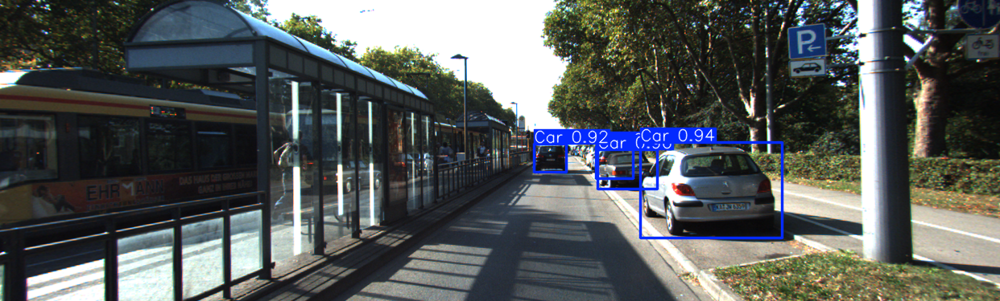

In [16]:
from ultralytics import YOLO

# Try loading and running inference with the trained model
model = YOLO("runs/detect/yolov8n_sgdeiou_KD_pat40/weights/best.pt")  # path to your trained model
results = model.predict("/workspace/000007.png")  # use any sample image
results[0].show()


In [20]:
import shutil

# Specify the folder path and the destination zip file path
folder_path = '/workspace/yolov8n_sdgeiou_KD_distill'
zip_file_path = '/workspace/yolov8n_sdgeiou_KD_distill.zip'

# Create a zip file from the folder
shutil.make_archive(zip_file_path.replace('.zip', ''), 'zip', folder_path)

'/workspace/yolov8n_sdgeiou_KD_distill.zip'

In [21]:
import shutil

# Specify the folder path and the destination zip file path
folder_path = 'runs/detect/yolov8n_sdgdeiou_KD'
zip_file_path = 'runs/detect/yolov8n_sdgdeiou_KD.zip'

# Create a zip file from the folder
shutil.make_archive(zip_file_path.replace('.zip', ''), 'zip', folder_path)

'/workspace/yolo-distiller/runs/detect/yolov8n_sdgdeiou_KD.zip'